In [320]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))






In [26]:
import scipy.sparse as sp
import os
import sys
import numpy as np
import pandas as pd
import time 
import networkx as nx
from sklearn.preprocessing import OneHotEncoder as OHE
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split 
import dgl
import torch
import torch.nn as nn
import torch.nn.functional as F
import dgl.nn.pytorch as dglnn
from collections import defaultdict as ddict

from dgl.dataloading import GraphDataLoader
from dgl.nn import GATConv, GraphConv
from dgl import DGLGraph

from tqdm import tqdm
import logging
import plotly

import matplotlib.pyplot as plt

In [2]:
# create logger
logger = logging.getLogger(__name__)
# set log level for all handlers to debug
logging.basicConfig(stream=sys.stdout, level=logging.INFO)


In [3]:
OHE_NODE_CATEGORIES = {'atom_type': list(range(23)), 'ligand_protein': [0,1]}
OHE_EDGE_CATEGORIES = {'edge_type': [0,1]}
FOLDER = '02-pdbbind-refined-1k/'
LABELS_FILE = '02-pdbbind-refined.csv'

# Data analysis

In [49]:
df = pd.read_csv(LABELS_FILE)

In [50]:
df.head()

,pdb,run,pose,nfrb,e_docking,rmsd,eLJ,emetal,eHB,eelec,etors,is_good,e_exp,name
0,184l,0,0,2,-5.32687,0.55437,-1.41440,0.0,0.206,-0.00003,0.2352,1,-6.444844,184l-0-0.gml
1,184l,0,1,2,-5.15635,1.80368,-1.34504,0.0,0.261,-0.00049,0.2352,0,-6.444844,184l-0-1.gml
2,184l,0,2,2,-5.03622,4.19935,-1.37091,0.0,0.363,0.00039,0.2352,0,-6.444844,184l-0-2.gml
3,184l,0,3,2,-5.05864,4.24878,-1.40106,0.0,0.378,0.00002,0.2352,0,-6.444844,184l-0-3.gml
4,184l,0,4,2,-5.12396,4.24426,-1.41376,0.0,0.213,-0.00005,0.2352,0,-6.444844,184l-0-4.gml


In [59]:
class NPZ_parser:
    def __init__(self, folder, 
                 labels_file,
                 task = 'classification', 
                 ohe_node_encoding = ['atom_type', 'ligand_protein'],
                 ohe_edge_encoding = ['edge_type']):
        self.folder = folder
        self.labels_file = labels_file
        self.task = task
        self.node_ohe = OHE(categories=[OHE_NODE_CATEGORIES[feature] for feature in ohe_node_encoding])
        self.edge_ohe = OHE(categories=[OHE_EDGE_CATEGORIES[feature] for feature in ohe_edge_encoding])
        self.graphs = []
        self.labels = []
        self.ohe_node_encoding = ohe_node_encoding
        
        logger.debug([OHE_NODE_CATEGORIES[feature] for feature in ohe_node_encoding])
        
    
    def parser(self):
        npz_files = list(filter(lambda x: 'npz' in x, os.listdir(self.folder)))
        df = pd.read_csv(self.labels_file)
        for npz_file in tqdm(npz_files):
            g_ligand, g_protein,  g_protein_ligand = self.npz_file_process(npz_file)
            self.graphs.append({'ligand':g_ligand, 'protein':g_protein, 'protein_ligand': g_protein_ligand})
            self.labels.append(self.process_labels(df, npz_file))
        return self.graphs, self.labels
        
    def npz_file_process(self, npz_file):
        filepath = os.path.join(self.folder, npz_file)
        with np.load(filepath) as data:
            # load node data attributes
            node_data = data['node_data']
            self.shape_logs('node', node_data)
            self.attr_logs(node_data)

            # separate node attributes for protein and ligand
            node_data_ligand, node_data_protein, node_data_protein_ligand = self.separate_node_attrs(node_data)
            self.shape_logs('node ligand', node_data_ligand)
            self.shape_logs('node protein', node_data_protein)

            # load edge data attributes
            edge_data = data['edge_data']
            self.shape_logs('edge', edge_data)
            self.attr_logs(edge_data)

            # load edges info
            edges = data['edges']
            self.shape_logs('edges', edges)

            # separate edge attributes and endges for protein and ligand
            edges_ligand, edge_data_ligand = self.separate_edge_attrs(edges, edge_data, node_data, mol_name = 'ligand')
            edges_protein, edge_data_protein = self.separate_edge_attrs(edges, edge_data, node_data, mol_name = 'protein')
            edges_protein_ligand, edge_data_protein_ligand = self.separate_edge_attrs(edges, edge_data, node_data, mol_name = 'protein_ligand')

            # create encoded matricies of node features
            X_ligand = self.X_matrix_create(node_data_ligand)
            X_protein = self.X_matrix_create(node_data_protein)
            X_protein_ligand = self.X_matrix_create(node_data_protein_ligand)

            # create encoded matricies of edge features
            A_ligand, E_ligand = self.A_E_matrix_create(edge_data_ligand)
            A_protein, E_protein = self.A_E_matrix_create(edge_data_protein)
            A_protein_ligand, E_protein_ligand = self.A_E_matrix_create(edge_data_protein_ligand)

            # create graphs
            g_ligand = self.construct_graph(edges_ligand, X_ligand, E_ligand)
            g_protein = self.construct_graph(edges_protein, X_protein, E_protein)
            g_protein_ligand = self.construct_graph(edges_protein_ligand, X_protein_ligand, E_protein_ligand)

            assert torch.all(g_ligand.in_degrees().bool())
            assert torch.all(g_protein.in_degrees().bool())
            assert torch.all(g_protein_ligand.in_degrees().bool())

            return g_ligand, g_protein,  g_protein_ligand
            
            
            
            
    def shape_logs(self, attrs_name, attrs_data):
        logger.info(f"shape of {attrs_name} attrs {attrs_data.shape}")
        logger.info(f"array of {attrs_name} attrs {attrs_data[0]}")
            
    def attr_logs(self, attrs_data):
        for i in range(1, attrs_data.shape[1]):
            logger.debug(f"Unique values of {i} attribute: "
                  f"{np.unique(attrs_data[:, i])}")
            
    def separate_node_attrs(self, node_data):
        if 'ligand_protein' in self.ohe_node_encoding:
            feature_columns = [1,3,4]
        else:
            feature_columns = [1 ,4]
        node_data_protein = node_data[np.where(node_data[:,3]==0)][:,feature_columns]
        node_data_ligand = node_data[np.where(node_data[:,3]==1)][:, feature_columns]
        node_data_protein_ligand = node_data[:, feature_columns]
        
        return node_data_ligand, node_data_protein, node_data_protein_ligand
            
    def separate_edge_attrs(self, edges, edge_data, node_data, mol_name = 'ligand'):
        if mol_name == 'protein_ligand':
            edges_protein_ligand = np.vstack([edges, edges[:,[1, 0]]])
            edge_data_protein_ligand = np.vstack([edge_data, edge_data])
            return edges_protein_ligand, edge_data_protein_ligand 
        if mol_name == 'ligand':
            node_attr_value = 1
        elif mol_name == 'protein':
            node_attr_value = 0
        edges_mol = edges[np.isin(edges[:,0], np.where(node_data[:,3]==node_attr_value)[0])] # get only edges according to ligand nodes
        edge_data_mol = edge_data[np.isin(edges[:,0], np.where(node_data[:,3]==node_attr_value)[0])]
        edge_data_mol = edge_data_mol[np.isin(edges_mol[:,1], np.where(node_data[:,3]==node_attr_value)[0])]
        edges_mol = edges_mol[np.isin(edges_mol[:,1], np.where(node_data[:,3]==node_attr_value)[0])]
        if mol_name == 'ligand':
            edges_mol = edges_mol - edges_mol.min() # renumerate edges for ligand (in data first nodes - protein, last - ligand)
        edges_mol = np.vstack([edges_mol, edges_mol[:,[1, 0]]]) # duplicate edges for bidirectional manner
        edge_data_mol = np.vstack([edge_data_mol, edge_data_mol])# duplicate edges for bidirectional manner
        
        logger.info(f"Num of {mol_name} edges {edges_mol.shape}")
        logger.info(f"Num of {mol_name} edge attrs {edge_data_mol.shape}")
        return edges_mol, edge_data_mol
    
    def X_matrix_create(self, node_data):
        if len(self.ohe_node_encoding)>1:
            
            X_ohe = self.node_ohe.fit_transform(node_data[:, :-1]).todense()
        else:
            X_ohe = self.node_ohe.fit_transform(node_data[:, 0].reshape(-1, 1)).todense()
        X = torch.tensor(np.hstack((X_ohe, node_data[:,-1].reshape(-1, 1))))
        return X
    
    def A_E_matrix_create(self, edge_data):
        A = self.edge_ohe.fit_transform(edge_data[:, 1:]).todense()
        E = torch.tensor(np.hstack((edge_data[:, :1], A)))
        return A, E
    
    def construct_graph(self, edges, X, E):
        g = dgl.graph((edges[:, 0], edges[:, 1]))
        g.ndata['node_features'] = X
        g.edata['edge_features'] = E
        return g
    
    def process_labels(self, df, npz_file):
        filegml = f"{npz_file.split('.')[0]}.gml"
        exp_data = df[df['name'] == filegml]
        assert len(exp_data) == 1
        if self.task == 'classification':
            label_classification = exp_data['is_good'].values[0]
            return label_classification
        elif self.task == 'regression':
            label_regression = exp_data['e_exp'].values[0]
            label_e_docking = exp_data['e_docking'].values[0]
            label_rmsd = exp_data['rmsd'].values[0]
            
            return {'e_exp': label_regression, 'e_docking': label_e_docking, 'rmsd': label_rmsd}

In [5]:
def create_loaders(graphs, labels,
                  train_size = 0.7,
                  batch_size = 1024):
    np.random.seed(0)

    train_data, test_data = train_test_split(list(zip(graphs, labels)), train_size=train_size, shuffle=True)

    train_labels_exp = [data[1]['e_exp'] for data in train_data]
    train_labels_docking = [data[1]['e_docking'] for data in train_data]
    
    train_protein = [data[0]['protein'] for data in train_data]
    train_ligand = [data[0]['ligand'] for data in train_data]
    train_protein_ligand = [data[0]['protein_ligand'] for data in train_data]

    test_labels_exp = [data[1]['e_exp'] for data in test_data]
    test_labels_docking = [data[1]['e_docking'] for data in test_data]
    
    test_protein = [data[0]['protein'] for data in test_data]
    test_ligand = [data[0]['ligand'] for data in test_data]
    test_protein_ligand = [data[0]['protein_ligand'] for data in test_data]
    



    trainloader = GraphDataLoader(list(zip(list(zip(train_ligand,train_protein, train_protein_ligand)), list(zip(train_labels_exp, train_labels_docking)))), batch_size=batch_size, drop_last=False, shuffle=True)
    testloader = GraphDataLoader(list(zip(list(zip(test_ligand,test_protein, test_protein_ligand)), list(zip(test_labels_exp, test_labels_docking)))), batch_size=batch_size, drop_last=False, shuffle=True)
    
    return trainloader, testloader

In [43]:
def train_model(gnn, optimizer, loader, device):
    gnn.train()
    
    losses = []
    for gs, ls in loader:
        gs_protein = gs[1]
        gs_ligand = gs[0]
        gs_protein_ligand = gs[2]
        gs_protein_ligand = gs_protein_ligand.to(device)
        gs_ligand = gs_ligand.to(device)
        gs_protein = gs_protein.to(device)
        
        ls_exp = ls[0].reshape(-1, 1)
        E_docking = ls[1].reshape(-1, 1)
        ls_exp = ls_exp.to(device)
    
        feats_protein = gs_protein.ndata['node_features'].float()
        feats_ligand = gs_ligand.ndata['node_features'].float()
        feats_protein_ligand = gs_protein_ligand.ndata['node_features'].float()
        
        E_L = gnn(gs_ligand, feats_ligand)
        E_P = gnn(gs_protein, feats_protein)
        E_PL = gnn(gs_protein_ligand, feats_protein_ligand)
        
        E = E_docking + E_PL - E_P - E_L
        logger.debug(f'E_docking shape {E_docking.shape}')
        logger.debug(f'E_PL shape {E_PL.shape}')
        logger.debug(f'E_P shape {E_P.shape}')
        logger.debug(f'E_L shape {E_L.shape}')
        
        

        loss = F.mse_loss(E, ls_exp)
        losses.append(loss.cpu().detach().item())

        opt.zero_grad()
        loss.backward()
        opt.step()
    return np.mean(losses)
    
    
def evaluate_model(gnn, optimizer, loader, device):
    gnn.eval()
    
    elements = 0
    y_true = []
    y_pred = []
    losses = []
    for gs, ls in loader:
        gs_protein = gs[1]
        gs_ligand = gs[0]
        gs_protein_ligand = gs[2]
        
        
        gs_protein_ligand = gs_protein_ligand.to(device)
        gs_ligand = gs_ligand.to(device)
        gs_protein = gs_protein.to(device)
        
        ls_exp = ls[0].reshape(-1, 1)
        E_docking = ls[1].reshape(-1, 1)
        feats_protein = gs_protein.ndata['node_features'].float()
        feats_ligand = gs_ligand.ndata['node_features'].float()
        feats_protein_ligand = gs_protein_ligand.ndata['node_features'].float()
        
        E_L = gnn(gs_ligand, feats_ligand)
        E_P = gnn(gs_protein, feats_protein)
        E_PL = gnn(gs_protein_ligand, feats_protein_ligand)
        
        E = E_docking + E_PL - E_P - E_L
        
        loss = F.mse_loss(E, ls_exp).cpu().detach().item()
        
        
        losses.append(loss)
        
        elements += ls_exp.shape[0]
        y_true+=ls_exp.cpu().detach()
        y_pred+=E.cpu().detach()
        logger.debug(y_true)
        logger.debug(y_pred)
    logger.debug(r2_score(y_true, y_pred))
    
            
    return np.mean(losses), mean_squared_error(y_true, y_pred, squared = False), r2_score(y_true, y_pred), y_true, y_pred

In [8]:
def plot_interactive(metrics_list, legend=['Train', 'Val', 'Test'], title='', logx=False, logy=False, metric_name='loss', start_from=0):
    import plotly.graph_objects as go
    fig = go.Figure()
    dash_opt = ['dash', 'dot']
    
    for mi, metrics in enumerate(metrics_list):
        metric_results = metrics[metric_name]
        xs = [list(range(len(metric_results)))] * len(metric_results[0])
        ys = list(zip(*metric_results))


        for i in range(len(ys)):
            fig.add_trace(go.Scatter(x=xs[i][start_from:], y=ys[i][start_from:],
                                     mode='lines+markers',
                                     name=legend[i + mi*3], line={'dash': dash_opt[mi]}))

    fig.update_layout(
        title=title,
        title_x=0.5,
        xaxis_title='Epoch',
        yaxis_title='',
        font=dict(
            size=40,
        ),
        height=600,
    )

    if logx:
        fig.update_layout(xaxis_type="log")
    if logy:
        fig.update_layout(yaxis_type="log")

    fig.show()

# Exp 1

model - GCN with edge weights  (multipled by destination)

No edge feature

No rmsd fix

In [7]:
class Regressor(nn.Module):
    def __init__(self, in_dim, hidden_dim, with_edge_weights = True):
        super(Regressor, self).__init__()
        self.conv1 = dglnn.GraphConv(in_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.conv2 = dglnn.GraphConv(hidden_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.regress = nn.Linear(hidden_dim, 1)
        self.with_edge_weights = with_edge_weights

    def forward(self, g, h, ew=True):
        # Apply graph convolution and activation.
        if self.with_edge_weights:
            e_weights = g.edata['edge_features'][:, 0].float()
        else:
            e_weights=None
        h = F.relu(self.conv1(g, h, edge_weight=e_weights))
        h = F.relu(self.conv2(g, h, edge_weight=e_weights))
        with g.local_scope():
            g.ndata['h'] = h
            # Calculate graph representation by average readout.
            hg = dgl.mean_nodes(g, 'h')
            return self.regress(hg)

In [60]:
npz_parser = NPZ_parser(folder = FOLDER, 
                 labels_file = LABELS_FILE,
                 task = 'regression', 
                 ohe_node_encoding = ['atom_type'],
                 ohe_edge_encoding = ['edge_type'])

In [61]:
graphs, labels = npz_parser.parser()

  0%|          | 0/1000 [00:00<?, ?it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16684, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16684, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26630, 2)
INFO:__main__:Num of protein edge attrs (26630, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

  0%|          | 4/1000 [00:00<00:31, 31.75it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (22077, 2)
INFO:__main__:array of edge attrs [3.4332 0.    ]
INFO:__main__:shape of edges attrs (22077, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (704, 2)
INFO:__main__:Num of ligand edge attrs (704, 2)
INFO:__main__:Num of protein edges (35338, 2)
INFO:__main__:Num of protein edge attrs (35338, 2)
INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sha

  1%|          | 8/1000 [00:00<00:32, 30.74it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13361, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (13361, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (828, 2)
INFO:__main__:Num of ligand edge attrs (828, 2)
INFO:__main__:Num of protein edges (20306, 2)
INFO:__main__:Num of protein edge attrs (20306, 2)
INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

  1%|          | 12/1000 [00:00<00:32, 30.86it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19181, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (19181, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1404, 2)
INFO:__main__:Num of ligand edge attrs (1404, 2)
INFO:__main__:Num of protein edges (28378, 2)
INFO:__main__:Num of protein edge attrs (28378, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  2%|▏         | 16/1000 [00:00<00:32, 30.42it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12759, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12759, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

  2%|▏         | 20/1000 [00:00<00:32, 30.28it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15879, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15879, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1390, 2)
INFO:__main__:Num of ligand edge attrs (1390, 2)
INFO:__main__:Num of protein edges (22322, 2)
INFO:__main__:Num of protein edge attrs (22322, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 24/1000 [00:00<00:31, 30.64it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12406, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21186, 2)
INFO:__main__:Num of protein edge attrs (21186, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  3%|▎         | 28/1000 [00:00<00:31, 30.72it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13202, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13202, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (356, 2)
INFO:__main__:Num of ligand edge attrs (356, 2)
INFO:__main__:Num of protein edges (21540, 2)
INFO:__main__:Num of protein edge attrs (21540, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  3%|▎         | 32/1000 [00:01<00:31, 30.33it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14905, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (14905, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (888, 2)
INFO:__main__:Num of ligand edge attrs (888, 2)
INFO:__main__:Num of protein edges (23418, 2)
INFO:__main__:Num of protein edge attrs (23418, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  4%|▎         | 36/1000 [00:01<00:31, 30.97it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11901, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11901, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20288, 2)
INFO:__main__:Num of protein edge attrs (20288, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  4%|▍         | 40/1000 [00:01<00:31, 30.74it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [458.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13184, 2)
INFO:__main__:array of edge attrs [1.22836 1.     ]
INFO:__main__:shape of edges attrs (13184, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (314, 2)
INFO:__main__:Num of ligand edge attrs (314, 2)
INFO:__main__:Num of protein edges (21664, 2)
INFO:__main__:Num of protein edge attrs (21664, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  4%|▍         | 44/1000 [00:01<00:30, 31.12it/s]

INFO:__main__:shape of node attrs (356, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (322, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (15629, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (15629, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (866, 2)
INFO:__main__:Num of ligand edge attrs (866, 2)
INFO:__main__:Num of protein edges (24536, 2)
INFO:__main__:Num of protein edge attrs (24536, 2)
INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  5%|▍         | 48/1000 [00:01<00:30, 30.72it/s]

INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (15089, 2)
INFO:__main__:array of edge attrs [2.26816 0.     ]
INFO:__main__:shape of edges attrs (15089, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1496, 2)
INFO:__main__:Num of ligand edge attrs (1496, 2)
INFO:__main__:Num of protein edges (20994, 2)
INFO:__main__:Num of protein edge attrs (20994, 2)
INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  5%|▌         | 52/1000 [00:01<00:30, 30.86it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14923, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (14923, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (862, 2)
INFO:__main__:Num of ligand edge attrs (862, 2)
INFO:__main__:Num of protein edges (23122, 2)
INFO:__main__:Num of protein edge attrs (23122, 2)
INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attr

  6%|▌         | 56/1000 [00:01<00:31, 30.31it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13098, 2)
INFO:__main__:array of edge attrs [5.21726 0.     ]
INFO:__main__:shape of edges attrs (13098, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21082, 2)
INFO:__main__:Num of protein edge attrs (21082, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  6%|▌         | 60/1000 [00:01<00:30, 31.09it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12511, 2)
INFO:__main__:array of edge attrs [6.11734 0.     ]
INFO:__main__:shape of edges attrs (12511, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21332, 2)
INFO:__main__:Num of protein edge attrs (21332, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

  6%|▋         | 64/1000 [00:02<00:30, 30.97it/s]

INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8447, 2)
INFO:__main__:array of edge attrs [3.03552 0.     ]
INFO:__main__:shape of edges attrs (8447, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14158, 2)
INFO:__main__:Num of protein edge attrs (14158, 2)
INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

  7%|▋         | 68/1000 [00:02<00:29, 31.43it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22633, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22633, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (762, 2)
INFO:__main__:Num of ligand edge attrs (762, 2)
INFO:__main__:Num of protein edges (36470, 2)
INFO:__main__:Num of protein edge attrs (36470, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

  7%|▋         | 72/1000 [00:02<00:30, 30.74it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12705, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12705, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21804, 2)
INFO:__main__:Num of protein edge attrs (21804, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

  8%|▊         | 76/1000 [00:02<00:30, 30.63it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16415, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16415, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (26370, 2)
INFO:__main__:Num of protein edge attrs (26370, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  8%|▊         | 80/1000 [00:02<00:29, 30.91it/s]

INFO:__main__:shape of node attrs (412, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15390, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15390, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1416, 2)
INFO:__main__:Num of ligand edge attrs (1416, 2)
INFO:__main__:Num of protein edges (21676, 2)
INFO:__main__:Num of protein edge attrs (21676, 2)
INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  8%|▊         | 84/1000 [00:02<00:29, 31.00it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12898, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12898, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22190, 2)
INFO:__main__:Num of protein edge attrs (22190, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  9%|▉         | 88/1000 [00:02<00:29, 30.79it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15005, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15005, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1434, 2)
INFO:__main__:Num of ligand edge attrs (1434, 2)
INFO:__main__:Num of protein edges (20886, 2)
INFO:__main__:Num of protein edge attrs (20886, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  9%|▉         | 92/1000 [00:02<00:29, 31.19it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15389, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15389, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (854, 2)
INFO:__main__:Num of ligand edge attrs (854, 2)
INFO:__main__:Num of protein edges (24060, 2)
INFO:__main__:Num of protein edge attrs (24060, 2)
INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attr

 10%|▉         | 96/1000 [00:03<00:28, 31.29it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13035, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13035, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22254, 2)
INFO:__main__:Num of protein edge attrs (22254, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 10%|█         | 100/1000 [00:03<00:28, 31.11it/s]

INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (296, 2)
INFO:__main__:Num of ligand edge attrs (296, 2)
INFO:__main__:Num of protein edges (20374, 2)
INFO:__main__:Num of protein edge attrs (20374, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|█         | 104/1000 [00:03<00:28, 31.24it/s]

INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13501, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13501, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (846, 2)
INFO:__main__:Num of ligand edge attrs (846, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 11%|█         | 108/1000 [00:03<00:28, 30.91it/s]

INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14164, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14164, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1558, 2)
INFO:__main__:Num of ligand edge attrs (1558, 2)
INFO:__main__:Num of protein edges (19342, 2)
INFO:__main__:Num of protein edge attrs (19342, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 11%|█         | 112/1000 [00:03<00:28, 31.17it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14409, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (14409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (886, 2)
INFO:__main__:Num of ligand edge attrs (886, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 12%|█▏        | 116/1000 [00:03<00:28, 31.14it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22906, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22906, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (738, 2)
INFO:__main__:Num of ligand edge attrs (738, 2)
INFO:__main__:Num of protein edges (36876, 2)
INFO:__main__:Num of protein edge attrs (36876, 2)
INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (268, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 12%|█▏        | 120/1000 [00:03<00:28, 31.30it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13202, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (13202, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22782, 2)
INFO:__main__:Num of protein edge attrs (22782, 2)
INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 12%|█▏        | 124/1000 [00:04<00:28, 30.84it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13368, 2)
INFO:__main__:array of edge attrs [3.67787 0.     ]
INFO:__main__:shape of edges attrs (13368, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21650, 2)
INFO:__main__:Num of protein edge attrs (21650, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 13%|█▎        | 128/1000 [00:04<00:27, 31.30it/s]

INFO:__main__:shape of node attrs (400, 5)
INFO:__main__:array of node attrs [265.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18256, 2)
INFO:__main__:array of edge attrs [1.32222 1.     ]
INFO:__main__:shape of edges attrs (18256, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (29802, 2)
INFO:__main__:Num of protein edge attrs (29802, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 13%|█▎        | 132/1000 [00:04<00:27, 31.20it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12810, 2)
INFO:__main__:array of edge attrs [3.79748 0.     ]
INFO:__main__:shape of edges attrs (12810, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21854, 2)
INFO:__main__:Num of protein edge attrs (21854, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 14%|█▎        | 136/1000 [00:04<00:27, 31.08it/s]

INFO:__main__:shape of node attrs (340, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14524, 2)
INFO:__main__:array of edge attrs [4.04088 0.     ]
INFO:__main__:shape of edges attrs (14524, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (22388, 2)
INFO:__main__:Num of protein edge attrs (22388, 2)
INFO:__main__:shape of node attrs (482, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 14%|█▍        | 140/1000 [00:04<00:28, 30.65it/s]

INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15920, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15920, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25640, 2)
INFO:__main__:Num of protein edge attrs (25640, 2)
INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 14%|█▍        | 144/1000 [00:04<00:27, 30.95it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12656, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12656, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21550, 2)
INFO:__main__:Num of protein edge attrs (21550, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 15%|█▍        | 148/1000 [00:04<00:27, 31.34it/s]

INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15304, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15304, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (510, 2)
INFO:__main__:Num of ligand edge attrs (510, 2)
INFO:__main__:Num of protein edges (24488, 2)
INFO:__main__:Num of protein edge attrs (24488, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 15%|█▌        | 152/1000 [00:04<00:27, 31.27it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13109, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (13109, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22544, 2)
INFO:__main__:Num of protein edge attrs (22544, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 16%|█▌        | 156/1000 [00:05<00:27, 31.10it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16464, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16464, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (484, 2)
INFO:__main__:Num of ligand edge attrs (484, 2)
INFO:__main__:Num of protein edges (26442, 2)
INFO:__main__:Num of protein edge attrs (26442, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (424, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 16%|█▌        | 160/1000 [00:05<00:27, 30.36it/s]

INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (14138, 2)
INFO:__main__:array of edge attrs [5.86459 0.     ]
INFO:__main__:shape of edges attrs (14138, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (836, 2)
INFO:__main__:Num of ligand edge attrs (836, 2)
INFO:__main__:Num of protein edges (21880, 2)
INFO:__main__:Num of protein edge attrs (21880, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 16%|█▋        | 164/1000 [00:05<00:26, 31.21it/s]

INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11845, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (11845, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (19240, 2)
INFO:__main__:Num of protein edge attrs (19240, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 17%|█▋        | 168/1000 [00:05<00:26, 30.95it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12697, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12697, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21798, 2)
INFO:__main__:Num of protein edge attrs (21798, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 17%|█▋        | 172/1000 [00:05<00:26, 31.46it/s]

INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15053, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15053, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (23968, 2)
INFO:__main__:Num of protein edge attrs (23968, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 18%|█▊        | 176/1000 [00:05<00:26, 30.73it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12163, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12163, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (20600, 2)
INFO:__main__:Num of protein edge attrs (20600, 2)
INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 18%|█▊        | 180/1000 [00:05<00:26, 30.43it/s]

INFO:__main__:shape of node attrs (369, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (345, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15655, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15655, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25110, 2)
INFO:__main__:Num of protein edge attrs (25110, 2)
INFO:__main__:shape of node attrs (433, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 18%|█▊        | 184/1000 [00:05<00:26, 30.41it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13056, 2)
INFO:__main__:array of edge attrs [1.52369 1.     ]
INFO:__main__:shape of edges attrs (13056, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (20038, 2)
INFO:__main__:Num of protein edge attrs (20038, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 19%|█▉        | 188/1000 [00:06<00:26, 30.37it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17524, 2)
INFO:__main__:array of edge attrs [3.27543 0.     ]
INFO:__main__:shape of edges attrs (17524, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1254, 2)
INFO:__main__:Num of ligand edge attrs (1254, 2)
INFO:__main__:Num of protein edges (25996, 2)
INFO:__main__:Num of protein edge attrs (25996, 2)
INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 19%|█▉        | 192/1000 [00:06<00:26, 29.96it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21166, 2)
INFO:__main__:Num of protein edge attrs (21166, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 20%|█▉        | 196/1000 [00:06<00:26, 30.36it/s]

INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21640, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21640, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (31266, 2)
INFO:__main__:Num of protein edge attrs (31266, 2)
INFO:__main__:shape of node attrs (391, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 20%|██        | 200/1000 [00:06<00:27, 29.62it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11515, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11515, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (19376, 2)
INFO:__main__:Num of protein edge attrs (19376, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (264, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 20%|██        | 204/1000 [00:06<00:26, 30.09it/s]

INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17859, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17859, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1388, 2)
INFO:__main__:Num of ligand edge attrs (1388, 2)
INFO:__main__:Num of protein edges (26456, 2)
INFO:__main__:Num of protein edge attrs (26456, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 21%|██        | 208/1000 [00:06<00:26, 30.02it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20936, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20936, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1364, 2)
INFO:__main__:Num of ligand edge attrs (1364, 2)
INFO:__main__:Num of protein edges (31634, 2)
INFO:__main__:Num of protein edge attrs (31634, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 21%|██        | 212/1000 [00:06<00:25, 30.32it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21791, 2)
INFO:__main__:array of edge attrs [1.2321 1.    ]
INFO:__main__:shape of edges attrs (21791, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (34926, 2)
INFO:__main__:Num of protein edge attrs (34926, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 22%|██▏       | 216/1000 [00:07<00:25, 30.30it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12353, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12353, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (20116, 2)
INFO:__main__:Num of protein edge attrs (20116, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 22%|██▏       | 220/1000 [00:07<00:25, 30.85it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22488, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22488, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (766, 2)
INFO:__main__:Num of ligand edge attrs (766, 2)
INFO:__main__:Num of protein edges (36202, 2)
INFO:__main__:Num of protein edge attrs (36202, 2)
INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 22%|██▏       | 224/1000 [00:07<00:25, 29.95it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11561, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11561, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19408, 2)
INFO:__main__:Num of protein edge attrs (19408, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 23%|██▎       | 228/1000 [00:07<00:25, 30.74it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12229, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12229, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20006, 2)
INFO:__main__:Num of protein edge attrs (20006, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 23%|██▎       | 232/1000 [00:07<00:24, 30.93it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20882, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (20882, 2)
INFO:__main__:array of edges attrs [  0 193]
INFO:__main__:Num of ligand edges (774, 2)
INFO:__main__:Num of ligand edge attrs (774, 2)
INFO:__main__:Num of protein edges (32974, 2)
INFO:__main__:Num of protein edge attrs (32974, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 24%|██▎       | 236/1000 [00:07<00:25, 30.05it/s]

INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14253, 2)
INFO:__main__:array of edge attrs [1.52369 1.     ]
INFO:__main__:shape of edges attrs (14253, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (882, 2)
INFO:__main__:Num of ligand edge attrs (882, 2)
INFO:__main__:Num of protein edges (21862, 2)
INFO:__main__:Num of protein edge attrs (21862, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 24%|██▍       | 240/1000 [00:07<00:25, 29.84it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19126, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19126, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1230, 2)
INFO:__main__:Num of ligand edge attrs (1230, 2)
INFO:__main__:Num of protein edges (28456, 2)
INFO:__main__:Num of protein edge attrs (28456, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 24%|██▍       | 243/1000 [00:07<00:25, 29.75it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13699, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13699, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (902, 2)
INFO:__main__:Num of ligand edge attrs (902, 2)
INFO:__main__:Num of protein edges (20660, 2)
INFO:__main__:Num of protein edge attrs (20660, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 25%|██▍       | 247/1000 [00:08<00:25, 29.96it/s]

INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [143.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16006, 2)
INFO:__main__:array of edge attrs [1.34367 1.     ]
INFO:__main__:shape of edges attrs (16006, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1532, 2)
INFO:__main__:Num of ligand edge attrs (1532, 2)
INFO:__main__:Num of protein edges (22744, 2)
INFO:__main__:Num of protein edge attrs (22744, 2)
INFO:__main__:shape of node attrs (367, 5)
INFO:__main__:array of node attrs [192.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (343, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 25%|██▌       | 251/1000 [00:08<00:24, 30.13it/s]

INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21305, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (21305, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (32524, 2)
INFO:__main__:Num of protein edge attrs (32524, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 26%|██▌       | 255/1000 [00:08<00:24, 29.94it/s]

INFO:__main__:shape of node attrs (507, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (452, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (22355, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (22355, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2002, 2)
INFO:__main__:Num of ligand edge attrs (2002, 2)
INFO:__main__:Num of protein edges (32040, 2)
INFO:__main__:Num of protein edge attrs (32040, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 26%|██▌       | 258/1000 [00:08<00:24, 29.84it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22921, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22921, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (36954, 2)
INFO:__main__:Num of protein edge attrs (36954, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2295.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 26%|██▌       | 262/1000 [00:08<00:24, 29.94it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12893, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12893, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (866, 2)
INFO:__main__:Num of ligand edge attrs (866, 2)
INFO:__main__:Num of protein edges (19538, 2)
INFO:__main__:Num of protein edge attrs (19538, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 27%|██▋       | 266/1000 [00:08<00:24, 29.72it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12152, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12152, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 27%|██▋       | 270/1000 [00:08<00:24, 30.16it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21952, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21952, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (722, 2)
INFO:__main__:Num of ligand edge attrs (722, 2)
INFO:__main__:Num of protein edges (35202, 2)
INFO:__main__:Num of protein edge attrs (35202, 2)
INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 27%|██▋       | 274/1000 [00:08<00:24, 29.85it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11974, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (11974, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (856, 2)
INFO:__main__:Num of ligand edge attrs (856, 2)
INFO:__main__:Num of protein edges (18200, 2)
INFO:__main__:Num of protein edge attrs (18200, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 28%|██▊       | 278/1000 [00:09<00:23, 30.36it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17343, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17343, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (27980, 2)
INFO:__main__:Num of protein edge attrs (27980, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main

 28%|██▊       | 282/1000 [00:09<00:29, 24.06it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19739, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19739, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1948, 2)
INFO:__main__:Num of ligand edge attrs (1948, 2)
INFO:__main__:Num of protein edges (27988, 2)
INFO:__main__:Num of protein edge attrs (27988, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (298, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 29%|██▊       | 286/1000 [00:09<00:27, 26.02it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13695, 2)
INFO:__main__:array of edge attrs [3.85289 0.     ]
INFO:__main__:shape of edges attrs (13695, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (864, 2)
INFO:__main__:Num of ligand edge attrs (864, 2)
INFO:__main__:Num of protein edges (21088, 2)
INFO:__main__:Num of protein edge attrs (21088, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 29%|██▉       | 290/1000 [00:09<00:25, 27.34it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17562, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17562, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28606, 2)
INFO:__main__:Num of protein edge attrs (28606, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 29%|██▉       | 294/1000 [00:09<00:24, 28.32it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17788, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17788, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (28632, 2)
INFO:__main__:Num of protein edge attrs (28632, 2)
INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 30%|██▉       | 298/1000 [00:09<00:23, 29.51it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19676, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19676, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (29350, 2)
INFO:__main__:Num of protein edge attrs (29350, 2)
INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 30%|███       | 302/1000 [00:09<00:23, 29.78it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21490, 2)
INFO:__main__:array of edge attrs [3.4332 0.    ]
INFO:__main__:shape of edges attrs (21490, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (776, 2)
INFO:__main__:Num of ligand edge attrs (776, 2)
INFO:__main__:Num of protein edges (34286, 2)
INFO:__main__:Num of protein edge attrs (34286, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 31%|███       | 306/1000 [00:10<00:23, 29.61it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12573, 2)
INFO:__main__:array of edge attrs [1.23906 1.     ]
INFO:__main__:shape of edges attrs (12573, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21368, 2)
INFO:__main__:Num of protein edge attrs (21368, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 31%|███       | 310/1000 [00:10<00:23, 29.56it/s]

INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (15269, 2)
INFO:__main__:array of edge attrs [4.04088 0.     ]
INFO:__main__:shape of edges attrs (15269, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (814, 2)
INFO:__main__:Num of ligand edge attrs (814, 2)
INFO:__main__:Num of protein edges (23752, 2)
INFO:__main__:Num of protein edge attrs (23752, 2)
INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 31%|███▏      | 314/1000 [00:10<00:23, 29.56it/s]

INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16000, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16000, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (22774, 2)
INFO:__main__:Num of protein edge attrs (22774, 2)
INFO:__main__:shape of node attrs (334, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 32%|███▏      | 318/1000 [00:10<00:22, 30.21it/s]

INFO:__main__:shape of node attrs (334, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13710, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13710, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (338, 2)
INFO:__main__:Num of ligand edge attrs (338, 2)
INFO:__main__:Num of protein edges (22458, 2)
INFO:__main__:Num of protein edge attrs (22458, 2)
INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 32%|███▏      | 322/1000 [00:10<00:22, 29.66it/s]

INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (886, 2)
INFO:__main__:Num of ligand edge attrs (886, 2)
INFO:__main__:Num of protein edges (23194, 2)
INFO:__main__:Num of protein edge attrs (23194, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 33%|███▎      | 326/1000 [00:10<00:22, 29.76it/s]

INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16109, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (16109, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1446, 2)
INFO:__main__:Num of ligand edge attrs (1446, 2)
INFO:__main__:Num of protein edges (22834, 2)
INFO:__main__:Num of protein edge attrs (22834, 2)
INFO:__main__:shape of node attrs (369, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (345, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 33%|███▎      | 330/1000 [00:10<00:22, 29.92it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12577, 2)
INFO:__main__:array of edge attrs [2.60437 0.     ]
INFO:__main__:shape of edges attrs (12577, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21572, 2)
INFO:__main__:Num of protein edge attrs (21572, 2)
INFO:__main__:shape of node attrs (280, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 33%|███▎      | 334/1000 [00:11<00:21, 30.48it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15737, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15737, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25304, 2)
INFO:__main__:Num of protein edge attrs (25304, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 34%|███▍      | 338/1000 [00:11<00:21, 30.45it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12142, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12142, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20686, 2)
INFO:__main__:Num of protein edge attrs (20686, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 34%|███▍      | 342/1000 [00:11<00:21, 31.16it/s]

INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16279, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (16279, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (520, 2)
INFO:__main__:Num of ligand edge attrs (520, 2)
INFO:__main__:Num of protein edges (26170, 2)
INFO:__main__:Num of protein edge attrs (26170, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 35%|███▍      | 346/1000 [00:11<00:21, 30.34it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14239, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14239, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24804, 2)
INFO:__main__:Num of protein edge attrs (24804, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 35%|███▌      | 350/1000 [00:11<00:21, 30.53it/s]

INFO:__main__:shape of node attrs (267, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (255, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11904, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11904, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20122, 2)
INFO:__main__:Num of protein edge attrs (20122, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 35%|███▌      | 354/1000 [00:11<00:21, 29.96it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12028, 2)
INFO:__main__:array of edge attrs [3.5591 0.    ]
INFO:__main__:shape of edges attrs (12028, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (20426, 2)
INFO:__main__:Num of protein edge attrs (20426, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (399, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 36%|███▌      | 358/1000 [00:11<00:21, 29.74it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8428, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8428, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14050, 2)
INFO:__main__:Num of protein edge attrs (14050, 2)
INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 36%|███▌      | 362/1000 [00:11<00:20, 30.45it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14521, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14521, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25306, 2)
INFO:__main__:Num of protein edge attrs (25306, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 37%|███▋      | 366/1000 [00:12<00:21, 29.66it/s]

INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (324, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13331, 2)
INFO:__main__:array of edge attrs [7.78197 0.     ]
INFO:__main__:shape of edges attrs (13331, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (450, 2)
INFO:__main__:Num of ligand edge attrs (450, 2)
INFO:__main__:Num of protein edges (21540, 2)
INFO:__main__:Num of protein edge attrs (21540, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 37%|███▋      | 370/1000 [00:12<00:21, 29.72it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12574, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12574, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (862, 2)
INFO:__main__:Num of ligand edge attrs (862, 2)
INFO:__main__:Num of protein edges (18984, 2)
INFO:__main__:Num of protein edge attrs (18984, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 37%|███▋      | 374/1000 [00:12<00:20, 29.90it/s]

INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [2.12605 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (20548, 2)
INFO:__main__:Num of protein edge attrs (20548, 2)
INFO:__main__:shape of node attrs (537, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (482, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 38%|███▊      | 377/1000 [00:12<00:20, 29.82it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12034, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (12034, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (848, 2)
INFO:__main__:Num of ligand edge attrs (848, 2)
INFO:__main__:Num of protein edges (18344, 2)
INFO:__main__:Num of protein edge attrs (18344, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 38%|███▊      | 381/1000 [00:12<00:20, 30.07it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22958, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22958, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (776, 2)
INFO:__main__:Num of ligand edge attrs (776, 2)
INFO:__main__:Num of protein edges (37220, 2)
INFO:__main__:Num of protein edge attrs (37220, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 38%|███▊      | 385/1000 [00:12<00:20, 30.05it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [20. 17.  0.  0.  1.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [17.  1.]
INFO:__main__:shape of edge attrs (12815, 2)
INFO:__main__:array of edge attrs [0.999877 1.      ]
INFO:__main__:shape of edges attrs (12815, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (830, 2)
INFO:__main__:Num of ligand edge attrs (830, 2)
INFO:__main__:Num of protein edges (19688, 2)
INFO:__main__:Num of protein edge attrs (19688, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 39%|███▉      | 389/1000 [00:12<00:19, 30.85it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [151.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23017, 2)
INFO:__main__:array of edge attrs [1.5383 1.    ]
INFO:__main__:shape of edges attrs (23017, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (758, 2)
INFO:__main__:Num of ligand edge attrs (758, 2)
INFO:__main__:Num of protein edges (37218, 2)
INFO:__main__:Num of protein edge attrs (37218, 2)
INFO:__main__:shape of node attrs (400, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 39%|███▉      | 393/1000 [00:12<00:19, 30.36it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13479, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13479, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (978, 2)
INFO:__main__:Num of ligand edge attrs (978, 2)
INFO:__main__:Num of protein edges (20204, 2)
INFO:__main__:Num of protein edge attrs (20204, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 40%|███▉      | 397/1000 [00:13<00:19, 30.69it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22073, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22073, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (788, 2)
INFO:__main__:Num of ligand edge attrs (788, 2)
INFO:__main__:Num of protein edges (35366, 2)
INFO:__main__:Num of protein edge attrs (35366, 2)
INFO:__main__:shape of node attrs (385, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (361, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 40%|████      | 401/1000 [00:13<00:19, 30.24it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13406, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (13406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (900, 2)
INFO:__main__:Num of ligand edge attrs (900, 2)
INFO:__main__:Num of protein edges (20412, 2)
INFO:__main__:Num of protein edge attrs (20412, 2)
INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (302, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 40%|████      | 405/1000 [00:13<00:19, 30.50it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (420, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19984, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19984, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1336, 2)
INFO:__main__:Num of ligand edge attrs (1336, 2)
INFO:__main__:Num of protein edges (30156, 2)
INFO:__main__:Num of protein edge attrs (30156, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 41%|████      | 409/1000 [00:13<00:19, 29.85it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12205, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12205, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20694, 2)
INFO:__main__:Num of protein edge attrs (20694, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 41%|████▏     | 413/1000 [00:13<00:19, 30.13it/s]

INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18016, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (18016, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (29412, 2)
INFO:__main__:Num of protein edge attrs (29412, 2)
INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 417/1000 [00:13<00:20, 29.12it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22139, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22139, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (768, 2)
INFO:__main__:Num of ligand edge attrs (768, 2)
INFO:__main__:Num of protein edges (35506, 2)
INFO:__main__:Num of protein edge attrs (35506, 2)
INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 420/1000 [00:13<00:20, 28.73it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16129, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16129, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (25952, 2)
INFO:__main__:Num of protein edge attrs (25952, 2)
INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 42%|████▏     | 424/1000 [00:14<00:19, 29.22it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13045, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13045, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22322, 2)
INFO:__main__:Num of protein edge attrs (22322, 2)
INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 43%|████▎     | 427/1000 [00:14<00:19, 29.15it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (14548, 2)
INFO:__main__:array of edge attrs [5.91654 0.     ]
INFO:__main__:shape of edges attrs (14548, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (23248, 2)
INFO:__main__:Num of protein edge attrs (23248, 2)
INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 43%|████▎     | 430/1000 [00:14<00:19, 28.97it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12219, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12219, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20810, 2)
INFO:__main__:Num of protein edge attrs (20810, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 43%|████▎     | 434/1000 [00:14<00:19, 29.60it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16363, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16363, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (26342, 2)
INFO:__main__:Num of protein edge attrs (26342, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 44%|████▎     | 437/1000 [00:14<00:19, 29.39it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12812, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12812, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 44%|████▍     | 440/1000 [00:14<00:18, 29.53it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13889, 2)
INFO:__main__:array of edge attrs [1.46064 1.     ]
INFO:__main__:shape of edges attrs (13889, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (21192, 2)
INFO:__main__:Num of protein edge attrs (21192, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 44%|████▍     | 444/1000 [00:14<00:18, 29.56it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12637, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12637, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21520, 2)
INFO:__main__:Num of protein edge attrs (21520, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 45%|████▍     | 448/1000 [00:14<00:18, 30.09it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13530, 2)
INFO:__main__:array of edge attrs [2.39665 0.     ]
INFO:__main__:shape of edges attrs (13530, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (20518, 2)
INFO:__main__:Num of protein edge attrs (20518, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 45%|████▌     | 452/1000 [00:14<00:17, 30.74it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12082, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12082, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20486, 2)
INFO:__main__:Num of protein edge attrs (20486, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 46%|████▌     | 456/1000 [00:15<00:17, 30.47it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13340, 2)
INFO:__main__:array of edge attrs [3.20139 0.     ]
INFO:__main__:shape of edges attrs (13340, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (906, 2)
INFO:__main__:Num of ligand edge attrs (906, 2)
INFO:__main__:Num of protein edges (20222, 2)
INFO:__main__:Num of protein edge attrs (20222, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 46%|████▌     | 460/1000 [00:15<00:18, 29.95it/s]

INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16921, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16921, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (24534, 2)
INFO:__main__:Num of protein edge attrs (24534, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 46%|████▋     | 464/1000 [00:15<00:17, 30.55it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14587, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14587, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25430, 2)
INFO:__main__:Num of protein edge attrs (25430, 2)
INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (351, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 47%|████▋     | 468/1000 [00:15<00:17, 30.00it/s]

INFO:__main__:shape of node attrs (493, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21463, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (21463, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (32880, 2)
INFO:__main__:Num of protein edge attrs (32880, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 47%|████▋     | 472/1000 [00:15<00:17, 29.60it/s]

INFO:__main__:shape of node attrs (341, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12399, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (12399, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1708, 2)
INFO:__main__:Num of ligand edge attrs (1708, 2)
INFO:__main__:Num of protein edges (16404, 2)
INFO:__main__:Num of protein edge attrs (16404, 2)
INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 48%|████▊     | 476/1000 [00:15<00:17, 29.94it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20494, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20494, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (30838, 2)
INFO:__main__:Num of protein edge attrs (30838, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 48%|████▊     | 480/1000 [00:15<00:17, 30.42it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21295, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (21295, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (824, 2)
INFO:__main__:Num of ligand edge attrs (824, 2)
INFO:__main__:Num of protein edges (33962, 2)
INFO:__main__:Num of protein edge attrs (33962, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge

 48%|████▊     | 484/1000 [00:16<00:17, 29.52it/s]

INFO:__main__:shape of node attrs (345, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14424, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (14424, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (22770, 2)
INFO:__main__:Num of protein edge attrs (22770, 2)
INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 49%|████▊     | 487/1000 [00:16<00:17, 29.53it/s]

INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12662, 2)
INFO:__main__:array of edge attrs [1.0002 1.    ]
INFO:__main__:shape of edges attrs (12662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (830, 2)
INFO:__main__:Num of ligand edge attrs (830, 2)
INFO:__main__:Num of protein edges (19414, 2)
INFO:__main__:Num of protein edge attrs (19414, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 49%|████▉     | 491/1000 [00:16<00:17, 29.53it/s]

INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16832, 2)
INFO:__main__:array of edge attrs [2.80305 0.     ]
INFO:__main__:shape of edges attrs (16832, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1340, 2)
INFO:__main__:Num of ligand edge attrs (1340, 2)
INFO:__main__:Num of protein edges (24720, 2)
INFO:__main__:Num of protein edge attrs (24720, 2)
INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 50%|████▉     | 495/1000 [00:16<00:17, 29.49it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12639, 2)
INFO:__main__:array of edge attrs [3.5591 0.    ]
INFO:__main__:shape of edges attrs (12639, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21534, 2)
INFO:__main__:Num of protein edge attrs (21534, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 50%|████▉     | 499/1000 [00:16<00:16, 29.79it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22416, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22416, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (758, 2)
INFO:__main__:Num of ligand edge attrs (758, 2)
INFO:__main__:Num of protein edges (35908, 2)
INFO:__main__:Num of protein edge attrs (35908, 2)
INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 50%|█████     | 502/1000 [00:16<00:16, 29.53it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (250, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (10972, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (10972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (854, 2)
INFO:__main__:Num of ligand edge attrs (854, 2)
INFO:__main__:Num of protein edges (16406, 2)
INFO:__main__:Num of protein edge attrs (16406, 2)
INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 51%|█████     | 506/1000 [00:16<00:16, 30.36it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22964, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22964, 2)
INFO:__main__:array of edges attrs [  0 207]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (37088, 2)
INFO:__main__:Num of protein edge attrs (37088, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 51%|█████     | 510/1000 [00:16<00:16, 30.31it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13003, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (13003, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22372, 2)
INFO:__main__:Num of protein edge attrs (22372, 2)
INFO:__main__:shape of node attrs (482, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 51%|█████▏    | 514/1000 [00:17<00:15, 30.61it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12987, 2)
INFO:__main__:array of edge attrs [1.46064 1.     ]
INFO:__main__:shape of edges attrs (12987, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (828, 2)
INFO:__main__:Num of ligand edge attrs (828, 2)
INFO:__main__:Num of protein edges (19700, 2)
INFO:__main__:Num of protein edge attrs (19700, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 52%|█████▏    | 518/1000 [00:17<00:15, 30.64it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12536, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12536, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20494, 2)
INFO:__main__:Num of protein edge attrs (20494, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 52%|█████▏    | 522/1000 [00:17<00:15, 31.04it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12955, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (12955, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (22218, 2)
INFO:__main__:Num of protein edge attrs (22218, 2)
INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 53%|█████▎    | 526/1000 [00:17<00:15, 30.77it/s]

INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8380, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8380, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13962, 2)
INFO:__main__:Num of protein edge attrs (13962, 2)
INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (382, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 53%|█████▎    | 530/1000 [00:17<00:15, 31.20it/s]

INFO:__main__:shape of node attrs (359, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (335, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15164, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15164, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (24230, 2)
INFO:__main__:Num of protein edge attrs (24230, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 53%|█████▎    | 534/1000 [00:17<00:15, 30.77it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (20944, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (20944, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (32012, 2)
INFO:__main__:Num of protein edge attrs (32012, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 54%|█████▍    | 538/1000 [00:17<00:15, 30.57it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21984, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (21984, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (35284, 2)
INFO:__main__:Num of protein edge attrs (35284, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 54%|█████▍    | 542/1000 [00:17<00:15, 29.98it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (11764, 2)
INFO:__main__:array of edge attrs [1.00042 1.     ]
INFO:__main__:shape of edges attrs (11764, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (18434, 2)
INFO:__main__:Num of protein edge attrs (18434, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__mai

 55%|█████▍    | 546/1000 [00:18<00:15, 29.79it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15111, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15111, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1470, 2)
INFO:__main__:Num of ligand edge attrs (1470, 2)
INFO:__main__:Num of protein edges (20818, 2)
INFO:__main__:Num of protein edge attrs (20818, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 55%|█████▍    | 549/1000 [00:18<00:15, 29.40it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12401, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12401, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21180, 2)
INFO:__main__:Num of protein edge attrs (21180, 2)
INFO:__main__:shape of node attrs (231, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (219, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 55%|█████▌    | 553/1000 [00:18<00:14, 30.23it/s]

INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22023, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22023, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1724, 2)
INFO:__main__:Num of ligand edge attrs (1724, 2)
INFO:__main__:Num of protein edges (32336, 2)
INFO:__main__:Num of protein edge attrs (32336, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 56%|█████▌    | 557/1000 [00:18<00:14, 29.60it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16747, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16747, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (540, 2)
INFO:__main__:Num of ligand edge attrs (540, 2)
INFO:__main__:Num of protein edges (26784, 2)
INFO:__main__:Num of protein edge attrs (26784, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 56%|█████▌    | 560/1000 [00:18<00:14, 29.58it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17702, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (17702, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1764, 2)
INFO:__main__:Num of ligand edge attrs (1764, 2)
INFO:__main__:Num of protein edges (25066, 2)
INFO:__main__:Num of protein edge attrs (25066, 2)
INFO:__main__:shape of node attrs (407, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 56%|█████▋    | 563/1000 [00:18<00:14, 29.65it/s]

INFO:__main__:shape of node attrs (372, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17122, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17122, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (27266, 2)
INFO:__main__:Num of protein edge attrs (27266, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 57%|█████▋    | 567/1000 [00:18<00:14, 30.17it/s]

INFO:__main__:shape of node attrs (524, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (469, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (23176, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (23176, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1950, 2)
INFO:__main__:Num of ligand edge attrs (1950, 2)
INFO:__main__:Num of protein edges (33958, 2)
INFO:__main__:Num of protein edge attrs (33958, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 57%|█████▋    | 571/1000 [00:18<00:14, 29.26it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16710, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16710, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1334, 2)
INFO:__main__:Num of ligand edge attrs (1334, 2)
INFO:__main__:Num of protein edges (24206, 2)
INFO:__main__:Num of protein edge attrs (24206, 2)
INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 57%|█████▊    | 575/1000 [00:19<00:14, 30.01it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19188, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19188, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1254, 2)
INFO:__main__:Num of ligand edge attrs (1254, 2)
INFO:__main__:Num of protein edges (28808, 2)
INFO:__main__:Num of protein edge attrs (28808, 2)
INFO:__main__:shape of node attrs (485, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 58%|█████▊    | 579/1000 [00:19<00:14, 29.50it/s]

INFO:__main__:shape of node attrs (511, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (456, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22324, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (22324, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1940, 2)
INFO:__main__:Num of ligand edge attrs (1940, 2)
INFO:__main__:Num of protein edges (32502, 2)
INFO:__main__:Num of protein edge attrs (32502, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 58%|█████▊    | 582/1000 [00:19<00:14, 29.49it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12383, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12383, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20182, 2)
INFO:__main__:Num of protein edge attrs (20182, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 59%|█████▊    | 586/1000 [00:19<00:13, 29.90it/s]

INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18400, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18400, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1312, 2)
INFO:__main__:Num of ligand edge attrs (1312, 2)
INFO:__main__:Num of protein edges (27226, 2)
INFO:__main__:Num of protein edge attrs (27226, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 59%|█████▉    | 590/1000 [00:19<00:13, 30.30it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [88.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12551, 2)
INFO:__main__:array of edge attrs [5.67618 0.     ]
INFO:__main__:shape of edges attrs (12551, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (950, 2)
INFO:__main__:Num of ligand edge attrs (950, 2)
INFO:__main__:Num of protein edges (18940, 2)
INFO:__main__:Num of protein edge attrs (18940, 2)
INFO:__main__:shape of node attrs (390, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 59%|█████▉    | 594/1000 [00:19<00:13, 30.07it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [192.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16248, 2)
INFO:__main__:array of edge attrs [2.18935 0.     ]
INFO:__main__:shape of edges attrs (16248, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26272, 2)
INFO:__main__:Num of protein edge attrs (26272, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 60%|█████▉    | 598/1000 [00:19<00:13, 30.56it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14500, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14500, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1418, 2)
INFO:__main__:Num of ligand edge attrs (1418, 2)
INFO:__main__:Num of protein edges (20266, 2)
INFO:__main__:Num of protein edge attrs (20266, 2)
INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 60%|██████    | 602/1000 [00:19<00:13, 29.95it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21307, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (820, 2)
INFO:__main__:Num of ligand edge attrs (820, 2)
INFO:__main__:Num of protein edges (34026, 2)
INFO:__main__:Num of protein edge attrs (34026, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 61%|██████    | 606/1000 [00:20<00:13, 29.84it/s]

INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12977, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (12977, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (20672, 2)
INFO:__main__:Num of protein edge attrs (20672, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (446, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 61%|██████    | 609/1000 [00:20<00:13, 29.51it/s]

INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (17631, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (17631, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1258, 2)
INFO:__main__:Num of ligand edge attrs (1258, 2)
INFO:__main__:Num of protein edges (26340, 2)
INFO:__main__:Num of protein edge attrs (26340, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 61%|██████    | 612/1000 [00:20<00:13, 29.40it/s]

INFO:__main__:shape of node attrs (406, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15185, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15185, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1462, 2)
INFO:__main__:Num of ligand edge attrs (1462, 2)
INFO:__main__:Num of protein edges (21094, 2)
INFO:__main__:Num of protein edge attrs (21094, 2)
INFO:__main__:shape of node attrs (233, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (221, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 62%|██████▏   | 616/1000 [00:20<00:12, 30.34it/s]

INFO:__main__:shape of node attrs (532, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (477, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22986, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (22986, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1680, 2)
INFO:__main__:Num of ligand edge attrs (1680, 2)
INFO:__main__:Num of protein edges (34256, 2)
INFO:__main__:Num of protein edge attrs (34256, 2)
INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 62%|██████▏   | 620/1000 [00:20<00:12, 29.76it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [85.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13738, 2)
INFO:__main__:array of edge attrs [1.53933 1.     ]
INFO:__main__:shape of edges attrs (13738, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (21228, 2)
INFO:__main__:Num of protein edge attrs (21228, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 62%|██████▏   | 624/1000 [00:20<00:12, 30.49it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19497, 2)
INFO:__main__:array of edge attrs [4.95171 0.     ]
INFO:__main__:shape of edges attrs (19497, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1416, 2)
INFO:__main__:Num of ligand edge attrs (1416, 2)
INFO:__main__:Num of protein edges (29234, 2)
INFO:__main__:Num of protein edge attrs (29234, 2)
INFO:__main__:shape of node attrs (523, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (468, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 63%|██████▎   | 628/1000 [00:20<00:12, 29.88it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16667, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (26614, 2)
INFO:__main__:Num of protein edge attrs (26614, 2)
INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 63%|██████▎   | 632/1000 [00:20<00:12, 30.07it/s]

INFO:__main__:shape of node attrs (435, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17952, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17952, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1292, 2)
INFO:__main__:Num of ligand edge attrs (1292, 2)
INFO:__main__:Num of protein edges (26466, 2)
INFO:__main__:Num of protein edge attrs (26466, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 64%|██████▎   | 636/1000 [00:21<00:12, 29.58it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12871, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12871, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (19536, 2)
INFO:__main__:Num of protein edge attrs (19536, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 64%|██████▍   | 639/1000 [00:21<00:12, 29.10it/s]

INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15717, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15717, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1486, 2)
INFO:__main__:Num of ligand edge attrs (1486, 2)
INFO:__main__:Num of protein edges (21848, 2)
INFO:__main__:Num of protein edge attrs (21848, 2)
INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 64%|██████▍   | 642/1000 [00:21<00:12, 29.32it/s]

INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18672, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18672, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1368, 2)
INFO:__main__:Num of ligand edge attrs (1368, 2)
INFO:__main__:Num of protein edges (27450, 2)
INFO:__main__:Num of protein edge attrs (27450, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 64%|██████▍   | 645/1000 [00:21<00:12, 29.39it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16667, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26854, 2)
INFO:__main__:Num of protein edge attrs (26854, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 65%|██████▍   | 648/1000 [00:21<00:12, 29.29it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12718, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12718, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21762, 2)
INFO:__main__:Num of protein edge attrs (21762, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 65%|██████▌   | 652/1000 [00:21<00:11, 29.92it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11933, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11933, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (18694, 2)
INFO:__main__:Num of protein edge attrs (18694, 2)
INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 66%|██████▌   | 656/1000 [00:21<00:11, 29.91it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21926, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21926, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (35048, 2)
INFO:__main__:Num of protein edge attrs (35048, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 66%|██████▌   | 659/1000 [00:21<00:11, 29.63it/s]

INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12478, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12478, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (20380, 2)
INFO:__main__:Num of protein edge attrs (20380, 2)
INFO:__main__:shape of node attrs (278, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (244, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 66%|██████▋   | 663/1000 [00:21<00:10, 30.92it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11890, 2)
INFO:__main__:array of edge attrs [2.13119 0.     ]
INFO:__main__:shape of edges attrs (11890, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (530, 2)
INFO:__main__:Num of ligand edge attrs (530, 2)
INFO:__main__:Num of protein edges (18668, 2)
INFO:__main__:Num of protein edge attrs (18668, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 67%|██████▋   | 667/1000 [00:22<00:10, 31.43it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13550, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13550, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (882, 2)
INFO:__main__:Num of ligand edge attrs (882, 2)
INFO:__main__:Num of protein edges (20478, 2)
INFO:__main__:Num of protein edge attrs (20478, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 67%|██████▋   | 671/1000 [00:22<00:10, 31.00it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22257, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22257, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (764, 2)
INFO:__main__:Num of ligand edge attrs (764, 2)
INFO:__main__:Num of protein edges (35836, 2)
INFO:__main__:Num of protein edge attrs (35836, 2)
INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 68%|██████▊   | 675/1000 [00:22<00:10, 29.72it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8469, 2)
INFO:__main__:array of edge attrs [3.03552 0.     ]
INFO:__main__:shape of edges attrs (8469, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14202, 2)
INFO:__main__:Num of protein edge attrs (14202, 2)
INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 68%|██████▊   | 679/1000 [00:22<00:10, 30.28it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11752, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11752, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (19994, 2)
INFO:__main__:Num of protein edge attrs (19994, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 68%|██████▊   | 683/1000 [00:22<00:10, 30.12it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12211, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12211, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19858, 2)
INFO:__main__:Num of protein edge attrs (19858, 2)
INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 69%|██████▊   | 687/1000 [00:22<00:10, 30.13it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19159, 2)
INFO:__main__:array of edge attrs [2.19788 0.     ]
INFO:__main__:shape of edges attrs (19159, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1364, 2)
INFO:__main__:Num of ligand edge attrs (1364, 2)
INFO:__main__:Num of protein edges (28478, 2)
INFO:__main__:Num of protein edge attrs (28478, 2)
INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 69%|██████▉   | 691/1000 [00:22<00:10, 29.80it/s]

INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20922, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20922, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1376, 2)
INFO:__main__:Num of ligand edge attrs (1376, 2)
INFO:__main__:Num of protein edges (31748, 2)
INFO:__main__:Num of protein edge attrs (31748, 2)
INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 69%|██████▉   | 694/1000 [00:23<00:10, 29.32it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19288, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19288, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1774, 2)
INFO:__main__:Num of ligand edge attrs (1774, 2)
INFO:__main__:Num of protein edges (27350, 2)
INFO:__main__:Num of protein edge attrs (27350, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 70%|██████▉   | 697/1000 [00:23<00:10, 28.80it/s]

INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13354, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13354, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (856, 2)
INFO:__main__:Num of ligand edge attrs (856, 2)
INFO:__main__:Num of protein edges (20302, 2)
INFO:__main__:Num of protein edge attrs (20302, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 70%|███████   | 700/1000 [00:23<00:10, 28.99it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17547, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17547, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (28330, 2)
INFO:__main__:Num of protein edge attrs (28330, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 70%|███████   | 703/1000 [00:23<00:10, 29.26it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19392, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (19392, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1888, 2)
INFO:__main__:Num of ligand edge attrs (1888, 2)
INFO:__main__:Num of protein edges (27536, 2)
INFO:__main__:Num of protein edge attrs (27536, 2)
INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 706/1000 [00:23<00:10, 29.33it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11191, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (11191, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (18214, 2)
INFO:__main__:Num of protein edge attrs (18214, 2)
INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 71%|███████   | 709/1000 [00:23<00:09, 29.25it/s]

INFO:__main__:shape of node attrs (524, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (469, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22727, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22727, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1870, 2)
INFO:__main__:Num of ligand edge attrs (1870, 2)
INFO:__main__:Num of protein edges (33206, 2)
INFO:__main__:Num of protein edge attrs (33206, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 71%|███████   | 712/1000 [00:23<00:09, 28.95it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16454, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (16454, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1416, 2)
INFO:__main__:Num of ligand edge attrs (1416, 2)
INFO:__main__:Num of protein edges (23530, 2)
INFO:__main__:Num of protein edge attrs (23530, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sh

 72%|███████▏  | 716/1000 [00:23<00:09, 30.04it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12086, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (19738, 2)
INFO:__main__:Num of protein edge attrs (19738, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 72%|███████▏  | 719/1000 [00:23<00:09, 29.85it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18026, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1284, 2)
INFO:__main__:Num of ligand edge attrs (1284, 2)
INFO:__main__:Num of protein edges (26672, 2)
INFO:__main__:Num of protein edge attrs (26672, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 72%|███████▏  | 722/1000 [00:23<00:09, 29.78it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15997, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15997, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1306, 2)
INFO:__main__:Num of ligand edge attrs (1306, 2)
INFO:__main__:Num of protein edges (22940, 2)
INFO:__main__:Num of protein edge attrs (22940, 2)
INFO:__main__:shape of node attrs (361, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 73%|███████▎  | 726/1000 [00:24<00:08, 30.74it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14589, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (14589, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (346, 2)
INFO:__main__:Num of ligand edge attrs (346, 2)
INFO:__main__:Num of protein edges (24070, 2)
INFO:__main__:Num of protein edge attrs (24070, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 73%|███████▎  | 730/1000 [00:24<00:08, 31.45it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18068, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (18068, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (520, 2)
INFO:__main__:Num of ligand edge attrs (520, 2)
INFO:__main__:Num of protein edges (29418, 2)
INFO:__main__:Num of protein edge attrs (29418, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 73%|███████▎  | 734/1000 [00:24<00:08, 30.74it/s]

INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23023, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (23023, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (796, 2)
INFO:__main__:Num of ligand edge attrs (796, 2)
INFO:__main__:Num of protein edges (37244, 2)
INFO:__main__:Num of protein edge attrs (37244, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 74%|███████▍  | 738/1000 [00:24<00:08, 30.71it/s]

INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12712, 2)
INFO:__main__:array of edge attrs [3.11759 0.     ]
INFO:__main__:shape of edges attrs (12712, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (486, 2)
INFO:__main__:Num of ligand edge attrs (486, 2)
INFO:__main__:Num of protein edges (20228, 2)
INFO:__main__:Num of protein edge attrs (20228, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0

 74%|███████▍  | 742/1000 [00:24<00:08, 30.37it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19658, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19658, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1266, 2)
INFO:__main__:Num of ligand edge attrs (1266, 2)
INFO:__main__:Num of protein edges (29878, 2)
INFO:__main__:Num of protein edge attrs (29878, 2)
INFO:__main__:shape of node attrs (518, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (463, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 75%|███████▍  | 746/1000 [00:24<00:08, 29.88it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (22013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (22013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (35428, 2)
INFO:__main__:Num of protein edge attrs (35428, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 75%|███████▍  | 749/1000 [00:24<00:08, 29.86it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18195, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18195, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1312, 2)
INFO:__main__:Num of ligand edge attrs (1312, 2)
INFO:__main__:Num of protein edges (26928, 2)
INFO:__main__:Num of protein edge attrs (26928, 2)
INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 75%|███████▌  | 753/1000 [00:25<00:08, 30.11it/s]

INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14464, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14464, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1432, 2)
INFO:__main__:Num of ligand edge attrs (1432, 2)
INFO:__main__:Num of protein edges (19764, 2)
INFO:__main__:Num of protein edge attrs (19764, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 76%|███████▌  | 757/1000 [00:25<00:08, 29.82it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18534, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18534, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1268, 2)
INFO:__main__:Num of ligand edge attrs (1268, 2)
INFO:__main__:Num of protein edges (27730, 2)
INFO:__main__:Num of protein edge attrs (27730, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 76%|███████▌  | 760/1000 [00:25<00:08, 29.73it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (399, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19021, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19021, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1790, 2)
INFO:__main__:Num of ligand edge attrs (1790, 2)
INFO:__main__:Num of protein edges (27104, 2)
INFO:__main__:Num of protein edge attrs (27104, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 76%|███████▋  | 763/1000 [00:25<00:08, 29.44it/s]

INFO:__main__:shape of node attrs (364, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15722, 2)
INFO:__main__:array of edge attrs [1.3102 1.    ]
INFO:__main__:shape of edges attrs (15722, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (518, 2)
INFO:__main__:Num of ligand edge attrs (518, 2)
INFO:__main__:Num of protein edges (25152, 2)
INFO:__main__:Num of protein edge attrs (25152, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 77%|███████▋  | 766/1000 [00:25<00:07, 29.45it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11547, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11547, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (576, 2)
INFO:__main__:Num of ligand edge attrs (576, 2)
INFO:__main__:Num of protein edges (17928, 2)
INFO:__main__:Num of protein edge attrs (17928, 2)
INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 77%|███████▋  | 770/1000 [00:25<00:07, 29.74it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19662, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1272, 2)
INFO:__main__:Num of ligand edge attrs (1272, 2)
INFO:__main__:Num of protein edges (29756, 2)
INFO:__main__:Num of protein edge attrs (29756, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 77%|███████▋  | 774/1000 [00:25<00:07, 30.66it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12306, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12306, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20150, 2)
INFO:__main__:Num of protein edge attrs (20150, 2)
INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 78%|███████▊  | 778/1000 [00:25<00:07, 30.84it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19154, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19154, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1456, 2)
INFO:__main__:Num of ligand edge attrs (1456, 2)
INFO:__main__:Num of protein edges (28420, 2)
INFO:__main__:Num of protein edge attrs (28420, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 78%|███████▊  | 782/1000 [00:25<00:07, 30.45it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12033, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12033, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (316, 2)
INFO:__main__:Num of ligand edge attrs (316, 2)
INFO:__main__:Num of protein edges (19474, 2)
INFO:__main__:Num of protein edge attrs (19474, 2)
INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 79%|███████▊  | 786/1000 [00:26<00:07, 30.54it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16791, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16791, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26842, 2)
INFO:__main__:Num of protein edge attrs (26842, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 79%|███████▉  | 790/1000 [00:26<00:06, 30.73it/s]

INFO:__main__:shape of node attrs (518, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (463, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22546, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (22546, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1884, 2)
INFO:__main__:Num of ligand edge attrs (1884, 2)
INFO:__main__:Num of protein edges (32846, 2)
INFO:__main__:Num of protein edge attrs (32846, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 79%|███████▉  | 794/1000 [00:26<00:06, 30.44it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12165, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12165, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (19748, 2)
INFO:__main__:Num of protein edge attrs (19748, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [59.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 80%|███████▉  | 798/1000 [00:26<00:06, 31.01it/s]

INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8363, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8363, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13970, 2)
INFO:__main__:Num of protein edge attrs (13970, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 80%|████████  | 802/1000 [00:26<00:06, 30.80it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22515, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22515, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (748, 2)
INFO:__main__:Num of ligand edge attrs (748, 2)
INFO:__main__:Num of protein edges (36216, 2)
INFO:__main__:Num of protein edge attrs (36216, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of ed

 81%|████████  | 806/1000 [00:26<00:06, 30.78it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (313, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (14115, 2)
INFO:__main__:array of edge attrs [5.46157 0.     ]
INFO:__main__:shape of edges attrs (14115, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (526, 2)
INFO:__main__:Num of ligand edge attrs (526, 2)
INFO:__main__:Num of protein edges (22212, 2)
INFO:__main__:Num of protein edge attrs (22212, 2)
INFO:__main__:shape of node attrs (493, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 81%|████████  | 810/1000 [00:26<00:06, 30.03it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16623, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (16623, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1326, 2)
INFO:__main__:Num of ligand edge attrs (1326, 2)
INFO:__main__:Num of protein edges (24114, 2)
INFO:__main__:Num of protein edge attrs (24114, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 81%|████████▏ | 814/1000 [00:27<00:06, 29.79it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19259, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (19259, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1678, 2)
INFO:__main__:Num of ligand edge attrs (1678, 2)
INFO:__main__:Num of protein edges (27922, 2)
INFO:__main__:Num of protein edge attrs (27922, 2)
INFO:__main__:shape of node attrs (289, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 82%|████████▏ | 818/1000 [00:27<00:06, 29.81it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19223, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (19223, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1826, 2)
INFO:__main__:Num of ligand edge attrs (1826, 2)
INFO:__main__:Num of protein edges (27824, 2)
INFO:__main__:Num of protein edge attrs (27824, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 82%|████████▏ | 821/1000 [00:27<00:06, 29.74it/s]

INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8408, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8408, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14084, 2)
INFO:__main__:Num of protein edge attrs (14084, 2)
INFO:__main__:shape of node attrs (527, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (472, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 82%|████████▏ | 824/1000 [00:27<00:05, 29.75it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16025, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1458, 2)
INFO:__main__:Num of ligand edge attrs (1458, 2)
INFO:__main__:Num of protein edges (22710, 2)
INFO:__main__:Num of protein edge attrs (22710, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 83%|████████▎ | 828/1000 [00:27<00:05, 29.65it/s]

INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (10487, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (10487, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (16090, 2)
INFO:__main__:Num of protein edge attrs (16090, 2)
INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 83%|████████▎ | 831/1000 [00:27<00:05, 29.71it/s]

INFO:__main__:shape of node attrs (266, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (254, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11866, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11866, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20044, 2)
INFO:__main__:Num of protein edge attrs (20044, 2)
INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 83%|████████▎ | 834/1000 [00:27<00:05, 29.06it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12142, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12142, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19740, 2)
INFO:__main__:Num of protein edge attrs (19740, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 84%|████████▍ | 838/1000 [00:27<00:05, 30.11it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17504, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17504, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (28232, 2)
INFO:__main__:Num of protein edge attrs (28232, 2)
INFO:__main__:shape of node attrs (332, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (298, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of 

 84%|████████▍ | 842/1000 [00:27<00:05, 29.40it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12526, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12526, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20462, 2)
INFO:__main__:Num of protein edge attrs (20462, 2)
INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 85%|████████▍ | 846/1000 [00:28<00:05, 30.31it/s]

INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18285, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18285, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (540, 2)
INFO:__main__:Num of ligand edge attrs (540, 2)
INFO:__main__:Num of protein edges (29526, 2)
INFO:__main__:Num of protein edge attrs (29526, 2)
INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 85%|████████▌ | 850/1000 [00:28<00:04, 30.18it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12268, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (12268, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (18954, 2)
INFO:__main__:Num of protein edge attrs (18954, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 85%|████████▌ | 854/1000 [00:28<00:04, 29.95it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13027, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (13027, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (836, 2)
INFO:__main__:Num of ligand edge attrs (836, 2)
INFO:__main__:Num of protein edges (19704, 2)
INFO:__main__:Num of protein edge attrs (19704, 2)
INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of 

 86%|████████▌ | 857/1000 [00:28<00:04, 29.86it/s]

INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8552, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8552, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14380, 2)
INFO:__main__:Num of protein edge attrs (14380, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [4.319e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3.

 86%|████████▌ | 861/1000 [00:28<00:04, 30.40it/s]

INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18492, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (18492, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1784, 2)
INFO:__main__:Num of ligand edge attrs (1784, 2)
INFO:__main__:Num of protein edges (25832, 2)
INFO:__main__:Num of protein edge attrs (25832, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 86%|████████▋ | 865/1000 [00:28<00:04, 30.13it/s]

INFO:__main__:shape of node attrs (384, 5)
INFO:__main__:array of node attrs [247.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (360, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17612, 2)
INFO:__main__:array of edge attrs [1.50362 1.     ]
INFO:__main__:shape of edges attrs (17612, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (28342, 2)
INFO:__main__:Num of protein edge attrs (28342, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 87%|████████▋ | 869/1000 [00:28<00:04, 29.63it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11709, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11709, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (19880, 2)
INFO:__main__:Num of protein edge attrs (19880, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 87%|████████▋ | 873/1000 [00:28<00:04, 30.18it/s]

INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16968, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (16968, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1348, 2)
INFO:__main__:Num of ligand edge attrs (1348, 2)
INFO:__main__:Num of protein edges (25096, 2)
INFO:__main__:Num of protein edge attrs (25096, 2)
INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 877/1000 [00:29<00:04, 29.81it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19806, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19806, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1334, 2)
INFO:__main__:Num of ligand edge attrs (1334, 2)
INFO:__main__:Num of protein edges (29830, 2)
INFO:__main__:Num of protein edge attrs (29830, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 880/1000 [00:29<00:04, 29.61it/s]

INFO:__main__:shape of node attrs (368, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (344, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16571, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16571, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (26378, 2)
INFO:__main__:Num of protein edge attrs (26378, 2)
INFO:__main__:shape of node attrs (417, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 884/1000 [00:29<00:03, 30.53it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12163, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12163, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (318, 2)
INFO:__main__:Num of ligand edge attrs (318, 2)
INFO:__main__:Num of protein edges (19708, 2)
INFO:__main__:Num of protein edge attrs (19708, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 89%|████████▉ | 888/1000 [00:29<00:03, 29.88it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12905, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12905, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22214, 2)
INFO:__main__:Num of protein edge attrs (22214, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 89%|████████▉ | 891/1000 [00:29<00:03, 29.64it/s]

INFO:__main__:shape of node attrs (336, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (311, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13155, 2)
INFO:__main__:array of edge attrs [3.11759 0.     ]
INFO:__main__:shape of edges attrs (13155, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (484, 2)
INFO:__main__:Num of ligand edge attrs (484, 2)
INFO:__main__:Num of protein edges (21022, 2)
INFO:__main__:Num of protein edge attrs (21022, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1308.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attr

 90%|████████▉ | 895/1000 [00:29<00:03, 30.03it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20307, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (20307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2062, 2)
INFO:__main__:Num of ligand edge attrs (2062, 2)
INFO:__main__:Num of protein edges (28542, 2)
INFO:__main__:Num of protein edge attrs (28542, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 90%|████████▉ | 899/1000 [00:29<00:03, 29.18it/s]

INFO:__main__:shape of node attrs (231, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (219, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7800, 2)
INFO:__main__:array of edge attrs [2.1327 0.    ]
INFO:__main__:shape of edges attrs (7800, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (12962, 2)
INFO:__main__:Num of protein edge attrs (12962, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of e

 90%|█████████ | 902/1000 [00:29<00:03, 28.97it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14934, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (14934, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (876, 2)
INFO:__main__:Num of ligand edge attrs (876, 2)
INFO:__main__:Num of protein edges (23302, 2)
INFO:__main__:Num of protein edge attrs (23302, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 90%|█████████ | 905/1000 [00:30<00:03, 28.74it/s]

INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16888, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16888, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (27062, 2)
INFO:__main__:Num of protein edge attrs (27062, 2)
INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (249, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 91%|█████████ | 909/1000 [00:30<00:03, 29.76it/s]

INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (14447, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (14447, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1342, 2)
INFO:__main__:Num of ligand edge attrs (1342, 2)
INFO:__main__:Num of protein edges (20146, 2)
INFO:__main__:Num of protein edge attrs (20146, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 91%|█████████ | 912/1000 [00:30<00:02, 29.51it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19337, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19337, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1328, 2)
INFO:__main__:Num of ligand edge attrs (1328, 2)
INFO:__main__:Num of protein edges (29044, 2)
INFO:__main__:Num of protein edge attrs (29044, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 92%|█████████▏| 915/1000 [00:30<00:02, 29.35it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [516.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20271, 2)
INFO:__main__:array of edge attrs [1.23041 1.     ]
INFO:__main__:shape of edges attrs (20271, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (790, 2)
INFO:__main__:Num of ligand edge attrs (790, 2)
INFO:__main__:Num of protein edges (31780, 2)
INFO:__main__:Num of protein edge attrs (31780, 2)
INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 92%|█████████▏| 918/1000 [00:30<00:02, 28.97it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (20442, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (20442, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1876, 2)
INFO:__main__:Num of ligand edge attrs (1876, 2)
INFO:__main__:Num of protein edges (28990, 2)
INFO:__main__:Num of protein edge attrs (28990, 2)
INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (361, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 92%|█████████▏| 921/1000 [00:30<00:02, 28.90it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12518, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12518, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20468, 2)
INFO:__main__:Num of protein edge attrs (20468, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 92%|█████████▎| 925/1000 [00:30<00:02, 30.07it/s]

INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16881, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (16881, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27030, 2)
INFO:__main__:Num of protein edge attrs (27030, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 93%|█████████▎| 928/1000 [00:30<00:02, 29.76it/s]

INFO:__main__:shape of node attrs (486, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21038, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21038, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1860, 2)
INFO:__main__:Num of ligand edge attrs (1860, 2)
INFO:__main__:Num of protein edges (29936, 2)
INFO:__main__:Num of protein edge attrs (29936, 2)
INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 93%|█████████▎| 931/1000 [00:30<00:02, 29.07it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8353, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8353, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13896, 2)
INFO:__main__:Num of protein edge attrs (13896, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 94%|█████████▎| 935/1000 [00:31<00:02, 29.82it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12458, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12458, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21114, 2)
INFO:__main__:Num of protein edge attrs (21114, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 94%|█████████▍| 938/1000 [00:31<00:02, 29.22it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22509, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22509, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (36222, 2)
INFO:__main__:Num of protein edge attrs (36222, 2)
INFO:__main__:shape of node attrs (506, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (451, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 94%|█████████▍| 941/1000 [00:31<00:02, 28.31it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22565, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (22565, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (36358, 2)
INFO:__main__:Num of protein edge attrs (36358, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 94%|█████████▍| 944/1000 [00:31<00:01, 28.16it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13222, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (13222, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1030, 2)
INFO:__main__:Num of ligand edge attrs (1030, 2)
INFO:__main__:Num of protein edges (19336, 2)
INFO:__main__:Num of protein edge attrs (19336, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 95%|█████████▍| 948/1000 [00:31<00:01, 29.36it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18012, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18012, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1280, 2)
INFO:__main__:Num of ligand edge attrs (1280, 2)
INFO:__main__:Num of protein edges (26638, 2)
INFO:__main__:Num of protein edge attrs (26638, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 95%|█████████▌| 951/1000 [00:31<00:01, 28.85it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12270, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12270, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20886, 2)
INFO:__main__:Num of protein edge attrs (20886, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 95%|█████████▌| 954/1000 [00:31<00:01, 29.09it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12058, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12058, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19654, 2)
INFO:__main__:Num of protein edge attrs (19654, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 96%|█████████▌| 958/1000 [00:31<00:01, 29.84it/s]

INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20538, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (20538, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2050, 2)
INFO:__main__:Num of ligand edge attrs (2050, 2)
INFO:__main__:Num of protein edges (28806, 2)
INFO:__main__:Num of protein edge attrs (28806, 2)
INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 96%|█████████▌| 961/1000 [00:31<00:01, 29.52it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19362, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19362, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1860, 2)
INFO:__main__:Num of ligand edge attrs (1860, 2)
INFO:__main__:Num of protein edges (27132, 2)
INFO:__main__:Num of protein edge attrs (27132, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 96%|█████████▋| 964/1000 [00:32<00:01, 29.09it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20610, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20610, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (31074, 2)
INFO:__main__:Num of protein edge attrs (31074, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 97%|█████████▋| 967/1000 [00:32<00:01, 29.22it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12106, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12106, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (20702, 2)
INFO:__main__:Num of protein edge attrs (20702, 2)
INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

 97%|█████████▋| 971/1000 [00:32<00:00, 30.17it/s]

INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20886, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20886, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (31734, 2)
INFO:__main__:Num of protein edge attrs (31734, 2)
INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of 

 98%|█████████▊| 975/1000 [00:32<00:00, 28.96it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12323, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12323, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (318, 2)
INFO:__main__:Num of ligand edge attrs (318, 2)
INFO:__main__:Num of protein edges (20028, 2)
INFO:__main__:Num of protein edge attrs (20028, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 98%|█████████▊| 978/1000 [00:32<00:00, 29.17it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19282, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19282, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (28800, 2)
INFO:__main__:Num of protein edge attrs (28800, 2)
INFO:__main__:shape of node attrs (494, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 98%|█████████▊| 981/1000 [00:32<00:00, 29.07it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11909, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11909, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (18662, 2)
INFO:__main__:Num of protein edge attrs (18662, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 98%|█████████▊| 985/1000 [00:32<00:00, 29.65it/s]

INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12135, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12135, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20750, 2)
INFO:__main__:Num of protein edge attrs (20750, 2)
INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape

 99%|█████████▉| 988/1000 [00:32<00:00, 29.31it/s]

INFO:__main__:shape of node attrs (495, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (21531, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (21531, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1968, 2)
INFO:__main__:Num of ligand edge attrs (1968, 2)
INFO:__main__:Num of protein edges (30904, 2)
INFO:__main__:Num of protein edge attrs (30904, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 99%|█████████▉| 991/1000 [00:33<00:00, 29.19it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8356, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8356, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13894, 2)
INFO:__main__:Num of protein edge attrs (13894, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

100%|█████████▉| 995/1000 [00:33<00:00, 30.00it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15972, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1356, 2)
INFO:__main__:Num of ligand edge attrs (1356, 2)
INFO:__main__:Num of protein edges (22808, 2)
INFO:__main__:Num of protein edge attrs (22808, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

100%|█████████▉| 998/1000 [00:33<00:00, 29.74it/s]

INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22851, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22851, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2036, 2)
INFO:__main__:Num of ligand edge attrs (2036, 2)
INFO:__main__:Num of protein edges (32860, 2)
INFO:__main__:Num of protein edge attrs (32860, 2)
INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [141.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

100%|██████████| 1000/1000 [00:33<00:00, 30.01it/s]


## Analyze labels distribution

In [52]:
labels_exp = [label['e_exp'] for label in labels]

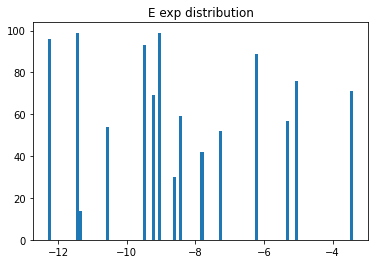

In [55]:
_ = plt.hist(labels_exp, bins = 100)
_ = plt.title('E exp distribution')

In [13]:
trainloader, testloader = create_loaders(graphs, labels,
                  train_size = 0.7,
                  batch_size = 16)

  0%|          | 0/100 [00:00<?, ?it/s]

INFO:__main__:0. time: 5.6 loss: 5.999 rmse: (2.41806765030503, 2.577621648428761) r2: (0.11889809949942909, -0.020450480206203547)


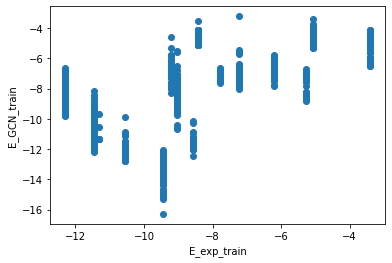

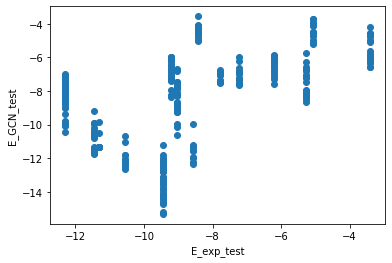

  1%|          | 1/100 [00:05<09:35,  5.81s/it]

INFO:__main__:1. time: 5.73 loss: 5.769 rmse: (2.3889384110881973, 2.5473472936988464) r2: (0.13999861453236107, 0.0033792829796495116)


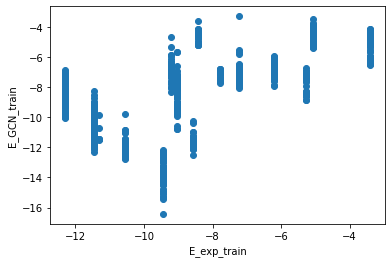

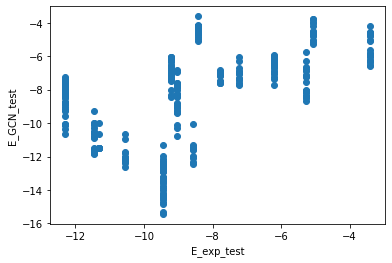

  2%|▏         | 2/100 [00:11<09:45,  5.97s/it]

INFO:__main__:2. time: 5.98 loss: 5.649 rmse: (2.360751029613694, 2.5124246462859396) r2: (0.16017341235704852, 0.03051814886015669)


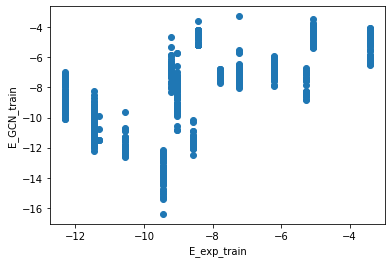

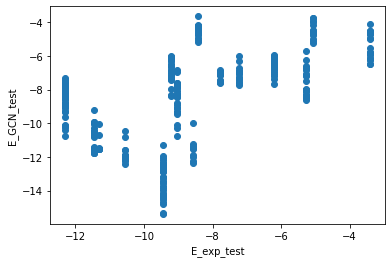

  3%|▎         | 3/100 [00:18<09:48,  6.06s/it]

INFO:__main__:3. time: 5.85 loss: 5.551 rmse: (2.3339588983307626, 2.4764094350382053) r2: (0.17912760412965545, 0.05811367127440159)


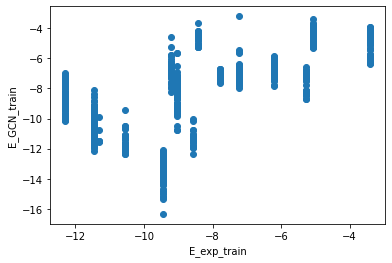

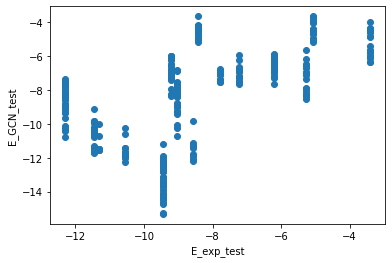

  4%|▍         | 4/100 [00:24<09:41,  6.06s/it]

INFO:__main__:4. time: 5.95 loss: 5.383 rmse: (2.300218264633993, 2.438969928053295) r2: (0.20268976472725586, 0.08637813541841288)


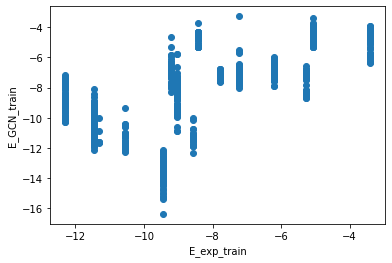

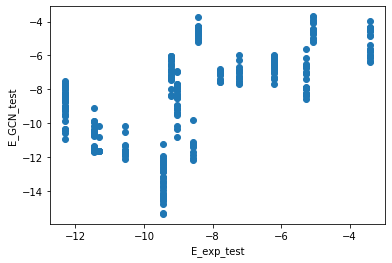

  5%|▌         | 5/100 [00:30<09:39,  6.10s/it]

INFO:__main__:5. time: 6.12 loss: 5.185 rmse: (2.2511453974016624, 2.376945553388924) r2: (0.2363465177295273, 0.13225511782886246)


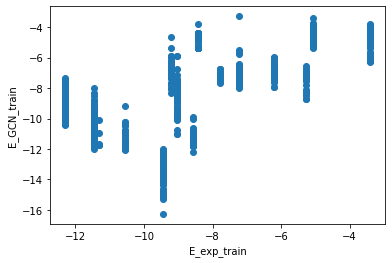

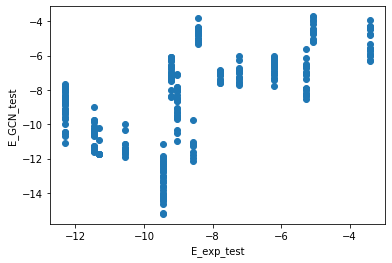

  6%|▌         | 6/100 [00:36<09:41,  6.19s/it]

INFO:__main__:6. time: 6.24 loss: 4.956 rmse: (2.1931146537923594, 2.312606439211891) r2: (0.27521045916853126, 0.17859554423738877)


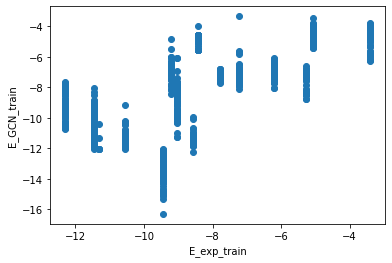

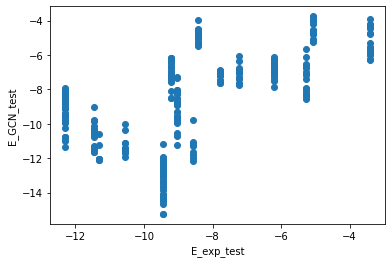

  7%|▋         | 7/100 [00:43<09:43,  6.28s/it]

INFO:__main__:7. time: 5.8 loss: 4.666 rmse: (2.114163319623606, 2.202066241840148) r2: (0.32645547335057534, 0.25524341553202545)


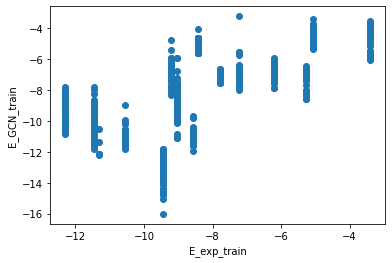

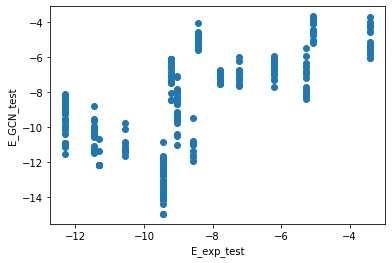

  8%|▊         | 8/100 [00:49<09:29,  6.19s/it]

INFO:__main__:8. time: 5.87 loss: 4.31 rmse: (2.014002304515924, 2.0858998808527094) r2: (0.38876365459610873, 0.3317476235649355)


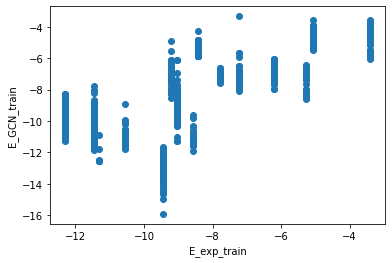

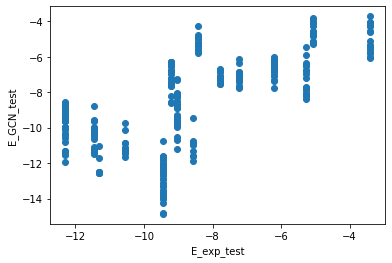

  9%|▉         | 9/100 [00:55<09:19,  6.15s/it]

INFO:__main__:9. time: 5.99 loss: 3.823 rmse: (1.880009933300905, 1.9117965721984396) r2: (0.4673897354946144, 0.43864583346321684)


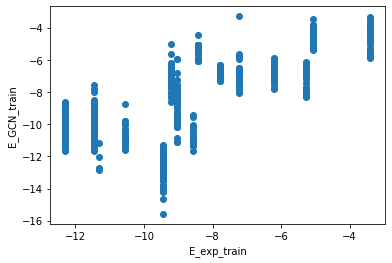

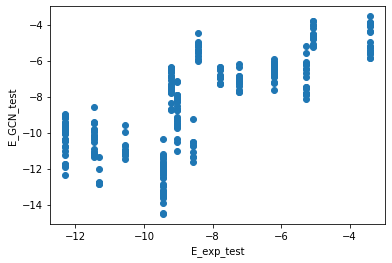

 10%|█         | 10/100 [01:01<09:15,  6.17s/it]

INFO:__main__:10. time: 5.69 loss: 3.304 rmse: (1.740652245052241, 1.7185561142290893) r2: (0.5434237957839085, 0.546391663177059)


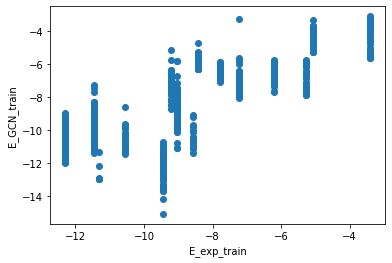

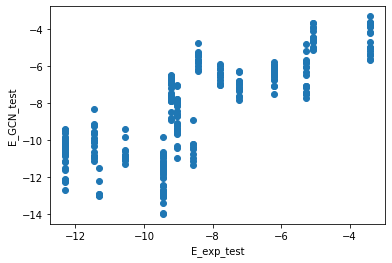

 11%|█         | 11/100 [01:07<09:01,  6.09s/it]

INFO:__main__:11. time: 6.16 loss: 2.786 rmse: (1.5827794985799528, 1.5859021951073307) r2: (0.622488594952874, 0.6137162901096991)


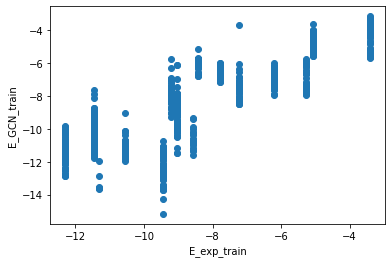

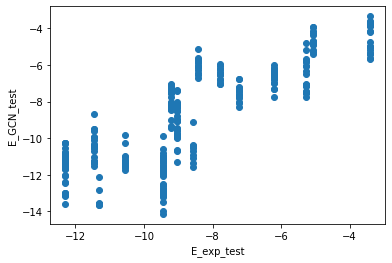

 12%|█▏        | 12/100 [01:13<09:02,  6.17s/it]

INFO:__main__:12. time: 6.26 loss: 2.359 rmse: (1.4868723433917688, 1.5102776279583363) r2: (0.6668524598469474, 0.6496781936093177)


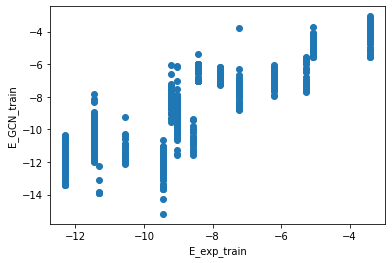

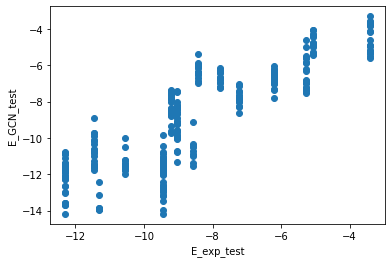

 13%|█▎        | 13/100 [01:20<09:04,  6.26s/it]

INFO:__main__:13. time: 6.18 loss: 2.025 rmse: (1.3516542819702149, 1.2913189061238195) r2: (0.7246909465734, 0.7438934933101982)


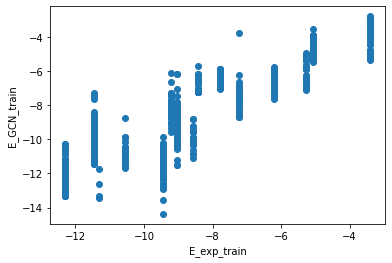

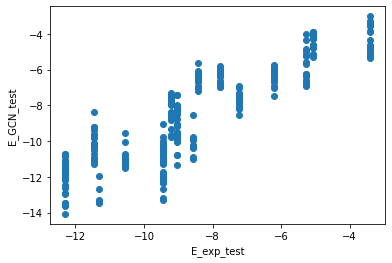

 14%|█▍        | 14/100 [01:26<09:02,  6.30s/it]

INFO:__main__:14. time: 5.92 loss: 1.717 rmse: (1.258302693418789, 1.1970857863626931) r2: (0.7614060118685115, 0.7799080583800537)


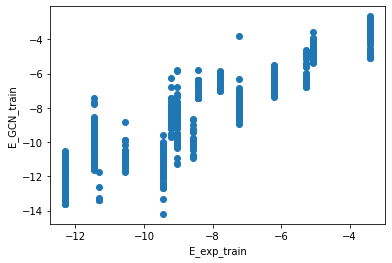

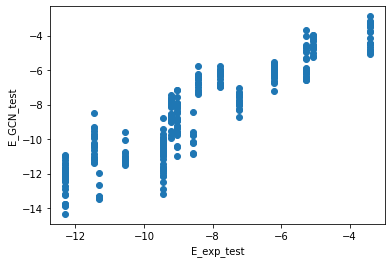

 15%|█▌        | 15/100 [01:32<08:50,  6.25s/it]

INFO:__main__:15. time: 5.94 loss: 1.498 rmse: (1.1757177953210356, 1.1169540087428793) r2: (0.7916970467422664, 0.8083873507251302)


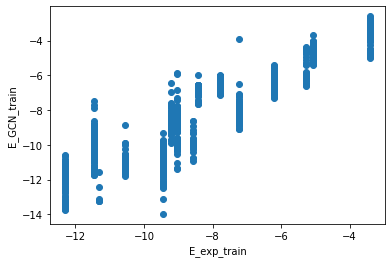

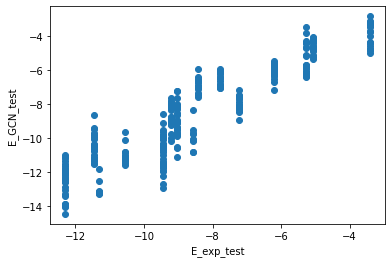

 16%|█▌        | 16/100 [01:38<08:42,  6.22s/it]

INFO:__main__:16. time: 6.11 loss: 1.336 rmse: (1.1129823116935975, 1.0431373999659537) r2: (0.8133337647194756, 0.8328768447435269)


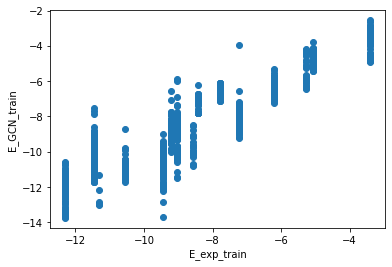

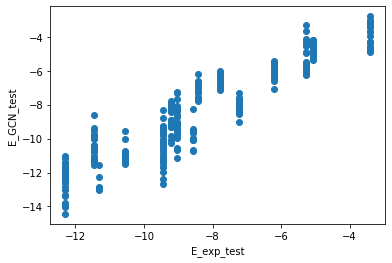

 17%|█▋        | 17/100 [01:45<08:39,  6.26s/it]

INFO:__main__:17. time: 5.62 loss: 1.214 rmse: (1.0753313175490047, 1.0619061258357156) r2: (0.8257495804166624, 0.8268087903572616)


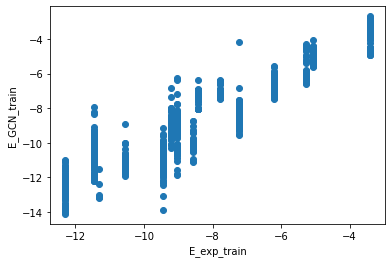

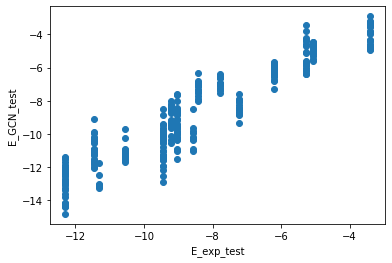

 18%|█▊        | 18/100 [01:50<08:22,  6.12s/it]

INFO:__main__:18. time: 5.75 loss: 1.108 rmse: (1.0217388009267196, 0.9519405890923138) r2: (0.8426854050246658, 0.8608211374642452)


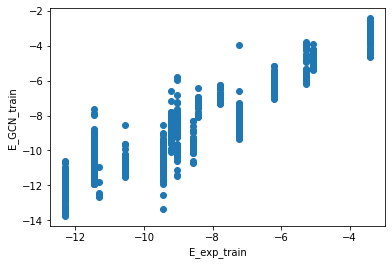

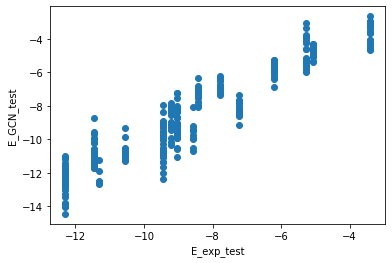

 19%|█▉        | 19/100 [01:56<08:11,  6.07s/it]

INFO:__main__:19. time: 5.84 loss: 1.007 rmse: (0.9748396331206607, 0.9344420901537535) r2: (0.8567958515230404, 0.865890859972758)


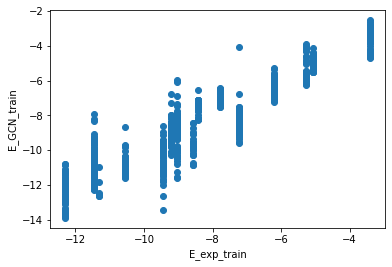

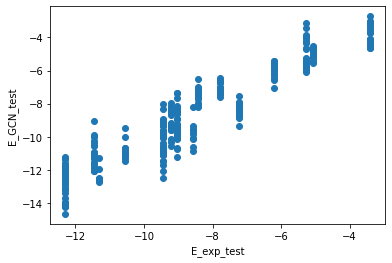

 20%|██        | 20/100 [02:02<08:05,  6.07s/it]

INFO:__main__:20. time: 5.82 loss: 0.946 rmse: (1.0011105723056317, 0.9300744755562567) r2: (0.8489734367665436, 0.8671415916472576)


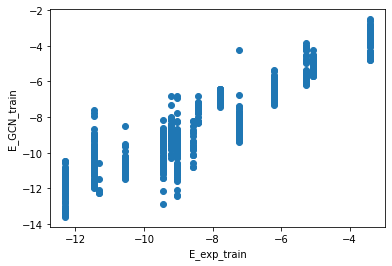

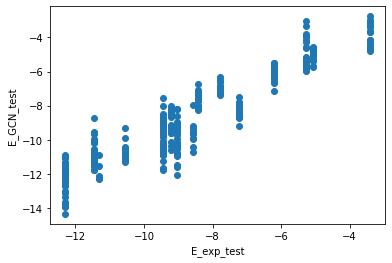

 21%|██        | 21/100 [02:09<08:01,  6.09s/it]

INFO:__main__:21. time: 5.66 loss: 0.942 rmse: (0.9427930904482347, 0.881035538301055) r2: (0.8660563818627385, 0.8807823801374169)


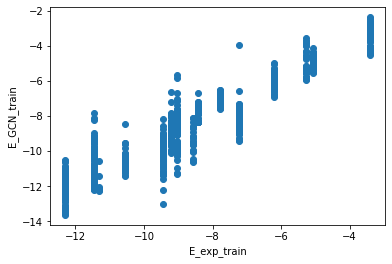

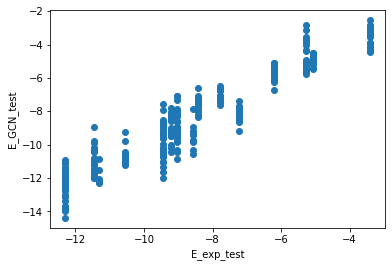

 22%|██▏       | 22/100 [02:14<07:49,  6.02s/it]

INFO:__main__:22. time: 6.07 loss: 0.879 rmse: (0.91031602164501, 0.8930851949277803) r2: (0.8751255418032496, 0.8774990735669586)


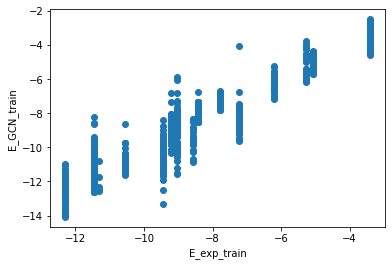

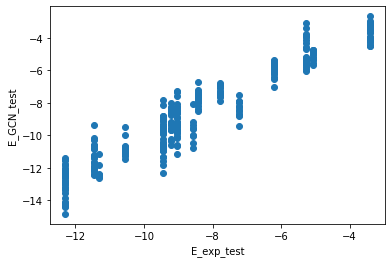

 23%|██▎       | 23/100 [02:21<07:50,  6.11s/it]

INFO:__main__:23. time: 6.33 loss: 0.817 rmse: (0.9334901351423815, 0.9309715737080795) r2: (0.8686867017856452, 0.8668851723683391)


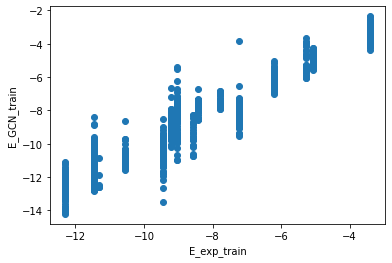

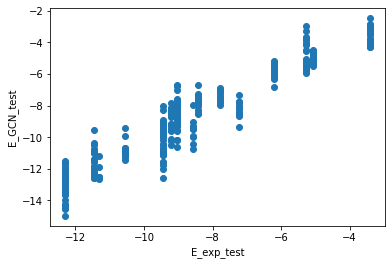

 24%|██▍       | 24/100 [02:27<07:54,  6.24s/it]

INFO:__main__:24. time: 5.95 loss: 0.809 rmse: (0.8825260502571908, 0.85060438307407) r2: (0.8826334573498587, 0.888875754365835)


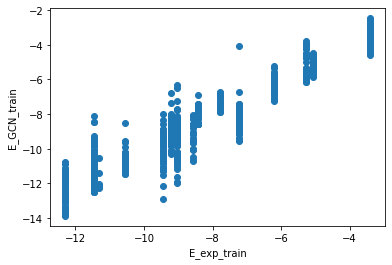

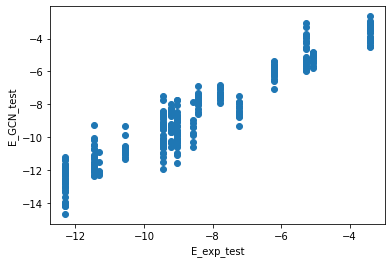

 25%|██▌       | 25/100 [02:33<07:46,  6.22s/it]

INFO:__main__:25. time: 5.89 loss: 0.768 rmse: (0.8968710768671485, 0.8713211860622151) r2: (0.8787869772728174, 0.8833968880438026)


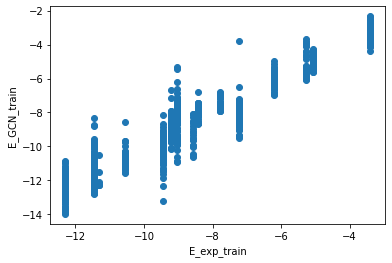

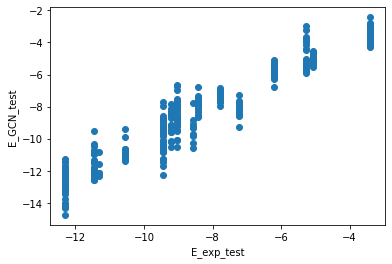

 26%|██▌       | 26/100 [02:40<07:38,  6.19s/it]

INFO:__main__:26. time: 5.59 loss: 0.783 rmse: (0.8574653467450749, 0.835103839583344) r2: (0.8892044291530483, 0.892888881557962)


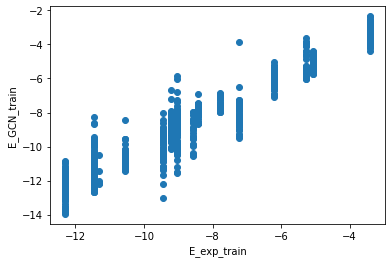

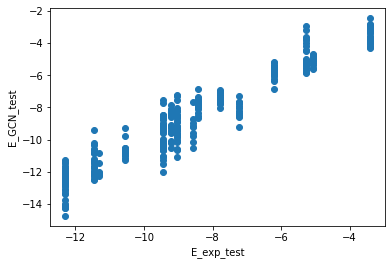

 27%|██▋       | 27/100 [02:45<07:23,  6.07s/it]

INFO:__main__:27. time: 5.6 loss: 0.769 rmse: (0.8598983428585592, 0.831780119791243) r2: (0.8885747882464178, 0.8937397910412527)


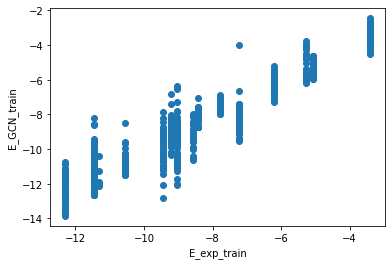

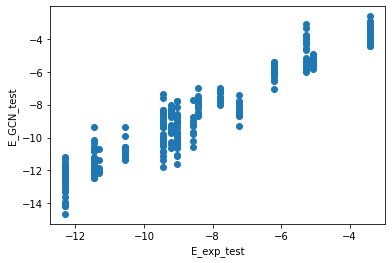

 28%|██▊       | 28/100 [02:51<07:11,  5.99s/it]

INFO:__main__:28. time: 5.6 loss: 0.733 rmse: (0.8428061852469008, 0.8178709739051995) r2: (0.8929603519514024, 0.897263874255102)


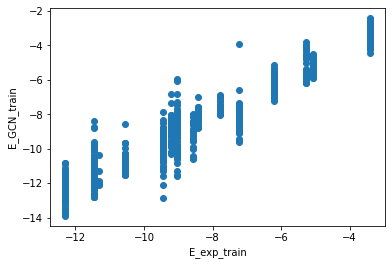

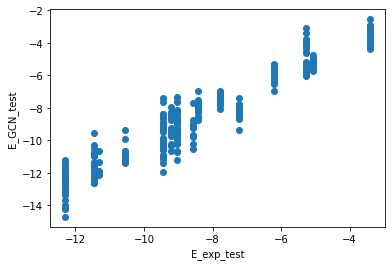

 29%|██▉       | 29/100 [02:57<07:01,  5.93s/it]

INFO:__main__:29. time: 5.6 loss: 0.728 rmse: (0.8635172826421189, 0.826350386006753) r2: (0.8876349337421703, 0.8951225638780422)


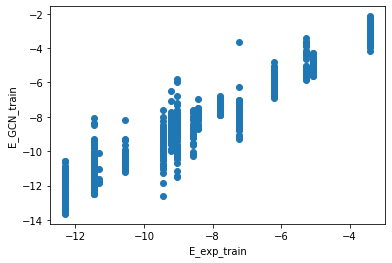

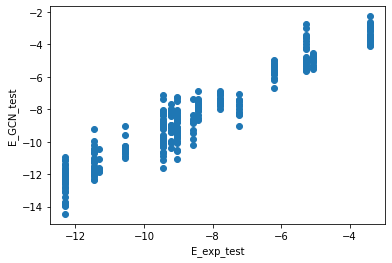

 30%|███       | 30/100 [03:03<06:52,  5.89s/it]

INFO:__main__:30. time: 5.72 loss: 0.737 rmse: (0.8475706632652211, 0.845938228587886) r2: (0.8917467169092532, 0.890091597309682)


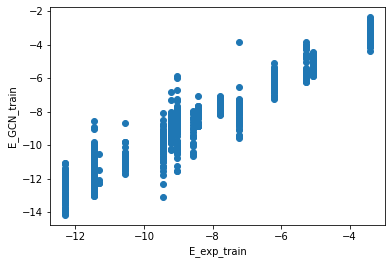

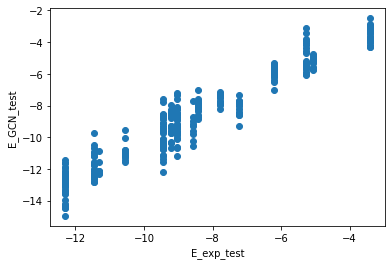

 31%|███       | 31/100 [03:09<06:47,  5.90s/it]

INFO:__main__:31. time: 5.62 loss: 0.717 rmse: (0.8276047890500825, 0.8041157038756054) r2: (0.8967868020757035, 0.9006905262190208)


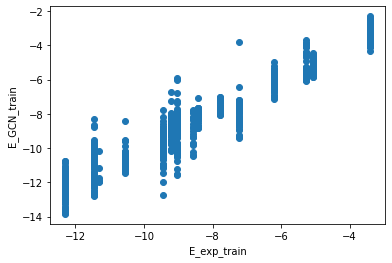

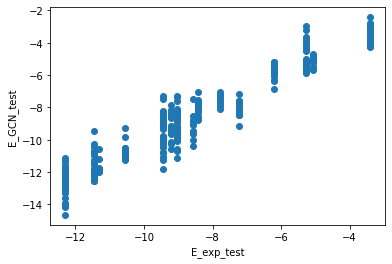

 32%|███▏      | 32/100 [03:15<06:39,  5.88s/it]

INFO:__main__:32. time: 5.64 loss: 0.716 rmse: (0.8461598728795274, 0.8099140735865574) r2: (0.8921067944658416, 0.8992531480677308)


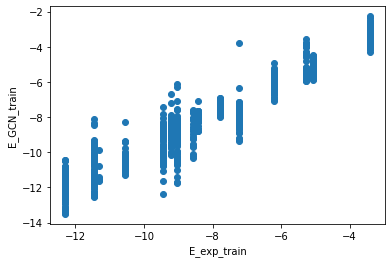

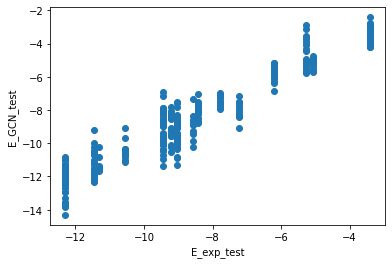

 33%|███▎      | 33/100 [03:20<06:33,  5.87s/it]

INFO:__main__:33. time: 5.61 loss: 0.728 rmse: (0.822877245778007, 0.8158212052690844) r2: (0.8979626077677887, 0.8977781886347708)


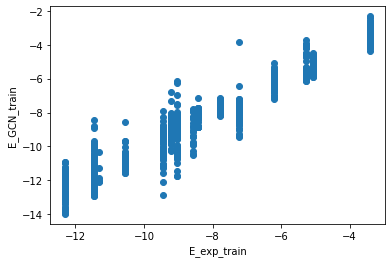

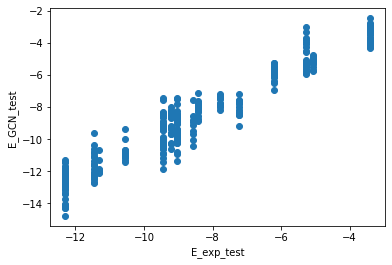

 34%|███▍      | 34/100 [03:26<06:26,  5.85s/it]

INFO:__main__:34. time: 5.75 loss: 0.701 rmse: (0.8205743374348818, 0.7945011640055702) r2: (0.8985329332959876, 0.90305114843039)


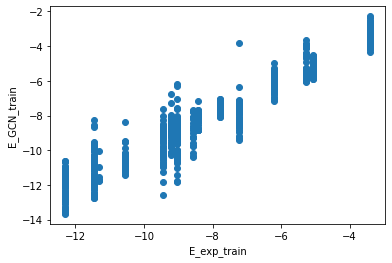

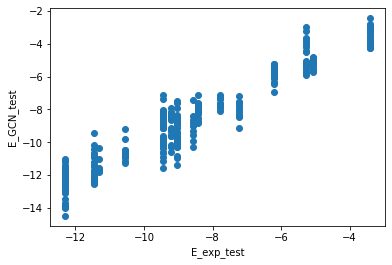

 35%|███▌      | 35/100 [03:32<06:22,  5.88s/it]

INFO:__main__:35. time: 5.64 loss: 0.703 rmse: (0.817495212956512, 0.8087904933168157) r2: (0.8992929949593835, 0.8995324830255577)


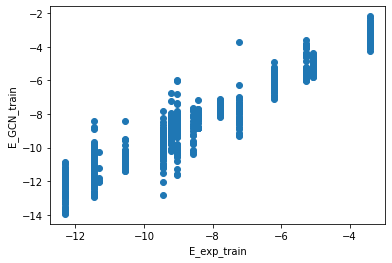

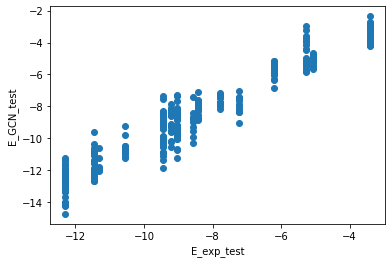

 36%|███▌      | 36/100 [03:38<06:15,  5.87s/it]

INFO:__main__:36. time: 5.6 loss: 0.694 rmse: (0.8135129169362632, 0.8032376271562796) r2: (0.9002717610384608, 0.9009072953370505)


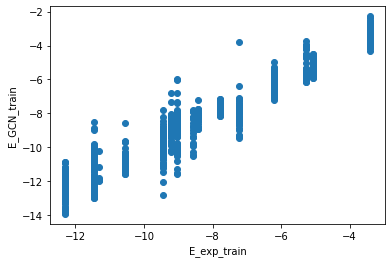

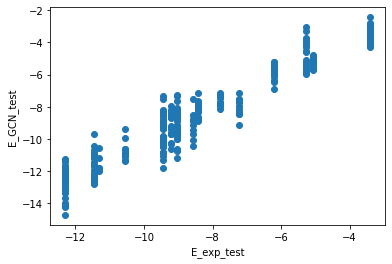

 37%|███▋      | 37/100 [03:44<06:08,  5.85s/it]

INFO:__main__:37. time: 5.6 loss: 0.673 rmse: (0.8270732549320102, 0.8126074603566718) r2: (0.8969193380864838, 0.8985819622283133)


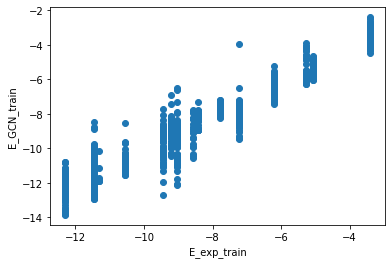

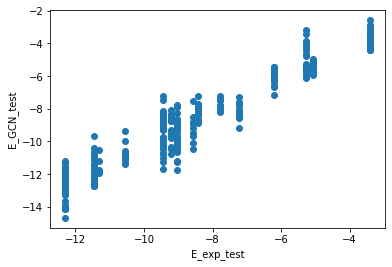

 38%|███▊      | 38/100 [03:50<06:02,  5.84s/it]

INFO:__main__:38. time: 5.61 loss: 0.691 rmse: (0.8168418199444074, 0.7969709792621803) r2: (0.8994539132280026, 0.9024474540911583)


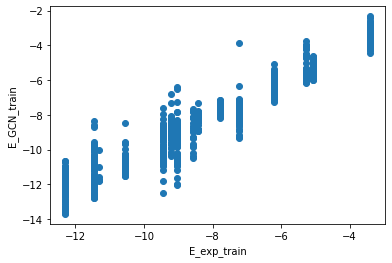

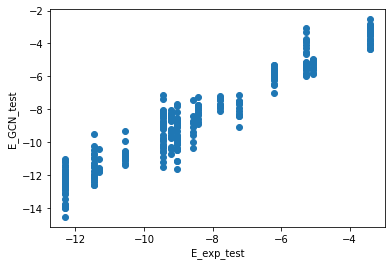

 39%|███▉      | 39/100 [03:55<05:55,  5.84s/it]

INFO:__main__:39. time: 5.65 loss: 0.685 rmse: (0.8232154693042056, 0.7994770118564606) r2: (0.8978787105903562, 0.9018329920159527)


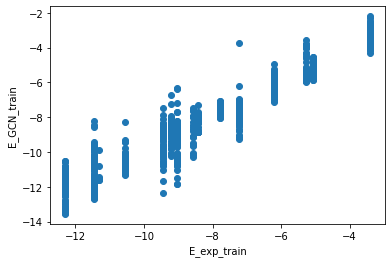

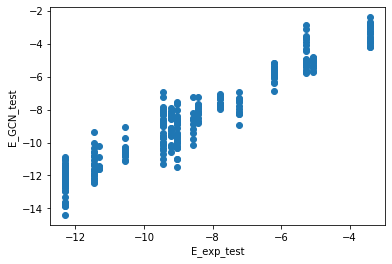

 40%|████      | 40/100 [04:01<05:52,  5.88s/it]

INFO:__main__:40. time: 5.62 loss: 0.662 rmse: (0.8024621520824008, 0.789891160604055) r2: (0.9029627767793018, 0.9041729539407641)


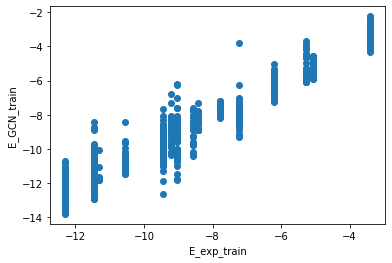

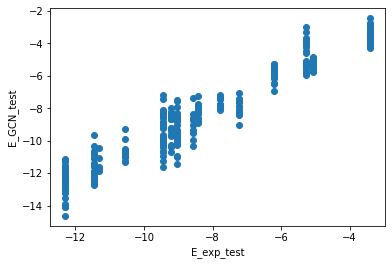

 41%|████      | 41/100 [04:07<05:45,  5.86s/it]

INFO:__main__:41. time: 5.62 loss: 0.653 rmse: (0.8184801063806106, 0.7962971518200875) r2: (0.8990501912991467, 0.9026123428908568)


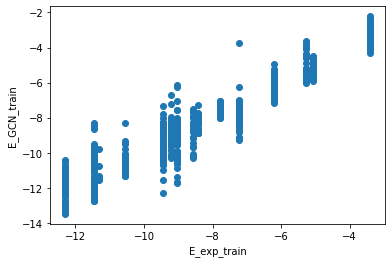

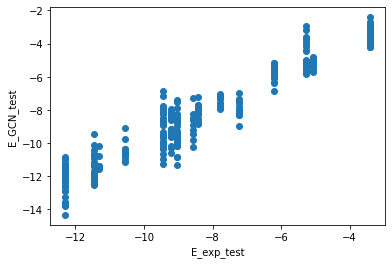

 42%|████▏     | 42/100 [04:13<05:39,  5.85s/it]

INFO:__main__:42. time: 5.62 loss: 0.666 rmse: (0.7984919116383911, 0.7919324532206123) r2: (0.9039205990351962, 0.903677027901072)


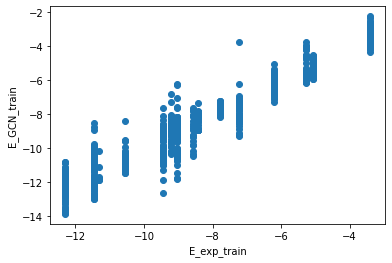

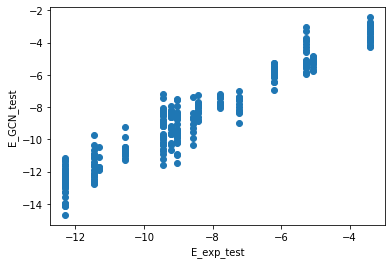

 43%|████▎     | 43/100 [04:19<05:33,  5.84s/it]

INFO:__main__:43. time: 5.64 loss: 0.66 rmse: (0.8045346243615074, 0.8067225781602788) r2: (0.9024609047638904, 0.9000455768481036)


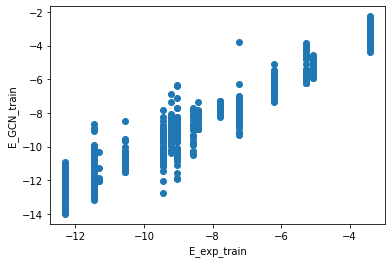

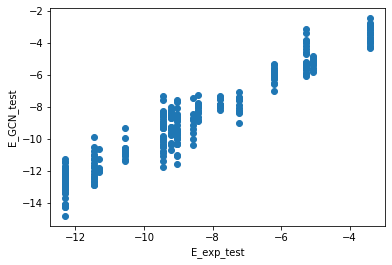

 44%|████▍     | 44/100 [04:25<05:27,  5.84s/it]

INFO:__main__:44. time: 5.67 loss: 0.649 rmse: (0.8088135904529931, 0.8201599070299161) r2: (0.9014206105046189, 0.8966880250356943)


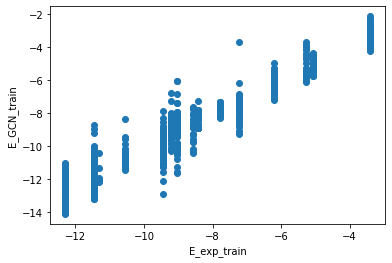

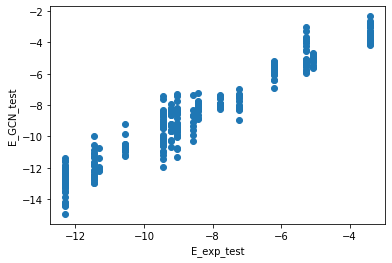

 45%|████▌     | 45/100 [04:31<05:21,  5.85s/it]

INFO:__main__:45. time: 5.62 loss: 0.657 rmse: (0.8000779677050688, 0.7885210290996156) r2: (0.9035385321435256, 0.9045051054819974)


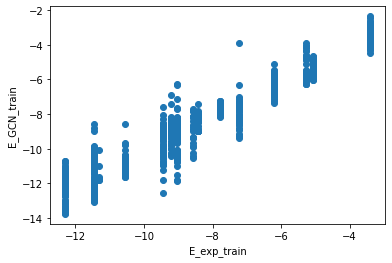

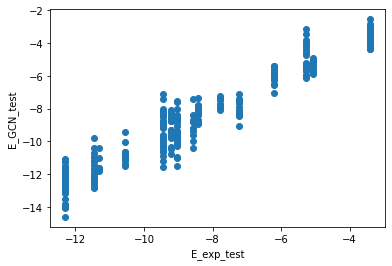

 46%|████▌     | 46/100 [04:36<05:15,  5.85s/it]

INFO:__main__:46. time: 5.64 loss: 0.662 rmse: (0.7973209958770634, 0.7859391588113805) r2: (0.904202175835493, 0.9051294433779913)


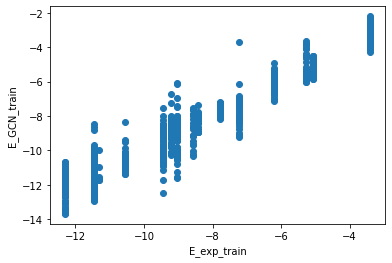

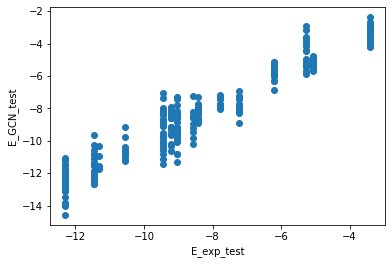

 47%|████▋     | 47/100 [04:42<05:09,  5.85s/it]

INFO:__main__:47. time: 5.61 loss: 0.679 rmse: (0.7990318336533649, 0.7884114156714481) r2: (0.9037906217079732, 0.9045316533984682)


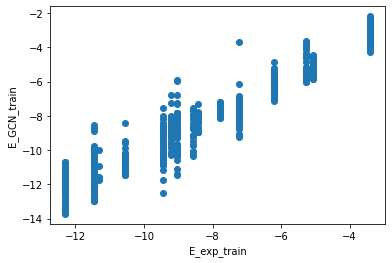

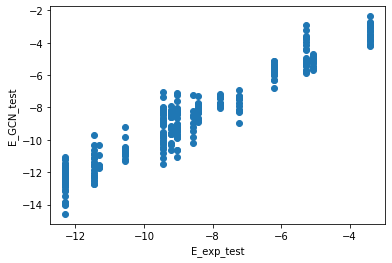

 48%|████▊     | 48/100 [04:48<05:03,  5.84s/it]

INFO:__main__:48. time: 5.58 loss: 0.657 rmse: (0.8161765815235222, 0.8365262576057027) r2: (0.899617616608076, 0.8925236897545321)


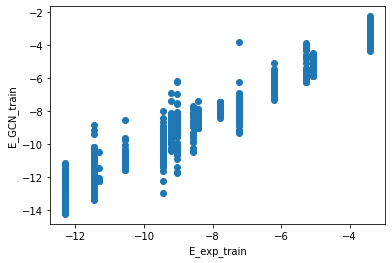

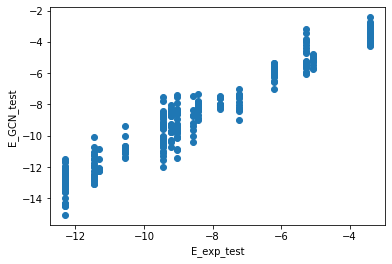

 49%|████▉     | 49/100 [04:54<04:56,  5.82s/it]

INFO:__main__:49. time: 5.77 loss: 0.631 rmse: (0.8209050211807888, 0.8267794936470709) r2: (0.8984511362690825, 0.8950136139830015)


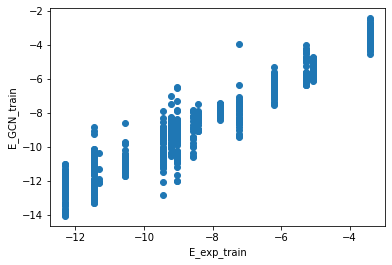

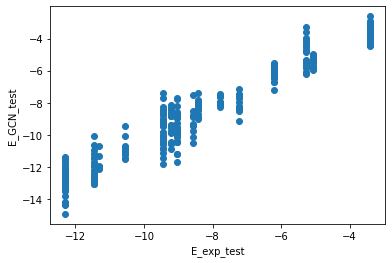

 50%|█████     | 50/100 [05:00<04:53,  5.87s/it]

INFO:__main__:50. time: 5.63 loss: 0.65 rmse: (0.7919456401590842, 0.7932318715447152) r2: (0.9054895157044669, 0.9033606713226608)


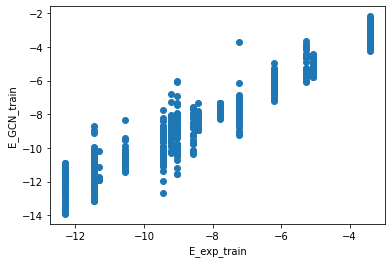

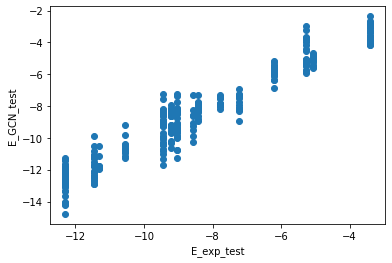

 51%|█████     | 51/100 [05:06<04:46,  5.86s/it]

INFO:__main__:51. time: 5.62 loss: 0.638 rmse: (0.7865536261640909, 0.7796667932951902) r2: (0.9067720962235482, 0.9066376728240909)


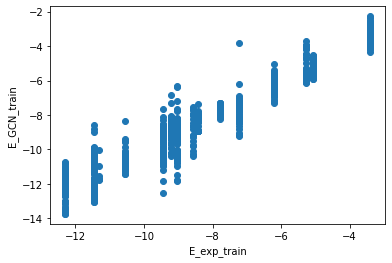

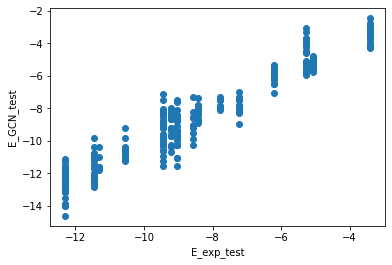

 52%|█████▏    | 52/100 [05:12<04:40,  5.85s/it]

INFO:__main__:52. time: 5.62 loss: 0.641 rmse: (0.7892255670572319, 0.7827395501648653) r2: (0.9061376256967306, 0.9059003192578046)


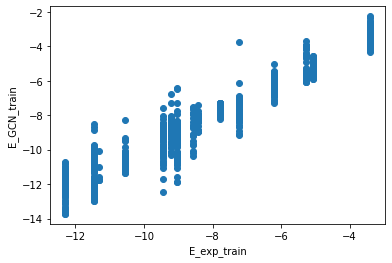

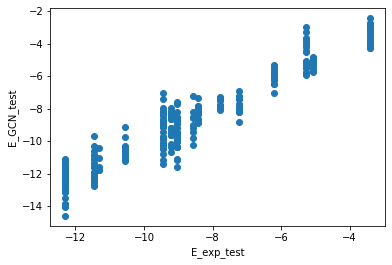

 53%|█████▎    | 53/100 [05:17<04:34,  5.84s/it]

INFO:__main__:53. time: 5.62 loss: 0.628 rmse: (0.7886606591937608, 0.7744338091889069) r2: (0.9062719462739177, 0.9078867294794437)


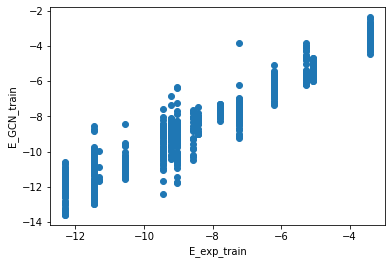

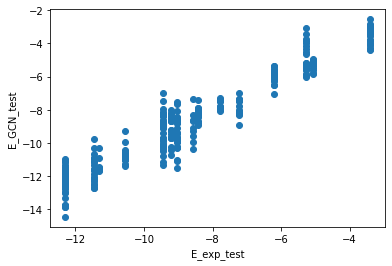

 54%|█████▍    | 54/100 [05:23<04:28,  5.84s/it]

INFO:__main__:54. time: 5.69 loss: 0.635 rmse: (0.8230402566703696, 0.8049283285915753) r2: (0.8979221768190523, 0.9004897040980613)


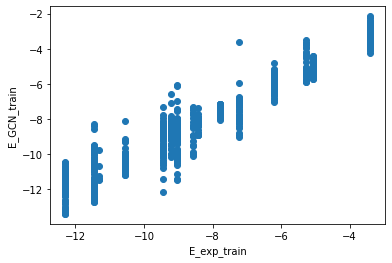

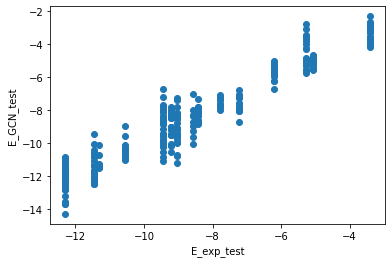

 55%|█████▌    | 55/100 [05:29<04:23,  5.85s/it]

INFO:__main__:55. time: 5.62 loss: 0.635 rmse: (0.7857700290598075, 0.7910696803326812) r2: (0.9069577586469308, 0.9038867922037632)


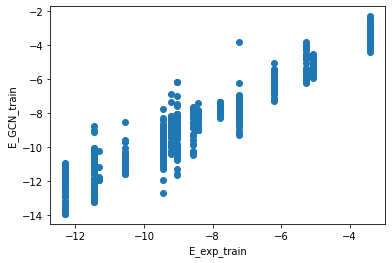

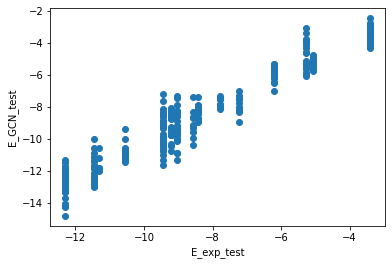

 56%|█████▌    | 56/100 [05:35<04:17,  5.84s/it]

INFO:__main__:56. time: 5.63 loss: 0.625 rmse: (0.7817436007775282, 0.78720329089716) r2: (0.9079088462870666, 0.9048240116859562)


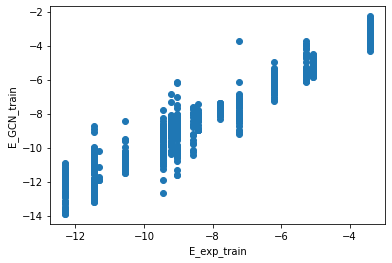

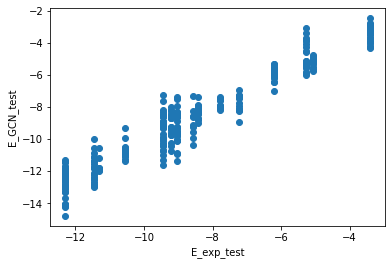

 57%|█████▋    | 57/100 [05:41<04:11,  5.84s/it]

INFO:__main__:57. time: 5.63 loss: 0.638 rmse: (0.7934775233548502, 0.783740266268139) r2: (0.9051235333933635, 0.9056595565133606)


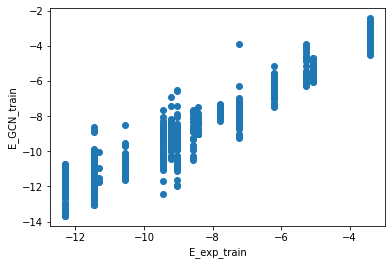

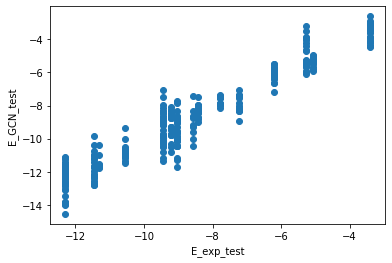

 58%|█████▊    | 58/100 [05:47<04:05,  5.84s/it]

INFO:__main__:58. time: 5.61 loss: 0.66 rmse: (0.786876091751827, 0.7894129135042656) r2: (0.9066956387456404, 0.9042889576013713)


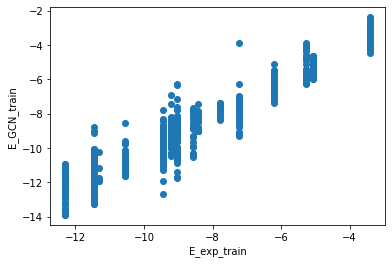

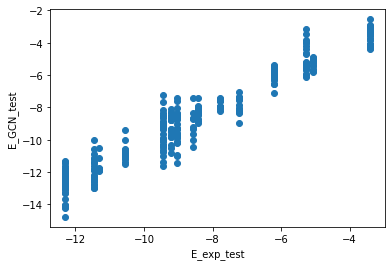

 59%|█████▉    | 59/100 [05:53<04:00,  5.87s/it]

INFO:__main__:59. time: 5.62 loss: 0.667 rmse: (0.8054772604314009, 0.8123157573364477) r2: (0.9022322067568644, 0.8986547615550912)


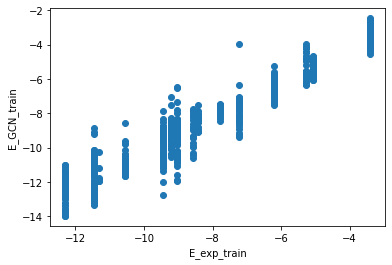

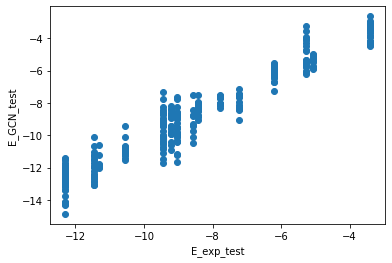

 60%|██████    | 60/100 [05:58<03:54,  5.85s/it]

INFO:__main__:60. time: 5.62 loss: 0.627 rmse: (0.7922658843694265, 0.7833993041764209) r2: (0.9054130646113744, 0.9057416232882659)


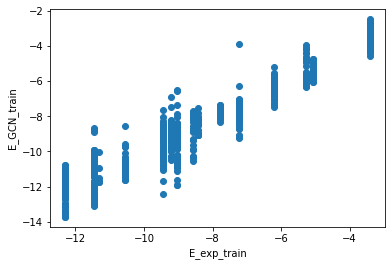

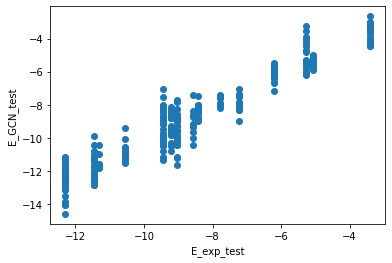

 61%|██████    | 61/100 [06:04<03:47,  5.84s/it]

INFO:__main__:61. time: 5.63 loss: 0.622 rmse: (0.7834357319871662, 0.7737338949822028) r2: (0.9075097410888001, 0.9080531536517172)


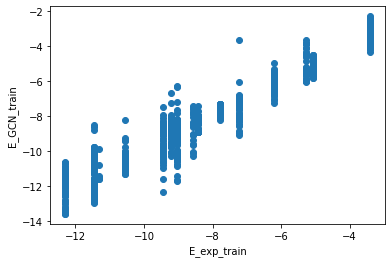

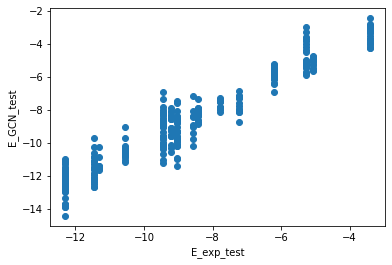

 62%|██████▏   | 62/100 [06:10<03:41,  5.84s/it]

INFO:__main__:62. time: 5.62 loss: 0.671 rmse: (0.7741449614238208, 0.7701137515461526) r2: (0.9096904190512912, 0.9089115419956156)


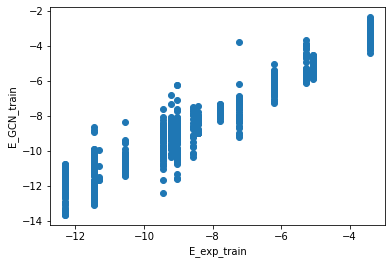

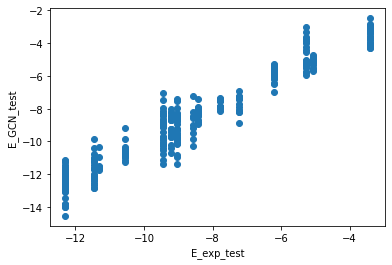

 63%|██████▎   | 63/100 [06:16<03:35,  5.83s/it]

INFO:__main__:63. time: 5.61 loss: 0.634 rmse: (0.7728453775391169, 0.7725812423878908) r2: (0.9099933761708057, 0.9083269010704339)


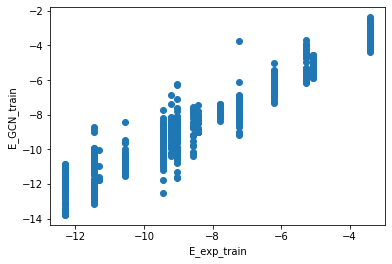

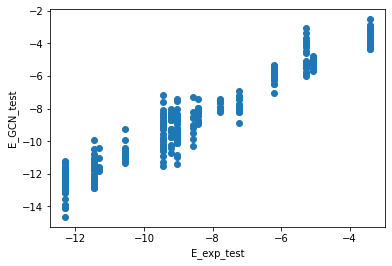

 64%|██████▍   | 64/100 [06:22<03:29,  5.83s/it]

INFO:__main__:64. time: 5.65 loss: 0.614 rmse: (0.7722042654976393, 0.7724209083736265) r2: (0.9101426437934922, 0.908364947012976)


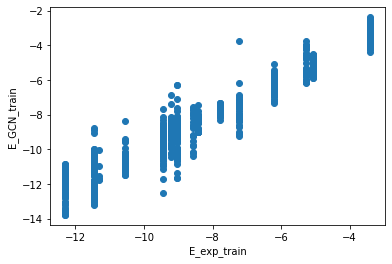

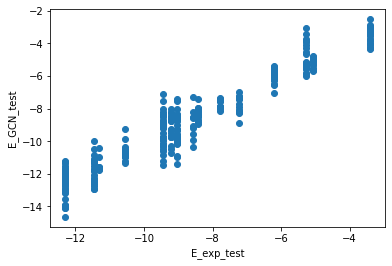

 65%|██████▌   | 65/100 [06:27<03:24,  5.84s/it]

INFO:__main__:65. time: 5.64 loss: 0.606 rmse: (0.7806636190767611, 0.7814604195811664) r2: (0.9081631190710602, 0.906207617976443)


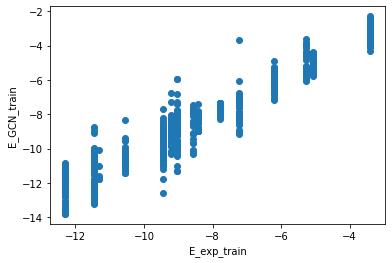

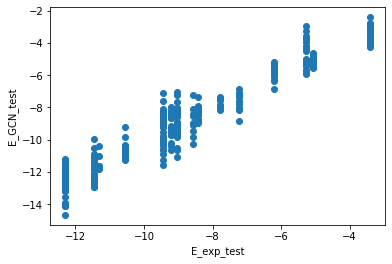

 66%|██████▌   | 66/100 [06:33<03:18,  5.84s/it]

INFO:__main__:66. time: 5.62 loss: 0.622 rmse: (0.8100658776238466, 0.8066334888709681) r2: (0.9011151129835435, 0.9000676522853474)


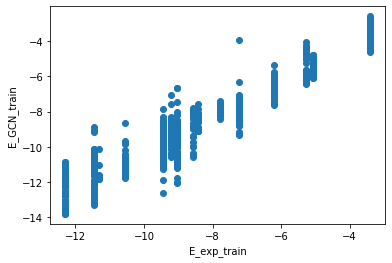

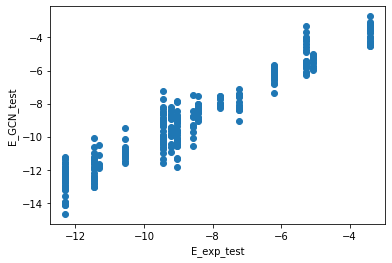

 67%|██████▋   | 67/100 [06:39<03:12,  5.83s/it]

INFO:__main__:67. time: 5.61 loss: 0.624 rmse: (0.7723157948207122, 0.7709081691623162) r2: (0.9101166857555041, 0.9087235188665815)


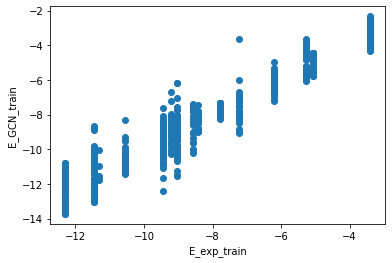

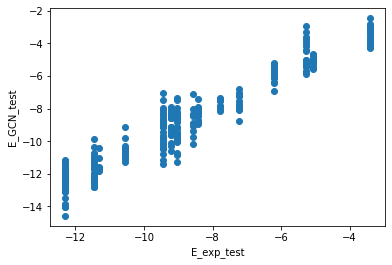

 68%|██████▊   | 68/100 [06:45<03:06,  5.83s/it]

INFO:__main__:68. time: 5.78 loss: 0.613 rmse: (0.7812837861841998, 0.7723391979751252) r2: (0.9080171488121367, 0.908384333180754)


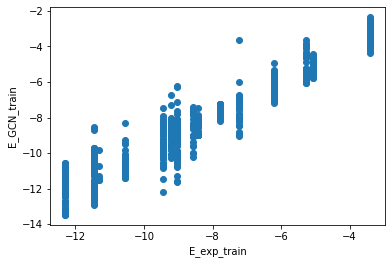

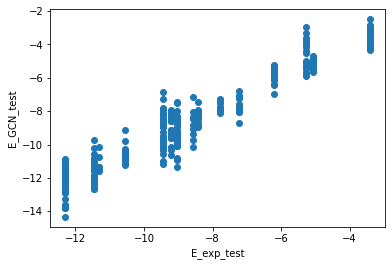

 69%|██████▉   | 69/100 [06:51<03:02,  5.88s/it]

INFO:__main__:69. time: 5.62 loss: 0.601 rmse: (0.7722233454622308, 0.7763172718961817) r2: (0.9101382032680191, 0.9074381362532261)


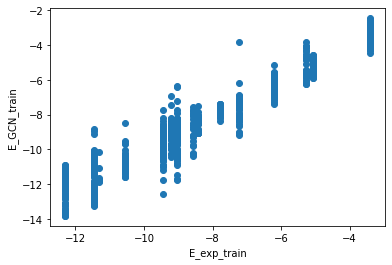

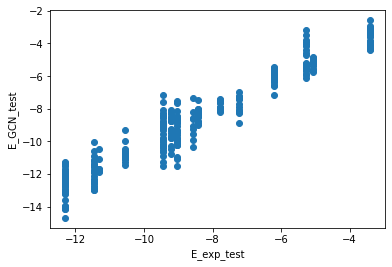

 70%|███████   | 70/100 [06:57<02:55,  5.86s/it]

INFO:__main__:70. time: 5.63 loss: 0.638 rmse: (0.8237663734497354, 0.8099775222665465) r2: (0.8977419836498604, 0.8992373624298187)


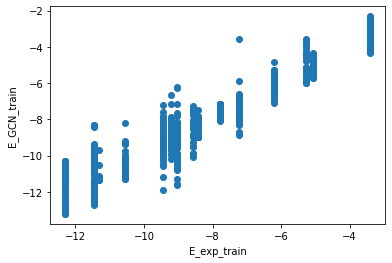

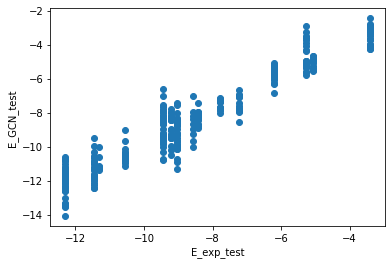

 71%|███████   | 71/100 [07:03<02:49,  5.85s/it]

INFO:__main__:71. time: 5.62 loss: 0.642 rmse: (0.7771166249549301, 0.7818282692635808) r2: (0.9089957564522314, 0.9061192971418566)


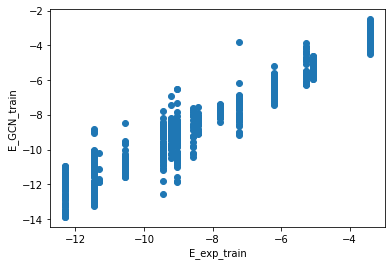

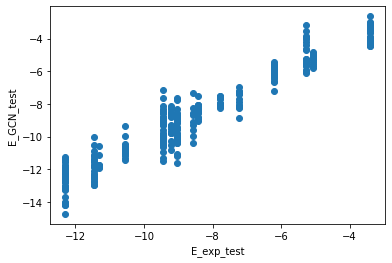

 72%|███████▏  | 72/100 [07:08<02:43,  5.85s/it]

INFO:__main__:72. time: 5.64 loss: 0.602 rmse: (0.7672923422544389, 0.7647977536623585) r2: (0.9112821574962935, 0.910164745885073)


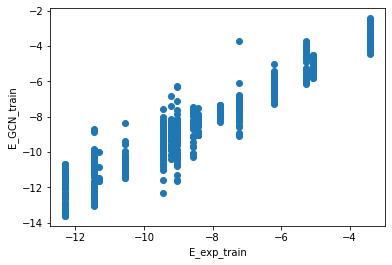

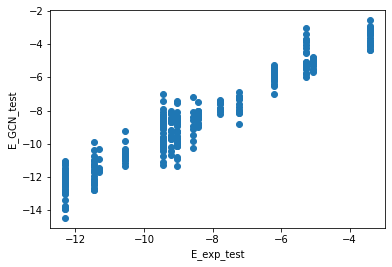

 73%|███████▎  | 73/100 [07:14<02:37,  5.85s/it]

INFO:__main__:73. time: 5.62 loss: 0.606 rmse: (0.7659012585548232, 0.770935968758183) r2: (0.911603552783158, 0.9087169357347886)


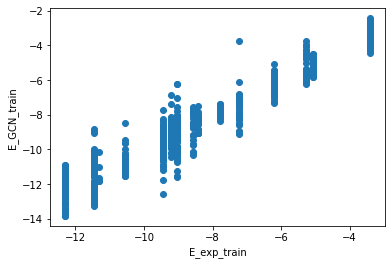

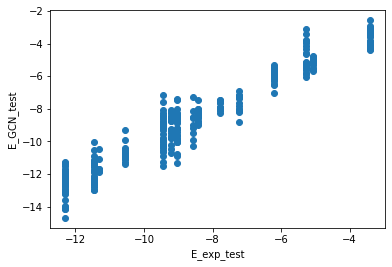

 74%|███████▍  | 74/100 [07:20<02:31,  5.84s/it]

INFO:__main__:74. time: 5.62 loss: 0.608 rmse: (0.7642746019797334, 0.7709696241416872) r2: (0.9119786349907942, 0.9087089655953273)


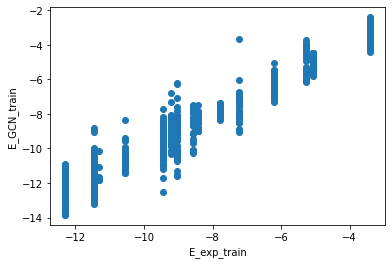

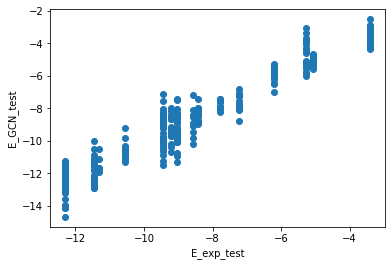

 75%|███████▌  | 75/100 [07:26<02:25,  5.84s/it]

INFO:__main__:75. time: 5.76 loss: 0.607 rmse: (0.7701731866577075, 0.7656156353545094) r2: (0.9106147141103407, 0.9099725018662927)


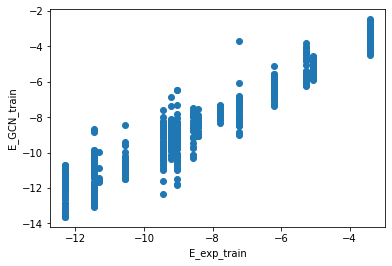

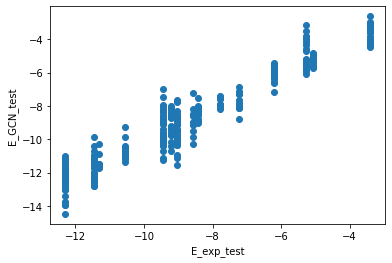

 76%|███████▌  | 76/100 [07:32<02:20,  5.87s/it]

INFO:__main__:76. time: 5.65 loss: 0.595 rmse: (0.7655170855680428, 0.7749694161873569) r2: (0.9116922091465933, 0.9077592723033894)


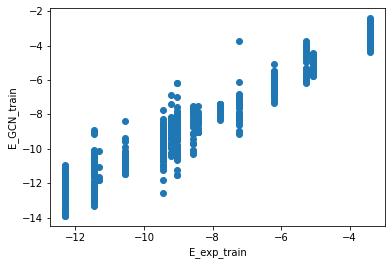

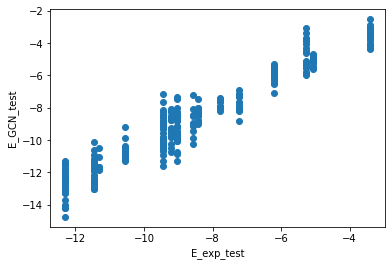

 77%|███████▋  | 77/100 [07:38<02:14,  5.87s/it]

INFO:__main__:77. time: 5.63 loss: 0.622 rmse: (0.7641024482983519, 0.767855085521952) r2: (0.9120182843402551, 0.9094450649975728)


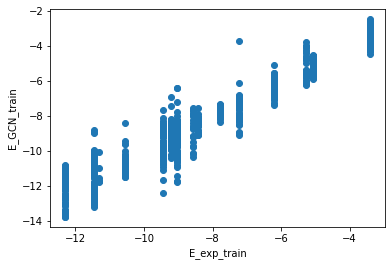

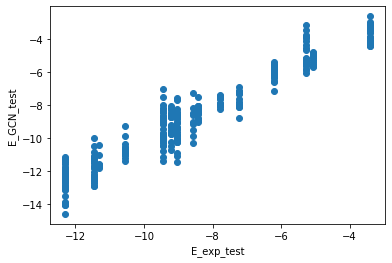

 78%|███████▊  | 78/100 [07:44<02:09,  5.89s/it]

INFO:__main__:78. time: 5.64 loss: 0.598 rmse: (0.7620055215527457, 0.7643732796143965) r2: (0.9125005182695826, 0.9102644379975723)


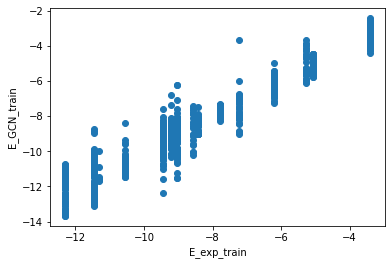

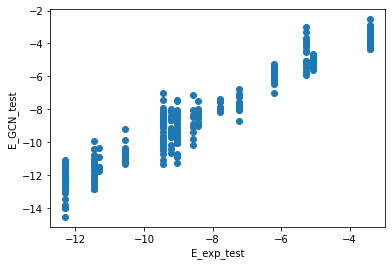

 79%|███████▉  | 79/100 [07:50<02:03,  5.88s/it]

INFO:__main__:79. time: 5.66 loss: 0.606 rmse: (0.7955403204574443, 0.813762070416905) r2: (0.9046295930140197, 0.8982935536591721)


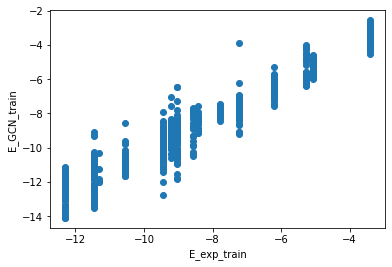

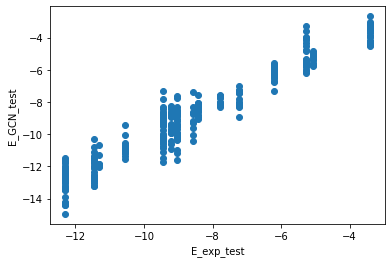

 80%|████████  | 80/100 [07:55<01:57,  5.87s/it]

INFO:__main__:80. time: 5.65 loss: 0.598 rmse: (0.7706155128523026, 0.7676429567328802) r2: (0.9105120130357536, 0.9094950917686982)


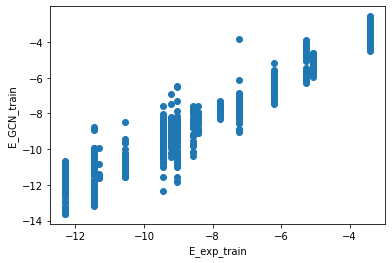

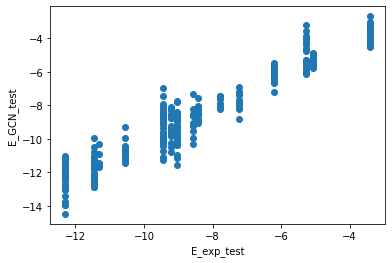

 81%|████████  | 81/100 [08:01<01:51,  5.87s/it]

INFO:__main__:81. time: 5.64 loss: 0.598 rmse: (0.7669782192698308, 0.7642566742341128) r2: (0.9113547832933077, 0.9102918142847733)


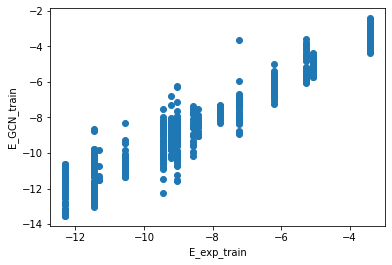

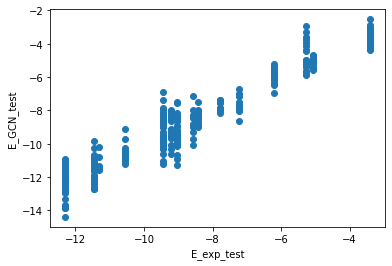

 82%|████████▏ | 82/100 [08:07<01:45,  5.86s/it]

INFO:__main__:82. time: 5.56 loss: 0.595 rmse: (0.7726204570621741, 0.777166203357109) r2: (0.9100457576367579, 0.9072355859676693)


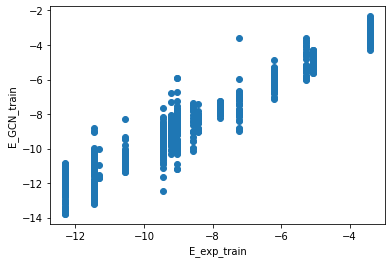

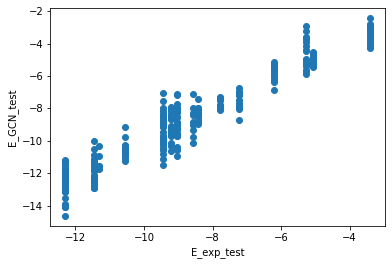

 83%|████████▎ | 83/100 [08:13<01:39,  5.83s/it]

INFO:__main__:83. time: 5.54 loss: 0.598 rmse: (0.7581331761503336, 0.7616748083150142) r2: (0.9133875650974317, 0.9108969075391926)


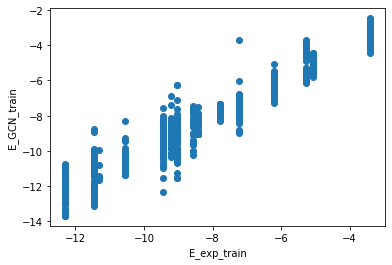

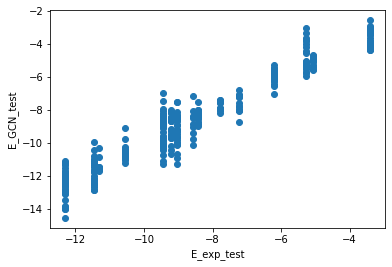

 84%|████████▍ | 84/100 [08:19<01:32,  5.80s/it]

INFO:__main__:84. time: 5.63 loss: 0.594 rmse: (0.7569897927391642, 0.7612919561302038) r2: (0.9136486182925586, 0.9109864595101992)


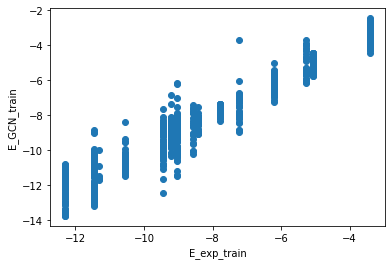

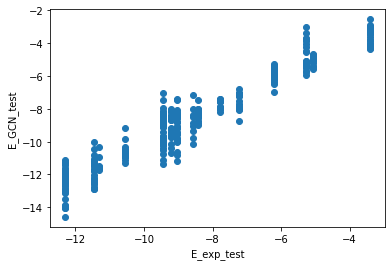

 85%|████████▌ | 85/100 [08:24<01:27,  5.81s/it]

INFO:__main__:85. time: 5.68 loss: 0.605 rmse: (0.7845307085482306, 0.7975562350294644) r2: (0.9072510205958311, 0.9023041260283073)


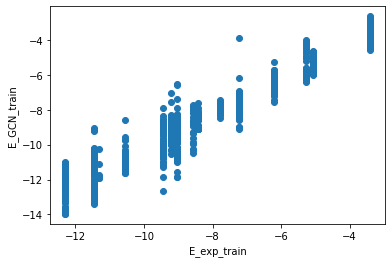

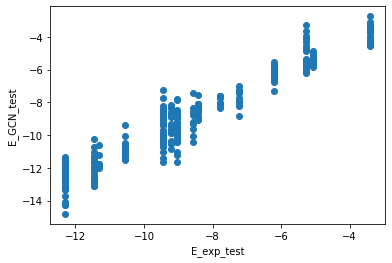

 86%|████████▌ | 86/100 [08:30<01:21,  5.83s/it]

INFO:__main__:86. time: 5.62 loss: 0.588 rmse: (0.7595566729200465, 0.7609672229405059) r2: (0.9130620068068582, 0.9110623817257597)


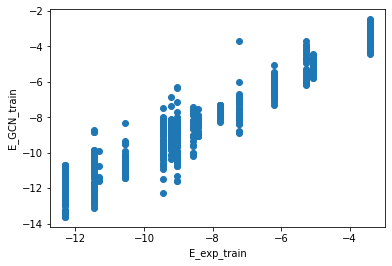

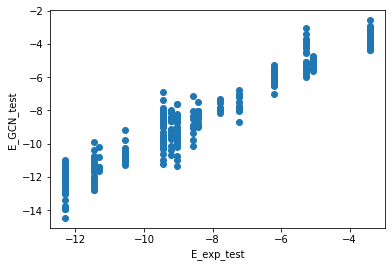

 87%|████████▋ | 87/100 [08:36<01:15,  5.83s/it]

INFO:__main__:87. time: 5.75 loss: 0.606 rmse: (0.7667804381715713, 0.7622555966264913) r2: (0.9114004953809187, 0.910760970879253)


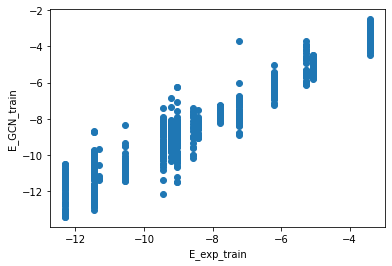

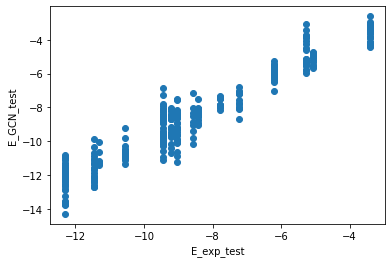

 88%|████████▊ | 88/100 [08:42<01:10,  5.87s/it]

INFO:__main__:88. time: 5.39 loss: 0.587 rmse: (0.7559657823576643, 0.764086784625435) r2: (0.9138820822159834, 0.9103316930196177)


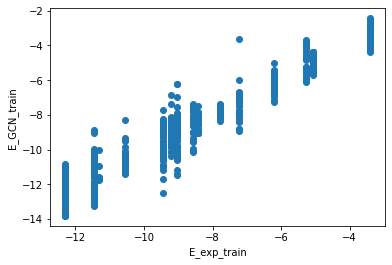

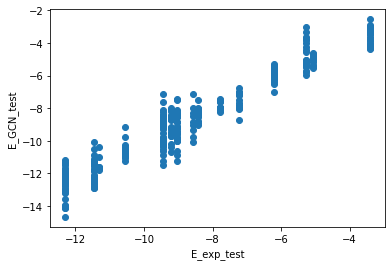

 89%|████████▉ | 89/100 [08:48<01:03,  5.79s/it]

INFO:__main__:89. time: 5.64 loss: 0.588 rmse: (0.7899837689596625, 0.8130668523807696) r2: (0.9059571935913697, 0.8984672603347504)


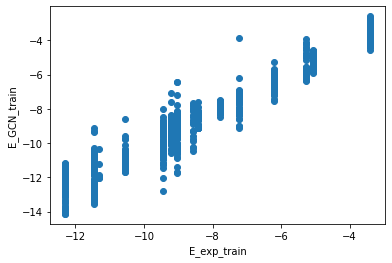

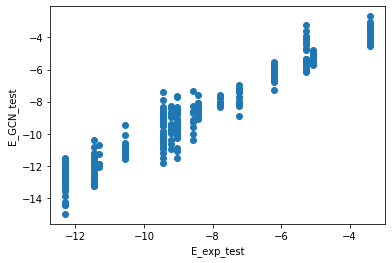

 90%|█████████ | 90/100 [08:54<00:58,  5.80s/it]

INFO:__main__:90. time: 5.67 loss: 0.596 rmse: (0.7718955030938848, 0.7709102925289725) r2: (0.9102144875471861, 0.90872301604741)


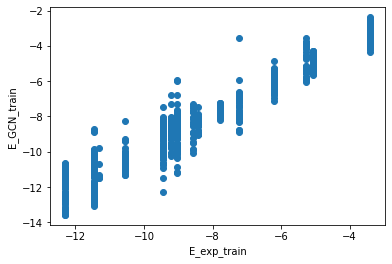

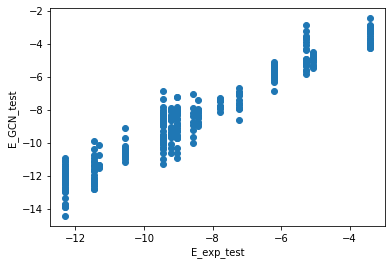

 91%|█████████ | 91/100 [08:59<00:52,  5.83s/it]

INFO:__main__:91. time: 5.65 loss: 0.595 rmse: (0.7585585792392326, 0.7644106674409088) r2: (0.913290338024991, 0.9102556593032728)


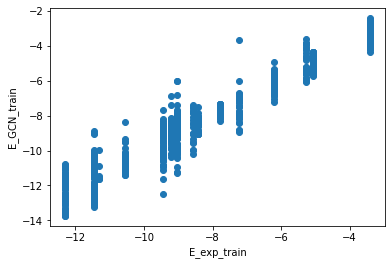

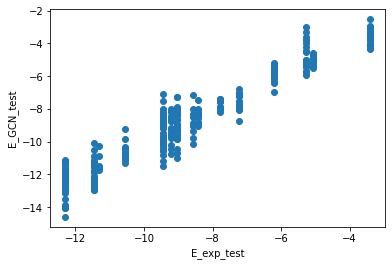

 92%|█████████▏| 92/100 [09:05<00:46,  5.84s/it]

INFO:__main__:92. time: 5.63 loss: 0.588 rmse: (0.752631619541927, 0.7587873213816805) r2: (0.9146400476544995, 0.9115712014355023)


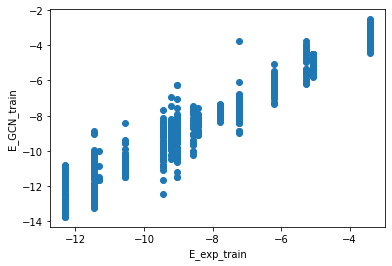

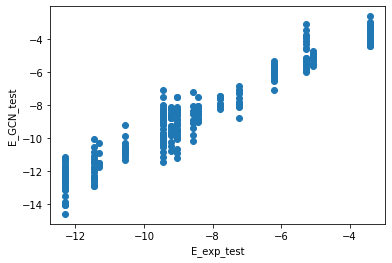

 93%|█████████▎| 93/100 [09:11<00:40,  5.84s/it]

INFO:__main__:93. time: 5.65 loss: 0.585 rmse: (0.782654347056947, 0.8007837240870938) r2: (0.9076941453759677, 0.9015118299086852)


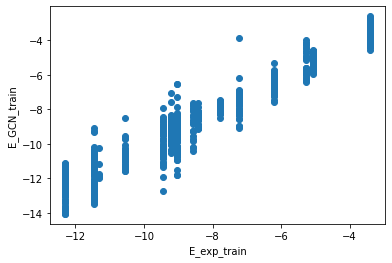

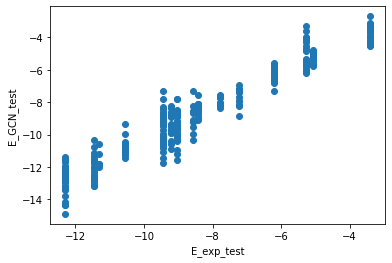

 94%|█████████▍| 94/100 [09:17<00:35,  5.84s/it]

INFO:__main__:94. time: 5.47 loss: 0.591 rmse: (0.760189218883829, 0.7714222168067231) r2: (0.9129171455292879, 0.9086017505277307)


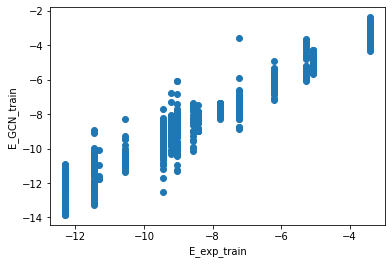

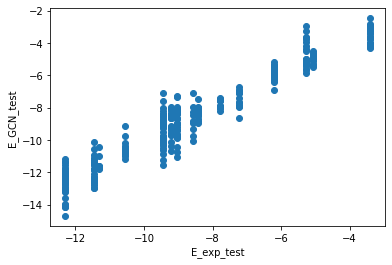

 95%|█████████▌| 95/100 [09:23<00:28,  5.79s/it]

INFO:__main__:95. time: 5.78 loss: 0.586 rmse: (0.7530365324830568, 0.7623339690256671) r2: (0.9145481762902455, 0.91074261945911)


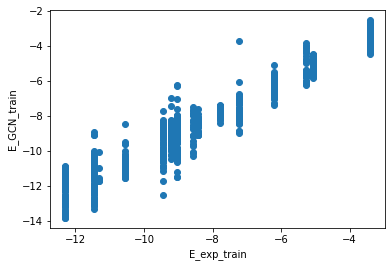

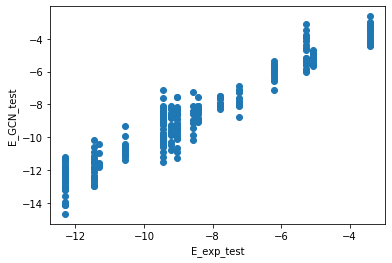

 96%|█████████▌| 96/100 [09:29<00:23,  5.85s/it]

INFO:__main__:96. time: 5.65 loss: 0.582 rmse: (0.7641758274748484, 0.7640403048579711) r2: (0.9120013852036208, 0.9103426018204966)


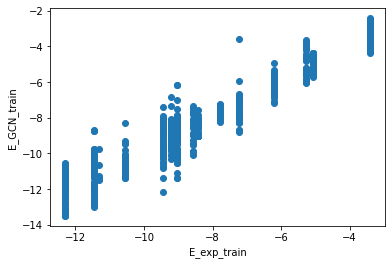

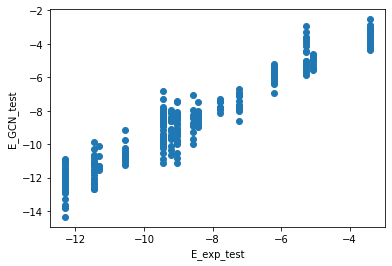

 97%|█████████▋| 97/100 [09:35<00:17,  5.89s/it]

INFO:__main__:97. time: 5.64 loss: 0.581 rmse: (0.7517708091962534, 0.7633741410706032) r2: (0.9148351941461398, 0.9104988775402455)


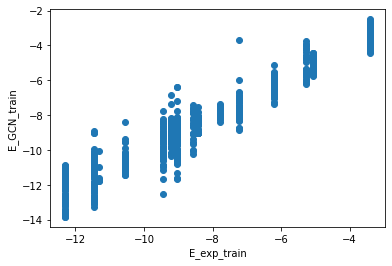

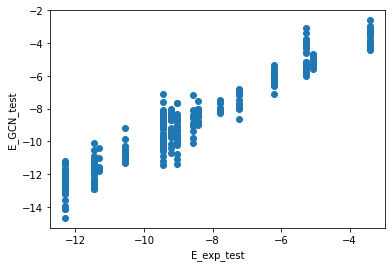

 98%|█████████▊| 98/100 [09:40<00:11,  5.87s/it]

INFO:__main__:98. time: 5.68 loss: 0.571 rmse: (0.7629189951946854, 0.7626447151721786) r2: (0.9122906080363027, 0.9106698376044478)


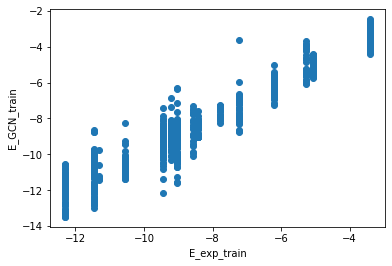

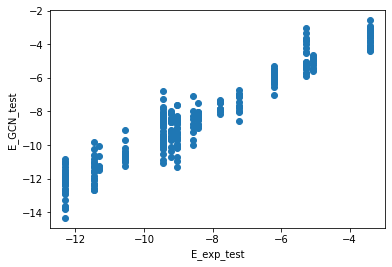

 99%|█████████▉| 99/100 [09:46<00:05,  5.88s/it]

INFO:__main__:99. time: 5.66 loss: 0.584 rmse: (0.7679498567764719, 0.7804258635520606) r2: (0.9111300426886493, 0.9064557923990351)


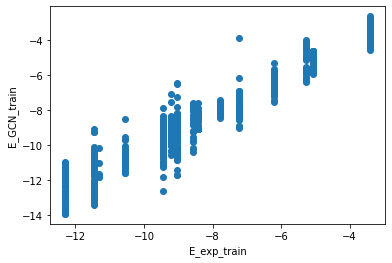

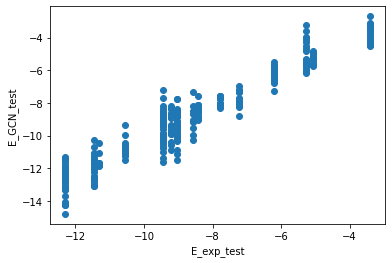

100%|██████████| 100/100 [09:52<00:00,  5.93s/it]


In [44]:

in_dim=24
hidden_dim=8
out_dim=2
num_layers=2
heads=8
activation=F.elu
feat_drop=.6
attn_drop=.6
negative_slope=.2
residual=False
with_edge_weights = True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# gnn = Classifier(in_dim, hidden_dim, out_dim, with_edge_weights).to(device)

gnn = Regressor(in_dim = in_dim, 
                hidden_dim = hidden_dim, 
                with_edge_weights = with_edge_weights).to(device)

opt = torch.optim.Adam(gnn.parameters())
metrics = ddict(list)



for epoch in tqdm(range(100)):
    start = time.time()
        
    loss = train_model(gnn, opt, trainloader, device)
    
    loss1, rmse1, r21, y_true_train, y_pred_train = evaluate_model(gnn, opt, trainloader, device)
    loss2, rmse2, r22, y_true_test, y_pred_test = evaluate_model(gnn, opt, testloader, device)
    metrics['rmse'].append((rmse1, rmse2))
    metrics['loss'].append((loss1, loss2))
    metrics['r2'].append((r21, r22))
    logger.debug(metrics)

    logger.info(f"{epoch}. time: {round(time.time() - start, 2)} loss: {round(loss, 3)} rmse: {metrics['rmse'][-1]} r2: {metrics['r2'][-1]}")
        
    plt.scatter(y_true_train, y_pred_train)
    plt.xlabel('E_exp_train')
    plt.ylabel('E_GCN_train')
    plt.show()
    
    plt.scatter(y_true_test, y_pred_test)
    plt.xlabel('E_exp_test')
    plt.ylabel('E_GCN_test')
    plt.show()

In [46]:
plot_interactive([metrics], legend=['Train', 'Test'], title='Loss', logx=False, logy=False, metric_name='loss', start_from=0)

In [47]:
plot_interactive([metrics], legend=['Train', 'Test'], title='RMSE', logx=False, logy=False, metric_name='rmse', start_from=0)

In [48]:
plot_interactive([metrics], legend=['Train', 'Test'], title='R2', logx=False, logy=False, metric_name='r2', start_from=0)

## E docking baseline

In [20]:
y_true = []
y_pred = []
for gs, label in testloader:
    label_exp = label[0]
    label_docking = label[1]
    y_true+=label_exp
    y_pred+=label_docking
    
logger.info(f'rmse {mean_squared_error(y_true, y_pred, squared = False)} r2 {r2_score(y_true, y_pred)}')

INFO:__main__:rmse 2.660173862057674 r2 -0.08686007886988145


Text(0, 0.5, 'E_docking')

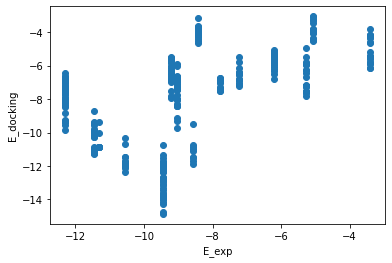

In [29]:
plt.scatter(y_true, y_pred)
plt.xlabel('E_exp')
plt.ylabel('E_docking')

## Mean baseline

In [31]:
y_true_train = []
y_pred_train = []
for gs, label in trainloader:
    label_exp = label[0]
    label_docking = label[1]
    y_true_train+=label_exp
    y_pred_train+=label_docking

In [33]:
y_exp_mean = np.mean(y_true_train)

In [32]:
y_true_test = []
y_pred_test = []
for gs, label in testloader:
    label_exp = label[0]
    label_docking = label[1]
    y_true_test+=label_exp
    y_pred_test+=label_docking

In [34]:
logger.info(f'rmse {mean_squared_error(y_true, [y_exp_mean]*len(y_true), squared = False)} r2 {r2_score(y_true, [y_exp_mean]*len(y_true))}')

INFO:__main__:rmse 2.5730267378356393 r2 -0.0009945233310704182


Text(0, 0.5, 'E_pred')

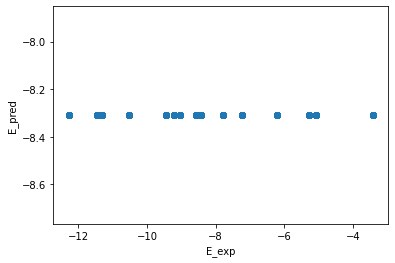

In [35]:
plt.scatter(y_true, [y_exp_mean]*len(y_true))
plt.xlabel('E_exp')
plt.ylabel('E_pred')

# Exp 2

model - GCN with edge weights (multipled by destination)

No edge feature

Add rmsd fix

In [66]:
class Regressor(nn.Module):
    def __init__(self, in_dim, hidden_dim, with_edge_weights = True):
        super(Regressor, self).__init__()
        self.conv1 = dglnn.GraphConv(in_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.conv2 = dglnn.GraphConv(hidden_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.regress = nn.Linear(hidden_dim, 1)
        self.with_edge_weights = with_edge_weights

    def forward(self, g, h, ew=True):
        # Apply graph convolution and activation.
        if self.with_edge_weights:
            e_weights = g.edata['edge_features'][:, 0].float()
        else:
            e_weights=None
        h = F.relu(self.conv1(g, h, edge_weight=e_weights))
        h = F.relu(self.conv2(g, h, edge_weight=e_weights))
        with g.local_scope():
            g.ndata['h'] = h
            # Calculate graph representation by average readout.
            hg = dgl.mean_nodes(g, 'h')
            return self.regress(hg)

In [67]:
npz_parser = NPZ_parser(folder = FOLDER, 
                 labels_file = LABELS_FILE,
                 task = 'regression', 
                 ohe_node_encoding = ['atom_type'],
                 ohe_edge_encoding = ['edge_type'])

In [68]:
graphs, labels = npz_parser.parser()

  0%|          | 0/1000 [00:00<?, ?it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16684, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16684, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26630, 2)
INFO:__main__:Num of protein edge attrs (26630, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

  0%|          | 4/1000 [00:00<00:33, 29.54it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (22077, 2)
INFO:__main__:array of edge attrs [3.4332 0.    ]
INFO:__main__:shape of edges attrs (22077, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (704, 2)
INFO:__main__:Num of ligand edge attrs (704, 2)
INFO:__main__:Num of protein edges (35338, 2)
INFO:__main__:Num of protein edge attrs (35338, 2)
INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sha

  1%|          | 7/1000 [00:00<00:35, 28.33it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2229.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13446, 2)
INFO:__main__:array of edge attrs [1.51236 1.     ]
INFO:__main__:shape of edges attrs (13446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (23282, 2)
INFO:__main__:Num of protein edge attrs (23282, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  1%|          | 11/1000 [00:00<00:33, 29.40it/s]

INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (384, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18368, 2)
INFO:__main__:array of edge attrs [1.53476 1.     ]
INFO:__main__:shape of edges attrs (18368, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (488, 2)
INFO:__main__:Num of ligand edge attrs (488, 2)
INFO:__main__:Num of protein edges (30100, 2)
INFO:__main__:Num of protein edge attrs (30100, 2)
INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  1%|▏         | 14/1000 [00:00<00:35, 28.06it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14101, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14101, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24550, 2)
INFO:__main__:Num of protein edge attrs (24550, 2)
INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

  2%|▏         | 18/1000 [00:00<00:34, 28.55it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14763, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14763, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1498, 2)
INFO:__main__:Num of ligand edge attrs (1498, 2)
INFO:__main__:Num of protein edges (20480, 2)
INFO:__main__:Num of protein edge attrs (20480, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 21/1000 [00:00<00:34, 28.39it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15012, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15012, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (23898, 2)
INFO:__main__:Num of protein edge attrs (23898, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  2%|▏         | 24/1000 [00:00<00:33, 28.82it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12406, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21186, 2)
INFO:__main__:Num of protein edge attrs (21186, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  3%|▎         | 27/1000 [00:00<00:33, 28.87it/s]

INFO:__main__:shape of node attrs (390, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16770, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (16770, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1396, 2)
INFO:__main__:Num of ligand edge attrs (1396, 2)
INFO:__main__:Num of protein edges (24634, 2)
INFO:__main__:Num of protein edge attrs (24634, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  3%|▎         | 30/1000 [00:01<00:33, 28.72it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19833, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19833, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1474, 2)
INFO:__main__:Num of ligand edge attrs (1474, 2)
INFO:__main__:Num of protein edges (29646, 2)
INFO:__main__:Num of protein edge attrs (29646, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  3%|▎         | 33/1000 [00:01<00:33, 28.88it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12773, 2)
INFO:__main__:array of edge attrs [1.23906 1.     ]
INFO:__main__:shape of edges attrs (12773, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21742, 2)
INFO:__main__:Num of protein edge attrs (21742, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2230.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

  4%|▎         | 37/1000 [00:01<00:32, 29.80it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19623, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19623, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1414, 2)
INFO:__main__:Num of ligand edge attrs (1414, 2)
INFO:__main__:Num of protein edges (29246, 2)
INFO:__main__:Num of protein edge attrs (29246, 2)
INFO:__main__:shape of node attrs (362, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

  4%|▍         | 40/1000 [00:01<00:33, 28.99it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [458.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13184, 2)
INFO:__main__:array of edge attrs [1.22836 1.     ]
INFO:__main__:shape of edges attrs (13184, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (314, 2)
INFO:__main__:Num of ligand edge attrs (314, 2)
INFO:__main__:Num of protein edges (21664, 2)
INFO:__main__:Num of protein edge attrs (21664, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  4%|▍         | 43/1000 [00:01<00:32, 29.09it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13550, 2)
INFO:__main__:array of edge attrs [2.12982 0.     ]
INFO:__main__:shape of edges attrs (13550, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (23446, 2)
INFO:__main__:Num of protein edge attrs (23446, 2)
INFO:__main__:shape of node attrs (356, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (322, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  5%|▍         | 46/1000 [00:01<00:32, 29.29it/s]

INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15402, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15402, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1554, 2)
INFO:__main__:Num of ligand edge attrs (1554, 2)
INFO:__main__:Num of protein edges (21416, 2)
INFO:__main__:Num of protein edge attrs (21416, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  5%|▍         | 49/1000 [00:01<00:32, 29.03it/s]

INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20586, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (20586, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1822, 2)
INFO:__main__:Num of ligand edge attrs (1822, 2)
INFO:__main__:Num of protein edges (28950, 2)
INFO:__main__:Num of protein edge attrs (28950, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

  5%|▌         | 52/1000 [00:01<00:32, 29.22it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14923, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (14923, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (862, 2)
INFO:__main__:Num of ligand edge attrs (862, 2)
INFO:__main__:Num of protein edges (23122, 2)
INFO:__main__:Num of protein edge attrs (23122, 2)
INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attr

  6%|▌         | 55/1000 [00:01<00:32, 28.78it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18967, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18967, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1502, 2)
INFO:__main__:Num of ligand edge attrs (1502, 2)
INFO:__main__:Num of protein edges (27928, 2)
INFO:__main__:Num of protein edge attrs (27928, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

  6%|▌         | 59/1000 [00:02<00:32, 29.38it/s]

INFO:__main__:shape of node attrs (288, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13047, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (13047, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (22402, 2)
INFO:__main__:Num of protein edge attrs (22402, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  6%|▌         | 62/1000 [00:02<00:31, 29.37it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16601, 2)
INFO:__main__:array of edge attrs [1.3703 1.    ]
INFO:__main__:shape of edges attrs (16601, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26746, 2)
INFO:__main__:Num of protein edge attrs (26746, 2)
INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of

  6%|▋         | 65/1000 [00:02<00:31, 29.37it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17871, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17871, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (28946, 2)
INFO:__main__:Num of protein edge attrs (28946, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (353, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sh

  7%|▋         | 69/1000 [00:02<00:31, 29.21it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19252, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19252, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2062, 2)
INFO:__main__:Num of ligand edge attrs (2062, 2)
INFO:__main__:Num of protein edges (26982, 2)
INFO:__main__:Num of protein edge attrs (26982, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

  7%|▋         | 72/1000 [00:02<00:31, 29.03it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12705, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12705, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21804, 2)
INFO:__main__:Num of protein edge attrs (21804, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

  8%|▊         | 75/1000 [00:02<00:31, 29.01it/s]

INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19409, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1380, 2)
INFO:__main__:Num of ligand edge attrs (1380, 2)
INFO:__main__:Num of protein edges (28832, 2)
INFO:__main__:Num of protein edge attrs (28832, 2)
INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  8%|▊         | 78/1000 [00:02<00:31, 28.93it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12327, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12327, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21036, 2)
INFO:__main__:Num of protein edge attrs (21036, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  8%|▊         | 81/1000 [00:02<00:31, 29.17it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (716, 2)
INFO:__main__:Num of ligand edge attrs (716, 2)
INFO:__main__:Num of protein edges (33468, 2)
INFO:__main__:Num of protein edge attrs (33468, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

  8%|▊         | 84/1000 [00:02<00:31, 28.96it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12898, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12898, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22190, 2)
INFO:__main__:Num of protein edge attrs (22190, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  9%|▊         | 87/1000 [00:03<00:31, 28.84it/s]

INFO:__main__:shape of node attrs (366, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (342, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15519, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15519, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (24838, 2)
INFO:__main__:Num of protein edge attrs (24838, 2)
INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  9%|▉         | 91/1000 [00:03<00:31, 28.85it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12334, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12334, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21044, 2)
INFO:__main__:Num of protein edge attrs (21044, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  9%|▉         | 94/1000 [00:03<00:31, 29.14it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11790, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11790, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20142, 2)
INFO:__main__:Num of protein edge attrs (20142, 2)
INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 10%|▉         | 97/1000 [00:03<00:30, 29.30it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22916, 2)
INFO:__main__:array of edge attrs [3.02531 0.     ]
INFO:__main__:shape of edges attrs (22916, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (736, 2)
INFO:__main__:Num of ligand edge attrs (736, 2)
INFO:__main__:Num of protein edges (36964, 2)
INFO:__main__:Num of protein edge attrs (36964, 2)
INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|█         | 100/1000 [00:03<00:31, 28.76it/s]

INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (296, 2)
INFO:__main__:Num of ligand edge attrs (296, 2)
INFO:__main__:Num of protein edges (20374, 2)
INFO:__main__:Num of protein edge attrs (20374, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|█         | 103/1000 [00:03<00:31, 28.69it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12980, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12980, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22308, 2)
INFO:__main__:Num of protein edge attrs (22308, 2)
INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 11%|█         | 107/1000 [00:03<00:30, 28.91it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19650, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19650, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1238, 2)
INFO:__main__:Num of ligand edge attrs (1238, 2)
INFO:__main__:Num of protein edges (29758, 2)
INFO:__main__:Num of protein edge attrs (29758, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 11%|█         | 110/1000 [00:03<00:30, 29.07it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19945, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (19945, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (29918, 2)
INFO:__main__:Num of protein edge attrs (29918, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 11%|█▏        | 113/1000 [00:03<00:30, 29.20it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14467, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14467, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25226, 2)
INFO:__main__:Num of protein edge attrs (25226, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 12%|█▏        | 116/1000 [00:03<00:30, 29.04it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22906, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22906, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (738, 2)
INFO:__main__:Num of ligand edge attrs (738, 2)
INFO:__main__:Num of protein edges (36876, 2)
INFO:__main__:Num of protein edge attrs (36876, 2)
INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (268, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 12%|█▏        | 119/1000 [00:04<00:30, 28.94it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13547, 2)
INFO:__main__:array of edge attrs [2.81375 0.     ]
INFO:__main__:shape of edges attrs (13547, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (930, 2)
INFO:__main__:Num of ligand edge attrs (930, 2)
INFO:__main__:Num of protein edges (20562, 2)
INFO:__main__:Num of protein edge attrs (20562, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 12%|█▏        | 123/1000 [00:04<00:30, 29.10it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22461, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22461, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (754, 2)
INFO:__main__:Num of ligand edge attrs (754, 2)
INFO:__main__:Num of protein edges (36048, 2)
INFO:__main__:Num of protein edge attrs (36048, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 13%|█▎        | 127/1000 [00:04<00:29, 29.25it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18589, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18589, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1526, 2)
INFO:__main__:Num of ligand edge attrs (1526, 2)
INFO:__main__:Num of protein edges (27674, 2)
INFO:__main__:Num of protein edge attrs (27674, 2)
INFO:__main__:shape of node attrs (400, 5)
INFO:__main__:array of node attrs [265.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 13%|█▎        | 130/1000 [00:04<00:29, 29.22it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19930, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19930, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (29804, 2)
INFO:__main__:Num of protein edge attrs (29804, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 13%|█▎        | 133/1000 [00:04<00:29, 29.15it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22422, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22422, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (720, 2)
INFO:__main__:Num of ligand edge attrs (720, 2)
INFO:__main__:Num of protein edges (36252, 2)
INFO:__main__:Num of protein edge attrs (36252, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 14%|█▎        | 136/1000 [00:04<00:30, 28.77it/s]

INFO:__main__:shape of node attrs (340, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14524, 2)
INFO:__main__:array of edge attrs [4.04088 0.     ]
INFO:__main__:shape of edges attrs (14524, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (22388, 2)
INFO:__main__:Num of protein edge attrs (22388, 2)
INFO:__main__:shape of node attrs (482, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 14%|█▍        | 139/1000 [00:04<00:30, 28.61it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22542, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22542, 2)
INFO:__main__:array of edges attrs [  0 194]
INFO:__main__:Num of ligand edges (766, 2)
INFO:__main__:Num of ligand edge attrs (766, 2)
INFO:__main__:Num of protein edges (36244, 2)
INFO:__main__:Num of protein edge attrs (36244, 2)
INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 14%|█▍        | 142/1000 [00:04<00:30, 28.02it/s]

INFO:__main__:shape of node attrs (351, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13389, 2)
INFO:__main__:array of edge attrs [3.05976 0.     ]
INFO:__main__:shape of edges attrs (13389, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21694, 2)
INFO:__main__:Num of protein edge attrs (21694, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 14%|█▍        | 145/1000 [00:05<00:29, 28.54it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14442, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (14442, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25138, 2)
INFO:__main__:Num of protein edge attrs (25138, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:sh

 15%|█▍        | 149/1000 [00:05<00:29, 29.08it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22596, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22596, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (768, 2)
INFO:__main__:Num of ligand edge attrs (768, 2)
INFO:__main__:Num of protein edges (36256, 2)
INFO:__main__:Num of protein edge attrs (36256, 2)
INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 15%|█▌        | 152/1000 [00:05<00:29, 28.93it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13109, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (13109, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22544, 2)
INFO:__main__:Num of protein edge attrs (22544, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 16%|█▌        | 155/1000 [00:05<00:29, 28.95it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14406, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25118, 2)
INFO:__main__:Num of protein edge attrs (25118, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 16%|█▌        | 158/1000 [00:05<00:29, 28.72it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21025, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (21025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (794, 2)
INFO:__main__:Num of ligand edge attrs (794, 2)
INFO:__main__:Num of protein edges (33440, 2)
INFO:__main__:Num of protein edge attrs (33440, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 16%|█▌        | 161/1000 [00:05<00:29, 28.64it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11844, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11844, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20162, 2)
INFO:__main__:Num of protein edge attrs (20162, 2)
INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 16%|█▋        | 165/1000 [00:05<00:27, 29.88it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22095, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22095, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (35366, 2)
INFO:__main__:Num of protein edge attrs (35366, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 17%|█▋        | 168/1000 [00:05<00:28, 29.33it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12697, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12697, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21798, 2)
INFO:__main__:Num of protein edge attrs (21798, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 17%|█▋        | 172/1000 [00:05<00:28, 29.55it/s]

INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15053, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15053, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (23968, 2)
INFO:__main__:Num of protein edge attrs (23968, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 18%|█▊        | 175/1000 [00:06<00:28, 29.25it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22718, 2)
INFO:__main__:array of edge attrs [7.74455 0.     ]
INFO:__main__:shape of edges attrs (22718, 2)
INFO:__main__:array of edges attrs [  0 169]
INFO:__main__:Num of ligand edges (774, 2)
INFO:__main__:Num of ligand edge attrs (774, 2)
INFO:__main__:Num of protein edges (36496, 2)
INFO:__main__:Num of protein edge attrs (36496, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 18%|█▊        | 178/1000 [00:06<00:28, 28.82it/s]

INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14854, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (14854, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (818, 2)
INFO:__main__:Num of ligand edge attrs (818, 2)
INFO:__main__:Num of protein edges (23334, 2)
INFO:__main__:Num of protein edge attrs (23334, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of ed

 18%|█▊        | 181/1000 [00:06<00:28, 28.57it/s]

INFO:__main__:shape of node attrs (433, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (17385, 2)
INFO:__main__:array of edge attrs [2.77509 0.     ]
INFO:__main__:shape of edges attrs (17385, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1710, 2)
INFO:__main__:Num of ligand edge attrs (1710, 2)
INFO:__main__:Num of protein edges (24694, 2)
INFO:__main__:Num of protein edge attrs (24694, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 18%|█▊        | 184/1000 [00:06<00:28, 28.55it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13056, 2)
INFO:__main__:array of edge attrs [1.52369 1.     ]
INFO:__main__:shape of edges attrs (13056, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (20038, 2)
INFO:__main__:Num of protein edge attrs (20038, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 19%|█▊        | 187/1000 [00:06<00:28, 28.72it/s]

INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [265.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17305, 2)
INFO:__main__:array of edge attrs [1.22915 1.     ]
INFO:__main__:shape of edges attrs (17305, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (520, 2)
INFO:__main__:Num of ligand edge attrs (520, 2)
INFO:__main__:Num of protein edges (27990, 2)
INFO:__main__:Num of protein edge attrs (27990, 2)
INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 19%|█▉        | 190/1000 [00:06<00:27, 29.03it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (447, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22746, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22746, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (36810, 2)
INFO:__main__:Num of protein edge attrs (36810, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 19%|█▉        | 193/1000 [00:06<00:28, 28.35it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12542, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12542, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21424, 2)
INFO:__main__:Num of protein edge attrs (21424, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 20%|█▉        | 196/1000 [00:06<00:27, 28.76it/s]

INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21640, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21640, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (31266, 2)
INFO:__main__:Num of protein edge attrs (31266, 2)
INFO:__main__:shape of node attrs (391, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 20%|█▉        | 199/1000 [00:06<00:28, 28.33it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22566, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22566, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (752, 2)
INFO:__main__:Num of ligand edge attrs (752, 2)
INFO:__main__:Num of protein edges (36240, 2)
INFO:__main__:Num of protein edge attrs (36240, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 20%|██        | 202/1000 [00:06<00:27, 28.79it/s]

INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20677, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20677, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1358, 2)
INFO:__main__:Num of ligand edge attrs (1358, 2)
INFO:__main__:Num of protein edges (31218, 2)
INFO:__main__:Num of protein edge attrs (31218, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 20%|██        | 205/1000 [00:07<00:27, 28.45it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22231, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22231, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (758, 2)
INFO:__main__:Num of ligand edge attrs (758, 2)
INFO:__main__:Num of protein edges (35622, 2)
INFO:__main__:Num of protein edge attrs (35622, 2)
INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 21%|██        | 208/1000 [00:07<00:27, 28.56it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20936, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20936, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1364, 2)
INFO:__main__:Num of ligand edge attrs (1364, 2)
INFO:__main__:Num of protein edges (31634, 2)
INFO:__main__:Num of protein edge attrs (31634, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 21%|██        | 211/1000 [00:07<00:27, 28.82it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12510, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12510, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21288, 2)
INFO:__main__:Num of protein edge attrs (21288, 2)
INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 21%|██▏       | 214/1000 [00:07<00:27, 28.74it/s]

INFO:__main__:shape of node attrs (361, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13739, 2)
INFO:__main__:array of edge attrs [5.21726 0.     ]
INFO:__main__:shape of edges attrs (13739, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (22320, 2)
INFO:__main__:Num of protein edge attrs (22320, 2)
INFO:__main__:shape of node attrs (278, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (244, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 22%|██▏       | 218/1000 [00:07<00:26, 29.53it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12883, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12883, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22096, 2)
INFO:__main__:Num of protein edge attrs (22096, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (319, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 22%|██▏       | 221/1000 [00:07<00:26, 29.21it/s]

INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17401, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17401, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28326, 2)
INFO:__main__:Num of protein edge attrs (28326, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 22%|██▏       | 224/1000 [00:07<00:27, 28.47it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11561, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11561, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19408, 2)
INFO:__main__:Num of protein edge attrs (19408, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 23%|██▎       | 228/1000 [00:07<00:26, 29.40it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12229, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12229, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20006, 2)
INFO:__main__:Num of protein edge attrs (20006, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 23%|██▎       | 232/1000 [00:08<00:25, 29.65it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20882, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (20882, 2)
INFO:__main__:array of edges attrs [  0 193]
INFO:__main__:Num of ligand edges (774, 2)
INFO:__main__:Num of ligand edge attrs (774, 2)
INFO:__main__:Num of protein edges (32974, 2)
INFO:__main__:Num of protein edge attrs (32974, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 24%|██▎       | 235/1000 [00:08<00:25, 29.70it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20784, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20784, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (31398, 2)
INFO:__main__:Num of protein edge attrs (31398, 2)
INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 24%|██▍       | 238/1000 [00:08<00:25, 29.58it/s]

INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17591, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (17591, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1408, 2)
INFO:__main__:Num of ligand edge attrs (1408, 2)
INFO:__main__:Num of protein edges (25598, 2)
INFO:__main__:Num of protein edge attrs (25598, 2)
INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 24%|██▍       | 241/1000 [00:08<00:26, 28.75it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11699, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11699, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (19906, 2)
INFO:__main__:Num of protein edge attrs (19906, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 24%|██▍       | 245/1000 [00:08<00:25, 29.29it/s]

INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17483, 2)
INFO:__main__:array of edge attrs [1.54983 1.     ]
INFO:__main__:shape of edges attrs (17483, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1202, 2)
INFO:__main__:Num of ligand edge attrs (1202, 2)
INFO:__main__:Num of protein edges (26142, 2)
INFO:__main__:Num of protein edge attrs (26142, 2)
INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 25%|██▍       | 248/1000 [00:08<00:26, 28.79it/s]

INFO:__main__:shape of node attrs (367, 5)
INFO:__main__:array of node attrs [192.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (343, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (15620, 2)
INFO:__main__:array of edge attrs [2.18935 0.     ]
INFO:__main__:shape of edges attrs (15620, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (24960, 2)
INFO:__main__:Num of protein edge attrs (24960, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 25%|██▌       | 251/1000 [00:08<00:25, 28.88it/s]

INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21305, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (21305, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (32524, 2)
INFO:__main__:Num of protein edge attrs (32524, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 25%|██▌       | 254/1000 [00:08<00:26, 28.58it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (419, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (20449, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (20449, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1828, 2)
INFO:__main__:Num of ligand edge attrs (1828, 2)
INFO:__main__:Num of protein edges (28808, 2)
INFO:__main__:Num of protein edge attrs (28808, 2)
INFO:__main__:shape of node attrs (507, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (452, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 26%|██▌       | 257/1000 [00:08<00:26, 28.26it/s]

INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15413, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15413, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1402, 2)
INFO:__main__:Num of ligand edge attrs (1402, 2)
INFO:__main__:Num of protein edges (21994, 2)
INFO:__main__:Num of protein edge attrs (21994, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 26%|██▌       | 260/1000 [00:08<00:26, 28.24it/s]

INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12468, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12468, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21296, 2)
INFO:__main__:Num of protein edge attrs (21296, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 26%|██▋       | 263/1000 [00:09<00:25, 28.55it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16817, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16817, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1520, 2)
INFO:__main__:Num of ligand edge attrs (1520, 2)
INFO:__main__:Num of protein edges (23840, 2)
INFO:__main__:Num of protein edge attrs (23840, 2)
INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (414, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 27%|██▋       | 266/1000 [00:09<00:26, 27.73it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12152, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12152, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 27%|██▋       | 269/1000 [00:09<00:26, 27.99it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11962, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11962, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20402, 2)
INFO:__main__:Num of protein edge attrs (20402, 2)
INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 27%|██▋       | 272/1000 [00:09<00:25, 28.15it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19297, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19297, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1398, 2)
INFO:__main__:Num of ligand edge attrs (1398, 2)
INFO:__main__:Num of protein edges (28776, 2)
INFO:__main__:Num of protein edge attrs (28776, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 28%|██▊       | 275/1000 [00:09<00:25, 28.50it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19846, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19846, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (29616, 2)
INFO:__main__:Num of protein edge attrs (29616, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 28%|██▊       | 278/1000 [00:09<00:25, 28.86it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17343, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17343, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (27980, 2)
INFO:__main__:Num of protein edge attrs (27980, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main

 28%|██▊       | 281/1000 [00:09<00:25, 28.53it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16855, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16855, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (27230, 2)
INFO:__main__:Num of protein edge attrs (27230, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 28%|██▊       | 284/1000 [00:09<00:25, 28.39it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13332, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (13332, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (906, 2)
INFO:__main__:Num of ligand edge attrs (906, 2)
INFO:__main__:Num of protein edges (20208, 2)
INFO:__main__:Num of protein edge attrs (20208, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 29%|██▉       | 288/1000 [00:09<00:24, 29.17it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14310, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14310, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24882, 2)
INFO:__main__:Num of protein edge attrs (24882, 2)
INFO:__main__:shape of node attrs (523, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (468, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 29%|██▉       | 291/1000 [00:10<00:24, 28.56it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22923, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22923, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (750, 2)
INFO:__main__:Num of ligand edge attrs (750, 2)
INFO:__main__:Num of protein edges (36946, 2)
INFO:__main__:Num of protein edge attrs (36946, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 29%|██▉       | 294/1000 [00:10<00:24, 28.86it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17788, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17788, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (28632, 2)
INFO:__main__:Num of protein edge attrs (28632, 2)
INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 30%|██▉       | 297/1000 [00:10<00:32, 21.41it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12032, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12032, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20520, 2)
INFO:__main__:Num of protein edge attrs (20520, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 30%|███       | 300/1000 [00:10<00:30, 22.88it/s]

INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15977, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (15977, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (25620, 2)
INFO:__main__:Num of protein edge attrs (25620, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 30%|███       | 303/1000 [00:10<00:29, 23.97it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13093, 2)
INFO:__main__:array of edge attrs [2.60437 0.     ]
INFO:__main__:shape of edges attrs (13093, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22564, 2)
INFO:__main__:Num of protein edge attrs (22564, 2)
INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [141.        17.         0.         0.         0.333333]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein

 31%|███       | 306/1000 [00:10<00:27, 25.26it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12573, 2)
INFO:__main__:array of edge attrs [1.23906 1.     ]
INFO:__main__:shape of edges attrs (12573, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21368, 2)
INFO:__main__:Num of protein edge attrs (21368, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 31%|███       | 309/1000 [00:10<00:26, 25.92it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16656, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16656, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1548, 2)
INFO:__main__:Num of ligand edge attrs (1548, 2)
INFO:__main__:Num of protein edges (23502, 2)
INFO:__main__:Num of protein edge attrs (23502, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 31%|███       | 312/1000 [00:10<00:26, 26.34it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11706, 2)
INFO:__main__:array of edge attrs [7.36887 0.     ]
INFO:__main__:shape of edges attrs (11706, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (19730, 2)
INFO:__main__:Num of protein edge attrs (19730, 2)
INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 32%|███▏      | 315/1000 [00:11<00:25, 27.02it/s]

INFO:__main__:shape of node attrs (334, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14014, 2)
INFO:__main__:array of edge attrs [1.3142 1.    ]
INFO:__main__:shape of edges attrs (14014, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (22004, 2)
INFO:__main__:Num of protein edge attrs (22004, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 32%|███▏      | 319/1000 [00:11<00:24, 28.20it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22087, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22087, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (35400, 2)
INFO:__main__:Num of protein edge attrs (35400, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 32%|███▏      | 322/1000 [00:11<00:24, 28.07it/s]

INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (886, 2)
INFO:__main__:Num of ligand edge attrs (886, 2)
INFO:__main__:Num of protein edges (23194, 2)
INFO:__main__:Num of protein edge attrs (23194, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 32%|███▎      | 325/1000 [00:11<00:23, 28.57it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21632, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21632, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (34462, 2)
INFO:__main__:Num of protein edge attrs (34462, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 33%|███▎      | 328/1000 [00:11<00:23, 28.31it/s]

INFO:__main__:shape of node attrs (326, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13787, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13787, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (904, 2)
INFO:__main__:Num of ligand edge attrs (904, 2)
INFO:__main__:Num of protein edges (21160, 2)
INFO:__main__:Num of protein edge attrs (21160, 2)
INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 33%|███▎      | 331/1000 [00:11<00:23, 28.46it/s]

INFO:__main__:shape of node attrs (280, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12019, 2)
INFO:__main__:array of edge attrs [5.50241 0.     ]
INFO:__main__:shape of edges attrs (12019, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20302, 2)
INFO:__main__:Num of protein edge attrs (20302, 2)
INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 33%|███▎      | 334/1000 [00:11<00:23, 28.79it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15737, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15737, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25304, 2)
INFO:__main__:Num of protein edge attrs (25304, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 34%|███▎      | 337/1000 [00:11<00:23, 28.49it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12004, 2)
INFO:__main__:array of edge attrs [6.96676 0.     ]
INFO:__main__:shape of edges attrs (12004, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (876, 2)
INFO:__main__:Num of ligand edge attrs (876, 2)
INFO:__main__:Num of protein edges (18366, 2)
INFO:__main__:Num of protein edge attrs (18366, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 34%|███▍      | 341/1000 [00:11<00:22, 29.30it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8543, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8543, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14332, 2)
INFO:__main__:Num of protein edge attrs (14332, 2)
INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 34%|███▍      | 344/1000 [00:12<00:22, 29.32it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22733, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22733, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (766, 2)
INFO:__main__:Num of ligand edge attrs (766, 2)
INFO:__main__:Num of protein edges (36696, 2)
INFO:__main__:Num of protein edge attrs (36696, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 35%|███▍      | 347/1000 [00:12<00:22, 28.79it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12877, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12877, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22126, 2)
INFO:__main__:Num of protein edge attrs (22126, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 35%|███▌      | 350/1000 [00:12<00:22, 28.66it/s]

INFO:__main__:shape of node attrs (267, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (255, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11904, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11904, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20122, 2)
INFO:__main__:Num of protein edge attrs (20122, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 35%|███▌      | 353/1000 [00:12<00:22, 28.94it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2302.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14673, 2)
INFO:__main__:array of edge attrs [1.39611 1.     ]
INFO:__main__:shape of edges attrs (14673, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (25410, 2)
INFO:__main__:Num of protein edge attrs (25410, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 36%|███▌      | 356/1000 [00:12<00:22, 28.92it/s]

INFO:__main__:shape of node attrs (498, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21344, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21344, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1920, 2)
INFO:__main__:Num of ligand edge attrs (1920, 2)
INFO:__main__:Num of protein edges (30636, 2)
INFO:__main__:Num of protein edge attrs (30636, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 36%|███▌      | 359/1000 [00:12<00:21, 29.16it/s]

INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (18240, 2)
INFO:__main__:array of edge attrs [0.99997 1.     ]
INFO:__main__:shape of edges attrs (18240, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (29784, 2)
INFO:__main__:Num of protein edge attrs (29784, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 36%|███▋      | 363/1000 [00:12<00:21, 29.61it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21479, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (21479, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (806, 2)
INFO:__main__:Num of ligand edge attrs (806, 2)
INFO:__main__:Num of protein edges (34286, 2)
INFO:__main__:Num of protein edge attrs (34286, 2)
INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 37%|███▋      | 366/1000 [00:12<00:21, 29.06it/s]

INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (324, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13331, 2)
INFO:__main__:array of edge attrs [7.78197 0.     ]
INFO:__main__:shape of edges attrs (13331, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (450, 2)
INFO:__main__:Num of ligand edge attrs (450, 2)
INFO:__main__:Num of protein edges (21540, 2)
INFO:__main__:Num of protein edge attrs (21540, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 37%|███▋      | 370/1000 [00:12<00:21, 29.42it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12574, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12574, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (862, 2)
INFO:__main__:Num of ligand edge attrs (862, 2)
INFO:__main__:Num of protein edges (18984, 2)
INFO:__main__:Num of protein edge attrs (18984, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 37%|███▋      | 374/1000 [00:13<00:21, 29.11it/s]

INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [2.12605 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (20548, 2)
INFO:__main__:Num of protein edge attrs (20548, 2)
INFO:__main__:shape of node attrs (537, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (482, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 38%|███▊      | 377/1000 [00:13<00:21, 29.00it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12034, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (12034, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (848, 2)
INFO:__main__:Num of ligand edge attrs (848, 2)
INFO:__main__:Num of protein edges (18344, 2)
INFO:__main__:Num of protein edge attrs (18344, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 38%|███▊      | 380/1000 [00:13<00:21, 28.95it/s]

INFO:__main__:shape of node attrs (360, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15060, 2)
INFO:__main__:array of edge attrs [1.3102 1.    ]
INFO:__main__:shape of edges attrs (15060, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (24118, 2)
INFO:__main__:Num of protein edge attrs (24118, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge a

 38%|███▊      | 383/1000 [00:13<00:21, 28.73it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19353, 2)
INFO:__main__:array of edge attrs [1.58364 1.     ]
INFO:__main__:shape of edges attrs (19353, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1280, 2)
INFO:__main__:Num of ligand edge attrs (1280, 2)
INFO:__main__:Num of protein edges (28848, 2)
INFO:__main__:Num of protein edge attrs (28848, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 39%|███▊      | 386/1000 [00:13<00:21, 29.03it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12664, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12664, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21724, 2)
INFO:__main__:Num of protein edge attrs (21724, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 39%|███▉      | 390/1000 [00:13<00:20, 29.10it/s]

INFO:__main__:shape of node attrs (400, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17875, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (17875, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (29128, 2)
INFO:__main__:Num of protein edge attrs (29128, 2)
INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 39%|███▉      | 393/1000 [00:13<00:20, 29.19it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13479, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13479, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (978, 2)
INFO:__main__:Num of ligand edge attrs (978, 2)
INFO:__main__:Num of protein edges (20204, 2)
INFO:__main__:Num of protein edge attrs (20204, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 40%|███▉      | 396/1000 [00:13<00:20, 29.38it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12086, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20376, 2)
INFO:__main__:Num of protein edge attrs (20376, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 40%|███▉      | 399/1000 [00:13<00:20, 29.21it/s]

INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19341, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19341, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1240, 2)
INFO:__main__:Num of ligand edge attrs (1240, 2)
INFO:__main__:Num of protein edges (28994, 2)
INFO:__main__:Num of protein edge attrs (28994, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 40%|████      | 402/1000 [00:14<00:20, 29.36it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (302, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12571, 2)
INFO:__main__:array of edge attrs [6.97661 0.     ]
INFO:__main__:shape of edges attrs (12571, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21652, 2)
INFO:__main__:Num of protein edge attrs (21652, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 40%|████      | 405/1000 [00:14<00:20, 29.33it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (420, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19984, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19984, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1336, 2)
INFO:__main__:Num of ligand edge attrs (1336, 2)
INFO:__main__:Num of protein edges (30156, 2)
INFO:__main__:Num of protein edge attrs (30156, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 41%|████      | 408/1000 [00:14<00:20, 29.19it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19416, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19416, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1834, 2)
INFO:__main__:Num of ligand edge attrs (1834, 2)
INFO:__main__:Num of protein edges (27002, 2)
INFO:__main__:Num of protein edge attrs (27002, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 41%|████      | 411/1000 [00:14<00:20, 28.80it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12350, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12350, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21024, 2)
INFO:__main__:Num of protein edge attrs (21024, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (263, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 41%|████▏     | 414/1000 [00:14<00:20, 29.10it/s]

INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21325, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21325, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2004, 2)
INFO:__main__:Num of ligand edge attrs (2004, 2)
INFO:__main__:Num of protein edges (30578, 2)
INFO:__main__:Num of protein edge attrs (30578, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 42%|████▏     | 417/1000 [00:14<00:20, 28.15it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22139, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22139, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (768, 2)
INFO:__main__:Num of ligand edge attrs (768, 2)
INFO:__main__:Num of protein edges (35506, 2)
INFO:__main__:Num of protein edge attrs (35506, 2)
INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 420/1000 [00:14<00:20, 27.83it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16129, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16129, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (25952, 2)
INFO:__main__:Num of protein edge attrs (25952, 2)
INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 42%|████▏     | 424/1000 [00:14<00:20, 28.38it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13045, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13045, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22322, 2)
INFO:__main__:Num of protein edge attrs (22322, 2)
INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 43%|████▎     | 427/1000 [00:14<00:20, 28.28it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (14548, 2)
INFO:__main__:array of edge attrs [5.91654 0.     ]
INFO:__main__:shape of edges attrs (14548, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (23248, 2)
INFO:__main__:Num of protein edge attrs (23248, 2)
INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 43%|████▎     | 430/1000 [00:15<00:20, 27.98it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12219, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12219, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20810, 2)
INFO:__main__:Num of protein edge attrs (20810, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 43%|████▎     | 434/1000 [00:15<00:19, 28.68it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16363, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16363, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (26342, 2)
INFO:__main__:Num of protein edge attrs (26342, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 44%|████▎     | 437/1000 [00:15<00:19, 28.51it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12812, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12812, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 44%|████▍     | 440/1000 [00:15<00:19, 28.88it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13889, 2)
INFO:__main__:array of edge attrs [1.46064 1.     ]
INFO:__main__:shape of edges attrs (13889, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (21192, 2)
INFO:__main__:Num of protein edge attrs (21192, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 44%|████▍     | 444/1000 [00:15<00:19, 28.82it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12637, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12637, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21520, 2)
INFO:__main__:Num of protein edge attrs (21520, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 45%|████▍     | 448/1000 [00:15<00:18, 29.71it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13530, 2)
INFO:__main__:array of edge attrs [2.39665 0.     ]
INFO:__main__:shape of edges attrs (13530, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (20518, 2)
INFO:__main__:Num of protein edge attrs (20518, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 45%|████▌     | 452/1000 [00:15<00:18, 30.18it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12082, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12082, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20486, 2)
INFO:__main__:Num of protein edge attrs (20486, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 46%|████▌     | 456/1000 [00:15<00:18, 30.14it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13340, 2)
INFO:__main__:array of edge attrs [3.20139 0.     ]
INFO:__main__:shape of edges attrs (13340, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (906, 2)
INFO:__main__:Num of ligand edge attrs (906, 2)
INFO:__main__:Num of protein edges (20222, 2)
INFO:__main__:Num of protein edge attrs (20222, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 46%|████▌     | 460/1000 [00:16<00:18, 29.66it/s]

INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16921, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16921, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (24534, 2)
INFO:__main__:Num of protein edge attrs (24534, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 46%|████▋     | 464/1000 [00:16<00:17, 30.20it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14587, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14587, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25430, 2)
INFO:__main__:Num of protein edge attrs (25430, 2)
INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (351, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 47%|████▋     | 468/1000 [00:16<00:17, 29.57it/s]

INFO:__main__:shape of node attrs (493, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21463, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (21463, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (32880, 2)
INFO:__main__:Num of protein edge attrs (32880, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 47%|████▋     | 471/1000 [00:16<00:18, 29.33it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22501, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22501, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (750, 2)
INFO:__main__:Num of ligand edge attrs (750, 2)
INFO:__main__:Num of protein edges (36316, 2)
INFO:__main__:Num of protein edge attrs (36316, 2)
INFO:__main__:shape of node attrs (341, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 47%|████▋     | 474/1000 [00:16<00:18, 28.86it/s]

INFO:__main__:shape of node attrs (362, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15704, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15704, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (25086, 2)
INFO:__main__:Num of protein edge attrs (25086, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 48%|████▊     | 477/1000 [00:16<00:18, 28.52it/s]

INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13196, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (13196, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22700, 2)
INFO:__main__:Num of protein edge attrs (22700, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 48%|████▊     | 481/1000 [00:16<00:17, 28.92it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (15080, 2)
INFO:__main__:array of edge attrs [5.91654 0.     ]
INFO:__main__:shape of edges attrs (15080, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (23956, 2)
INFO:__main__:Num of protein edge attrs (23956, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 48%|████▊     | 484/1000 [00:16<00:18, 28.43it/s]

INFO:__main__:shape of node attrs (345, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14424, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (14424, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (22770, 2)
INFO:__main__:Num of protein edge attrs (22770, 2)
INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 49%|████▊     | 487/1000 [00:16<00:17, 28.56it/s]

INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12662, 2)
INFO:__main__:array of edge attrs [1.0002 1.    ]
INFO:__main__:shape of edges attrs (12662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (830, 2)
INFO:__main__:Num of ligand edge attrs (830, 2)
INFO:__main__:Num of protein edges (19414, 2)
INFO:__main__:Num of protein edge attrs (19414, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 49%|████▉     | 490/1000 [00:17<00:17, 28.82it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20641, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (20641, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1230, 2)
INFO:__main__:Num of ligand edge attrs (1230, 2)
INFO:__main__:Num of protein edges (31152, 2)
INFO:__main__:Num of protein edge attrs (31152, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 49%|████▉     | 493/1000 [00:17<00:17, 28.60it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14908, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14908, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1426, 2)
INFO:__main__:Num of ligand edge attrs (1426, 2)
INFO:__main__:Num of protein edges (20520, 2)
INFO:__main__:Num of protein edge attrs (20520, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (399, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 50%|████▉     | 496/1000 [00:17<00:17, 28.17it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20572, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20572, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (31006, 2)
INFO:__main__:Num of protein edge attrs (31006, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 50%|████▉     | 499/1000 [00:17<00:17, 28.48it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22416, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22416, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (758, 2)
INFO:__main__:Num of ligand edge attrs (758, 2)
INFO:__main__:Num of protein edges (35908, 2)
INFO:__main__:Num of protein edge attrs (35908, 2)
INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 50%|█████     | 502/1000 [00:17<00:17, 28.33it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (250, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (10972, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (10972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (854, 2)
INFO:__main__:Num of ligand edge attrs (854, 2)
INFO:__main__:Num of protein edges (16406, 2)
INFO:__main__:Num of protein edge attrs (16406, 2)
INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 51%|█████     | 506/1000 [00:17<00:16, 29.14it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22964, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22964, 2)
INFO:__main__:array of edges attrs [  0 207]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (37088, 2)
INFO:__main__:Num of protein edge attrs (37088, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 51%|█████     | 509/1000 [00:17<00:16, 28.96it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14641, 2)
INFO:__main__:array of edge attrs [3.23915 0.     ]
INFO:__main__:shape of edges attrs (14641, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (822, 2)
INFO:__main__:Num of ligand edge attrs (822, 2)
INFO:__main__:Num of protein edges (22964, 2)
INFO:__main__:Num of protein edge attrs (22964, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 51%|█████     | 512/1000 [00:17<00:16, 29.16it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12542, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12542, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21334, 2)
INFO:__main__:Num of protein edge attrs (21334, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 52%|█████▏    | 516/1000 [00:17<00:16, 29.58it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19822, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19822, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1864, 2)
INFO:__main__:Num of ligand edge attrs (1864, 2)
INFO:__main__:Num of protein edges (28432, 2)
INFO:__main__:Num of protein edge attrs (28432, 2)
INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 52%|█████▏    | 519/1000 [00:18<00:16, 29.43it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8582, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8582, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14352, 2)
INFO:__main__:Num of protein edge attrs (14352, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 52%|█████▏    | 523/1000 [00:18<00:16, 29.75it/s]

INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19215, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (19215, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2140, 2)
INFO:__main__:Num of ligand edge attrs (2140, 2)
INFO:__main__:Num of protein edges (26710, 2)
INFO:__main__:Num of protein edge attrs (26710, 2)
INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 53%|█████▎    | 526/1000 [00:18<00:16, 28.49it/s]

INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8380, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8380, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13962, 2)
INFO:__main__:Num of protein edge attrs (13962, 2)
INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (382, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 53%|█████▎    | 529/1000 [00:18<00:16, 28.79it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12298, 2)
INFO:__main__:array of edge attrs [6.97661 0.     ]
INFO:__main__:shape of edges attrs (12298, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21054, 2)
INFO:__main__:Num of protein edge attrs (21054, 2)
INFO:__main__:shape of node attrs (359, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (335, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 53%|█████▎    | 532/1000 [00:18<00:16, 28.69it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19088, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1302, 2)
INFO:__main__:Num of ligand edge attrs (1302, 2)
INFO:__main__:Num of protein edges (28606, 2)
INFO:__main__:Num of protein edge attrs (28606, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 54%|█████▎    | 535/1000 [00:18<00:16, 28.29it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (18079, 2)
INFO:__main__:array of edge attrs [0.99997 1.     ]
INFO:__main__:shape of edges attrs (18079, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (29514, 2)
INFO:__main__:Num of protein edge attrs (29514, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 54%|█████▍    | 538/1000 [00:18<00:16, 28.17it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21984, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (21984, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (35284, 2)
INFO:__main__:Num of protein edge attrs (35284, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 54%|█████▍    | 541/1000 [00:18<00:16, 27.53it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7864, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7864, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13128, 2)
INFO:__main__:Num of protein edge attrs (13128, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 55%|█████▍    | 545/1000 [00:18<00:16, 28.32it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22203, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22203, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (764, 2)
INFO:__main__:Num of ligand edge attrs (764, 2)
INFO:__main__:Num of protein edges (35618, 2)
INFO:__main__:Num of protein edge attrs (35618, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 55%|█████▍    | 548/1000 [00:19<00:16, 28.23it/s]

INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21295, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (21295, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (814, 2)
INFO:__main__:Num of ligand edge attrs (814, 2)
INFO:__main__:Num of protein edges (33730, 2)
INFO:__main__:Num of protein edge attrs (33730, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 55%|█████▌    | 552/1000 [00:19<00:15, 29.07it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (17830, 2)
INFO:__main__:array of edge attrs [3.80688 0.     ]
INFO:__main__:shape of edges attrs (17830, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1268, 2)
INFO:__main__:Num of ligand edge attrs (1268, 2)
INFO:__main__:Num of protein edges (26560, 2)
INFO:__main__:Num of protein edge attrs (26560, 2)
INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 56%|█████▌    | 555/1000 [00:19<00:15, 28.13it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2295.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12926, 2)
INFO:__main__:array of edge attrs [1.5503 1.    ]
INFO:__main__:shape of edges attrs (12926, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22046, 2)
INFO:__main__:Num of protein edge attrs (22046, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 56%|█████▌    | 559/1000 [00:19<00:15, 28.54it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12183, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12183, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (326, 2)
INFO:__main__:Num of ligand edge attrs (326, 2)
INFO:__main__:Num of protein edges (19766, 2)
INFO:__main__:Num of protein edge attrs (19766, 2)
INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 56%|█████▌    | 562/1000 [00:19<00:15, 28.77it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12657, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12657, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21708, 2)
INFO:__main__:Num of protein edge attrs (21708, 2)
INFO:__main__:shape of node attrs (372, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 56%|█████▋    | 565/1000 [00:19<00:15, 28.94it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8500, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8500, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14262, 2)
INFO:__main__:Num of protein edge attrs (14262, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 57%|█████▋    | 568/1000 [00:19<00:14, 29.18it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19331, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19331, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1352, 2)
INFO:__main__:Num of ligand edge attrs (1352, 2)
INFO:__main__:Num of protein edges (28926, 2)
INFO:__main__:Num of protein edge attrs (28926, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 57%|█████▋    | 571/1000 [00:19<00:14, 28.91it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16710, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16710, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1334, 2)
INFO:__main__:Num of ligand edge attrs (1334, 2)
INFO:__main__:Num of protein edges (24206, 2)
INFO:__main__:Num of protein edge attrs (24206, 2)
INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 57%|█████▊    | 575/1000 [00:20<00:14, 29.76it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19188, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19188, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1254, 2)
INFO:__main__:Num of ligand edge attrs (1254, 2)
INFO:__main__:Num of protein edges (28808, 2)
INFO:__main__:Num of protein edge attrs (28808, 2)
INFO:__main__:shape of node attrs (485, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 58%|█████▊    | 578/1000 [00:20<00:14, 29.16it/s]

INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13867, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13867, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (21282, 2)
INFO:__main__:Num of protein edge attrs (21282, 2)
INFO:__main__:shape of node attrs (511, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (456, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 58%|█████▊    | 581/1000 [00:20<00:14, 28.66it/s]

INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8460, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8460, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14180, 2)
INFO:__main__:Num of protein edge attrs (14180, 2)
INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 58%|█████▊    | 585/1000 [00:20<00:14, 29.32it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14025, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (14025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24394, 2)
INFO:__main__:Num of protein edge attrs (24394, 2)
INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 59%|█████▉    | 588/1000 [00:20<00:14, 28.73it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8137, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8137, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13568, 2)
INFO:__main__:Num of protein edge attrs (13568, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 59%|█████▉    | 592/1000 [00:20<00:13, 29.43it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17223, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (17223, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (25126, 2)
INFO:__main__:Num of protein edge attrs (25126, 2)
INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 60%|█████▉    | 595/1000 [00:20<00:13, 29.21it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18672, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (18672, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1834, 2)
INFO:__main__:Num of ligand edge attrs (1834, 2)
INFO:__main__:Num of protein edges (26422, 2)
INFO:__main__:Num of protein edge attrs (26422, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 60%|█████▉    | 599/1000 [00:20<00:13, 29.79it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12683, 2)
INFO:__main__:array of edge attrs [1.50813 1.     ]
INFO:__main__:shape of edges attrs (12683, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21612, 2)
INFO:__main__:Num of protein edge attrs (21612, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 60%|██████    | 602/1000 [00:20<00:13, 29.04it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21307, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (820, 2)
INFO:__main__:Num of ligand edge attrs (820, 2)
INFO:__main__:Num of protein edges (34026, 2)
INFO:__main__:Num of protein edge attrs (34026, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 60%|██████    | 605/1000 [00:21<00:13, 29.07it/s]

INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14168, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14168, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1572, 2)
INFO:__main__:Num of ligand edge attrs (1572, 2)
INFO:__main__:Num of protein edges (19384, 2)
INFO:__main__:Num of protein edge attrs (19384, 2)
INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 61%|██████    | 608/1000 [00:21<00:13, 29.00it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17446, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (17446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1700, 2)
INFO:__main__:Num of ligand edge attrs (1700, 2)
INFO:__main__:Num of protein edges (24670, 2)
INFO:__main__:Num of protein edge attrs (24670, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 61%|██████    | 611/1000 [00:21<00:13, 28.98it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21406, 2)
INFO:__main__:array of edge attrs [1.2321 1.    ]
INFO:__main__:shape of edges attrs (21406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (718, 2)
INFO:__main__:Num of ligand edge attrs (718, 2)
INFO:__main__:Num of protein edges (34154, 2)
INFO:__main__:Num of protein edge attrs (34154, 2)
INFO:__main__:shape of node attrs (406, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 61%|██████▏   | 614/1000 [00:21<00:13, 29.03it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11483, 2)
INFO:__main__:array of edge attrs [1.5313 1.    ]
INFO:__main__:shape of edges attrs (11483, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (17876, 2)
INFO:__main__:Num of protein edge attrs (17876, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 62%|██████▏   | 617/1000 [00:21<00:13, 28.57it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17534, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (17534, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28406, 2)
INFO:__main__:Num of protein edge attrs (28406, 2)
INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 62%|██████▏   | 620/1000 [00:21<00:13, 28.46it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [85.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13738, 2)
INFO:__main__:array of edge attrs [1.53933 1.     ]
INFO:__main__:shape of edges attrs (13738, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (21228, 2)
INFO:__main__:Num of protein edge attrs (21228, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 62%|██████▏   | 624/1000 [00:21<00:12, 29.93it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19497, 2)
INFO:__main__:array of edge attrs [4.95171 0.     ]
INFO:__main__:shape of edges attrs (19497, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1416, 2)
INFO:__main__:Num of ligand edge attrs (1416, 2)
INFO:__main__:Num of protein edges (29234, 2)
INFO:__main__:Num of protein edge attrs (29234, 2)
INFO:__main__:shape of node attrs (523, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (468, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 63%|██████▎   | 627/1000 [00:21<00:12, 28.99it/s]

INFO:__main__:shape of node attrs (412, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15307, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1352, 2)
INFO:__main__:Num of ligand edge attrs (1352, 2)
INFO:__main__:Num of protein edges (21588, 2)
INFO:__main__:Num of protein edge attrs (21588, 2)
INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 63%|██████▎   | 630/1000 [00:21<00:12, 29.24it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8356, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8356, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13900, 2)
INFO:__main__:Num of protein edge attrs (13900, 2)
INFO:__main__:shape of node attrs (509, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (454, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 63%|██████▎   | 633/1000 [00:22<00:12, 28.96it/s]

INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13411, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13411, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (850, 2)
INFO:__main__:Num of ligand edge attrs (850, 2)
INFO:__main__:Num of protein edges (20294, 2)
INFO:__main__:Num of protein edge attrs (20294, 2)
INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 64%|██████▎   | 636/1000 [00:22<00:12, 28.25it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12871, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12871, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (19536, 2)
INFO:__main__:Num of protein edge attrs (19536, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 64%|██████▍   | 639/1000 [00:22<00:13, 27.76it/s]

INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15717, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15717, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1486, 2)
INFO:__main__:Num of ligand edge attrs (1486, 2)
INFO:__main__:Num of protein edges (21848, 2)
INFO:__main__:Num of protein edge attrs (21848, 2)
INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 64%|██████▍   | 642/1000 [00:22<00:12, 28.00it/s]

INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18672, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18672, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1368, 2)
INFO:__main__:Num of ligand edge attrs (1368, 2)
INFO:__main__:Num of protein edges (27450, 2)
INFO:__main__:Num of protein edge attrs (27450, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 64%|██████▍   | 645/1000 [00:22<00:12, 27.78it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16667, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26854, 2)
INFO:__main__:Num of protein edge attrs (26854, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 65%|██████▍   | 648/1000 [00:22<00:12, 27.81it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12718, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12718, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21762, 2)
INFO:__main__:Num of protein edge attrs (21762, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 65%|██████▌   | 652/1000 [00:22<00:11, 29.10it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11933, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11933, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (18694, 2)
INFO:__main__:Num of protein edge attrs (18694, 2)
INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 66%|██████▌   | 656/1000 [00:22<00:11, 29.79it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21926, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21926, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (35048, 2)
INFO:__main__:Num of protein edge attrs (35048, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 66%|██████▌   | 660/1000 [00:22<00:11, 30.20it/s]

INFO:__main__:shape of node attrs (278, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (244, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11076, 2)
INFO:__main__:array of edge attrs [3.52816 0.     ]
INFO:__main__:shape of edges attrs (11076, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (16392, 2)
INFO:__main__:Num of protein edge attrs (16392, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 66%|██████▋   | 664/1000 [00:23<00:10, 31.34it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8320, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8320, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13908, 2)
INFO:__main__:Num of protein edge attrs (13908, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [3.

 67%|██████▋   | 668/1000 [00:23<00:10, 32.72it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12354, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12354, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (300, 2)
INFO:__main__:Num of ligand edge attrs (300, 2)
INFO:__main__:Num of protein edges (20242, 2)
INFO:__main__:Num of protein edge attrs (20242, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 67%|██████▋   | 672/1000 [00:23<00:10, 32.05it/s]

INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19006, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19006, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1296, 2)
INFO:__main__:Num of ligand edge attrs (1296, 2)
INFO:__main__:Num of protein edges (28656, 2)
INFO:__main__:Num of protein edge attrs (28656, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 68%|██████▊   | 676/1000 [00:23<00:10, 31.87it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12524, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12524, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (320, 2)
INFO:__main__:Num of ligand edge attrs (320, 2)
INFO:__main__:Num of protein edges (20428, 2)
INFO:__main__:Num of protein edge attrs (20428, 2)
INFO:__main__:shape of node attrs (365, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (341, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 68%|██████▊   | 680/1000 [00:23<00:09, 32.48it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19972, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1906, 2)
INFO:__main__:Num of ligand edge attrs (1906, 2)
INFO:__main__:Num of protein edges (28106, 2)
INFO:__main__:Num of protein edge attrs (28106, 2)
INFO:__main__:shape of node attrs (368, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (344, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 68%|██████▊   | 684/1000 [00:23<00:09, 32.24it/s]

INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14817, 2)
INFO:__main__:array of edge attrs [2.26816 0.     ]
INFO:__main__:shape of edges attrs (14817, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1522, 2)
INFO:__main__:Num of ligand edge attrs (1522, 2)
INFO:__main__:Num of protein edges (20542, 2)
INFO:__main__:Num of protein edge attrs (20542, 2)
INFO:__main__:shape of node attrs (393, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:

 69%|██████▉   | 688/1000 [00:23<00:09, 31.34it/s]

INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8293, 2)
INFO:__main__:array of edge attrs [2.42815 0.     ]
INFO:__main__:shape of edges attrs (8293, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13968, 2)
INFO:__main__:Num of protein edge attrs (13968, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 69%|██████▉   | 692/1000 [00:23<00:09, 30.92it/s]

INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15037, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15037, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (840, 2)
INFO:__main__:Num of ligand edge attrs (840, 2)
INFO:__main__:Num of protein edges (23330, 2)
INFO:__main__:Num of protein edge attrs (23330, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 70%|██████▉   | 696/1000 [00:24<00:10, 30.37it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18521, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18521, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1540, 2)
INFO:__main__:Num of ligand edge attrs (1540, 2)
INFO:__main__:Num of protein edges (27072, 2)
INFO:__main__:Num of protein edge attrs (27072, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 70%|███████   | 700/1000 [00:24<00:09, 30.04it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17547, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17547, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (28330, 2)
INFO:__main__:Num of protein edge attrs (28330, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 70%|███████   | 704/1000 [00:24<00:09, 30.07it/s]

INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13448, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (13448, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1508, 2)
INFO:__main__:Num of ligand edge attrs (1508, 2)
INFO:__main__:Num of protein edges (18696, 2)
INFO:__main__:Num of protein edge attrs (18696, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 708/1000 [00:24<00:09, 31.09it/s]

INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18582, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (18582, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (492, 2)
INFO:__main__:Num of ligand edge attrs (492, 2)
INFO:__main__:Num of protein edges (30548, 2)
INFO:__main__:Num of protein edge attrs (30548, 2)
INFO:__main__:shape of node attrs (524, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (469, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 71%|███████   | 712/1000 [00:24<00:09, 31.18it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16454, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (16454, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1416, 2)
INFO:__main__:Num of ligand edge attrs (1416, 2)
INFO:__main__:Num of protein edges (23530, 2)
INFO:__main__:Num of protein edge attrs (23530, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sh

 72%|███████▏  | 716/1000 [00:24<00:08, 32.25it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12086, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (19738, 2)
INFO:__main__:Num of protein edge attrs (19738, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 72%|███████▏  | 720/1000 [00:24<00:08, 32.31it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12435, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12435, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21066, 2)
INFO:__main__:Num of protein edge attrs (21066, 2)
INFO:__main__:shape of node attrs (393, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

 72%|███████▏  | 724/1000 [00:24<00:08, 32.12it/s]

INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8451, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8451, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14166, 2)
INFO:__main__:Num of protein edge attrs (14166, 2)
INFO:__main__:shape of node attrs (336, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 73%|███████▎  | 728/1000 [00:25<00:08, 33.02it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8304, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8304, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13800, 2)
INFO:__main__:Num of protein edge attrs (13800, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 73%|███████▎  | 732/1000 [00:25<00:08, 33.11it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19638, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19638, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2214, 2)
INFO:__main__:Num of ligand edge attrs (2214, 2)
INFO:__main__:Num of protein edges (27034, 2)
INFO:__main__:Num of protein edge attrs (27034, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 74%|███████▎  | 736/1000 [00:25<00:08, 32.55it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (262, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12274, 2)
INFO:__main__:array of edge attrs [3.85289 0.     ]
INFO:__main__:shape of edges attrs (12274, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1034, 2)
INFO:__main__:Num of ligand edge attrs (1034, 2)
INFO:__main__:Num of protein edges (17916, 2)
INFO:__main__:Num of protein edge attrs (17916, 2)
INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 74%|███████▍  | 740/1000 [00:25<00:07, 33.55it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18133, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18133, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (29382, 2)
INFO:__main__:Num of protein edge attrs (29382, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 74%|███████▍  | 744/1000 [00:25<00:07, 32.36it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17647, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (17647, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (506, 2)
INFO:__main__:Num of ligand edge attrs (506, 2)
INFO:__main__:Num of protein edges (28830, 2)
INFO:__main__:Num of protein edge attrs (28830, 2)
INFO:__main__:shape of node attrs (233, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (221, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 75%|███████▍  | 748/1000 [00:25<00:07, 31.91it/s]

INFO:__main__:shape of node attrs (391, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (342, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14552, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (14552, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1436, 2)
INFO:__main__:Num of ligand edge attrs (1436, 2)
INFO:__main__:Num of protein edges (20208, 2)
INFO:__main__:Num of protein edge attrs (20208, 2)
INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 75%|███████▌  | 752/1000 [00:25<00:07, 32.22it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13944, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13944, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (350, 2)
INFO:__main__:Num of ligand edge attrs (350, 2)
INFO:__main__:Num of protein edges (22942, 2)
INFO:__main__:Num of protein edge attrs (22942, 2)
INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 76%|███████▌  | 756/1000 [00:25<00:07, 32.65it/s]

INFO:__main__:shape of node attrs (504, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21861, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21861, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1856, 2)
INFO:__main__:Num of ligand edge attrs (1856, 2)
INFO:__main__:Num of protein edges (31702, 2)
INFO:__main__:Num of protein edge attrs (31702, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 76%|███████▌  | 760/1000 [00:26<00:07, 32.46it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (399, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19021, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19021, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1790, 2)
INFO:__main__:Num of ligand edge attrs (1790, 2)
INFO:__main__:Num of protein edges (27104, 2)
INFO:__main__:Num of protein edge attrs (27104, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 76%|███████▋  | 764/1000 [00:26<00:07, 32.20it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18231, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (18231, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1740, 2)
INFO:__main__:Num of ligand edge attrs (1740, 2)
INFO:__main__:Num of protein edges (25686, 2)
INFO:__main__:Num of protein edge attrs (25686, 2)
INFO:__main__:shape of node attrs (407, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 77%|███████▋  | 768/1000 [00:26<00:07, 32.43it/s]

INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14259, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14259, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24854, 2)
INFO:__main__:Num of protein edge attrs (24854, 2)
INFO:__main__:shape of node attrs (510, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (455, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 77%|███████▋  | 772/1000 [00:26<00:07, 32.01it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8118, 2)
INFO:__main__:array of edge attrs [5.42065 0.     ]
INFO:__main__:shape of edges attrs (8118, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13576, 2)
INFO:__main__:Num of protein edge attrs (13576, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 78%|███████▊  | 776/1000 [00:26<00:06, 32.86it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16879, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16879, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1450, 2)
INFO:__main__:Num of ligand edge attrs (1450, 2)
INFO:__main__:Num of protein edges (24314, 2)
INFO:__main__:Num of protein edge attrs (24314, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [88.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 78%|███████▊  | 780/1000 [00:26<00:06, 32.47it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19738, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (19738, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1848, 2)
INFO:__main__:Num of ligand edge attrs (1848, 2)
INFO:__main__:Num of protein edges (28252, 2)
INFO:__main__:Num of protein edge attrs (28252, 2)
INFO:__main__:shape of node attrs (246, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (234, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 78%|███████▊  | 784/1000 [00:26<00:06, 32.40it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16644, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16644, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1374, 2)
INFO:__main__:Num of ligand edge attrs (1374, 2)
INFO:__main__:Num of protein edges (23908, 2)
INFO:__main__:Num of protein edge attrs (23908, 2)
INFO:__main__:shape of node attrs (424, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 79%|███████▉  | 788/1000 [00:26<00:06, 32.65it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8329, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8329, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13858, 2)
INFO:__main__:Num of protein edge attrs (13858, 2)
INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 79%|███████▉  | 792/1000 [00:27<00:06, 32.45it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16664, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16664, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1434, 2)
INFO:__main__:Num of ligand edge attrs (1434, 2)
INFO:__main__:Num of protein edges (23970, 2)
INFO:__main__:Num of protein edge attrs (23970, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 80%|███████▉  | 796/1000 [00:27<00:06, 32.74it/s]

INFO:__main__:shape of node attrs (339, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13499, 2)
INFO:__main__:array of edge attrs [2.13119 0.     ]
INFO:__main__:shape of edges attrs (13499, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (21436, 2)
INFO:__main__:Num of protein edge attrs (21436, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

 80%|████████  | 800/1000 [00:27<00:06, 33.23it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18451, 2)
INFO:__main__:array of edge attrs [1.58364 1.     ]
INFO:__main__:shape of edges attrs (18451, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1342, 2)
INFO:__main__:Num of ligand edge attrs (1342, 2)
INFO:__main__:Num of protein edges (27236, 2)
INFO:__main__:Num of protein edge attrs (27236, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 80%|████████  | 804/1000 [00:27<00:06, 32.52it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11168, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11168, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (556, 2)
INFO:__main__:Num of ligand edge attrs (556, 2)
INFO:__main__:Num of protein edges (17290, 2)
INFO:__main__:Num of protein edge attrs (17290, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 81%|████████  | 808/1000 [00:27<00:05, 33.10it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19851, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (19851, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1286, 2)
INFO:__main__:Num of ligand edge attrs (1286, 2)
INFO:__main__:Num of protein edges (30158, 2)
INFO:__main__:Num of protein edge attrs (30158, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 81%|████████  | 812/1000 [00:27<00:05, 33.34it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23258, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (23258, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (712, 2)
INFO:__main__:Num of ligand edge attrs (712, 2)
INFO:__main__:Num of protein edges (37618, 2)
INFO:__main__:Num of protein edge attrs (37618, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 82%|████████▏ | 816/1000 [00:27<00:05, 32.39it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2181.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12129, 2)
INFO:__main__:array of edge attrs [1.38925 1.     ]
INFO:__main__:shape of edges attrs (12129, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20580, 2)
INFO:__main__:Num of protein edge attrs (20580, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 82%|████████▏ | 820/1000 [00:27<00:05, 31.89it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11375, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11375, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (560, 2)
INFO:__main__:Num of ligand edge attrs (560, 2)
INFO:__main__:Num of protein edges (17628, 2)
INFO:__main__:Num of protein edge attrs (17628, 2)
INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 82%|████████▏ | 824/1000 [00:28<00:05, 32.18it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16025, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1458, 2)
INFO:__main__:Num of ligand edge attrs (1458, 2)
INFO:__main__:Num of protein edges (22710, 2)
INFO:__main__:Num of protein edge attrs (22710, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 83%|████████▎ | 828/1000 [00:28<00:05, 31.92it/s]

INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (10487, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (10487, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (16090, 2)
INFO:__main__:Num of protein edge attrs (16090, 2)
INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 83%|████████▎ | 832/1000 [00:28<00:05, 32.35it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19794, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19794, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (29576, 2)
INFO:__main__:Num of protein edge attrs (29576, 2)
INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 84%|████████▎ | 836/1000 [00:28<00:05, 32.15it/s]

INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11623, 2)
INFO:__main__:array of edge attrs [2.54044 0.     ]
INFO:__main__:shape of edges attrs (11623, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (18192, 2)
INFO:__main__:Num of protein edge attrs (18192, 2)
INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 84%|████████▍ | 840/1000 [00:28<00:04, 32.57it/s]

INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21478, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (21478, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1938, 2)
INFO:__main__:Num of ligand edge attrs (1938, 2)
INFO:__main__:Num of protein edges (30890, 2)
INFO:__main__:Num of protein edge attrs (30890, 2)
INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 84%|████████▍ | 844/1000 [00:28<00:04, 32.11it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8138, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8138, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13504, 2)
INFO:__main__:Num of protein edge attrs (13504, 2)
INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 85%|████████▍ | 848/1000 [00:28<00:04, 32.33it/s]

INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16403, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (16403, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1486, 2)
INFO:__main__:Num of ligand edge attrs (1486, 2)
INFO:__main__:Num of protein edges (23328, 2)
INFO:__main__:Num of protein edge attrs (23328, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sh

 85%|████████▌ | 852/1000 [00:28<00:04, 33.28it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (20050, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (20050, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1914, 2)
INFO:__main__:Num of ligand edge attrs (1914, 2)
INFO:__main__:Num of protein edges (28682, 2)
INFO:__main__:Num of protein edge attrs (28682, 2)
INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 86%|████████▌ | 856/1000 [00:29<00:04, 32.71it/s]

INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (388, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16595, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16595, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1346, 2)
INFO:__main__:Num of ligand edge attrs (1346, 2)
INFO:__main__:Num of protein edges (23968, 2)
INFO:__main__:Num of protein edge attrs (23968, 2)
INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 86%|████████▌ | 860/1000 [00:29<00:04, 32.73it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18567, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18567, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1294, 2)
INFO:__main__:Num of ligand edge attrs (1294, 2)
INFO:__main__:Num of protein edges (27632, 2)
INFO:__main__:Num of protein edge attrs (27632, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 86%|████████▋ | 864/1000 [00:29<00:04, 32.21it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19685, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19685, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1420, 2)
INFO:__main__:Num of ligand edge attrs (1420, 2)
INFO:__main__:Num of protein edges (29202, 2)
INFO:__main__:Num of protein edge attrs (29202, 2)
INFO:__main__:shape of node attrs (384, 5)
INFO:__main__:array of node attrs [247.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (360, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 87%|████████▋ | 868/1000 [00:29<00:04, 32.10it/s]

INFO:__main__:shape of node attrs (490, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21529, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21529, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2114, 2)
INFO:__main__:Num of ligand edge attrs (2114, 2)
INFO:__main__:Num of protein edges (30686, 2)
INFO:__main__:Num of protein edge attrs (30686, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 87%|████████▋ | 872/1000 [00:29<00:03, 32.25it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19705, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19705, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1892, 2)
INFO:__main__:Num of ligand edge attrs (1892, 2)
INFO:__main__:Num of protein edges (28190, 2)
INFO:__main__:Num of protein edge attrs (28190, 2)
INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 88%|████████▊ | 876/1000 [00:29<00:03, 31.96it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (426, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21775, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (21775, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (34806, 2)
INFO:__main__:Num of protein edge attrs (34806, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 88%|████████▊ | 880/1000 [00:29<00:03, 31.14it/s]

INFO:__main__:shape of node attrs (368, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (344, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16571, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16571, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (26378, 2)
INFO:__main__:Num of protein edge attrs (26378, 2)
INFO:__main__:shape of node attrs (417, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 884/1000 [00:29<00:03, 32.16it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12163, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12163, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (318, 2)
INFO:__main__:Num of ligand edge attrs (318, 2)
INFO:__main__:Num of protein edges (19708, 2)
INFO:__main__:Num of protein edge attrs (19708, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 89%|████████▉ | 888/1000 [00:30<00:03, 32.34it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12905, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12905, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22214, 2)
INFO:__main__:Num of protein edge attrs (22214, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 89%|████████▉ | 892/1000 [00:30<00:03, 32.33it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1308.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8184, 2)
INFO:__main__:array of edge attrs [1.37981 1.     ]
INFO:__main__:shape of edges attrs (8184, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13670, 2)
INFO:__main__:Num of protein edge attrs (13670, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 90%|████████▉ | 896/1000 [00:30<00:03, 32.70it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19033, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19033, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1432, 2)
INFO:__main__:Num of ligand edge attrs (1432, 2)
INFO:__main__:Num of protein edges (28218, 2)
INFO:__main__:Num of protein edge attrs (28218, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 90%|█████████ | 900/1000 [00:30<00:03, 32.91it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18565, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18565, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1338, 2)
INFO:__main__:Num of ligand edge attrs (1338, 2)
INFO:__main__:Num of protein edges (27636, 2)
INFO:__main__:Num of protein edge attrs (27636, 2)
INFO:__main__:shape of node attrs (504, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 90%|█████████ | 904/1000 [00:30<00:02, 32.20it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15602, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15602, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1350, 2)
INFO:__main__:Num of ligand edge attrs (1350, 2)
INFO:__main__:Num of protein edges (22022, 2)
INFO:__main__:Num of protein edge attrs (22022, 2)
INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 91%|█████████ | 908/1000 [00:30<00:02, 32.85it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [1378.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12424, 2)
INFO:__main__:array of edge attrs [1.23525 1.     ]
INFO:__main__:shape of edges attrs (12424, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (19176, 2)
INFO:__main__:Num of protein edge attrs (19176, 2)
INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main

 91%|█████████ | 912/1000 [00:30<00:02, 32.31it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19337, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19337, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1328, 2)
INFO:__main__:Num of ligand edge attrs (1328, 2)
INFO:__main__:Num of protein edges (29044, 2)
INFO:__main__:Num of protein edge attrs (29044, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 92%|█████████▏| 916/1000 [00:30<00:02, 31.69it/s]

INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15311, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15311, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (21602, 2)
INFO:__main__:Num of protein edge attrs (21602, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 92%|█████████▏| 920/1000 [00:31<00:02, 31.64it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (258, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11413, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (11413, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (17050, 2)
INFO:__main__:Num of protein edge attrs (17050, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 92%|█████████▏| 924/1000 [00:31<00:02, 33.00it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16978, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16978, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1414, 2)
INFO:__main__:Num of ligand edge attrs (1414, 2)
INFO:__main__:Num of protein edges (24592, 2)
INFO:__main__:Num of protein edge attrs (24592, 2)
INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 93%|█████████▎| 928/1000 [00:31<00:02, 32.43it/s]

INFO:__main__:shape of node attrs (486, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21038, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21038, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1860, 2)
INFO:__main__:Num of ligand edge attrs (1860, 2)
INFO:__main__:Num of protein edges (29936, 2)
INFO:__main__:Num of protein edge attrs (29936, 2)
INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 93%|█████████▎| 932/1000 [00:31<00:02, 32.34it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11947, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11947, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (18768, 2)
INFO:__main__:Num of protein edge attrs (18768, 2)
INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [141.        17.         0.         0.         0.333333]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein a

 94%|█████████▎| 936/1000 [00:31<00:01, 32.49it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19622, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19622, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (29424, 2)
INFO:__main__:Num of protein edge attrs (29424, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 94%|█████████▍| 940/1000 [00:31<00:01, 30.53it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16778, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (16778, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1272, 2)
INFO:__main__:Num of ligand edge attrs (1272, 2)
INFO:__main__:Num of protein edges (24596, 2)
INFO:__main__:Num of protein edge attrs (24596, 2)
INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 94%|█████████▍| 944/1000 [00:31<00:01, 30.82it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13222, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (13222, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1030, 2)
INFO:__main__:Num of ligand edge attrs (1030, 2)
INFO:__main__:Num of protein edges (19336, 2)
INFO:__main__:Num of protein edge attrs (19336, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 95%|█████████▍| 948/1000 [00:31<00:01, 32.22it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18012, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18012, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1280, 2)
INFO:__main__:Num of ligand edge attrs (1280, 2)
INFO:__main__:Num of protein edges (26638, 2)
INFO:__main__:Num of protein edge attrs (26638, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 95%|█████████▌| 952/1000 [00:32<00:01, 31.81it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16396, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16396, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1354, 2)
INFO:__main__:Num of ligand edge attrs (1354, 2)
INFO:__main__:Num of protein edges (23452, 2)
INFO:__main__:Num of protein edge attrs (23452, 2)
INFO:__main__:shape of node attrs (402, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 96%|█████████▌| 956/1000 [00:32<00:01, 32.43it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11962, 2)
INFO:__main__:array of edge attrs [2.54044 0.     ]
INFO:__main__:shape of edges attrs (11962, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (18764, 2)
INFO:__main__:Num of protein edge attrs (18764, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [122.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 96%|█████████▌| 960/1000 [00:32<00:01, 32.24it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12358, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12358, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (20246, 2)
INFO:__main__:Num of protein edge attrs (20246, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 96%|█████████▋| 964/1000 [00:32<00:01, 31.45it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20610, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20610, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (31074, 2)
INFO:__main__:Num of protein edge attrs (31074, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 97%|█████████▋| 968/1000 [00:32<00:01, 31.52it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11771, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11771, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20058, 2)
INFO:__main__:Num of protein edge attrs (20058, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 97%|█████████▋| 972/1000 [00:32<00:00, 32.22it/s]

INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (15722, 2)
INFO:__main__:array of edge attrs [4.23043 0.     ]
INFO:__main__:shape of edges attrs (15722, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (844, 2)
INFO:__main__:Num of ligand edge attrs (844, 2)
INFO:__main__:Num of protein edges (24578, 2)
INFO:__main__:Num of protein edge attrs (24578, 2)
INFO:__main__:shape of node attrs (519, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (464, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 98%|█████████▊| 976/1000 [00:32<00:00, 31.81it/s]

INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17063, 2)
INFO:__main__:array of edge attrs [1.31575 1.     ]
INFO:__main__:shape of edges attrs (17063, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (24778, 2)
INFO:__main__:Num of protein edge attrs (24778, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 98%|█████████▊| 980/1000 [00:32<00:00, 31.30it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8577, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8577, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14406, 2)
INFO:__main__:Num of protein edge attrs (14406, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 98%|█████████▊| 984/1000 [00:33<00:00, 32.44it/s]

INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16104, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16104, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1444, 2)
INFO:__main__:Num of ligand edge attrs (1444, 2)
INFO:__main__:Num of protein edges (22778, 2)
INFO:__main__:Num of protein edge attrs (22778, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 99%|█████████▉| 988/1000 [00:33<00:00, 32.13it/s]

INFO:__main__:shape of node attrs (495, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (21531, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (21531, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1968, 2)
INFO:__main__:Num of ligand edge attrs (1968, 2)
INFO:__main__:Num of protein edges (30904, 2)
INFO:__main__:Num of protein edge attrs (30904, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 99%|█████████▉| 992/1000 [00:33<00:00, 32.11it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12276, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12276, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20078, 2)
INFO:__main__:Num of protein edge attrs (20078, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

100%|█████████▉| 996/1000 [00:33<00:00, 32.42it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11507, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11507, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19348, 2)
INFO:__main__:Num of protein edge attrs (19348, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [151.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

100%|██████████| 1000/1000 [00:33<00:00, 29.84it/s]


In [69]:
labels

[{'e_exp': -7.236794689, 'e_docking': -6.39009, 'rmsd': 2.15912},
 {'e_exp': -8.424721364, 'e_docking': -4.15096, 'rmsd': 2.31925},
 {'e_exp': -9.448796084, 'e_docking': -12.08238, 'rmsd': 4.92121},
 {'e_exp': -9.203018151, 'e_docking': -6.75867, 'rmsd': 2.88669},
 {'e_exp': -6.199065639, 'e_docking': -5.90739, 'rmsd': 3.05136},
 {'e_exp': -3.4135824, 'e_docking': -4.24053, 'rmsd': 7.34473},
 {'e_exp': -10.54114245, 'e_docking': -11.79607, 'rmsd': 1.5263},
 {'e_exp': -5.079410612, 'e_docking': -3.63095, 'rmsd': 5.82766},
 {'e_exp': -9.039166196, 'e_docking': -6.77649, 'rmsd': 8.25401},
 {'e_exp': -7.782967873, 'e_docking': -7.39372, 'rmsd': 0.5073},
 {'e_exp': -11.31943924, 'e_docking': -10.84614, 'rmsd': 0.28022},
 {'e_exp': -9.203018151, 'e_docking': -6.40276, 'rmsd': 6.12118},
 {'e_exp': -12.28889664, 'e_docking': -7.46186, 'rmsd': 5.33525},
 {'e_exp': -6.199065639, 'e_docking': -7.00638, 'rmsd': 3.56932},
 {'e_exp': -7.782967873, 'e_docking': -7.44249, 'rmsd': 1.32776},
 {'e_exp': 

In [70]:
for label in labels:
    logger.info(label['e_exp'])
    label['e_exp'] = label['e_exp']*2**(-(label['rmsd']**2)/4)

INFO:__main__:-7.236794689
INFO:__main__:-8.424721364
INFO:__main__:-9.448796084
INFO:__main__:-9.203018151
INFO:__main__:-6.199065639
INFO:__main__:-3.4135824
INFO:__main__:-10.54114245
INFO:__main__:-5.079410612
INFO:__main__:-9.039166196
INFO:__main__:-7.782967873
INFO:__main__:-11.31943924
INFO:__main__:-9.203018151
INFO:__main__:-12.28889664
INFO:__main__:-6.199065639
INFO:__main__:-7.782967873
INFO:__main__:-9.039166196
INFO:__main__:-5.079410612
INFO:__main__:-9.448796084
INFO:__main__:-11.46963687
INFO:__main__:-6.199065639
INFO:__main__:-11.46963687
INFO:__main__:-9.203018151
INFO:__main__:-7.782967873
INFO:__main__:-9.039166196
INFO:__main__:-5.079410612
INFO:__main__:-10.54114245
INFO:__main__:-3.4135824
INFO:__main__:-12.28889664
INFO:__main__:-5.284225556
INFO:__main__:-6.199065639
INFO:__main__:-10.54114245
INFO:__main__:-5.079410612
INFO:__main__:-9.039166196
INFO:__main__:-3.4135824
INFO:__main__:-3.4135824
INFO:__main__:-9.039166196
INFO:__main__:-5.079410612
INFO:__ma

INFO:__main__:-3.4135824
INFO:__main__:-6.199065639
INFO:__main__:-12.28889664
INFO:__main__:-11.46963687
INFO:__main__:-9.039166196
INFO:__main__:-10.54114245
INFO:__main__:-3.4135824
INFO:__main__:-6.199065639
INFO:__main__:-11.46963687
INFO:__main__:-9.203018151
INFO:__main__:-5.284225556
INFO:__main__:-12.28889664
INFO:__main__:-5.284225556
INFO:__main__:-6.199065639
INFO:__main__:-5.079410612
INFO:__main__:-10.54114245
INFO:__main__:-9.039166196
INFO:__main__:-3.4135824
INFO:__main__:-11.46963687
INFO:__main__:-6.199065639
INFO:__main__:-11.46963687
INFO:__main__:-9.203018151
INFO:__main__:-9.039166196
INFO:__main__:-10.54114245
INFO:__main__:-5.079410612
INFO:__main__:-3.4135824
INFO:__main__:-11.31943924
INFO:__main__:-12.28889664
INFO:__main__:-9.203018151
INFO:__main__:-6.199065639
INFO:__main__:-3.4135824
INFO:__main__:-9.039166196
INFO:__main__:-5.079410612
INFO:__main__:-7.782967873
INFO:__main__:-7.236794689
INFO:__main__:-8.424721364
INFO:__main__:-9.203018151
INFO:__main

INFO:__main__:-11.46963687
INFO:__main__:-8.424721364
INFO:__main__:-8.57491899
INFO:__main__:-12.28889664
INFO:__main__:-9.448796084
INFO:__main__:-9.203018151
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:__main__:-9.039166196
INFO:__main__:-5.284225556
INFO:__main__:-8.424721364
INFO:__main__:-3.4135824
INFO:__main__:-12.28889664
INFO:__main__:-9.448796084
INFO:__main__:-7.782967873
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:__main__:-5.284225556
INFO:__main__:-8.424721364
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-9.039166196
INFO:__main__:-12.28889664
INFO:__main__:-9.448796084
INFO:__main__:-9.039166196
INFO:__main__:-10.54114245
INFO:__main__:-6.199065639
INFO:__main__:-11.46963687
INFO:__main__:-8.424721364
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-11.46963687
INFO:__main__:-5.284225556
INFO:__main__:-9.203018151
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-5.079410612
INFO

INFO:__main__:-11.46963687
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-9.039166196
INFO:__main__:-5.284225556
INFO:__main__:-8.57491899
INFO:__main__:-8.424721364
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:__main__:-5.079410612
INFO:__main__:-9.203018151
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-5.284225556
INFO:__main__:-8.424721364
INFO:__main__:-8.57491899
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:__main__:-3.4135824
INFO:__main__:-12.28889664
INFO:__main__:-9.448796084
INFO:__main__:-6.199065639
INFO:__main__:-9.448796084
INFO:__main__:-12.28889664
INFO:__main__:-6.199065639
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:__main__:-9.039166196
INFO:__main__:-5.284225556
INFO:__main__:-8.57491899
INFO:__main__:-8.424721364
INFO:__main__:-12.28889664
INFO:__main__:-9.448796084
INFO:__main__:-9.203018151
INFO:__main__:-5.079410612
INFO:__main__:-11.46963687
INFO:__main__:-7.236794689
INFO:_

In [71]:
labels

[{'e_exp': -3.22634574130741, 'e_docking': -6.39009, 'rmsd': 2.15912},
 {'e_exp': -3.317045567985765, 'e_docking': -4.15096, 'rmsd': 2.31925},
 {'e_exp': -0.14215665594192373, 'e_docking': -12.08238, 'rmsd': 4.92121},
 {'e_exp': -2.1717563937709548, 'e_docking': -6.75867, 'rmsd': 2.88669},
 {'e_exp': -1.2348632778455138, 'e_docking': -5.90739, 'rmsd': 3.05136},
 {'e_exp': -0.00029746795550659425, 'e_docking': -4.24053, 'rmsd': 7.34473},
 {'e_exp': -7.039931578326497, 'e_docking': -11.79607, 'rmsd': 1.5263},
 {'e_exp': -0.014123640698007513, 'e_docking': -3.63095, 'rmsd': 5.82766},
 {'e_exp': -6.744258826066088e-05, 'e_docking': -6.77649, 'rmsd': 8.25401},
 {'e_exp': -7.4435048006734075, 'e_docking': -7.39372, 'rmsd': 0.5073},
 {'e_exp': -11.166458323438613, 'e_docking': -10.84614, 'rmsd': 0.28022},
 {'e_exp': -0.013935377799406791, 'e_docking': -6.40276, 'rmsd': 6.12118},
 {'e_exp': -0.08857604205240098, 'e_docking': -7.46186, 'rmsd': 5.33525},
 {'e_exp': -0.6816199488934336, 'e_dockin

## Analyze labels distribution

In [74]:
labels_exp = [label['e_exp'] for label in labels]

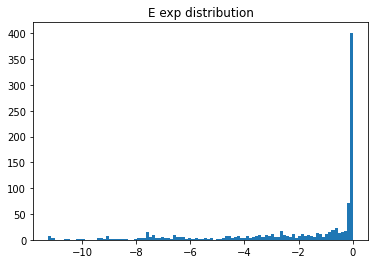

In [75]:
_ = plt.hist(labels_exp, bins = 100)
_ = plt.title('E exp distribution')

In [76]:
trainloader, testloader = create_loaders(graphs, labels,
                  train_size = 0.7,
                  batch_size = 16)

  0%|          | 0/100 [00:00<?, ?it/s]

INFO:__main__:0. time: 5.91 loss: 39.329 rmse: (5.588894386212254, 5.968665848126494) r2: (-3.1914103883827982, -3.2065804608853075)


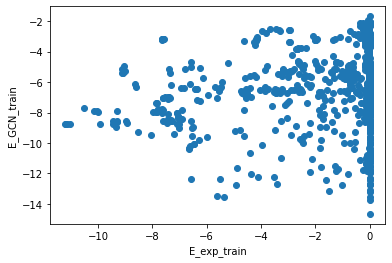

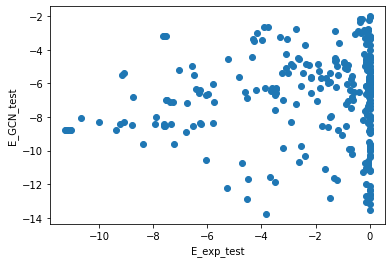

  1%|          | 1/100 [00:06<10:09,  6.15s/it]

INFO:__main__:1. time: 6.2 loss: 24.002 rmse: (4.120783857992275, 4.473779795802156) r2: (-1.2785997802644857, -1.3633273241515287)


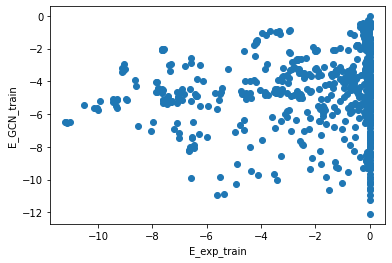

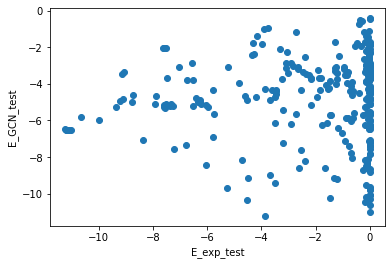

  2%|▏         | 2/100 [00:12<10:19,  6.32s/it]

INFO:__main__:2. time: 6.34 loss: 12.647 rmse: (3.1180584138693335, 3.421255828672404) r2: (-0.30459849720078336, -0.3821200561000411)


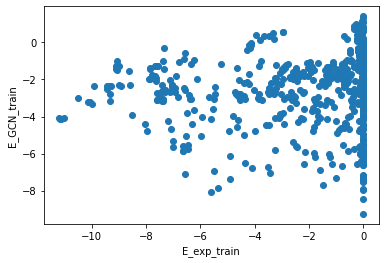

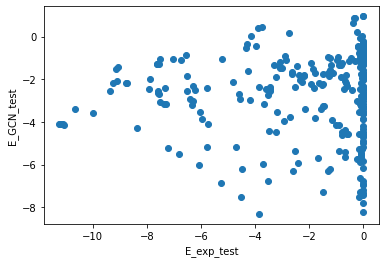

  3%|▎         | 3/100 [00:19<10:24,  6.44s/it]

INFO:__main__:3. time: 6.37 loss: 8.872 rmse: (2.8618408982954042, 3.143274354041416) r2: (-0.0990041985201191, -0.1666464041207918)


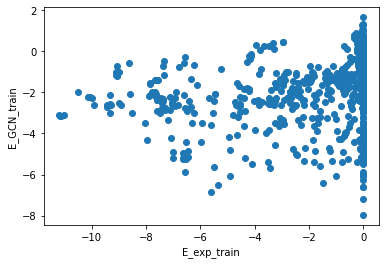

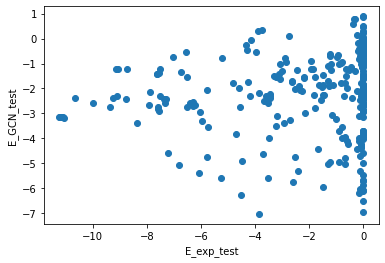

  4%|▍         | 4/100 [00:25<10:25,  6.52s/it]

INFO:__main__:4. time: 6.1 loss: 7.787 rmse: (2.702361234330884, 2.985975253642999) r2: (0.02006970474916081, -0.05280291038938367)


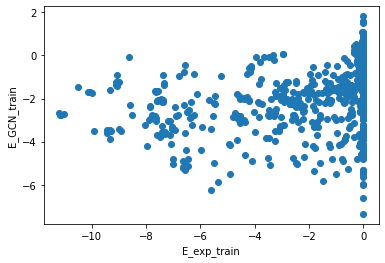

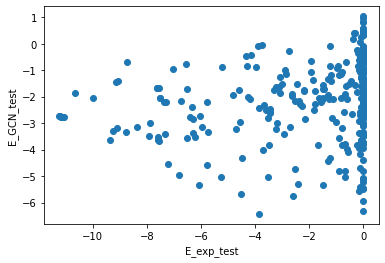

  5%|▌         | 5/100 [00:32<10:12,  6.45s/it]

INFO:__main__:5. time: 6.39 loss: 7.082 rmse: (2.6138570622937958, 2.902761522060123) r2: (0.08320539447038466, 0.005058872063634645)


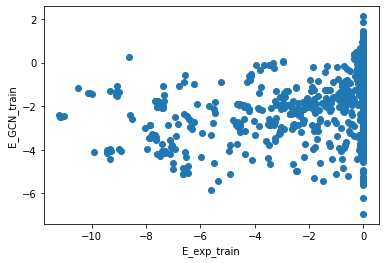

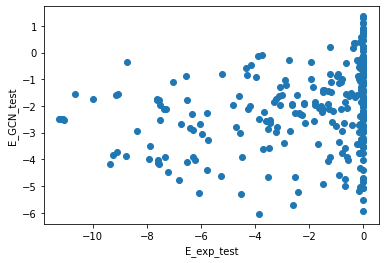

  6%|▌         | 6/100 [00:38<10:12,  6.52s/it]

INFO:__main__:6. time: 6.43 loss: 6.67 rmse: (2.559009600811282, 2.854443836114828) r2: (0.12127656202074177, 0.03790563046106965)


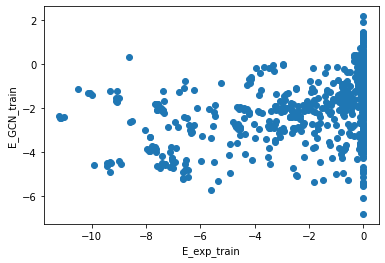

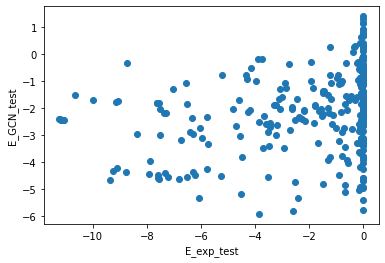

  7%|▋         | 7/100 [00:45<10:11,  6.58s/it]

INFO:__main__:7. time: 6.4 loss: 6.492 rmse: (2.5206103716049233, 2.8168280140793107) r2: (0.14745008052694752, 0.06309548682544464)


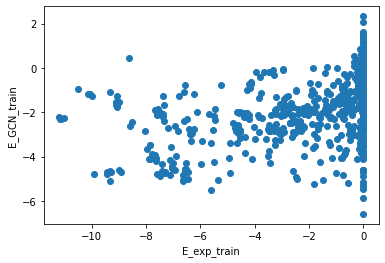

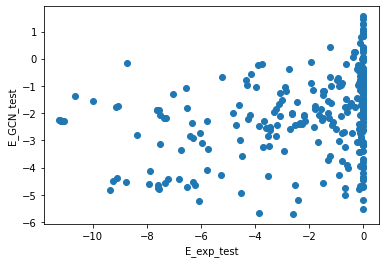

  8%|▊         | 8/100 [00:52<10:06,  6.59s/it]

INFO:__main__:8. time: 5.78 loss: 6.31 rmse: (2.490095066966916, 2.789133056389724) r2: (0.16796760512051656, 0.08142814547550825)


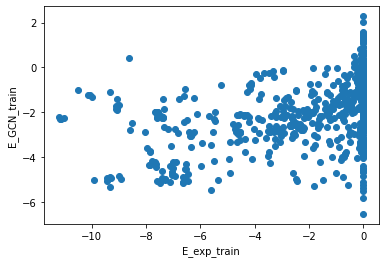

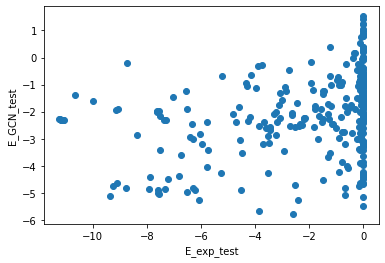

  9%|▉         | 9/100 [00:58<09:43,  6.41s/it]

INFO:__main__:9. time: 5.86 loss: 6.152 rmse: (2.4644646789279556, 2.7663245710509163) r2: (0.18500756747882707, 0.09639019037506169)


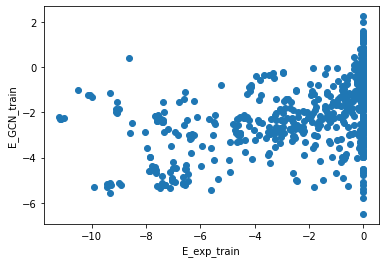

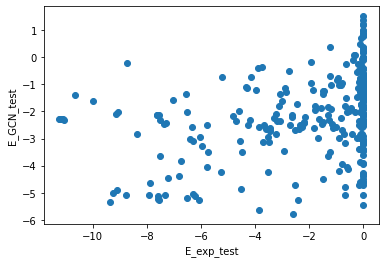

 10%|█         | 10/100 [01:04<09:28,  6.31s/it]

INFO:__main__:10. time: 6.47 loss: 6.006 rmse: (2.4343330354509574, 2.7376521607130746) r2: (0.2048146589201476, 0.11502459240770058)


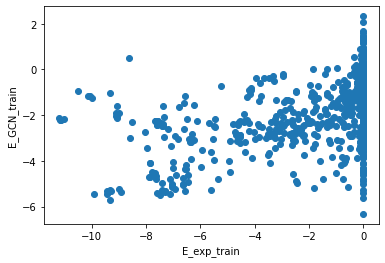

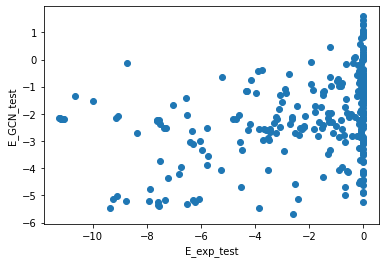

 11%|█         | 11/100 [01:10<09:34,  6.45s/it]

INFO:__main__:11. time: 6.34 loss: 5.865 rmse: (2.41060983516885, 2.713405890368526) r2: (0.22023771066477538, 0.13063090921349652)


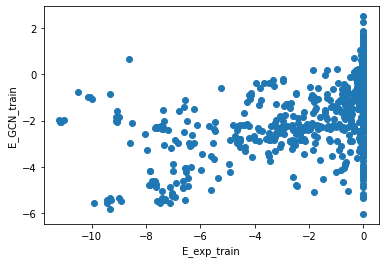

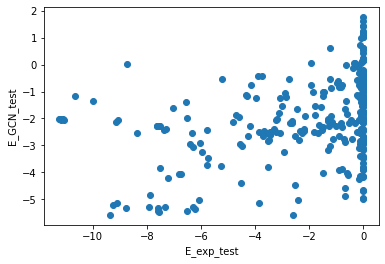

 12%|█▏        | 12/100 [01:17<09:30,  6.49s/it]

INFO:__main__:12. time: 6.47 loss: 5.785 rmse: (2.3916657665013035, 2.694322640220176) r2: (0.23244526650796993, 0.14281636823284682)


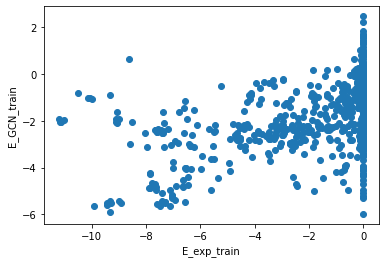

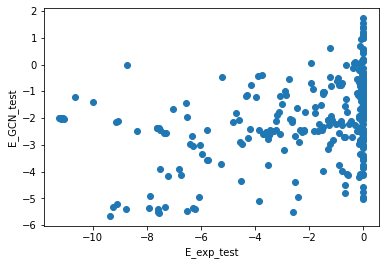

 13%|█▎        | 13/100 [01:24<09:30,  6.55s/it]

INFO:__main__:13. time: 6.54 loss: 5.721 rmse: (2.3738741074322642, 2.676054857669629) r2: (0.24382250692459306, 0.1544005487441028)


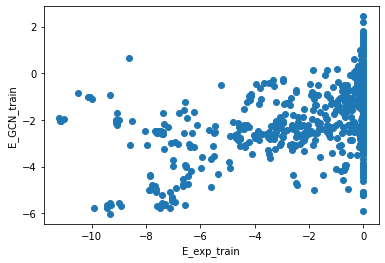

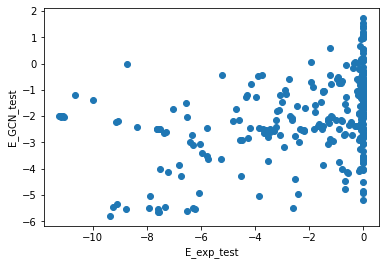

 14%|█▍        | 14/100 [01:31<09:29,  6.63s/it]

INFO:__main__:14. time: 6.21 loss: 5.594 rmse: (2.358799688757206, 2.6617363578460815) r2: (0.25339567148441067, 0.16342526943387103)


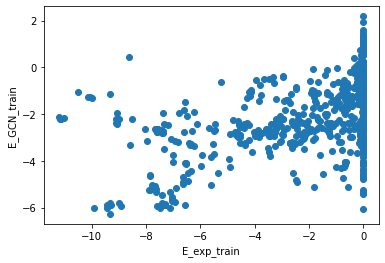

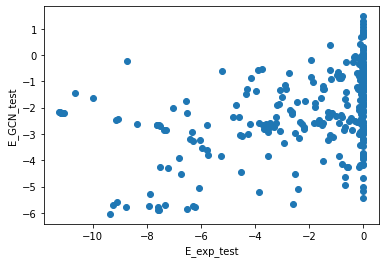

 15%|█▌        | 15/100 [01:37<09:22,  6.62s/it]

INFO:__main__:15. time: 6.17 loss: 5.529 rmse: (2.347937525680639, 2.6432996742442567) r2: (0.2602559958477839, 0.17497430740329079)


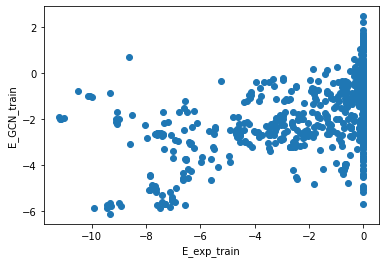

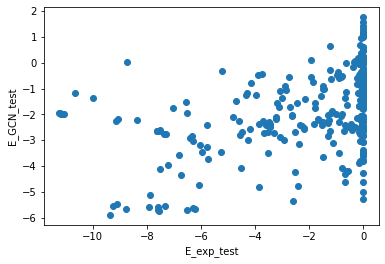

 16%|█▌        | 16/100 [01:44<09:10,  6.56s/it]

INFO:__main__:16. time: 5.87 loss: 5.505 rmse: (2.33454095329536, 2.6366555265700753) r2: (0.2686733938959819, 0.17911663252570975)


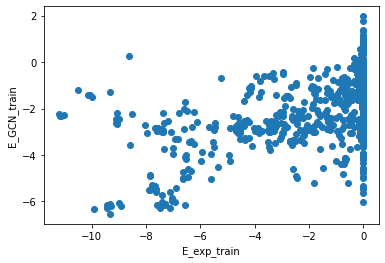

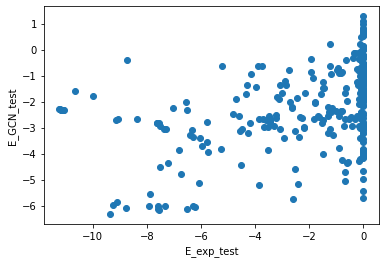

 17%|█▋        | 17/100 [01:50<08:52,  6.42s/it]

INFO:__main__:17. time: 6.2 loss: 5.401 rmse: (2.314611615099724, 2.612655086899955) r2: (0.28110636875183126, 0.1939929739745203)


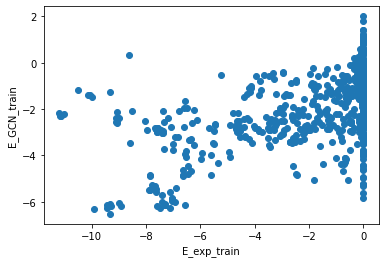

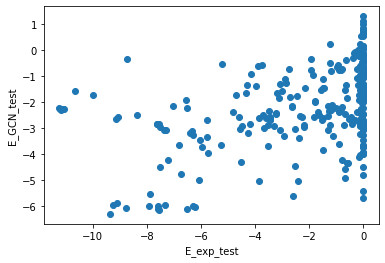

 18%|█▊        | 18/100 [01:56<08:46,  6.42s/it]

INFO:__main__:18. time: 6.13 loss: 5.358 rmse: (2.304492792482736, 2.5917610875055237) r2: (0.2873782256622156, 0.20683306977943605)


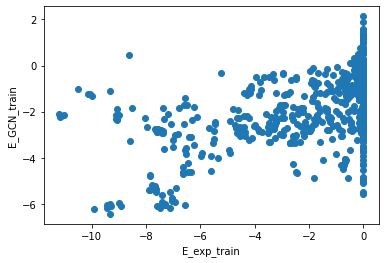

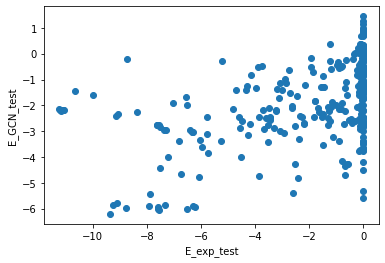

 19%|█▉        | 19/100 [02:02<08:38,  6.40s/it]

INFO:__main__:19. time: 6.37 loss: 5.304 rmse: (2.291794109659034, 2.582756145958917) r2: (0.2952102528335744, 0.21233513082027222)


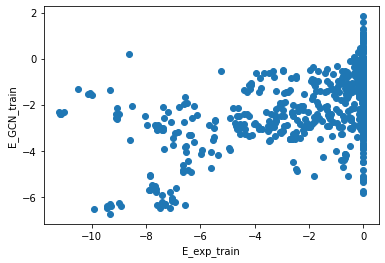

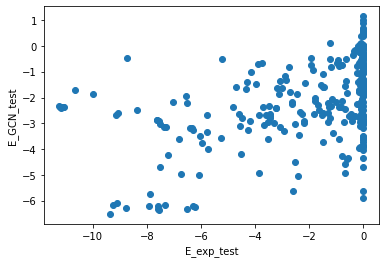

 20%|██        | 20/100 [02:09<08:37,  6.47s/it]

INFO:__main__:20. time: 6.24 loss: 5.298 rmse: (2.2815693963927357, 2.5694179490168905) r2: (0.3014849856746875, 0.22044964126800193)


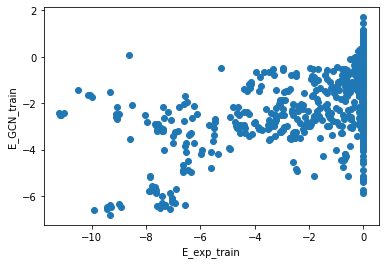

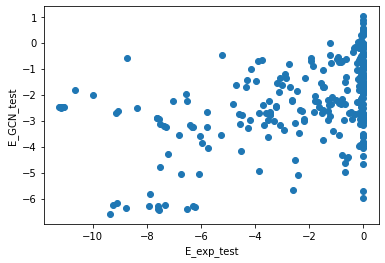

 21%|██        | 21/100 [02:16<08:31,  6.48s/it]

INFO:__main__:21. time: 6.37 loss: 5.204 rmse: (2.268398794455526, 2.5489375886119867) r2: (0.3095262134550719, 0.23282741996083722)


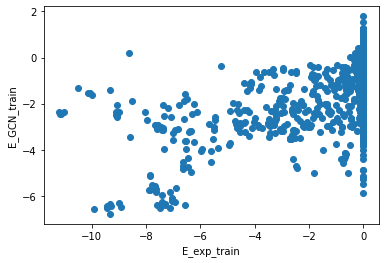

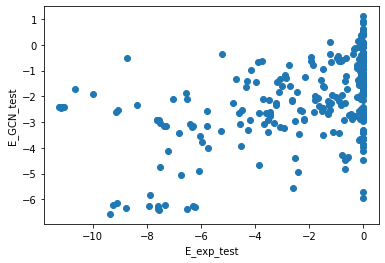

 22%|██▏       | 22/100 [02:22<08:29,  6.53s/it]

INFO:__main__:22. time: 6.54 loss: 5.182 rmse: (2.2592489664809663, 2.534935107126339) r2: (0.3150851784770442, 0.24123312879805425)


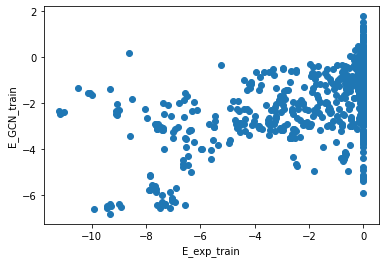

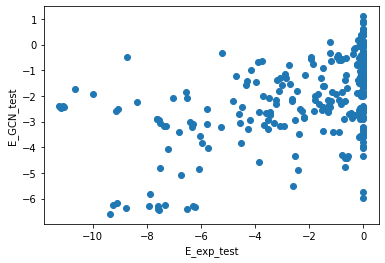

 23%|██▎       | 23/100 [02:29<08:28,  6.61s/it]

INFO:__main__:23. time: 6.27 loss: 5.105 rmse: (2.2504965525755845, 2.520892545574627) r2: (0.32038166977432625, 0.2496163951667273)


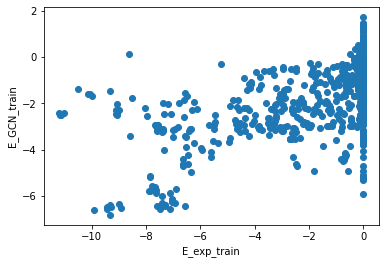

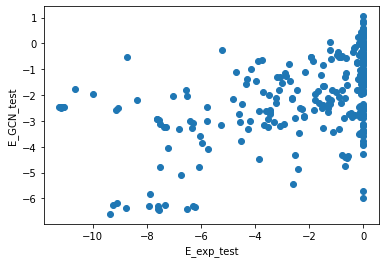

 24%|██▍       | 24/100 [02:36<08:19,  6.58s/it]

INFO:__main__:24. time: 6.42 loss: 5.049 rmse: (2.2413779516182273, 2.511965234803165) r2: (0.3258778909993262, 0.25492169556976474)


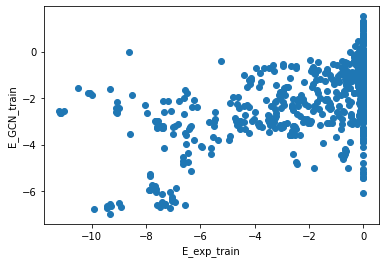

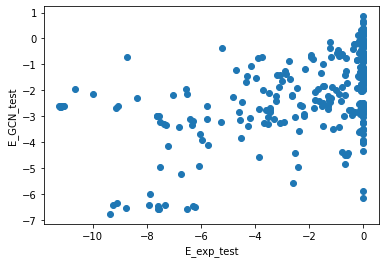

 25%|██▌       | 25/100 [02:42<08:15,  6.60s/it]

INFO:__main__:25. time: 6.83 loss: 5.076 rmse: (2.234152664154588, 2.501799784293416) r2: (0.33021707476216433, 0.26093987697931753)


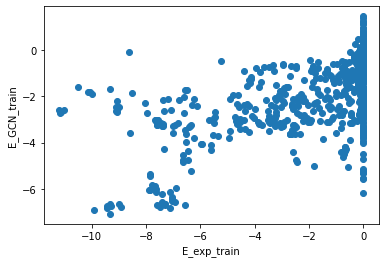

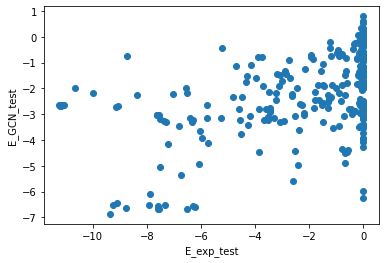

 26%|██▌       | 26/100 [02:49<08:19,  6.75s/it]

INFO:__main__:26. time: 6.29 loss: 5.002 rmse: (2.225115955660869, 2.4866717501969853) r2: (0.335624397449389, 0.26985084041295004)


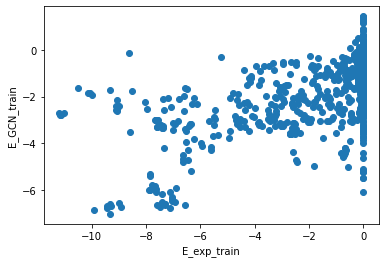

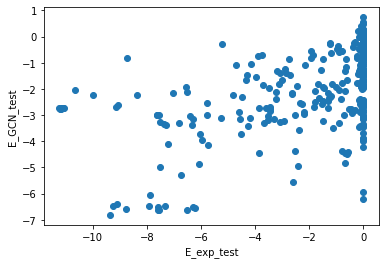

 27%|██▋       | 27/100 [02:56<08:07,  6.68s/it]

INFO:__main__:27. time: 6.62 loss: 4.938 rmse: (2.2179195689091706, 2.4749496772371535) r2: (0.3399148456291671, 0.27671840437717177)


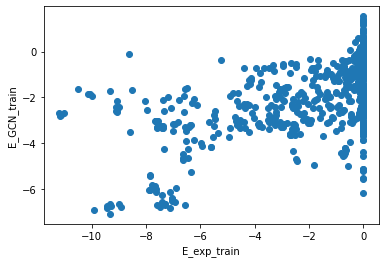

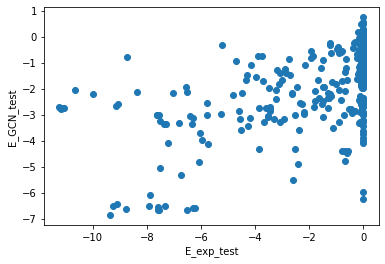

 28%|██▊       | 28/100 [03:03<08:05,  6.74s/it]

INFO:__main__:28. time: 6.32 loss: 4.937 rmse: (2.211556645008513, 2.4681496913486263) r2: (0.34369681043380673, 0.2806874128031439)


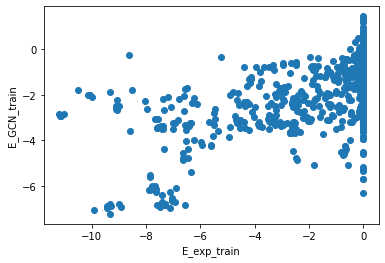

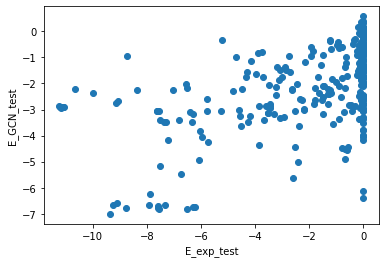

 29%|██▉       | 29/100 [03:09<07:54,  6.69s/it]

INFO:__main__:29. time: 6.13 loss: 4.896 rmse: (2.2095403300119605, 2.4646836573789397) r2: (0.3448929911620855, 0.28270626222013195)


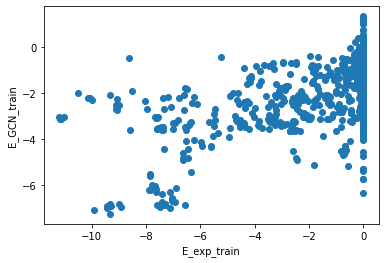

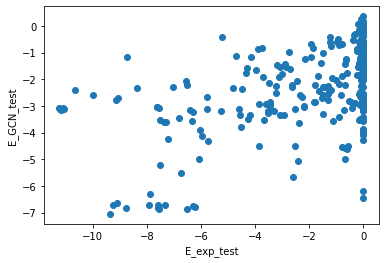

 30%|███       | 30/100 [03:16<07:41,  6.59s/it]

INFO:__main__:30. time: 6.51 loss: 4.865 rmse: (2.198258303943437, 2.444444121170978) r2: (0.35156593123619584, 0.2944384650138049)


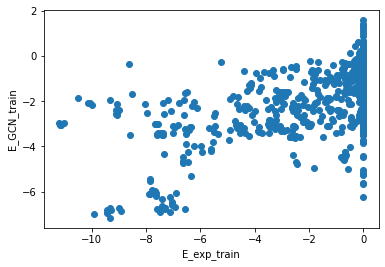

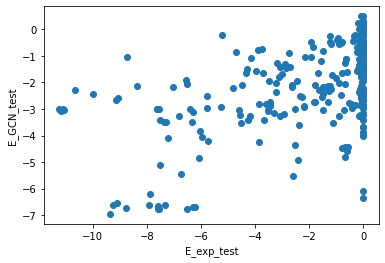

 31%|███       | 31/100 [03:22<07:38,  6.65s/it]

INFO:__main__:31. time: 6.11 loss: 4.867 rmse: (2.2000839942350647, 2.433604247964157) r2: (0.3504884132926952, 0.30068220735913065)


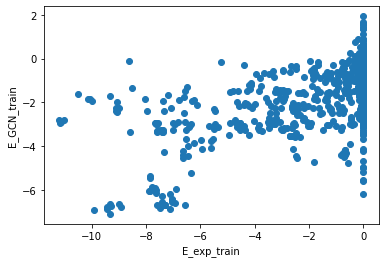

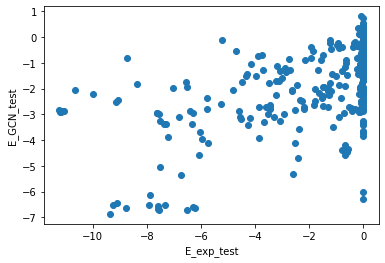

 32%|███▏      | 32/100 [03:29<07:25,  6.55s/it]

INFO:__main__:32. time: 6.36 loss: 4.893 rmse: (2.19367143704257, 2.4237742074726993) r2: (0.3542691419623625, 0.3063202962333974)


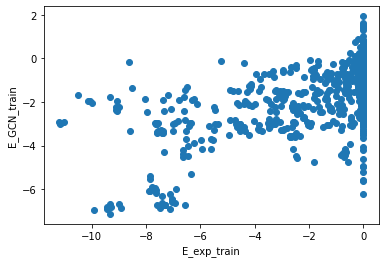

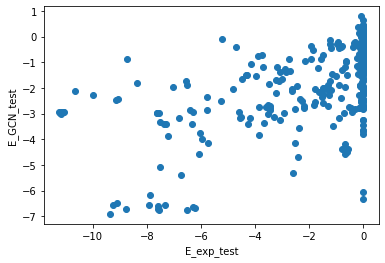

 33%|███▎      | 33/100 [03:35<07:20,  6.57s/it]

INFO:__main__:33. time: 6.47 loss: 4.791 rmse: (2.1872491876986135, 2.4310343837896577) r2: (0.3580445241931679, 0.3021583741231978)


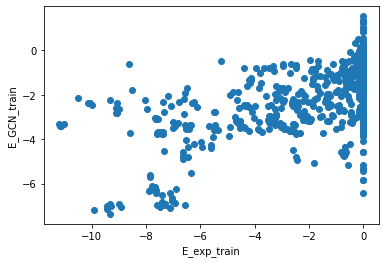

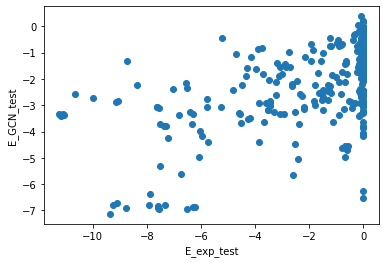

 34%|███▍      | 34/100 [03:42<07:19,  6.65s/it]

INFO:__main__:34. time: 6.48 loss: 4.75 rmse: (2.1874891243351278, 2.4089127719067465) r2: (0.3579036741365468, 0.31480084776554296)


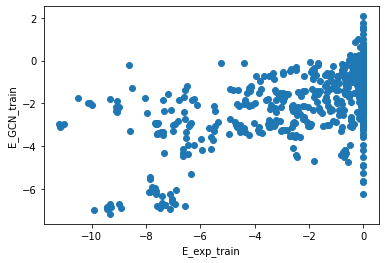

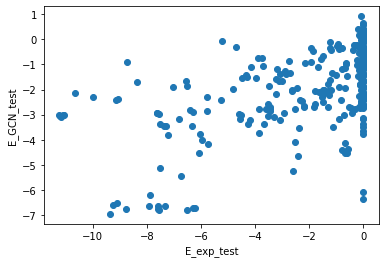

 35%|███▌      | 35/100 [03:49<07:13,  6.67s/it]

INFO:__main__:35. time: 6.24 loss: 4.79 rmse: (2.173483532639417, 2.406008400463968) r2: (0.3660995091035971, 0.3164521098458736)


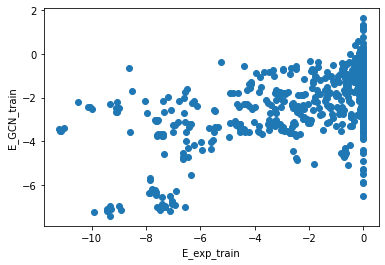

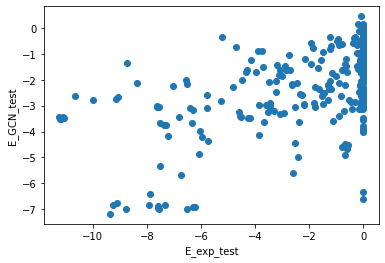

 36%|███▌      | 36/100 [03:55<07:03,  6.61s/it]

INFO:__main__:36. time: 6.33 loss: 4.736 rmse: (2.173524195953204, 2.4074560308803736) r2: (0.3660757898204209, 0.3156293177044629)


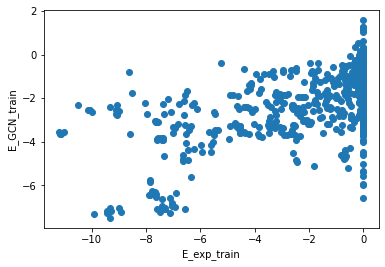

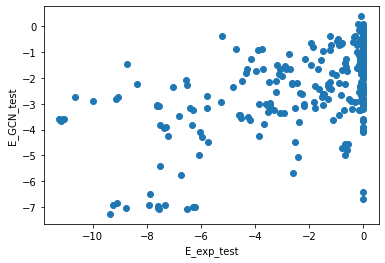

 37%|███▋      | 37/100 [04:02<06:55,  6.60s/it]

INFO:__main__:37. time: 6.5 loss: 4.765 rmse: (2.1821698040846025, 2.42117921000477) r2: (0.36102265031209646, 0.30780486805399043)


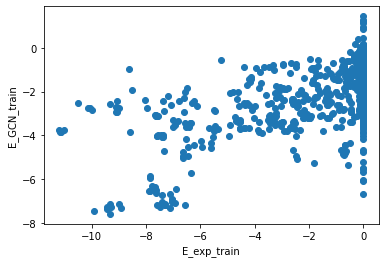

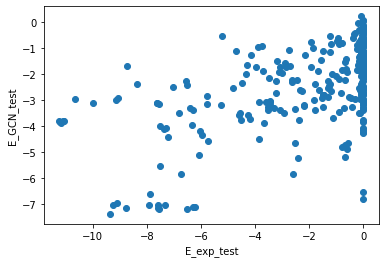

 38%|███▊      | 38/100 [04:09<06:51,  6.64s/it]

INFO:__main__:38. time: 6.18 loss: 4.685 rmse: (2.160950094294114, 2.3758896615593104) r2: (0.37338923109371336, 0.3334584854210051)


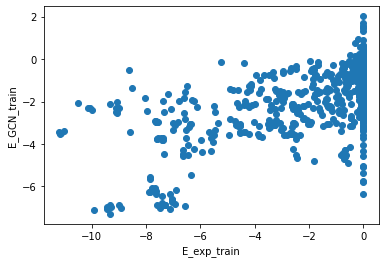

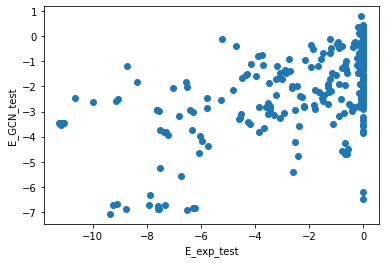

 39%|███▉      | 39/100 [04:15<06:40,  6.57s/it]

INFO:__main__:39. time: 7.05 loss: 4.709 rmse: (2.1545618047803177, 2.368298886464826) r2: (0.37708857995055167, 0.33771077403273897)


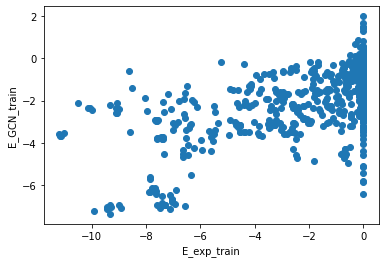

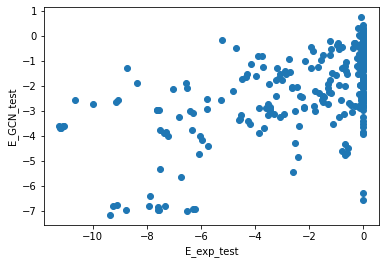

 40%|████      | 40/100 [04:22<06:47,  6.79s/it]

INFO:__main__:40. time: 6.01 loss: 4.674 rmse: (2.1503726384541424, 2.3575092655595107) r2: (0.3795085084040899, 0.3437316120268703)


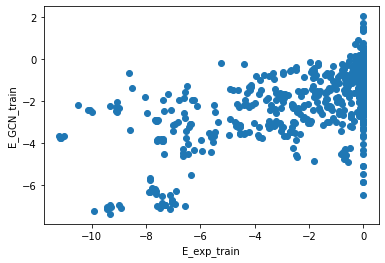

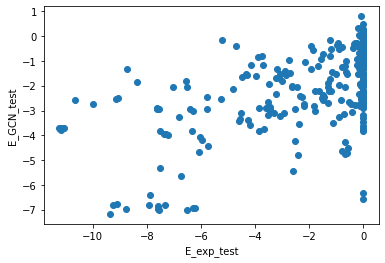

 41%|████      | 41/100 [04:29<06:30,  6.63s/it]

INFO:__main__:41. time: 6.11 loss: 4.642 rmse: (2.14666960635496, 2.360228450602656) r2: (0.3816436932568613, 0.3422168401838317)


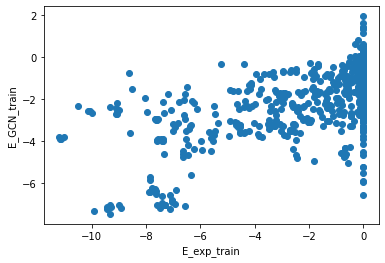

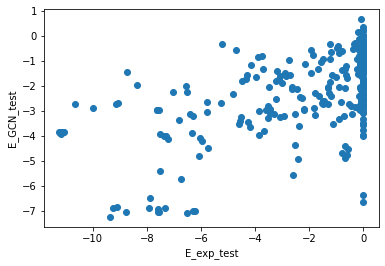

 42%|████▏     | 42/100 [04:35<06:19,  6.54s/it]

INFO:__main__:42. time: 7.29 loss: 4.615 rmse: (2.142470017931266, 2.351681907312488) r2: (0.38406074136091806, 0.34697196788763407)


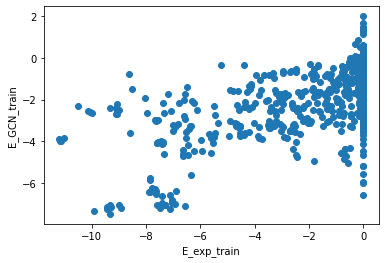

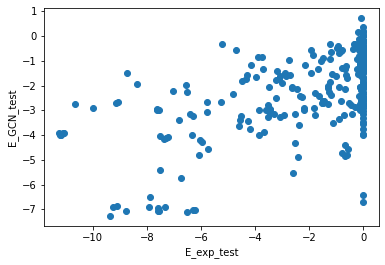

 43%|████▎     | 43/100 [04:43<06:29,  6.84s/it]

INFO:__main__:43. time: 7.18 loss: 4.628 rmse: (2.140790321241786, 2.3391742981611414) r2: (0.3850261556399789, 0.35389985959220593)


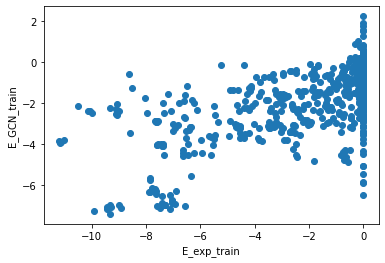

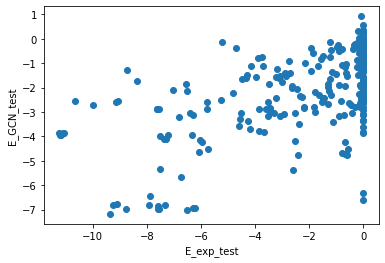

 44%|████▍     | 44/100 [04:50<06:33,  7.02s/it]

INFO:__main__:44. time: 7.54 loss: 4.619 rmse: (2.1468462169476297, 2.3611898431922307) r2: (0.3815419423717903, 0.34168086100723616)


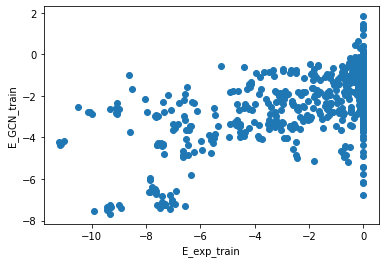

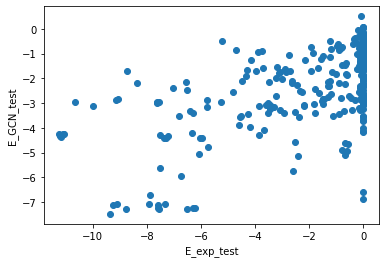

 45%|████▌     | 45/100 [04:58<06:39,  7.26s/it]

INFO:__main__:45. time: 6.94 loss: 4.653 rmse: (2.1428176502758296, 2.355600515379059) r2: (0.3838608433197376, 0.3447938732185132)


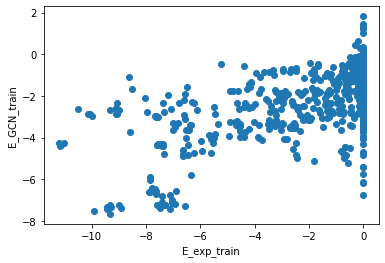

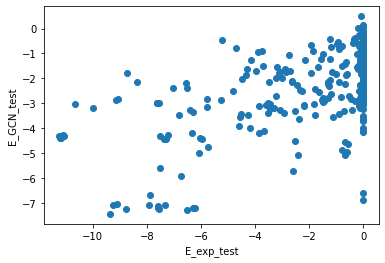

 46%|████▌     | 46/100 [05:05<06:30,  7.24s/it]

INFO:__main__:46. time: 6.36 loss: 4.603 rmse: (2.12975008670047, 2.3281396608615013) r2: (0.39135274308457635, 0.3599812060637231)


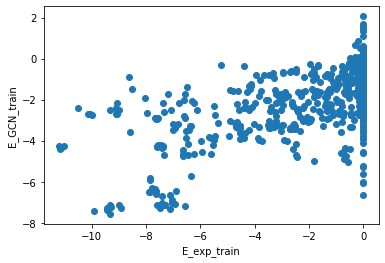

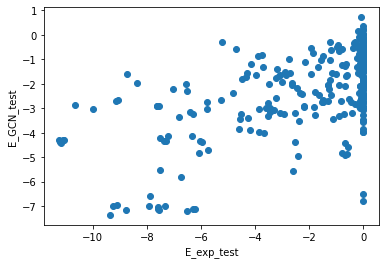

 47%|████▋     | 47/100 [05:12<06:13,  7.04s/it]

INFO:__main__:47. time: 6.73 loss: 4.576 rmse: (2.125982990179787, 2.317496813693494) r2: (0.39350398627466276, 0.3658193892390802)


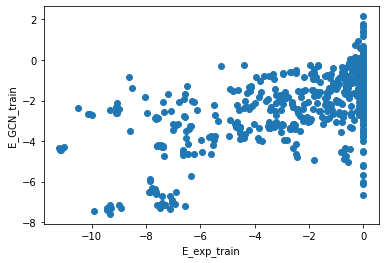

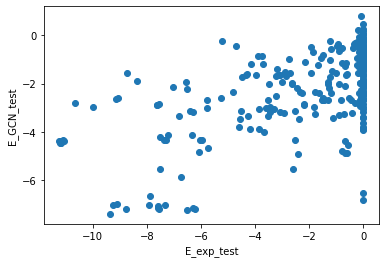

 48%|████▊     | 48/100 [05:19<06:05,  7.02s/it]

INFO:__main__:48. time: 7.73 loss: 4.539 rmse: (2.1238370982913253, 2.309455646142471) r2: (0.3947277195321135, 0.3702126685705931)


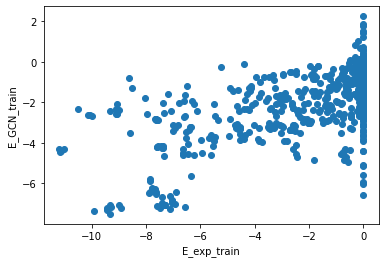

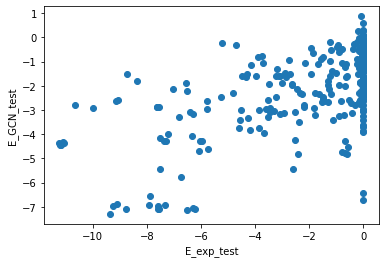

 49%|████▉     | 49/100 [05:27<06:13,  7.33s/it]

INFO:__main__:49. time: 7.61 loss: 4.585 rmse: (2.1281308455195744, 2.3017389925176377) r2: (0.39227789581063244, 0.3744142920305563)


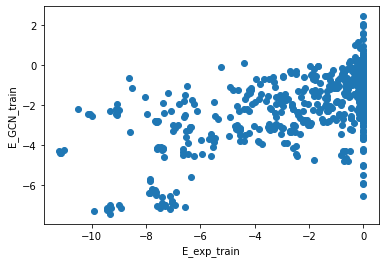

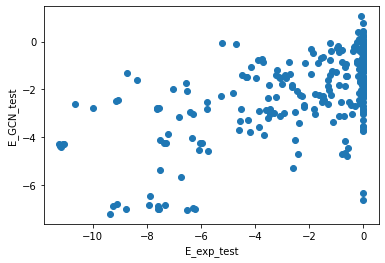

 50%|█████     | 50/100 [05:34<06:14,  7.48s/it]

INFO:__main__:50. time: 7.62 loss: 4.538 rmse: (2.118489031513884, 2.2996141223607505) r2: (0.39777217238713714, 0.37556878855144393)


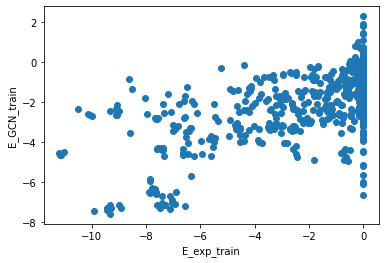

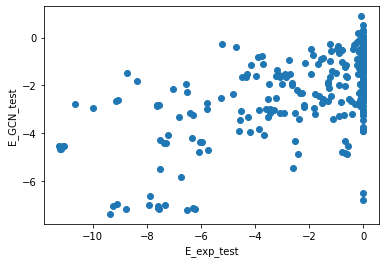

 51%|█████     | 51/100 [05:42<06:12,  7.60s/it]

INFO:__main__:51. time: 6.82 loss: 4.491 rmse: (2.119792857007495, 2.291000902154739) r2: (0.3970306612356974, 0.3802376511463278)


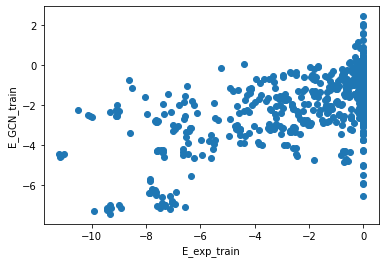

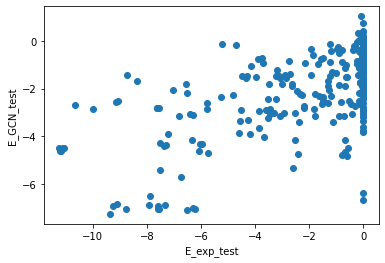

 52%|█████▏    | 52/100 [05:49<05:56,  7.43s/it]

INFO:__main__:52. time: 6.34 loss: 4.504 rmse: (2.1202831747655235, 2.3096890315045484) r2: (0.3967516898583141, 0.3700853740097131)


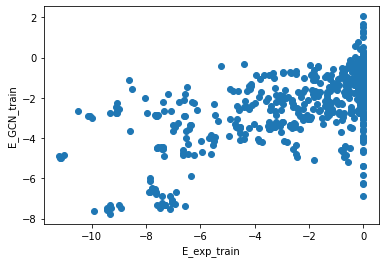

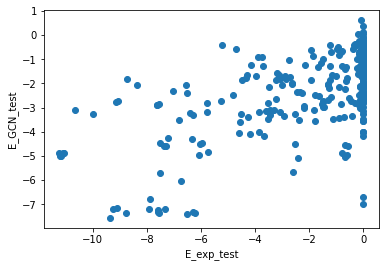

 53%|█████▎    | 53/100 [05:56<05:38,  7.21s/it]

INFO:__main__:53. time: 6.88 loss: 4.54 rmse: (2.1124412167501014, 2.2824555122332812) r2: (0.4012057172499003, 0.384852432160121)


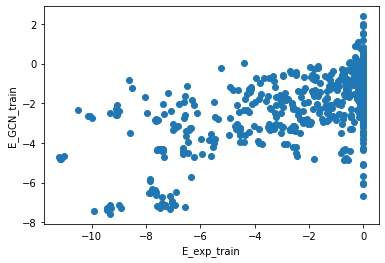

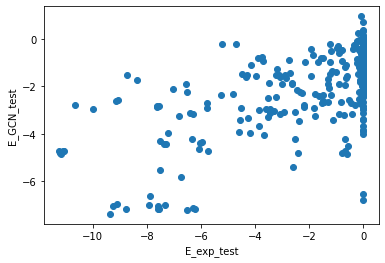

 54%|█████▍    | 54/100 [06:03<05:30,  7.19s/it]

INFO:__main__:54. time: 6.91 loss: 4.509 rmse: (2.1115815054099176, 2.2924720425392717) r2: (0.40169300700526767, 0.3794414487906457)


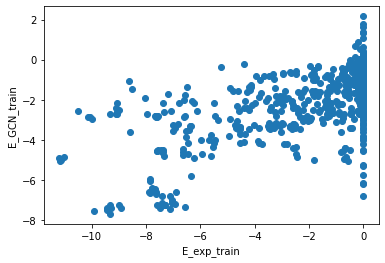

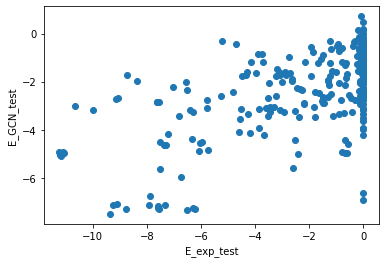

 55%|█████▌    | 55/100 [06:10<05:23,  7.18s/it]

INFO:__main__:55. time: 6.73 loss: 4.487 rmse: (2.107146644659954, 2.2763709106033376) r2: (0.4042035629797709, 0.3881277984481366)


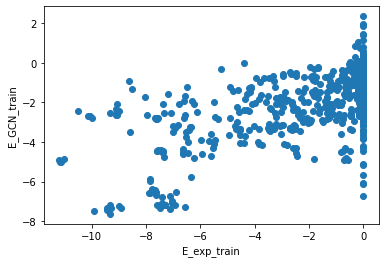

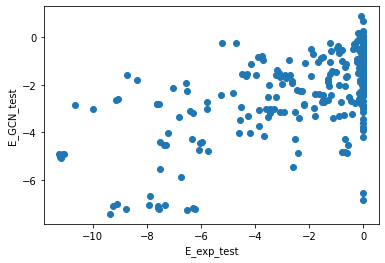

 56%|█████▌    | 56/100 [06:17<05:12,  7.11s/it]

INFO:__main__:56. time: 6.54 loss: 4.475 rmse: (2.105019848421106, 2.274115265317471) r2: (0.40540566075270756, 0.3893398002710561)


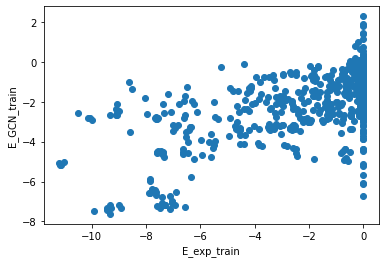

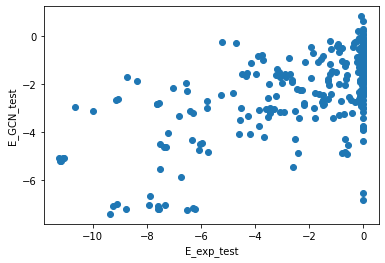

 57%|█████▋    | 57/100 [06:24<05:01,  7.01s/it]

INFO:__main__:57. time: 6.03 loss: 4.501 rmse: (2.1223957251742434, 2.3082663848209775) r2: (0.39554899452811165, 0.37086112343056177)


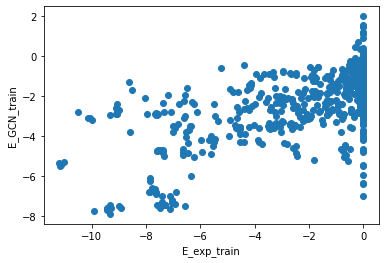

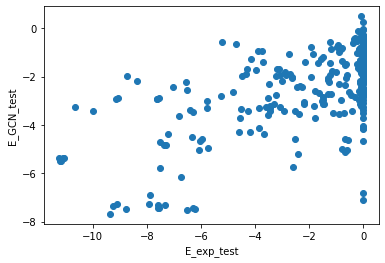

 58%|█████▊    | 58/100 [06:30<04:44,  6.78s/it]

INFO:__main__:58. time: 6.17 loss: 4.446 rmse: (2.108910217554987, 2.259577282636463) r2: (0.4032058439520003, 0.3971225108579204)


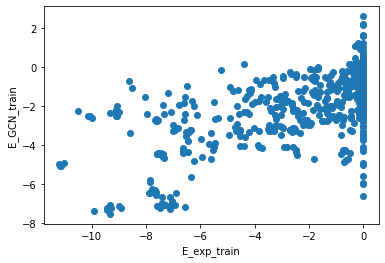

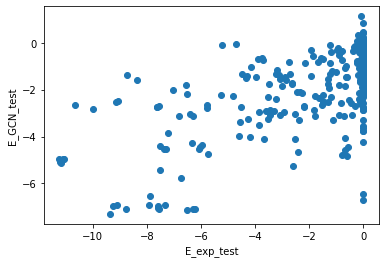

 59%|█████▉    | 59/100 [06:37<04:33,  6.67s/it]

INFO:__main__:59. time: 6.02 loss: 4.528 rmse: (2.1110916835115057, 2.2860105300410254) r2: (0.4019705524142363, 0.38293470486273473)


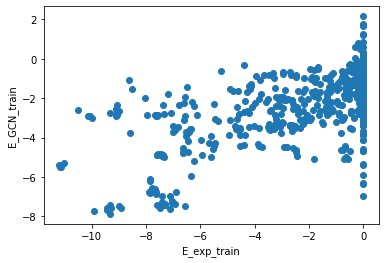

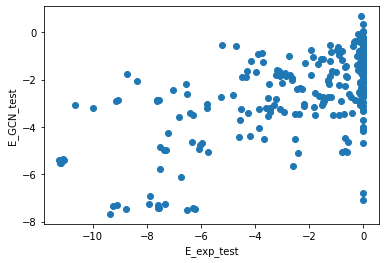

 60%|██████    | 60/100 [06:43<04:21,  6.54s/it]

INFO:__main__:60. time: 5.97 loss: 4.472 rmse: (2.1081992414163335, 2.2839131669826687) r2: (0.40360817011835315, 0.384066472396966)


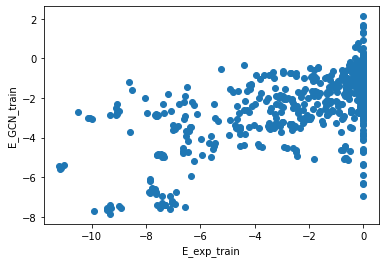

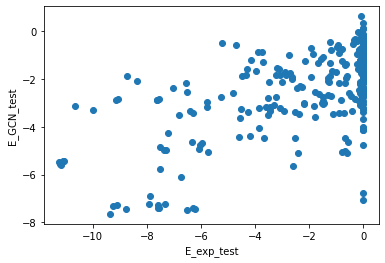

 61%|██████    | 61/100 [06:49<04:11,  6.44s/it]

INFO:__main__:61. time: 6.05 loss: 4.443 rmse: (2.0967019628576216, 2.2566122325148297) r2: (0.4100953991337388, 0.39870368195027384)


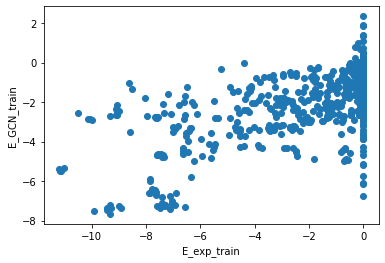

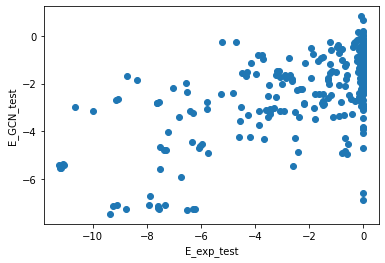

 62%|██████▏   | 62/100 [06:55<04:02,  6.39s/it]

INFO:__main__:62. time: 6.32 loss: 4.491 rmse: (2.127401363894985, 2.3081656778194564) r2: (0.392694454903061, 0.3709160194409036)


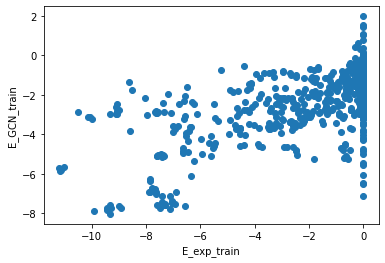

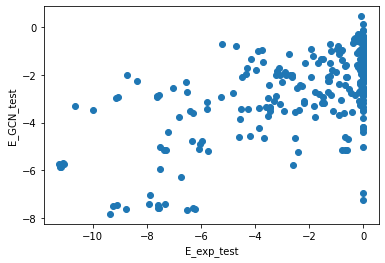

 63%|██████▎   | 63/100 [07:02<03:59,  6.47s/it]

INFO:__main__:63. time: 5.95 loss: 4.487 rmse: (2.113708102332205, 2.2876426718965814) r2: (0.40048727707309584, 0.3820532586790717)


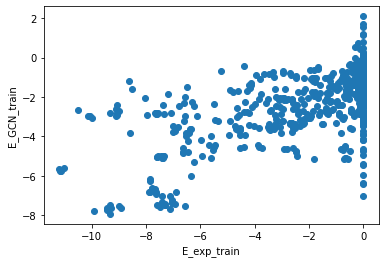

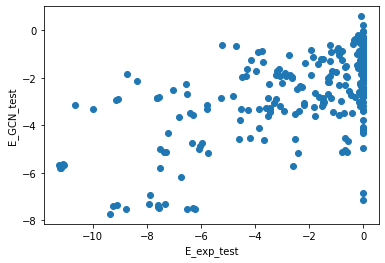

 64%|██████▍   | 64/100 [07:08<03:49,  6.38s/it]

INFO:__main__:64. time: 6.03 loss: 4.435 rmse: (2.092454028775078, 2.2480474264157015) r2: (0.4124832801412107, 0.4032593722018035)


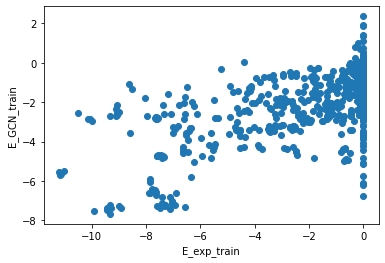

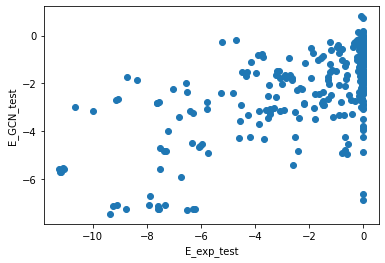

 65%|██████▌   | 65/100 [07:15<03:42,  6.35s/it]

INFO:__main__:65. time: 6.55 loss: 4.428 rmse: (2.0916226306304413, 2.241128710374824) r2: (0.4129500653262187, 0.40692684431928117)


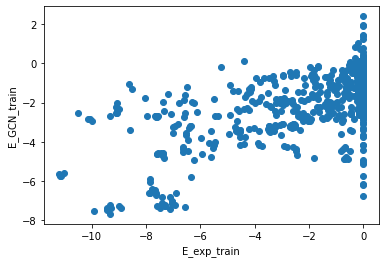

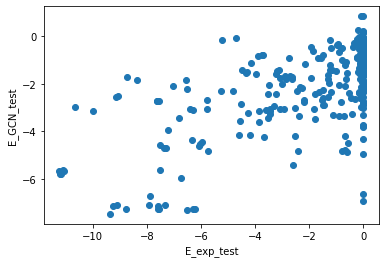

 66%|██████▌   | 66/100 [07:21<03:40,  6.48s/it]

INFO:__main__:66. time: 6.95 loss: 4.415 rmse: (2.090324642816168, 2.2393347836333524) r2: (0.41367844454742464, 0.4078759232131227)


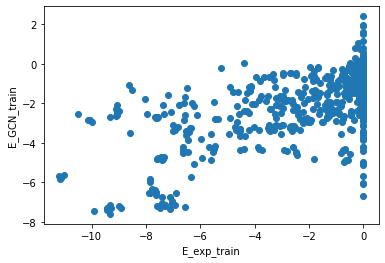

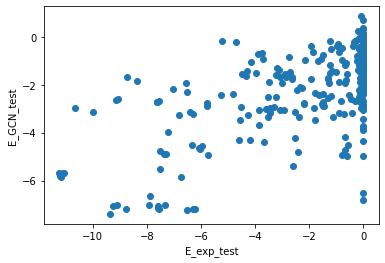

 67%|██████▋   | 67/100 [07:28<03:40,  6.69s/it]

INFO:__main__:67. time: 6.77 loss: 4.398 rmse: (2.090622514042106, 2.228881509408241) r2: (0.4135113310181381, 0.41339112237316056)


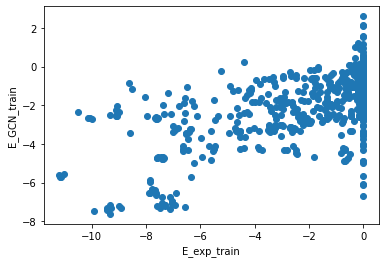

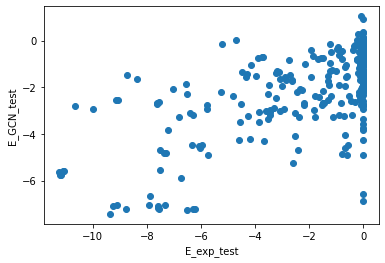

 68%|██████▊   | 68/100 [07:35<03:37,  6.78s/it]

INFO:__main__:68. time: 6.28 loss: 4.391 rmse: (2.0889700927019716, 2.2436990000531414) r2: (0.4144380821543834, 0.4055657052355244)


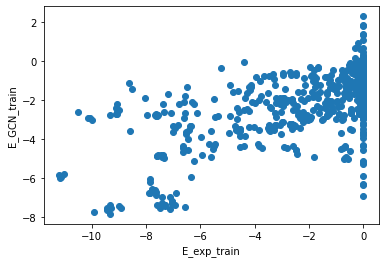

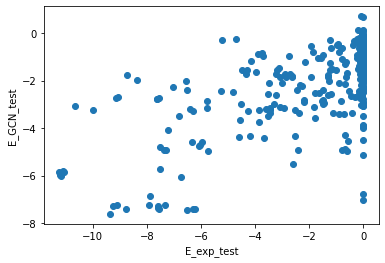

 69%|██████▉   | 69/100 [07:42<03:27,  6.70s/it]

INFO:__main__:69. time: 6.77 loss: 4.39 rmse: (2.1042552249960407, 2.228308634478864) r2: (0.4058375409453012, 0.4136926281563058)


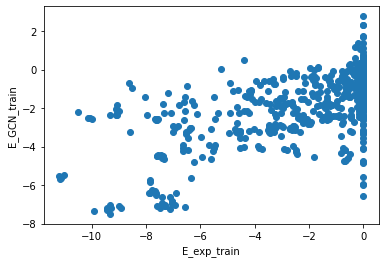

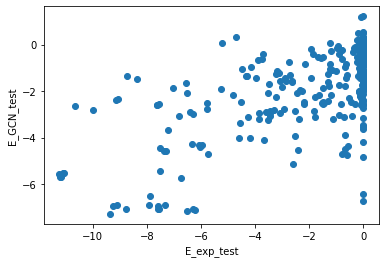

 70%|███████   | 70/100 [07:49<03:23,  6.79s/it]

INFO:__main__:70. time: 6.09 loss: 4.409 rmse: (2.0853449583486454, 2.2340421915966746) r2: (0.416468650961897, 0.41067154608928447)


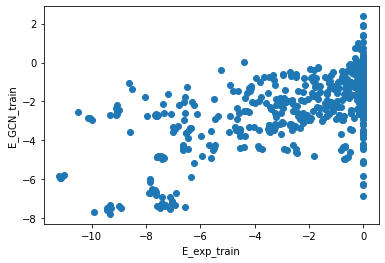

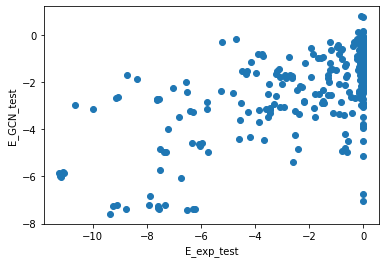

 71%|███████   | 71/100 [07:55<03:12,  6.65s/it]

INFO:__main__:71. time: 6.18 loss: 4.41 rmse: (2.0846519892151774, 2.2209362838995013) r2: (0.4168564064983209, 0.417565801736279)


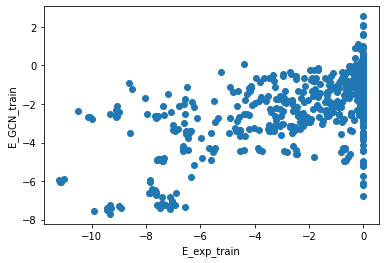

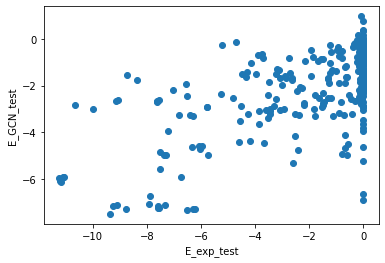

 72%|███████▏  | 72/100 [08:02<03:04,  6.58s/it]

INFO:__main__:72. time: 6.25 loss: 4.367 rmse: (2.083682323882468, 2.2316180223816624) r2: (0.4173987729177241, 0.4119498180873953)


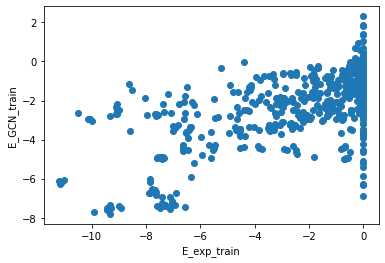

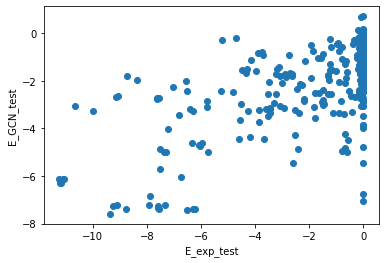

 73%|███████▎  | 73/100 [08:08<02:57,  6.58s/it]

INFO:__main__:73. time: 6.18 loss: 4.376 rmse: (2.083221508962963, 2.2153929017379186) r2: (0.41765643374031125, 0.42046964554380195)


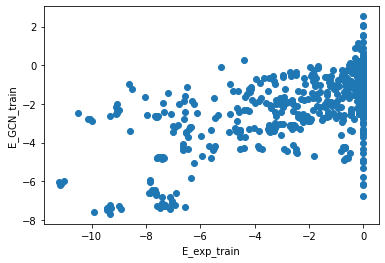

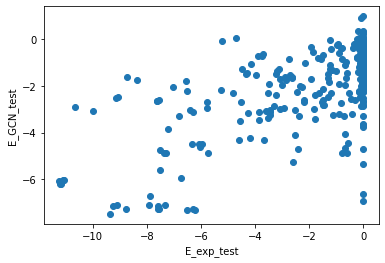

 74%|███████▍  | 74/100 [08:15<02:49,  6.53s/it]

INFO:__main__:74. time: 6.2 loss: 4.376 rmse: (2.0841914521029663, 2.232994339895535) r2: (0.41711403185081053, 0.411224251855451)


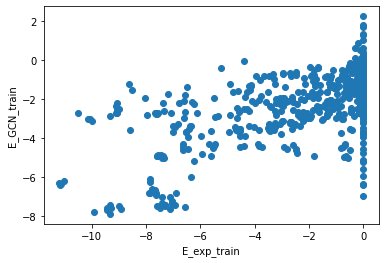

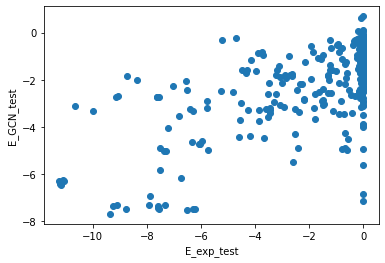

 75%|███████▌  | 75/100 [08:21<02:42,  6.50s/it]

INFO:__main__:75. time: 6.19 loss: 4.37 rmse: (2.080827750877631, 2.2113942031765284) r2: (0.418993966711674, 0.4225598172814835)


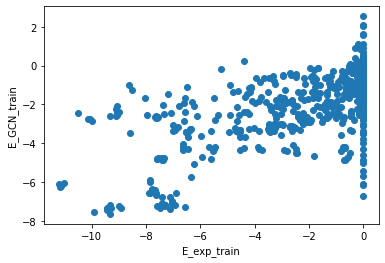

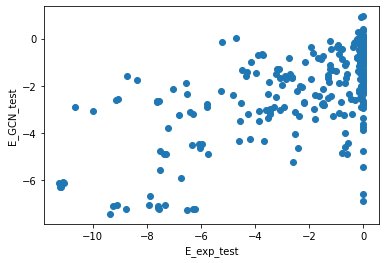

 76%|███████▌  | 76/100 [08:28<02:35,  6.47s/it]

INFO:__main__:76. time: 6.0 loss: 4.372 rmse: (2.090026423766498, 2.246195752646767) r2: (0.41384572936119735, 0.40424201507974844)


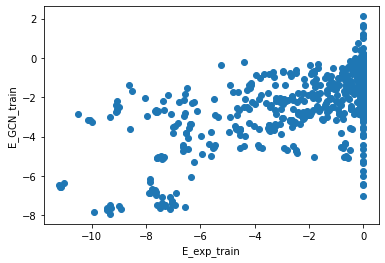

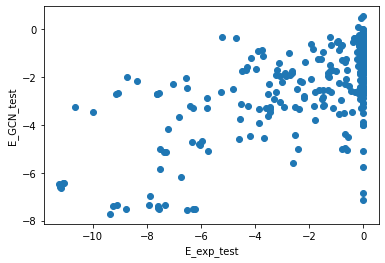

 77%|███████▋  | 77/100 [08:34<02:27,  6.40s/it]

INFO:__main__:77. time: 6.0 loss: 4.353 rmse: (2.0791285789368734, 2.2195457008456856) r2: (0.4199424604740122, 0.4182949262730816)


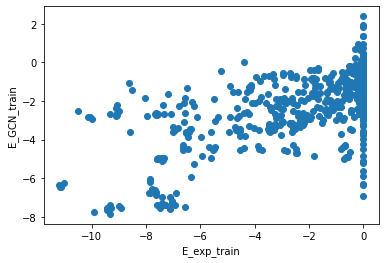

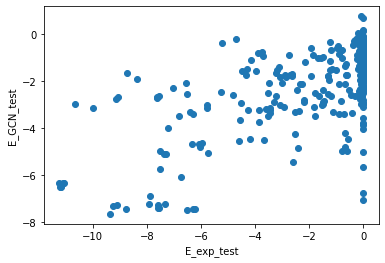

 78%|███████▊  | 78/100 [08:40<02:19,  6.35s/it]

INFO:__main__:78. time: 6.09 loss: 4.348 rmse: (2.0797340121063748, 2.2035710737584404) r2: (0.41960459083946156, 0.4266381483294017)


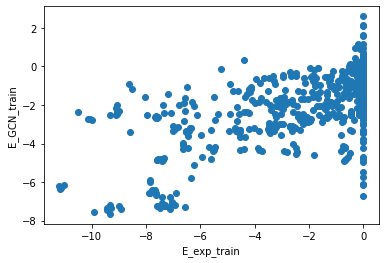

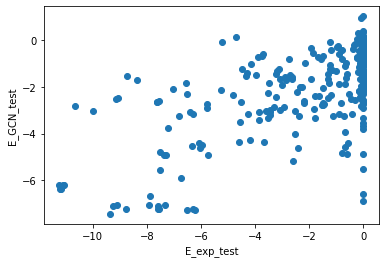

 79%|███████▉  | 79/100 [08:46<02:13,  6.34s/it]

INFO:__main__:79. time: 6.2 loss: 4.349 rmse: (2.089055380817973, 2.2036565138119566) r2: (0.41439026673332924, 0.42659368503289863)


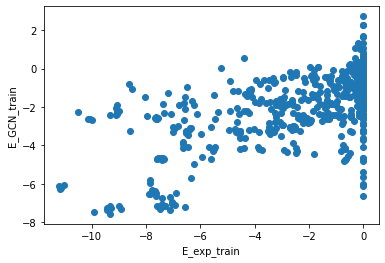

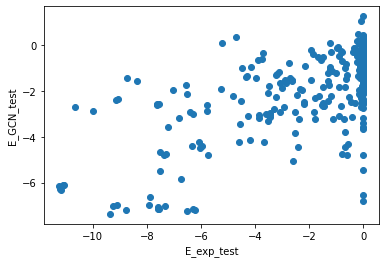

 80%|████████  | 80/100 [08:53<02:07,  6.37s/it]

INFO:__main__:80. time: 6.2 loss: 4.37 rmse: (2.0782448574022383, 2.2201598288973945) r2: (0.42043545586004694, 0.41797297676226053)


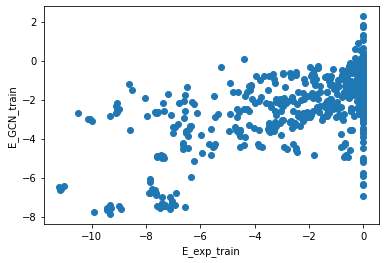

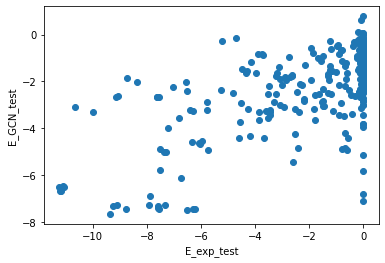

 81%|████████  | 81/100 [08:59<02:01,  6.39s/it]

INFO:__main__:81. time: 5.95 loss: 4.337 rmse: (2.0742064823923134, 2.209107815847709) r2: (0.42268564786625284, 0.4237532448510921)


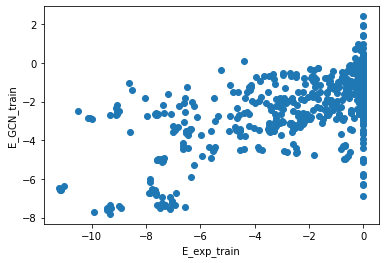

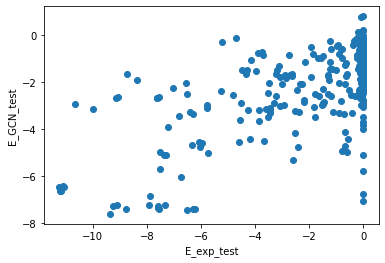

 82%|████████▏ | 82/100 [09:05<01:54,  6.34s/it]

INFO:__main__:82. time: 6.65 loss: 4.39 rmse: (2.091076143777268, 2.197926473059359) r2: (0.4132567871568401, 0.42957179872712814)


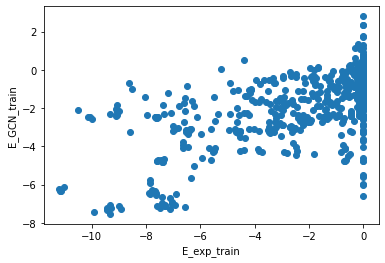

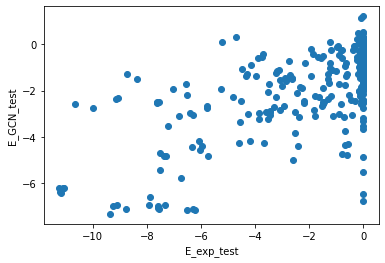

 83%|████████▎ | 83/100 [09:12<01:51,  6.54s/it]

INFO:__main__:83. time: 5.91 loss: 4.377 rmse: (2.0897541873106844, 2.1970198801155596) r2: (0.41399841850121955, 0.4300422780932408)


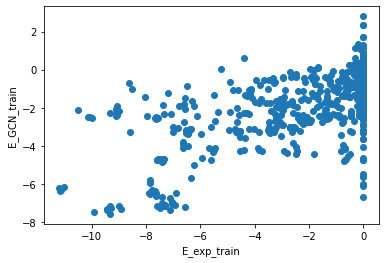

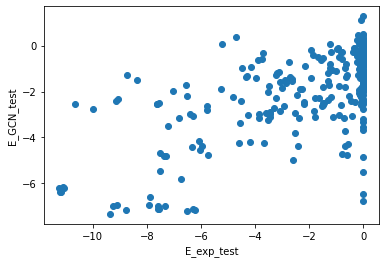

 84%|████████▍ | 84/100 [09:19<01:42,  6.42s/it]

INFO:__main__:84. time: 6.13 loss: 4.396 rmse: (2.0790181313573433, 2.1925212599728017) r2: (0.420004086532372, 0.43237398047165343)


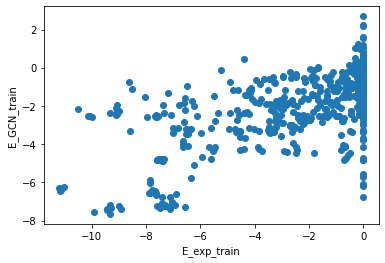

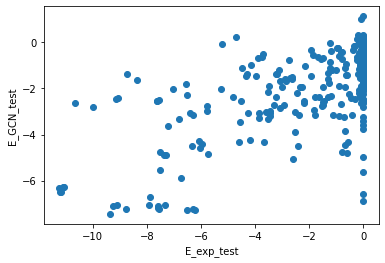

 85%|████████▌ | 85/100 [09:25<01:36,  6.40s/it]

INFO:__main__:85. time: 5.94 loss: 4.301 rmse: (2.0754681686239436, 2.2144993716762835) r2: (0.4219831034417937, 0.42093703294555596)


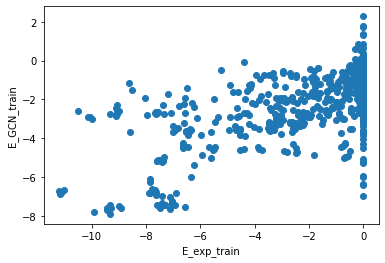

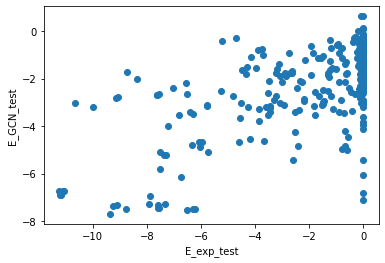

 86%|████████▌ | 86/100 [09:31<01:28,  6.33s/it]

INFO:__main__:86. time: 5.88 loss: 4.339 rmse: (2.069934165833062, 2.198363681900336) r2: (0.425061428242955, 0.42934483839829585)


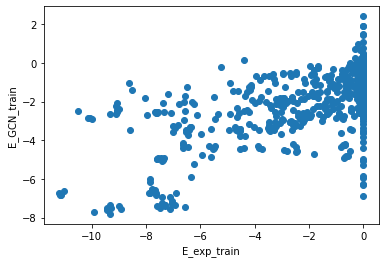

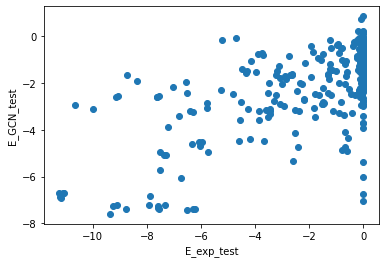

 87%|████████▋ | 87/100 [09:37<01:21,  6.26s/it]

INFO:__main__:87. time: 5.87 loss: 4.302 rmse: (2.072886389556571, 2.1891843023877673) r2: (0.42342025749291423, 0.43410048827630177)


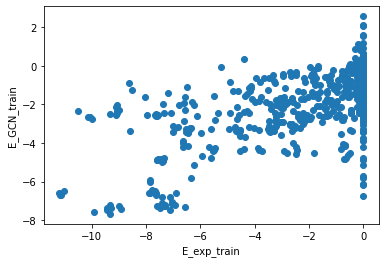

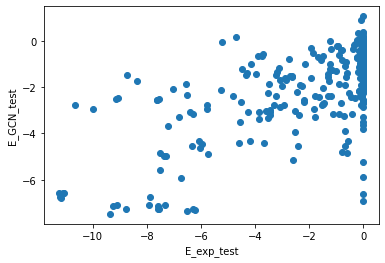

 88%|████████▊ | 88/100 [09:43<01:14,  6.21s/it]

INFO:__main__:88. time: 5.9 loss: 4.305 rmse: (2.073541267910698, 2.2097566076495205) r2: (0.4230558870770038, 0.4234147198883248)


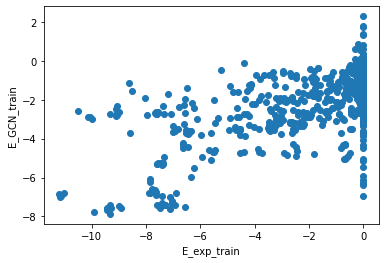

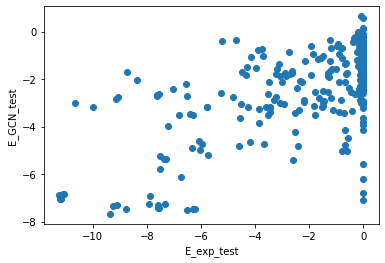

 89%|████████▉ | 89/100 [09:49<01:08,  6.19s/it]

INFO:__main__:89. time: 5.9 loss: 4.351 rmse: (2.0690295942246038, 2.2003151485247137) r2: (0.42556382052182407, 0.4283312583582035)


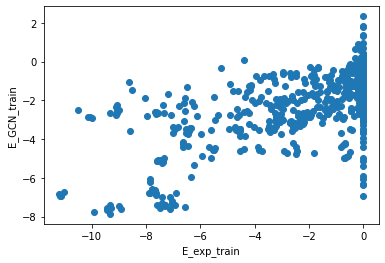

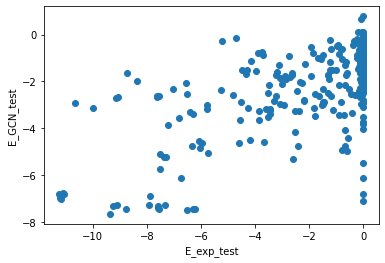

 90%|█████████ | 90/100 [09:56<01:01,  6.17s/it]

INFO:__main__:90. time: 5.95 loss: 4.342 rmse: (2.066742784823233, 2.1895137154411835) r2: (0.4268329179887711, 0.4339301703080378)


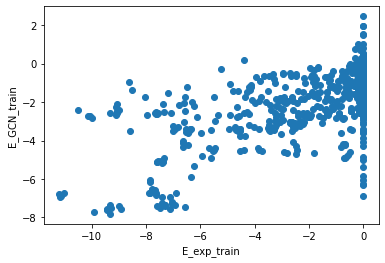

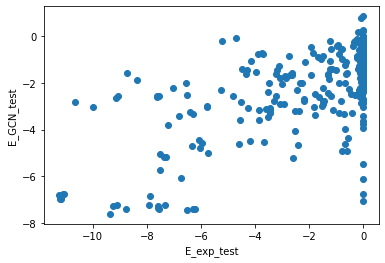

 91%|█████████ | 91/100 [10:02<00:55,  6.17s/it]

INFO:__main__:91. time: 5.91 loss: 4.351 rmse: (2.066627321706908, 2.188087805899912) r2: (0.4268969586708664, 0.4346672303544503)


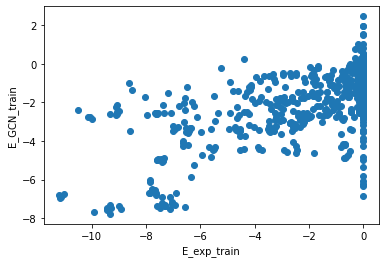

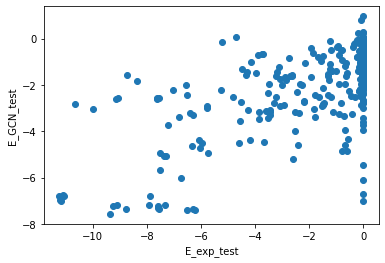

 92%|█████████▏| 92/100 [10:08<00:49,  6.16s/it]

INFO:__main__:92. time: 5.89 loss: 4.31 rmse: (2.080761358957746, 2.182581944703111) r2: (0.41903104185219564, 0.43750873204896135)


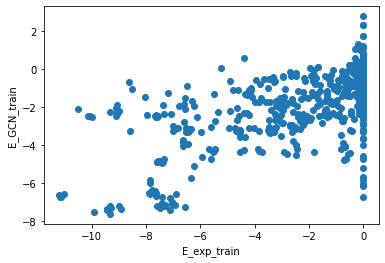

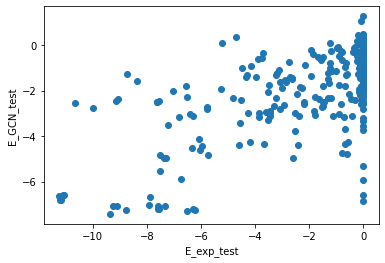

 93%|█████████▎| 93/100 [10:14<00:43,  6.18s/it]

INFO:__main__:93. time: 6.11 loss: 4.401 rmse: (2.0658777095975296, 2.1858261464783575) r2: (0.4273126379387314, 0.4358353090675401)


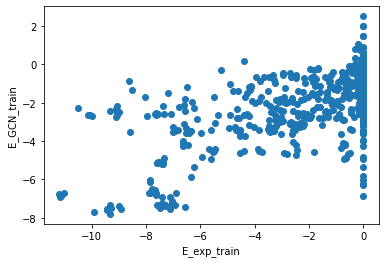

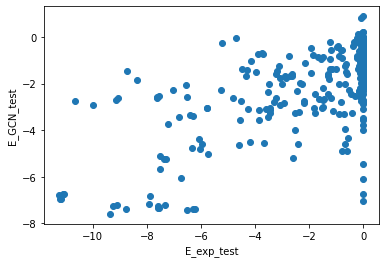

 94%|█████████▍| 94/100 [10:21<00:37,  6.25s/it]

INFO:__main__:94. time: 6.92 loss: 4.257 rmse: (2.0905623474478356, 2.1840851482094985) r2: (0.4135450879664023, 0.43673365918524487)


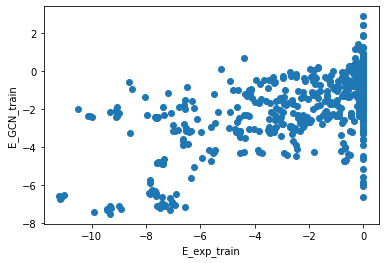

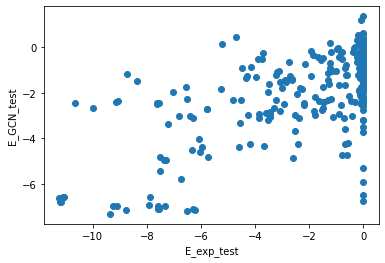

 95%|█████████▌| 95/100 [10:28<00:32,  6.52s/it]

INFO:__main__:95. time: 6.15 loss: 4.346 rmse: (2.064456667907792, 2.1887964172211096) r2: (0.42810022833378136, 0.4343010055009501)


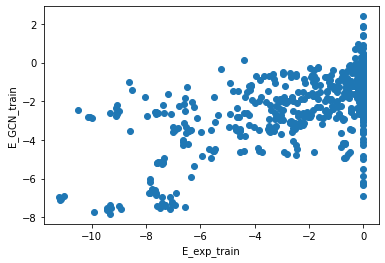

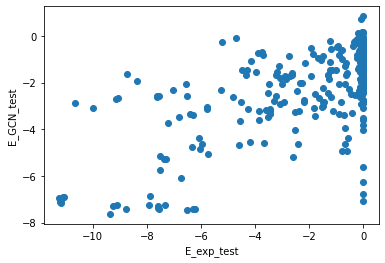

 96%|█████████▌| 96/100 [10:34<00:25,  6.47s/it]

INFO:__main__:96. time: 6.28 loss: 4.293 rmse: (2.0646904090002263, 2.178250447493405) r2: (0.4279707181851762, 0.43973912869026244)


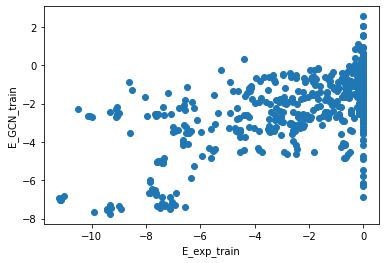

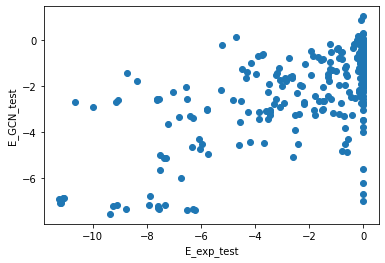

 97%|█████████▋| 97/100 [10:41<00:19,  6.48s/it]

INFO:__main__:97. time: 6.18 loss: 4.336 rmse: (2.0750511015717232, 2.1775871157077296) r2: (0.4222153860516026, 0.44008030365292294)


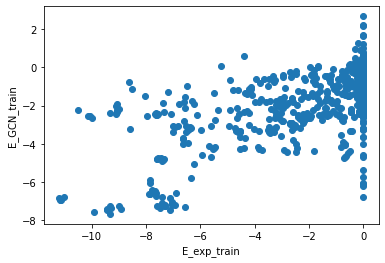

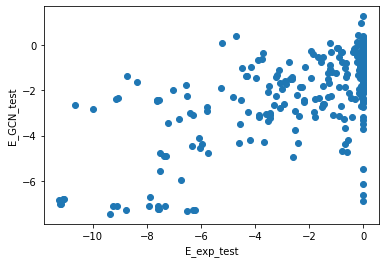

 98%|█████████▊| 98/100 [10:47<00:12,  6.46s/it]

INFO:__main__:98. time: 6.05 loss: 4.305 rmse: (2.063388798038576, 2.181712095067355) r2: (0.42869172206037, 0.4379569950119697)


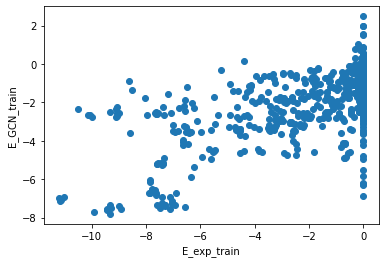

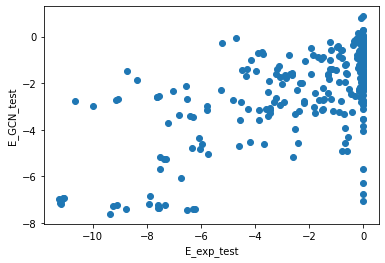

 99%|█████████▉| 99/100 [10:53<00:06,  6.40s/it]

INFO:__main__:99. time: 6.19 loss: 4.294 rmse: (2.06267910858354, 2.183633638157373) r2: (0.42908465017414865, 0.43696652018667803)


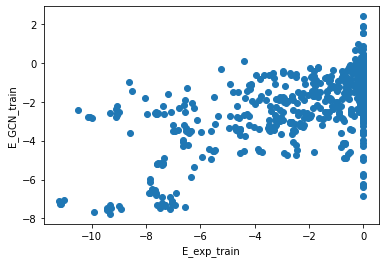

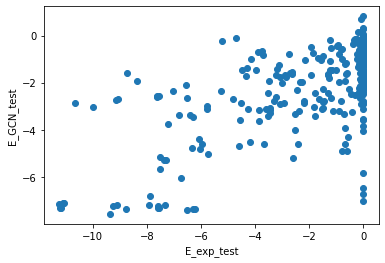

100%|██████████| 100/100 [11:00<00:00,  6.60s/it]


In [77]:
in_dim=24
hidden_dim=8
out_dim=2
num_layers=2
heads=8
activation=F.elu
feat_drop=.6
attn_drop=.6
negative_slope=.2
residual=False
with_edge_weights = True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# gnn = Classifier(in_dim, hidden_dim, out_dim, with_edge_weights).to(device)

gnn = Regressor(in_dim = in_dim, 
                hidden_dim = hidden_dim, 
                with_edge_weights = with_edge_weights).to(device)

opt = torch.optim.Adam(gnn.parameters())
metrics = ddict(list)



for epoch in tqdm(range(100)):
    start = time.time()
        
    loss = train_model(gnn, opt, trainloader, device)
    
    loss1, rmse1, r21, y_true_train, y_pred_train = evaluate_model(gnn, opt, trainloader, device)
    loss2, rmse2, r22, y_true_test, y_pred_test = evaluate_model(gnn, opt, testloader, device)
    metrics['rmse'].append((rmse1, rmse2))
    metrics['loss'].append((loss1, loss2))
    metrics['r2'].append((r21, r22))
    logger.debug(metrics)

    logger.info(f"{epoch}. time: {round(time.time() - start, 2)} loss: {round(loss, 3)} rmse: {metrics['rmse'][-1]} r2: {metrics['r2'][-1]}")
        
    plt.scatter(y_true_train, y_pred_train)
    plt.xlabel('E_exp_train')
    plt.ylabel('E_GCN_train')
    plt.show()
    
    plt.scatter(y_true_test, y_pred_test)
    plt.xlabel('E_exp_test')
    plt.ylabel('E_GCN_test')
    plt.show()

In [79]:
plot_interactive([metrics], legend=['Train', 'Test'], title='Loss', logx=False, logy=False, metric_name='loss', start_from=0)

In [80]:
plot_interactive([metrics], legend=['Train', 'Test'], title='RMSE', logx=False, logy=False, metric_name='rmse', start_from=0)

In [81]:
plot_interactive([metrics], legend=['Train', 'Test'], title='R2', logx=False, logy=False, metric_name='r2', start_from=0)

  0%|          | 0/100 [00:00<?, ?it/s]

INFO:__main__:100. time: 5.85 loss: 4.361 rmse: (2.0634239084579535, 2.186663241187421) r2: (0.4286722792448313, 0.4354031157680439)


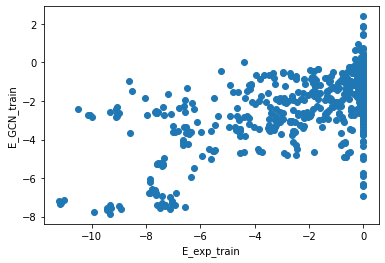

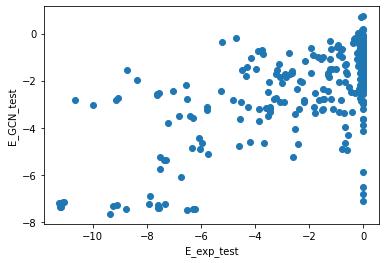

  1%|          | 1/100 [00:06<10:02,  6.08s/it]

INFO:__main__:101. time: 6.2 loss: 4.285 rmse: (2.070110942782292, 2.171502319750743) r2: (0.42496322200204917, 0.44320508063379993)


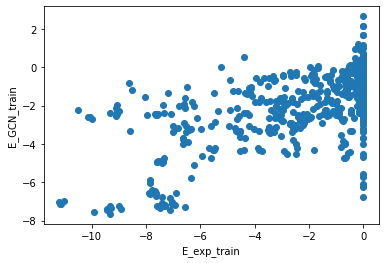

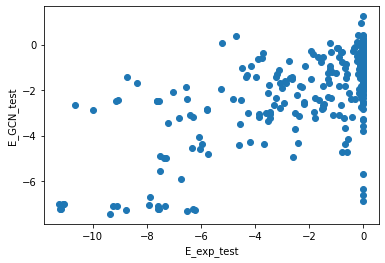

  2%|▏         | 2/100 [00:12<10:23,  6.36s/it]

INFO:__main__:102. time: 5.96 loss: 4.278 rmse: (2.0610766938356155, 2.177835937085233) r2: (0.4299713492439414, 0.43995233821006097)


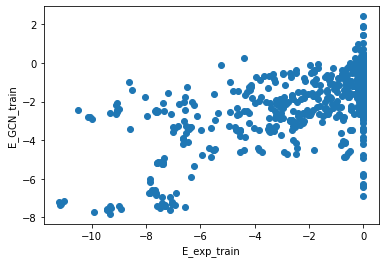

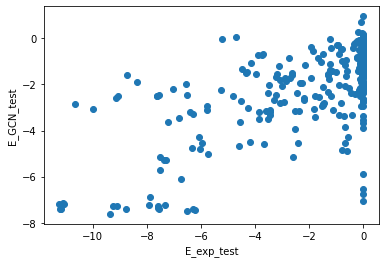

  3%|▎         | 3/100 [00:18<10:09,  6.28s/it]

INFO:__main__:103. time: 6.35 loss: 4.308 rmse: (2.0600552231600893, 2.178964225965296) r2: (0.43053622222188404, 0.4393718911488935)


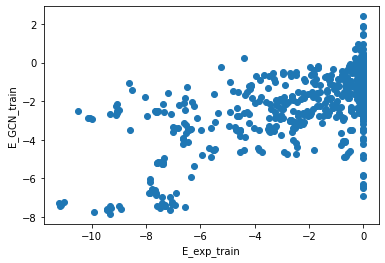

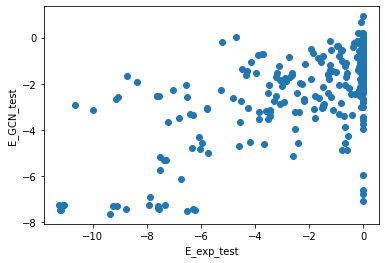

  4%|▍         | 4/100 [00:25<10:14,  6.40s/it]

INFO:__main__:104. time: 5.98 loss: 4.303 rmse: (2.0620163278892347, 2.1683177754826555) r2: (0.4294514846254288, 0.44483698117069337)


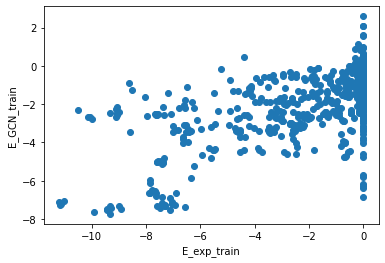

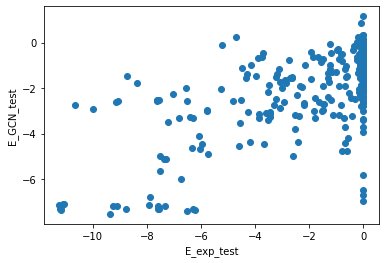

  5%|▌         | 5/100 [00:31<10:01,  6.33s/it]

INFO:__main__:105. time: 5.94 loss: 4.261 rmse: (2.0596356682870005, 2.1724949554648614) r2: (0.4307681548135337, 0.44269592083134135)


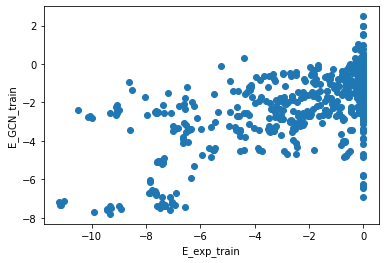

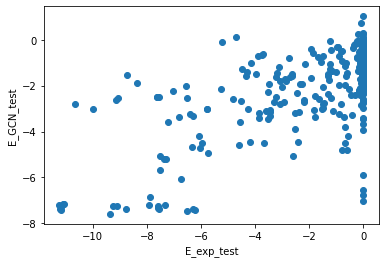

  6%|▌         | 6/100 [00:37<09:49,  6.27s/it]

INFO:__main__:106. time: 5.97 loss: 4.295 rmse: (2.062172400179489, 2.185382536656262) r2: (0.4293651126775151, 0.43606427842335027)


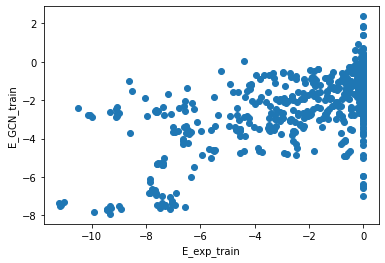

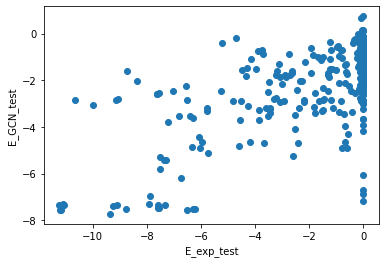

  7%|▋         | 7/100 [00:43<09:40,  6.25s/it]

INFO:__main__:107. time: 6.06 loss: 4.272 rmse: (2.0661826186096084, 2.195863775752807) r2: (0.4271435762143664, 0.4306419606407915)


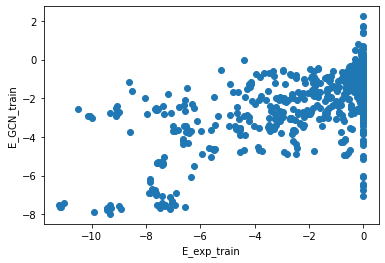

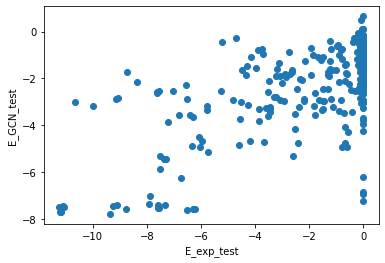

  8%|▊         | 8/100 [00:50<09:35,  6.26s/it]

INFO:__main__:108. time: 5.99 loss: 4.278 rmse: (2.05792316256197, 2.1738245015717883) r2: (0.43171434889007154, 0.44201358258458967)


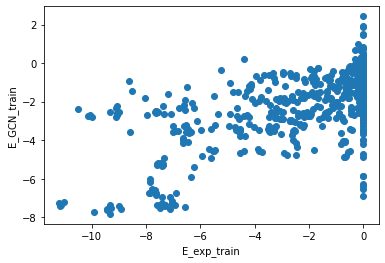

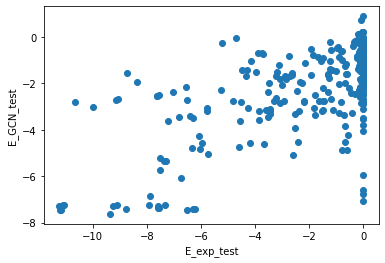

  9%|▉         | 9/100 [00:56<09:28,  6.25s/it]

INFO:__main__:109. time: 6.5 loss: 4.299 rmse: (2.0607574123328196, 2.185298427694429) r2: (0.43014794190350647, 0.43610768605064343)


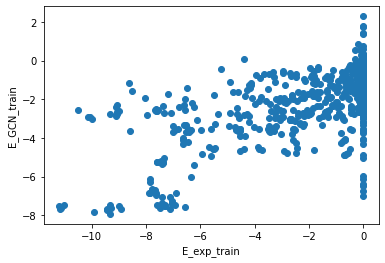

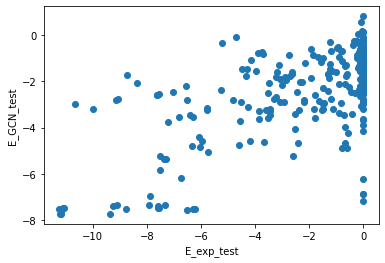

 10%|█         | 10/100 [01:03<09:35,  6.40s/it]

INFO:__main__:110. time: 6.27 loss: 4.286 rmse: (2.061645555816348, 2.1640691253394517) r2: (0.42965664734311004, 0.44701044728148653)


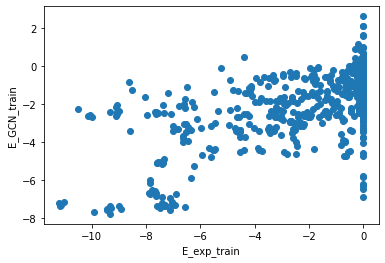

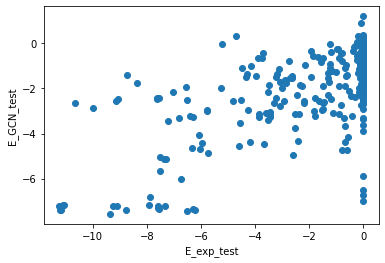

 11%|█         | 11/100 [01:09<09:31,  6.43s/it]

INFO:__main__:111. time: 6.31 loss: 4.258 rmse: (2.0570588888008525, 2.1757121782097313) r2: (0.432191578798387, 0.44104408826886843)


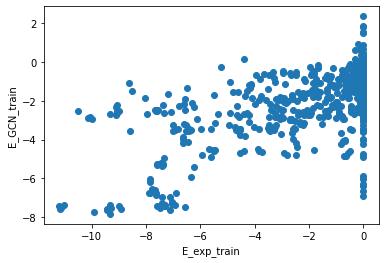

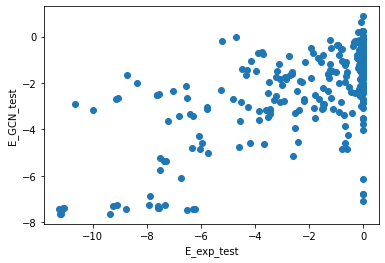

 12%|█▏        | 12/100 [01:16<09:33,  6.52s/it]

INFO:__main__:112. time: 6.5 loss: 4.265 rmse: (2.067617639458692, 2.1631149196972004) r2: (0.4263475706955395, 0.44749800048667854)


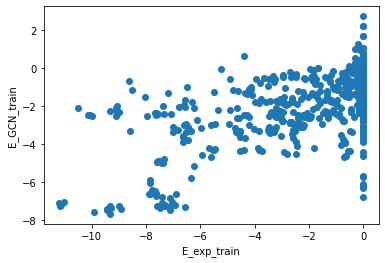

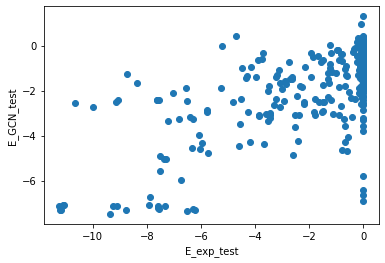

 13%|█▎        | 13/100 [01:23<09:32,  6.58s/it]

INFO:__main__:113. time: 6.32 loss: 4.251 rmse: (2.056498517129642, 2.16598379189712) r2: (0.4325008946053297, 0.4460314961241638)


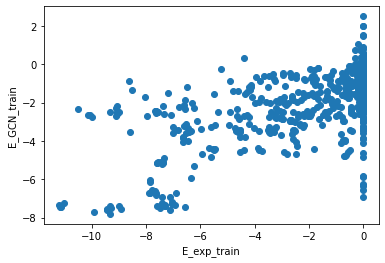

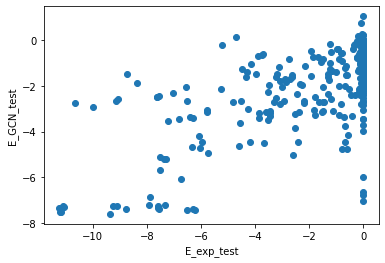

 14%|█▍        | 14/100 [01:29<09:26,  6.58s/it]

INFO:__main__:114. time: 6.18 loss: 4.279 rmse: (2.055932104737341, 2.17135444919407) r2: (0.4328134591484446, 0.44328090903208284)


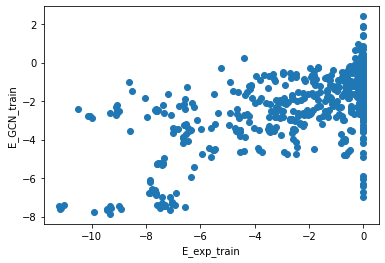

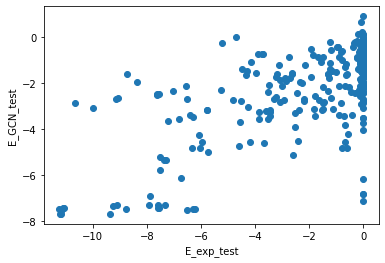

 15%|█▌        | 15/100 [01:36<09:15,  6.53s/it]

INFO:__main__:115. time: 6.03 loss: 4.319 rmse: (2.0576675990810673, 2.177149705338166) r2: (0.4318554853949641, 0.4403052224004854)


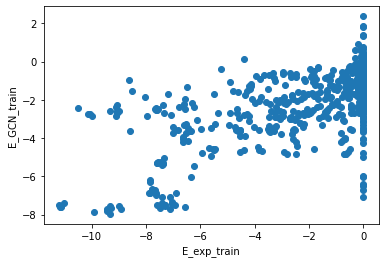

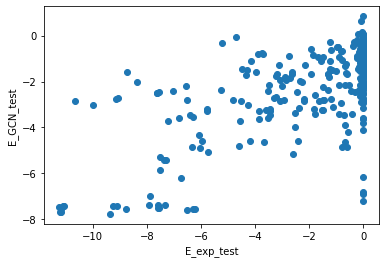

 16%|█▌        | 16/100 [01:42<09:01,  6.45s/it]

INFO:__main__:116. time: 6.06 loss: 4.276 rmse: (2.060938252745466, 2.1891813629978856) r2: (0.4300479235293304, 0.43410200792741593)


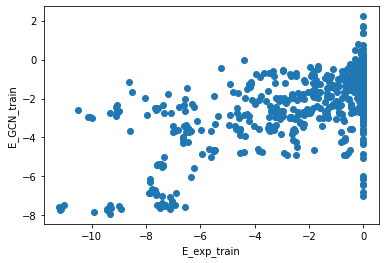

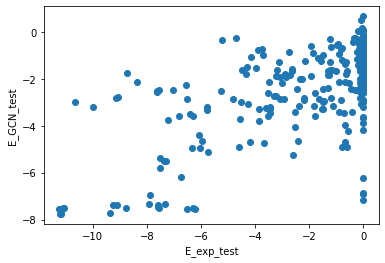

 17%|█▋        | 17/100 [01:48<08:51,  6.40s/it]

INFO:__main__:117. time: 6.55 loss: 4.252 rmse: (2.064796852077667, 2.1600613408483658) r2: (0.4279117358540706, 0.4490567873954173)


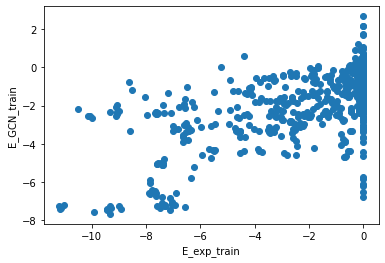

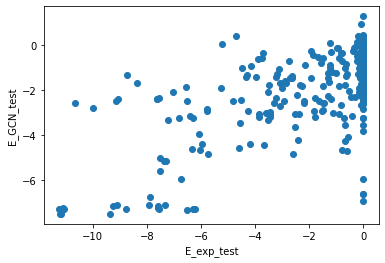

 18%|█▊        | 18/100 [01:55<08:54,  6.51s/it]

INFO:__main__:118. time: 6.61 loss: 4.273 rmse: (2.0578715046031513, 2.1608003728111638) r2: (0.4317428787291283, 0.44867972931037203)


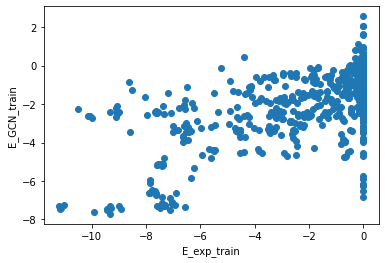

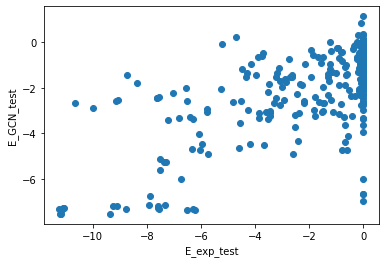

 19%|█▉        | 19/100 [02:02<08:56,  6.62s/it]

INFO:__main__:119. time: 6.59 loss: 4.257 rmse: (2.067594324538728, 2.2015676660933456) r2: (0.4263605078893544, 0.42768023439960756)


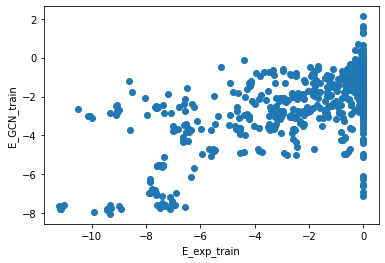

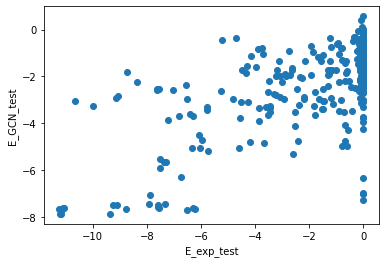

 20%|██        | 20/100 [02:09<08:54,  6.69s/it]

INFO:__main__:120. time: 6.41 loss: 4.268 rmse: (2.055032657116836, 2.162063334225868) r2: (0.43330962630286984, 0.44803506104197655)


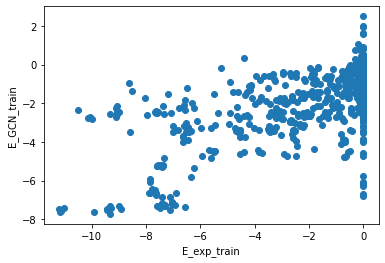

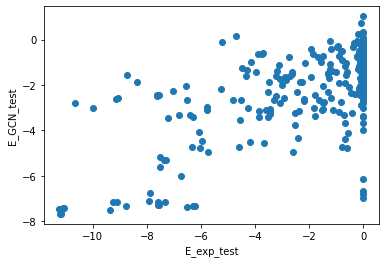

 21%|██        | 21/100 [02:15<08:47,  6.67s/it]

INFO:__main__:121. time: 6.13 loss: 4.294 rmse: (2.0537721674372182, 2.162800764463709) r2: (0.43400459170767425, 0.44765847165624184)


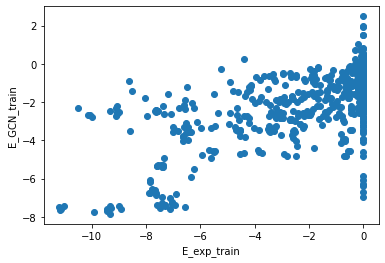

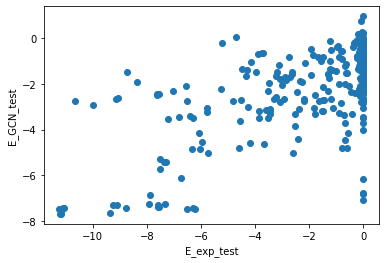

 22%|██▏       | 22/100 [02:22<08:35,  6.61s/it]

INFO:__main__:122. time: 6.2 loss: 4.243 rmse: (2.053565089453863, 2.163568814141108) r2: (0.434118722457722, 0.4472661090634906)


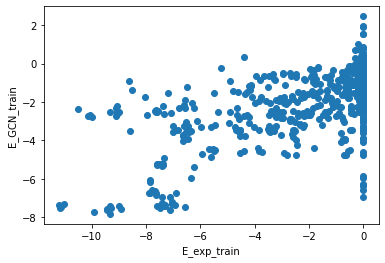

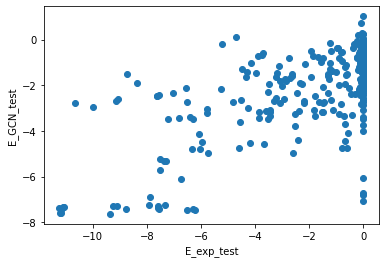

 23%|██▎       | 23/100 [02:28<08:25,  6.56s/it]

INFO:__main__:123. time: 6.12 loss: 4.258 rmse: (2.058101376850753, 2.1854264322814467) r2: (0.4316159185791515, 0.43604162375373967)


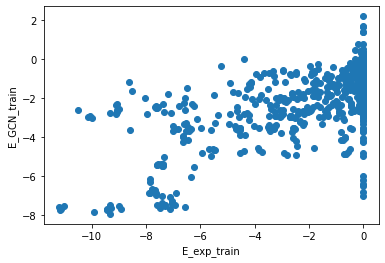

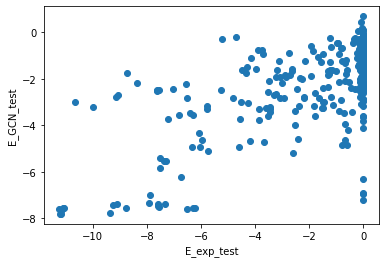

 24%|██▍       | 24/100 [02:35<08:13,  6.50s/it]

INFO:__main__:124. time: 6.01 loss: 4.25 rmse: (2.055581253176773, 2.1593463695272868) r2: (0.4330070271195634, 0.44942144685952934)


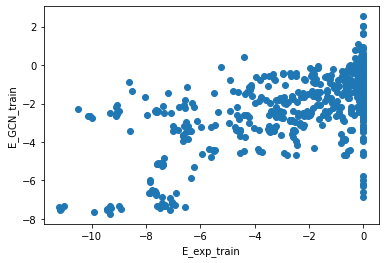

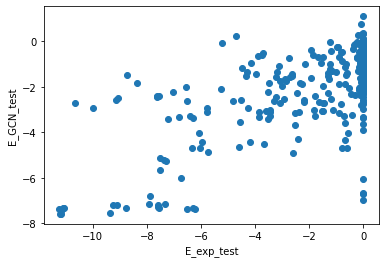

 25%|██▌       | 25/100 [02:41<08:01,  6.43s/it]

INFO:__main__:125. time: 6.49 loss: 4.276 rmse: (2.0526519588709626, 2.1637046775693793) r2: (0.4346218558829018, 0.4471966879489626)


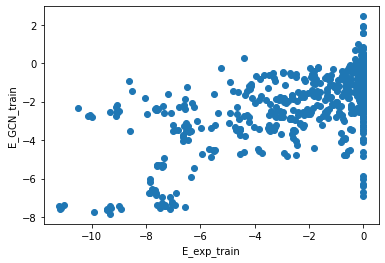

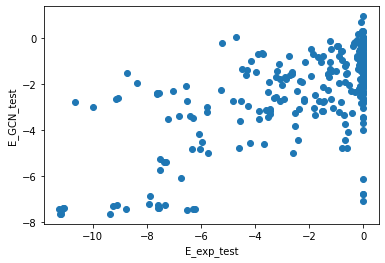

 26%|██▌       | 26/100 [02:48<08:02,  6.52s/it]

INFO:__main__:126. time: 6.43 loss: 4.233 rmse: (2.09259729398298, 2.2422502085207197) r2: (0.41240282572229425, 0.4063331284273072)


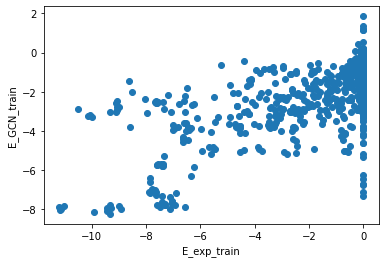

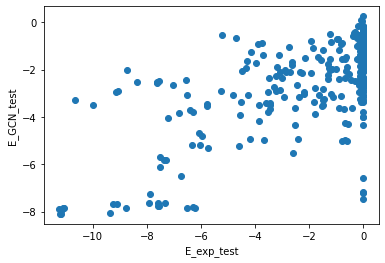

 27%|██▋       | 27/100 [02:54<08:00,  6.58s/it]

INFO:__main__:127. time: 6.52 loss: 4.323 rmse: (2.0536434899866363, 2.1739042056839994) r2: (0.4340755134639974, 0.44197266426085324)


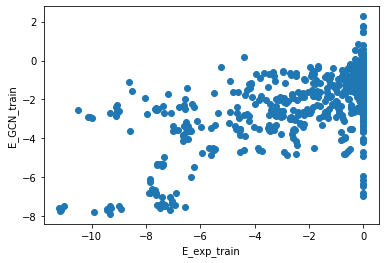

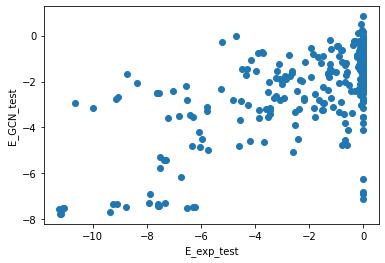

 28%|██▊       | 28/100 [03:01<07:58,  6.65s/it]

INFO:__main__:128. time: 7.43 loss: 4.279 rmse: (2.0739726544683306, 2.2117976235373424) r2: (0.4228158032858499, 0.4223491154763168)


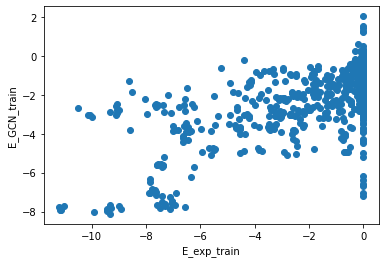

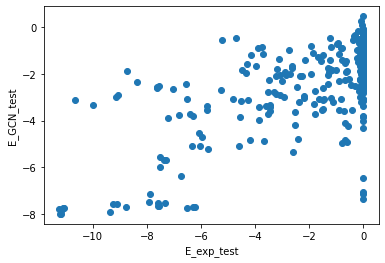

 29%|██▉       | 29/100 [03:09<08:14,  6.96s/it]

INFO:__main__:129. time: 8.65 loss: 4.215 rmse: (2.061224009208732, 2.15648520414327) r2: (0.4298898607824563, 0.45087952942967824)


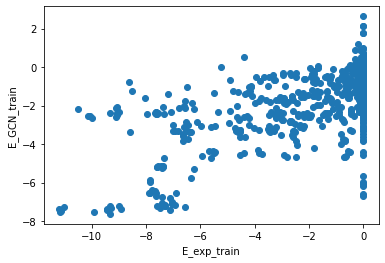

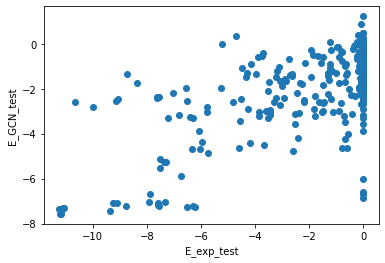

 30%|███       | 30/100 [03:18<08:49,  7.57s/it]

INFO:__main__:130. time: 9.23 loss: 4.302 rmse: (2.0522021930385552, 2.1703913878350662) r2: (0.43486959385079704, 0.44377464301837954)


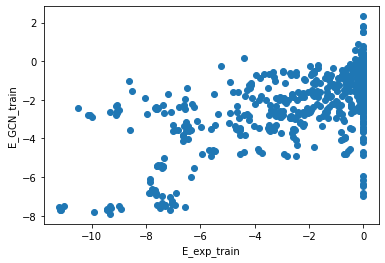

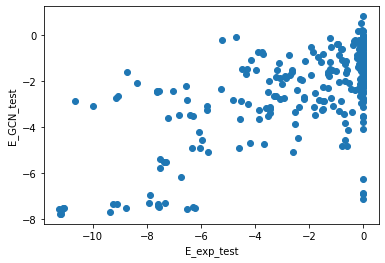

 31%|███       | 31/100 [03:27<09:23,  8.17s/it]

INFO:__main__:131. time: 9.12 loss: 4.259 rmse: (2.070449246140605, 2.157859907816396) r2: (0.4247752583861759, 0.45017920602005645)


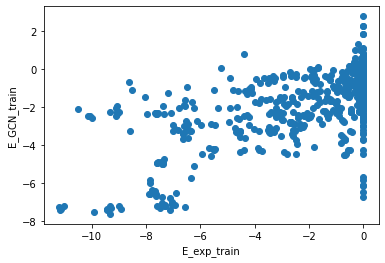

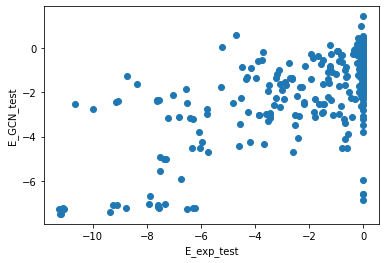

 32%|███▏      | 32/100 [03:37<09:45,  8.61s/it]

INFO:__main__:132. time: 8.98 loss: 4.232 rmse: (2.0540909001022443, 2.1734175954093073) r2: (0.4338289001423564, 0.44222245580478203)


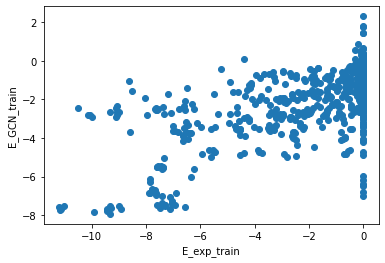

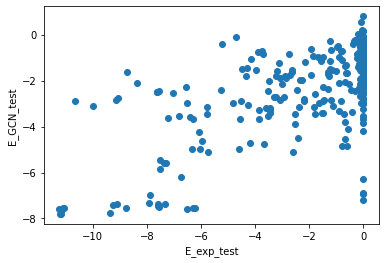

 33%|███▎      | 33/100 [03:46<09:51,  8.83s/it]

INFO:__main__:133. time: 8.97 loss: 4.254 rmse: (2.0515210098745564, 2.1677461766790183) r2: (0.4352446966846222, 0.44512964001857924)


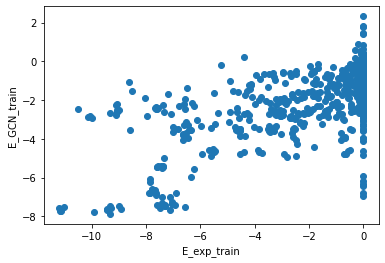

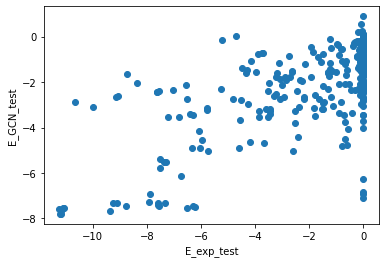

 34%|███▍      | 34/100 [03:56<09:52,  8.97s/it]

INFO:__main__:134. time: 8.8 loss: 4.272 rmse: (2.058063765366729, 2.186867823010008) r2: (0.4316366926515084, 0.4352974646913286)


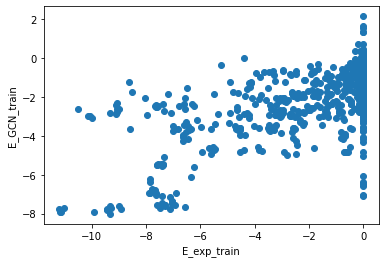

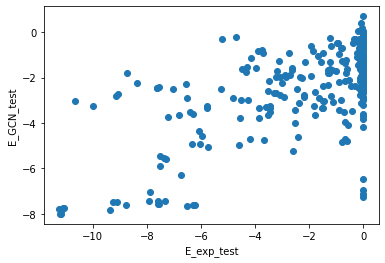

 35%|███▌      | 35/100 [04:05<09:46,  9.02s/it]

INFO:__main__:135. time: 8.19 loss: 4.242 rmse: (2.051302394667562, 2.155764633065091) r2: (0.43536505374518353, 0.4512464359330667)


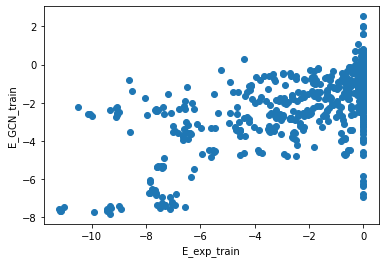

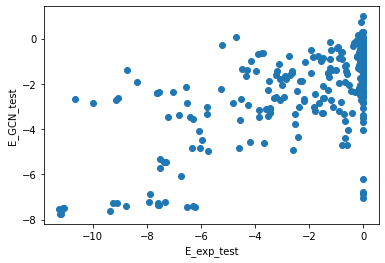

 36%|███▌      | 36/100 [04:13<09:25,  8.84s/it]

INFO:__main__:136. time: 6.67 loss: 4.227 rmse: (2.0612085570850893, 2.1531278839424983) r2: (0.42989840849905736, 0.4525879929638378)


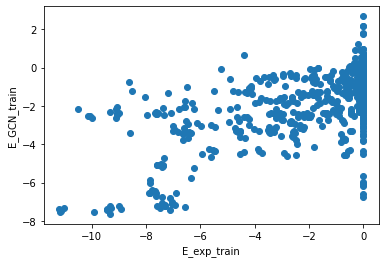

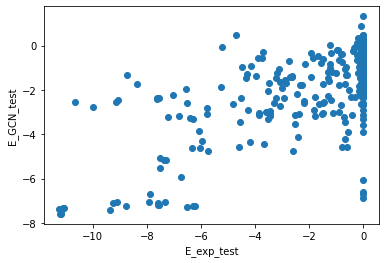

 37%|███▋      | 37/100 [04:20<08:40,  8.26s/it]

INFO:__main__:137. time: 6.77 loss: 4.26 rmse: (2.0548706676879553, 2.152369498716255) r2: (0.433398962335223, 0.45297354931556544)


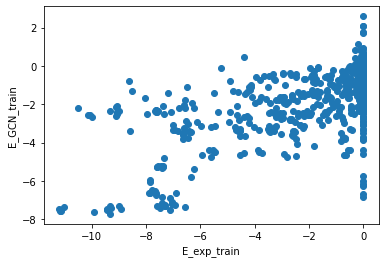

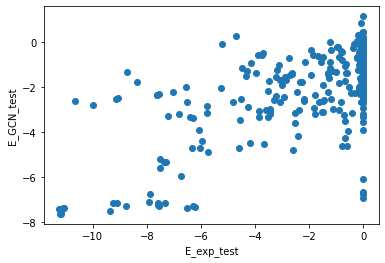

 38%|███▊      | 38/100 [04:27<08:08,  7.88s/it]

INFO:__main__:138. time: 6.26 loss: 4.28 rmse: (2.050941100016467, 2.1677617534823455) r2: (0.4355639338530325, 0.4451216657108713)


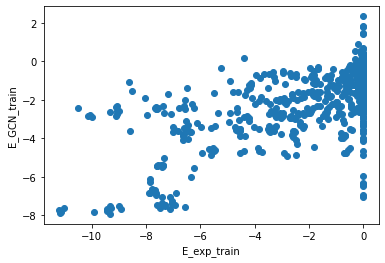

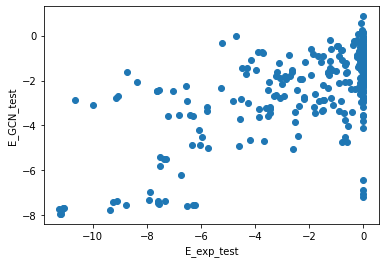

 39%|███▉      | 39/100 [04:34<07:35,  7.46s/it]

INFO:__main__:139. time: 6.64 loss: 4.271 rmse: (2.0597034397131306, 2.1895388705929646) r2: (0.43073069353896787, 0.4339171631693449)


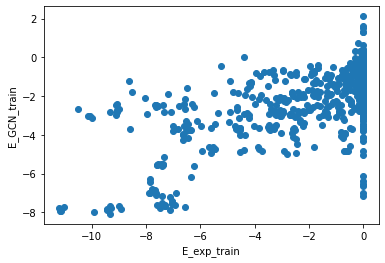

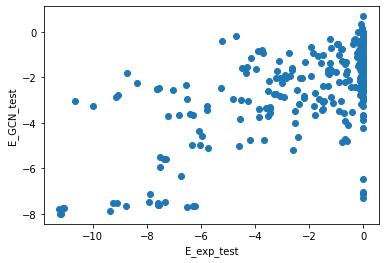

 40%|████      | 40/100 [04:40<07:17,  7.29s/it]

INFO:__main__:140. time: 6.6 loss: 4.275 rmse: (2.0541606714384346, 2.1774090923791136) r2: (0.43379043720477306, 0.4401718496515974)


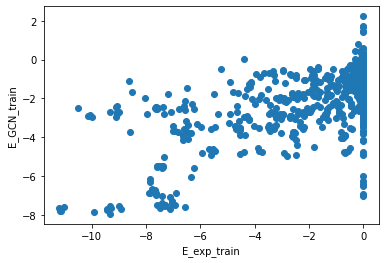

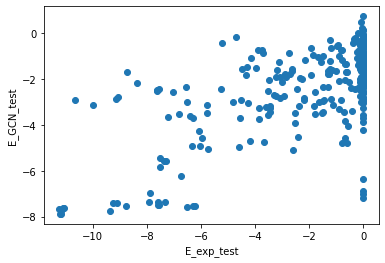

 41%|████      | 41/100 [04:47<07:02,  7.15s/it]

INFO:__main__:141. time: 6.38 loss: 4.258 rmse: (2.0556968009815684, 2.1832709512833923) r2: (0.43294328200163157, 0.4371535368094712)


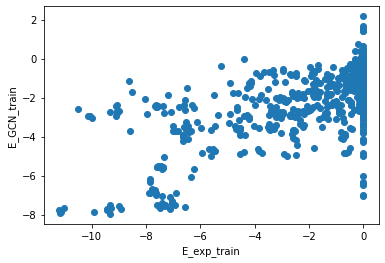

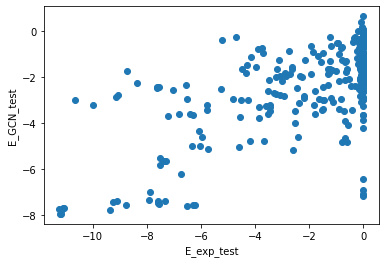

 42%|████▏     | 42/100 [04:54<06:47,  7.03s/it]

INFO:__main__:142. time: 6.52 loss: 4.243 rmse: (2.0489567683286287, 2.1643688845724616) r2: (0.43665561468723346, 0.4468572403411464)


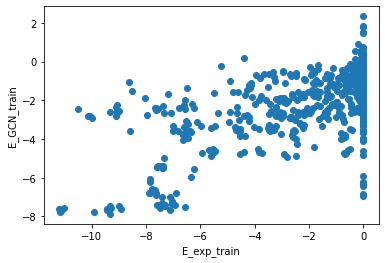

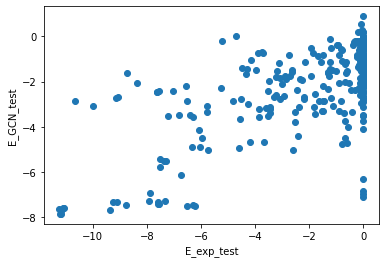

 43%|████▎     | 43/100 [05:01<06:35,  6.95s/it]

INFO:__main__:143. time: 6.31 loss: 4.226 rmse: (2.077470488227965, 2.161153698923943) r2: (0.4208672753382813, 0.44849941485213696)


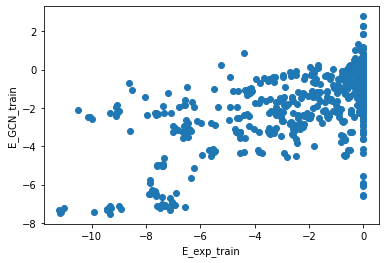

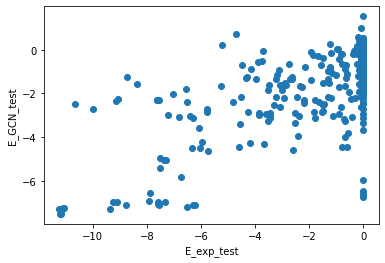

 44%|████▍     | 44/100 [05:07<06:22,  6.82s/it]

INFO:__main__:144. time: 6.18 loss: 4.305 rmse: (2.048582802313463, 2.154936857538593) r2: (0.4368612338909127, 0.45166777836763927)


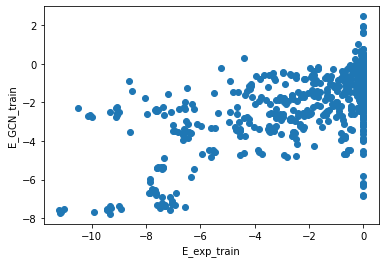

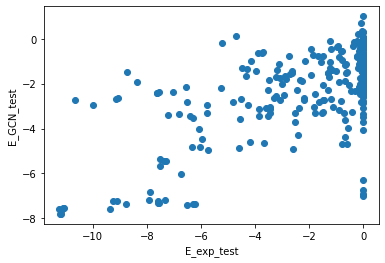

 45%|████▌     | 45/100 [05:14<06:09,  6.71s/it]

INFO:__main__:145. time: 6.44 loss: 4.229 rmse: (2.0611447755255723, 2.191532619636035) r2: (0.42993369013601324, 0.4328857670322783)


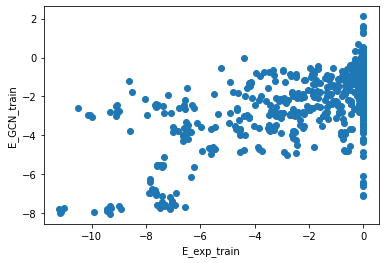

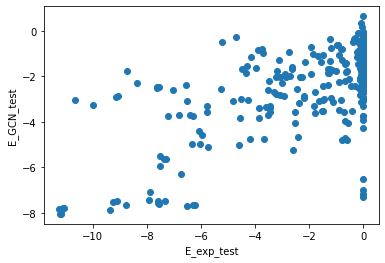

 46%|████▌     | 46/100 [05:20<06:01,  6.70s/it]

INFO:__main__:146. time: 6.27 loss: 4.234 rmse: (2.0533288711676856, 2.1766794364937714) r2: (0.4342488997949179, 0.44054698674861426)


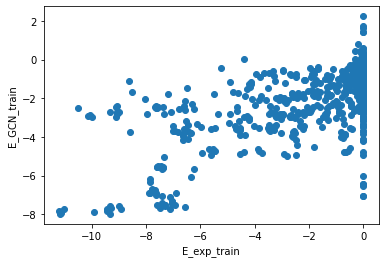

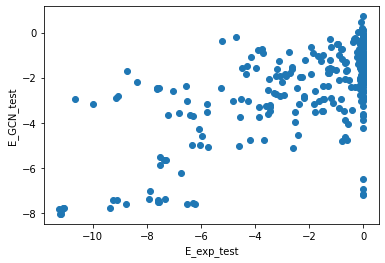

 47%|████▋     | 47/100 [05:27<05:51,  6.64s/it]

INFO:__main__:147. time: 6.36 loss: 4.237 rmse: (2.0478531163586506, 2.1556302860505627) r2: (0.43726233192399455, 0.4513148303251967)


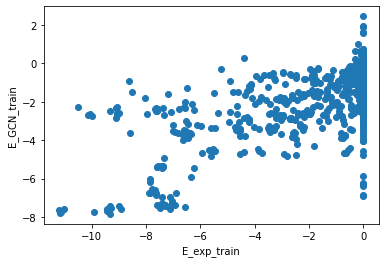

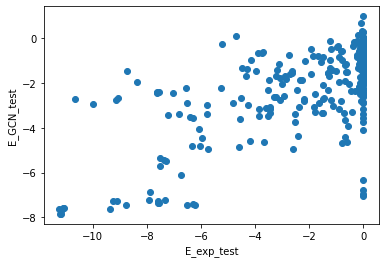

 48%|████▊     | 48/100 [05:34<05:44,  6.62s/it]

INFO:__main__:148. time: 6.12 loss: 4.226 rmse: (2.0477933819165157, 2.162031011545805) r2: (0.4372951607730384, 0.44805156458512874)


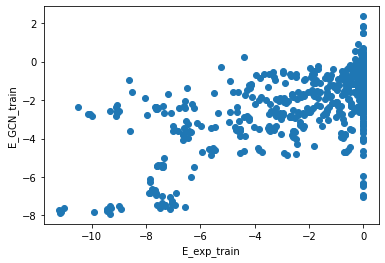

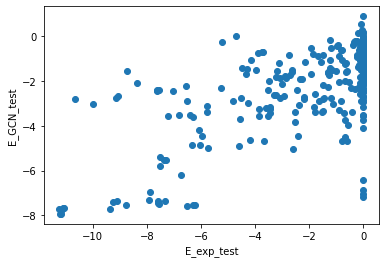

 49%|████▉     | 49/100 [05:40<05:33,  6.54s/it]

INFO:__main__:149. time: 6.23 loss: 4.231 rmse: (2.0481639041180206, 2.164806190291332) r2: (0.43709151376460753, 0.44663369533383834)


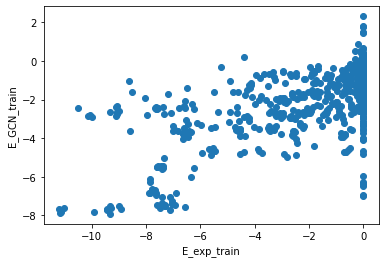

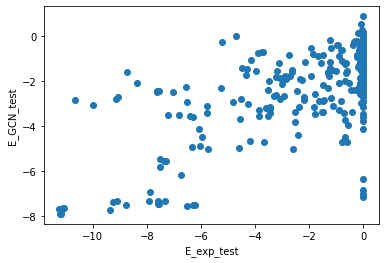

 50%|█████     | 50/100 [05:46<05:25,  6.51s/it]

INFO:__main__:150. time: 5.85 loss: 4.272 rmse: (2.0488346815157206, 2.167813224017332) r2: (0.43672274628571695, 0.4450953157453087)


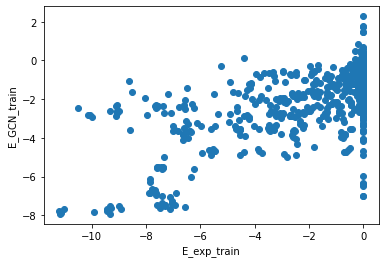

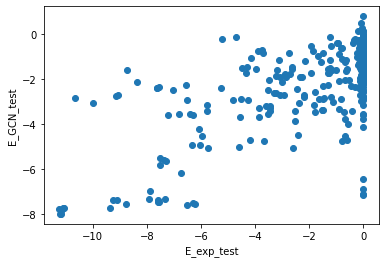

 51%|█████     | 51/100 [05:52<05:12,  6.38s/it]

INFO:__main__:151. time: 5.97 loss: 4.279 rmse: (2.066857101036683, 2.2025740416668063) r2: (0.4267695099023232, 0.42715687980650274)


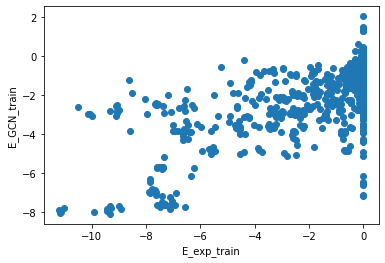

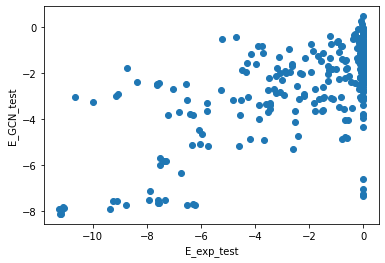

 52%|█████▏    | 52/100 [05:59<05:05,  6.37s/it]

INFO:__main__:152. time: 6.2 loss: 4.267 rmse: (2.049812457105208, 2.1610849805132903) r2: (0.43618498677350526, 0.44853448652813765)


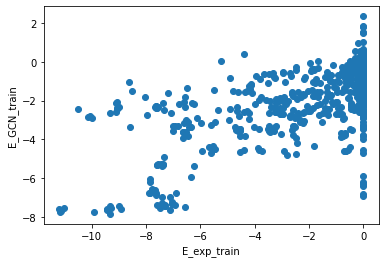

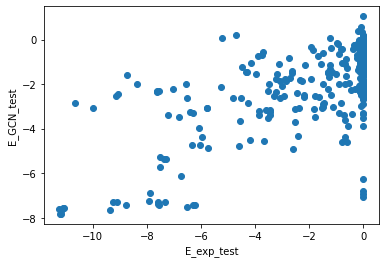

 53%|█████▎    | 53/100 [06:05<05:00,  6.39s/it]

INFO:__main__:153. time: 6.26 loss: 4.262 rmse: (2.0477211563249154, 2.1515825682103538) r2: (0.437334853227905, 0.45337347424403895)


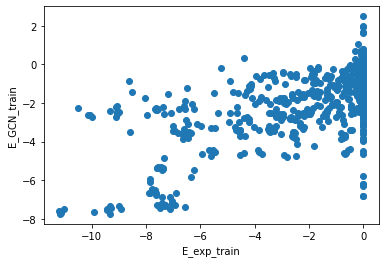

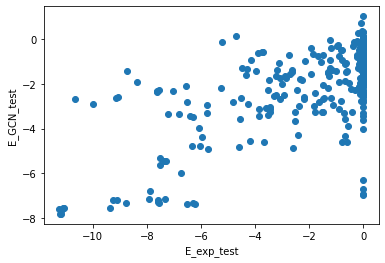

 54%|█████▍    | 54/100 [06:12<04:55,  6.42s/it]

INFO:__main__:154. time: 6.06 loss: 4.222 rmse: (2.0527258829781982, 2.148587090131879) r2: (0.43458113214795346, 0.45489446440503145)


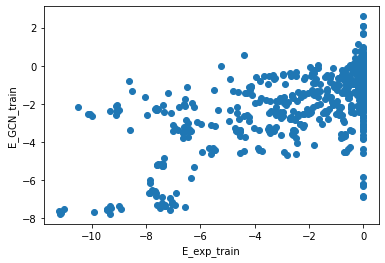

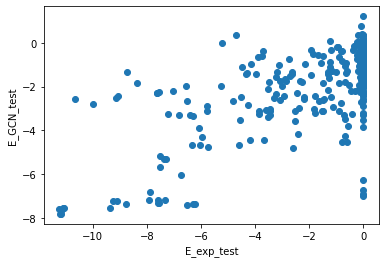

 55%|█████▌    | 55/100 [06:18<04:47,  6.39s/it]

INFO:__main__:155. time: 6.25 loss: 4.27 rmse: (2.046108561577683, 2.1586986062188616) r2: (0.43822070976628824, 0.4497517237403742)


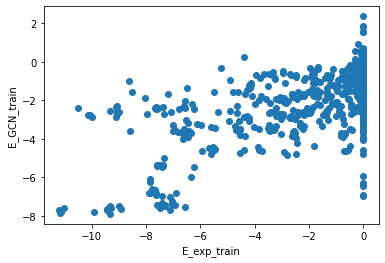

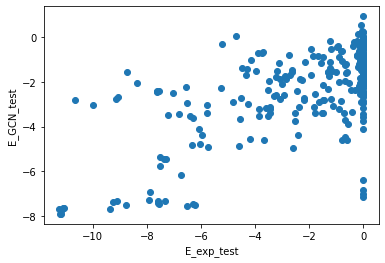

 56%|█████▌    | 56/100 [06:24<04:42,  6.41s/it]

INFO:__main__:156. time: 6.09 loss: 4.227 rmse: (2.0510074604064603, 2.1685886359659823) r2: (0.4355274073984766, 0.44469827353537983)


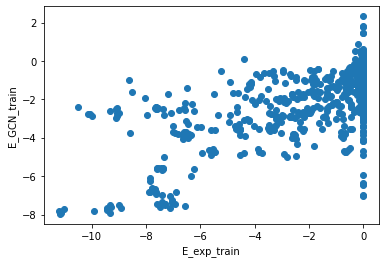

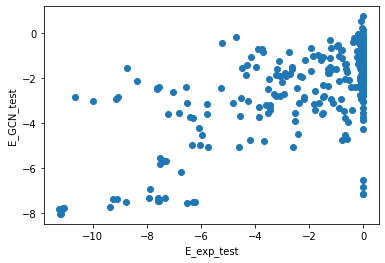

 57%|█████▋    | 57/100 [06:31<04:34,  6.39s/it]

INFO:__main__:157. time: 6.89 loss: 4.213 rmse: (2.047559422885509, 2.1671287027878967) r2: (0.4374237307348666, 0.44544570023563634)


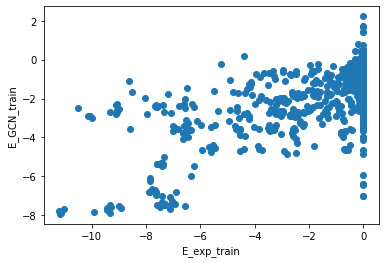

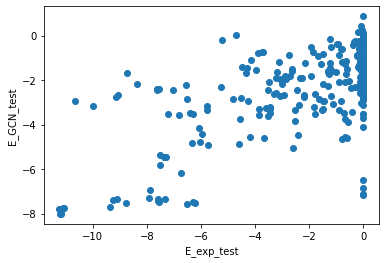

 58%|█████▊    | 58/100 [06:38<04:37,  6.61s/it]

INFO:__main__:158. time: 6.23 loss: 4.227 rmse: (2.0505797976862756, 2.173888470455821) r2: (0.4357627831551215, 0.44198074249691943)


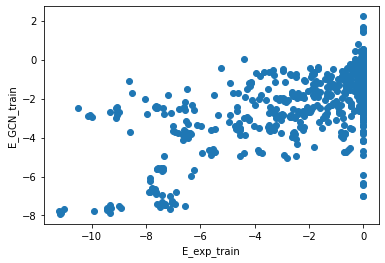

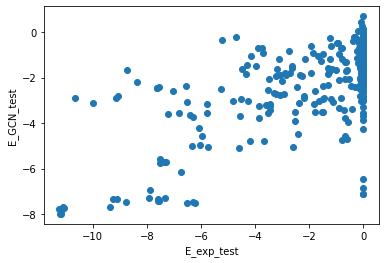

 59%|█████▉    | 59/100 [06:44<04:29,  6.56s/it]

INFO:__main__:159. time: 6.27 loss: 4.234 rmse: (2.0535459803914664, 2.182150394261039) r2: (0.43412925381159595, 0.43773114693491966)


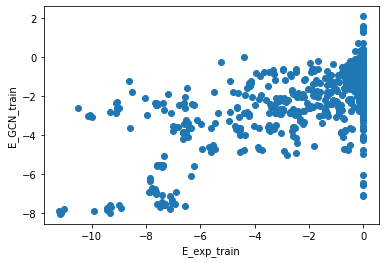

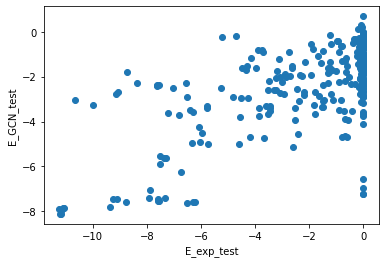

 60%|██████    | 60/100 [06:51<04:21,  6.55s/it]

INFO:__main__:160. time: 6.61 loss: 4.218 rmse: (2.058306918241778, 2.1459498424364907) r2: (0.4315023845329272, 0.4562318047048244)


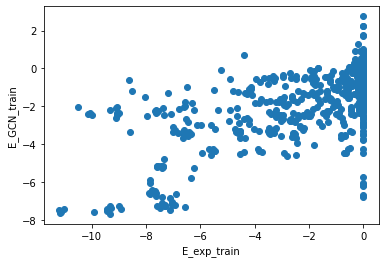

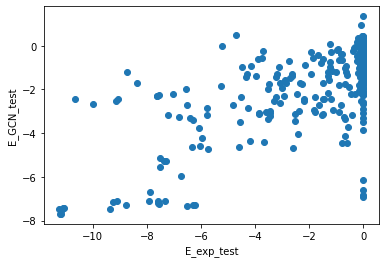

 61%|██████    | 61/100 [06:58<04:18,  6.64s/it]

INFO:__main__:161. time: 6.19 loss: 4.25 rmse: (2.0450310335209663, 2.1586722892447874) r2: (0.4388122458823217, 0.4497651399544855)


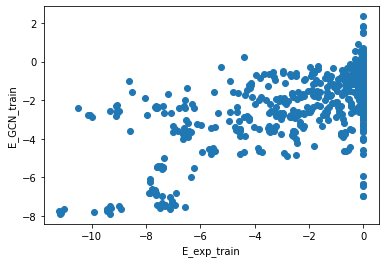

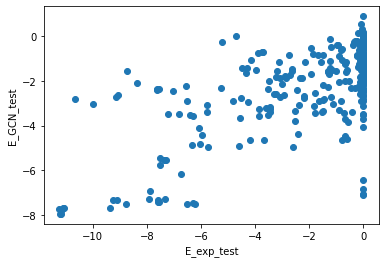

 62%|██████▏   | 62/100 [07:04<04:11,  6.61s/it]

INFO:__main__:162. time: 6.5 loss: 4.264 rmse: (2.0485812165449104, 2.17235562478217) r2: (0.43686210572035444, 0.4427674027628743)


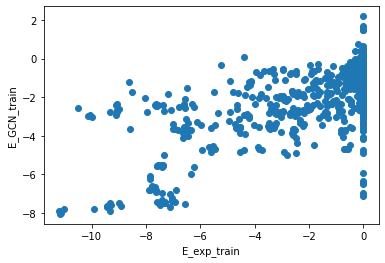

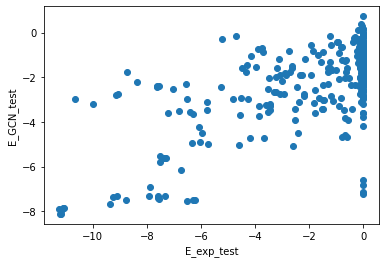

 63%|██████▎   | 63/100 [07:11<04:05,  6.64s/it]

INFO:__main__:163. time: 7.28 loss: 4.269 rmse: (2.0446651875988944, 2.1584984471642237) r2: (0.43901301534125037, 0.4498537593542391)


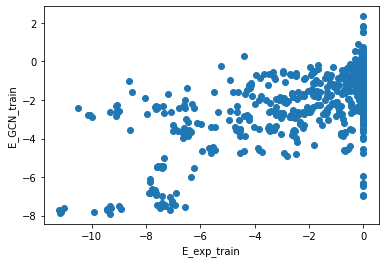

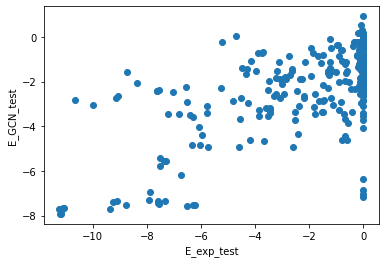

 64%|██████▍   | 64/100 [07:18<04:08,  6.90s/it]

INFO:__main__:164. time: 6.39 loss: 4.253 rmse: (2.0469875849984427, 2.168355824849303) r2: (0.43773791697958586, 0.44481749713857555)


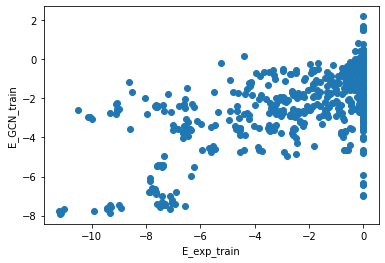

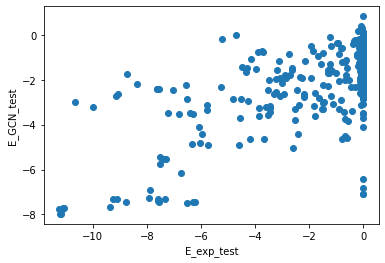

 65%|██████▌   | 65/100 [07:25<03:58,  6.82s/it]

INFO:__main__:165. time: 6.3 loss: 4.205 rmse: (2.062455005040967, 2.1502465764046943) r2: (0.42920869971875264, 0.45405210200323254)


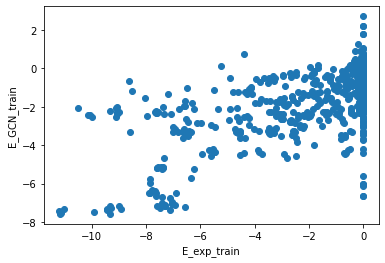

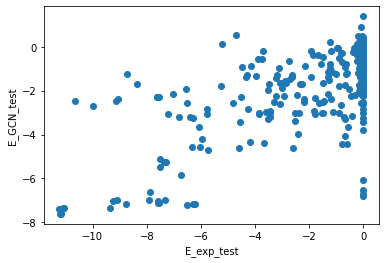

 66%|██████▌   | 66/100 [07:32<03:48,  6.73s/it]

INFO:__main__:166. time: 6.74 loss: 4.283 rmse: (2.052875944639917, 2.177003629171733) r2: (0.4344984608113499, 0.4403803254809021)


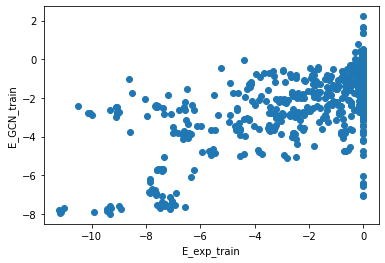

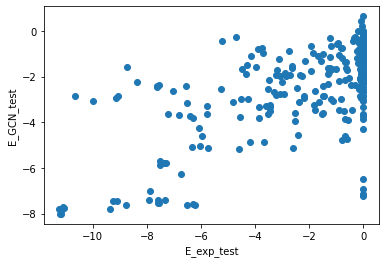

 67%|██████▋   | 67/100 [07:39<03:45,  6.82s/it]

INFO:__main__:167. time: 6.66 loss: 4.21 rmse: (2.0534399451746066, 2.1466722811121386) r2: (0.43418768997883705, 0.4558656215889103)


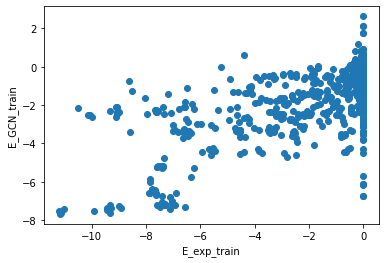

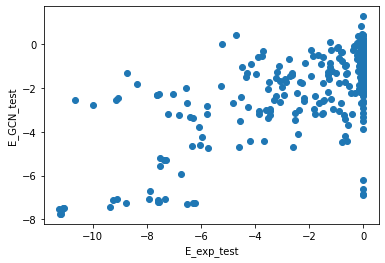

 68%|██████▊   | 68/100 [07:46<03:39,  6.85s/it]

INFO:__main__:168. time: 6.15 loss: 4.251 rmse: (2.043715561662092, 2.154069366953013) r2: (0.43953398482203354, 0.4521091623413652)


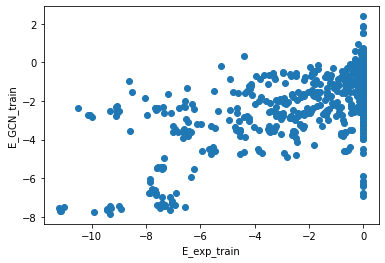

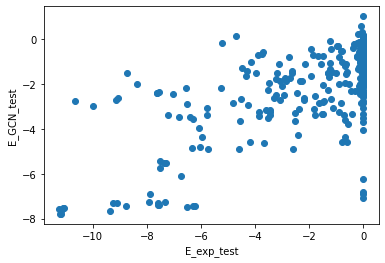

 69%|██████▉   | 69/100 [07:52<03:27,  6.71s/it]

INFO:__main__:169. time: 7.15 loss: 4.21 rmse: (2.0442003130651263, 2.1604126863948165) r2: (0.43926807804600543, 0.44887754509044064)


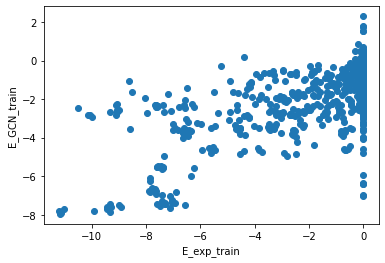

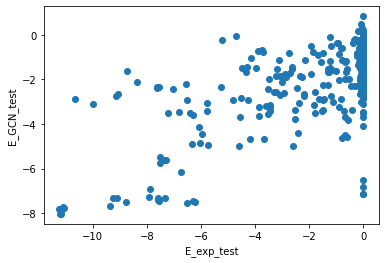

 70%|███████   | 70/100 [07:59<03:27,  6.92s/it]

INFO:__main__:170. time: 7.21 loss: 4.204 rmse: (2.0559423326382396, 2.1852984693153448) r2: (0.4328078158276879, 0.4361076645710007)


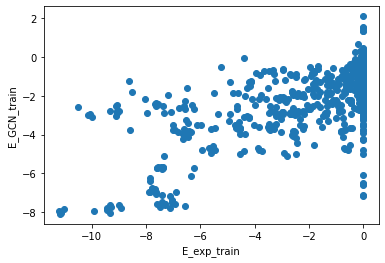

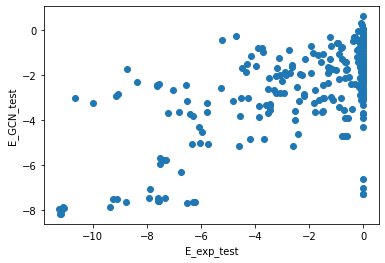

 71%|███████   | 71/100 [08:07<03:25,  7.08s/it]

INFO:__main__:171. time: 6.48 loss: 4.228 rmse: (2.044445933755583, 2.150566240604095) r2: (0.4391333205711532, 0.4538897643699016)


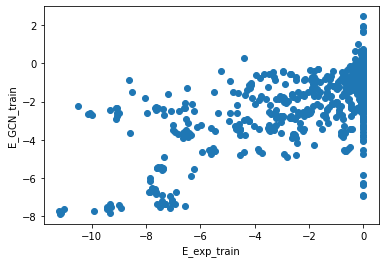

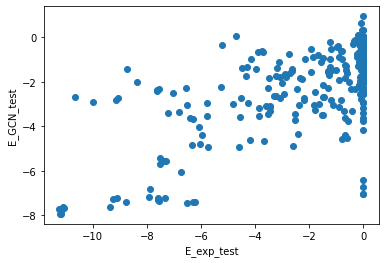

 72%|███████▏  | 72/100 [08:14<03:16,  7.02s/it]

INFO:__main__:172. time: 6.46 loss: 4.22 rmse: (2.0431593974184987, 2.1533751612006546) r2: (0.4398389868973269, 0.4524622500257731)


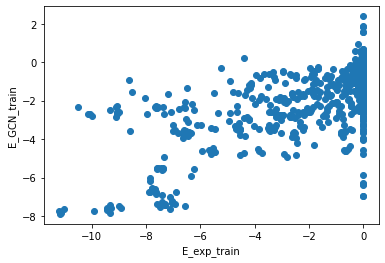

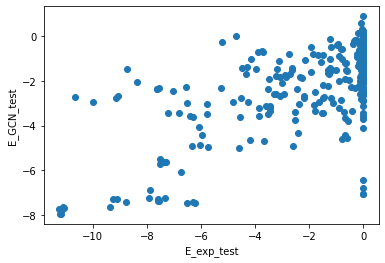

 73%|███████▎  | 73/100 [08:20<03:06,  6.93s/it]

INFO:__main__:173. time: 6.57 loss: 4.195 rmse: (2.0430175582593346, 2.1497226895270076) r2: (0.439916758616294, 0.4543180994943167)


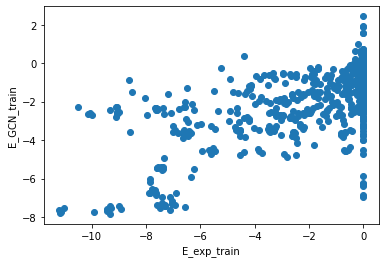

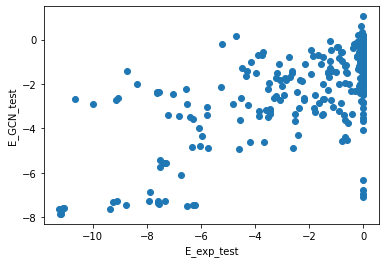

 74%|███████▍  | 74/100 [08:27<02:59,  6.89s/it]

INFO:__main__:174. time: 6.11 loss: 4.226 rmse: (2.043210640314805, 2.158179932445772) r2: (0.4398108886170847, 0.45001610994240826)


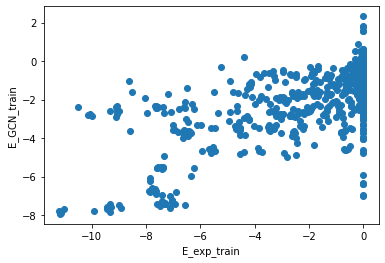

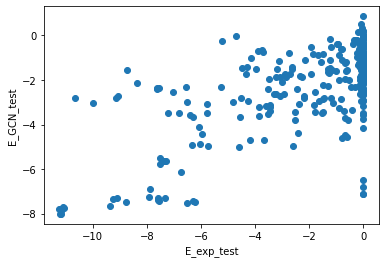

 75%|███████▌  | 75/100 [08:34<02:47,  6.72s/it]

INFO:__main__:175. time: 6.0 loss: 4.211 rmse: (2.0450361836019595, 2.165468056950352) r2: (0.43880941935697537, 0.4462952717851777)


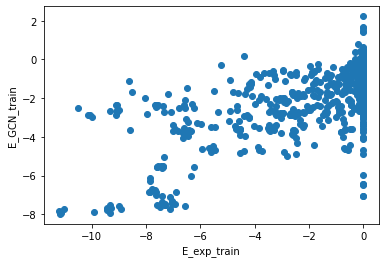

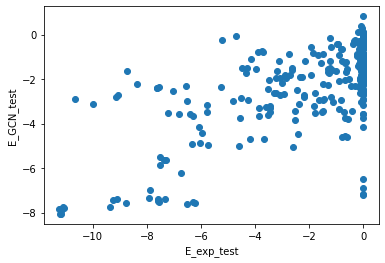

 76%|███████▌  | 76/100 [08:40<02:37,  6.57s/it]

INFO:__main__:176. time: 6.11 loss: 4.19 rmse: (2.0473960969083294, 2.1691866523575714) r2: (0.4375134762663504, 0.44439196802698533)


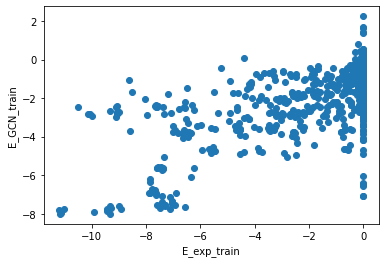

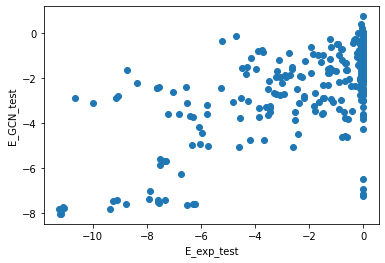

 77%|███████▋  | 77/100 [08:46<02:29,  6.50s/it]

INFO:__main__:177. time: 6.14 loss: 4.217 rmse: (2.0426319971379234, 2.1504881071959954) r2: (0.44012813804855877, 0.4539294457133345)


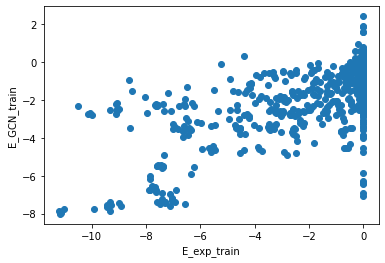

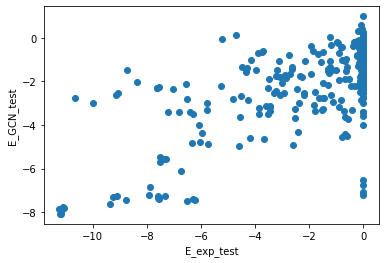

 78%|███████▊  | 78/100 [08:52<02:21,  6.45s/it]

INFO:__main__:178. time: 6.04 loss: 4.26 rmse: (2.047212615256671, 2.144983526361106) r2: (0.43761428854401174, 0.4567214094785529)


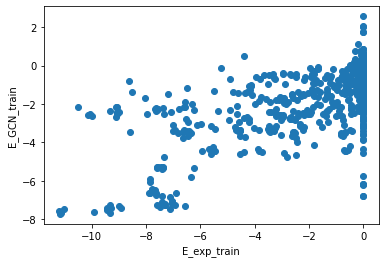

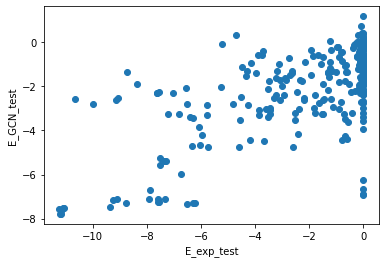

 79%|███████▉  | 79/100 [08:59<02:14,  6.40s/it]

INFO:__main__:179. time: 6.42 loss: 4.206 rmse: (2.0441759743384504, 2.1448082803402526) r2: (0.4392814303771392, 0.4568101780129419)


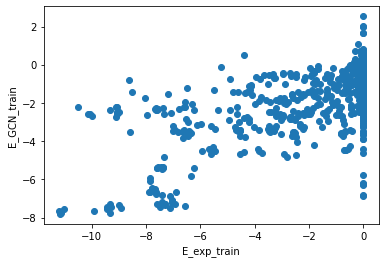

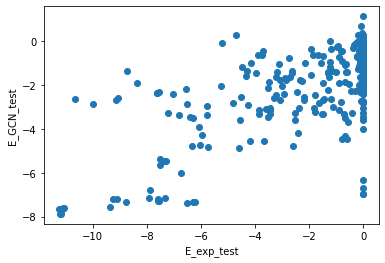

 80%|████████  | 80/100 [09:05<02:09,  6.48s/it]

INFO:__main__:180. time: 6.25 loss: 4.262 rmse: (2.044083844172508, 2.154395222457388) r2: (0.4393319719463463, 0.4519433861117419)


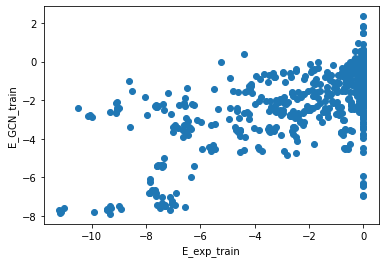

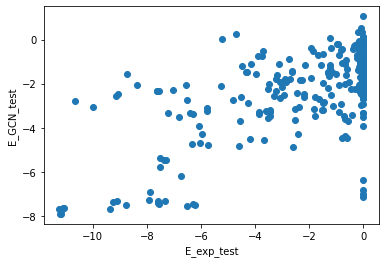

 81%|████████  | 81/100 [09:12<02:03,  6.47s/it]

INFO:__main__:181. time: 6.19 loss: 4.203 rmse: (2.041708013556254, 2.1498074397298597) r2: (0.4406345390116293, 0.45427507295550307)


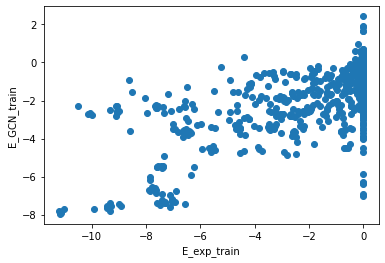

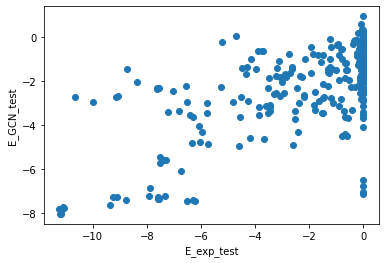

 82%|████████▏ | 82/100 [09:18<01:56,  6.49s/it]

INFO:__main__:182. time: 6.18 loss: 4.21 rmse: (2.042107214321324, 2.1483115598925626) r2: (0.4404157800622124, 0.4550342617901557)


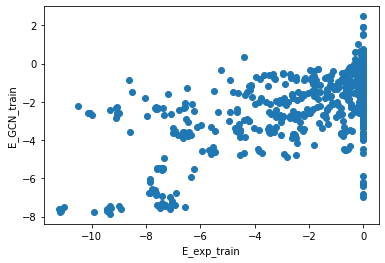

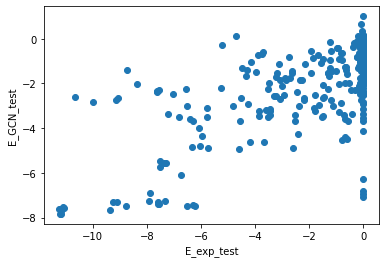

 83%|████████▎ | 83/100 [09:25<01:49,  6.46s/it]

INFO:__main__:183. time: 5.95 loss: 4.212 rmse: (2.0560259456132597, 2.148011596598876) r2: (0.4327616806909884, 0.45518643553292204)


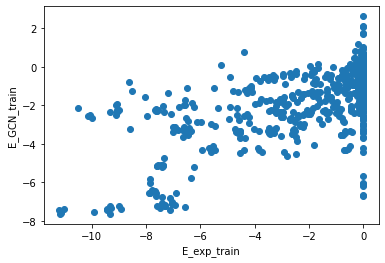

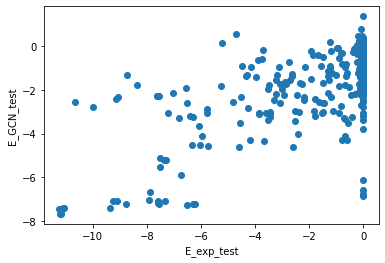

 84%|████████▍ | 84/100 [09:31<01:41,  6.37s/it]

INFO:__main__:184. time: 6.28 loss: 4.199 rmse: (2.041141329156508, 2.1539029932865668) r2: (0.4409450042577242, 0.4521937938658853)


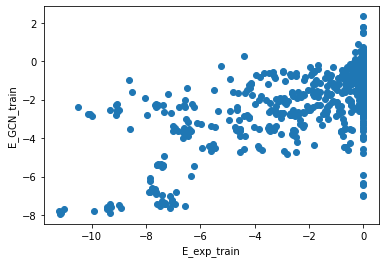

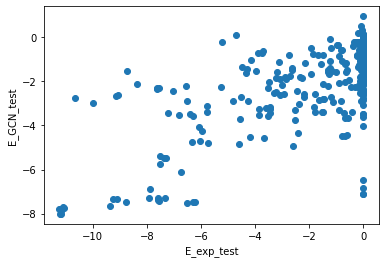

 85%|████████▌ | 85/100 [09:37<01:36,  6.42s/it]

INFO:__main__:185. time: 6.51 loss: 4.202 rmse: (2.0427204062022986, 2.1480377212539965) r2: (0.44007967232518475, 0.4551731831342367)


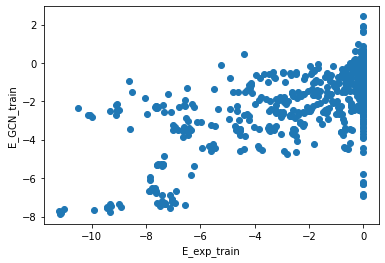

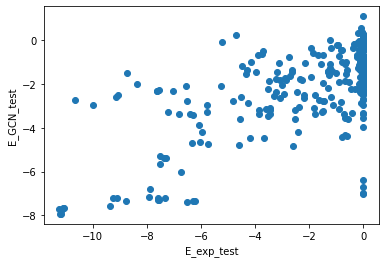

 86%|████████▌ | 86/100 [09:44<01:31,  6.53s/it]

INFO:__main__:186. time: 6.07 loss: 4.253 rmse: (2.0414215891302714, 2.1543318932738345) r2: (0.4407914710429821, 0.451975606260961)


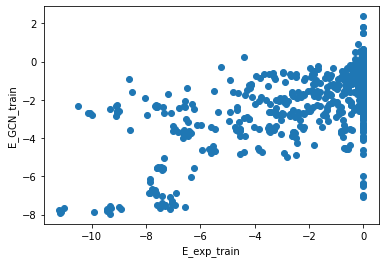

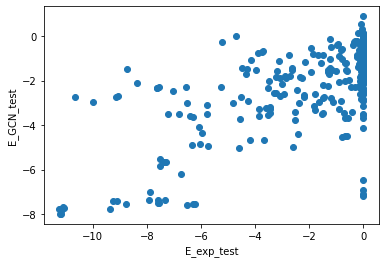

 87%|████████▋ | 87/100 [09:51<01:23,  6.46s/it]

INFO:__main__:187. time: 5.89 loss: 4.2 rmse: (2.0413367507396454, 2.158691365853943) r2: (0.44083794979686364, 0.4497554148453976)


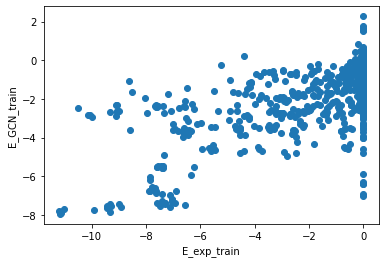

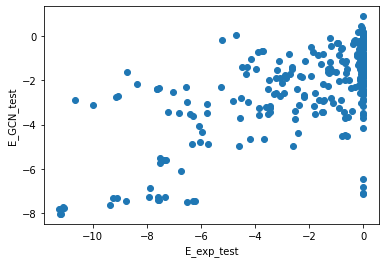

 88%|████████▊ | 88/100 [09:57<01:16,  6.35s/it]

INFO:__main__:188. time: 5.94 loss: 4.198 rmse: (2.0406080043893566, 2.148665373728796) r2: (0.4412371142833297, 0.45485474192916586)


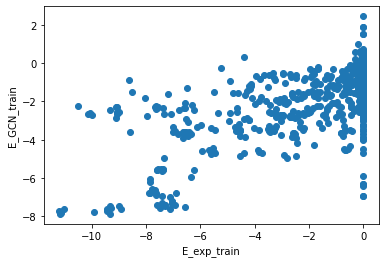

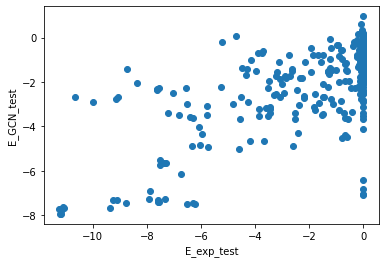

 89%|████████▉ | 89/100 [10:03<01:09,  6.29s/it]

INFO:__main__:189. time: 6.59 loss: 4.219 rmse: (2.041718525948765, 2.147842141943111) r2: (0.4406287788496649, 0.45527239182254553)


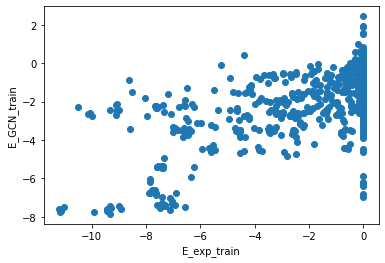

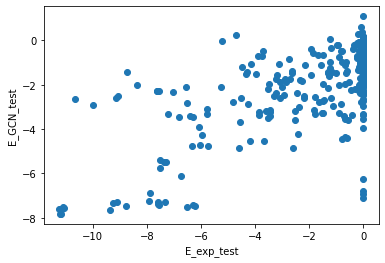

 90%|█████████ | 90/100 [10:10<01:04,  6.45s/it]

INFO:__main__:190. time: 6.46 loss: 4.222 rmse: (2.0437101381287746, 2.1597730970000235) r2: (0.43953695950415705, 0.4492038159941768)


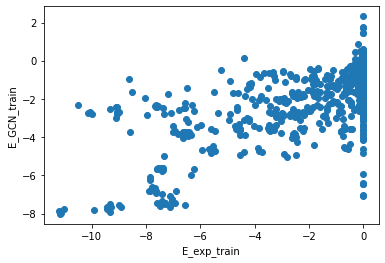

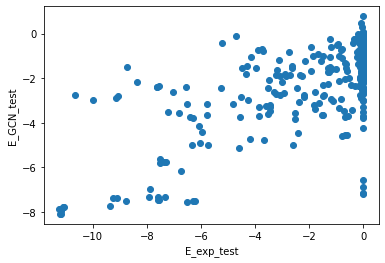

 91%|█████████ | 91/100 [10:16<00:58,  6.53s/it]

INFO:__main__:191. time: 6.36 loss: 4.209 rmse: (2.0431904088296573, 2.163676112084084) r2: (0.4398219823353263, 0.4472112842021456)


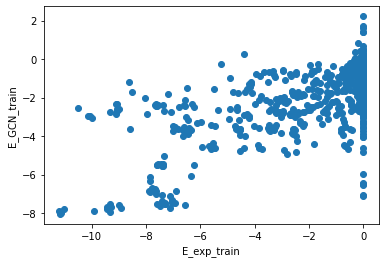

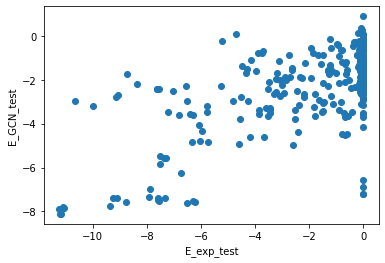

 92%|█████████▏| 92/100 [10:23<00:52,  6.58s/it]

INFO:__main__:192. time: 6.45 loss: 4.225 rmse: (2.0398015634573685, 2.151533473902086) r2: (0.44167866917458776, 0.4533984195520998)


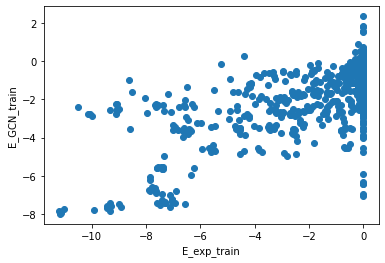

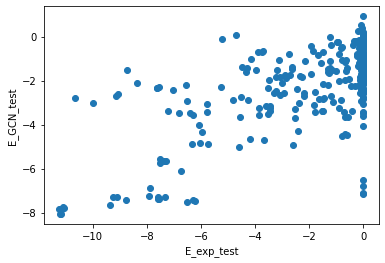

 93%|█████████▎| 93/100 [10:30<00:46,  6.63s/it]

INFO:__main__:193. time: 6.49 loss: 4.2 rmse: (2.0419270376709755, 2.1417664066151025) r2: (0.44051452077645115, 0.4583498430402343)


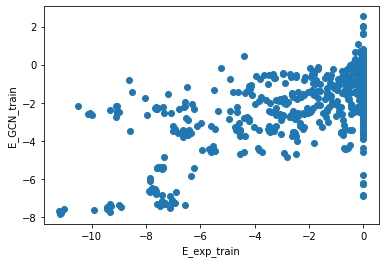

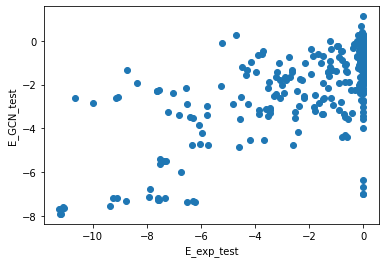

 94%|█████████▍| 94/100 [10:36<00:39,  6.65s/it]

INFO:__main__:194. time: 6.55 loss: 4.213 rmse: (2.041489553224683, 2.148160010075662) r2: (0.44075423548701465, 0.4551111468624164)


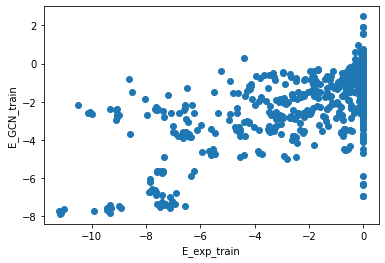

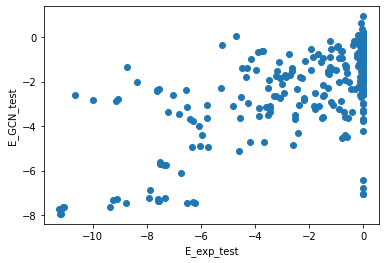

 95%|█████████▌| 95/100 [10:43<00:33,  6.70s/it]

INFO:__main__:195. time: 6.38 loss: 4.211 rmse: (2.040288279402093, 2.1577402145631948) r2: (0.44141219588699665, 0.45024019979827534)


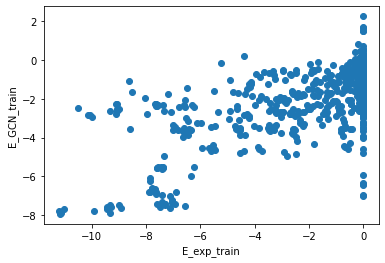

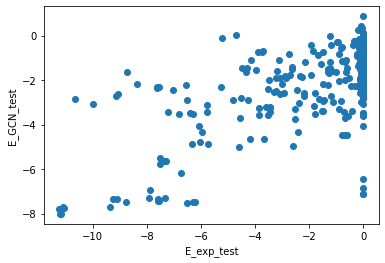

 96%|█████████▌| 96/100 [10:50<00:26,  6.67s/it]

INFO:__main__:196. time: 6.07 loss: 4.191 rmse: (2.0393139171366377, 2.1520194497658287) r2: (0.44194558807811646, 0.4531514652950849)


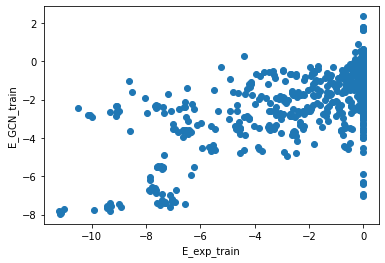

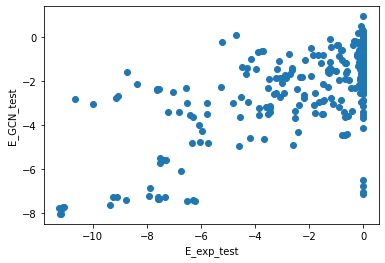

 97%|█████████▋| 97/100 [10:56<00:19,  6.56s/it]

INFO:__main__:197. time: 6.16 loss: 4.245 rmse: (2.0426926418845976, 2.1422466041129513) r2: (0.44009489291060555, 0.45810693306910066)


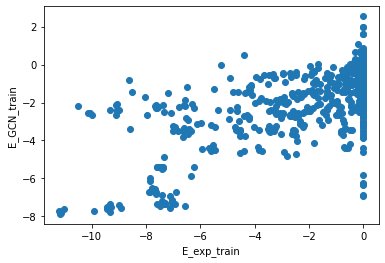

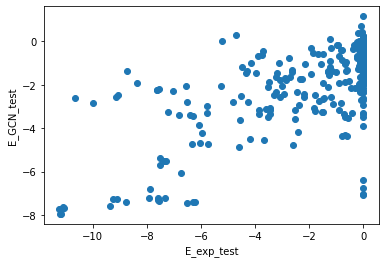

 98%|█████████▊| 98/100 [11:03<00:13,  6.51s/it]

INFO:__main__:198. time: 6.56 loss: 4.217 rmse: (2.07707295231947, 2.151417177054475) r2: (0.42108889487762324, 0.45345750886997904)


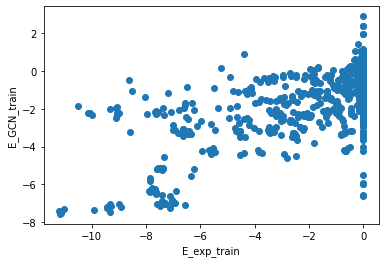

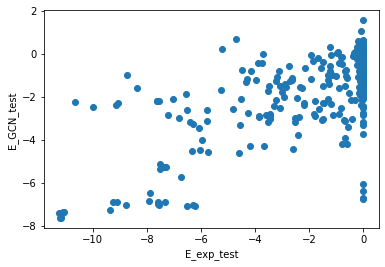

 99%|█████████▉| 99/100 [11:09<00:06,  6.59s/it]

INFO:__main__:199. time: 6.25 loss: 4.245 rmse: (2.0486116379707586, 2.1770931969343983) r2: (0.4368453804035781, 0.44033427602776054)


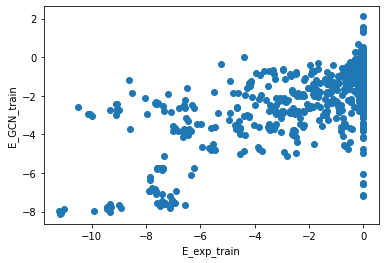

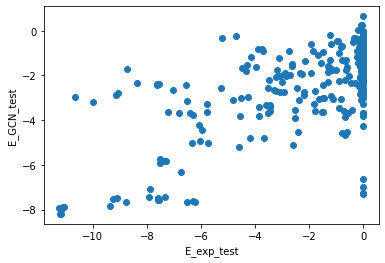

100%|██████████| 100/100 [11:16<00:00,  6.76s/it]


In [82]:
for epoch in tqdm(range(100, 200)):
    start = time.time()
        
    loss = train_model(gnn, opt, trainloader, device)
    
    loss1, rmse1, r21, y_true_train, y_pred_train = evaluate_model(gnn, opt, trainloader, device)
    loss2, rmse2, r22, y_true_test, y_pred_test = evaluate_model(gnn, opt, testloader, device)
    metrics['rmse'].append((rmse1, rmse2))
    metrics['loss'].append((loss1, loss2))
    metrics['r2'].append((r21, r22))
    logger.debug(metrics)

    logger.info(f"{epoch}. time: {round(time.time() - start, 2)} loss: {round(loss, 3)} rmse: {metrics['rmse'][-1]} r2: {metrics['r2'][-1]}")
        
    plt.scatter(y_true_train, y_pred_train)
    plt.xlabel('E_exp_train')
    plt.ylabel('E_GCN_train')
    plt.show()
    
    plt.scatter(y_true_test, y_pred_test)
    plt.xlabel('E_exp_test')
    plt.ylabel('E_GCN_test')
    plt.show()

In [83]:
plot_interactive([metrics], legend=['Train', 'Test'], title='Loss', logx=False, logy=False, metric_name='loss', start_from=0)

In [84]:
plot_interactive([metrics], legend=['Train', 'Test'], title='RMSE', logx=False, logy=False, metric_name='rmse', start_from=0)

In [85]:
plot_interactive([metrics], legend=['Train', 'Test'], title='R2', logx=False, logy=False, metric_name='r2', start_from=0)

## Выводы

1. С rmsd учится хуже (медленнее)

2. Увеличено число. эпох в два раза

# Exp 3

model - GCN without edge weights

No edge feature

Add rmsd fix

In [86]:
class Regressor(nn.Module):
    def __init__(self, in_dim, hidden_dim, with_edge_weights = True):
        super(Regressor, self).__init__()
        self.conv1 = dglnn.GraphConv(in_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.conv2 = dglnn.GraphConv(hidden_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.regress = nn.Linear(hidden_dim, 1)
        self.with_edge_weights = with_edge_weights

    def forward(self, g, h, ew=True):
        # Apply graph convolution and activation.
        if self.with_edge_weights:
            e_weights = g.edata['edge_features'][:, 0].float()
        else:
            e_weights=None
        h = F.relu(self.conv1(g, h, edge_weight=e_weights))
        h = F.relu(self.conv2(g, h, edge_weight=e_weights))
        with g.local_scope():
            g.ndata['h'] = h
            # Calculate graph representation by average readout.
            hg = dgl.mean_nodes(g, 'h')
            return self.regress(hg)

In [87]:
npz_parser = NPZ_parser(folder = FOLDER, 
                 labels_file = LABELS_FILE,
                 task = 'regression', 
                 ohe_node_encoding = ['atom_type'],
                 ohe_edge_encoding = ['edge_type'])

In [88]:
graphs, labels = npz_parser.parser()

  0%|          | 0/1000 [00:00<?, ?it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16684, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16684, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26630, 2)
INFO:__main__:Num of protein edge attrs (26630, 2)


  0%|          | 1/1000 [00:00<02:03,  8.10it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8399, 2)
INFO:__main__:array of edge attrs [4.92681 0.     ]
INFO:__main__:shape of edges attrs (8399, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14000, 2)
INFO:__main__:Num of protein edge attrs (14000, 2)
INFO:__main__:shape of node attrs (432, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  0%|          | 3/1000 [00:00<01:27, 11.34it/s]

INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16459, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16459, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (486, 2)
INFO:__main__:Num of ligand edge attrs (486, 2)
INFO:__main__:Num of protein edges (26430, 2)
INFO:__main__:Num of protein edge attrs (26430, 2)
INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  0%|          | 5/1000 [00:00<01:19, 12.44it/s]

INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12500, 2)
INFO:__main__:array of edge attrs [1.00009 1.     ]
INFO:__main__:shape of edges attrs (12500, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21214, 2)
INFO:__main__:Num of protein edge attrs (21214, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  1%|          | 7/1000 [00:00<01:13, 13.60it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2229.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13446, 2)
INFO:__main__:array of edge attrs [1.51236 1.     ]
INFO:__main__:shape of edges attrs (13446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (23282, 2)
INFO:__main__:Num of protein edge attrs (23282, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  1%|          | 9/1000 [00:00<01:09, 14.20it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14188, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14188, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24700, 2)
INFO:__main__:Num of protein edge attrs (24700, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

  1%|          | 11/1000 [00:00<01:02, 15.70it/s]

INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (384, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18368, 2)
INFO:__main__:array of edge attrs [1.53476 1.     ]
INFO:__main__:shape of edges attrs (18368, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (488, 2)
INFO:__main__:Num of ligand edge attrs (488, 2)
INFO:__main__:Num of protein edges (30100, 2)
INFO:__main__:Num of protein edge attrs (30100, 2)
INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  1%|▏         | 13/1000 [00:00<01:01, 16.09it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22861, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22861, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (36814, 2)
INFO:__main__:Num of protein edge attrs (36814, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  2%|▏         | 15/1000 [00:01<01:06, 14.76it/s]

INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13446, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (876, 2)
INFO:__main__:Num of ligand edge attrs (876, 2)
INFO:__main__:Num of protein edges (20916, 2)
INFO:__main__:Num of protein edge attrs (20916, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 18/1000 [00:01<01:00, 16.31it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14763, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14763, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1498, 2)
INFO:__main__:Num of ligand edge attrs (1498, 2)
INFO:__main__:Num of protein edges (20480, 2)
INFO:__main__:Num of protein edge attrs (20480, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 20/1000 [00:01<00:59, 16.35it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15879, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15879, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1390, 2)
INFO:__main__:Num of ligand edge attrs (1390, 2)
INFO:__main__:Num of protein edges (22322, 2)
INFO:__main__:Num of protein edge attrs (22322, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 22/1000 [00:01<00:59, 16.44it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14943, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14943, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (26150, 2)
INFO:__main__:Num of protein edge attrs (26150, 2)
INFO:__main__:shape of node attrs (356, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (322, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of ed

  2%|▏         | 24/1000 [00:01<00:58, 16.75it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12406, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21186, 2)
INFO:__main__:Num of protein edge attrs (21186, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  3%|▎         | 26/1000 [00:01<01:00, 16.17it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13044, 2)
INFO:__main__:array of edge attrs [1.00009 1.     ]
INFO:__main__:shape of edges attrs (13044, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22268, 2)
INFO:__main__:Num of protein edge attrs (22268, 2)
INFO:__main__:shape of node attrs (390, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

  3%|▎         | 28/1000 [00:01<00:58, 16.54it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13202, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13202, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (356, 2)
INFO:__main__:Num of ligand edge attrs (356, 2)
INFO:__main__:Num of protein edges (21540, 2)
INFO:__main__:Num of protein edge attrs (21540, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  3%|▎         | 30/1000 [00:01<00:58, 16.60it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19833, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19833, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1474, 2)
INFO:__main__:Num of ligand edge attrs (1474, 2)
INFO:__main__:Num of protein edges (29646, 2)
INFO:__main__:Num of protein edge attrs (29646, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  3%|▎         | 32/1000 [00:02<01:09, 14.02it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14905, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (14905, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (888, 2)
INFO:__main__:Num of ligand edge attrs (888, 2)
INFO:__main__:Num of protein edges (23418, 2)
INFO:__main__:Num of protein edge attrs (23418, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  3%|▎         | 34/1000 [00:02<01:07, 14.38it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2230.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12602, 2)
INFO:__main__:array of edge attrs [2.38356 0.     ]
INFO:__main__:shape of edges attrs (12602, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21378, 2)
INFO:__main__:Num of protein edge attrs (21378, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  4%|▎         | 37/1000 [00:02<00:57, 16.73it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19623, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19623, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1414, 2)
INFO:__main__:Num of ligand edge attrs (1414, 2)
INFO:__main__:Num of protein edges (29246, 2)
INFO:__main__:Num of protein edge attrs (29246, 2)
INFO:__main__:shape of node attrs (362, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

  4%|▍         | 39/1000 [00:02<00:55, 17.43it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22724, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22724, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (740, 2)
INFO:__main__:Num of ligand edge attrs (740, 2)
INFO:__main__:Num of protein edges (36596, 2)
INFO:__main__:Num of protein edge attrs (36596, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [458.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  4%|▍         | 41/1000 [00:02<00:55, 17.41it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12366, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12366, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21018, 2)
INFO:__main__:Num of protein edge attrs (21018, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  4%|▍         | 44/1000 [00:02<00:51, 18.57it/s]

INFO:__main__:shape of node attrs (356, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (322, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (15629, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (15629, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (866, 2)
INFO:__main__:Num of ligand edge attrs (866, 2)
INFO:__main__:Num of protein edges (24536, 2)
INFO:__main__:Num of protein edge attrs (24536, 2)
INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  5%|▍         | 47/1000 [00:02<00:49, 19.27it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21802, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (21802, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (756, 2)
INFO:__main__:Num of ligand edge attrs (756, 2)
INFO:__main__:Num of protein edges (34932, 2)
INFO:__main__:Num of protein edge attrs (34932, 2)
INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

  5%|▍         | 49/1000 [00:03<00:52, 18.02it/s]

INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20586, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (20586, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1822, 2)
INFO:__main__:Num of ligand edge attrs (1822, 2)
INFO:__main__:Num of protein edges (28950, 2)
INFO:__main__:Num of protein edge attrs (28950, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

  5%|▌         | 51/1000 [00:03<00:51, 18.48it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12764, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12764, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21846, 2)
INFO:__main__:Num of protein edge attrs (21846, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  5%|▌         | 54/1000 [00:03<00:48, 19.46it/s]

INFO:__main__:shape of node attrs (370, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15799, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (15799, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (25268, 2)
INFO:__main__:Num of protein edge attrs (25268, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  6%|▌         | 56/1000 [00:03<00:49, 19.23it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13098, 2)
INFO:__main__:array of edge attrs [5.21726 0.     ]
INFO:__main__:shape of edges attrs (13098, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21082, 2)
INFO:__main__:Num of protein edge attrs (21082, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  6%|▌         | 59/1000 [00:03<00:45, 20.62it/s]

INFO:__main__:shape of node attrs (288, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13047, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (13047, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (22402, 2)
INFO:__main__:Num of protein edge attrs (22402, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  6%|▌         | 62/1000 [00:03<00:45, 20.83it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16601, 2)
INFO:__main__:array of edge attrs [1.3703 1.    ]
INFO:__main__:shape of edges attrs (16601, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26746, 2)
INFO:__main__:Num of protein edge attrs (26746, 2)
INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of

  6%|▋         | 65/1000 [00:03<00:44, 21.00it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17871, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17871, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (28946, 2)
INFO:__main__:Num of protein edge attrs (28946, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (353, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sh

  7%|▋         | 68/1000 [00:03<00:44, 21.07it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22633, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22633, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (762, 2)
INFO:__main__:Num of ligand edge attrs (762, 2)
INFO:__main__:Num of protein edges (36470, 2)
INFO:__main__:Num of protein edge attrs (36470, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

  7%|▋         | 71/1000 [00:04<00:46, 20.16it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13549, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (13549, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (23408, 2)
INFO:__main__:Num of protein edge attrs (23408, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  7%|▋         | 74/1000 [00:04<00:45, 20.38it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (426, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22072, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22072, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (35382, 2)
INFO:__main__:Num of protein edge attrs (35382, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  8%|▊         | 77/1000 [00:04<00:47, 19.37it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13190, 2)
INFO:__main__:array of edge attrs [1.52369 1.     ]
INFO:__main__:shape of edges attrs (13190, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (862, 2)
INFO:__main__:Num of ligand edge attrs (862, 2)
INFO:__main__:Num of protein edges (20124, 2)
INFO:__main__:Num of protein edge attrs (20124, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  8%|▊         | 79/1000 [00:04<00:48, 18.89it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12835, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12835, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (21948, 2)
INFO:__main__:Num of protein edge attrs (21948, 2)
INFO:__main__:shape of node attrs (412, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  8%|▊         | 81/1000 [00:04<00:49, 18.42it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (716, 2)
INFO:__main__:Num of ligand edge attrs (716, 2)
INFO:__main__:Num of protein edges (33468, 2)
INFO:__main__:Num of protein edge attrs (33468, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

  8%|▊         | 83/1000 [00:04<00:49, 18.47it/s]

INFO:__main__:shape of node attrs (351, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14702, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (14702, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (820, 2)
INFO:__main__:Num of ligand edge attrs (820, 2)
INFO:__main__:Num of protein edges (23056, 2)
INFO:__main__:Num of protein edge attrs (23056, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  8%|▊         | 85/1000 [00:04<00:50, 18.04it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19948, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (19948, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (29954, 2)
INFO:__main__:Num of protein edge attrs (29954, 2)
INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

  9%|▊         | 87/1000 [00:04<00:52, 17.44it/s]

INFO:__main__:shape of node attrs (366, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (342, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15519, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15519, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (24838, 2)
INFO:__main__:Num of protein edge attrs (24838, 2)
INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  9%|▉         | 89/1000 [00:05<00:50, 17.90it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12190, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12190, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20684, 2)
INFO:__main__:Num of protein edge attrs (20684, 2)
INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  9%|▉         | 92/1000 [00:05<00:47, 19.21it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15389, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15389, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (854, 2)
INFO:__main__:Num of ligand edge attrs (854, 2)
INFO:__main__:Num of protein edges (24060, 2)
INFO:__main__:Num of protein edge attrs (24060, 2)
INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attr

  9%|▉         | 94/1000 [00:05<00:47, 19.24it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11790, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11790, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20142, 2)
INFO:__main__:Num of protein edge attrs (20142, 2)
INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 10%|▉         | 96/1000 [00:05<00:51, 17.63it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13035, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13035, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22254, 2)
INFO:__main__:Num of protein edge attrs (22254, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 10%|▉         | 98/1000 [00:05<00:51, 17.66it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15721, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15721, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (22136, 2)
INFO:__main__:Num of protein edge attrs (22136, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|█         | 100/1000 [00:05<00:52, 17.14it/s]

INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (296, 2)
INFO:__main__:Num of ligand edge attrs (296, 2)
INFO:__main__:Num of protein edges (20374, 2)
INFO:__main__:Num of protein edge attrs (20374, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|█         | 102/1000 [00:05<00:51, 17.44it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19503, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19503, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1478, 2)
INFO:__main__:Num of ligand edge attrs (1478, 2)
INFO:__main__:Num of protein edges (28994, 2)
INFO:__main__:Num of protein edge attrs (28994, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 10%|█         | 104/1000 [00:05<00:50, 17.69it/s]

INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13501, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13501, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (846, 2)
INFO:__main__:Num of ligand edge attrs (846, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 11%|█         | 107/1000 [00:06<00:49, 18.21it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19650, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19650, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1238, 2)
INFO:__main__:Num of ligand edge attrs (1238, 2)
INFO:__main__:Num of protein edges (29758, 2)
INFO:__main__:Num of protein edge attrs (29758, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 11%|█         | 109/1000 [00:06<00:48, 18.42it/s]

INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11789, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11789, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (19944, 2)
INFO:__main__:Num of protein edge attrs (19944, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 11%|█         | 112/1000 [00:06<00:46, 19.27it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14409, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (14409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (886, 2)
INFO:__main__:Num of ligand edge attrs (886, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 12%|█▏        | 115/1000 [00:06<00:45, 19.34it/s]

INFO:__main__:shape of node attrs (394, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17635, 2)
INFO:__main__:array of edge attrs [1.53476 1.     ]
INFO:__main__:shape of edges attrs (17635, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (510, 2)
INFO:__main__:Num of ligand edge attrs (510, 2)
INFO:__main__:Num of protein edges (28668, 2)
INFO:__main__:Num of protein edge attrs (28668, 2)
INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 12%|█▏        | 117/1000 [00:06<00:46, 19.09it/s]

INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (268, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12026, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20304, 2)
INFO:__main__:Num of protein edge attrs (20304, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 12%|█▏        | 120/1000 [00:06<00:42, 20.89it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13202, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (13202, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22782, 2)
INFO:__main__:Num of protein edge attrs (22782, 2)
INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 12%|█▏        | 123/1000 [00:06<00:40, 21.76it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22461, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22461, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (754, 2)
INFO:__main__:Num of ligand edge attrs (754, 2)
INFO:__main__:Num of protein edges (36048, 2)
INFO:__main__:Num of protein edge attrs (36048, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 13%|█▎        | 126/1000 [00:06<00:39, 21.90it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17648, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17648, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (28346, 2)
INFO:__main__:Num of protein edge attrs (28346, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 13%|█▎        | 129/1000 [00:07<00:40, 21.45it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12357, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12357, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21122, 2)
INFO:__main__:Num of protein edge attrs (21122, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 13%|█▎        | 132/1000 [00:07<00:41, 21.00it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12810, 2)
INFO:__main__:array of edge attrs [3.79748 0.     ]
INFO:__main__:shape of edges attrs (12810, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21854, 2)
INFO:__main__:Num of protein edge attrs (21854, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 14%|█▎        | 135/1000 [00:07<00:41, 20.99it/s]

INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14618, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (14618, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (23216, 2)
INFO:__main__:Num of protein edge attrs (23216, 2)
INFO:__main__:shape of node attrs (340, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 14%|█▍        | 138/1000 [00:07<00:40, 21.42it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2288.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13088, 2)
INFO:__main__:array of edge attrs [6.65657 0.     ]
INFO:__main__:shape of edges attrs (13088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (22366, 2)
INFO:__main__:Num of protein edge attrs (22366, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 14%|█▍        | 141/1000 [00:07<00:39, 21.67it/s]

INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17179, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17179, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (25266, 2)
INFO:__main__:Num of protein edge attrs (25266, 2)
INFO:__main__:shape of node attrs (351, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 14%|█▍        | 144/1000 [00:07<00:38, 22.17it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12656, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12656, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21550, 2)
INFO:__main__:Num of protein edge attrs (21550, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 15%|█▍        | 147/1000 [00:07<00:36, 23.09it/s]

INFO:__main__:shape of node attrs (288, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12492, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12492, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21330, 2)
INFO:__main__:Num of protein edge attrs (21330, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 15%|█▌        | 150/1000 [00:08<00:37, 22.81it/s]

INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13502, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13502, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (348, 2)
INFO:__main__:Num of ligand edge attrs (348, 2)
INFO:__main__:Num of protein edges (22040, 2)
INFO:__main__:Num of protein edge attrs (22040, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 15%|█▌        | 153/1000 [00:08<00:38, 22.09it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20860, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20860, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1376, 2)
INFO:__main__:Num of ligand edge attrs (1376, 2)
INFO:__main__:Num of protein edges (31538, 2)
INFO:__main__:Num of protein edge attrs (31538, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 16%|█▌        | 156/1000 [00:09<02:05,  6.74it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16464, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16464, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (484, 2)
INFO:__main__:Num of ligand edge attrs (484, 2)
INFO:__main__:Num of protein edges (26442, 2)
INFO:__main__:Num of protein edge attrs (26442, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (424, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 16%|█▌        | 158/1000 [00:09<01:48,  7.79it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21025, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (21025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (794, 2)
INFO:__main__:Num of ligand edge attrs (794, 2)
INFO:__main__:Num of protein edges (33440, 2)
INFO:__main__:Num of protein edge attrs (33440, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 16%|█▌        | 160/1000 [00:09<01:34,  8.92it/s]

INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (14138, 2)
INFO:__main__:array of edge attrs [5.86459 0.     ]
INFO:__main__:shape of edges attrs (14138, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (836, 2)
INFO:__main__:Num of ligand edge attrs (836, 2)
INFO:__main__:Num of protein edges (21880, 2)
INFO:__main__:Num of protein edge attrs (21880, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 16%|█▌        | 162/1000 [00:09<01:21, 10.27it/s]

INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12028, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12028, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20378, 2)
INFO:__main__:Num of protein edge attrs (20378, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 16%|█▋        | 165/1000 [00:09<01:06, 12.59it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22095, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22095, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (35366, 2)
INFO:__main__:Num of protein edge attrs (35366, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 17%|█▋        | 167/1000 [00:09<01:03, 13.20it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13797, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (13797, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (23910, 2)
INFO:__main__:Num of protein edge attrs (23910, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 17%|█▋        | 169/1000 [00:10<00:57, 14.34it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11671, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (11671, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (820, 2)
INFO:__main__:Num of ligand edge attrs (820, 2)
INFO:__main__:Num of protein edges (17820, 2)
INFO:__main__:Num of protein edge attrs (17820, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2228.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 17%|█▋        | 172/1000 [00:10<00:51, 15.95it/s]

INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15053, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15053, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (23968, 2)
INFO:__main__:Num of protein edge attrs (23968, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 17%|█▋        | 174/1000 [00:10<00:49, 16.76it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (337, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14214, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14214, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1444, 2)
INFO:__main__:Num of ligand edge attrs (1444, 2)
INFO:__main__:Num of protein edges (19380, 2)
INFO:__main__:Num of protein edge attrs (19380, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 18%|█▊        | 177/1000 [00:10<00:44, 18.69it/s]

INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20318, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20318, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (30502, 2)
INFO:__main__:Num of protein edge attrs (30502, 2)
INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 18%|█▊        | 180/1000 [00:10<00:41, 19.54it/s]

INFO:__main__:shape of node attrs (369, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (345, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15655, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15655, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25110, 2)
INFO:__main__:Num of protein edge attrs (25110, 2)
INFO:__main__:shape of node attrs (433, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 18%|█▊        | 183/1000 [00:10<00:41, 19.74it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12477, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12477, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21208, 2)
INFO:__main__:Num of protein edge attrs (21208, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 19%|█▊        | 186/1000 [00:10<00:39, 20.80it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11947, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11947, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20386, 2)
INFO:__main__:Num of protein edge attrs (20386, 2)
INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [265.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 19%|█▉        | 189/1000 [00:11<00:36, 21.93it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8247, 2)
INFO:__main__:array of edge attrs [2.42815 0.     ]
INFO:__main__:shape of edges attrs (8247, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13878, 2)
INFO:__main__:Num of protein edge attrs (13878, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (447, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 19%|█▉        | 192/1000 [00:11<00:39, 20.71it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21166, 2)
INFO:__main__:Num of protein edge attrs (21166, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 20%|█▉        | 195/1000 [00:11<00:41, 19.29it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12907, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12907, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (19640, 2)
INFO:__main__:Num of protein edge attrs (19640, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 20%|█▉        | 197/1000 [00:11<00:41, 19.44it/s]

INFO:__main__:shape of node attrs (391, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17137, 2)
INFO:__main__:array of edge attrs [1.53476 1.     ]
INFO:__main__:shape of edges attrs (17137, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (510, 2)
INFO:__main__:Num of ligand edge attrs (510, 2)
INFO:__main__:Num of protein edges (27726, 2)
INFO:__main__:Num of protein edge attrs (27726, 2)
INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 20%|█▉        | 199/1000 [00:11<00:43, 18.60it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22566, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22566, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (752, 2)
INFO:__main__:Num of ligand edge attrs (752, 2)
INFO:__main__:Num of protein edges (36240, 2)
INFO:__main__:Num of protein edge attrs (36240, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 20%|██        | 201/1000 [00:11<00:44, 17.97it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (264, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11854, 2)
INFO:__main__:array of edge attrs [4.23043 0.     ]
INFO:__main__:shape of edges attrs (11854, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (892, 2)
INFO:__main__:Num of ligand edge attrs (892, 2)
INFO:__main__:Num of protein edges (17884, 2)
INFO:__main__:Num of protein edge attrs (17884, 2)
INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 20%|██        | 203/1000 [00:11<00:45, 17.70it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13004, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (13004, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22374, 2)
INFO:__main__:Num of protein edge attrs (22374, 2)
INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 21%|██        | 206/1000 [00:11<00:43, 18.36it/s]

INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15740, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15740, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1502, 2)
INFO:__main__:Num of ligand edge attrs (1502, 2)
INFO:__main__:Num of protein edges (21880, 2)
INFO:__main__:Num of protein edge attrs (21880, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (258, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 21%|██        | 209/1000 [00:12<00:40, 19.59it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11964, 2)
INFO:__main__:array of edge attrs [2.12982 0.     ]
INFO:__main__:shape of edges attrs (11964, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20410, 2)
INFO:__main__:Num of protein edge attrs (20410, 2)
INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (311, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 21%|██        | 212/1000 [00:12<00:37, 21.26it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21791, 2)
INFO:__main__:array of edge attrs [1.2321 1.    ]
INFO:__main__:shape of edges attrs (21791, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (34926, 2)
INFO:__main__:Num of protein edge attrs (34926, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 22%|██▏       | 215/1000 [00:12<00:36, 21.51it/s]

INFO:__main__:shape of node attrs (278, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (244, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (10954, 2)
INFO:__main__:array of edge attrs [4.23043 0.     ]
INFO:__main__:shape of edges attrs (10954, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (954, 2)
INFO:__main__:Num of ligand edge attrs (954, 2)
INFO:__main__:Num of protein edges (16266, 2)
INFO:__main__:Num of protein edge attrs (16266, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 22%|██▏       | 218/1000 [00:12<00:33, 23.03it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12883, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12883, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22096, 2)
INFO:__main__:Num of protein edge attrs (22096, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (319, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 22%|██▏       | 221/1000 [00:12<00:33, 23.31it/s]

INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17401, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17401, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28326, 2)
INFO:__main__:Num of protein edge attrs (28326, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 22%|██▏       | 224/1000 [00:12<00:35, 21.62it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11561, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11561, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19408, 2)
INFO:__main__:Num of protein edge attrs (19408, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 23%|██▎       | 227/1000 [00:12<00:35, 21.96it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13189, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (13189, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22732, 2)
INFO:__main__:Num of protein edge attrs (22732, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 23%|██▎       | 230/1000 [00:13<00:33, 23.15it/s]

INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13396, 2)
INFO:__main__:array of edge attrs [2.90183 0.     ]
INFO:__main__:shape of edges attrs (13396, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21698, 2)
INFO:__main__:Num of protein edge attrs (21698, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 23%|██▎       | 233/1000 [00:13<00:34, 21.91it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12387, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12387, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20964, 2)
INFO:__main__:Num of protein edge attrs (20964, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

 24%|██▎       | 236/1000 [00:13<00:34, 21.93it/s]

INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14253, 2)
INFO:__main__:array of edge attrs [1.52369 1.     ]
INFO:__main__:shape of edges attrs (14253, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (882, 2)
INFO:__main__:Num of ligand edge attrs (882, 2)
INFO:__main__:Num of protein edges (21862, 2)
INFO:__main__:Num of protein edge attrs (21862, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 24%|██▍       | 239/1000 [00:13<00:36, 20.97it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21843, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21843, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (770, 2)
INFO:__main__:Num of ligand edge attrs (770, 2)
INFO:__main__:Num of protein edges (34970, 2)
INFO:__main__:Num of protein edge attrs (34970, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 24%|██▍       | 242/1000 [00:13<00:37, 20.26it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19881, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19881, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1468, 2)
INFO:__main__:Num of ligand edge attrs (1468, 2)
INFO:__main__:Num of protein edges (29712, 2)
INFO:__main__:Num of protein edge attrs (29712, 2)
INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 24%|██▍       | 245/1000 [00:13<00:38, 19.71it/s]

INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17483, 2)
INFO:__main__:array of edge attrs [1.54983 1.     ]
INFO:__main__:shape of edges attrs (17483, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1202, 2)
INFO:__main__:Num of ligand edge attrs (1202, 2)
INFO:__main__:Num of protein edges (26142, 2)
INFO:__main__:Num of protein edge attrs (26142, 2)
INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 25%|██▍       | 247/1000 [00:13<00:39, 19.03it/s]

INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [143.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16006, 2)
INFO:__main__:array of edge attrs [1.34367 1.     ]
INFO:__main__:shape of edges attrs (16006, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1532, 2)
INFO:__main__:Num of ligand edge attrs (1532, 2)
INFO:__main__:Num of protein edges (22744, 2)
INFO:__main__:Num of protein edge attrs (22744, 2)
INFO:__main__:shape of node attrs (367, 5)
INFO:__main__:array of node attrs [192.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (343, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 25%|██▍       | 249/1000 [00:14<00:40, 18.36it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19563, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19563, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1974, 2)
INFO:__main__:Num of ligand edge attrs (1974, 2)
INFO:__main__:Num of protein edges (27800, 2)
INFO:__main__:Num of protein edge attrs (27800, 2)
INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 25%|██▌       | 251/1000 [00:14<00:40, 18.60it/s]

INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21305, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (21305, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (32524, 2)
INFO:__main__:Num of protein edge attrs (32524, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 25%|██▌       | 253/1000 [00:14<00:39, 18.86it/s]

INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (18075, 2)
INFO:__main__:array of edge attrs [0.99997 1.     ]
INFO:__main__:shape of edges attrs (18075, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (29450, 2)
INFO:__main__:Num of protein edge attrs (29450, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (419, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:

 26%|██▌       | 255/1000 [00:14<00:41, 17.91it/s]

INFO:__main__:shape of node attrs (507, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (452, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (22355, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (22355, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2002, 2)
INFO:__main__:Num of ligand edge attrs (2002, 2)
INFO:__main__:Num of protein edges (32040, 2)
INFO:__main__:Num of protein edge attrs (32040, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 26%|██▌       | 257/1000 [00:14<00:42, 17.60it/s]

INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15413, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15413, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1402, 2)
INFO:__main__:Num of ligand edge attrs (1402, 2)
INFO:__main__:Num of protein edges (21994, 2)
INFO:__main__:Num of protein edge attrs (21994, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 26%|██▌       | 259/1000 [00:14<00:41, 17.85it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2295.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13243, 2)
INFO:__main__:array of edge attrs [1.5503 1.    ]
INFO:__main__:shape of edges attrs (13243, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22660, 2)
INFO:__main__:Num of protein edge attrs (22660, 2)
INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:

 26%|██▌       | 262/1000 [00:14<00:38, 19.40it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12893, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12893, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (866, 2)
INFO:__main__:Num of ligand edge attrs (866, 2)
INFO:__main__:Num of protein edges (19538, 2)
INFO:__main__:Num of protein edge attrs (19538, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 26%|██▋       | 264/1000 [00:14<00:39, 18.84it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (414, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20667, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (20667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1202, 2)
INFO:__main__:Num of ligand edge attrs (1202, 2)
INFO:__main__:Num of protein edges (31382, 2)
INFO:__main__:Num of protein edge attrs (31382, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 27%|██▋       | 266/1000 [00:14<00:39, 18.36it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12152, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12152, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 27%|██▋       | 269/1000 [00:15<00:39, 18.57it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11962, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11962, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20402, 2)
INFO:__main__:Num of protein edge attrs (20402, 2)
INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 27%|██▋       | 271/1000 [00:15<00:46, 15.63it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16432, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16432, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (496, 2)
INFO:__main__:Num of ligand edge attrs (496, 2)
INFO:__main__:Num of protein edges (26392, 2)
INFO:__main__:Num of protein edge attrs (26392, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 27%|██▋       | 273/1000 [00:15<00:44, 16.16it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13868, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (13868, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24094, 2)
INFO:__main__:Num of protein edge attrs (24094, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 28%|██▊       | 276/1000 [00:15<00:40, 17.78it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12899, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12899, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22188, 2)
INFO:__main__:Num of protein edge attrs (22188, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:

 28%|██▊       | 278/1000 [00:15<00:41, 17.25it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17343, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17343, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (27980, 2)
INFO:__main__:Num of protein edge attrs (27980, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main

 28%|██▊       | 280/1000 [00:15<00:40, 17.85it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22497, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22497, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (792, 2)
INFO:__main__:Num of ligand edge attrs (792, 2)
INFO:__main__:Num of protein edges (36118, 2)
INFO:__main__:Num of protein edge attrs (36118, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 28%|██▊       | 282/1000 [00:15<00:42, 16.80it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19739, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19739, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1948, 2)
INFO:__main__:Num of ligand edge attrs (1948, 2)
INFO:__main__:Num of protein edges (27988, 2)
INFO:__main__:Num of protein edge attrs (27988, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (298, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 28%|██▊       | 284/1000 [00:16<00:41, 17.38it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13332, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (13332, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (906, 2)
INFO:__main__:Num of ligand edge attrs (906, 2)
INFO:__main__:Num of protein edges (20208, 2)
INFO:__main__:Num of protein edge attrs (20208, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 29%|██▊       | 286/1000 [00:16<00:40, 17.69it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13695, 2)
INFO:__main__:array of edge attrs [3.85289 0.     ]
INFO:__main__:shape of edges attrs (13695, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (864, 2)
INFO:__main__:Num of ligand edge attrs (864, 2)
INFO:__main__:Num of protein edges (21088, 2)
INFO:__main__:Num of protein edge attrs (21088, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 29%|██▉       | 288/1000 [00:16<00:51, 13.75it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14310, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14310, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24882, 2)
INFO:__main__:Num of protein edge attrs (24882, 2)
INFO:__main__:shape of node attrs (523, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (468, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 29%|██▉       | 290/1000 [00:16<00:59, 11.91it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17562, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17562, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28606, 2)
INFO:__main__:Num of protein edge attrs (28606, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 29%|██▉       | 292/1000 [00:16<01:01, 11.46it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7891, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7891, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13182, 2)
INFO:__main__:Num of protein edge attrs (13182, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 30%|██▉       | 295/1000 [00:16<00:48, 14.56it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12122, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12122, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20472, 2)
INFO:__main__:Num of protein edge attrs (20472, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 30%|██▉       | 298/1000 [00:16<00:41, 16.98it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19676, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19676, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (29350, 2)
INFO:__main__:Num of protein edge attrs (29350, 2)
INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 30%|███       | 301/1000 [00:17<00:38, 18.33it/s]

INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17866, 2)
INFO:__main__:array of edge attrs [2.25136 0.     ]
INFO:__main__:shape of edges attrs (17866, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1222, 2)
INFO:__main__:Num of ligand edge attrs (1222, 2)
INFO:__main__:Num of protein edges (26740, 2)
INFO:__main__:Num of protein edge attrs (26740, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 30%|███       | 304/1000 [00:17<00:36, 19.15it/s]

INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [141.        17.         0.         0.         0.333333]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [17.        0.333333]
INFO:__main__:shape of edge attrs (19497, 2)
INFO:__main__:array of edge attrs [0.99958 1.     ]
INFO:__main__:shape of edges attrs (19497, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1458, 2)
INFO:__main__:Num of ligand edge attrs (1458, 2)
INFO:__main__:Num of protein edges (29042, 2)
INFO:__main__:Num of protein edge attrs (29042, 2)
INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node p

 31%|███       | 307/1000 [00:17<00:35, 19.75it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22554, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22554, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (36328, 2)
INFO:__main__:Num of protein edge attrs (36328, 2)
INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 31%|███       | 310/1000 [00:17<00:33, 20.32it/s]

INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (15269, 2)
INFO:__main__:array of edge attrs [4.04088 0.     ]
INFO:__main__:shape of edges attrs (15269, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (814, 2)
INFO:__main__:Num of ligand edge attrs (814, 2)
INFO:__main__:Num of protein edges (23752, 2)
INFO:__main__:Num of protein edge attrs (23752, 2)
INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 31%|███▏      | 313/1000 [00:17<00:34, 19.74it/s]

INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22876, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22876, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (36998, 2)
INFO:__main__:Num of protein edge attrs (36998, 2)
INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 32%|███▏      | 316/1000 [00:17<00:33, 20.47it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (10942, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (10942, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (17736, 2)
INFO:__main__:Num of protein edge attrs (17736, 2)
INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 32%|███▏      | 319/1000 [00:17<00:31, 21.81it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22087, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22087, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (35400, 2)
INFO:__main__:Num of protein edge attrs (35400, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 32%|███▏      | 322/1000 [00:18<00:32, 20.59it/s]

INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (886, 2)
INFO:__main__:Num of ligand edge attrs (886, 2)
INFO:__main__:Num of protein edges (23194, 2)
INFO:__main__:Num of protein edge attrs (23194, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 32%|███▎      | 325/1000 [00:18<00:31, 21.37it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21632, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21632, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (34462, 2)
INFO:__main__:Num of protein edge attrs (34462, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 33%|███▎      | 328/1000 [00:18<00:35, 18.72it/s]

INFO:__main__:shape of node attrs (326, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13787, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13787, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (904, 2)
INFO:__main__:Num of ligand edge attrs (904, 2)
INFO:__main__:Num of protein edges (21160, 2)
INFO:__main__:Num of protein edge attrs (21160, 2)
INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 33%|███▎      | 330/1000 [00:18<00:37, 17.85it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12577, 2)
INFO:__main__:array of edge attrs [2.60437 0.     ]
INFO:__main__:shape of edges attrs (12577, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21572, 2)
INFO:__main__:Num of protein edge attrs (21572, 2)
INFO:__main__:shape of node attrs (280, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 33%|███▎      | 332/1000 [00:18<00:36, 18.08it/s]

INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13545, 2)
INFO:__main__:array of edge attrs [2.90183 0.     ]
INFO:__main__:shape of edges attrs (13545, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21978, 2)
INFO:__main__:Num of protein edge attrs (21978, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 33%|███▎      | 334/1000 [00:18<00:36, 18.36it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15737, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15737, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25304, 2)
INFO:__main__:Num of protein edge attrs (25304, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 34%|███▎      | 336/1000 [00:18<00:37, 17.57it/s]

INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11889, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11889, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (20108, 2)
INFO:__main__:Num of protein edge attrs (20108, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__

 34%|███▍      | 338/1000 [00:19<00:37, 17.74it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12142, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12142, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20686, 2)
INFO:__main__:Num of protein edge attrs (20686, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 34%|███▍      | 341/1000 [00:19<00:35, 18.72it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8543, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8543, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14332, 2)
INFO:__main__:Num of protein edge attrs (14332, 2)
INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 34%|███▍      | 344/1000 [00:19<00:34, 19.15it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22733, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22733, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (766, 2)
INFO:__main__:Num of ligand edge attrs (766, 2)
INFO:__main__:Num of protein edges (36696, 2)
INFO:__main__:Num of protein edge attrs (36696, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 35%|███▍      | 346/1000 [00:19<00:38, 17.20it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14239, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14239, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24804, 2)
INFO:__main__:Num of protein edge attrs (24804, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 35%|███▍      | 348/1000 [00:19<00:37, 17.24it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19809, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19809, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (29604, 2)
INFO:__main__:Num of protein edge attrs (29604, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 35%|███▌      | 350/1000 [00:19<00:37, 17.52it/s]

INFO:__main__:shape of node attrs (267, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (255, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11904, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11904, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20122, 2)
INFO:__main__:Num of protein edge attrs (20122, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 35%|███▌      | 353/1000 [00:20<00:49, 13.19it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2302.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14673, 2)
INFO:__main__:array of edge attrs [1.39611 1.     ]
INFO:__main__:shape of edges attrs (14673, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (25410, 2)
INFO:__main__:Num of protein edge attrs (25410, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 36%|███▌      | 356/1000 [00:20<00:43, 14.75it/s]

INFO:__main__:shape of node attrs (498, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21344, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21344, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1920, 2)
INFO:__main__:Num of ligand edge attrs (1920, 2)
INFO:__main__:Num of protein edges (30636, 2)
INFO:__main__:Num of protein edge attrs (30636, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 36%|███▌      | 358/1000 [00:20<00:41, 15.29it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8428, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8428, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14050, 2)
INFO:__main__:Num of protein edge attrs (14050, 2)
INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 36%|███▌      | 360/1000 [00:20<00:40, 15.94it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12580, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12580, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21590, 2)
INFO:__main__:Num of protein edge attrs (21590, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 36%|███▌      | 362/1000 [00:20<00:38, 16.63it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14521, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14521, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25306, 2)
INFO:__main__:Num of protein edge attrs (25306, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 36%|███▋      | 364/1000 [00:20<00:36, 17.26it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18965, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18965, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (28148, 2)
INFO:__main__:Num of protein edge attrs (28148, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 37%|███▋      | 366/1000 [00:20<00:35, 17.81it/s]

INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (324, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13331, 2)
INFO:__main__:array of edge attrs [7.78197 0.     ]
INFO:__main__:shape of edges attrs (13331, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (450, 2)
INFO:__main__:Num of ligand edge attrs (450, 2)
INFO:__main__:Num of protein edges (21540, 2)
INFO:__main__:Num of protein edge attrs (21540, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 37%|███▋      | 369/1000 [00:20<00:34, 18.21it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20578, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20578, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (30982, 2)
INFO:__main__:Num of protein edge attrs (30982, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:

 37%|███▋      | 371/1000 [00:21<00:50, 12.44it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14952, 2)
INFO:__main__:array of edge attrs [1.3102 1.    ]
INFO:__main__:shape of edges attrs (14952, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (23784, 2)
INFO:__main__:Num of protein edge attrs (23784, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 37%|███▋      | 373/1000 [00:21<00:52, 12.01it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21998, 2)
INFO:__main__:array of edge attrs [7.74455 0.     ]
INFO:__main__:shape of edges attrs (21998, 2)
INFO:__main__:array of edges attrs [  0 173]
INFO:__main__:Num of ligand edges (784, 2)
INFO:__main__:Num of ligand edge attrs (784, 2)
INFO:__main__:Num of protein edges (35126, 2)
INFO:__main__:Num of protein edge attrs (35126, 2)
INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 38%|███▊      | 375/1000 [00:21<00:50, 12.37it/s]

INFO:__main__:shape of node attrs (537, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (482, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22585, 2)
INFO:__main__:array of edge attrs [1.3306 1.    ]
INFO:__main__:shape of edges attrs (22585, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1596, 2)
INFO:__main__:Num of ligand edge attrs (1596, 2)
INFO:__main__:Num of protein edges (33556, 2)
INFO:__main__:Num of protein edge attrs (33556, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 38%|███▊      | 377/1000 [00:21<00:45, 13.71it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12034, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (12034, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (848, 2)
INFO:__main__:Num of ligand edge attrs (848, 2)
INFO:__main__:Num of protein edges (18344, 2)
INFO:__main__:Num of protein edge attrs (18344, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 38%|███▊      | 379/1000 [00:21<00:45, 13.74it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12248, 2)
INFO:__main__:array of edge attrs [6.97661 0.     ]
INFO:__main__:shape of edges attrs (12248, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21016, 2)
INFO:__main__:Num of protein edge attrs (21016, 2)
INFO:__main__:shape of node attrs (360, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 38%|███▊      | 382/1000 [00:21<00:39, 15.51it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12453, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12453, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20398, 2)
INFO:__main__:Num of protein edge attrs (20398, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 38%|███▊      | 385/1000 [00:22<00:34, 17.74it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [20. 17.  0.  0.  1.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [17.  1.]
INFO:__main__:shape of edge attrs (12815, 2)
INFO:__main__:array of edge attrs [0.999877 1.      ]
INFO:__main__:shape of edges attrs (12815, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (830, 2)
INFO:__main__:Num of ligand edge attrs (830, 2)
INFO:__main__:Num of protein edges (19688, 2)
INFO:__main__:Num of protein edge attrs (19688, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 39%|███▉      | 388/1000 [00:22<00:30, 19.96it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14120, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (14120, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24572, 2)
INFO:__main__:Num of protein edge attrs (24572, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [151.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 39%|███▉      | 391/1000 [00:22<00:29, 20.73it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15852, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15852, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (22458, 2)
INFO:__main__:Num of protein edge attrs (22458, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 39%|███▉      | 394/1000 [00:22<00:28, 21.03it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12856, 2)
INFO:__main__:array of edge attrs [3.99982 0.     ]
INFO:__main__:shape of edges attrs (12856, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22066, 2)
INFO:__main__:Num of protein edge attrs (22066, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 40%|███▉      | 397/1000 [00:22<00:28, 21.38it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22073, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22073, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (788, 2)
INFO:__main__:Num of ligand edge attrs (788, 2)
INFO:__main__:Num of protein edges (35366, 2)
INFO:__main__:Num of protein edge attrs (35366, 2)
INFO:__main__:shape of node attrs (385, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (361, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 40%|████      | 400/1000 [00:22<00:29, 20.43it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12211, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12211, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20718, 2)
INFO:__main__:Num of protein edge attrs (20718, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 40%|████      | 403/1000 [00:22<00:27, 21.92it/s]

INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19111, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19111, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1488, 2)
INFO:__main__:Num of ligand edge attrs (1488, 2)
INFO:__main__:Num of protein edges (28246, 2)
INFO:__main__:Num of protein edge attrs (28246, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 41%|████      | 406/1000 [00:23<00:29, 19.99it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21071, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21071, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (700, 2)
INFO:__main__:Num of ligand edge attrs (700, 2)
INFO:__main__:Num of protein edges (33656, 2)
INFO:__main__:Num of protein edge attrs (33656, 2)
INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 41%|████      | 409/1000 [00:23<00:33, 17.51it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12205, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12205, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20694, 2)
INFO:__main__:Num of protein edge attrs (20694, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 41%|████      | 411/1000 [00:23<00:33, 17.72it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12350, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12350, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21024, 2)
INFO:__main__:Num of protein edge attrs (21024, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (263, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 41%|████▏     | 414/1000 [00:23<00:31, 18.88it/s]

INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21325, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21325, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2004, 2)
INFO:__main__:Num of ligand edge attrs (2004, 2)
INFO:__main__:Num of protein edges (30578, 2)
INFO:__main__:Num of protein edge attrs (30578, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 42%|████▏     | 416/1000 [00:23<00:31, 18.50it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21743, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (21743, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (34848, 2)
INFO:__main__:Num of protein edge attrs (34848, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 418/1000 [00:23<00:34, 16.72it/s]

INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16221, 2)
INFO:__main__:array of edge attrs [1.51037 1.     ]
INFO:__main__:shape of edges attrs (16221, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (22926, 2)
INFO:__main__:Num of protein edge attrs (22926, 2)
INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 42%|████▏     | 420/1000 [00:23<00:36, 15.92it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16129, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16129, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (25952, 2)
INFO:__main__:Num of protein edge attrs (25952, 2)
INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 42%|████▏     | 423/1000 [00:24<00:32, 18.02it/s]

INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21084, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (21084, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (32080, 2)
INFO:__main__:Num of protein edge attrs (32080, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main

 42%|████▎     | 425/1000 [00:24<00:31, 18.38it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20268, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (20268, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1964, 2)
INFO:__main__:Num of ligand edge attrs (1964, 2)
INFO:__main__:Num of protein edges (28140, 2)
INFO:__main__:Num of protein edge attrs (28140, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 43%|████▎     | 427/1000 [00:24<00:33, 17.01it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (14548, 2)
INFO:__main__:array of edge attrs [5.91654 0.     ]
INFO:__main__:shape of edges attrs (14548, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (23248, 2)
INFO:__main__:Num of protein edge attrs (23248, 2)
INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 43%|████▎     | 430/1000 [00:24<00:31, 18.10it/s]

INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12219, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12219, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20810, 2)
INFO:__main__:Num of protein edge attrs (20810, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 43%|████▎     | 433/1000 [00:24<00:28, 19.67it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (414, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (20030, 2)
INFO:__main__:array of edge attrs [3.9549 0.    ]
INFO:__main__:shape of edges attrs (20030, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1322, 2)
INFO:__main__:Num of ligand edge attrs (1322, 2)
INFO:__main__:Num of protein edges (30094, 2)
INFO:__main__:Num of protein edge attrs (30094, 2)
INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 44%|████▎     | 435/1000 [00:24<00:30, 18.42it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22274, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22274, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (768, 2)
INFO:__main__:Num of ligand edge attrs (768, 2)
INFO:__main__:Num of protein edges (35726, 2)
INFO:__main__:Num of protein edge attrs (35726, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 44%|████▎     | 437/1000 [00:24<00:31, 17.94it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12812, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12812, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 44%|████▍     | 439/1000 [00:24<00:33, 16.84it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12412, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12412, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21186, 2)
INFO:__main__:Num of protein edge attrs (21186, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 44%|████▍     | 441/1000 [00:25<00:32, 17.37it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16179, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16179, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1418, 2)
INFO:__main__:Num of ligand edge attrs (1418, 2)
INFO:__main__:Num of protein edges (22960, 2)
INFO:__main__:Num of protein edge attrs (22960, 2)
INFO:__main__:shape of node attrs (351, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 44%|████▍     | 443/1000 [00:25<00:32, 17.32it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22677, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22677, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (760, 2)
INFO:__main__:Num of ligand edge attrs (760, 2)
INFO:__main__:Num of protein edges (36452, 2)
INFO:__main__:Num of protein edge attrs (36452, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 44%|████▍     | 445/1000 [00:25<00:33, 16.57it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (266, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11589, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (11589, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (860, 2)
INFO:__main__:Num of ligand edge attrs (860, 2)
INFO:__main__:Num of protein edges (17478, 2)
INFO:__main__:Num of protein edge attrs (17478, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 45%|████▍     | 448/1000 [00:25<00:29, 18.47it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13530, 2)
INFO:__main__:array of edge attrs [2.39665 0.     ]
INFO:__main__:shape of edges attrs (13530, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (20518, 2)
INFO:__main__:Num of protein edge attrs (20518, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 45%|████▌     | 451/1000 [00:25<00:26, 20.36it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (20292, 2)
INFO:__main__:Num of protein edge attrs (20292, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 45%|████▌     | 454/1000 [00:25<00:26, 21.00it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20178, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20178, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1352, 2)
INFO:__main__:Num of ligand edge attrs (1352, 2)
INFO:__main__:Num of protein edges (30254, 2)
INFO:__main__:Num of protein edge attrs (30254, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 46%|████▌     | 457/1000 [00:25<00:25, 21.29it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17502, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17502, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (492, 2)
INFO:__main__:Num of ligand edge attrs (492, 2)
INFO:__main__:Num of protein edges (28524, 2)
INFO:__main__:Num of protein edge attrs (28524, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 46%|████▌     | 460/1000 [00:25<00:25, 21.34it/s]

INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16921, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16921, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (24534, 2)
INFO:__main__:Num of protein edge attrs (24534, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 46%|████▋     | 463/1000 [00:26<00:24, 21.86it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12720, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12720, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21770, 2)
INFO:__main__:Num of protein edge attrs (21770, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 47%|████▋     | 466/1000 [00:26<00:24, 22.20it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22688, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22688, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (750, 2)
INFO:__main__:Num of ligand edge attrs (750, 2)
INFO:__main__:Num of protein edges (36524, 2)
INFO:__main__:Num of protein edge attrs (36524, 2)
INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 47%|████▋     | 469/1000 [00:26<00:25, 20.89it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14964, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14964, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (26174, 2)
INFO:__main__:Num of protein edge attrs (26174, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 47%|████▋     | 472/1000 [00:26<00:25, 20.51it/s]

INFO:__main__:shape of node attrs (341, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12399, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (12399, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1708, 2)
INFO:__main__:Num of ligand edge attrs (1708, 2)
INFO:__main__:Num of protein edges (16404, 2)
INFO:__main__:Num of protein edge attrs (16404, 2)
INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 48%|████▊     | 475/1000 [00:26<00:24, 21.32it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18442, 2)
INFO:__main__:array of edge attrs [2.71328 0.     ]
INFO:__main__:shape of edges attrs (18442, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1220, 2)
INFO:__main__:Num of ligand edge attrs (1220, 2)
INFO:__main__:Num of protein edges (27878, 2)
INFO:__main__:Num of protein edge attrs (27878, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 48%|████▊     | 478/1000 [00:26<00:24, 21.62it/s]

INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13015, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (13015, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (842, 2)
INFO:__main__:Num of ligand edge attrs (842, 2)
INFO:__main__:Num of protein edges (19582, 2)
INFO:__main__:Num of protein edge attrs (19582, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 48%|████▊     | 481/1000 [00:27<00:35, 14.45it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (15080, 2)
INFO:__main__:array of edge attrs [5.91654 0.     ]
INFO:__main__:shape of edges attrs (15080, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (528, 2)
INFO:__main__:Num of ligand edge attrs (528, 2)
INFO:__main__:Num of protein edges (23956, 2)
INFO:__main__:Num of protein edge attrs (23956, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 48%|████▊     | 483/1000 [00:27<00:36, 14.20it/s]

INFO:__main__:shape of node attrs (505, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22285, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22285, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1962, 2)
INFO:__main__:Num of ligand edge attrs (1962, 2)
INFO:__main__:Num of protein edges (32094, 2)
INFO:__main__:Num of protein edge attrs (32094, 2)
INFO:__main__:shape of node attrs (345, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 48%|████▊     | 485/1000 [00:27<00:34, 14.84it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23106, 2)
INFO:__main__:array of edge attrs [3.02531 0.     ]
INFO:__main__:shape of edges attrs (23106, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (718, 2)
INFO:__main__:Num of ligand edge attrs (718, 2)
INFO:__main__:Num of protein edges (37342, 2)
INFO:__main__:Num of protein edge attrs (37342, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 49%|████▊     | 487/1000 [00:27<00:34, 14.74it/s]

INFO:__main__:shape of node attrs (324, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12662, 2)
INFO:__main__:array of edge attrs [1.0002 1.    ]
INFO:__main__:shape of edges attrs (12662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (830, 2)
INFO:__main__:Num of ligand edge attrs (830, 2)
INFO:__main__:Num of protein edges (19414, 2)
INFO:__main__:Num of protein edge attrs (19414, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 49%|████▉     | 490/1000 [00:27<00:30, 16.72it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20641, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (20641, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1230, 2)
INFO:__main__:Num of ligand edge attrs (1230, 2)
INFO:__main__:Num of protein edges (31152, 2)
INFO:__main__:Num of protein edge attrs (31152, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 49%|████▉     | 492/1000 [00:27<00:29, 16.99it/s]

INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15053, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15053, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (24008, 2)
INFO:__main__:Num of protein edge attrs (24008, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 50%|████▉     | 495/1000 [00:27<00:28, 17.85it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12639, 2)
INFO:__main__:array of edge attrs [3.5591 0.    ]
INFO:__main__:shape of edges attrs (12639, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21534, 2)
INFO:__main__:Num of protein edge attrs (21534, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 50%|████▉     | 498/1000 [00:28<00:26, 18.71it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (15173, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (15173, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (868, 2)
INFO:__main__:Num of ligand edge attrs (868, 2)
INFO:__main__:Num of protein edges (23670, 2)
INFO:__main__:Num of protein edge attrs (23670, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 50%|█████     | 501/1000 [00:28<00:25, 19.58it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12743, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12743, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21880, 2)
INFO:__main__:Num of protein edge attrs (21880, 2)
INFO:__main__:shape of node attrs (284, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (250, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 50%|█████     | 504/1000 [00:28<00:26, 18.83it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11707, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11707, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19766, 2)
INFO:__main__:Num of protein edge attrs (19766, 2)
INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 51%|█████     | 506/1000 [00:28<00:27, 17.74it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22964, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22964, 2)
INFO:__main__:array of edges attrs [  0 207]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (37088, 2)
INFO:__main__:Num of protein edge attrs (37088, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 51%|█████     | 508/1000 [00:28<00:31, 15.84it/s]

INFO:__main__:shape of node attrs (265, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (253, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11777, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11777, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (19900, 2)
INFO:__main__:Num of protein edge attrs (19900, 2)
INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 51%|█████     | 511/1000 [00:28<00:27, 17.65it/s]

INFO:__main__:shape of node attrs (482, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21190, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (21190, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1406, 2)
INFO:__main__:Num of ligand edge attrs (1406, 2)
INFO:__main__:Num of protein edges (32172, 2)
INFO:__main__:Num of protein edge attrs (32172, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 51%|█████▏    | 514/1000 [00:29<00:26, 18.56it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12987, 2)
INFO:__main__:array of edge attrs [1.46064 1.     ]
INFO:__main__:shape of edges attrs (12987, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (828, 2)
INFO:__main__:Num of ligand edge attrs (828, 2)
INFO:__main__:Num of protein edges (19700, 2)
INFO:__main__:Num of protein edge attrs (19700, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 52%|█████▏    | 516/1000 [00:29<00:27, 17.58it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19822, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19822, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1864, 2)
INFO:__main__:Num of ligand edge attrs (1864, 2)
INFO:__main__:Num of protein edges (28432, 2)
INFO:__main__:Num of protein edge attrs (28432, 2)
INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 52%|█████▏    | 518/1000 [00:29<00:27, 17.65it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12536, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12536, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20494, 2)
INFO:__main__:Num of protein edge attrs (20494, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 52%|█████▏    | 521/1000 [00:29<00:26, 18.01it/s]

INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16902, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (16902, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27060, 2)
INFO:__main__:Num of protein edge attrs (27060, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 52%|█████▏    | 523/1000 [00:29<00:28, 16.80it/s]

INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19215, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (19215, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2140, 2)
INFO:__main__:Num of ligand edge attrs (2140, 2)
INFO:__main__:Num of protein edges (26710, 2)
INFO:__main__:Num of protein edge attrs (26710, 2)
INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 52%|█████▎    | 525/1000 [00:29<00:44, 10.57it/s]

INFO:__main__:shape of node attrs (341, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14126, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (14126, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (342, 2)
INFO:__main__:Num of ligand edge attrs (342, 2)
INFO:__main__:Num of protein edges (23266, 2)
INFO:__main__:Num of protein edge attrs (23266, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 53%|█████▎    | 528/1000 [00:30<00:37, 12.70it/s]

INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17031, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (17031, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (27230, 2)
INFO:__main__:Num of protein edge attrs (27230, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 53%|█████▎    | 530/1000 [00:30<00:35, 13.09it/s]

INFO:__main__:shape of node attrs (359, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (335, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15164, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15164, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (24230, 2)
INFO:__main__:Num of protein edge attrs (24230, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 53%|█████▎    | 532/1000 [00:30<00:33, 13.80it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19088, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1302, 2)
INFO:__main__:Num of ligand edge attrs (1302, 2)
INFO:__main__:Num of protein edges (28606, 2)
INFO:__main__:Num of protein edge attrs (28606, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 53%|█████▎    | 534/1000 [00:30<00:31, 14.69it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (20944, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (20944, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (32012, 2)
INFO:__main__:Num of protein edge attrs (32012, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 54%|█████▎    | 536/1000 [00:30<00:29, 15.59it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16214, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (16214, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1378, 2)
INFO:__main__:Num of ligand edge attrs (1378, 2)
INFO:__main__:Num of protein edges (23076, 2)
INFO:__main__:Num of protein edge attrs (23076, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 54%|█████▍    | 539/1000 [00:30<00:27, 17.07it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19646, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19646, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1314, 2)
INFO:__main__:Num of ligand edge attrs (1314, 2)
INFO:__main__:Num of protein edges (29620, 2)
INFO:__main__:Num of protein edge attrs (29620, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 54%|█████▍    | 541/1000 [00:30<00:26, 17.59it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7864, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7864, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13128, 2)
INFO:__main__:Num of protein edge attrs (13128, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 54%|█████▍    | 544/1000 [00:30<00:23, 19.43it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19133, 2)
INFO:__main__:array of edge attrs [1.50762 1.     ]
INFO:__main__:shape of edges attrs (19133, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1774, 2)
INFO:__main__:Num of ligand edge attrs (1774, 2)
INFO:__main__:Num of protein edges (27214, 2)
INFO:__main__:Num of protein edge attrs (27214, 2)
INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 55%|█████▍    | 546/1000 [00:31<00:25, 17.85it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15111, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15111, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1470, 2)
INFO:__main__:Num of ligand edge attrs (1470, 2)
INFO:__main__:Num of protein edges (20818, 2)
INFO:__main__:Num of protein edge attrs (20818, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 55%|█████▍    | 548/1000 [00:31<00:25, 17.60it/s]

INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21295, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (21295, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (814, 2)
INFO:__main__:Num of ligand edge attrs (814, 2)
INFO:__main__:Num of protein edges (33730, 2)
INFO:__main__:Num of protein edge attrs (33730, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 55%|█████▌    | 550/1000 [00:31<00:25, 17.79it/s]

INFO:__main__:shape of node attrs (231, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (219, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7799, 2)
INFO:__main__:array of edge attrs [2.1327 0.    ]
INFO:__main__:shape of edges attrs (7799, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (12962, 2)
INFO:__main__:Num of protein edge attrs (12962, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 55%|█████▌    | 553/1000 [00:31<00:22, 19.52it/s]

INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22023, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22023, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1724, 2)
INFO:__main__:Num of ligand edge attrs (1724, 2)
INFO:__main__:Num of protein edges (32336, 2)
INFO:__main__:Num of protein edge attrs (32336, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 56%|█████▌    | 556/1000 [00:31<00:21, 20.28it/s]

INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15870, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15870, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1376, 2)
INFO:__main__:Num of ligand edge attrs (1376, 2)
INFO:__main__:Num of protein edges (22452, 2)
INFO:__main__:Num of protein edge attrs (22452, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 56%|█████▌    | 559/1000 [00:31<00:20, 21.19it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12183, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12183, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (326, 2)
INFO:__main__:Num of ligand edge attrs (326, 2)
INFO:__main__:Num of protein edges (19766, 2)
INFO:__main__:Num of protein edge attrs (19766, 2)
INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 56%|█████▌    | 562/1000 [00:31<00:20, 21.23it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12657, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12657, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21708, 2)
INFO:__main__:Num of protein edge attrs (21708, 2)
INFO:__main__:shape of node attrs (372, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 56%|█████▋    | 565/1000 [00:31<00:20, 21.49it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8500, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8500, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14262, 2)
INFO:__main__:Num of protein edge attrs (14262, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 57%|█████▋    | 568/1000 [00:32<00:19, 22.62it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19331, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19331, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1352, 2)
INFO:__main__:Num of ligand edge attrs (1352, 2)
INFO:__main__:Num of protein edges (28926, 2)
INFO:__main__:Num of protein edge attrs (28926, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 57%|█████▋    | 571/1000 [00:32<00:19, 22.48it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16710, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16710, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1334, 2)
INFO:__main__:Num of ligand edge attrs (1334, 2)
INFO:__main__:Num of protein edges (24206, 2)
INFO:__main__:Num of protein edge attrs (24206, 2)
INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 57%|█████▋    | 574/1000 [00:32<00:18, 22.54it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (262, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11342, 2)
INFO:__main__:array of edge attrs [3.85289 0.     ]
INFO:__main__:shape of edges attrs (11342, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (902, 2)
INFO:__main__:Num of ligand edge attrs (902, 2)
INFO:__main__:Num of protein edges (17024, 2)
INFO:__main__:Num of protein edge attrs (17024, 2)
INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 58%|█████▊    | 577/1000 [00:32<00:19, 22.24it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (13027, 2)
INFO:__main__:array of edge attrs [5.86459 0.     ]
INFO:__main__:shape of edges attrs (13027, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (822, 2)
INFO:__main__:Num of ligand edge attrs (822, 2)
INFO:__main__:Num of protein edges (19852, 2)
INFO:__main__:Num of protein edge attrs (19852, 2)
INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 58%|█████▊    | 580/1000 [00:32<00:18, 22.89it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19516, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19516, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (29080, 2)
INFO:__main__:Num of protein edge attrs (29080, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 58%|█████▊    | 583/1000 [00:32<00:17, 23.69it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18026, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (510, 2)
INFO:__main__:Num of ligand edge attrs (510, 2)
INFO:__main__:Num of protein edges (29050, 2)
INFO:__main__:Num of protein edge attrs (29050, 2)
INFO:__main__:shape of node attrs (432, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 59%|█████▊    | 586/1000 [00:32<00:17, 23.61it/s]

INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18400, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18400, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1312, 2)
INFO:__main__:Num of ligand edge attrs (1312, 2)
INFO:__main__:Num of protein edges (27226, 2)
INFO:__main__:Num of protein edge attrs (27226, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 59%|█████▉    | 589/1000 [00:33<00:18, 21.77it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12279, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12279, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (20008, 2)
INFO:__main__:Num of protein edge attrs (20008, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [88.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 59%|█████▉    | 592/1000 [00:33<00:17, 22.69it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17223, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (17223, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (25126, 2)
INFO:__main__:Num of protein edge attrs (25126, 2)
INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 60%|█████▉    | 595/1000 [00:33<00:18, 22.47it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18672, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (18672, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1834, 2)
INFO:__main__:Num of ligand edge attrs (1834, 2)
INFO:__main__:Num of protein edges (26422, 2)
INFO:__main__:Num of protein edge attrs (26422, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 60%|█████▉    | 598/1000 [00:33<00:17, 23.01it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14500, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14500, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1418, 2)
INFO:__main__:Num of ligand edge attrs (1418, 2)
INFO:__main__:Num of protein edges (20266, 2)
INFO:__main__:Num of protein edge attrs (20266, 2)
INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 60%|██████    | 601/1000 [00:33<00:17, 22.62it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (20086, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (20086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1438, 2)
INFO:__main__:Num of ligand edge attrs (1438, 2)
INFO:__main__:Num of protein edges (30348, 2)
INFO:__main__:Num of protein edge attrs (30348, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 60%|██████    | 604/1000 [00:33<00:17, 22.33it/s]

INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15977, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15977, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1704, 2)
INFO:__main__:Num of ligand edge attrs (1704, 2)
INFO:__main__:Num of protein edges (21966, 2)
INFO:__main__:Num of protein edge attrs (21966, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 61%|██████    | 607/1000 [00:33<00:17, 22.68it/s]

INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (446, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22869, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (728, 2)
INFO:__main__:Num of ligand edge attrs (728, 2)
INFO:__main__:Num of protein edges (36910, 2)
INFO:__main__:Num of protein edge attrs (36910, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 61%|██████    | 610/1000 [00:33<00:18, 20.58it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12157, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12157, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20602, 2)
INFO:__main__:Num of protein edge attrs (20602, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 61%|██████▏   | 613/1000 [00:34<00:20, 18.58it/s]

INFO:__main__:shape of node attrs (233, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (221, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7874, 2)
INFO:__main__:array of edge attrs [2.1327 0.    ]
INFO:__main__:shape of edges attrs (7874, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13110, 2)
INFO:__main__:Num of protein edge attrs (13110, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 62%|██████▏   | 615/1000 [00:34<00:21, 17.96it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18518, 2)
INFO:__main__:array of edge attrs [2.71328 0.     ]
INFO:__main__:shape of edges attrs (18518, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1252, 2)
INFO:__main__:Num of ligand edge attrs (1252, 2)
INFO:__main__:Num of protein edges (27972, 2)
INFO:__main__:Num of protein edge attrs (27972, 2)
INFO:__main__:shape of node attrs (532, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (477, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 62%|██████▏   | 617/1000 [00:34<00:21, 18.08it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17534, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (17534, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28406, 2)
INFO:__main__:Num of protein edge attrs (28406, 2)
INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 62%|██████▏   | 620/1000 [00:34<00:20, 18.60it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [85.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13738, 2)
INFO:__main__:array of edge attrs [1.53933 1.     ]
INFO:__main__:shape of edges attrs (13738, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (21228, 2)
INFO:__main__:Num of protein edge attrs (21228, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 62%|██████▏   | 623/1000 [00:34<00:19, 19.54it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12538, 2)
INFO:__main__:array of edge attrs [2.70933 0.     ]
INFO:__main__:shape of edges attrs (12538, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21436, 2)
INFO:__main__:Num of protein edge attrs (21436, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 63%|██████▎   | 626/1000 [00:34<00:18, 19.72it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14302, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14302, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24882, 2)
INFO:__main__:Num of protein edge attrs (24882, 2)
INFO:__main__:shape of node attrs (412, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 63%|██████▎   | 628/1000 [00:35<00:20, 17.86it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16667, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (26614, 2)
INFO:__main__:Num of protein edge attrs (26614, 2)
INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 63%|██████▎   | 631/1000 [00:35<00:19, 19.05it/s]

INFO:__main__:shape of node attrs (509, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (454, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22271, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22271, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1996, 2)
INFO:__main__:Num of ligand edge attrs (1996, 2)
INFO:__main__:Num of protein edges (32298, 2)
INFO:__main__:Num of protein edge attrs (32298, 2)
INFO:__main__:shape of node attrs (435, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 63%|██████▎   | 633/1000 [00:35<00:20, 17.63it/s]

INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13411, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13411, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (850, 2)
INFO:__main__:Num of ligand edge attrs (850, 2)
INFO:__main__:Num of protein edges (20294, 2)
INFO:__main__:Num of protein edge attrs (20294, 2)
INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 64%|██████▎   | 635/1000 [00:35<00:20, 18.00it/s]

INFO:__main__:shape of node attrs (515, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (460, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22396, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22396, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (32374, 2)
INFO:__main__:Num of protein edge attrs (32374, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:

 64%|██████▍   | 638/1000 [00:35<00:19, 18.64it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22301, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22301, 2)
INFO:__main__:array of edges attrs [  0 190]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (35782, 2)
INFO:__main__:Num of protein edge attrs (35782, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 64%|██████▍   | 641/1000 [00:35<00:18, 19.69it/s]

INFO:__main__:shape of node attrs (520, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (465, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22981, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (22981, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1944, 2)
INFO:__main__:Num of ligand edge attrs (1944, 2)
INFO:__main__:Num of protein edges (33408, 2)
INFO:__main__:Num of protein edge attrs (33408, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 64%|██████▍   | 643/1000 [00:35<00:18, 19.40it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16209, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (16209, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1350, 2)
INFO:__main__:Num of ligand edge attrs (1350, 2)
INFO:__main__:Num of protein edges (23140, 2)
INFO:__main__:Num of protein edge attrs (23140, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [63.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 64%|██████▍   | 645/1000 [00:35<00:18, 19.37it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16667, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (26854, 2)
INFO:__main__:Num of protein edge attrs (26854, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 65%|██████▍   | 647/1000 [00:36<00:18, 18.75it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19508, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19508, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (29184, 2)
INFO:__main__:Num of protein edge attrs (29184, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

 65%|██████▍   | 649/1000 [00:36<00:19, 18.06it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16100, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16100, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1446, 2)
INFO:__main__:Num of ligand edge attrs (1446, 2)
INFO:__main__:Num of protein edges (22752, 2)
INFO:__main__:Num of protein edge attrs (22752, 2)
INFO:__main__:shape of node attrs (387, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 65%|██████▌   | 652/1000 [00:36<00:17, 19.38it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11933, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11933, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (18694, 2)
INFO:__main__:Num of protein edge attrs (18694, 2)
INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 66%|██████▌   | 655/1000 [00:36<00:17, 20.19it/s]

INFO:__main__:shape of node attrs (532, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (477, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (23137, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (23137, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1888, 2)
INFO:__main__:Num of ligand edge attrs (1888, 2)
INFO:__main__:Num of protein edges (34118, 2)
INFO:__main__:Num of protein edge attrs (34118, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 66%|██████▌   | 658/1000 [00:36<00:18, 18.32it/s]

INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16982, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (16982, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27208, 2)
INFO:__main__:Num of protein edge attrs (27208, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 66%|██████▌   | 661/1000 [00:36<00:17, 19.43it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8303, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8303, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13786, 2)
INFO:__main__:Num of protein edge attrs (13786, 2)
INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 66%|██████▋   | 664/1000 [00:36<00:17, 19.59it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8320, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8320, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13908, 2)
INFO:__main__:Num of protein edge attrs (13908, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [3.

 67%|██████▋   | 666/1000 [00:36<00:17, 19.58it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13382, 2)
INFO:__main__:array of edge attrs [3.67787 0.     ]
INFO:__main__:shape of edges attrs (13382, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (454, 2)
INFO:__main__:Num of ligand edge attrs (454, 2)
INFO:__main__:Num of protein edges (21652, 2)
INFO:__main__:Num of protein edge attrs (21652, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 67%|██████▋   | 669/1000 [00:37<00:16, 20.33it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17638, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17638, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (514, 2)
INFO:__main__:Num of ligand edge attrs (514, 2)
INFO:__main__:Num of protein edges (28338, 2)
INFO:__main__:Num of protein edge attrs (28338, 2)
INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (388, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 67%|██████▋   | 672/1000 [00:37<00:17, 18.34it/s]

INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19006, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19006, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1296, 2)
INFO:__main__:Num of ligand edge attrs (1296, 2)
INFO:__main__:Num of protein edges (28656, 2)
INFO:__main__:Num of protein edge attrs (28656, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 67%|██████▋   | 674/1000 [00:37<00:17, 18.35it/s]

INFO:__main__:shape of node attrs (342, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13566, 2)
INFO:__main__:array of edge attrs [2.13119 0.     ]
INFO:__main__:shape of edges attrs (13566, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (21564, 2)
INFO:__main__:Num of protein edge attrs (21564, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 68%|██████▊   | 677/1000 [00:37<00:17, 18.36it/s]

INFO:__main__:shape of node attrs (365, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (341, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16374, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16374, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26014, 2)
INFO:__main__:Num of protein edge attrs (26014, 2)
INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 68%|██████▊   | 679/1000 [00:37<00:17, 18.43it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11752, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11752, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (19994, 2)
INFO:__main__:Num of protein edge attrs (19994, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 68%|██████▊   | 682/1000 [00:37<00:16, 19.08it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (388, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18776, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18776, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1510, 2)
INFO:__main__:Num of ligand edge attrs (1510, 2)
INFO:__main__:Num of protein edges (27536, 2)
INFO:__main__:Num of protein edge attrs (27536, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 68%|██████▊   | 685/1000 [00:38<00:16, 18.86it/s]

INFO:__main__:shape of node attrs (393, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (17880, 2)
INFO:__main__:array of edge attrs [0.99997 1.     ]
INFO:__main__:shape of edges attrs (17880, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (506, 2)
INFO:__main__:Num of ligand edge attrs (506, 2)
INFO:__main__:Num of protein edges (29090, 2)
INFO:__main__:Num of protein edge attrs (29090, 2)
INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 69%|██████▊   | 687/1000 [00:38<00:17, 18.40it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19159, 2)
INFO:__main__:array of edge attrs [2.19788 0.     ]
INFO:__main__:shape of edges attrs (19159, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1364, 2)
INFO:__main__:Num of ligand edge attrs (1364, 2)
INFO:__main__:Num of protein edges (28478, 2)
INFO:__main__:Num of protein edge attrs (28478, 2)
INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 69%|██████▉   | 690/1000 [00:38<00:16, 19.20it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (426, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22230, 2)
INFO:__main__:array of edge attrs [7.74455 0.     ]
INFO:__main__:shape of edges attrs (22230, 2)
INFO:__main__:array of edges attrs [  0 167]
INFO:__main__:Num of ligand edges (782, 2)
INFO:__main__:Num of ligand edge attrs (782, 2)
INFO:__main__:Num of protein edges (35452, 2)
INFO:__main__:Num of protein edge attrs (35452, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 69%|██████▉   | 692/1000 [00:38<00:17, 17.34it/s]

INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15037, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15037, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (840, 2)
INFO:__main__:Num of ligand edge attrs (840, 2)
INFO:__main__:Num of protein edges (23330, 2)
INFO:__main__:Num of protein edge attrs (23330, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 69%|██████▉   | 694/1000 [00:38<00:17, 17.95it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19288, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19288, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1774, 2)
INFO:__main__:Num of ligand edge attrs (1774, 2)
INFO:__main__:Num of protein edges (27350, 2)
INFO:__main__:Num of protein edge attrs (27350, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 70%|██████▉   | 696/1000 [00:38<00:17, 17.73it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18521, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18521, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1540, 2)
INFO:__main__:Num of ligand edge attrs (1540, 2)
INFO:__main__:Num of protein edges (27072, 2)
INFO:__main__:Num of protein edge attrs (27072, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 70%|██████▉   | 699/1000 [00:38<00:16, 18.40it/s]

INFO:__main__:shape of node attrs (435, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16913, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16913, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1490, 2)
INFO:__main__:Num of ligand edge attrs (1490, 2)
INFO:__main__:Num of protein edges (24202, 2)
INFO:__main__:Num of protein edge attrs (24202, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sh

 70%|███████   | 701/1000 [00:38<00:16, 18.67it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11887, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (11887, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (316, 2)
INFO:__main__:Num of ligand edge attrs (316, 2)
INFO:__main__:Num of protein edges (19192, 2)
INFO:__main__:Num of protein edge attrs (19192, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 70%|███████   | 704/1000 [00:39<00:15, 19.15it/s]

INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13448, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (13448, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1508, 2)
INFO:__main__:Num of ligand edge attrs (1508, 2)
INFO:__main__:Num of protein edges (18696, 2)
INFO:__main__:Num of protein edge attrs (18696, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 707/1000 [00:39<00:14, 20.09it/s]

INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18416, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18416, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1466, 2)
INFO:__main__:Num of ligand edge attrs (1466, 2)
INFO:__main__:Num of protein edges (27228, 2)
INFO:__main__:Num of protein edge attrs (27228, 2)
INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 710/1000 [00:39<00:14, 20.49it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12608, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12608, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21586, 2)
INFO:__main__:Num of protein edge attrs (21586, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (353, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

 71%|███████▏  | 713/1000 [00:39<00:13, 21.71it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8222, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (8222, 2)
INFO:__main__:array of edges attrs [0 3]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13834, 2)
INFO:__main__:Num of protein edge attrs (13834, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 72%|███████▏  | 716/1000 [00:39<00:11, 23.70it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12086, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (19738, 2)
INFO:__main__:Num of protein edge attrs (19738, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 72%|███████▏  | 719/1000 [00:39<00:11, 23.96it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18026, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1284, 2)
INFO:__main__:Num of ligand edge attrs (1284, 2)
INFO:__main__:Num of protein edges (26672, 2)
INFO:__main__:Num of protein edge attrs (26672, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 72%|███████▏  | 722/1000 [00:39<00:11, 24.17it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15997, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15997, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1306, 2)
INFO:__main__:Num of ligand edge attrs (1306, 2)
INFO:__main__:Num of protein edges (22940, 2)
INFO:__main__:Num of protein edge attrs (22940, 2)
INFO:__main__:shape of node attrs (361, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 72%|███████▎  | 725/1000 [00:39<00:11, 24.66it/s]

INFO:__main__:shape of node attrs (336, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13811, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13811, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (338, 2)
INFO:__main__:Num of ligand edge attrs (338, 2)
INFO:__main__:Num of protein edges (22670, 2)
INFO:__main__:Num of protein edge attrs (22670, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 73%|███████▎  | 728/1000 [00:40<00:10, 24.97it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8304, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8304, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13800, 2)
INFO:__main__:Num of protein edge attrs (13800, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 73%|███████▎  | 731/1000 [00:40<00:10, 25.22it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11778, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11778, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19898, 2)
INFO:__main__:Num of protein edge attrs (19898, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 73%|███████▎  | 734/1000 [00:40<00:10, 24.41it/s]

INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23023, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (23023, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (796, 2)
INFO:__main__:Num of ligand edge attrs (796, 2)
INFO:__main__:Num of protein edges (37244, 2)
INFO:__main__:Num of protein edge attrs (37244, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 74%|███████▎  | 737/1000 [00:40<00:10, 24.60it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8409, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14058, 2)
INFO:__main__:Num of protein edge attrs (14058, 2)
INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs 

 74%|███████▍  | 740/1000 [00:40<00:10, 25.14it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18133, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18133, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (29382, 2)
INFO:__main__:Num of protein edge attrs (29382, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 74%|███████▍  | 743/1000 [00:40<00:10, 24.82it/s]

INFO:__main__:shape of node attrs (518, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (463, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22754, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22754, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (33174, 2)
INFO:__main__:Num of protein edge attrs (33174, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 75%|███████▍  | 746/1000 [00:40<00:10, 23.70it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (22013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (22013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (35428, 2)
INFO:__main__:Num of protein edge attrs (35428, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 75%|███████▍  | 749/1000 [00:40<00:11, 21.02it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18195, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18195, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1312, 2)
INFO:__main__:Num of ligand edge attrs (1312, 2)
INFO:__main__:Num of protein edges (26928, 2)
INFO:__main__:Num of protein edge attrs (26928, 2)
INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 75%|███████▌  | 752/1000 [00:41<00:11, 21.54it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13944, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13944, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (350, 2)
INFO:__main__:Num of ligand edge attrs (350, 2)
INFO:__main__:Num of protein edges (22942, 2)
INFO:__main__:Num of protein edge attrs (22942, 2)
INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 76%|███████▌  | 755/1000 [00:41<00:12, 20.03it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13318, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (13318, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (932, 2)
INFO:__main__:Num of ligand edge attrs (932, 2)
INFO:__main__:Num of protein edges (19830, 2)
INFO:__main__:Num of protein edge attrs (19830, 2)
INFO:__main__:shape of node attrs (504, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 76%|███████▌  | 758/1000 [00:41<00:12, 19.84it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12307, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (20854, 2)
INFO:__main__:Num of protein edge attrs (20854, 2)
INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 76%|███████▌  | 761/1000 [00:41<00:11, 20.81it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22346, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22346, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (756, 2)
INFO:__main__:Num of ligand edge attrs (756, 2)
INFO:__main__:Num of protein edges (36096, 2)
INFO:__main__:Num of protein edge attrs (36096, 2)
INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 76%|███████▋  | 764/1000 [00:41<00:11, 19.88it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18231, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (18231, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1740, 2)
INFO:__main__:Num of ligand edge attrs (1740, 2)
INFO:__main__:Num of protein edges (25686, 2)
INFO:__main__:Num of protein edge attrs (25686, 2)
INFO:__main__:shape of node attrs (407, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 77%|███████▋  | 767/1000 [00:41<00:11, 20.34it/s]

INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (15998, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (15998, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (22782, 2)
INFO:__main__:Num of protein edge attrs (22782, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 77%|███████▋  | 770/1000 [00:41<00:11, 19.49it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19662, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1272, 2)
INFO:__main__:Num of ligand edge attrs (1272, 2)
INFO:__main__:Num of protein edges (29756, 2)
INFO:__main__:Num of protein edge attrs (29756, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 77%|███████▋  | 772/1000 [00:42<00:11, 19.02it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8118, 2)
INFO:__main__:array of edge attrs [5.42065 0.     ]
INFO:__main__:shape of edges attrs (8118, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13576, 2)
INFO:__main__:Num of protein edge attrs (13576, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 78%|███████▊  | 775/1000 [00:42<00:11, 20.42it/s]

INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17987, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17987, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (510, 2)
INFO:__main__:Num of ligand edge attrs (510, 2)
INFO:__main__:Num of protein edges (29006, 2)
INFO:__main__:Num of protein edge attrs (29006, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 78%|███████▊  | 778/1000 [00:42<00:11, 20.07it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19154, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19154, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1456, 2)
INFO:__main__:Num of ligand edge attrs (1456, 2)
INFO:__main__:Num of protein edges (28420, 2)
INFO:__main__:Num of protein edge attrs (28420, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 78%|███████▊  | 781/1000 [00:42<00:11, 18.98it/s]

INFO:__main__:shape of node attrs (246, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (234, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8622, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8622, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14518, 2)
INFO:__main__:Num of protein edge attrs (14518, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 78%|███████▊  | 784/1000 [00:42<00:10, 19.73it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16644, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16644, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1374, 2)
INFO:__main__:Num of ligand edge attrs (1374, 2)
INFO:__main__:Num of protein edges (23908, 2)
INFO:__main__:Num of protein edge attrs (23908, 2)
INFO:__main__:shape of node attrs (424, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 79%|███████▊  | 787/1000 [00:42<00:10, 19.89it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11929, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (11929, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19406, 2)
INFO:__main__:Num of protein edge attrs (19406, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 79%|███████▉  | 790/1000 [00:42<00:10, 20.86it/s]

INFO:__main__:shape of node attrs (518, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (463, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22546, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (22546, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1884, 2)
INFO:__main__:Num of ligand edge attrs (1884, 2)
INFO:__main__:Num of protein edges (32846, 2)
INFO:__main__:Num of protein edge attrs (32846, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 79%|███████▉  | 793/1000 [00:43<00:09, 21.08it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17142, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (17142, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27530, 2)
INFO:__main__:Num of protein edge attrs (27530, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 80%|███████▉  | 796/1000 [00:43<00:09, 22.25it/s]

INFO:__main__:shape of node attrs (339, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13499, 2)
INFO:__main__:array of edge attrs [2.13119 0.     ]
INFO:__main__:shape of edges attrs (13499, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (21436, 2)
INFO:__main__:Num of protein edge attrs (21436, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

 80%|███████▉  | 799/1000 [00:43<00:08, 23.52it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19814, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19814, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1874, 2)
INFO:__main__:Num of ligand edge attrs (1874, 2)
INFO:__main__:Num of protein edges (28288, 2)
INFO:__main__:Num of protein edge attrs (28288, 2)
INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 80%|████████  | 802/1000 [00:43<00:08, 23.39it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22515, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22515, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (748, 2)
INFO:__main__:Num of ligand edge attrs (748, 2)
INFO:__main__:Num of protein edges (36216, 2)
INFO:__main__:Num of protein edge attrs (36216, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of ed

 80%|████████  | 805/1000 [00:43<00:08, 23.34it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7888, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7888, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13182, 2)
INFO:__main__:Num of protein edge attrs (13182, 2)
INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (313, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of

 81%|████████  | 808/1000 [00:43<00:08, 23.36it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19851, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (19851, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1286, 2)
INFO:__main__:Num of ligand edge attrs (1286, 2)
INFO:__main__:Num of protein edges (30158, 2)
INFO:__main__:Num of protein edge attrs (30158, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 81%|████████  | 811/1000 [00:43<00:07, 23.90it/s]

INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7916, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7916, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13236, 2)
INFO:__main__:Num of protein edge attrs (13236, 2)
INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 81%|████████▏ | 814/1000 [00:43<00:07, 23.87it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19259, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (19259, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1678, 2)
INFO:__main__:Num of ligand edge attrs (1678, 2)
INFO:__main__:Num of protein edges (27922, 2)
INFO:__main__:Num of protein edge attrs (27922, 2)
INFO:__main__:shape of node attrs (289, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 82%|████████▏ | 817/1000 [00:44<00:07, 23.35it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22063, 2)
INFO:__main__:array of edge attrs [7.1072 0.    ]
INFO:__main__:shape of edges attrs (22063, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (738, 2)
INFO:__main__:Num of ligand edge attrs (738, 2)
INFO:__main__:Num of protein edges (35462, 2)
INFO:__main__:Num of protein edge attrs (35462, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 82%|████████▏ | 820/1000 [00:44<00:08, 21.59it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11375, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11375, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (560, 2)
INFO:__main__:Num of ligand edge attrs (560, 2)
INFO:__main__:Num of protein edges (17628, 2)
INFO:__main__:Num of protein edge attrs (17628, 2)
INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 82%|████████▏ | 823/1000 [00:44<00:08, 21.88it/s]

INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [516.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20097, 2)
INFO:__main__:array of edge attrs [1.23041 1.     ]
INFO:__main__:shape of edges attrs (20097, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (812, 2)
INFO:__main__:Num of ligand edge attrs (812, 2)
INFO:__main__:Num of protein edges (31352, 2)
INFO:__main__:Num of protein edge attrs (31352, 2)
INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 83%|████████▎ | 826/1000 [00:44<00:08, 20.68it/s]

INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17137, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17137, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1488, 2)
INFO:__main__:Num of ligand edge attrs (1488, 2)
INFO:__main__:Num of protein edges (25328, 2)
INFO:__main__:Num of protein edge attrs (25328, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 83%|████████▎ | 829/1000 [00:44<00:08, 20.45it/s]

INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18132, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (18132, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (29644, 2)
INFO:__main__:Num of protein edge attrs (29644, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 83%|████████▎ | 832/1000 [00:44<00:08, 20.65it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19794, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19794, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (29576, 2)
INFO:__main__:Num of protein edge attrs (29576, 2)
INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 84%|████████▎ | 835/1000 [00:45<00:08, 20.29it/s]

INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8385, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8385, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13968, 2)
INFO:__main__:Num of protein edge attrs (13968, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 84%|████████▍ | 838/1000 [00:45<00:07, 22.21it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17504, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (17504, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (28232, 2)
INFO:__main__:Num of protein edge attrs (28232, 2)
INFO:__main__:shape of node attrs (332, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (298, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of 

 84%|████████▍ | 841/1000 [00:45<00:07, 22.63it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19598, 2)
INFO:__main__:array of edge attrs [2.57338 0.     ]
INFO:__main__:shape of edges attrs (19598, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1240, 2)
INFO:__main__:Num of ligand edge attrs (1240, 2)
INFO:__main__:Num of protein edges (29726, 2)
INFO:__main__:Num of protein edge attrs (29726, 2)
INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 84%|████████▍ | 844/1000 [00:45<00:06, 22.33it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8138, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8138, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13504, 2)
INFO:__main__:Num of protein edge attrs (13504, 2)
INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 85%|████████▍ | 847/1000 [00:45<00:06, 21.98it/s]

INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18155, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18155, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (29334, 2)
INFO:__main__:Num of protein edge attrs (29334, 2)
INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:sh

 85%|████████▌ | 850/1000 [00:45<00:06, 21.97it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12268, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (12268, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (18954, 2)
INFO:__main__:Num of protein edge attrs (18954, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 85%|████████▌ | 853/1000 [00:45<00:06, 21.30it/s]

INFO:__main__:shape of node attrs (454, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19234, 2)
INFO:__main__:array of edge attrs [2.57338 0.     ]
INFO:__main__:shape of edges attrs (19234, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1236, 2)
INFO:__main__:Num of ligand edge attrs (1236, 2)
INFO:__main__:Num of protein edges (28818, 2)
INFO:__main__:Num of protein edge attrs (28818, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 86%|████████▌ | 856/1000 [00:45<00:07, 20.54it/s]

INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (388, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16595, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16595, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1346, 2)
INFO:__main__:Num of ligand edge attrs (1346, 2)
INFO:__main__:Num of protein edges (23968, 2)
INFO:__main__:Num of protein edge attrs (23968, 2)
INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 86%|████████▌ | 859/1000 [00:46<00:07, 20.12it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12220, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12220, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (19888, 2)
INFO:__main__:Num of protein edge attrs (19888, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 86%|████████▌ | 862/1000 [00:46<00:07, 19.71it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14505, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14505, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25314, 2)
INFO:__main__:Num of protein edge attrs (25314, 2)
INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 86%|████████▋ | 865/1000 [00:46<00:06, 20.38it/s]

INFO:__main__:shape of node attrs (384, 5)
INFO:__main__:array of node attrs [247.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (360, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17612, 2)
INFO:__main__:array of edge attrs [1.50362 1.     ]
INFO:__main__:shape of edges attrs (17612, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (28342, 2)
INFO:__main__:Num of protein edge attrs (28342, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 87%|████████▋ | 868/1000 [00:46<00:06, 20.44it/s]

INFO:__main__:shape of node attrs (490, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21529, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21529, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2114, 2)
INFO:__main__:Num of ligand edge attrs (2114, 2)
INFO:__main__:Num of protein edges (30686, 2)
INFO:__main__:Num of protein edge attrs (30686, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 87%|████████▋ | 871/1000 [00:46<00:06, 20.76it/s]

INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8088, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13474, 2)
INFO:__main__:Num of protein edge attrs (13474, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 87%|████████▋ | 874/1000 [00:46<00:06, 20.45it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22365, 2)
INFO:__main__:array of edge attrs [7.1072 0.    ]
INFO:__main__:shape of edges attrs (22365, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (752, 2)
INFO:__main__:Num of ligand edge attrs (752, 2)
INFO:__main__:Num of protein edges (35834, 2)
INFO:__main__:Num of protein edge attrs (35834, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 88%|████████▊ | 877/1000 [00:47<00:06, 19.98it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19806, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19806, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1334, 2)
INFO:__main__:Num of ligand edge attrs (1334, 2)
INFO:__main__:Num of protein edges (29830, 2)
INFO:__main__:Num of protein edge attrs (29830, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 880/1000 [00:47<00:05, 20.68it/s]

INFO:__main__:shape of node attrs (368, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (344, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16571, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16571, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (26378, 2)
INFO:__main__:Num of protein edge attrs (26378, 2)
INFO:__main__:shape of node attrs (417, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 88%|████████▊ | 883/1000 [00:47<00:05, 22.47it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11182, 2)
INFO:__main__:array of edge attrs [2.54044 0.     ]
INFO:__main__:shape of edges attrs (11182, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (17404, 2)
INFO:__main__:Num of protein edge attrs (17404, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 89%|████████▊ | 886/1000 [00:47<00:04, 23.38it/s]

INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (351, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16017, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16017, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (25722, 2)
INFO:__main__:Num of protein edge attrs (25722, 2)
INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 89%|████████▉ | 889/1000 [00:47<00:04, 23.84it/s]

INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17553, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17553, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (514, 2)
INFO:__main__:Num of ligand edge attrs (514, 2)
INFO:__main__:Num of protein edges (28194, 2)
INFO:__main__:Num of protein edge attrs (28194, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 89%|████████▉ | 892/1000 [00:47<00:04, 23.95it/s]

INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1308.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8184, 2)
INFO:__main__:array of edge attrs [1.37981 1.     ]
INFO:__main__:shape of edges attrs (8184, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13670, 2)
INFO:__main__:Num of protein edge attrs (13670, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 90%|████████▉ | 895/1000 [00:47<00:04, 22.66it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20307, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (20307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2062, 2)
INFO:__main__:Num of ligand edge attrs (2062, 2)
INFO:__main__:Num of protein edges (28542, 2)
INFO:__main__:Num of protein edge attrs (28542, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 90%|████████▉ | 898/1000 [00:47<00:04, 20.57it/s]

INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16506, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16506, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1472, 2)
INFO:__main__:Num of ligand edge attrs (1472, 2)
INFO:__main__:Num of protein edges (23386, 2)
INFO:__main__:Num of protein edge attrs (23386, 2)
INFO:__main__:shape of node attrs (231, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (219, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

 90%|█████████ | 901/1000 [00:48<00:04, 20.53it/s]

INFO:__main__:shape of node attrs (504, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22099, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (22099, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1958, 2)
INFO:__main__:Num of ligand edge attrs (1958, 2)
INFO:__main__:Num of protein edges (32046, 2)
INFO:__main__:Num of protein edge attrs (32046, 2)
INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 90%|█████████ | 904/1000 [00:48<00:04, 19.25it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15602, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (15602, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1350, 2)
INFO:__main__:Num of ligand edge attrs (1350, 2)
INFO:__main__:Num of protein edges (22022, 2)
INFO:__main__:Num of protein edge attrs (22022, 2)
INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 91%|█████████ | 906/1000 [00:48<00:04, 18.96it/s]

INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (249, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (10389, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (10389, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (338, 2)
INFO:__main__:Num of ligand edge attrs (338, 2)
INFO:__main__:Num of protein edges (16628, 2)
INFO:__main__:Num of protein edge attrs (16628, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 91%|█████████ | 909/1000 [00:48<00:04, 20.57it/s]

INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (14447, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (14447, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1342, 2)
INFO:__main__:Num of ligand edge attrs (1342, 2)
INFO:__main__:Num of protein edges (20146, 2)
INFO:__main__:Num of protein edge attrs (20146, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 91%|█████████ | 912/1000 [00:48<00:04, 21.47it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19337, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19337, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1328, 2)
INFO:__main__:Num of ligand edge attrs (1328, 2)
INFO:__main__:Num of protein edges (29044, 2)
INFO:__main__:Num of protein edge attrs (29044, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 92%|█████████▏| 915/1000 [00:48<00:03, 21.50it/s]

INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [516.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20271, 2)
INFO:__main__:array of edge attrs [1.23041 1.     ]
INFO:__main__:shape of edges attrs (20271, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (790, 2)
INFO:__main__:Num of ligand edge attrs (790, 2)
INFO:__main__:Num of protein edges (31780, 2)
INFO:__main__:Num of protein edge attrs (31780, 2)
INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 92%|█████████▏| 918/1000 [00:48<00:03, 21.85it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (20442, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (20442, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1876, 2)
INFO:__main__:Num of ligand edge attrs (1876, 2)
INFO:__main__:Num of protein edges (28990, 2)
INFO:__main__:Num of protein edge attrs (28990, 2)
INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (361, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 92%|█████████▏| 921/1000 [00:49<00:03, 22.24it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12518, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12518, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20468, 2)
INFO:__main__:Num of protein edge attrs (20468, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 92%|█████████▏| 924/1000 [00:49<00:03, 22.87it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16978, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16978, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1414, 2)
INFO:__main__:Num of ligand edge attrs (1414, 2)
INFO:__main__:Num of protein edges (24592, 2)
INFO:__main__:Num of protein edge attrs (24592, 2)
INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 93%|█████████▎| 927/1000 [00:49<00:03, 22.15it/s]

INFO:__main__:shape of node attrs (393, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17166, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (17166, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (27872, 2)
INFO:__main__:Num of protein edge attrs (27872, 2)
INFO:__main__:shape of node attrs (486, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 93%|█████████▎| 930/1000 [00:49<00:03, 20.84it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14465, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (14465, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (346, 2)
INFO:__main__:Num of ligand edge attrs (346, 2)
INFO:__main__:Num of protein edges (23838, 2)
INFO:__main__:Num of protein edge attrs (23838, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 93%|█████████▎| 933/1000 [00:49<00:03, 21.94it/s]

INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [141.        17.         0.         0.         0.333333]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [17.        0.333333]
INFO:__main__:shape of edge attrs (15316, 2)
INFO:__main__:array of edge attrs [1.00019 1.     ]
INFO:__main__:shape of edges attrs (15316, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1502, 2)
INFO:__main__:Num of ligand edge attrs (1502, 2)
INFO:__main__:Num of protein edges (21604, 2)
INFO:__main__:Num of protein edge attrs (21604, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of

 94%|█████████▎| 936/1000 [00:49<00:02, 22.34it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19622, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19622, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (29424, 2)
INFO:__main__:Num of protein edge attrs (29424, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 94%|█████████▍| 939/1000 [00:49<00:02, 20.79it/s]

INFO:__main__:shape of node attrs (506, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (451, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22010, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22010, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2028, 2)
INFO:__main__:Num of ligand edge attrs (2028, 2)
INFO:__main__:Num of protein edges (31754, 2)
INFO:__main__:Num of protein edge attrs (31754, 2)
INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 94%|█████████▍| 942/1000 [00:50<00:02, 19.65it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14819, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14819, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1498, 2)
INFO:__main__:Num of ligand edge attrs (1498, 2)
INFO:__main__:Num of protein edges (20142, 2)
INFO:__main__:Num of protein edge attrs (20142, 2)
INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 94%|█████████▍| 945/1000 [00:50<00:02, 20.05it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12324, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12324, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20080, 2)
INFO:__main__:Num of protein edge attrs (20080, 2)
INFO:__main__:shape of node attrs (342, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 95%|█████████▍| 948/1000 [00:50<00:02, 19.32it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18012, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18012, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1280, 2)
INFO:__main__:Num of ligand edge attrs (1280, 2)
INFO:__main__:Num of protein edges (26638, 2)
INFO:__main__:Num of protein edge attrs (26638, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 95%|█████████▌| 950/1000 [00:50<00:02, 18.86it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17614, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (17614, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (492, 2)
INFO:__main__:Num of ligand edge attrs (492, 2)
INFO:__main__:Num of protein edges (28646, 2)
INFO:__main__:Num of protein edge attrs (28646, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 95%|█████████▌| 952/1000 [00:50<00:02, 18.70it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16396, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16396, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1354, 2)
INFO:__main__:Num of ligand edge attrs (1354, 2)
INFO:__main__:Num of protein edges (23452, 2)
INFO:__main__:Num of protein edge attrs (23452, 2)
INFO:__main__:shape of node attrs (402, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 95%|█████████▌| 954/1000 [00:50<00:02, 18.16it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12058, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12058, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19654, 2)
INFO:__main__:Num of protein edge attrs (19654, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 96%|█████████▌| 957/1000 [00:50<00:02, 20.35it/s]

INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [122.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (18436, 2)
INFO:__main__:array of edge attrs [1.00035 1.     ]
INFO:__main__:shape of edges attrs (18436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1242, 2)
INFO:__main__:Num of ligand edge attrs (1242, 2)
INFO:__main__:Num of protein edges (27396, 2)
INFO:__main__:Num of protein edge attrs (27396, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 96%|█████████▌| 960/1000 [00:51<00:02, 17.96it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12358, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12358, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (20246, 2)
INFO:__main__:Num of protein edge attrs (20246, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 96%|█████████▋| 963/1000 [00:51<00:01, 19.05it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12451, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (12451, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (866, 2)
INFO:__main__:Num of ligand edge attrs (866, 2)
INFO:__main__:Num of protein edges (18758, 2)
INFO:__main__:Num of protein edge attrs (18758, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (431, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 96%|█████████▋| 965/1000 [00:51<00:01, 19.16it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14088, 2)
INFO:__main__:array of edge attrs [1.46656 1.     ]
INFO:__main__:shape of edges attrs (14088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1402, 2)
INFO:__main__:Num of ligand edge attrs (1402, 2)
INFO:__main__:Num of protein edges (19246, 2)
INFO:__main__:Num of protein edge attrs (19246, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 97%|█████████▋| 968/1000 [00:51<00:01, 20.02it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11771, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11771, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20058, 2)
INFO:__main__:Num of protein edge attrs (20058, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 97%|█████████▋| 971/1000 [00:51<00:01, 20.59it/s]

INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20886, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20886, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (31734, 2)
INFO:__main__:Num of protein edge attrs (31734, 2)
INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of 

 97%|█████████▋| 974/1000 [00:51<00:01, 19.53it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18193, 2)
INFO:__main__:array of edge attrs [1.54983 1.     ]
INFO:__main__:shape of edges attrs (18193, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1252, 2)
INFO:__main__:Num of ligand edge attrs (1252, 2)
INFO:__main__:Num of protein edges (27314, 2)
INFO:__main__:Num of protein edge attrs (27314, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 98%|█████████▊| 976/1000 [00:51<00:01, 18.98it/s]

INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17063, 2)
INFO:__main__:array of edge attrs [1.31575 1.     ]
INFO:__main__:shape of edges attrs (17063, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (24778, 2)
INFO:__main__:Num of protein edge attrs (24778, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 98%|█████████▊| 979/1000 [00:51<00:01, 19.81it/s]

INFO:__main__:shape of node attrs (494, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21828, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21828, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2070, 2)
INFO:__main__:Num of ligand edge attrs (2070, 2)
INFO:__main__:Num of protein edges (31080, 2)
INFO:__main__:Num of protein edge attrs (31080, 2)
INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:

 98%|█████████▊| 982/1000 [00:52<00:00, 20.91it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11900, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (11900, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (300, 2)
INFO:__main__:Num of ligand edge attrs (300, 2)
INFO:__main__:Num of protein edges (19270, 2)
INFO:__main__:Num of protein edge attrs (19270, 2)
INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 98%|█████████▊| 985/1000 [00:52<00:00, 19.92it/s]

INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12135, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12135, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20750, 2)
INFO:__main__:Num of protein edge attrs (20750, 2)
INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape

 99%|█████████▉| 988/1000 [00:52<00:00, 19.68it/s]

INFO:__main__:shape of node attrs (495, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (21531, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (21531, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1968, 2)
INFO:__main__:Num of ligand edge attrs (1968, 2)
INFO:__main__:Num of protein edges (30904, 2)
INFO:__main__:Num of protein edge attrs (30904, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 99%|█████████▉| 990/1000 [00:52<00:00, 19.67it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12875, 2)
INFO:__main__:array of edge attrs [3.11759 0.     ]
INFO:__main__:shape of edges attrs (12875, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (482, 2)
INFO:__main__:Num of ligand edge attrs (482, 2)
INFO:__main__:Num of protein edges (20556, 2)
INFO:__main__:Num of protein edge attrs (20556, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attr

 99%|█████████▉| 993/1000 [00:52<00:00, 20.07it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11741, 2)
INFO:__main__:array of edge attrs [3.85289 0.     ]
INFO:__main__:shape of edges attrs (11741, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (892, 2)
INFO:__main__:Num of ligand edge attrs (892, 2)
INFO:__main__:Num of protein edges (17628, 2)
INFO:__main__:Num of protein edge attrs (17628, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

100%|█████████▉| 996/1000 [00:52<00:00, 14.73it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11507, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11507, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19348, 2)
INFO:__main__:Num of protein edge attrs (19348, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [151.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

100%|█████████▉| 998/1000 [00:53<00:00, 12.96it/s]

INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22851, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22851, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2036, 2)
INFO:__main__:Num of ligand edge attrs (2036, 2)
INFO:__main__:Num of protein edges (32860, 2)
INFO:__main__:Num of protein edge attrs (32860, 2)
INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [141.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

100%|██████████| 1000/1000 [00:53<00:00, 18.75it/s]


In [89]:
for label in labels:
    label['e_exp'] = label['e_exp']*2**(-(label['rmsd']**2)/4)

In [90]:
trainloader, testloader = create_loaders(graphs, labels,
                  train_size = 0.7,
                  batch_size = 16)

  0%|          | 0/100 [00:00<?, ?it/s]

INFO:__main__:0. time: 9.97 loss: 46.188 rmse: (6.743378040088093, 7.128689371758179) r2: (-5.101876234117602, -5.000591334800099)


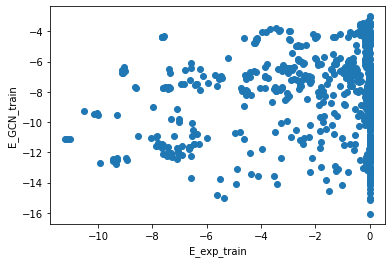

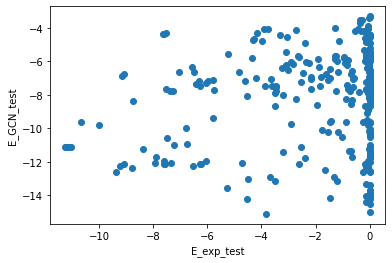

  1%|          | 1/100 [00:10<17:05, 10.36s/it]

INFO:__main__:1. time: 6.86 loss: 44.691 rmse: (6.611252510451289, 6.999249837831822) r2: (-4.865106056979497, -4.7846576347402285)


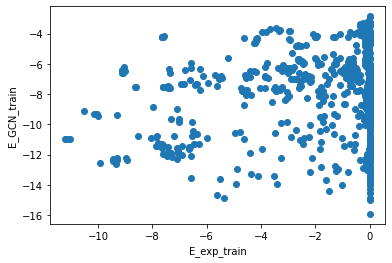

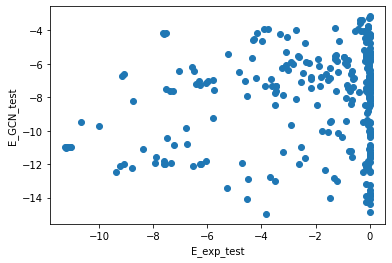

  2%|▏         | 2/100 [00:17<13:48,  8.45s/it]

INFO:__main__:2. time: 7.26 loss: 42.364 rmse: (6.336482263068372, 6.730536404337739) r2: (-4.387717638030431, -4.349017561414388)


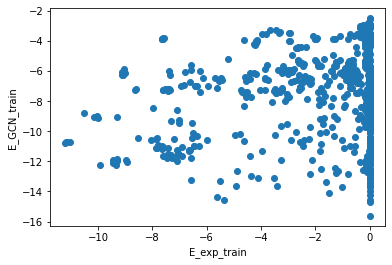

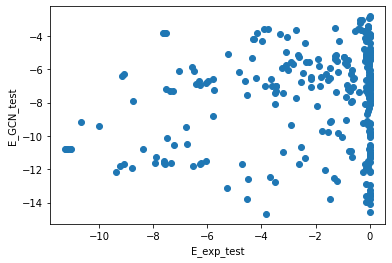

  3%|▎         | 3/100 [00:25<13:01,  8.06s/it]

INFO:__main__:3. time: 6.77 loss: 37.193 rmse: (5.799414142689498, 6.203331398656328) r2: (-3.513117353168994, -3.5438567824997174)


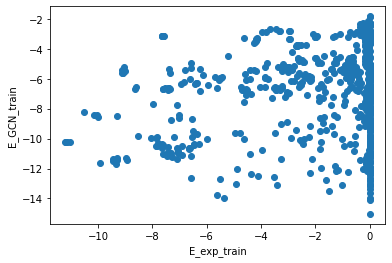

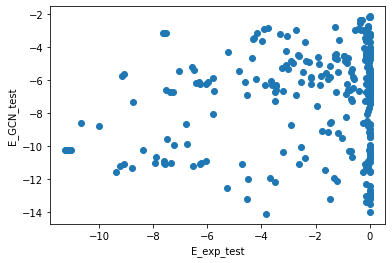

  4%|▍         | 4/100 [00:32<12:15,  7.67s/it]

INFO:__main__:4. time: 7.05 loss: 29.239 rmse: (4.965449048130907, 5.379007069925972) r2: (-2.3084565812663964, -2.4164801256760553)


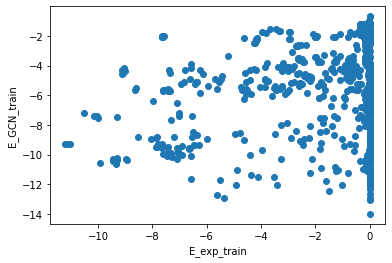

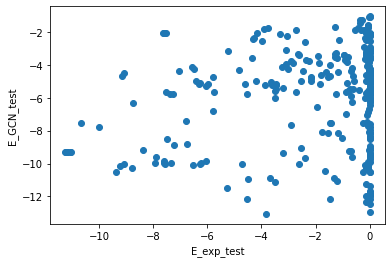

  5%|▌         | 5/100 [00:39<11:56,  7.54s/it]

INFO:__main__:5. time: 6.69 loss: 20.418 rmse: (4.068629422314307, 4.472774369517811) r2: (-1.2212868756689086, -1.3622651867583446)


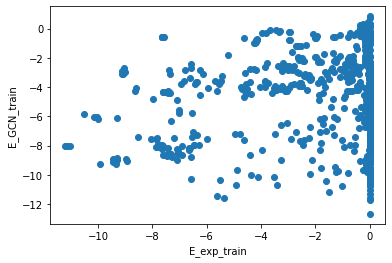

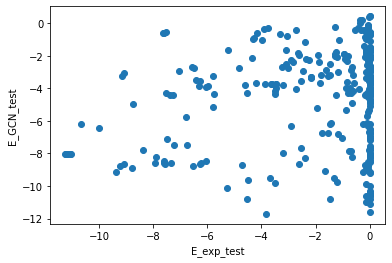

  6%|▌         | 6/100 [00:46<11:29,  7.33s/it]

INFO:__main__:6. time: 6.65 loss: 14.315 rmse: (3.556742406080286, 3.908701930419233) r2: (-0.6975133784352243, -0.8040134663194853)


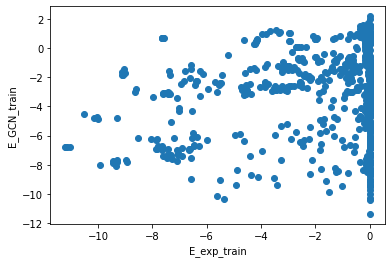

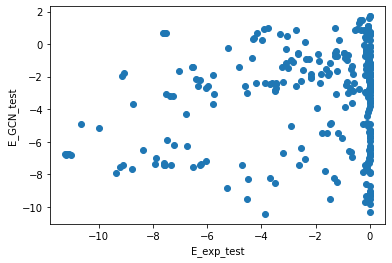

  7%|▋         | 7/100 [00:53<11:08,  7.19s/it]

INFO:__main__:7. time: 6.66 loss: 12.202 rmse: (3.4287869201914356, 3.740466383201838) r2: (-0.5775726698044119, -0.6520613857517861)


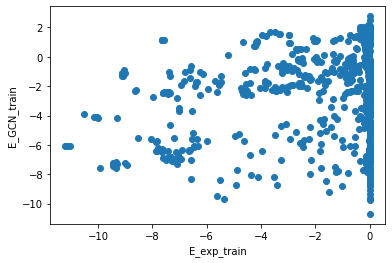

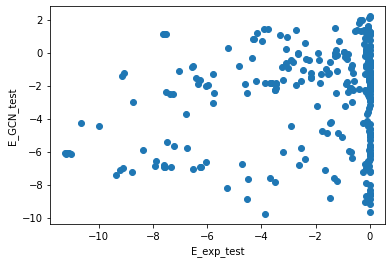

  8%|▊         | 8/100 [01:00<10:53,  7.10s/it]

INFO:__main__:8. time: 6.45 loss: 11.525 rmse: (3.367731004373281, 3.6683004951944156) r2: (-0.5218896735342275, -0.5889289481507913)


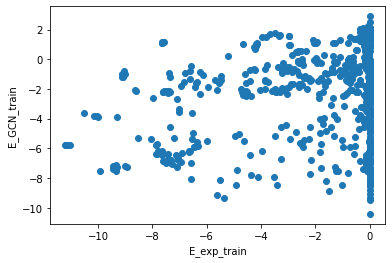

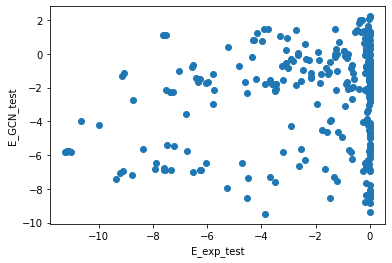

  9%|▉         | 9/100 [01:06<10:34,  6.98s/it]

INFO:__main__:9. time: 5.89 loss: 11.181 rmse: (3.3191787479377934, 3.616461048120082) r2: (-0.47832411763158666, -0.544337623956832)


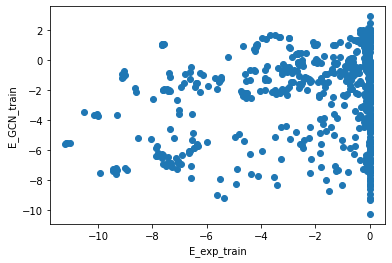

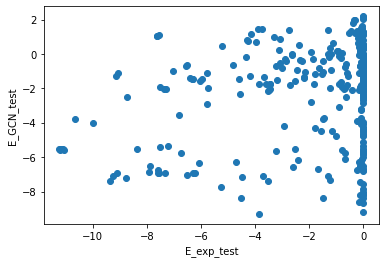

 10%|█         | 10/100 [01:13<10:04,  6.72s/it]

INFO:__main__:10. time: 6.49 loss: 10.846 rmse: (3.2682202310724757, 3.5624875907390217) r2: (-0.4332798917654843, -0.49858502665559246)


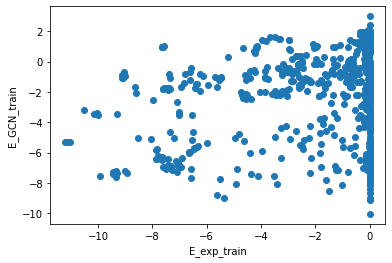

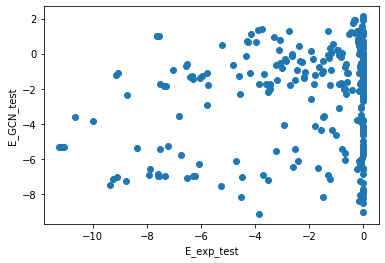

 11%|█         | 11/100 [01:19<10:01,  6.76s/it]

INFO:__main__:11. time: 6.46 loss: 10.491 rmse: (3.2016921188732743, 3.5009544907126133) r2: (-0.3755219142781061, -0.4472634662728565)


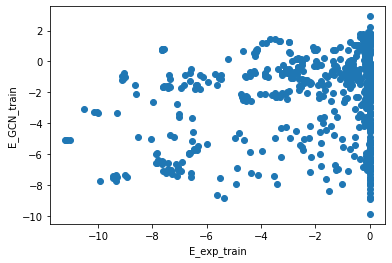

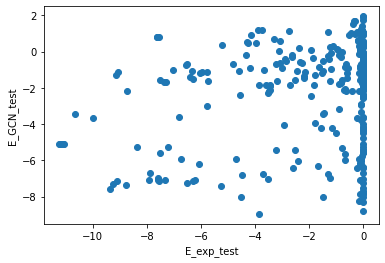

 12%|█▏        | 12/100 [01:26<09:54,  6.75s/it]

INFO:__main__:12. time: 6.44 loss: 10.038 rmse: (3.1299308031982216, 3.4305781963447326) r2: (-0.3145522484013721, -0.3896624243077962)


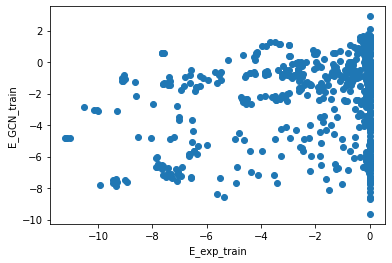

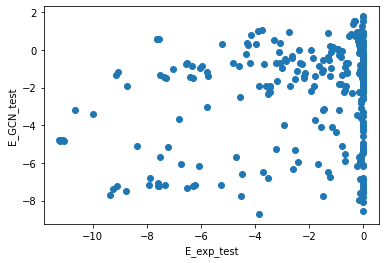

 13%|█▎        | 13/100 [01:33<09:45,  6.73s/it]

INFO:__main__:13. time: 6.05 loss: 9.62 rmse: (3.0675328576092484, 3.3720588220201932) r2: (-0.2626611743546985, -0.3426566034989653)


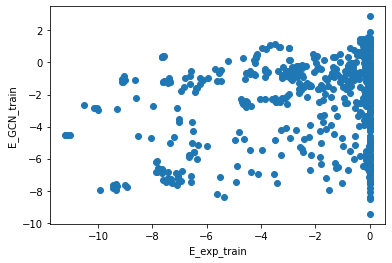

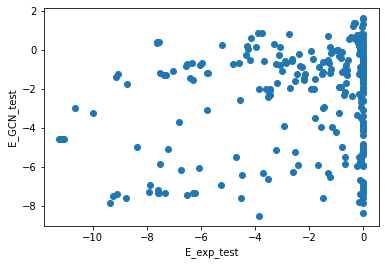

 14%|█▍        | 14/100 [01:39<09:27,  6.59s/it]

INFO:__main__:14. time: 5.71 loss: 9.265 rmse: (3.003669258460044, 3.3119753248760597) r2: (-0.21063325464062466, -0.2952358411931286)


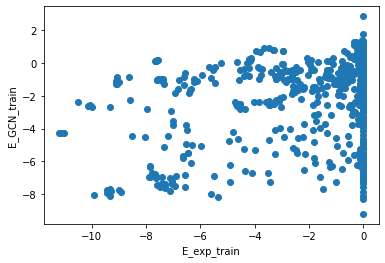

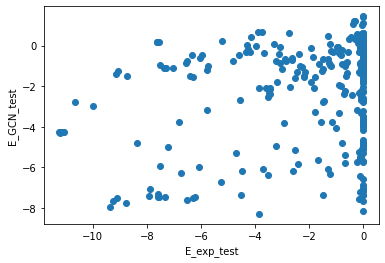

 15%|█▌        | 15/100 [01:45<09:03,  6.40s/it]

INFO:__main__:15. time: 6.49 loss: 8.915 rmse: (2.95101420268715, 3.260754377891849) r2: (-0.1685599003740248, -0.25548301181011457)


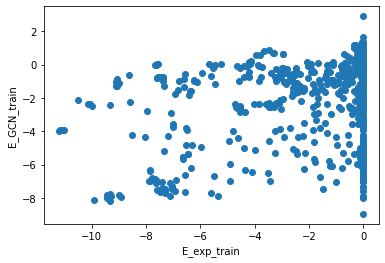

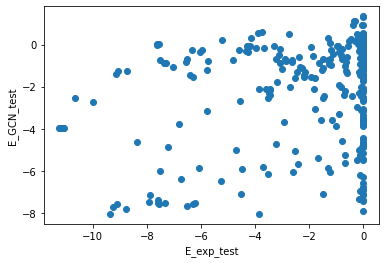

 16%|█▌        | 16/100 [01:52<09:06,  6.50s/it]

INFO:__main__:16. time: 6.25 loss: 8.661 rmse: (2.902553880032883, 3.2192889543885683) r2: (-0.13049581881518368, -0.22375530498258134)


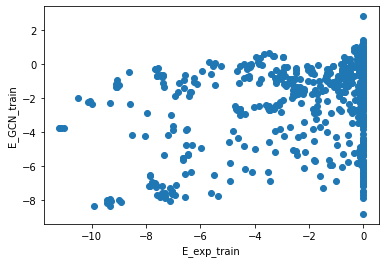

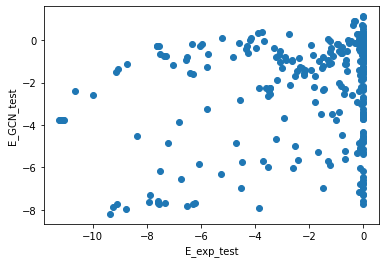

 17%|█▋        | 17/100 [01:58<08:59,  6.50s/it]

INFO:__main__:17. time: 6.92 loss: 8.366 rmse: (2.863627598229184, 3.1821363364147994) r2: (-0.10037688397080347, -0.19567248139920945)


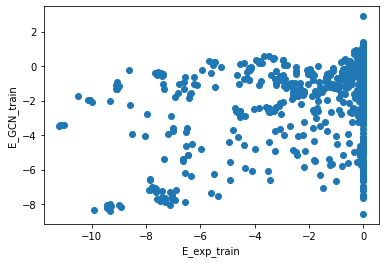

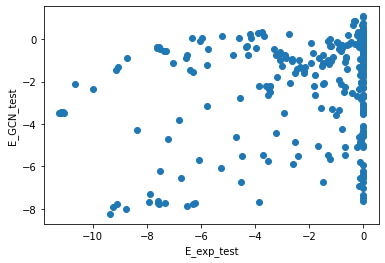

 18%|█▊        | 18/100 [02:05<09:09,  6.70s/it]

INFO:__main__:18. time: 6.42 loss: 8.082 rmse: (2.8314383055507437, 3.155853882449071) r2: (-0.07577782080514672, -0.17600303460368005)


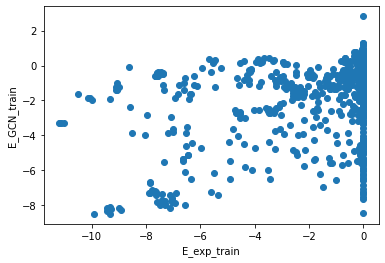

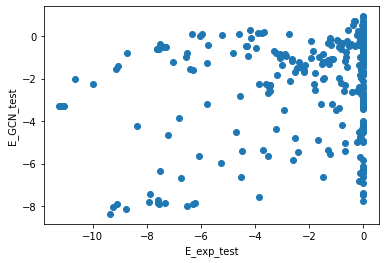

 19%|█▉        | 19/100 [02:12<09:01,  6.69s/it]

INFO:__main__:19. time: 6.17 loss: 7.938 rmse: (2.800055809793845, 3.1301779297396695) r2: (-0.05206301933549451, -0.15694501320855347)


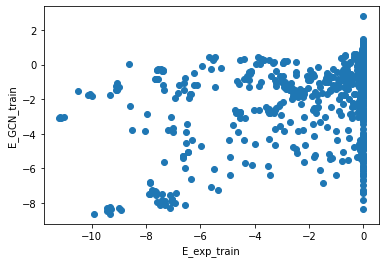

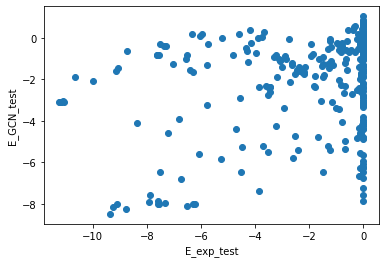

 20%|██        | 20/100 [02:19<08:48,  6.61s/it]

INFO:__main__:20. time: 6.52 loss: 7.849 rmse: (2.777005193170342, 3.1120691798234046) r2: (-0.03481273243873639, -0.14359738514009357)


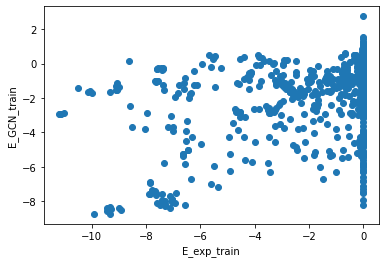

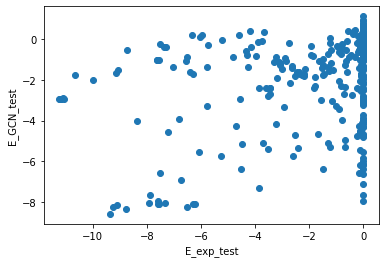

 21%|██        | 21/100 [02:25<08:46,  6.66s/it]

INFO:__main__:21. time: 6.19 loss: 7.679 rmse: (2.7567297256417977, 3.0960578868011703) r2: (-0.019757148359017984, -0.13186026171681453)


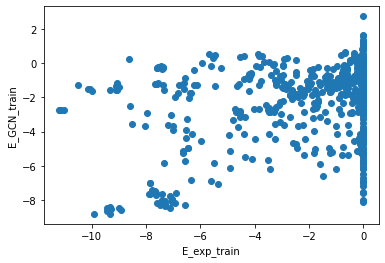

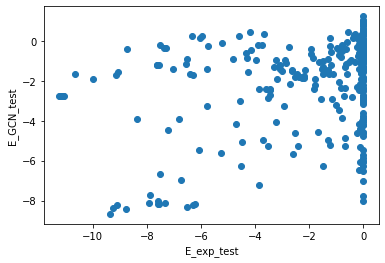

 22%|██▏       | 22/100 [02:32<08:33,  6.59s/it]

INFO:__main__:22. time: 6.48 loss: 7.604 rmse: (2.739399604350949, 3.0829578139750886) r2: (-0.006976086825017047, -0.12230224738828732)


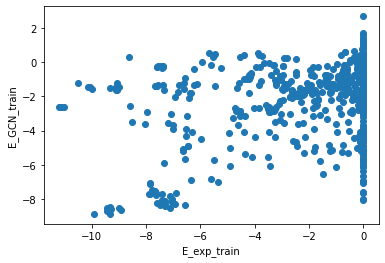

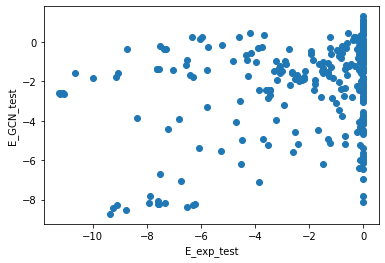

 23%|██▎       | 23/100 [02:38<08:29,  6.62s/it]

INFO:__main__:23. time: 6.46 loss: 7.485 rmse: (2.7241660589378474, 3.0710944618486486) r2: (0.004192173754548945, -0.11368153272142534)


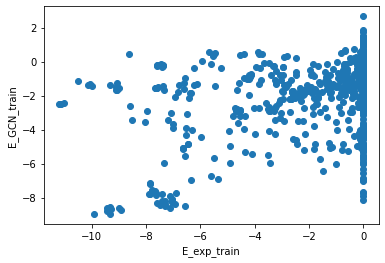

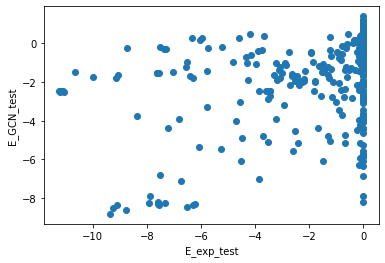

 24%|██▍       | 24/100 [02:45<08:25,  6.65s/it]

INFO:__main__:24. time: 6.07 loss: 7.414 rmse: (2.7132496065739766, 3.0636892854298745) r2: (0.01215711245854012, -0.10831727868931562)


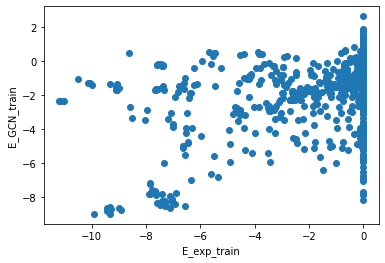

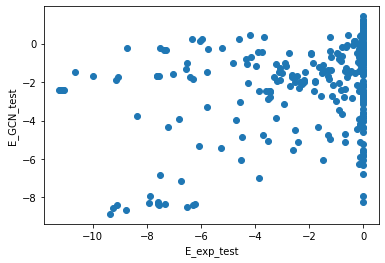

 25%|██▌       | 25/100 [02:51<08:11,  6.55s/it]

INFO:__main__:25. time: 6.55 loss: 7.369 rmse: (2.699786166403045, 3.0530783344401855) r2: (0.021936357349597535, -0.10065335875879322)


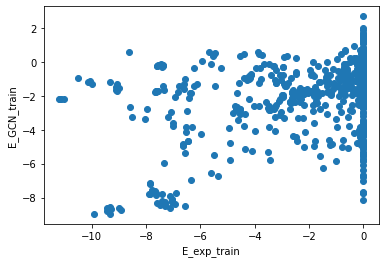

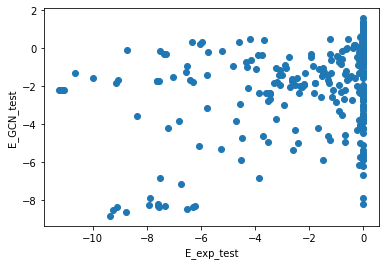

 26%|██▌       | 26/100 [02:58<08:09,  6.62s/it]

INFO:__main__:26. time: 5.97 loss: 7.325 rmse: (2.691439997580149, 3.0476452364800775) r2: (0.027974218145952467, -0.09673951439941719)


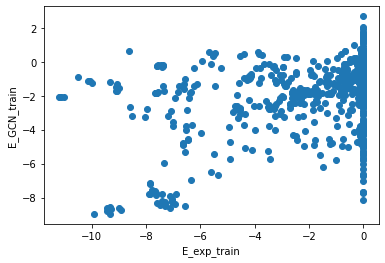

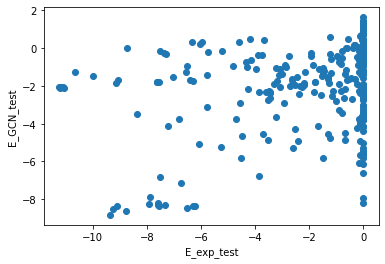

 27%|██▋       | 27/100 [03:04<07:55,  6.51s/it]

INFO:__main__:27. time: 6.88 loss: 7.218 rmse: (2.6823499476756, 3.0411226187348195) r2: (0.034528956095021046, -0.09205002009968344)


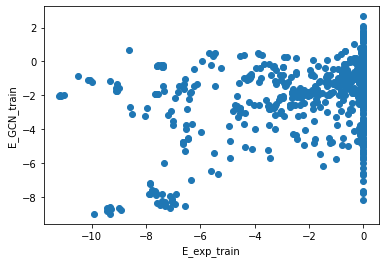

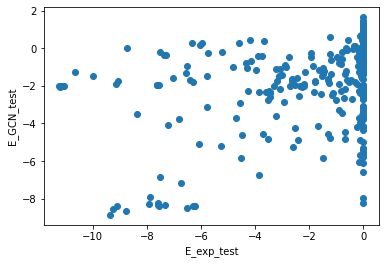

 28%|██▊       | 28/100 [03:12<08:01,  6.69s/it]

INFO:__main__:28. time: 6.46 loss: 7.202 rmse: (2.6773001929070745, 3.038023937613525) r2: (0.03816069910409592, -0.08982571596978928)


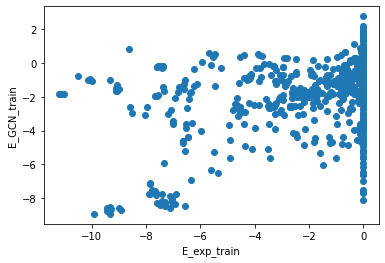

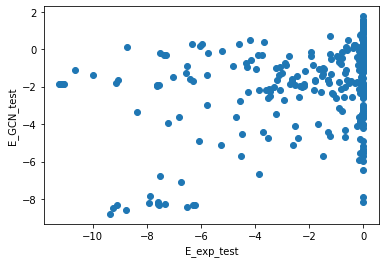

 29%|██▉       | 29/100 [03:18<07:56,  6.71s/it]

INFO:__main__:29. time: 6.28 loss: 7.179 rmse: (2.6683620198732294, 3.031654025274742) r2: (0.04457218439718602, -0.0852603691699445)


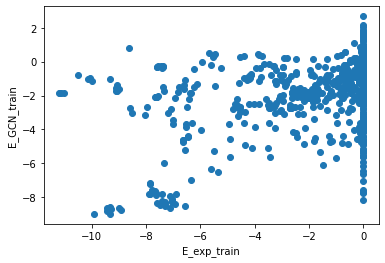

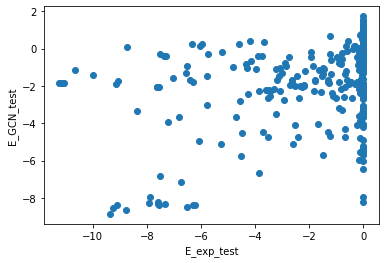

 30%|███       | 30/100 [03:25<07:45,  6.65s/it]

INFO:__main__:30. time: 6.25 loss: 7.15 rmse: (2.661973384882826, 3.0274224717744938) r2: (0.04914170871596224, -0.08223289155839764)


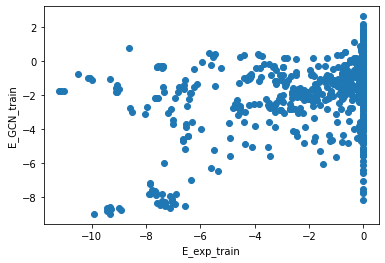

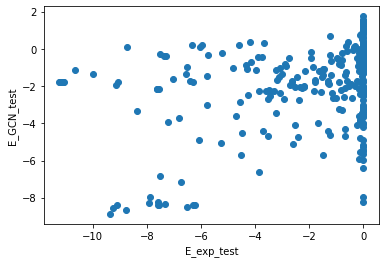

 31%|███       | 31/100 [03:31<07:35,  6.60s/it]

INFO:__main__:31. time: 5.84 loss: 7.145 rmse: (2.6553775877219636, 3.023046069970195) r2: (0.05384791542058476, -0.07910623007174244)


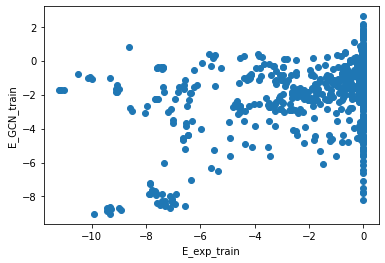

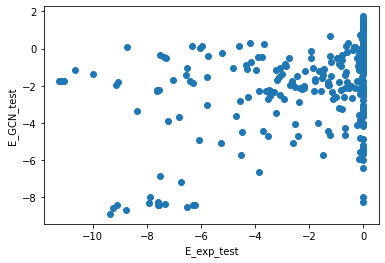

 32%|███▏      | 32/100 [03:38<07:22,  6.50s/it]

INFO:__main__:32. time: 6.27 loss: 7.033 rmse: (2.650209963590175, 3.018865660344875) r2: (0.05752694079367171, -0.07612381638550247)


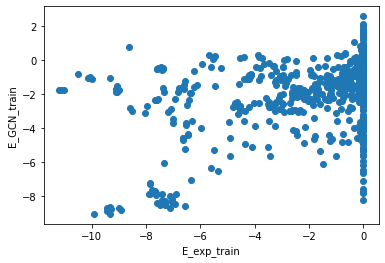

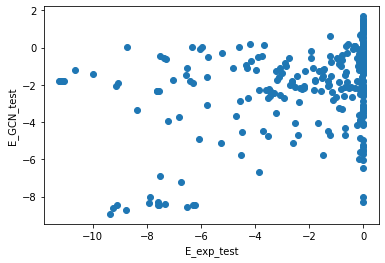

 33%|███▎      | 33/100 [03:44<07:15,  6.50s/it]

INFO:__main__:33. time: 6.04 loss: 7.045 rmse: (2.6452773528185367, 3.015397310481037) r2: (0.06103196610877881, -0.07365253725954557)


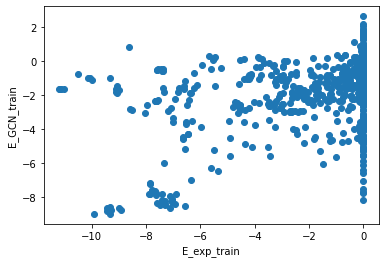

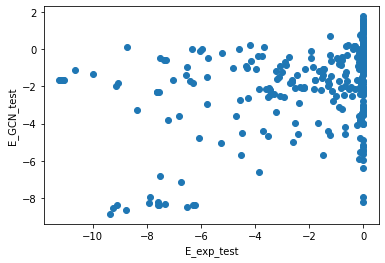

 34%|███▍      | 34/100 [03:50<07:05,  6.44s/it]

INFO:__main__:34. time: 5.99 loss: 7.022 rmse: (2.639697313704762, 3.0110603238224227) r2: (0.06498917096074763, -0.07056633160591708)


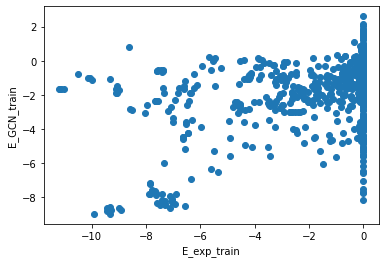

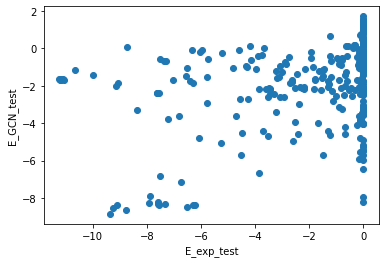

 35%|███▌      | 35/100 [03:57<06:54,  6.38s/it]

INFO:__main__:35. time: 6.38 loss: 6.941 rmse: (2.634778306455181, 3.007336443384698) r2: (0.0684706607977511, -0.06791995765679526)


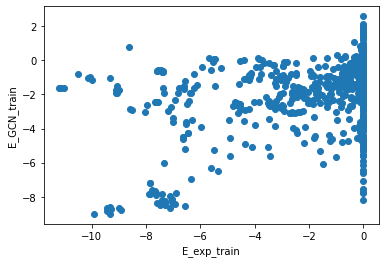

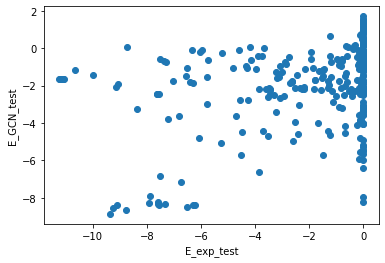

 36%|███▌      | 36/100 [04:03<06:52,  6.45s/it]

INFO:__main__:36. time: 6.05 loss: 6.941 rmse: (2.6307660723886017, 3.0053015879434515) r2: (0.07130556193622106, -0.0664752722367703)


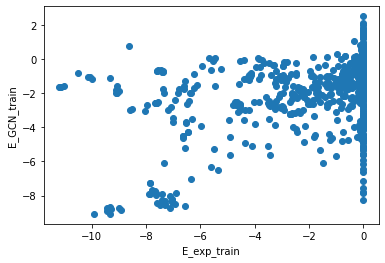

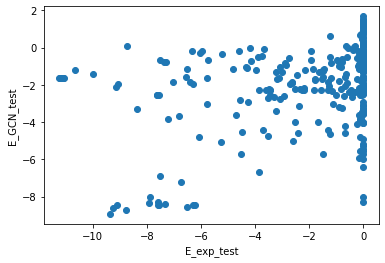

 37%|███▋      | 37/100 [04:10<06:43,  6.41s/it]

INFO:__main__:37. time: 6.34 loss: 6.911 rmse: (2.6264939487008774, 3.0017293906178577) r2: (0.07431934269189322, -0.06394148595135651)


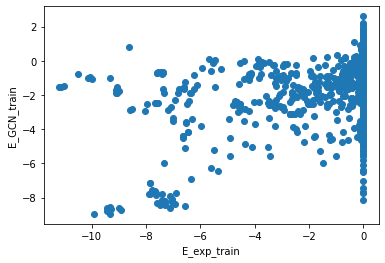

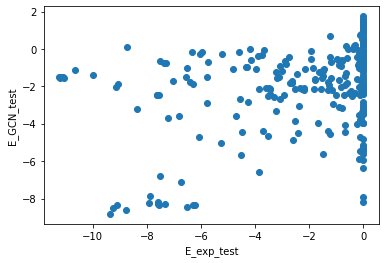

 38%|███▊      | 38/100 [04:16<06:40,  6.46s/it]

INFO:__main__:38. time: 5.98 loss: 6.935 rmse: (2.6239512541811827, 3.0000670604464337) r2: (0.07611076796603133, -0.06276341019613763)


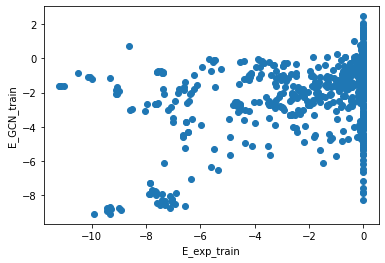

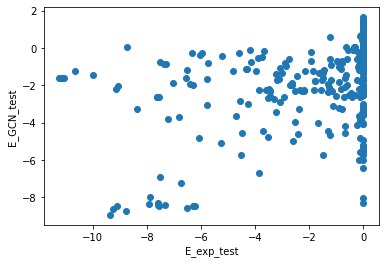

 39%|███▉      | 39/100 [04:22<06:31,  6.41s/it]

INFO:__main__:39. time: 6.07 loss: 6.886 rmse: (2.6178000287806604, 2.99506838514785) r2: (0.08043736483119324, -0.05922483364835407)


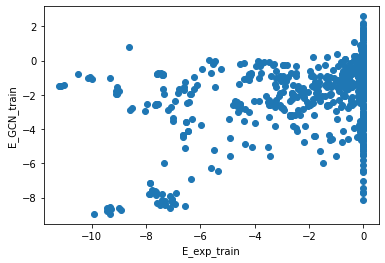

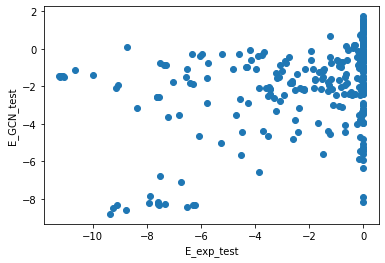

 40%|████      | 40/100 [04:29<06:22,  6.38s/it]

INFO:__main__:40. time: 6.61 loss: 6.844 rmse: (2.6142221309594174, 2.992576836471108) r2: (0.08294928531977941, -0.05746326284129655)


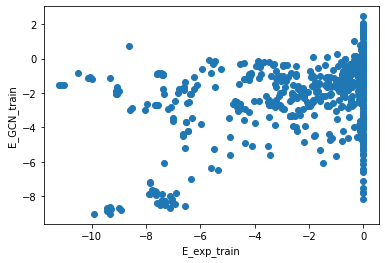

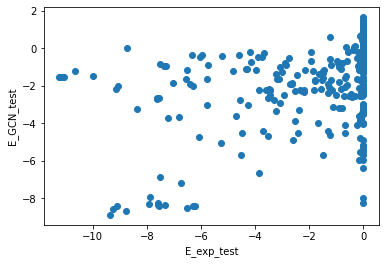

 41%|████      | 41/100 [04:36<06:24,  6.52s/it]

INFO:__main__:41. time: 6.1 loss: 6.885 rmse: (2.609540010193087, 2.9890495624097357) r2: (0.08623125364057405, -0.05497192194309353)


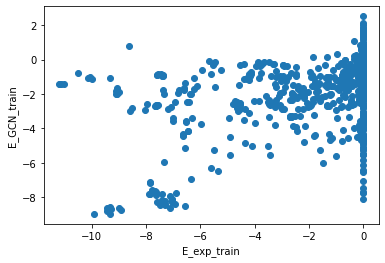

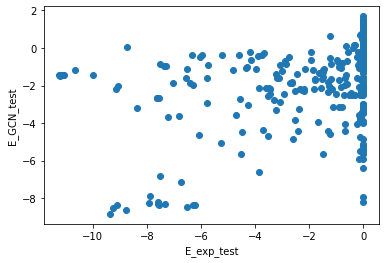

 42%|████▏     | 42/100 [04:42<06:15,  6.47s/it]

INFO:__main__:42. time: 6.8 loss: 6.798 rmse: (2.60557634822617, 2.985901456727513) r2: (0.08900501435005459, -0.05275087201617401)


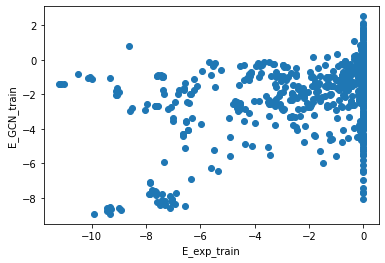

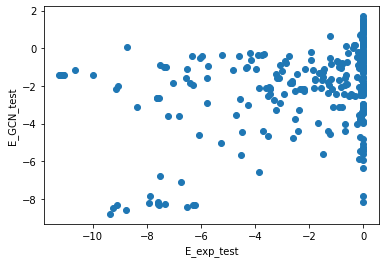

 43%|████▎     | 43/100 [04:49<06:18,  6.64s/it]

INFO:__main__:43. time: 6.05 loss: 6.814 rmse: (2.6026117199166245, 2.983424973076874) r2: (0.09107689764841453, -0.051005309278915334)


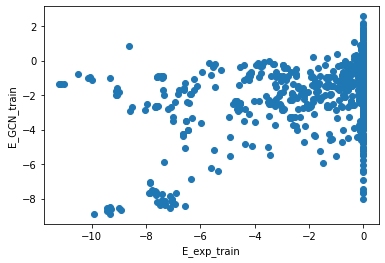

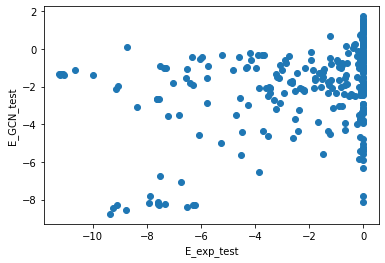

 44%|████▍     | 44/100 [04:55<06:06,  6.55s/it]

INFO:__main__:44. time: 5.91 loss: 6.769 rmse: (2.5985247603319612, 2.980524939115469) r2: (0.09392927495748726, -0.04896304594749101)


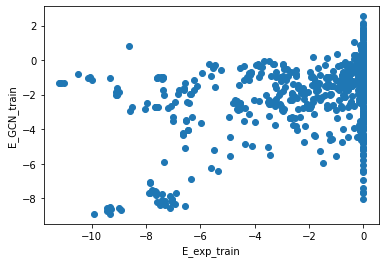

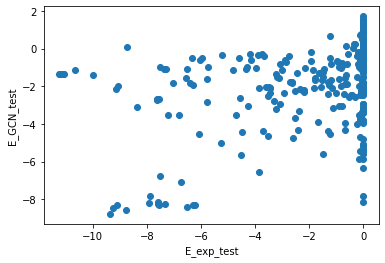

 45%|████▌     | 45/100 [05:01<05:53,  6.43s/it]

INFO:__main__:45. time: 6.5 loss: 6.757 rmse: (2.5949210894590364, 2.9777038590422102) r2: (0.09644063573502704, -0.04697828933258141)


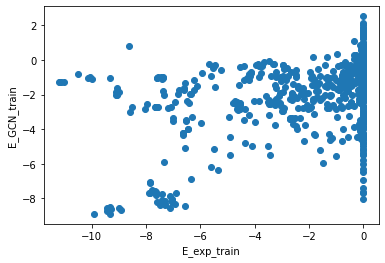

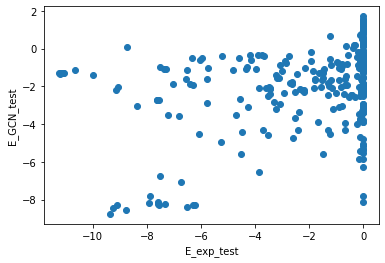

 46%|████▌     | 46/100 [05:08<05:52,  6.52s/it]

INFO:__main__:46. time: 6.14 loss: 6.841 rmse: (2.597402532470723, 2.9806816664318947) r2: (0.09471171756513797, -0.049073365766313826)


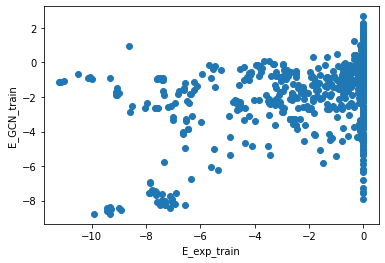

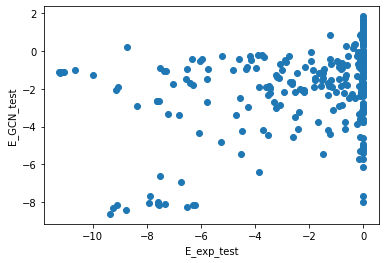

 47%|████▋     | 47/100 [05:15<05:44,  6.49s/it]

INFO:__main__:47. time: 6.68 loss: 6.698 rmse: (2.5891265721449477, 2.97325851559412) r2: (0.1004714671113156, -0.043854604612466375)


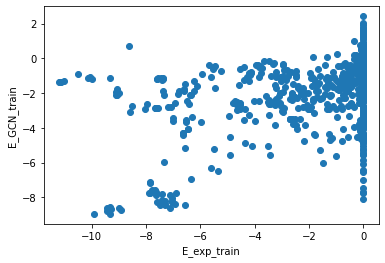

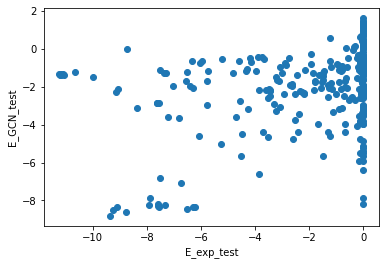

 48%|████▊     | 48/100 [05:22<05:44,  6.62s/it]

INFO:__main__:48. time: 5.89 loss: 6.705 rmse: (2.5851975861187806, 2.9698016217855) r2: (0.10319945536980024, -0.041428716132418275)


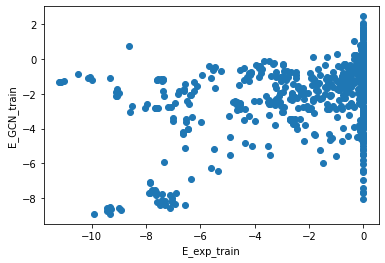

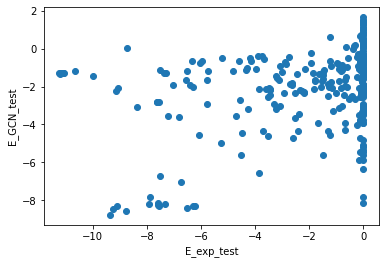

 49%|████▉     | 49/100 [05:28<05:30,  6.47s/it]

INFO:__main__:49. time: 6.46 loss: 6.676 rmse: (2.5818350661370117, 2.967310739371573) r2: (0.10553084284867276, -0.03968247922458579)


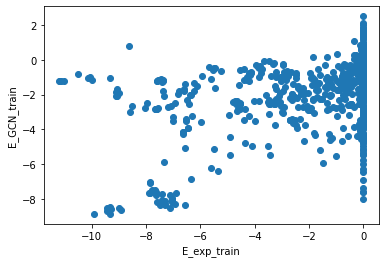

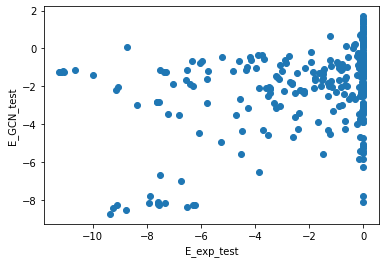

 50%|█████     | 50/100 [05:34<05:26,  6.54s/it]

INFO:__main__:50. time: 6.73 loss: 6.734 rmse: (2.583339652578919, 2.9689978171054303) r2: (0.10448801999431523, -0.040865047512503416)


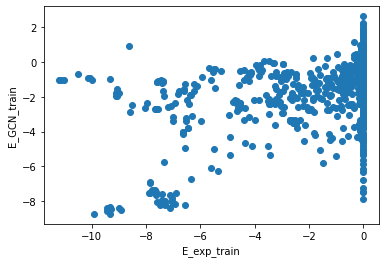

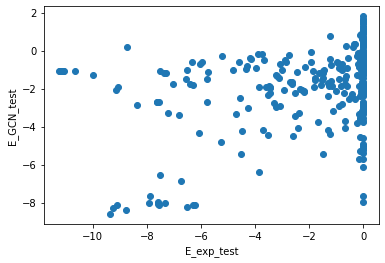

 51%|█████     | 51/100 [05:41<05:26,  6.67s/it]

INFO:__main__:51. time: 6.11 loss: 6.659 rmse: (2.5753405439185686, 2.961769396847913) r2: (0.11002519922884968, -0.03580296825249851)


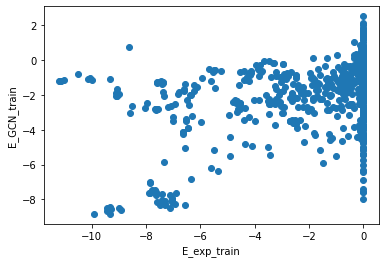

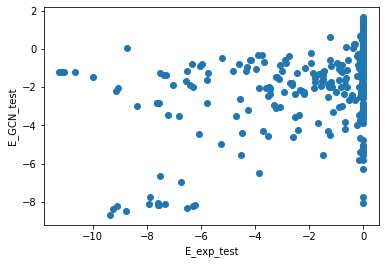

 52%|█████▏    | 52/100 [05:48<05:16,  6.60s/it]

INFO:__main__:52. time: 6.42 loss: 6.653 rmse: (2.57222210885744, 2.958785579728111) r2: (0.1121792043216695, -0.03371699234509862)


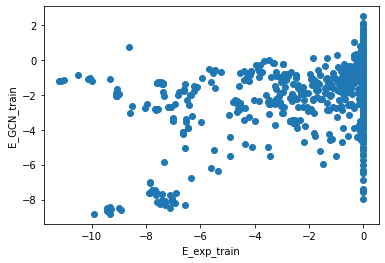

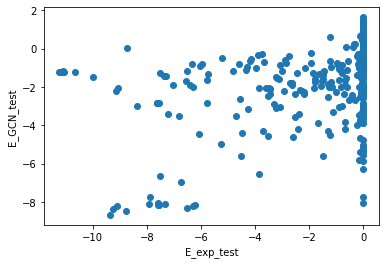

 53%|█████▎    | 53/100 [05:55<05:12,  6.65s/it]

INFO:__main__:53. time: 6.34 loss: 6.61 rmse: (2.569216639265163, 2.956517935141999) r2: (0.11425271074226506, -0.03213309624614413)


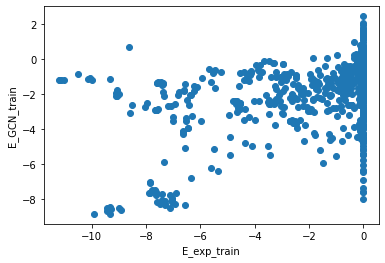

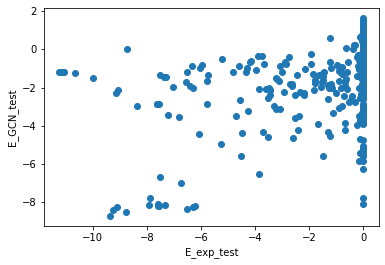

 54%|█████▍    | 54/100 [06:01<05:05,  6.64s/it]

INFO:__main__:54. time: 6.04 loss: 6.617 rmse: (2.5687725939526485, 2.9557364712457077) r2: (0.1145588569326833, -0.03158754355743709)


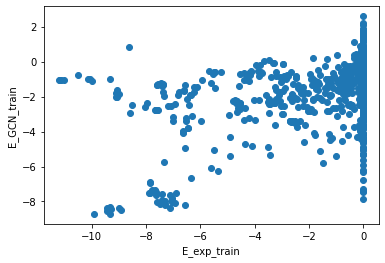

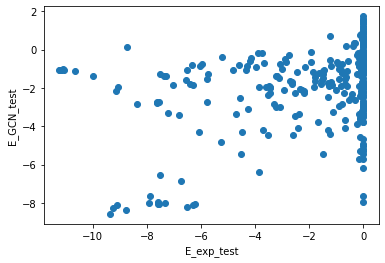

 55%|█████▌    | 55/100 [06:07<04:53,  6.53s/it]

INFO:__main__:55. time: 6.39 loss: 6.621 rmse: (2.5634753227656812, 2.9510431645435653) r2: (0.11820696935738173, -0.028314103646300604)


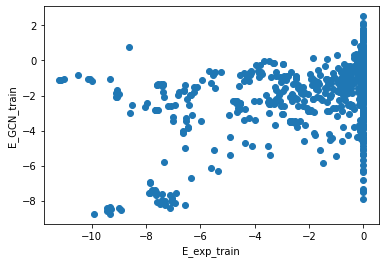

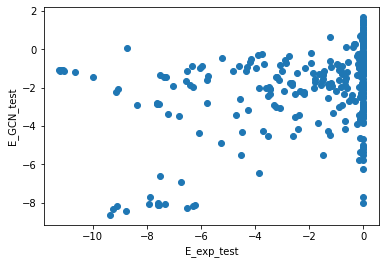

 56%|█████▌    | 56/100 [06:14<04:49,  6.57s/it]

INFO:__main__:56. time: 6.25 loss: 6.582 rmse: (2.560558053175943, 2.9497437961987623) r2: (0.12021281216068869, -0.027408752853712137)


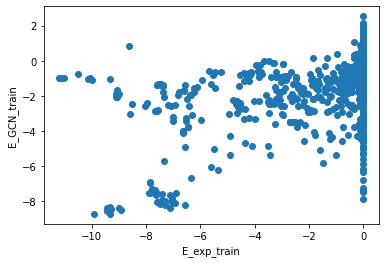

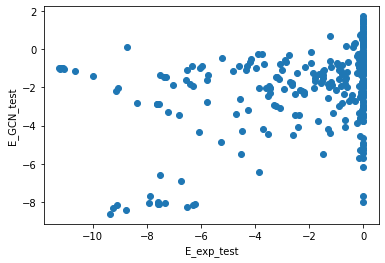

 57%|█████▋    | 57/100 [06:21<04:42,  6.56s/it]

INFO:__main__:57. time: 6.06 loss: 6.614 rmse: (2.558241383214579, 2.9468767491148924) r2: (0.12180407038332619, -0.025412513215102406)


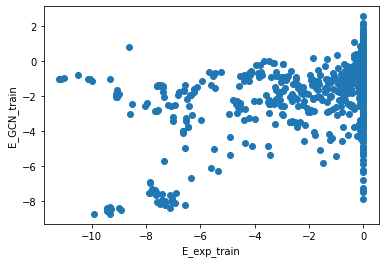

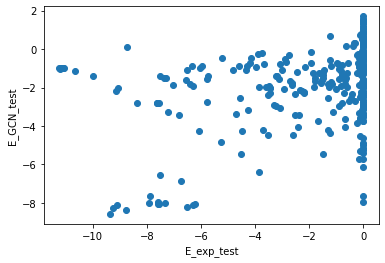

 58%|█████▊    | 58/100 [06:27<04:32,  6.49s/it]

INFO:__main__:58. time: 6.11 loss: 6.533 rmse: (2.558226241610824, 2.9465463052295475) r2: (0.12181446600550694, -0.025182559724646003)


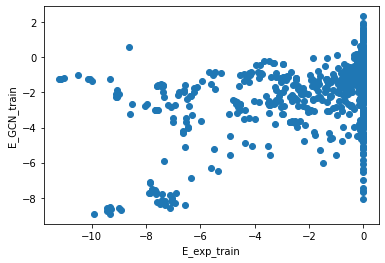

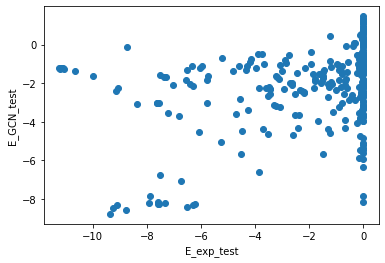

 59%|█████▉    | 59/100 [06:33<04:24,  6.46s/it]

INFO:__main__:59. time: 6.16 loss: 6.509 rmse: (2.5510103733163856, 2.9403312822658303) r2: (0.12676159225370975, -0.020862374062239564)


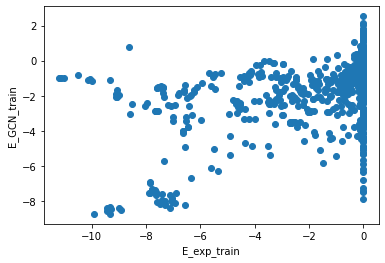

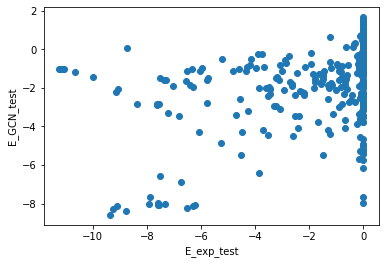

 60%|██████    | 60/100 [06:40<04:17,  6.44s/it]

INFO:__main__:60. time: 6.12 loss: 6.527 rmse: (2.547641463464593, 2.9367196039199563) r2: (0.12906649776736312, -0.01835601559721467)


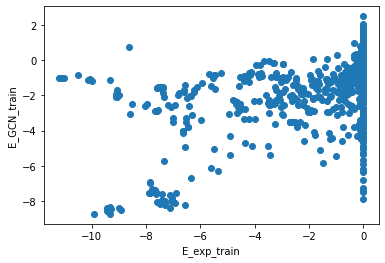

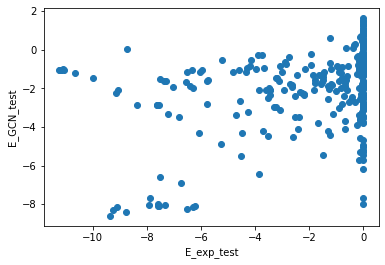

 61%|██████    | 61/100 [06:46<04:10,  6.42s/it]

INFO:__main__:61. time: 5.45 loss: 6.497 rmse: (2.544804944037651, 2.934371913310985) r2: (0.13100479604306703, -0.016728465440103646)


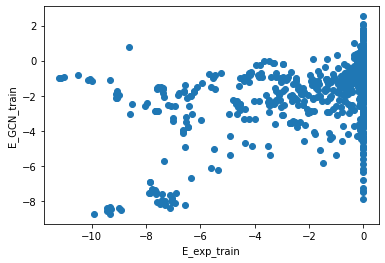

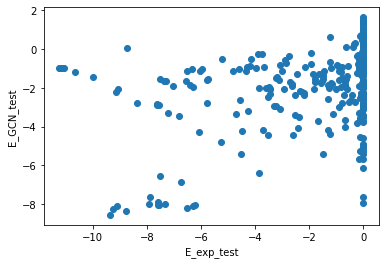

 62%|██████▏   | 62/100 [06:52<03:55,  6.20s/it]

INFO:__main__:62. time: 6.28 loss: 6.495 rmse: (2.545118631038724, 2.9337139437515534) r2: (0.13079054834541226, -0.01627255773755465)


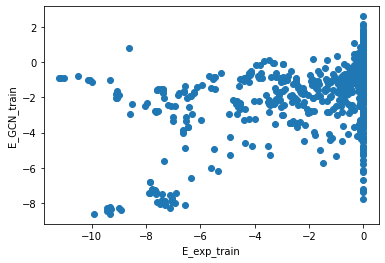

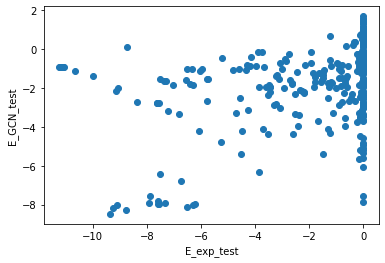

 63%|██████▎   | 63/100 [06:58<03:53,  6.30s/it]

INFO:__main__:63. time: 6.6 loss: 6.507 rmse: (2.5388984784067357, 2.928518431457283) r2: (0.1350339723124574, -0.012676173587846007)


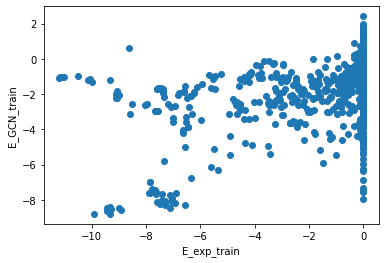

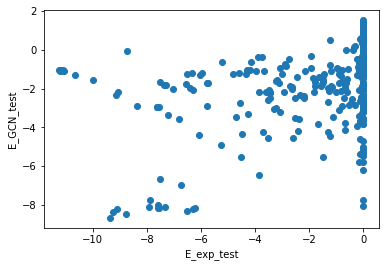

 64%|██████▍   | 64/100 [07:05<03:53,  6.48s/it]

INFO:__main__:64. time: 6.65 loss: 6.443 rmse: (2.535227280535777, 2.9247939490647172) r2: (0.13753361193059366, -0.010101973527119057)


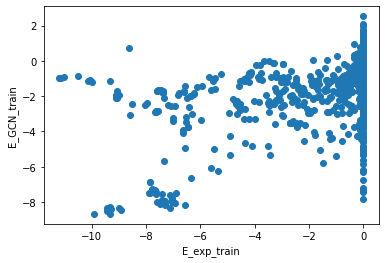

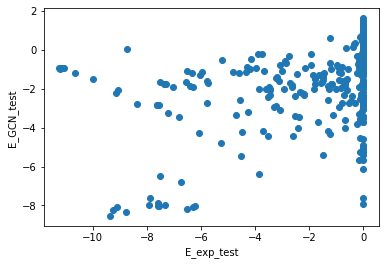

 65%|██████▌   | 65/100 [07:12<03:51,  6.63s/it]

INFO:__main__:65. time: 6.15 loss: 6.432 rmse: (2.531839356693875, 2.9221044201435427) r2: (0.1398371671892772, -0.008245125193665936)


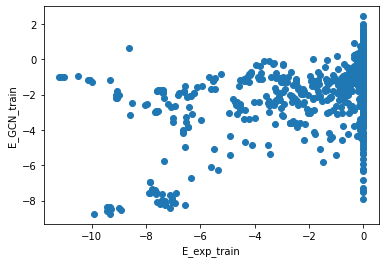

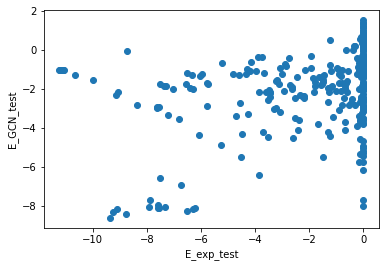

 66%|██████▌   | 66/100 [07:19<03:43,  6.57s/it]

INFO:__main__:66. time: 5.76 loss: 6.46 rmse: (2.528670177898306, 2.9195294467385695) r2: (0.14198920238014134, -0.0064689665657482465)


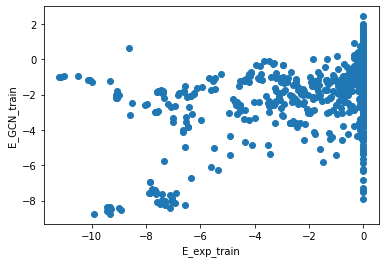

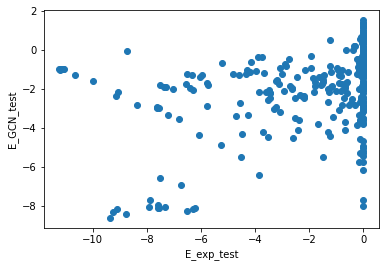

 67%|██████▋   | 67/100 [07:25<03:31,  6.39s/it]

INFO:__main__:67. time: 6.14 loss: 6.396 rmse: (2.5266662721018127, 2.9165912276064208) r2: (0.14334856632294202, -0.004444161987674944)


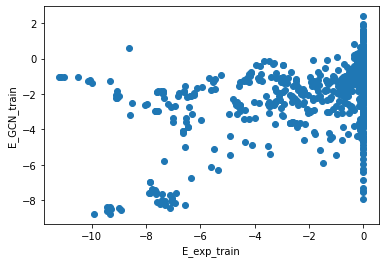

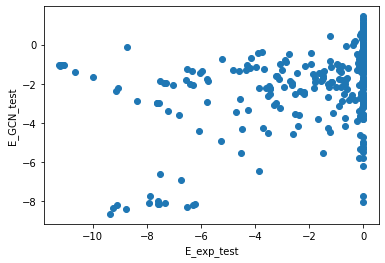

 68%|██████▊   | 68/100 [07:31<03:24,  6.40s/it]

INFO:__main__:68. time: 5.37 loss: 6.416 rmse: (2.523027700486202, 2.9135844261798334) r2: (0.14581406268719832, -0.002374206265601364)


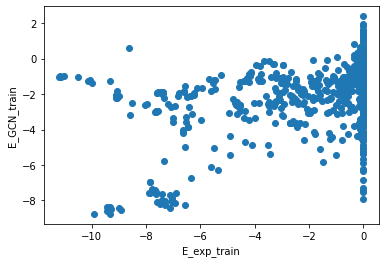

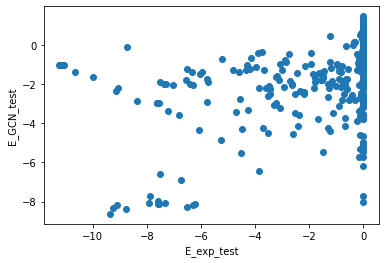

 69%|██████▉   | 69/100 [07:37<03:10,  6.16s/it]

INFO:__main__:69. time: 5.6 loss: 6.389 rmse: (2.5184650646429434, 2.909167808837498) r2: (0.14890068389641642, 0.0006624298483219881)


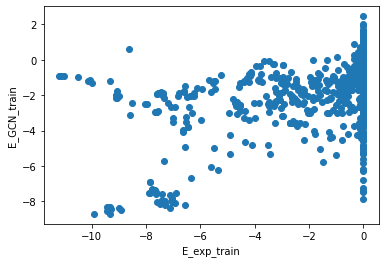

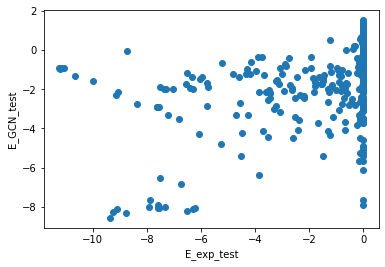

 70%|███████   | 70/100 [07:42<03:01,  6.06s/it]

INFO:__main__:70. time: 5.87 loss: 6.38 rmse: (2.5188909979315475, 2.9077770901591484) r2: (0.14861277663857475, 0.0016176619434827844)


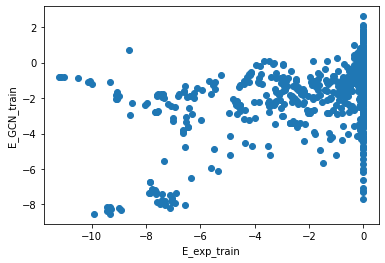

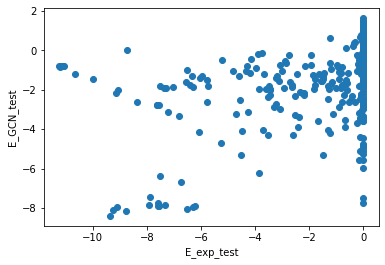

 71%|███████   | 71/100 [07:49<02:56,  6.07s/it]

INFO:__main__:71. time: 5.38 loss: 6.328 rmse: (2.511304053578336, 2.901767753223648) r2: (0.15373383946892916, 0.00573999741981579)


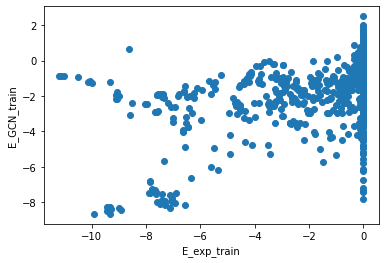

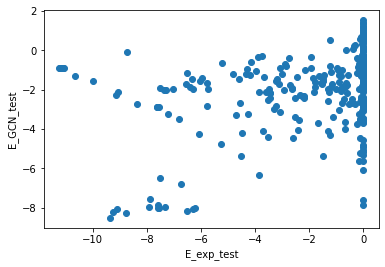

 72%|███████▏  | 72/100 [07:54<02:46,  5.93s/it]

INFO:__main__:72. time: 5.55 loss: 6.372 rmse: (2.508919666636067, 2.8987314415977834) r2: (0.1553400711442744, 0.00781962889478649)


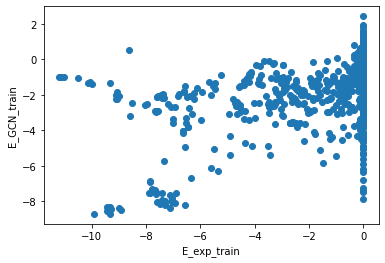

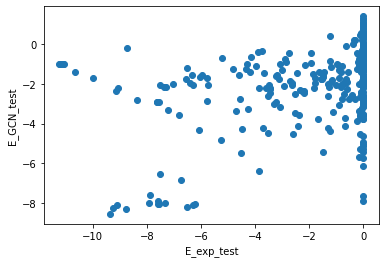

 73%|███████▎  | 73/100 [08:00<02:38,  5.88s/it]

INFO:__main__:73. time: 5.41 loss: 6.312 rmse: (2.5041224090092764, 2.894757454910889) r2: (0.15856709942616165, 0.010538203497286736)


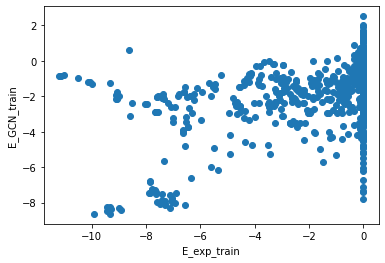

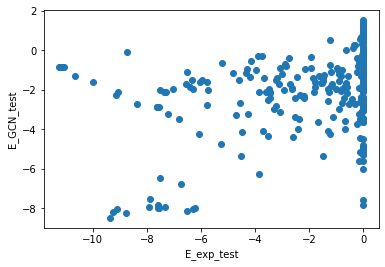

 74%|███████▍  | 74/100 [08:06<02:32,  5.85s/it]

INFO:__main__:74. time: 5.15 loss: 6.291 rmse: (2.5005044296885006, 2.8913775846343315) r2: (0.1609967631009096, 0.012847412625347832)


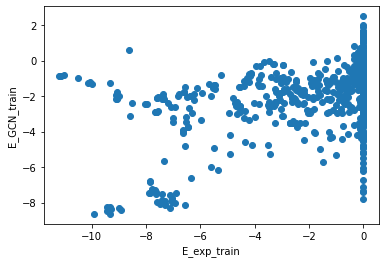

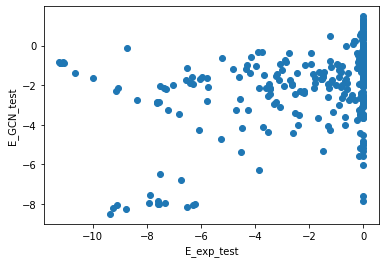

 75%|███████▌  | 75/100 [08:11<02:22,  5.71s/it]

INFO:__main__:75. time: 5.97 loss: 6.28 rmse: (2.4978683909611132, 2.888755923627936) r2: (0.1627647897738118, 0.014636736978584142)


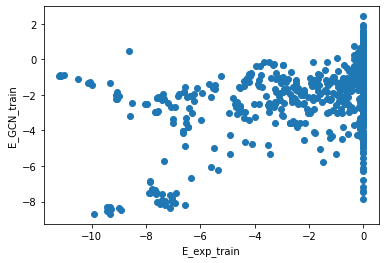

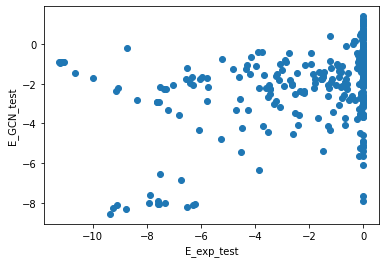

 76%|███████▌  | 76/100 [08:17<02:20,  5.86s/it]

INFO:__main__:76. time: 5.86 loss: 6.253 rmse: (2.4934502563943526, 2.8849759389424405) r2: (0.1657239100342658, 0.017213777929147023)


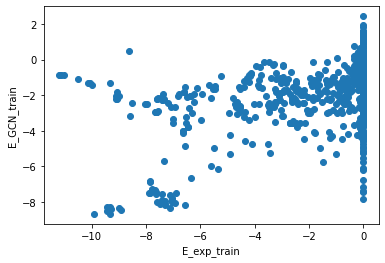

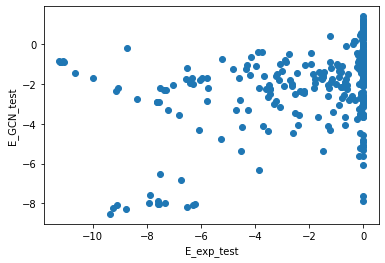

 77%|███████▋  | 77/100 [08:23<02:16,  5.94s/it]

INFO:__main__:77. time: 5.68 loss: 6.213 rmse: (2.4893287338170533, 2.880354470343542) r2: (0.16847964652868563, 0.02035992395825925)


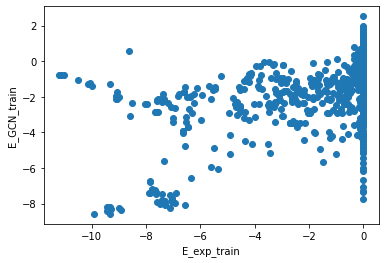

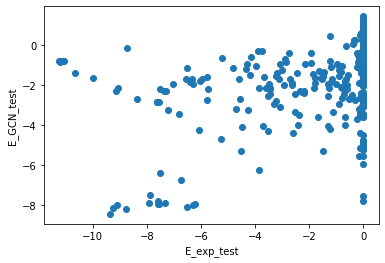

 78%|███████▊  | 78/100 [08:29<02:10,  5.93s/it]

INFO:__main__:78. time: 6.42 loss: 6.219 rmse: (2.4862970989053643, 2.8767284988950523) r2: (0.17050375132266882, 0.022824836627189482)


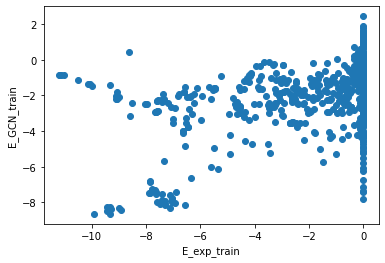

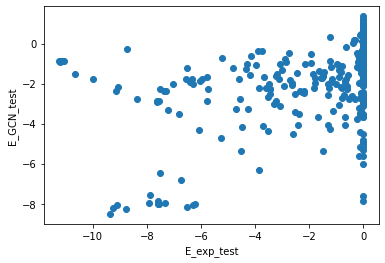

 79%|███████▉  | 79/100 [08:36<02:09,  6.17s/it]

INFO:__main__:79. time: 6.88 loss: 6.213 rmse: (2.4871844029808363, 2.8786730252297885) r2: (0.1699115881929134, 0.02150334588456415)


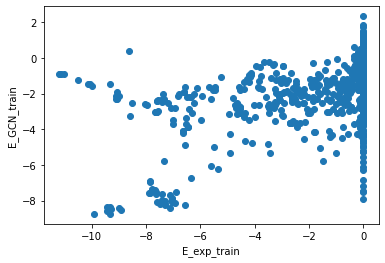

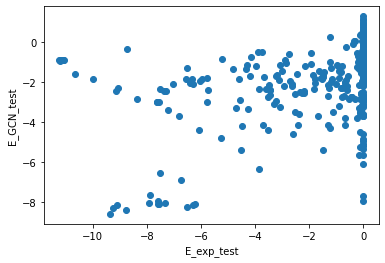

 80%|████████  | 80/100 [08:43<02:09,  6.47s/it]

INFO:__main__:80. time: 7.03 loss: 6.152 rmse: (2.480847010378518, 2.8705976069075088) r2: (0.1741363606746147, 0.026985515267002436)


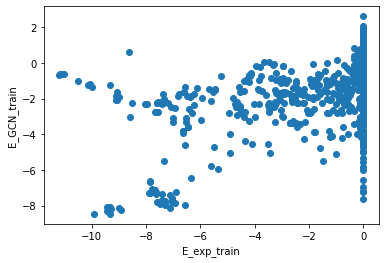

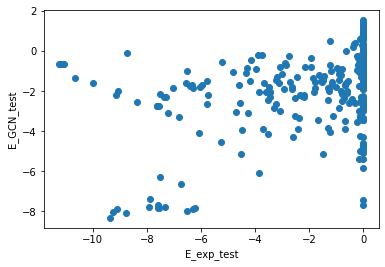

 81%|████████  | 81/100 [08:51<02:07,  6.73s/it]

INFO:__main__:81. time: 6.56 loss: 6.159 rmse: (2.473936174069443, 2.8646432341946633) r2: (0.17873112923989298, 0.031017903551272097)


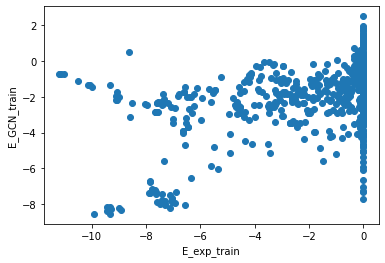

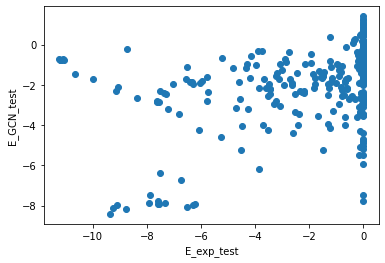

 82%|████████▏ | 82/100 [08:57<02:01,  6.75s/it]

INFO:__main__:82. time: 7.54 loss: 6.129 rmse: (2.470461628671715, 2.8626774713946306) r2: (0.1810363884991587, 0.03234730847572731)


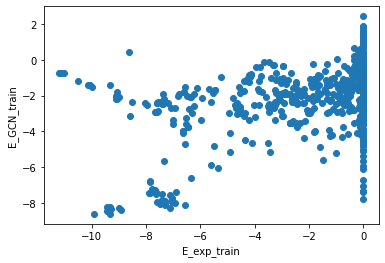

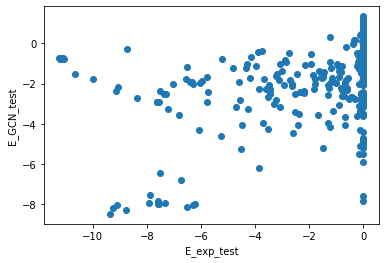

 83%|████████▎ | 83/100 [09:05<02:00,  7.07s/it]

INFO:__main__:83. time: 6.02 loss: 6.127 rmse: (2.468380185618542, 2.8588189549500207) r2: (0.18241581329906753, 0.03495409012467798)


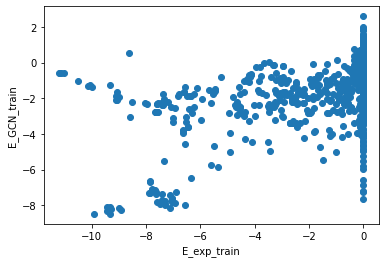

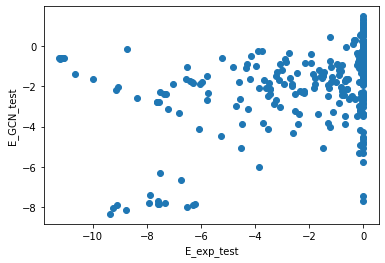

 84%|████████▍ | 84/100 [09:11<01:49,  6.83s/it]

INFO:__main__:84. time: 6.27 loss: 6.094 rmse: (2.4616800431908135, 2.8539018514630534) r2: (0.18684827140585025, 0.03827094917658824)


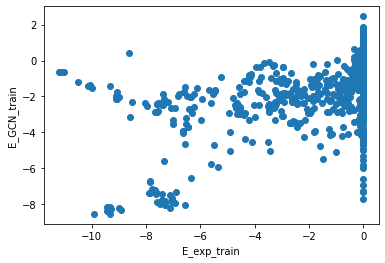

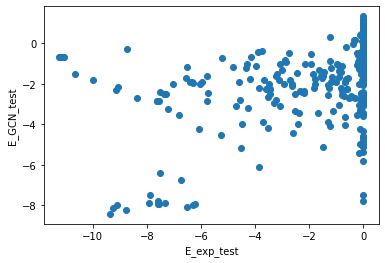

 85%|████████▌ | 85/100 [09:18<01:41,  6.73s/it]

INFO:__main__:85. time: 5.73 loss: 6.05 rmse: (2.4571809505385342, 2.8491653542705895) r2: (0.18981787080332257, 0.04146058016578902)


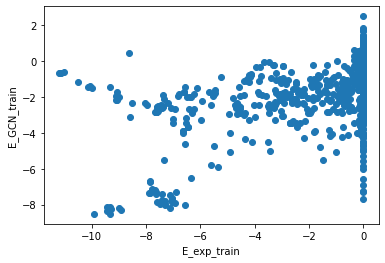

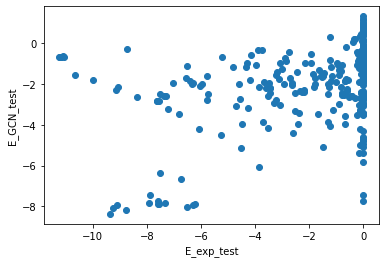

 86%|████████▌ | 86/100 [09:24<01:31,  6.51s/it]

INFO:__main__:86. time: 6.95 loss: 6.033 rmse: (2.4539597506206787, 2.8461568057402595) r2: (0.19194066765955942, 0.043483832197569794)


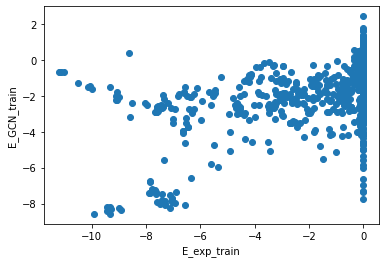

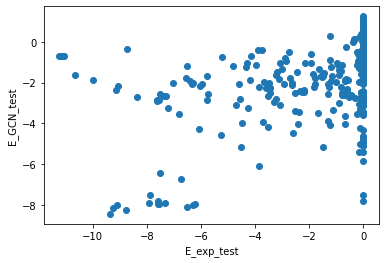

 87%|████████▋ | 87/100 [09:31<01:27,  6.74s/it]

INFO:__main__:87. time: 6.34 loss: 6.01 rmse: (2.4495754198002486, 2.8416852776195154) r2: (0.19482550274258592, 0.04648699008272905)


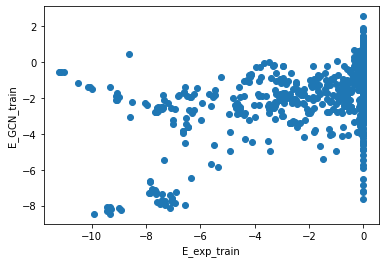

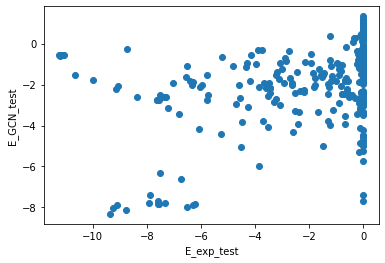

 88%|████████▊ | 88/100 [09:38<01:20,  6.69s/it]

INFO:__main__:88. time: 7.42 loss: 6.004 rmse: (2.4450843943077434, 2.837552273240835) r2: (0.1977751929964029, 0.04925859018441703)


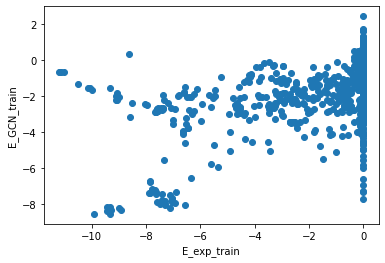

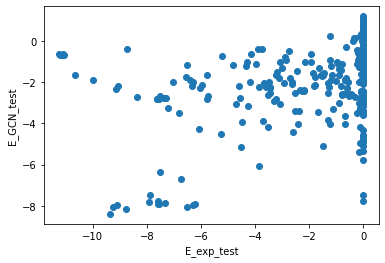

 89%|████████▉ | 89/100 [09:45<01:16,  6.99s/it]

INFO:__main__:89. time: 6.57 loss: 6.014 rmse: (2.4403550411693735, 2.8340607191955214) r2: (0.20087556464887568, 0.051596889088018294)


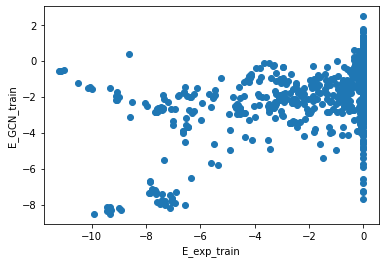

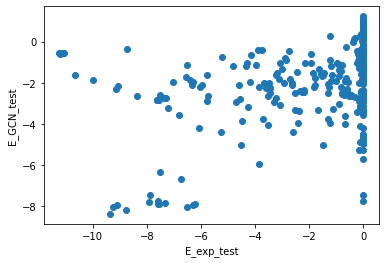

 90%|█████████ | 90/100 [09:52<01:09,  6.95s/it]

INFO:__main__:90. time: 6.76 loss: 5.961 rmse: (2.4362245646554643, 2.8293243804126935) r2: (0.20357842654017655, 0.05476422059952457)


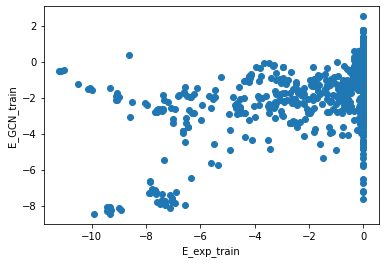

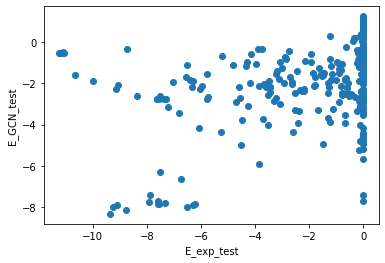

 91%|█████████ | 91/100 [09:59<01:02,  6.98s/it]

INFO:__main__:91. time: 6.05 loss: 5.914 rmse: (2.431719893681998, 2.8252917213787097) r2: (0.20652093059091048, 0.057456804827023644)


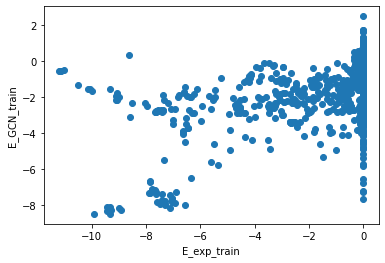

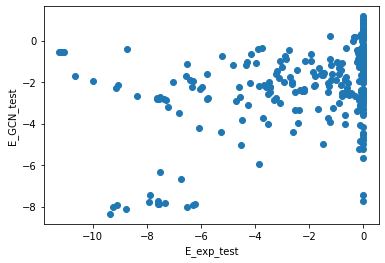

 92%|█████████▏| 92/100 [10:06<00:54,  6.77s/it]

INFO:__main__:92. time: 6.14 loss: 6.015 rmse: (2.427481658424872, 2.821563266051809) r2: (0.20928442349100318, 0.05994285705065949)


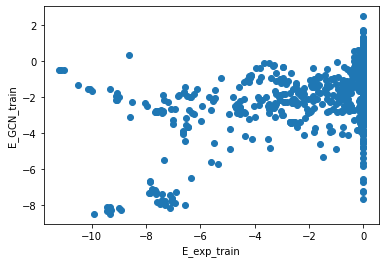

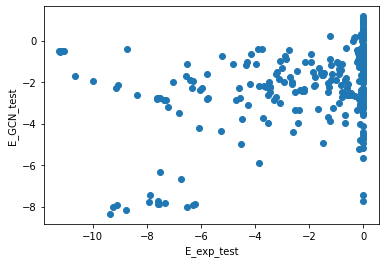

 93%|█████████▎| 93/100 [10:12<00:46,  6.66s/it]

INFO:__main__:93. time: 6.56 loss: 5.891 rmse: (2.4250095851110007, 2.818306221959387) r2: (0.2108940847313472, 0.0621118960489484)


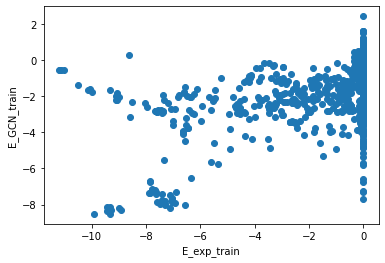

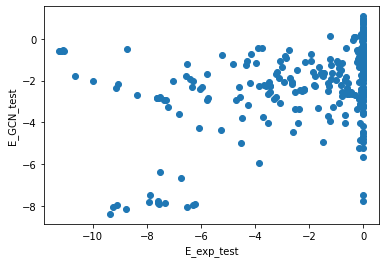

 94%|█████████▍| 94/100 [10:19<00:40,  6.71s/it]

INFO:__main__:94. time: 6.25 loss: 5.896 rmse: (2.4198093371563187, 2.8132226723557676) r2: (0.2142748107920044, 0.06549229572059445)


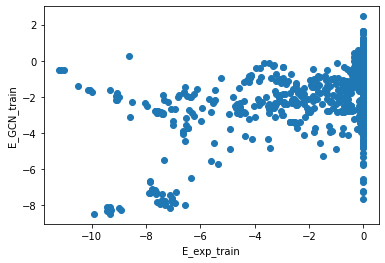

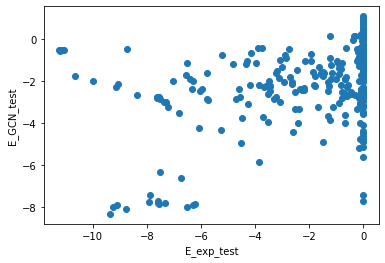

 95%|█████████▌| 95/100 [10:26<00:33,  6.70s/it]

INFO:__main__:95. time: 6.35 loss: 5.862 rmse: (2.417027301187449, 2.810614824780575) r2: (0.21608045650079577, 0.06722406342205389)


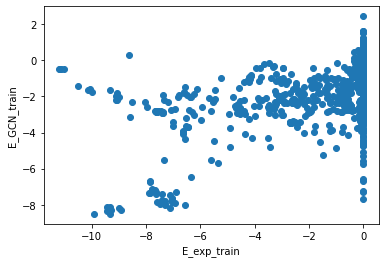

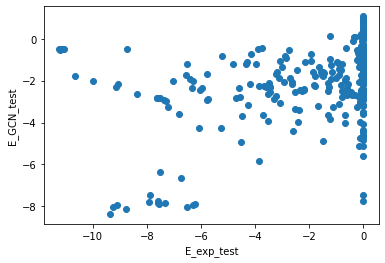

 96%|█████████▌| 96/100 [10:32<00:26,  6.67s/it]

INFO:__main__:96. time: 6.54 loss: 5.838 rmse: (2.412447650095826, 2.8049840026049795) r2: (0.21904829790638258, 0.07095779038023287)


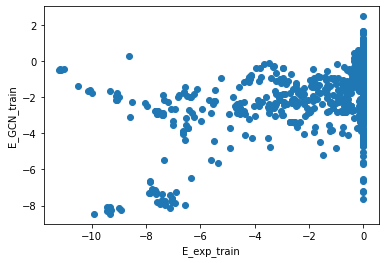

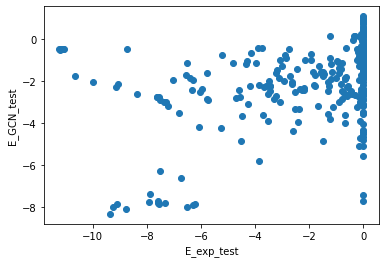

 97%|█████████▋| 97/100 [10:39<00:20,  6.71s/it]

INFO:__main__:97. time: 6.44 loss: 5.812 rmse: (2.410233515606756, 2.802492873030629) r2: (0.22048114856549306, 0.07260723780587475)


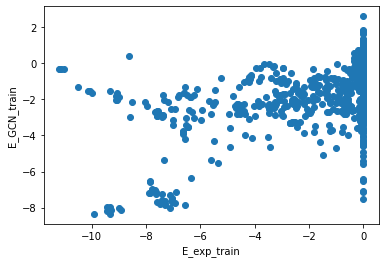

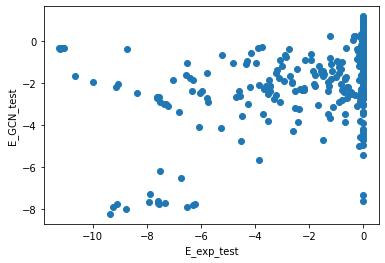

 98%|█████████▊| 98/100 [10:46<00:13,  6.71s/it]

INFO:__main__:98. time: 6.39 loss: 5.849 rmse: (2.408973187850796, 2.8002798361801107) r2: (0.22129616700553079, 0.07407132289873453)


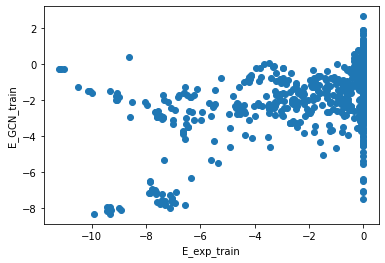

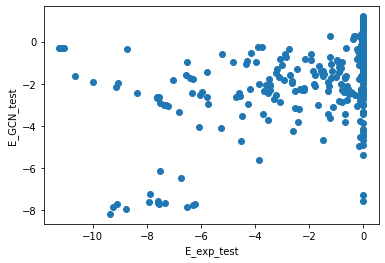

 99%|█████████▉| 99/100 [10:52<00:06,  6.70s/it]

INFO:__main__:99. time: 6.34 loss: 5.802 rmse: (2.4025109462414864, 2.794142015511444) r2: (0.22546841994425226, 0.07812588610870375)


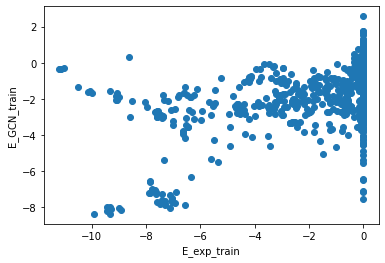

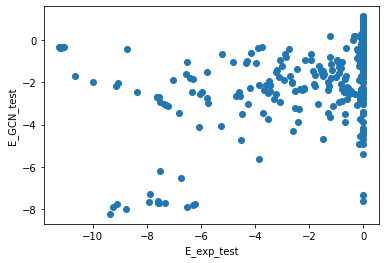

100%|██████████| 100/100 [10:59<00:00,  6.59s/it]


In [91]:
in_dim=24
hidden_dim=8
out_dim=2
num_layers=2
heads=8
activation=F.elu
feat_drop=.6
attn_drop=.6
negative_slope=.2
residual=False
with_edge_weights = False

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# gnn = Classifier(in_dim, hidden_dim, out_dim, with_edge_weights).to(device)

gnn = Regressor(in_dim = in_dim, 
                hidden_dim = hidden_dim, 
                with_edge_weights = with_edge_weights).to(device)

opt = torch.optim.Adam(gnn.parameters())
metrics = ddict(list)



for epoch in tqdm(range(100)):
    start = time.time()
        
    loss = train_model(gnn, opt, trainloader, device)
    
    loss1, rmse1, r21, y_true_train, y_pred_train = evaluate_model(gnn, opt, trainloader, device)
    loss2, rmse2, r22, y_true_test, y_pred_test = evaluate_model(gnn, opt, testloader, device)
    metrics['rmse'].append((rmse1, rmse2))
    metrics['loss'].append((loss1, loss2))
    metrics['r2'].append((r21, r22))
    logger.debug(metrics)

    logger.info(f"{epoch}. time: {round(time.time() - start, 2)} loss: {round(loss, 3)} rmse: {metrics['rmse'][-1]} r2: {metrics['r2'][-1]}")
        
    plt.scatter(y_true_train, y_pred_train)
    plt.xlabel('E_exp_train')
    plt.ylabel('E_GCN_train')
    plt.show()
    
    plt.scatter(y_true_test, y_pred_test)
    plt.xlabel('E_exp_test')
    plt.ylabel('E_GCN_test')
    plt.show()

In [92]:
plot_interactive([metrics], legend=['Train', 'Test'], title='Loss', logx=False, logy=False, metric_name='loss', start_from=0)

In [93]:
plot_interactive([metrics], legend=['Train', 'Test'], title='RMSE', logx=False, logy=False, metric_name='rmse', start_from=0)

In [94]:
plot_interactive([metrics], legend=['Train', 'Test'], title='R2', logx=False, logy=False, metric_name='r2', start_from=0)

## Выводы

Без весов происходит бОльшее переобучение

# Exp 4



model - GCN with edge weights (divided by destination)

No edge feature

Add rmsd fix

In [95]:
class Regressor(nn.Module):
    def __init__(self, in_dim, hidden_dim, with_edge_weights = True):
        super(Regressor, self).__init__()
        self.conv1 = dglnn.GraphConv(in_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.conv2 = dglnn.GraphConv(hidden_dim, hidden_dim) #, allow_zero_in_degree=True)
        self.regress = nn.Linear(hidden_dim, 1)
        self.with_edge_weights = with_edge_weights

    def forward(self, g, h, ew=True):
        # Apply graph convolution and activation.
        if self.with_edge_weights:
            e_weights = 1/g.edata['edge_features'][:, 0].float()
        else:
            e_weights=None
        h = F.relu(self.conv1(g, h, edge_weight=e_weights))
        h = F.relu(self.conv2(g, h, edge_weight=e_weights))
        with g.local_scope():
            g.ndata['h'] = h
            # Calculate graph representation by average readout.
            hg = dgl.mean_nodes(g, 'h')
            return self.regress(hg)

In [96]:
npz_parser = NPZ_parser(folder = FOLDER, 
                 labels_file = LABELS_FILE,
                 task = 'regression', 
                 ohe_node_encoding = ['atom_type'],
                 ohe_edge_encoding = ['edge_type'])

In [97]:
graphs, labels = npz_parser.parser()

  0%|          | 0/1000 [00:00<?, ?it/s]

INFO:__main__:shape of node attrs (371, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16684, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16684, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26630, 2)
INFO:__main__:Num of protein edge attrs (26630, 2)
INFO:__main__:shape of node attrs (239, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (227, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shap

  0%|          | 3/1000 [00:00<00:35, 28.07it/s]

INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16459, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16459, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (486, 2)
INFO:__main__:Num of ligand edge attrs (486, 2)
INFO:__main__:Num of protein edges (26430, 2)
INFO:__main__:Num of protein edge attrs (26430, 2)
INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  1%|          | 6/1000 [00:00<00:39, 25.47it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19298, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19298, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1470, 2)
INFO:__main__:Num of ligand edge attrs (1470, 2)
INFO:__main__:Num of protein edges (28610, 2)
INFO:__main__:Num of protein edge attrs (28610, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2229.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  1%|          | 9/1000 [00:00<00:39, 25.18it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14188, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14188, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24700, 2)
INFO:__main__:Num of protein edge attrs (24700, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

  1%|          | 12/1000 [00:00<00:39, 24.92it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19181, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (19181, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1404, 2)
INFO:__main__:Num of ligand edge attrs (1404, 2)
INFO:__main__:Num of protein edges (28378, 2)
INFO:__main__:Num of protein edge attrs (28378, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  2%|▏         | 15/1000 [00:00<00:40, 24.14it/s]

INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13446, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (876, 2)
INFO:__main__:Num of ligand edge attrs (876, 2)
INFO:__main__:Num of protein edges (20916, 2)
INFO:__main__:Num of protein edge attrs (20916, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 18/1000 [00:00<00:40, 24.50it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14763, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14763, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1498, 2)
INFO:__main__:Num of ligand edge attrs (1498, 2)
INFO:__main__:Num of protein edges (20480, 2)
INFO:__main__:Num of protein edge attrs (20480, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  2%|▏         | 21/1000 [00:00<00:40, 24.02it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15012, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15012, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (23898, 2)
INFO:__main__:Num of protein edge attrs (23898, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  2%|▏         | 24/1000 [00:00<00:40, 24.30it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12406, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21186, 2)
INFO:__main__:Num of protein edge attrs (21186, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

  3%|▎         | 27/1000 [00:01<00:40, 23.88it/s]

INFO:__main__:shape of node attrs (390, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16770, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (16770, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1396, 2)
INFO:__main__:Num of ligand edge attrs (1396, 2)
INFO:__main__:Num of protein edges (24634, 2)
INFO:__main__:Num of protein edge attrs (24634, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  3%|▎         | 30/1000 [00:01<00:41, 23.44it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19833, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19833, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1474, 2)
INFO:__main__:Num of ligand edge attrs (1474, 2)
INFO:__main__:Num of protein edges (29646, 2)
INFO:__main__:Num of protein edge attrs (29646, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  3%|▎         | 33/1000 [00:01<00:41, 23.28it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12773, 2)
INFO:__main__:array of edge attrs [1.23906 1.     ]
INFO:__main__:shape of edges attrs (12773, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21742, 2)
INFO:__main__:Num of protein edge attrs (21742, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2230.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main_

  4%|▎         | 36/1000 [00:01<00:40, 23.77it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11901, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11901, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20288, 2)
INFO:__main__:Num of protein edge attrs (20288, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  4%|▍         | 39/1000 [00:01<00:41, 23.34it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22724, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22724, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (740, 2)
INFO:__main__:Num of ligand edge attrs (740, 2)
INFO:__main__:Num of protein edges (36596, 2)
INFO:__main__:Num of protein edge attrs (36596, 2)
INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [458.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

  4%|▍         | 42/1000 [00:01<00:41, 23.36it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20490, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20490, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (30820, 2)
INFO:__main__:Num of protein edge attrs (30820, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

  4%|▍         | 45/1000 [00:01<00:40, 23.49it/s]

INFO:__main__:shape of node attrs (344, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14581, 2)
INFO:__main__:array of edge attrs [1.3142 1.    ]
INFO:__main__:shape of edges attrs (14581, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (23128, 2)
INFO:__main__:Num of protein edge attrs (23128, 2)
INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

  5%|▍         | 48/1000 [00:02<00:40, 23.52it/s]

INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (15089, 2)
INFO:__main__:array of edge attrs [2.26816 0.     ]
INFO:__main__:shape of edges attrs (15089, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1496, 2)
INFO:__main__:Num of ligand edge attrs (1496, 2)
INFO:__main__:Num of protein edges (20994, 2)
INFO:__main__:Num of protein edge attrs (20994, 2)
INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  5%|▌         | 51/1000 [00:02<00:38, 24.38it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12764, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12764, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (21846, 2)
INFO:__main__:Num of protein edge attrs (21846, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  5%|▌         | 54/1000 [00:02<00:38, 24.65it/s]

INFO:__main__:shape of node attrs (370, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15799, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (15799, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (25268, 2)
INFO:__main__:Num of protein edge attrs (25268, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

  6%|▌         | 57/1000 [00:02<00:39, 24.13it/s]

INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13046, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13046, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1030, 2)
INFO:__main__:Num of ligand edge attrs (1030, 2)
INFO:__main__:Num of protein edges (19182, 2)
INFO:__main__:Num of protein edge attrs (19182, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  6%|▌         | 60/1000 [00:02<00:40, 23.49it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (295, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12511, 2)
INFO:__main__:array of edge attrs [6.11734 0.     ]
INFO:__main__:shape of edges attrs (12511, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21332, 2)
INFO:__main__:Num of protein edge attrs (21332, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (412, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

  6%|▋         | 63/1000 [00:02<00:40, 23.09it/s]

INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (17897, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (17897, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1804, 2)
INFO:__main__:Num of ligand edge attrs (1804, 2)
INFO:__main__:Num of protein edges (25210, 2)
INFO:__main__:Num of protein edge attrs (25210, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sh

  7%|▋         | 66/1000 [00:02<00:40, 23.18it/s]

INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (353, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16932, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (16932, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27130, 2)
INFO:__main__:Num of protein edge attrs (27130, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [1308.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

  7%|▋         | 69/1000 [00:02<00:41, 22.67it/s]

INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19252, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19252, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2062, 2)
INFO:__main__:Num of ligand edge attrs (2062, 2)
INFO:__main__:Num of protein edges (26982, 2)
INFO:__main__:Num of protein edge attrs (26982, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

  7%|▋         | 72/1000 [00:03<00:41, 22.62it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12705, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12705, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21804, 2)
INFO:__main__:Num of protein edge attrs (21804, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

  8%|▊         | 75/1000 [00:03<00:40, 22.84it/s]

INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19409, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1380, 2)
INFO:__main__:Num of ligand edge attrs (1380, 2)
INFO:__main__:Num of protein edges (28832, 2)
INFO:__main__:Num of protein edge attrs (28832, 2)
INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

  8%|▊         | 78/1000 [00:03<00:41, 22.37it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12327, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12327, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21036, 2)
INFO:__main__:Num of protein edge attrs (21036, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  8%|▊         | 81/1000 [00:03<00:40, 22.96it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (21013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (716, 2)
INFO:__main__:Num of ligand edge attrs (716, 2)
INFO:__main__:Num of protein edges (33468, 2)
INFO:__main__:Num of protein edge attrs (33468, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

  8%|▊         | 84/1000 [00:03<00:40, 22.86it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12898, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12898, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22190, 2)
INFO:__main__:Num of protein edge attrs (22190, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

  9%|▊         | 87/1000 [00:03<00:40, 22.76it/s]

INFO:__main__:shape of node attrs (366, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (342, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15519, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15519, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (24838, 2)
INFO:__main__:Num of protein edge attrs (24838, 2)
INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (346, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

  9%|▉         | 90/1000 [00:03<00:38, 23.49it/s]

INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20464, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20464, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (30738, 2)
INFO:__main__:Num of protein edge attrs (30738, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

  9%|▉         | 93/1000 [00:03<00:38, 23.37it/s]

INFO:__main__:shape of node attrs (333, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (299, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14269, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (14269, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (912, 2)
INFO:__main__:Num of ligand edge attrs (912, 2)
INFO:__main__:Num of protein edges (21582, 2)
INFO:__main__:Num of protein edge attrs (21582, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 10%|▉         | 96/1000 [00:04<00:39, 23.18it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13035, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13035, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22254, 2)
INFO:__main__:Num of protein edge attrs (22254, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 10%|▉         | 99/1000 [00:04<00:38, 23.21it/s]

INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15216, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15216, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (24320, 2)
INFO:__main__:Num of protein edge attrs (24320, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 10%|█         | 102/1000 [00:04<00:38, 23.46it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19503, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (19503, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1478, 2)
INFO:__main__:Num of ligand edge attrs (1478, 2)
INFO:__main__:Num of protein edges (28994, 2)
INFO:__main__:Num of protein edge attrs (28994, 2)
INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 10%|█         | 105/1000 [00:04<00:37, 23.70it/s]

INFO:__main__:shape of node attrs (286, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12493, 2)
INFO:__main__:array of edge attrs [1.23906 1.     ]
INFO:__main__:shape of edges attrs (12493, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21226, 2)
INFO:__main__:Num of protein edge attrs (21226, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 11%|█         | 108/1000 [00:04<00:38, 23.31it/s]

INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14164, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14164, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1558, 2)
INFO:__main__:Num of ligand edge attrs (1558, 2)
INFO:__main__:Num of protein edges (19342, 2)
INFO:__main__:Num of protein edge attrs (19342, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 11%|█         | 111/1000 [00:04<00:37, 23.64it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13072, 2)
INFO:__main__:array of edge attrs [3.99982 0.     ]
INFO:__main__:shape of edges attrs (13072, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22490, 2)
INFO:__main__:Num of protein edge attrs (22490, 2)
INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 11%|█▏        | 114/1000 [00:04<00:37, 23.91it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19485, 2)
INFO:__main__:array of edge attrs [2.57338 0.     ]
INFO:__main__:shape of edges attrs (19485, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1242, 2)
INFO:__main__:Num of ligand edge attrs (1242, 2)
INFO:__main__:Num of protein edges (29294, 2)
INFO:__main__:Num of protein edge attrs (29294, 2)
INFO:__main__:shape of node attrs (394, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 12%|█▏        | 117/1000 [00:04<00:38, 23.05it/s]

INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (268, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12026, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20304, 2)
INFO:__main__:Num of protein edge attrs (20304, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 12%|█▏        | 120/1000 [00:05<00:38, 23.06it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13202, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (13202, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22782, 2)
INFO:__main__:Num of protein edge attrs (22782, 2)
INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 12%|█▏        | 123/1000 [00:05<00:37, 23.22it/s]

INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22461, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (22461, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (754, 2)
INFO:__main__:Num of ligand edge attrs (754, 2)
INFO:__main__:Num of protein edges (36048, 2)
INFO:__main__:Num of protein edge attrs (36048, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 13%|█▎        | 126/1000 [00:05<00:37, 23.49it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17648, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17648, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (28346, 2)
INFO:__main__:Num of protein edge attrs (28346, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 13%|█▎        | 129/1000 [00:05<00:38, 22.63it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12357, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12357, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21122, 2)
INFO:__main__:Num of protein edge attrs (21122, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 13%|█▎        | 132/1000 [00:05<00:37, 23.04it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12810, 2)
INFO:__main__:array of edge attrs [3.79748 0.     ]
INFO:__main__:shape of edges attrs (12810, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21854, 2)
INFO:__main__:Num of protein edge attrs (21854, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 14%|█▎        | 135/1000 [00:05<00:37, 22.81it/s]

INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14618, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (14618, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (23216, 2)
INFO:__main__:Num of protein edge attrs (23216, 2)
INFO:__main__:shape of node attrs (340, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 14%|█▍        | 138/1000 [00:05<00:37, 22.85it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2288.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13088, 2)
INFO:__main__:array of edge attrs [6.65657 0.     ]
INFO:__main__:shape of edges attrs (13088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (22366, 2)
INFO:__main__:Num of protein edge attrs (22366, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 14%|█▍        | 141/1000 [00:06<00:37, 22.92it/s]

INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17179, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17179, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (25266, 2)
INFO:__main__:Num of protein edge attrs (25266, 2)
INFO:__main__:shape of node attrs (351, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (328, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 14%|█▍        | 144/1000 [00:06<00:36, 23.20it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12656, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12656, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21550, 2)
INFO:__main__:Num of protein edge attrs (21550, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 15%|█▍        | 147/1000 [00:06<00:34, 24.47it/s]

INFO:__main__:shape of node attrs (288, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12492, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12492, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21330, 2)
INFO:__main__:Num of protein edge attrs (21330, 2)
INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 15%|█▌        | 150/1000 [00:06<00:34, 24.56it/s]

INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13502, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13502, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (348, 2)
INFO:__main__:Num of ligand edge attrs (348, 2)
INFO:__main__:Num of protein edges (22040, 2)
INFO:__main__:Num of protein edge attrs (22040, 2)
INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 15%|█▌        | 153/1000 [00:06<00:34, 24.32it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20860, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20860, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1376, 2)
INFO:__main__:Num of ligand edge attrs (1376, 2)
INFO:__main__:Num of protein edges (31538, 2)
INFO:__main__:Num of protein edge attrs (31538, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 16%|█▌        | 156/1000 [00:06<00:34, 24.40it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16464, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16464, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (484, 2)
INFO:__main__:Num of ligand edge attrs (484, 2)
INFO:__main__:Num of protein edges (26442, 2)
INFO:__main__:Num of protein edge attrs (26442, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (424, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 16%|█▌        | 159/1000 [00:06<00:35, 23.70it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16527, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16527, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (496, 2)
INFO:__main__:Num of ligand edge attrs (496, 2)
INFO:__main__:Num of protein edges (26580, 2)
INFO:__main__:Num of protein edge attrs (26580, 2)
INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shap

 16%|█▌        | 162/1000 [00:06<00:35, 23.89it/s]

INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12028, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12028, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20378, 2)
INFO:__main__:Num of protein edge attrs (20378, 2)
INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 16%|█▋        | 165/1000 [00:06<00:34, 24.48it/s]

INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22095, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22095, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (35366, 2)
INFO:__main__:Num of protein edge attrs (35366, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [184.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 17%|█▋        | 168/1000 [00:07<00:35, 23.25it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12697, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12697, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21798, 2)
INFO:__main__:Num of protein edge attrs (21798, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 17%|█▋        | 171/1000 [00:07<00:36, 22.69it/s]

INFO:__main__:shape of node attrs (424, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16044, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16044, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1430, 2)
INFO:__main__:Num of ligand edge attrs (1430, 2)
INFO:__main__:Num of protein edges (22770, 2)
INFO:__main__:Num of protein edge attrs (22770, 2)
INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 17%|█▋        | 174/1000 [00:07<00:38, 21.42it/s]

INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (337, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14214, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14214, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1444, 2)
INFO:__main__:Num of ligand edge attrs (1444, 2)
INFO:__main__:Num of protein edges (19380, 2)
INFO:__main__:Num of protein edge attrs (19380, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 18%|█▊        | 177/1000 [00:07<00:39, 20.94it/s]

INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20318, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20318, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (30502, 2)
INFO:__main__:Num of protein edge attrs (30502, 2)
INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (320, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 18%|█▊        | 180/1000 [00:07<00:39, 21.00it/s]

INFO:__main__:shape of node attrs (369, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (345, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15655, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15655, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (25110, 2)
INFO:__main__:Num of protein edge attrs (25110, 2)
INFO:__main__:shape of node attrs (433, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 18%|█▊        | 183/1000 [00:07<00:38, 21.24it/s]

INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12477, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12477, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21208, 2)
INFO:__main__:Num of protein edge attrs (21208, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [33.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 19%|█▊        | 186/1000 [00:07<00:37, 21.74it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11947, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11947, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20386, 2)
INFO:__main__:Num of protein edge attrs (20386, 2)
INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [265.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 19%|█▉        | 189/1000 [00:08<00:36, 22.27it/s]

INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [501.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8247, 2)
INFO:__main__:array of edge attrs [2.42815 0.     ]
INFO:__main__:shape of edges attrs (8247, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13878, 2)
INFO:__main__:Num of protein edge attrs (13878, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (447, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 19%|█▉        | 192/1000 [00:08<00:36, 22.01it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12436, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21166, 2)
INFO:__main__:Num of protein edge attrs (21166, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 20%|█▉        | 195/1000 [00:08<00:35, 22.50it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:shape of edge attrs (12907, 2)
INFO:__main__:array of edge attrs [6.7769 0.    ]
INFO:__main__:shape of edges attrs (12907, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (19640, 2)
INFO:__main__:Num of protein edge attrs (19640, 2)
INFO:__main__:shape of node attrs (503, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 20%|█▉        | 198/1000 [00:08<00:36, 22.15it/s]

INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15258, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15258, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1428, 2)
INFO:__main__:Num of ligand edge attrs (1428, 2)
INFO:__main__:Num of protein edges (21380, 2)
INFO:__main__:Num of protein edge attrs (21380, 2)
INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 20%|██        | 201/1000 [00:08<00:36, 22.12it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (264, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11854, 2)
INFO:__main__:array of edge attrs [4.23043 0.     ]
INFO:__main__:shape of edges attrs (11854, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (892, 2)
INFO:__main__:Num of ligand edge attrs (892, 2)
INFO:__main__:Num of protein edges (17884, 2)
INFO:__main__:Num of protein edge attrs (17884, 2)
INFO:__main__:shape of node attrs (476, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 20%|██        | 204/1000 [00:08<00:35, 22.14it/s]

INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17859, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17859, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1388, 2)
INFO:__main__:Num of ligand edge attrs (1388, 2)
INFO:__main__:Num of protein edges (26456, 2)
INFO:__main__:Num of protein edge attrs (26456, 2)
INFO:__main__:shape of node attrs (463, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (432, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 21%|██        | 207/1000 [00:08<00:35, 22.15it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (258, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12120, 2)
INFO:__main__:array of edge attrs [3.23915 0.     ]
INFO:__main__:shape of edges attrs (12120, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1034, 2)
INFO:__main__:Num of ligand edge attrs (1034, 2)
INFO:__main__:Num of protein edges (17640, 2)
INFO:__main__:Num of protein edge attrs (17640, 2)
INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 21%|██        | 210/1000 [00:09<00:35, 22.39it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (311, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14706, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14706, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25656, 2)
INFO:__main__:Num of protein edge attrs (25656, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 21%|██▏       | 213/1000 [00:09<00:35, 22.33it/s]

INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16508, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16508, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (492, 2)
INFO:__main__:Num of ligand edge attrs (492, 2)
INFO:__main__:Num of protein edges (26562, 2)
INFO:__main__:Num of protein edge attrs (26562, 2)
INFO:__main__:shape of node attrs (361, 5)
INFO:__main__:array of node attrs [284.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 22%|██▏       | 216/1000 [00:09<00:34, 22.56it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12353, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12353, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (20116, 2)
INFO:__main__:Num of protein edge attrs (20116, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 22%|██▏       | 219/1000 [00:09<00:34, 22.53it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (319, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15090, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (15090, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (888, 2)
INFO:__main__:Num of ligand edge attrs (888, 2)
INFO:__main__:Num of protein edges (23346, 2)
INFO:__main__:Num of protein edge attrs (23346, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 22%|██▏       | 222/1000 [00:09<00:35, 21.94it/s]

INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16973, 2)
INFO:__main__:array of edge attrs [2.73399 0.     ]
INFO:__main__:shape of edges attrs (16973, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (490, 2)
INFO:__main__:Num of ligand edge attrs (490, 2)
INFO:__main__:Num of protein edges (27464, 2)
INFO:__main__:Num of protein edge attrs (27464, 2)
INFO:__main__:shape of node attrs (467, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 22%|██▎       | 225/1000 [00:09<00:35, 21.78it/s]

INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12935, 2)
INFO:__main__:array of edge attrs [1.52469 1.     ]
INFO:__main__:shape of edges attrs (12935, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (22152, 2)
INFO:__main__:Num of protein edge attrs (22152, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 23%|██▎       | 228/1000 [00:09<00:34, 22.29it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12229, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12229, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20006, 2)
INFO:__main__:Num of protein edge attrs (20006, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 23%|██▎       | 231/1000 [00:10<00:33, 22.88it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17511, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17511, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28526, 2)
INFO:__main__:Num of protein edge attrs (28526, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 23%|██▎       | 234/1000 [00:10<00:34, 22.15it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11950, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11950, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20386, 2)
INFO:__main__:Num of protein edge attrs (20386, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 24%|██▎       | 237/1000 [00:10<00:34, 22.22it/s]

INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14407, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14407, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25120, 2)
INFO:__main__:Num of protein edge attrs (25120, 2)
INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 24%|██▍       | 240/1000 [00:10<00:35, 21.49it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19126, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19126, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1230, 2)
INFO:__main__:Num of ligand edge attrs (1230, 2)
INFO:__main__:Num of protein edges (28456, 2)
INFO:__main__:Num of protein edge attrs (28456, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 24%|██▍       | 243/1000 [00:10<00:35, 21.30it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13699, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13699, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (902, 2)
INFO:__main__:Num of ligand edge attrs (902, 2)
INFO:__main__:Num of protein edges (20660, 2)
INFO:__main__:Num of protein edge attrs (20660, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 25%|██▍       | 246/1000 [00:10<00:34, 21.56it/s]

INFO:__main__:shape of node attrs (470, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (439, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22663, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22663, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (726, 2)
INFO:__main__:Num of ligand edge attrs (726, 2)
INFO:__main__:Num of protein edges (36582, 2)
INFO:__main__:Num of protein edge attrs (36582, 2)
INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [143.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 25%|██▍       | 249/1000 [00:10<00:35, 21.23it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19563, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19563, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1974, 2)
INFO:__main__:Num of ligand edge attrs (1974, 2)
INFO:__main__:Num of protein edges (27800, 2)
INFO:__main__:Num of protein edge attrs (27800, 2)
INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (301, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 25%|██▌       | 252/1000 [00:11<00:35, 20.87it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12873, 2)
INFO:__main__:array of edge attrs [2.51073 0.     ]
INFO:__main__:shape of edges attrs (12873, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21936, 2)
INFO:__main__:Num of protein edge attrs (21936, 2)
INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main

 26%|██▌       | 255/1000 [00:11<00:38, 19.49it/s]

INFO:__main__:shape of node attrs (507, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (452, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (22355, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (22355, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2002, 2)
INFO:__main__:Num of ligand edge attrs (2002, 2)
INFO:__main__:Num of protein edges (32040, 2)
INFO:__main__:Num of protein edge attrs (32040, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 26%|██▌       | 258/1000 [00:11<00:37, 19.96it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22921, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22921, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (36954, 2)
INFO:__main__:Num of protein edge attrs (36954, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2295.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 26%|██▌       | 261/1000 [00:11<00:38, 19.11it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20511, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20511, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (30880, 2)
INFO:__main__:Num of protein edge attrs (30880, 2)
INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:

 26%|██▋       | 264/1000 [00:11<00:37, 19.78it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (414, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20667, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (20667, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1202, 2)
INFO:__main__:Num of ligand edge attrs (1202, 2)
INFO:__main__:Num of protein edges (31382, 2)
INFO:__main__:Num of protein edge attrs (31382, 2)
INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 27%|██▋       | 266/1000 [00:11<00:38, 19.22it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12152, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12152, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20620, 2)
INFO:__main__:Num of protein edge attrs (20620, 2)
INFO:__main__:shape of node attrs (352, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 27%|██▋       | 268/1000 [00:11<00:37, 19.39it/s]

INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20747, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20747, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1376, 2)
INFO:__main__:Num of ligand edge attrs (1376, 2)
INFO:__main__:Num of protein edges (31330, 2)
INFO:__main__:Num of protein edge attrs (31330, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 27%|██▋       | 271/1000 [00:12<00:37, 19.48it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16432, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (16432, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (496, 2)
INFO:__main__:Num of ligand edge attrs (496, 2)
INFO:__main__:Num of protein edges (26392, 2)
INFO:__main__:Num of protein edge attrs (26392, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 27%|██▋       | 273/1000 [00:12<00:39, 18.27it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13868, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (13868, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24094, 2)
INFO:__main__:Num of protein edge attrs (24094, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 28%|██▊       | 276/1000 [00:12<00:38, 18.71it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12899, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12899, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22188, 2)
INFO:__main__:Num of protein edge attrs (22188, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:

 28%|██▊       | 279/1000 [00:12<00:38, 18.84it/s]

INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8281, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8281, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13800, 2)
INFO:__main__:Num of protein edge attrs (13800, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 28%|██▊       | 281/1000 [00:12<00:37, 18.96it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16855, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (16855, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (27230, 2)
INFO:__main__:Num of protein edge attrs (27230, 2)
INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 28%|██▊       | 284/1000 [00:12<00:35, 20.14it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13332, 2)
INFO:__main__:array of edge attrs [5.08156 0.     ]
INFO:__main__:shape of edges attrs (13332, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (906, 2)
INFO:__main__:Num of ligand edge attrs (906, 2)
INFO:__main__:Num of protein edges (20208, 2)
INFO:__main__:Num of protein edge attrs (20208, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 29%|██▊       | 287/1000 [00:12<00:33, 21.24it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12914, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12914, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (154, 2)
INFO:__main__:Num of ligand edge attrs (154, 2)
INFO:__main__:Num of protein edges (22220, 2)
INFO:__main__:Num of protein edge attrs (22220, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 29%|██▉       | 290/1000 [00:12<00:32, 21.64it/s]

INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17562, 2)
INFO:__main__:array of edge attrs [3.23309 0.     ]
INFO:__main__:shape of edges attrs (17562, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28606, 2)
INFO:__main__:Num of protein edge attrs (28606, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 29%|██▉       | 293/1000 [00:13<00:33, 21.10it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13469, 2)
INFO:__main__:array of edge attrs [2.90183 0.     ]
INFO:__main__:shape of edges attrs (13469, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (454, 2)
INFO:__main__:Num of ligand edge attrs (454, 2)
INFO:__main__:Num of protein edges (21838, 2)
INFO:__main__:Num of protein edge attrs (21838, 2)
INFO:__main__:shape of node attrs (386, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (362, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 30%|██▉       | 296/1000 [00:13<00:33, 21.17it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14349, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14349, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25008, 2)
INFO:__main__:Num of protein edge attrs (25008, 2)
INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 30%|██▉       | 299/1000 [00:13<00:32, 21.35it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14419, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (14419, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (934, 2)
INFO:__main__:Num of ligand edge attrs (934, 2)
INFO:__main__:Num of protein edges (22328, 2)
INFO:__main__:Num of protein edge attrs (22328, 2)
INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 30%|███       | 302/1000 [00:13<00:32, 21.37it/s]

INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (21490, 2)
INFO:__main__:array of edge attrs [3.4332 0.    ]
INFO:__main__:shape of edges attrs (21490, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (776, 2)
INFO:__main__:Num of ligand edge attrs (776, 2)
INFO:__main__:Num of protein edges (34286, 2)
INFO:__main__:Num of protein edge attrs (34286, 2)
INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 30%|███       | 305/1000 [00:13<00:32, 21.12it/s]

INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13419, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (13419, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (828, 2)
INFO:__main__:Num of ligand edge attrs (828, 2)
INFO:__main__:Num of protein edges (20440, 2)
INFO:__main__:Num of protein edge attrs (20440, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2273.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 31%|███       | 308/1000 [00:13<00:32, 21.40it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19207, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19207, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1268, 2)
INFO:__main__:Num of ligand edge attrs (1268, 2)
INFO:__main__:Num of protein edges (28714, 2)
INFO:__main__:Num of protein edge attrs (28714, 2)
INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 31%|███       | 311/1000 [00:13<00:32, 21.16it/s]

INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20929, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20929, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (31754, 2)
INFO:__main__:Num of protein edge attrs (31754, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 31%|███▏      | 314/1000 [00:14<00:32, 21.12it/s]

INFO:__main__:shape of node attrs (415, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16000, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16000, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1392, 2)
INFO:__main__:Num of ligand edge attrs (1392, 2)
INFO:__main__:Num of protein edges (22774, 2)
INFO:__main__:Num of protein edge attrs (22774, 2)
INFO:__main__:shape of node attrs (334, 5)
INFO:__main__:array of node attrs [196.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (310, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 32%|███▏      | 317/1000 [00:14<00:31, 21.42it/s]

INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17310, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17310, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1288, 2)
INFO:__main__:Num of ligand edge attrs (1288, 2)
INFO:__main__:Num of protein edges (25614, 2)
INFO:__main__:Num of protein edge attrs (25614, 2)
INFO:__main__:shape of node attrs (334, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 32%|███▏      | 320/1000 [00:14<00:33, 20.39it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12147, 2)
INFO:__main__:array of edge attrs [6.97661 0.     ]
INFO:__main__:shape of edges attrs (12147, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20790, 2)
INFO:__main__:Num of protein edge attrs (20790, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 32%|███▏      | 323/1000 [00:14<00:32, 20.73it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12647, 2)
INFO:__main__:array of edge attrs [3.5591 0.    ]
INFO:__main__:shape of edges attrs (12647, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21550, 2)
INFO:__main__:Num of protein edge attrs (21550, 2)
INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 33%|███▎      | 326/1000 [00:14<00:32, 20.77it/s]

INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16109, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (16109, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1446, 2)
INFO:__main__:Num of ligand edge attrs (1446, 2)
INFO:__main__:Num of protein edges (22834, 2)
INFO:__main__:Num of protein edge attrs (22834, 2)
INFO:__main__:shape of node attrs (369, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (345, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 33%|███▎      | 329/1000 [00:14<00:30, 21.82it/s]

INFO:__main__:shape of node attrs (487, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21259, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (21259, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1350, 2)
INFO:__main__:Num of ligand edge attrs (1350, 2)
INFO:__main__:Num of protein edges (32452, 2)
INFO:__main__:Num of protein edge attrs (32452, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 33%|███▎      | 332/1000 [00:14<00:30, 21.96it/s]

INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13545, 2)
INFO:__main__:array of edge attrs [2.90183 0.     ]
INFO:__main__:shape of edges attrs (13545, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21978, 2)
INFO:__main__:Num of protein edge attrs (21978, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 34%|███▎      | 335/1000 [00:15<00:29, 22.32it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22768, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22768, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (742, 2)
INFO:__main__:Num of ligand edge attrs (742, 2)
INFO:__main__:Num of protein edges (36676, 2)
INFO:__main__:Num of protein edge attrs (36676, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 34%|███▍      | 338/1000 [00:15<00:29, 22.68it/s]

INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12142, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12142, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20686, 2)
INFO:__main__:Num of protein edge attrs (20686, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 34%|███▍      | 341/1000 [00:15<00:28, 23.38it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8543, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8543, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14332, 2)
INFO:__main__:Num of protein edge attrs (14332, 2)
INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [187.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 34%|███▍      | 344/1000 [00:15<00:27, 23.58it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (441, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22733, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22733, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (766, 2)
INFO:__main__:Num of ligand edge attrs (766, 2)
INFO:__main__:Num of protein edges (36696, 2)
INFO:__main__:Num of protein edge attrs (36696, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 35%|███▍      | 347/1000 [00:15<00:28, 22.83it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12877, 2)
INFO:__main__:array of edge attrs [1.2286 1.    ]
INFO:__main__:shape of edges attrs (12877, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22126, 2)
INFO:__main__:Num of protein edge attrs (22126, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 35%|███▌      | 350/1000 [00:15<00:28, 22.92it/s]

INFO:__main__:shape of node attrs (267, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (255, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11904, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (11904, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (20122, 2)
INFO:__main__:Num of protein edge attrs (20122, 2)
INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 35%|███▌      | 353/1000 [00:15<00:27, 23.29it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2302.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14673, 2)
INFO:__main__:array of edge attrs [1.39611 1.     ]
INFO:__main__:shape of edges attrs (14673, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (25410, 2)
INFO:__main__:Num of protein edge attrs (25410, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main_

 36%|███▌      | 356/1000 [00:15<00:27, 23.50it/s]

INFO:__main__:shape of node attrs (498, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (21344, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (21344, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1920, 2)
INFO:__main__:Num of ligand edge attrs (1920, 2)
INFO:__main__:Num of protein edges (30636, 2)
INFO:__main__:Num of protein edge attrs (30636, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 36%|███▌      | 359/1000 [00:16<00:27, 23.55it/s]

INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [276.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (18240, 2)
INFO:__main__:array of edge attrs [0.99997 1.     ]
INFO:__main__:shape of edges attrs (18240, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (29784, 2)
INFO:__main__:Num of protein edge attrs (29784, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 36%|███▌      | 362/1000 [00:16<00:26, 23.95it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14521, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14521, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25306, 2)
INFO:__main__:Num of protein edge attrs (25306, 2)
INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 36%|███▋      | 365/1000 [00:16<00:26, 23.55it/s]

INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15380, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15380, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (502, 2)
INFO:__main__:Num of ligand edge attrs (502, 2)
INFO:__main__:Num of protein edges (24684, 2)
INFO:__main__:Num of protein edge attrs (24684, 2)
INFO:__main__:shape of node attrs (347, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (324, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 37%|███▋      | 368/1000 [00:16<00:26, 23.80it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11884, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11884, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20236, 2)
INFO:__main__:Num of protein edge attrs (20236, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 37%|███▋      | 371/1000 [00:16<00:26, 23.69it/s]

INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14952, 2)
INFO:__main__:array of edge attrs [1.3102 1.    ]
INFO:__main__:shape of edges attrs (14952, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (498, 2)
INFO:__main__:Num of ligand edge attrs (498, 2)
INFO:__main__:Num of protein edges (23784, 2)
INFO:__main__:Num of protein edge attrs (23784, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 37%|███▋      | 374/1000 [00:16<00:26, 23.73it/s]

INFO:__main__:shape of node attrs (403, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (14869, 2)
INFO:__main__:array of edge attrs [2.12605 0.     ]
INFO:__main__:shape of edges attrs (14869, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (20548, 2)
INFO:__main__:Num of protein edge attrs (20548, 2)
INFO:__main__:shape of node attrs (537, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (482, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 38%|███▊      | 377/1000 [00:16<00:26, 23.32it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (274, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12034, 2)
INFO:__main__:array of edge attrs [2.76633 0.     ]
INFO:__main__:shape of edges attrs (12034, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (848, 2)
INFO:__main__:Num of ligand edge attrs (848, 2)
INFO:__main__:Num of protein edges (18344, 2)
INFO:__main__:Num of protein edge attrs (18344, 2)
INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 38%|███▊      | 380/1000 [00:16<00:26, 23.74it/s]

INFO:__main__:shape of node attrs (360, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15060, 2)
INFO:__main__:array of edge attrs [1.3102 1.    ]
INFO:__main__:shape of edges attrs (15060, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (512, 2)
INFO:__main__:Num of ligand edge attrs (512, 2)
INFO:__main__:Num of protein edges (24118, 2)
INFO:__main__:Num of protein edge attrs (24118, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (442, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge a

 38%|███▊      | 383/1000 [00:17<00:26, 23.54it/s]

INFO:__main__:shape of node attrs (449, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19353, 2)
INFO:__main__:array of edge attrs [1.58364 1.     ]
INFO:__main__:shape of edges attrs (19353, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1280, 2)
INFO:__main__:Num of ligand edge attrs (1280, 2)
INFO:__main__:Num of protein edges (28848, 2)
INFO:__main__:Num of protein edge attrs (28848, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 39%|███▊      | 386/1000 [00:17<00:26, 23.45it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12664, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12664, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21724, 2)
INFO:__main__:Num of protein edge attrs (21724, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 39%|███▉      | 389/1000 [00:17<00:25, 23.55it/s]

INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [151.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23017, 2)
INFO:__main__:array of edge attrs [1.5383 1.    ]
INFO:__main__:shape of edges attrs (23017, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (758, 2)
INFO:__main__:Num of ligand edge attrs (758, 2)
INFO:__main__:Num of protein edges (37218, 2)
INFO:__main__:Num of protein edge attrs (37218, 2)
INFO:__main__:shape of node attrs (400, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 39%|███▉      | 392/1000 [00:17<00:26, 22.59it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14530, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14530, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25364, 2)
INFO:__main__:Num of protein edge attrs (25364, 2)
INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 40%|███▉      | 395/1000 [00:17<00:26, 23.09it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (418, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19899, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (19899, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1390, 2)
INFO:__main__:Num of ligand edge attrs (1390, 2)
INFO:__main__:Num of protein edges (29738, 2)
INFO:__main__:Num of protein edge attrs (29738, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (269, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 40%|███▉      | 398/1000 [00:17<00:26, 22.62it/s]

INFO:__main__:shape of node attrs (385, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (361, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16696, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16696, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (26914, 2)
INFO:__main__:Num of protein edge attrs (26914, 2)
INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 40%|████      | 401/1000 [00:17<00:26, 22.78it/s]

INFO:__main__:shape of node attrs (320, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13406, 2)
INFO:__main__:array of edge attrs [1.24878 1.     ]
INFO:__main__:shape of edges attrs (13406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (900, 2)
INFO:__main__:Num of ligand edge attrs (900, 2)
INFO:__main__:Num of protein edges (20412, 2)
INFO:__main__:Num of protein edge attrs (20412, 2)
INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [2186.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (302, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 40%|████      | 404/1000 [00:18<00:26, 22.53it/s]

INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14820, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (14820, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (520, 2)
INFO:__main__:Num of ligand edge attrs (520, 2)
INFO:__main__:Num of protein edges (23592, 2)
INFO:__main__:Num of protein edge attrs (23592, 2)
INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (420, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 41%|████      | 407/1000 [00:18<00:27, 21.55it/s]

INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8238, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8238, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13900, 2)
INFO:__main__:Num of protein edge attrs (13900, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 41%|████      | 410/1000 [00:18<00:27, 21.45it/s]

INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20787, 2)
INFO:__main__:array of edge attrs [1.50798 1.     ]
INFO:__main__:shape of edges attrs (20787, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1328, 2)
INFO:__main__:Num of ligand edge attrs (1328, 2)
INFO:__main__:Num of protein edges (31598, 2)
INFO:__main__:Num of protein edge attrs (31598, 2)
INFO:__main__:shape of node attrs (285, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 41%|████▏     | 413/1000 [00:18<00:27, 21.32it/s]

INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18016, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (18016, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (29412, 2)
INFO:__main__:Num of protein edge attrs (29412, 2)
INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 416/1000 [00:18<00:27, 21.44it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21743, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (21743, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (746, 2)
INFO:__main__:Num of ligand edge attrs (746, 2)
INFO:__main__:Num of protein edges (34848, 2)
INFO:__main__:Num of protein edge attrs (34848, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 42%|████▏     | 419/1000 [00:18<00:27, 21.18it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19432, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19432, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1772, 2)
INFO:__main__:Num of ligand edge attrs (1772, 2)
INFO:__main__:Num of protein edges (27836, 2)
INFO:__main__:Num of protein edge attrs (27836, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 42%|████▏     | 422/1000 [00:18<00:27, 21.14it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11909, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11909, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20286, 2)
INFO:__main__:Num of protein edge attrs (20286, 2)
INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 42%|████▎     | 425/1000 [00:18<00:26, 21.71it/s]

INFO:__main__:shape of node attrs (462, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (407, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20268, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (20268, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1964, 2)
INFO:__main__:Num of ligand edge attrs (1964, 2)
INFO:__main__:Num of protein edges (28140, 2)
INFO:__main__:Num of protein edge attrs (28140, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 43%|████▎     | 428/1000 [00:19<00:27, 20.63it/s]

INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18046, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18046, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1370, 2)
INFO:__main__:Num of ligand edge attrs (1370, 2)
INFO:__main__:Num of protein edges (26724, 2)
INFO:__main__:Num of protein edge attrs (26724, 2)
INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 43%|████▎     | 431/1000 [00:19<00:26, 21.25it/s]

INFO:__main__:shape of node attrs (322, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13462, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (13462, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (856, 2)
INFO:__main__:Num of ligand edge attrs (856, 2)
INFO:__main__:Num of protein edges (20582, 2)
INFO:__main__:Num of protein edge attrs (20582, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 43%|████▎     | 434/1000 [00:19<00:26, 21.67it/s]

INFO:__main__:shape of node attrs (379, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (355, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16363, 2)
INFO:__main__:array of edge attrs [1.32052 1.     ]
INFO:__main__:shape of edges attrs (16363, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (516, 2)
INFO:__main__:Num of ligand edge attrs (516, 2)
INFO:__main__:Num of protein edges (26342, 2)
INFO:__main__:Num of protein edge attrs (26342, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 44%|████▎     | 437/1000 [00:19<00:26, 21.18it/s]

INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12812, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (12812, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (21922, 2)
INFO:__main__:Num of protein edge attrs (21922, 2)
INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 44%|████▍     | 440/1000 [00:19<00:25, 21.61it/s]

INFO:__main__:shape of node attrs (327, 5)
INFO:__main__:array of node attrs [53. 17.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13889, 2)
INFO:__main__:array of edge attrs [1.46064 1.     ]
INFO:__main__:shape of edges attrs (13889, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (21192, 2)
INFO:__main__:Num of protein edge attrs (21192, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (373, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 44%|████▍     | 443/1000 [00:19<00:25, 21.59it/s]

INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (440, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22677, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22677, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (760, 2)
INFO:__main__:Num of ligand edge attrs (760, 2)
INFO:__main__:Num of protein edges (36452, 2)
INFO:__main__:Num of protein edge attrs (36452, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 45%|████▍     | 446/1000 [00:19<00:25, 21.44it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12750, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12750, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21866, 2)
INFO:__main__:Num of protein edge attrs (21866, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (307, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 45%|████▍     | 449/1000 [00:20<00:24, 22.18it/s]

INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11985, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (11985, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (296, 2)
INFO:__main__:Num of ligand edge attrs (296, 2)
INFO:__main__:Num of protein edges (19532, 2)
INFO:__main__:Num of protein edge attrs (19532, 2)
INFO:__main__:shape of node attrs (353, 5)
INFO:__main__:array of node attrs [280.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 45%|████▌     | 452/1000 [00:20<00:23, 22.98it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2176.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12082, 2)
INFO:__main__:array of edge attrs [4.7305 0.    ]
INFO:__main__:shape of edges attrs (12082, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20486, 2)
INFO:__main__:Num of protein edge attrs (20486, 2)
INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 46%|████▌     | 455/1000 [00:20<00:23, 22.86it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12219, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12219, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20906, 2)
INFO:__main__:Num of protein edge attrs (20906, 2)
INFO:__main__:shape of node attrs (323, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 46%|████▌     | 458/1000 [00:20<00:23, 22.99it/s]

INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (433, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22325, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22325, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (752, 2)
INFO:__main__:Num of ligand edge attrs (752, 2)
INFO:__main__:Num of protein edges (35820, 2)
INFO:__main__:Num of protein edge attrs (35820, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 46%|████▌     | 461/1000 [00:20<00:24, 22.00it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12529, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12529, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21344, 2)
INFO:__main__:Num of protein edge attrs (21344, 2)
INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 46%|████▋     | 464/1000 [00:20<00:23, 23.22it/s]

INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (309, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14587, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14587, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (25430, 2)
INFO:__main__:Num of protein edge attrs (25430, 2)
INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (351, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 47%|████▋     | 467/1000 [00:20<00:23, 22.41it/s]

INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15594, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15594, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (840, 2)
INFO:__main__:Num of ligand edge attrs (840, 2)
INFO:__main__:Num of protein edges (24296, 2)
INFO:__main__:Num of protein edge attrs (24296, 2)
INFO:__main__:shape of node attrs (493, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 47%|████▋     | 470/1000 [00:21<00:23, 22.13it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13148, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (13148, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (22496, 2)
INFO:__main__:Num of protein edge attrs (22496, 2)
INFO:__main__:shape of node attrs (474, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (443, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 47%|████▋     | 473/1000 [00:21<00:23, 21.97it/s]

INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (377, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17995, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17995, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1546, 2)
INFO:__main__:Num of ligand edge attrs (1546, 2)
INFO:__main__:Num of protein edges (26442, 2)
INFO:__main__:Num of protein edge attrs (26442, 2)
INFO:__main__:shape of node attrs (362, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (338, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 48%|████▊     | 476/1000 [00:21<00:23, 22.07it/s]

INFO:__main__:shape of node attrs (473, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20494, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20494, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1362, 2)
INFO:__main__:Num of ligand edge attrs (1362, 2)
INFO:__main__:Num of protein edges (30838, 2)
INFO:__main__:Num of protein edge attrs (30838, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__

 48%|████▊     | 479/1000 [00:21<00:23, 22.46it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12883, 2)
INFO:__main__:array of edge attrs [1.50813 1.     ]
INFO:__main__:shape of edges attrs (12883, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (22010, 2)
INFO:__main__:Num of protein edge attrs (22010, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 48%|████▊     | 482/1000 [00:21<00:22, 22.91it/s]

INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (20275, 2)
INFO:__main__:array of edge attrs [2.10447 0.     ]
INFO:__main__:shape of edges attrs (20275, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1918, 2)
INFO:__main__:Num of ligand edge attrs (1918, 2)
INFO:__main__:Num of protein edges (29054, 2)
INFO:__main__:Num of protein edge attrs (29054, 2)
INFO:__main__:shape of node attrs (505, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (450, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 48%|████▊     | 485/1000 [00:21<00:22, 23.14it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [160.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23106, 2)
INFO:__main__:array of edge attrs [3.02531 0.     ]
INFO:__main__:shape of edges attrs (23106, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (718, 2)
INFO:__main__:Num of ligand edge attrs (718, 2)
INFO:__main__:Num of protein edges (37342, 2)
INFO:__main__:Num of protein edge attrs (37342, 2)
INFO:__main__:shape of node attrs (301, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 49%|████▉     | 488/1000 [00:21<00:22, 23.05it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2273.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13454, 2)
INFO:__main__:array of edge attrs [2.60437 0.     ]
INFO:__main__:shape of edges attrs (13454, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (23246, 2)
INFO:__main__:Num of protein edge attrs (23246, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 49%|████▉     | 491/1000 [00:21<00:22, 23.02it/s]

INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16832, 2)
INFO:__main__:array of edge attrs [2.80305 0.     ]
INFO:__main__:shape of edges attrs (16832, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1340, 2)
INFO:__main__:Num of ligand edge attrs (1340, 2)
INFO:__main__:Num of protein edges (24720, 2)
INFO:__main__:Num of protein edge attrs (24720, 2)
INFO:__main__:shape of node attrs (354, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 49%|████▉     | 494/1000 [00:22<00:22, 22.87it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (399, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20930, 2)
INFO:__main__:array of edge attrs [1.2321 1.    ]
INFO:__main__:shape of edges attrs (20930, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (706, 2)
INFO:__main__:Num of ligand edge attrs (706, 2)
INFO:__main__:Num of protein edges (33116, 2)
INFO:__main__:Num of protein edge attrs (33116, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 50%|████▉     | 497/1000 [00:22<00:22, 21.94it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11814, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11814, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20124, 2)
INFO:__main__:Num of protein edge attrs (20124, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of e

 50%|█████     | 500/1000 [00:22<00:22, 21.85it/s]

INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17286, 2)
INFO:__main__:array of edge attrs [1.22841 1.     ]
INFO:__main__:shape of edges attrs (17286, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (28108, 2)
INFO:__main__:Num of protein edge attrs (28108, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 50%|█████     | 503/1000 [00:22<00:21, 22.92it/s]

INFO:__main__:shape of node attrs (330, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (318, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15132, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (15132, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (26500, 2)
INFO:__main__:Num of protein edge attrs (26500, 2)
INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 51%|█████     | 506/1000 [00:22<00:21, 22.88it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22964, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22964, 2)
INFO:__main__:array of edges attrs [  0 207]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (37088, 2)
INFO:__main__:Num of protein edge attrs (37088, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 51%|█████     | 509/1000 [00:22<00:28, 17.37it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14641, 2)
INFO:__main__:array of edge attrs [3.23915 0.     ]
INFO:__main__:shape of edges attrs (14641, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (822, 2)
INFO:__main__:Num of ligand edge attrs (822, 2)
INFO:__main__:Num of protein edges (22964, 2)
INFO:__main__:Num of protein edge attrs (22964, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 51%|█████     | 512/1000 [00:23<00:26, 18.62it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12542, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12542, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21334, 2)
INFO:__main__:Num of protein edge attrs (21334, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 52%|█████▏    | 515/1000 [00:23<00:24, 20.19it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18082, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18082, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1274, 2)
INFO:__main__:Num of ligand edge attrs (1274, 2)
INFO:__main__:Num of protein edges (26880, 2)
INFO:__main__:Num of protein edge attrs (26880, 2)
INFO:__main__:shape of node attrs (464, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 52%|█████▏    | 518/1000 [00:23<00:23, 20.39it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12536, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12536, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20494, 2)
INFO:__main__:Num of protein edge attrs (20494, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 52%|█████▏    | 521/1000 [00:23<00:23, 20.67it/s]

INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (16902, 2)
INFO:__main__:array of edge attrs [2.77677 0.     ]
INFO:__main__:shape of edges attrs (16902, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (27060, 2)
INFO:__main__:Num of protein edge attrs (27060, 2)
INFO:__main__:shape of node attrs (287, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 52%|█████▏    | 524/1000 [00:23<00:23, 20.33it/s]

INFO:__main__:shape of node attrs (440, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17973, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17973, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1276, 2)
INFO:__main__:Num of ligand edge attrs (1276, 2)
INFO:__main__:Num of protein edges (26650, 2)
INFO:__main__:Num of protein edge attrs (26650, 2)
INFO:__main__:shape of node attrs (341, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (321, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 53%|█████▎    | 527/1000 [00:23<00:22, 21.06it/s]

INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (382, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16436, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16436, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1422, 2)
INFO:__main__:Num of ligand edge attrs (1422, 2)
INFO:__main__:Num of protein edges (23462, 2)
INFO:__main__:Num of protein edge attrs (23462, 2)
INFO:__main__:shape of node attrs (374, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 53%|█████▎    | 530/1000 [00:23<00:21, 21.56it/s]

INFO:__main__:shape of node attrs (359, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (335, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15164, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (15164, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (504, 2)
INFO:__main__:Num of ligand edge attrs (504, 2)
INFO:__main__:Num of protein edges (24230, 2)
INFO:__main__:Num of protein edge attrs (24230, 2)
INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 53%|█████▎    | 533/1000 [00:23<00:21, 21.50it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11271, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (11271, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (296, 2)
INFO:__main__:Num of ligand edge attrs (296, 2)
INFO:__main__:Num of protein edges (18312, 2)
INFO:__main__:Num of protein edge attrs (18312, 2)
INFO:__main__:shape of node attrs (472, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 54%|█████▎    | 536/1000 [00:24<00:21, 21.83it/s]

INFO:__main__:shape of node attrs (430, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16214, 2)
INFO:__main__:array of edge attrs [1.50818 1.     ]
INFO:__main__:shape of edges attrs (16214, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1378, 2)
INFO:__main__:Num of ligand edge attrs (1378, 2)
INFO:__main__:Num of protein edges (23076, 2)
INFO:__main__:Num of protein edge attrs (23076, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 54%|█████▍    | 539/1000 [00:24<00:21, 21.81it/s]

INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19646, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19646, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1314, 2)
INFO:__main__:Num of ligand edge attrs (1314, 2)
INFO:__main__:Num of protein edges (29620, 2)
INFO:__main__:Num of protein edge attrs (29620, 2)
INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 54%|█████▍    | 542/1000 [00:24<00:21, 21.32it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (11764, 2)
INFO:__main__:array of edge attrs [1.00042 1.     ]
INFO:__main__:shape of edges attrs (11764, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (508, 2)
INFO:__main__:Num of ligand edge attrs (508, 2)
INFO:__main__:Num of protein edges (18434, 2)
INFO:__main__:Num of protein edge attrs (18434, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__mai

 55%|█████▍    | 545/1000 [00:24<00:20, 21.78it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [157.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22203, 2)
INFO:__main__:array of edge attrs [2.50779 0.     ]
INFO:__main__:shape of edges attrs (22203, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (764, 2)
INFO:__main__:Num of ligand edge attrs (764, 2)
INFO:__main__:Num of protein edges (35618, 2)
INFO:__main__:Num of protein edge attrs (35618, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (350, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 55%|█████▍    | 548/1000 [00:24<00:21, 21.43it/s]

INFO:__main__:shape of node attrs (441, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21295, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (21295, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (814, 2)
INFO:__main__:Num of ligand edge attrs (814, 2)
INFO:__main__:Num of protein edges (33730, 2)
INFO:__main__:Num of protein edge attrs (33730, 2)
INFO:__main__:shape of node attrs (294, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 55%|█████▌    | 551/1000 [00:24<00:20, 22.01it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11737, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11737, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (520, 2)
INFO:__main__:Num of ligand edge attrs (520, 2)
INFO:__main__:Num of protein edges (18562, 2)
INFO:__main__:Num of protein edge attrs (18562, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 55%|█████▌    | 554/1000 [00:24<00:20, 21.41it/s]

INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (429, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22211, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (22211, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (750, 2)
INFO:__main__:Num of ligand edge attrs (750, 2)
INFO:__main__:Num of protein edges (35670, 2)
INFO:__main__:Num of protein edge attrs (35670, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2295.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 56%|█████▌    | 557/1000 [00:25<00:20, 21.57it/s]

INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16747, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16747, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (540, 2)
INFO:__main__:Num of ligand edge attrs (540, 2)
INFO:__main__:Num of protein edges (26784, 2)
INFO:__main__:Num of protein edge attrs (26784, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 56%|█████▌    | 560/1000 [00:25<00:20, 21.74it/s]

INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17702, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (17702, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1764, 2)
INFO:__main__:Num of ligand edge attrs (1764, 2)
INFO:__main__:Num of protein edges (25066, 2)
INFO:__main__:Num of protein edge attrs (25066, 2)
INFO:__main__:shape of node attrs (407, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 56%|█████▋    | 563/1000 [00:25<00:19, 21.98it/s]

INFO:__main__:shape of node attrs (372, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17122, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (17122, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (27266, 2)
INFO:__main__:Num of protein edge attrs (27266, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 57%|█████▋    | 566/1000 [00:25<00:19, 22.61it/s]

INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12437, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12437, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (300, 2)
INFO:__main__:Num of ligand edge attrs (300, 2)
INFO:__main__:Num of protein edges (20346, 2)
INFO:__main__:Num of protein edge attrs (20346, 2)
INFO:__main__:shape of node attrs (524, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (469, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 57%|█████▋    | 569/1000 [00:25<00:19, 22.29it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14238, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14238, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24808, 2)
INFO:__main__:Num of protein edge attrs (24808, 2)
INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 57%|█████▋    | 572/1000 [00:25<00:19, 22.05it/s]

INFO:__main__:shape of node attrs (238, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (226, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8196, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8196, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13672, 2)
INFO:__main__:Num of protein edge attrs (13672, 2)
INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 57%|█████▊    | 575/1000 [00:25<00:18, 23.04it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19188, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19188, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1254, 2)
INFO:__main__:Num of ligand edge attrs (1254, 2)
INFO:__main__:Num of protein edges (28808, 2)
INFO:__main__:Num of protein edge attrs (28808, 2)
INFO:__main__:shape of node attrs (485, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (430, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 58%|█████▊    | 578/1000 [00:26<00:18, 22.33it/s]

INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13867, 2)
INFO:__main__:array of edge attrs [1.52256 1.     ]
INFO:__main__:shape of edges attrs (13867, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (908, 2)
INFO:__main__:Num of ligand edge attrs (908, 2)
INFO:__main__:Num of protein edges (21282, 2)
INFO:__main__:Num of protein edge attrs (21282, 2)
INFO:__main__:shape of node attrs (511, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (456, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 58%|█████▊    | 581/1000 [00:26<00:19, 21.72it/s]

INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8460, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8460, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14180, 2)
INFO:__main__:Num of protein edge attrs (14180, 2)
INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 58%|█████▊    | 584/1000 [00:26<00:19, 21.83it/s]

INFO:__main__:shape of node attrs (432, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16250, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16250, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1352, 2)
INFO:__main__:Num of ligand edge attrs (1352, 2)
INFO:__main__:Num of protein edges (23294, 2)
INFO:__main__:Num of protein edge attrs (23294, 2)
INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [133.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 59%|█████▊    | 587/1000 [00:26<00:18, 21.74it/s]

INFO:__main__:shape of node attrs (477, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (422, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (20395, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (20395, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1876, 2)
INFO:__main__:Num of ligand edge attrs (1876, 2)
INFO:__main__:Num of protein edges (29414, 2)
INFO:__main__:Num of protein edge attrs (29414, 2)
INFO:__main__:shape of node attrs (237, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (225, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main

 59%|█████▉    | 590/1000 [00:26<00:18, 22.33it/s]

INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [88.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (279, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12551, 2)
INFO:__main__:array of edge attrs [5.67618 0.     ]
INFO:__main__:shape of edges attrs (12551, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (950, 2)
INFO:__main__:Num of ligand edge attrs (950, 2)
INFO:__main__:Num of protein edges (18940, 2)
INFO:__main__:Num of protein edge attrs (18940, 2)
INFO:__main__:shape of node attrs (390, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (366, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of 

 59%|█████▉    | 593/1000 [00:26<00:18, 22.11it/s]

INFO:__main__:shape of node attrs (431, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (16919, 2)
INFO:__main__:array of edge attrs [2.57338 0.     ]
INFO:__main__:shape of edges attrs (16919, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1270, 2)
INFO:__main__:Num of ligand edge attrs (1270, 2)
INFO:__main__:Num of protein edges (25060, 2)
INFO:__main__:Num of protein edge attrs (25060, 2)
INFO:__main__:shape of node attrs (381, 5)
INFO:__main__:array of node attrs [192.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 60%|█████▉    | 596/1000 [00:26<00:18, 21.89it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8225, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8225, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13836, 2)
INFO:__main__:Num of protein edge attrs (13836, 2)
INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (268, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 60%|█████▉    | 599/1000 [00:26<00:17, 22.84it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2216.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (285, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12683, 2)
INFO:__main__:array of edge attrs [1.50813 1.     ]
INFO:__main__:shape of edges attrs (12683, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (21612, 2)
INFO:__main__:Num of protein edge attrs (21612, 2)
INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 60%|██████    | 602/1000 [00:27<00:18, 21.95it/s]

INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (415, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21307, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (820, 2)
INFO:__main__:Num of ligand edge attrs (820, 2)
INFO:__main__:Num of protein edges (34026, 2)
INFO:__main__:Num of protein edge attrs (34026, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 60%|██████    | 605/1000 [00:27<00:17, 22.09it/s]

INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (331, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14168, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (14168, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1572, 2)
INFO:__main__:Num of ligand edge attrs (1572, 2)
INFO:__main__:Num of protein edges (19384, 2)
INFO:__main__:Num of protein edge attrs (19384, 2)
INFO:__main__:shape of node attrs (329, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 61%|██████    | 608/1000 [00:27<00:18, 21.56it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17446, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (17446, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1700, 2)
INFO:__main__:Num of ligand edge attrs (1700, 2)
INFO:__main__:Num of protein edges (24670, 2)
INFO:__main__:Num of protein edge attrs (24670, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (401, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 61%|██████    | 611/1000 [00:27<00:18, 21.48it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [453.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21406, 2)
INFO:__main__:array of edge attrs [1.2321 1.    ]
INFO:__main__:shape of edges attrs (21406, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (718, 2)
INFO:__main__:Num of ligand edge attrs (718, 2)
INFO:__main__:Num of protein edges (34154, 2)
INFO:__main__:Num of protein edge attrs (34154, 2)
INFO:__main__:shape of node attrs (406, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (357, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of e

 61%|██████▏   | 614/1000 [00:27<00:17, 21.82it/s]

INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11483, 2)
INFO:__main__:array of edge attrs [1.5313 1.    ]
INFO:__main__:shape of edges attrs (11483, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (17876, 2)
INFO:__main__:Num of protein edge attrs (17876, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [165.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape

 62%|██████▏   | 617/1000 [00:27<00:17, 21.97it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17534, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (17534, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (494, 2)
INFO:__main__:Num of ligand edge attrs (494, 2)
INFO:__main__:Num of protein edges (28406, 2)
INFO:__main__:Num of protein edge attrs (28406, 2)
INFO:__main__:shape of node attrs (428, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (379, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 62%|██████▏   | 620/1000 [00:27<00:17, 21.90it/s]

INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [85.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13738, 2)
INFO:__main__:array of edge attrs [1.53933 1.     ]
INFO:__main__:shape of edges attrs (13738, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (852, 2)
INFO:__main__:Num of ligand edge attrs (852, 2)
INFO:__main__:Num of protein edges (21228, 2)
INFO:__main__:Num of protein edge attrs (21228, 2)
INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 62%|██████▏   | 623/1000 [00:28<00:16, 22.58it/s]

INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2219.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12538, 2)
INFO:__main__:array of edge attrs [2.70933 0.     ]
INFO:__main__:shape of edges attrs (12538, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21436, 2)
INFO:__main__:Num of protein edge attrs (21436, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (404, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 63%|██████▎   | 626/1000 [00:28<00:17, 21.40it/s]

INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14302, 2)
INFO:__main__:array of edge attrs [1.23152 1.     ]
INFO:__main__:shape of edges attrs (14302, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (24882, 2)
INFO:__main__:Num of protein edge attrs (24882, 2)
INFO:__main__:shape of node attrs (412, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 63%|██████▎   | 629/1000 [00:28<00:17, 21.44it/s]

INFO:__main__:shape of node attrs (335, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (315, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13718, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13718, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (336, 2)
INFO:__main__:Num of ligand edge attrs (336, 2)
INFO:__main__:Num of protein edges (22522, 2)
INFO:__main__:Num of protein edge attrs (22522, 2)
INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 63%|██████▎   | 632/1000 [00:28<00:17, 21.47it/s]

INFO:__main__:shape of node attrs (435, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17952, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (17952, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1292, 2)
INFO:__main__:Num of ligand edge attrs (1292, 2)
INFO:__main__:Num of protein edges (26466, 2)
INFO:__main__:Num of protein edge attrs (26466, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 64%|██████▎   | 635/1000 [00:28<00:17, 21.45it/s]

INFO:__main__:shape of node attrs (515, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (460, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22396, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22396, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (32374, 2)
INFO:__main__:Num of protein edge attrs (32374, 2)
INFO:__main__:shape of node attrs (321, 5)
INFO:__main__:array of node attrs [37.   3.   0.   0.  -0.5]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [ 3.  -0.5]
INFO:__main__:

 64%|██████▍   | 638/1000 [00:28<00:16, 21.36it/s]

INFO:__main__:shape of node attrs (456, 5)
INFO:__main__:array of node attrs [214.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (425, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22301, 2)
INFO:__main__:array of edge attrs [7.08351 0.     ]
INFO:__main__:shape of edges attrs (22301, 2)
INFO:__main__:array of edges attrs [  0 190]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (35782, 2)
INFO:__main__:Num of protein edge attrs (35782, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 64%|██████▍   | 641/1000 [00:28<00:16, 21.98it/s]

INFO:__main__:shape of node attrs (520, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (465, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22981, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (22981, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1944, 2)
INFO:__main__:Num of ligand edge attrs (1944, 2)
INFO:__main__:Num of protein edges (33408, 2)
INFO:__main__:Num of protein edge attrs (33408, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 64%|██████▍   | 644/1000 [00:29<00:16, 21.65it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [63.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (330, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14653, 2)
INFO:__main__:array of edge attrs [7.6154 0.    ]
INFO:__main__:shape of edges attrs (14653, 2)
INFO:__main__:array of edges attrs [0 3]
INFO:__main__:Num of ligand edges (348, 2)
INFO:__main__:Num of ligand edge attrs (348, 2)
INFO:__main__:Num of protein edges (24178, 2)
INFO:__main__:Num of protein edge attrs (24178, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge a

 65%|██████▍   | 647/1000 [00:29<00:16, 21.54it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19508, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19508, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1412, 2)
INFO:__main__:Num of ligand edge attrs (1412, 2)
INFO:__main__:Num of protein edges (29184, 2)
INFO:__main__:Num of protein edge attrs (29184, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

 65%|██████▌   | 650/1000 [00:29<00:16, 21.80it/s]

INFO:__main__:shape of node attrs (387, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (363, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (17506, 2)
INFO:__main__:array of edge attrs [2.2498 0.    ]
INFO:__main__:shape of edges attrs (17506, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (28244, 2)
INFO:__main__:Num of protein edge attrs (28244, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 65%|██████▌   | 653/1000 [00:29<00:15, 22.06it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8291, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8291, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13774, 2)
INFO:__main__:Num of protein edge attrs (13774, 2)
INFO:__main__:shape of node attrs (459, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (417, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 66%|██████▌   | 656/1000 [00:29<00:16, 21.39it/s]

INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (421, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21926, 2)
INFO:__main__:array of edge attrs [6.22586 0.     ]
INFO:__main__:shape of edges attrs (21926, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (780, 2)
INFO:__main__:Num of ligand edge attrs (780, 2)
INFO:__main__:Num of protein edges (35048, 2)
INFO:__main__:Num of protein edge attrs (35048, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (398, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 66%|██████▌   | 659/1000 [00:29<00:16, 20.93it/s]

INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12478, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12478, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (302, 2)
INFO:__main__:Num of ligand edge attrs (302, 2)
INFO:__main__:Num of protein edges (20380, 2)
INFO:__main__:Num of protein edge attrs (20380, 2)
INFO:__main__:shape of node attrs (278, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (244, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 66%|██████▌   | 662/1000 [00:29<00:15, 22.32it/s]

INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [325.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (325, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13430, 2)
INFO:__main__:array of edge attrs [7.78197 0.     ]
INFO:__main__:shape of edges attrs (13430, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21742, 2)
INFO:__main__:Num of protein edge attrs (21742, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 66%|██████▋   | 665/1000 [00:29<00:14, 23.29it/s]

INFO:__main__:shape of node attrs (325, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (300, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12563, 2)
INFO:__main__:array of edge attrs [2.81002 0.     ]
INFO:__main__:shape of edges attrs (12563, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (482, 2)
INFO:__main__:Num of ligand edge attrs (482, 2)
INFO:__main__:Num of protein edges (19938, 2)
INFO:__main__:Num of protein edge attrs (19938, 2)
INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0

 67%|██████▋   | 668/1000 [00:30<00:14, 23.49it/s]

INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12354, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12354, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (300, 2)
INFO:__main__:Num of ligand edge attrs (300, 2)
INFO:__main__:Num of protein edges (20242, 2)
INFO:__main__:Num of protein edge attrs (20242, 2)
INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 67%|██████▋   | 671/1000 [00:30<00:14, 23.34it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (434, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22257, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (22257, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (764, 2)
INFO:__main__:Num of ligand edge attrs (764, 2)
INFO:__main__:Num of protein edges (35836, 2)
INFO:__main__:Num of protein edge attrs (35836, 2)
INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 67%|██████▋   | 674/1000 [00:30<00:14, 21.76it/s]

INFO:__main__:shape of node attrs (342, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (13566, 2)
INFO:__main__:array of edge attrs [2.13119 0.     ]
INFO:__main__:shape of edges attrs (13566, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (500, 2)
INFO:__main__:Num of ligand edge attrs (500, 2)
INFO:__main__:Num of protein edges (21564, 2)
INFO:__main__:Num of protein edge attrs (21564, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:s

 68%|██████▊   | 677/1000 [00:30<00:14, 22.87it/s]

INFO:__main__:shape of node attrs (365, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (341, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16374, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16374, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (26014, 2)
INFO:__main__:Num of protein edge attrs (26014, 2)
INFO:__main__:shape of node attrs (408, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 68%|██████▊   | 680/1000 [00:30<00:13, 23.08it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19972, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (19972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1906, 2)
INFO:__main__:Num of ligand edge attrs (1906, 2)
INFO:__main__:Num of protein edges (28106, 2)
INFO:__main__:Num of protein edge attrs (28106, 2)
INFO:__main__:shape of node attrs (368, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (344, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 68%|██████▊   | 683/1000 [00:30<00:14, 22.56it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12211, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12211, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (19858, 2)
INFO:__main__:Num of protein edge attrs (19858, 2)
INFO:__main__:shape of node attrs (388, 5)
INFO:__main__:array of node attrs [146.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (339, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 69%|██████▊   | 686/1000 [00:30<00:13, 22.98it/s]

INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19307, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (19307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1858, 2)
INFO:__main__:Num of ligand edge attrs (1858, 2)
INFO:__main__:Num of protein edges (26788, 2)
INFO:__main__:Num of protein edge attrs (26788, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 69%|██████▉   | 689/1000 [00:31<00:13, 22.55it/s]

INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (376, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16805, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16805, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1604, 2)
INFO:__main__:Num of ligand edge attrs (1604, 2)
INFO:__main__:Num of protein edges (23700, 2)
INFO:__main__:Num of protein edge attrs (23700, 2)
INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (426, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 69%|██████▉   | 692/1000 [00:31<00:14, 21.86it/s]

INFO:__main__:shape of node attrs (348, 5)
INFO:__main__:array of node attrs [28.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15037, 2)
INFO:__main__:array of edge attrs [1.23602 1.     ]
INFO:__main__:shape of edges attrs (15037, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (840, 2)
INFO:__main__:Num of ligand edge attrs (840, 2)
INFO:__main__:Num of protein edges (23330, 2)
INFO:__main__:Num of protein edge attrs (23330, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 70%|██████▉   | 695/1000 [00:31<00:13, 21.81it/s]

INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21383, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (21383, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1912, 2)
INFO:__main__:Num of ligand edge attrs (1912, 2)
INFO:__main__:Num of protein edges (30512, 2)
INFO:__main__:Num of protein edge attrs (30512, 2)
INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 70%|██████▉   | 698/1000 [00:31<00:14, 21.44it/s]

INFO:__main__:shape of node attrs (480, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20916, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20916, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (31770, 2)
INFO:__main__:Num of protein edge attrs (31770, 2)
INFO:__main__:shape of node attrs (435, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (386, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 70%|███████   | 701/1000 [00:31<00:14, 21.17it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (11887, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (11887, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (316, 2)
INFO:__main__:Num of ligand edge attrs (316, 2)
INFO:__main__:Num of protein edges (19192, 2)
INFO:__main__:Num of protein edge attrs (19192, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 70%|███████   | 704/1000 [00:31<00:13, 21.58it/s]

INFO:__main__:shape of node attrs (375, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13448, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (13448, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1508, 2)
INFO:__main__:Num of ligand edge attrs (1508, 2)
INFO:__main__:Num of protein edges (18696, 2)
INFO:__main__:Num of protein edge attrs (18696, 2)
INFO:__main__:shape of node attrs (355, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 707/1000 [00:31<00:13, 22.41it/s]

INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18416, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18416, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1466, 2)
INFO:__main__:Num of ligand edge attrs (1466, 2)
INFO:__main__:Num of protein edges (27228, 2)
INFO:__main__:Num of protein edge attrs (27228, 2)
INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 71%|███████   | 710/1000 [00:32<00:13, 21.54it/s]

INFO:__main__:shape of node attrs (291, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12608, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12608, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (21586, 2)
INFO:__main__:Num of protein edge attrs (21586, 2)
INFO:__main__:shape of node attrs (377, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (353, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:s

 71%|███████▏  | 713/1000 [00:32<00:12, 22.15it/s]

INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8222, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (8222, 2)
INFO:__main__:array of edges attrs [0 3]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13834, 2)
INFO:__main__:Num of protein edge attrs (13834, 2)
INFO:__main__:shape of node attrs (319, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 72%|███████▏  | 716/1000 [00:32<00:12, 23.11it/s]

INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12086, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12086, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (19738, 2)
INFO:__main__:Num of protein edge attrs (19738, 2)
INFO:__main__:shape of node attrs (447, 5)
INFO:__main__:array of node attrs [164.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 72%|███████▏  | 719/1000 [00:32<00:12, 22.23it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18026, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18026, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1284, 2)
INFO:__main__:Num of ligand edge attrs (1284, 2)
INFO:__main__:Num of protein edges (26672, 2)
INFO:__main__:Num of protein edge attrs (26672, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 72%|███████▏  | 722/1000 [00:32<00:12, 22.31it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15997, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15997, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1306, 2)
INFO:__main__:Num of ligand edge attrs (1306, 2)
INFO:__main__:Num of protein edges (22940, 2)
INFO:__main__:Num of protein edge attrs (22940, 2)
INFO:__main__:shape of node attrs (361, 5)
INFO:__main__:array of node attrs [4310.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (336, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__

 72%|███████▎  | 725/1000 [00:32<00:11, 23.25it/s]

INFO:__main__:shape of node attrs (336, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (316, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13811, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13811, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (338, 2)
INFO:__main__:Num of ligand edge attrs (338, 2)
INFO:__main__:Num of protein edges (22670, 2)
INFO:__main__:Num of protein edge attrs (22670, 2)
INFO:__main__:shape of node attrs (349, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (329, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 73%|███████▎  | 728/1000 [00:32<00:11, 23.42it/s]

INFO:__main__:shape of node attrs (234, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (222, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8304, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8304, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13800, 2)
INFO:__main__:Num of protein edge attrs (13800, 2)
INFO:__main__:shape of node attrs (416, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (367, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 73%|███████▎  | 731/1000 [00:32<00:11, 23.13it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11778, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11778, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19898, 2)
INFO:__main__:Num of protein edge attrs (19898, 2)
INFO:__main__:shape of node attrs (455, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 73%|███████▎  | 734/1000 [00:33<00:11, 22.36it/s]

INFO:__main__:shape of node attrs (475, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (444, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23023, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (23023, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (796, 2)
INFO:__main__:Num of ligand edge attrs (796, 2)
INFO:__main__:Num of protein edges (37244, 2)
INFO:__main__:Num of protein edge attrs (37244, 2)
INFO:__main__:shape of node attrs (314, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 74%|███████▎  | 737/1000 [00:33<00:11, 22.56it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (8409, 2)
INFO:__main__:array of edge attrs [1.49808 1.     ]
INFO:__main__:shape of edges attrs (8409, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14058, 2)
INFO:__main__:Num of protein edge attrs (14058, 2)
INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (303, 2)
INFO:__main__:array of node protein attrs 

 74%|███████▍  | 740/1000 [00:33<00:11, 22.87it/s]

INFO:__main__:shape of node attrs (395, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18133, 2)
INFO:__main__:array of edge attrs [1.22635 1.     ]
INFO:__main__:shape of edges attrs (18133, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (29382, 2)
INFO:__main__:Num of protein edge attrs (29382, 2)
INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (296, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 74%|███████▍  | 743/1000 [00:33<00:11, 21.96it/s]

INFO:__main__:shape of node attrs (518, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (463, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22754, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22754, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1990, 2)
INFO:__main__:Num of ligand edge attrs (1990, 2)
INFO:__main__:Num of protein edges (33174, 2)
INFO:__main__:Num of protein edge attrs (33174, 2)
INFO:__main__:shape of node attrs (399, 5)
INFO:__main__:array of node attrs [186.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 75%|███████▍  | 746/1000 [00:33<00:11, 21.72it/s]

INFO:__main__:shape of node attrs (458, 5)
INFO:__main__:array of node attrs [454.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (427, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (22013, 2)
INFO:__main__:array of edge attrs [2.98171 0.     ]
INFO:__main__:shape of edges attrs (22013, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (724, 2)
INFO:__main__:Num of ligand edge attrs (724, 2)
INFO:__main__:Num of protein edges (35428, 2)
INFO:__main__:Num of protein edge attrs (35428, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (333, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 75%|███████▍  | 749/1000 [00:33<00:11, 21.96it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18195, 2)
INFO:__main__:array of edge attrs [1.44646 1.     ]
INFO:__main__:shape of edges attrs (18195, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1312, 2)
INFO:__main__:Num of ligand edge attrs (1312, 2)
INFO:__main__:Num of protein edges (26928, 2)
INFO:__main__:Num of protein edge attrs (26928, 2)
INFO:__main__:shape of node attrs (513, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (458, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shap

 75%|███████▌  | 752/1000 [00:33<00:11, 22.18it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (317, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13944, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (13944, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (350, 2)
INFO:__main__:Num of ligand edge attrs (350, 2)
INFO:__main__:Num of protein edges (22942, 2)
INFO:__main__:Num of protein edge attrs (22942, 2)
INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 76%|███████▌  | 755/1000 [00:34<00:11, 22.12it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13318, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (13318, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (932, 2)
INFO:__main__:Num of ligand edge attrs (932, 2)
INFO:__main__:Num of protein edges (19830, 2)
INFO:__main__:Num of protein edge attrs (19830, 2)
INFO:__main__:shape of node attrs (504, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (449, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 76%|███████▌  | 758/1000 [00:34<00:10, 22.00it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12307, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12307, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (20854, 2)
INFO:__main__:Num of protein edge attrs (20854, 2)
INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 76%|███████▌  | 761/1000 [00:34<00:10, 22.54it/s]

INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (435, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22346, 2)
INFO:__main__:array of edge attrs [5.06946 0.     ]
INFO:__main__:shape of edges attrs (22346, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (756, 2)
INFO:__main__:Num of ligand edge attrs (756, 2)
INFO:__main__:Num of protein edges (36096, 2)
INFO:__main__:Num of protein edge attrs (36096, 2)
INFO:__main__:shape of node attrs (397, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (348, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 76%|███████▋  | 764/1000 [00:34<00:10, 22.31it/s]

INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18231, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (18231, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1740, 2)
INFO:__main__:Num of ligand edge attrs (1740, 2)
INFO:__main__:Num of protein edges (25686, 2)
INFO:__main__:Num of protein edge attrs (25686, 2)
INFO:__main__:shape of node attrs (407, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 77%|███████▋  | 767/1000 [00:34<00:10, 22.40it/s]

INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (15998, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (15998, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (22782, 2)
INFO:__main__:Num of protein edge attrs (22782, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (305, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sh

 77%|███████▋  | 770/1000 [00:34<00:10, 22.11it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19662, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (19662, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1272, 2)
INFO:__main__:Num of ligand edge attrs (1272, 2)
INFO:__main__:Num of protein edges (29756, 2)
INFO:__main__:Num of protein edge attrs (29756, 2)
INFO:__main__:shape of node attrs (317, 5)
INFO:__main__:array of node attrs [4312.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 77%|███████▋  | 773/1000 [00:34<00:10, 22.66it/s]

INFO:__main__:shape of node attrs (300, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11756, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (11756, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (180, 2)
INFO:__main__:Num of ligand edge attrs (180, 2)
INFO:__main__:Num of protein edges (19846, 2)
INFO:__main__:Num of protein edge attrs (19846, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:sha

 78%|███████▊  | 776/1000 [00:34<00:09, 23.17it/s]

INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16879, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16879, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1450, 2)
INFO:__main__:Num of ligand edge attrs (1450, 2)
INFO:__main__:Num of protein edges (24314, 2)
INFO:__main__:Num of protein edge attrs (24314, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [88.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (273, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 78%|███████▊  | 779/1000 [00:35<00:09, 22.59it/s]

INFO:__main__:shape of node attrs (465, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19940, 2)
INFO:__main__:array of edge attrs [2.57338 0.     ]
INFO:__main__:shape of edges attrs (19940, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1248, 2)
INFO:__main__:Num of ligand edge attrs (1248, 2)
INFO:__main__:Num of protein edges (30188, 2)
INFO:__main__:Num of protein edge attrs (30188, 2)
INFO:__main__:shape of node attrs (460, 5)
INFO:__main__:array of node attrs [127.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (405, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 78%|███████▊  | 782/1000 [00:35<00:10, 21.39it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12033, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12033, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (316, 2)
INFO:__main__:Num of ligand edge attrs (316, 2)
INFO:__main__:Num of protein edges (19474, 2)
INFO:__main__:Num of protein edge attrs (19474, 2)
INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (381, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 78%|███████▊  | 785/1000 [00:35<00:09, 22.52it/s]

INFO:__main__:shape of node attrs (424, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (375, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16112, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16112, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1450, 2)
INFO:__main__:Num of ligand edge attrs (1450, 2)
INFO:__main__:Num of protein edges (22702, 2)
INFO:__main__:Num of protein edge attrs (22702, 2)
INFO:__main__:shape of node attrs (373, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 79%|███████▉  | 788/1000 [00:35<00:09, 22.66it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (8329, 2)
INFO:__main__:array of edge attrs [7.56235 0.     ]
INFO:__main__:shape of edges attrs (8329, 2)
INFO:__main__:array of edges attrs [0 2]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13858, 2)
INFO:__main__:Num of protein edge attrs (13858, 2)
INFO:__main__:shape of node attrs (451, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (409, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 79%|███████▉  | 791/1000 [00:35<00:09, 22.23it/s]

INFO:__main__:shape of node attrs (311, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11927, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (11927, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (834, 2)
INFO:__main__:Num of ligand edge attrs (834, 2)
INFO:__main__:Num of protein edges (18092, 2)
INFO:__main__:Num of protein edge attrs (18092, 2)
INFO:__main__:shape of node attrs (436, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 79%|███████▉  | 794/1000 [00:35<00:09, 22.65it/s]

INFO:__main__:shape of node attrs (306, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12165, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12165, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (306, 2)
INFO:__main__:Num of ligand edge attrs (306, 2)
INFO:__main__:Num of protein edges (19748, 2)
INFO:__main__:Num of protein edge attrs (19748, 2)
INFO:__main__:shape of node attrs (304, 5)
INFO:__main__:array of node attrs [59.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 80%|███████▉  | 797/1000 [00:35<00:08, 22.99it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12715, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12715, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21698, 2)
INFO:__main__:Num of protein edge attrs (21698, 2)
INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__mai

 80%|████████  | 800/1000 [00:36<00:08, 23.06it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [124.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (387, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18451, 2)
INFO:__main__:array of edge attrs [1.58364 1.     ]
INFO:__main__:shape of edges attrs (18451, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1342, 2)
INFO:__main__:Num of ligand edge attrs (1342, 2)
INFO:__main__:Num of protein edges (27236, 2)
INFO:__main__:Num of protein edge attrs (27236, 2)
INFO:__main__:shape of node attrs (316, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (304, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 80%|████████  | 803/1000 [00:36<00:08, 22.04it/s]

INFO:__main__:shape of node attrs (363, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (314, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (13281, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (13281, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1432, 2)
INFO:__main__:Num of ligand edge attrs (1432, 2)
INFO:__main__:Num of protein edges (18732, 2)
INFO:__main__:Num of protein edge attrs (18732, 2)
INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (265, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 81%|████████  | 806/1000 [00:36<00:08, 22.76it/s]

INFO:__main__:shape of node attrs (337, 5)
INFO:__main__:array of node attrs [198.   2.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (313, 2)
INFO:__main__:array of node protein attrs [2. 0.]
INFO:__main__:shape of edge attrs (14115, 2)
INFO:__main__:array of edge attrs [5.46157 0.     ]
INFO:__main__:shape of edges attrs (14115, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (526, 2)
INFO:__main__:Num of ligand edge attrs (526, 2)
INFO:__main__:Num of protein edges (22212, 2)
INFO:__main__:Num of protein edge attrs (22212, 2)
INFO:__main__:shape of node attrs (493, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 81%|████████  | 809/1000 [00:36<00:08, 22.13it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (290, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12030, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (12030, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20566, 2)
INFO:__main__:Num of protein edge attrs (20566, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 81%|████████  | 812/1000 [00:36<00:08, 22.24it/s]

INFO:__main__:shape of node attrs (479, 5)
INFO:__main__:array of node attrs [97.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (448, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (23258, 2)
INFO:__main__:array of edge attrs [1.39104 1.     ]
INFO:__main__:shape of edges attrs (23258, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (712, 2)
INFO:__main__:Num of ligand edge attrs (712, 2)
INFO:__main__:Num of protein edges (37618, 2)
INFO:__main__:Num of protein edge attrs (37618, 2)
INFO:__main__:shape of node attrs (425, 5)
INFO:__main__:array of node attrs [177.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (383, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

 82%|████████▏ | 815/1000 [00:36<00:08, 21.54it/s]

INFO:__main__:shape of node attrs (289, 5)
INFO:__main__:array of node attrs [2293.   17.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (12712, 2)
INFO:__main__:array of edge attrs [1.42882 1.     ]
INFO:__main__:shape of edges attrs (12712, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21646, 2)
INFO:__main__:Num of protein edge attrs (21646, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [2181.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (291, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__mai

 82%|████████▏ | 818/1000 [00:36<00:08, 21.87it/s]

INFO:__main__:shape of node attrs (468, 5)
INFO:__main__:array of node attrs [113.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (413, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (19223, 2)
INFO:__main__:array of edge attrs [1.24137 1.     ]
INFO:__main__:shape of edges attrs (19223, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1826, 2)
INFO:__main__:Num of ligand edge attrs (1826, 2)
INFO:__main__:Num of protein edges (27824, 2)
INFO:__main__:Num of protein edge attrs (27824, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 82%|████████▏ | 821/1000 [00:36<00:08, 22.05it/s]

INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8408, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8408, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14084, 2)
INFO:__main__:Num of protein edge attrs (14084, 2)
INFO:__main__:shape of node attrs (527, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (472, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 82%|████████▏ | 824/1000 [00:37<00:08, 21.59it/s]

INFO:__main__:shape of node attrs (420, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (371, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16025, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16025, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1458, 2)
INFO:__main__:Num of ligand edge attrs (1458, 2)
INFO:__main__:Num of protein edges (22710, 2)
INFO:__main__:Num of protein edge attrs (22710, 2)
INFO:__main__:shape of node attrs (295, 5)
INFO:__main__:array of node attrs [2272.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 83%|████████▎ | 827/1000 [00:37<00:08, 21.57it/s]

INFO:__main__:shape of node attrs (483, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (428, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20997, 2)
INFO:__main__:array of edge attrs [1.50381 1.     ]
INFO:__main__:shape of edges attrs (20997, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1976, 2)
INFO:__main__:Num of ligand edge attrs (1976, 2)
INFO:__main__:Num of protein edges (29758, 2)
INFO:__main__:Num of protein edge attrs (29758, 2)
INFO:__main__:shape of node attrs (282, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (257, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 83%|████████▎ | 830/1000 [00:37<00:07, 21.36it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16526, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (16526, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1338, 2)
INFO:__main__:Num of ligand edge attrs (1338, 2)
INFO:__main__:Num of protein edges (23822, 2)
INFO:__main__:Num of protein edge attrs (23822, 2)
INFO:__main__:shape of node attrs (266, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (254, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 83%|████████▎ | 833/1000 [00:37<00:07, 21.42it/s]

INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22257, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22257, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1922, 2)
INFO:__main__:Num of ligand edge attrs (1922, 2)
INFO:__main__:Num of protein edges (32398, 2)
INFO:__main__:Num of protein edge attrs (32398, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 84%|████████▎ | 836/1000 [00:37<00:07, 22.16it/s]

INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11623, 2)
INFO:__main__:array of edge attrs [2.54044 0.     ]
INFO:__main__:shape of edges attrs (11623, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (538, 2)
INFO:__main__:Num of ligand edge attrs (538, 2)
INFO:__main__:Num of protein edges (18192, 2)
INFO:__main__:Num of protein edge attrs (18192, 2)
INFO:__main__:shape of node attrs (414, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (365, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 84%|████████▍ | 839/1000 [00:37<00:07, 21.98it/s]

INFO:__main__:shape of node attrs (332, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (298, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14152, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (14152, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (950, 2)
INFO:__main__:Num of ligand edge attrs (950, 2)
INFO:__main__:Num of protein edges (21200, 2)
INFO:__main__:Num of protein edge attrs (21200, 2)
INFO:__main__:shape of node attrs (492, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (437, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 84%|████████▍ | 842/1000 [00:37<00:07, 21.26it/s]

INFO:__main__:shape of node attrs (312, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (292, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12526, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12526, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (304, 2)
INFO:__main__:Num of ligand edge attrs (304, 2)
INFO:__main__:Num of protein edges (20462, 2)
INFO:__main__:Num of protein edge attrs (20462, 2)
INFO:__main__:shape of node attrs (328, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (294, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 84%|████████▍ | 845/1000 [00:38<00:06, 22.49it/s]

INFO:__main__:shape of node attrs (413, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (364, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15393, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15393, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1390, 2)
INFO:__main__:Num of ligand edge attrs (1390, 2)
INFO:__main__:Num of protein edges (21550, 2)
INFO:__main__:Num of protein edge attrs (21550, 2)
INFO:__main__:shape of node attrs (392, 5)
INFO:__main__:array of node attrs [249.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 85%|████████▍ | 848/1000 [00:38<00:06, 21.87it/s]

INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (16403, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (16403, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1486, 2)
INFO:__main__:Num of ligand edge attrs (1486, 2)
INFO:__main__:Num of protein edges (23328, 2)
INFO:__main__:Num of protein edge attrs (23328, 2)
INFO:__main__:shape of node attrs (240, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (228, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sh

 85%|████████▌ | 851/1000 [00:38<00:06, 22.73it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12212, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12212, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (19966, 2)
INFO:__main__:Num of protein edge attrs (19966, 2)
INFO:__main__:shape of node attrs (466, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 85%|████████▌ | 854/1000 [00:38<00:06, 22.17it/s]

INFO:__main__:shape of node attrs (318, 5)
INFO:__main__:array of node attrs [44.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13027, 2)
INFO:__main__:array of edge attrs [2.27201 0.     ]
INFO:__main__:shape of edges attrs (13027, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (836, 2)
INFO:__main__:Num of ligand edge attrs (836, 2)
INFO:__main__:Num of protein edges (19704, 2)
INFO:__main__:Num of protein edge attrs (19704, 2)
INFO:__main__:shape of node attrs (404, 5)
INFO:__main__:array of node attrs [250.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of 

 86%|████████▌ | 857/1000 [00:38<00:06, 22.13it/s]

INFO:__main__:shape of node attrs (244, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (232, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8552, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8552, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14380, 2)
INFO:__main__:Num of protein edge attrs (14380, 2)
INFO:__main__:shape of node attrs (302, 5)
INFO:__main__:array of node attrs [4.319e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (277, 2)
INFO:__main__:array of node protein attrs [3.

 86%|████████▌ | 860/1000 [00:38<00:06, 22.78it/s]

INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (18567, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (18567, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1294, 2)
INFO:__main__:Num of ligand edge attrs (1294, 2)
INFO:__main__:Num of protein edges (27632, 2)
INFO:__main__:Num of protein edge attrs (27632, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (389, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 86%|████████▋ | 863/1000 [00:38<00:06, 22.26it/s]

INFO:__main__:shape of node attrs (418, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15841, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15841, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1440, 2)
INFO:__main__:Num of ligand edge attrs (1440, 2)
INFO:__main__:Num of protein edges (22366, 2)
INFO:__main__:Num of protein edge attrs (22366, 2)
INFO:__main__:shape of node attrs (445, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 87%|████████▋ | 866/1000 [00:39<00:06, 21.50it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12066, 2)
INFO:__main__:array of edge attrs [3.15662 0.     ]
INFO:__main__:shape of edges attrs (12066, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (318, 2)
INFO:__main__:Num of ligand edge attrs (318, 2)
INFO:__main__:Num of protein edges (19518, 2)
INFO:__main__:Num of protein edge attrs (19518, 2)
INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of

 87%|████████▋ | 869/1000 [00:39<00:06, 21.15it/s]

INFO:__main__:shape of node attrs (293, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (280, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11709, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11709, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (19880, 2)
INFO:__main__:Num of protein edge attrs (19880, 2)
INFO:__main__:shape of node attrs (443, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (394, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape

 87%|████████▋ | 872/1000 [00:39<00:05, 22.17it/s]

INFO:__main__:shape of node attrs (461, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (19705, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (19705, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1892, 2)
INFO:__main__:Num of ligand edge attrs (1892, 2)
INFO:__main__:Num of protein edges (28190, 2)
INFO:__main__:Num of protein edge attrs (28190, 2)
INFO:__main__:shape of node attrs (401, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (359, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 88%|████████▊ | 875/1000 [00:39<00:05, 21.53it/s]

INFO:__main__:shape of node attrs (303, 5)
INFO:__main__:array of node attrs [2185.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (289, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12139, 2)
INFO:__main__:array of edge attrs [1.38231 1.     ]
INFO:__main__:shape of edges attrs (12139, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (20554, 2)
INFO:__main__:Num of protein edge attrs (20554, 2)
INFO:__main__:shape of node attrs (457, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (426, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 88%|████████▊ | 878/1000 [00:39<00:05, 21.27it/s]

INFO:__main__:shape of node attrs (491, 5)
INFO:__main__:array of node attrs [128.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (436, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (21559, 2)
INFO:__main__:array of edge attrs [1.52846 1.     ]
INFO:__main__:shape of edges attrs (21559, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2072, 2)
INFO:__main__:Num of ligand edge attrs (2072, 2)
INFO:__main__:Num of protein edges (30806, 2)
INFO:__main__:Num of protein edge attrs (30806, 2)
INFO:__main__:shape of node attrs (298, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 88%|████████▊ | 881/1000 [00:39<00:05, 21.58it/s]

INFO:__main__:shape of node attrs (417, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (368, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15453, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15453, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1394, 2)
INFO:__main__:Num of ligand edge attrs (1394, 2)
INFO:__main__:Num of protein edges (21660, 2)
INFO:__main__:Num of protein edge attrs (21660, 2)
INFO:__main__:shape of node attrs (241, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (229, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape 

 88%|████████▊ | 884/1000 [00:39<00:05, 22.89it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12163, 2)
INFO:__main__:array of edge attrs [1.23502 1.     ]
INFO:__main__:shape of edges attrs (12163, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (318, 2)
INFO:__main__:Num of ligand edge attrs (318, 2)
INFO:__main__:Num of protein edges (19708, 2)
INFO:__main__:Num of protein edge attrs (19708, 2)
INFO:__main__:shape of node attrs (471, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (416, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 89%|████████▊ | 887/1000 [00:39<00:05, 22.57it/s]

INFO:__main__:shape of node attrs (427, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (385, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17053, 2)
INFO:__main__:array of edge attrs [1.54983 1.     ]
INFO:__main__:shape of edges attrs (17053, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1252, 2)
INFO:__main__:Num of ligand edge attrs (1252, 2)
INFO:__main__:Num of protein edges (25206, 2)
INFO:__main__:Num of protein edge attrs (25206, 2)
INFO:__main__:shape of node attrs (310, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (297, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 89%|████████▉ | 890/1000 [00:40<00:04, 22.42it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (390, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16768, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (16768, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1354, 2)
INFO:__main__:Num of ligand edge attrs (1354, 2)
INFO:__main__:Num of protein edges (24240, 2)
INFO:__main__:Num of protein edge attrs (24240, 2)
INFO:__main__:shape of node attrs (336, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (311, 2)
INFO:__main__:array of node protein attrs [3.

 89%|████████▉ | 893/1000 [00:40<00:04, 23.14it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12269, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12269, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20076, 2)
INFO:__main__:Num of protein edge attrs (20076, 2)
INFO:__main__:shape of node attrs (342, 5)
INFO:__main__:array of node attrs [55.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (308, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 90%|████████▉ | 896/1000 [00:40<00:04, 22.74it/s]

INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19033, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19033, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1432, 2)
INFO:__main__:Num of ligand edge attrs (1432, 2)
INFO:__main__:Num of protein edges (28218, 2)
INFO:__main__:Num of protein edge attrs (28218, 2)
INFO:__main__:shape of node attrs (389, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (340, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 90%|████████▉ | 899/1000 [00:40<00:04, 22.35it/s]

INFO:__main__:shape of node attrs (231, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (219, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7800, 2)
INFO:__main__:array of edge attrs [2.1327 0.    ]
INFO:__main__:shape of edges attrs (7800, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (12962, 2)
INFO:__main__:Num of protein edge attrs (12962, 2)
INFO:__main__:shape of node attrs (439, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (397, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of e

 90%|█████████ | 902/1000 [00:40<00:04, 21.61it/s]

INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [29.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (312, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (14934, 2)
INFO:__main__:array of edge attrs [4.97902 0.     ]
INFO:__main__:shape of edges attrs (14934, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (876, 2)
INFO:__main__:Num of ligand edge attrs (876, 2)
INFO:__main__:Num of protein edges (23302, 2)
INFO:__main__:Num of protein edge attrs (23302, 2)
INFO:__main__:shape of node attrs (446, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (403, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 90%|█████████ | 905/1000 [00:40<00:04, 21.71it/s]

INFO:__main__:shape of node attrs (376, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (352, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (16888, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (16888, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (532, 2)
INFO:__main__:Num of ligand edge attrs (532, 2)
INFO:__main__:Num of protein edges (27062, 2)
INFO:__main__:Num of protein edge attrs (27062, 2)
INFO:__main__:shape of node attrs (269, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (249, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 91%|█████████ | 908/1000 [00:40<00:04, 22.41it/s]

INFO:__main__:shape of node attrs (296, 5)
INFO:__main__:array of node attrs [1378.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (272, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12424, 2)
INFO:__main__:array of edge attrs [1.23525 1.     ]
INFO:__main__:shape of edges attrs (12424, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (536, 2)
INFO:__main__:Num of ligand edge attrs (536, 2)
INFO:__main__:Num of protein edges (19176, 2)
INFO:__main__:Num of protein edge attrs (19176, 2)
INFO:__main__:shape of node attrs (396, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (347, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main

 91%|█████████ | 911/1000 [00:41<00:04, 22.02it/s]

INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [87.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (13235, 2)
INFO:__main__:array of edge attrs [1.23487 1.     ]
INFO:__main__:shape of edges attrs (13235, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (864, 2)
INFO:__main__:Num of ligand edge attrs (864, 2)
INFO:__main__:Num of protein edges (20020, 2)
INFO:__main__:Num of protein edge attrs (20020, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge

 91%|█████████▏| 914/1000 [00:41<00:04, 21.41it/s]

INFO:__main__:shape of node attrs (235, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (223, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (7902, 2)
INFO:__main__:array of edge attrs [5.56092 0.     ]
INFO:__main__:shape of edges attrs (7902, 2)
INFO:__main__:array of edges attrs [0 4]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13216, 2)
INFO:__main__:Num of protein edge attrs (13216, 2)
INFO:__main__:shape of node attrs (422, 5)
INFO:__main__:array of node attrs [516.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (391, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 92%|█████████▏| 917/1000 [00:41<00:03, 22.03it/s]

INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17166, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (17166, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1380, 2)
INFO:__main__:Num of ligand edge attrs (1380, 2)
INFO:__main__:Num of protein edges (24846, 2)
INFO:__main__:Num of protein edge attrs (24846, 2)
INFO:__main__:shape of node attrs (478, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (423, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 92%|█████████▏| 920/1000 [00:41<00:03, 21.99it/s]

INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [43.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (258, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11413, 2)
INFO:__main__:array of edge attrs [1.24846 1.     ]
INFO:__main__:shape of edges attrs (11413, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (838, 2)
INFO:__main__:Num of ligand edge attrs (838, 2)
INFO:__main__:Num of protein edges (17050, 2)
INFO:__main__:Num of protein edge attrs (17050, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge

 92%|█████████▏| 923/1000 [00:41<00:03, 22.79it/s]

INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8361, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8361, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (13976, 2)
INFO:__main__:Num of protein edge attrs (13976, 2)
INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (393, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 93%|█████████▎| 926/1000 [00:41<00:03, 22.44it/s]

INFO:__main__:shape of node attrs (297, 5)
INFO:__main__:array of node attrs [2218.    3.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (284, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12850, 2)
INFO:__main__:array of edge attrs [2.43333 0.     ]
INFO:__main__:shape of edges attrs (12850, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (22016, 2)
INFO:__main__:Num of protein edge attrs (22016, 2)
INFO:__main__:shape of node attrs (393, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (369, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 93%|█████████▎| 929/1000 [00:41<00:03, 21.97it/s]

INFO:__main__:shape of node attrs (450, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (408, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (19858, 2)
INFO:__main__:array of edge attrs [1.00043 1.     ]
INFO:__main__:shape of edges attrs (19858, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1366, 2)
INFO:__main__:Num of ligand edge attrs (1366, 2)
INFO:__main__:Num of protein edges (29730, 2)
INFO:__main__:Num of protein edge attrs (29730, 2)
INFO:__main__:shape of node attrs (346, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (326, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 93%|█████████▎| 932/1000 [00:42<00:03, 22.37it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11947, 2)
INFO:__main__:array of edge attrs [1.41462 1.     ]
INFO:__main__:shape of edges attrs (11947, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (18768, 2)
INFO:__main__:Num of protein edge attrs (18768, 2)
INFO:__main__:shape of node attrs (405, 5)
INFO:__main__:array of node attrs [141.        17.         0.         0.         0.333333]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein a

 94%|█████████▎| 935/1000 [00:42<00:02, 22.22it/s]

INFO:__main__:shape of node attrs (290, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (276, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (12458, 2)
INFO:__main__:array of edge attrs [1.26383 1.     ]
INFO:__main__:shape of edges attrs (12458, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (182, 2)
INFO:__main__:Num of ligand edge attrs (182, 2)
INFO:__main__:Num of protein edges (21114, 2)
INFO:__main__:Num of protein edge attrs (21114, 2)
INFO:__main__:shape of node attrs (452, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (410, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 94%|█████████▍| 938/1000 [00:42<00:02, 21.99it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [155.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22509, 2)
INFO:__main__:array of edge attrs [1.53367 1.     ]
INFO:__main__:shape of edges attrs (22509, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (734, 2)
INFO:__main__:Num of ligand edge attrs (734, 2)
INFO:__main__:Num of protein edges (36222, 2)
INFO:__main__:Num of protein edge attrs (36222, 2)
INFO:__main__:shape of node attrs (506, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (451, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape 

 94%|█████████▍| 941/1000 [00:42<00:02, 21.20it/s]

INFO:__main__:shape of node attrs (469, 5)
INFO:__main__:array of node attrs [101.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (31, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (22565, 2)
INFO:__main__:array of edge attrs [5.91538 0.     ]
INFO:__main__:shape of edges attrs (22565, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (772, 2)
INFO:__main__:Num of ligand edge attrs (772, 2)
INFO:__main__:Num of protein edges (36358, 2)
INFO:__main__:Num of protein edge attrs (36358, 2)
INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (349, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of

 94%|█████████▍| 944/1000 [00:42<00:02, 20.98it/s]

INFO:__main__:shape of node attrs (309, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (275, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13222, 2)
INFO:__main__:array of edge attrs [3.80439 0.     ]
INFO:__main__:shape of edges attrs (13222, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1030, 2)
INFO:__main__:Num of ligand edge attrs (1030, 2)
INFO:__main__:Num of protein edges (19336, 2)
INFO:__main__:Num of protein edge attrs (19336, 2)
INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (288, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of ed

 95%|█████████▍| 947/1000 [00:42<00:02, 22.12it/s]

INFO:__main__:shape of node attrs (242, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (230, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8607, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8607, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14400, 2)
INFO:__main__:Num of protein edge attrs (14400, 2)
INFO:__main__:shape of node attrs (438, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (396, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 95%|█████████▌| 950/1000 [00:42<00:02, 22.10it/s]

INFO:__main__:shape of node attrs (398, 5)
INFO:__main__:array of node attrs [194.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17614, 2)
INFO:__main__:array of edge attrs [2.17364 0.     ]
INFO:__main__:shape of edges attrs (17614, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (492, 2)
INFO:__main__:Num of ligand edge attrs (492, 2)
INFO:__main__:Num of protein edges (28646, 2)
INFO:__main__:Num of protein edge attrs (28646, 2)
INFO:__main__:shape of node attrs (283, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (270, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:sha

 95%|█████████▌| 953/1000 [00:42<00:02, 21.81it/s]

INFO:__main__:shape of node attrs (402, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (378, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18063, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (18063, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (522, 2)
INFO:__main__:Num of ligand edge attrs (522, 2)
INFO:__main__:Num of protein edges (29436, 2)
INFO:__main__:Num of protein edge attrs (29436, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [446.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 96%|█████████▌| 956/1000 [00:43<00:01, 22.35it/s]

INFO:__main__:shape of node attrs (308, 5)
INFO:__main__:array of node attrs [4311.    6.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (283, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (11962, 2)
INFO:__main__:array of edge attrs [2.54044 0.     ]
INFO:__main__:shape of edges attrs (11962, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (542, 2)
INFO:__main__:Num of ligand edge attrs (542, 2)
INFO:__main__:Num of protein edges (18764, 2)
INFO:__main__:Num of protein edge attrs (18764, 2)
INFO:__main__:shape of node attrs (444, 5)
INFO:__main__:array of node attrs [122.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (402, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:s

 96%|█████████▌| 959/1000 [00:43<00:01, 22.33it/s]

INFO:__main__:shape of node attrs (419, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (370, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15561, 2)
INFO:__main__:array of edge attrs [1.5247 1.    ]
INFO:__main__:shape of edges attrs (15561, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1374, 2)
INFO:__main__:Num of ligand edge attrs (1374, 2)
INFO:__main__:Num of protein edges (21900, 2)
INFO:__main__:Num of protein edge attrs (21900, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of

 96%|█████████▌| 962/1000 [00:43<00:01, 22.30it/s]

INFO:__main__:shape of node attrs (434, 5)
INFO:__main__:array of node attrs [123.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (392, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (18576, 2)
INFO:__main__:array of edge attrs [2.66086 0.     ]
INFO:__main__:shape of edges attrs (18576, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1290, 2)
INFO:__main__:Num of ligand edge attrs (1290, 2)
INFO:__main__:Num of protein edges (27750, 2)
INFO:__main__:Num of protein edge attrs (27750, 2)
INFO:__main__:shape of node attrs (315, 5)
INFO:__main__:array of node attrs [36.  0.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (281, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of ed

 96%|█████████▋| 965/1000 [00:43<00:01, 22.01it/s]

INFO:__main__:shape of node attrs (383, 5)
INFO:__main__:array of node attrs [138.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (334, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (14088, 2)
INFO:__main__:array of edge attrs [1.46656 1.     ]
INFO:__main__:shape of edges attrs (14088, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1402, 2)
INFO:__main__:Num of ligand edge attrs (1402, 2)
INFO:__main__:Num of protein edges (19246, 2)
INFO:__main__:Num of protein edge attrs (19246, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [1305.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__

 97%|█████████▋| 968/1000 [00:43<00:01, 22.87it/s]

INFO:__main__:shape of node attrs (299, 5)
INFO:__main__:array of node attrs [2217.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (13, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (286, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (11771, 2)
INFO:__main__:array of edge attrs [1.2473 1.    ]
INFO:__main__:shape of edges attrs (11771, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (156, 2)
INFO:__main__:Num of ligand edge attrs (156, 2)
INFO:__main__:Num of protein edges (20058, 2)
INFO:__main__:Num of protein edge attrs (20058, 2)
INFO:__main__:shape of node attrs (236, 5)
INFO:__main__:array of node attrs [507.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (224, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:sha

 97%|█████████▋| 971/1000 [00:43<00:01, 23.34it/s]

INFO:__main__:shape of node attrs (481, 5)
INFO:__main__:array of node attrs [132.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (43, 2)
INFO:__main__:array of node ligand attrs [17.  0.]
INFO:__main__:shape of node protein attrs (438, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (20886, 2)
INFO:__main__:array of edge attrs [1.51457 1.     ]
INFO:__main__:shape of edges attrs (20886, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1372, 2)
INFO:__main__:Num of ligand edge attrs (1372, 2)
INFO:__main__:Num of protein edges (31734, 2)
INFO:__main__:Num of protein edge attrs (31734, 2)
INFO:__main__:shape of node attrs (357, 5)
INFO:__main__:array of node attrs [21.  6.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (323, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of 

 97%|█████████▋| 974/1000 [00:43<00:01, 22.22it/s]

INFO:__main__:shape of node attrs (442, 5)
INFO:__main__:array of node attrs [174.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (400, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (18193, 2)
INFO:__main__:array of edge attrs [1.54983 1.     ]
INFO:__main__:shape of edges attrs (18193, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1252, 2)
INFO:__main__:Num of ligand edge attrs (1252, 2)
INFO:__main__:Num of protein edges (27314, 2)
INFO:__main__:Num of protein edge attrs (27314, 2)
INFO:__main__:shape of node attrs (313, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (293, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape 

 98%|█████████▊| 977/1000 [00:44<00:01, 22.28it/s]

INFO:__main__:shape of node attrs (380, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (356, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17074, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (17074, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (27426, 2)
INFO:__main__:Num of protein edge attrs (27426, 2)
INFO:__main__:shape of node attrs (448, 5)
INFO:__main__:array of node attrs [130.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (406, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

 98%|█████████▊| 980/1000 [00:44<00:00, 21.85it/s]

INFO:__main__:shape of node attrs (243, 5)
INFO:__main__:array of node attrs [506.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (12, 2)
INFO:__main__:array of node ligand attrs [17.  1.]
INFO:__main__:shape of node protein attrs (231, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (8577, 2)
INFO:__main__:array of edge attrs [1.00011 1.     ]
INFO:__main__:shape of edges attrs (8577, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (132, 2)
INFO:__main__:Num of ligand edge attrs (132, 2)
INFO:__main__:Num of protein edges (14406, 2)
INFO:__main__:Num of protein edge attrs (14406, 2)
INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [4316.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (282, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

 98%|█████████▊| 983/1000 [00:44<00:00, 22.87it/s]

INFO:__main__:shape of node attrs (378, 5)
INFO:__main__:array of node attrs [263.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [17.   0.5]
INFO:__main__:shape of node protein attrs (354, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (17208, 2)
INFO:__main__:array of edge attrs [1.51891 1.     ]
INFO:__main__:shape of edges attrs (17208, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (534, 2)
INFO:__main__:Num of ligand edge attrs (534, 2)
INFO:__main__:Num of protein edges (27600, 2)
INFO:__main__:Num of protein edge attrs (27600, 2)
INFO:__main__:shape of node attrs (423, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (374, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shap

 99%|█████████▊| 986/1000 [00:44<00:00, 22.10it/s]

INFO:__main__:shape of node attrs (453, 5)
INFO:__main__:array of node attrs [131.   6.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (411, 2)
INFO:__main__:array of node protein attrs [6. 0.]
INFO:__main__:shape of edge attrs (19771, 2)
INFO:__main__:array of edge attrs [5.82308 0.     ]
INFO:__main__:shape of edges attrs (19771, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1410, 2)
INFO:__main__:Num of ligand edge attrs (1410, 2)
INFO:__main__:Num of protein edges (29692, 2)
INFO:__main__:Num of protein edge attrs (29692, 2)
INFO:__main__:shape of node attrs (382, 5)
INFO:__main__:array of node attrs [191.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (24, 2)
INFO:__main__:array of node ligand attrs [3. 0.]
INFO:__main__:shape of node protein attrs (358, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape 

 99%|█████████▉| 989/1000 [00:44<00:00, 21.07it/s]

INFO:__main__:shape of node attrs (350, 5)
INFO:__main__:array of node attrs [460.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (23, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (327, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (13407, 2)
INFO:__main__:array of edge attrs [3.67787 0.     ]
INFO:__main__:shape of edges attrs (13407, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (452, 2)
INFO:__main__:Num of ligand edge attrs (452, 2)
INFO:__main__:Num of protein edges (21718, 2)
INFO:__main__:Num of protein edge attrs (21718, 2)
INFO:__main__:shape of node attrs (331, 5)
INFO:__main__:array of node attrs [4.294e+03 3.000e+00 0.000e+00 0.000e+00 0.000e+00]
INFO:__main__:shape of node ligand attrs (25, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (306, 2)
INFO:__main__:array of node protein attrs [3. 0

 99%|█████████▉| 992/1000 [00:44<00:00, 21.85it/s]

INFO:__main__:shape of node attrs (307, 5)
INFO:__main__:array of node attrs [447.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (20, 2)
INFO:__main__:array of node ligand attrs [1. 0.]
INFO:__main__:shape of node protein attrs (287, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge attrs (12276, 2)
INFO:__main__:array of edge attrs [3.82862 0.     ]
INFO:__main__:shape of edges attrs (12276, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (298, 2)
INFO:__main__:Num of ligand edge attrs (298, 2)
INFO:__main__:Num of protein edges (20078, 2)
INFO:__main__:Num of protein edge attrs (20078, 2)
INFO:__main__:shape of node attrs (305, 5)
INFO:__main__:array of node attrs [58.  3.  0.  0.  0.]
INFO:__main__:shape of node ligand attrs (34, 2)
INFO:__main__:array of node ligand attrs [4. 0.]
INFO:__main__:shape of node protein attrs (271, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shape of edge

100%|█████████▉| 995/1000 [00:44<00:00, 22.26it/s]

INFO:__main__:shape of node attrs (429, 5)
INFO:__main__:array of node attrs [135.   0.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (49, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (380, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:shape of edge attrs (15972, 2)
INFO:__main__:array of edge attrs [1.53296 1.     ]
INFO:__main__:shape of edges attrs (15972, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (1356, 2)
INFO:__main__:Num of ligand edge attrs (1356, 2)
INFO:__main__:Num of protein edges (22808, 2)
INFO:__main__:Num of protein edge attrs (22808, 2)
INFO:__main__:shape of node attrs (292, 5)
INFO:__main__:array of node attrs [2218.    0.    0.    0.    0.]
INFO:__main__:shape of node ligand attrs (14, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (278, 2)
INFO:__main__:array of node protein attrs [0. 0.]
INFO:__main__:s

100%|█████████▉| 998/1000 [00:45<00:00, 21.82it/s]

INFO:__main__:shape of node attrs (517, 5)
INFO:__main__:array of node attrs [126.  17.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (55, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (462, 2)
INFO:__main__:array of node protein attrs [17.  0.]
INFO:__main__:shape of edge attrs (22851, 2)
INFO:__main__:array of edge attrs [1.00039 1.     ]
INFO:__main__:shape of edges attrs (22851, 2)
INFO:__main__:array of edges attrs [0 1]
INFO:__main__:Num of ligand edges (2036, 2)
INFO:__main__:Num of ligand edge attrs (2036, 2)
INFO:__main__:Num of protein edges (32860, 2)
INFO:__main__:Num of protein edge attrs (32860, 2)
INFO:__main__:shape of node attrs (437, 5)
INFO:__main__:array of node attrs [141.   3.   0.   0.   0.]
INFO:__main__:shape of node ligand attrs (42, 2)
INFO:__main__:array of node ligand attrs [0. 0.]
INFO:__main__:shape of node protein attrs (395, 2)
INFO:__main__:array of node protein attrs [3. 0.]
INFO:__main__:shap

100%|██████████| 1000/1000 [00:45<00:00, 22.16it/s]


In [98]:
for label in labels:
    label['e_exp'] = label['e_exp']*2**(-(label['rmsd']**2)/4)

In [99]:
trainloader, testloader = create_loaders(graphs, labels,
                  train_size = 0.7,
                  batch_size = 16)

  0%|          | 0/100 [00:00<?, ?it/s]

INFO:__main__:0. time: 6.05 loss: 39.809 rmse: (6.264572277629069, 6.651925344804703) r2: (-4.266125786418081, -4.224796759359511)


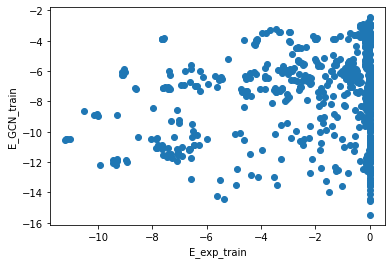

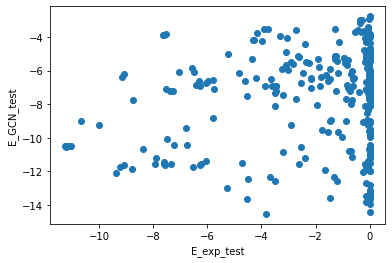

  1%|          | 1/100 [00:06<10:27,  6.34s/it]

INFO:__main__:1. time: 6.07 loss: 38.26 rmse: (6.106777218438826, 6.494755192013005) r2: (-4.004175512697249, -3.9808130365925427)


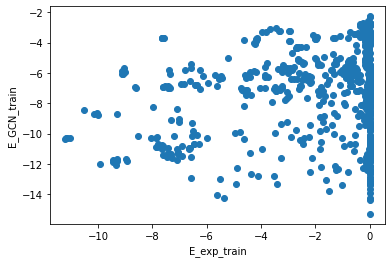

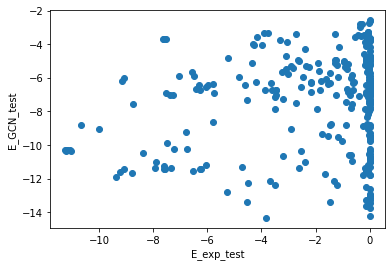

  2%|▏         | 2/100 [00:12<10:21,  6.35s/it]

INFO:__main__:2. time: 5.77 loss: 35.933 rmse: (5.85687829205728, 6.246859426701263) r2: (-3.6029979187731236, -3.607847896269952)


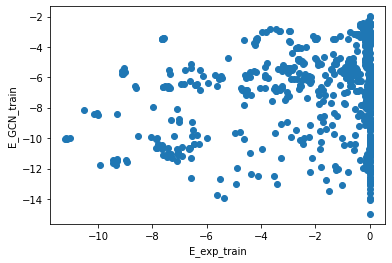

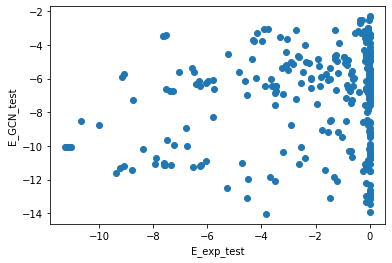

  3%|▎         | 3/100 [00:18<10:03,  6.22s/it]

INFO:__main__:3. time: 6.07 loss: 32.438 rmse: (5.488016965921597, 5.880220005854321) r2: (-3.041469172731733, -3.082834906315383)


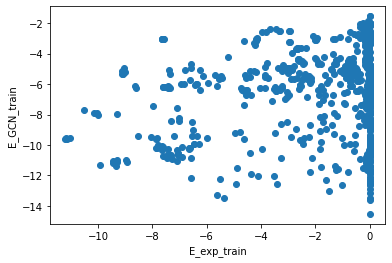

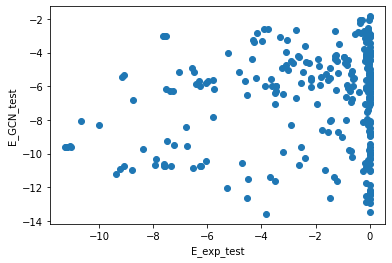

  4%|▍         | 4/100 [00:25<10:01,  6.27s/it]

INFO:__main__:4. time: 5.97 loss: 27.547 rmse: (4.943780678226833, 5.338104820964422) r2: (-2.279644507530293, -2.3647194876199302)


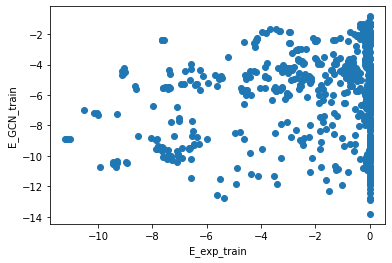

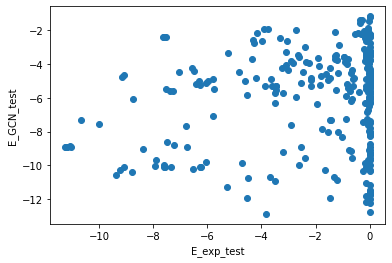

  5%|▌         | 5/100 [00:31<09:57,  6.29s/it]

INFO:__main__:5. time: 5.83 loss: 21.211 rmse: (4.2460878616335815, 4.638208250330042) r2: (-1.4192811013192812, -1.540242376254052)


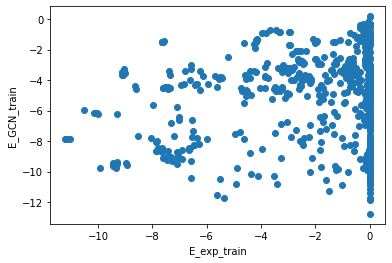

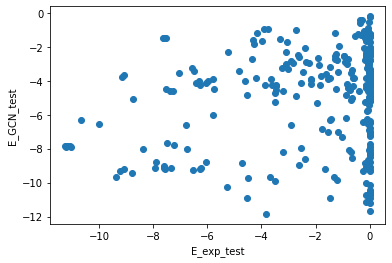

  6%|▌         | 6/100 [00:37<09:45,  6.22s/it]

INFO:__main__:6. time: 5.84 loss: 15.589 rmse: (3.644894548669125, 4.018009669743531) r2: (-0.7827002121861768, -0.9063235967517096)


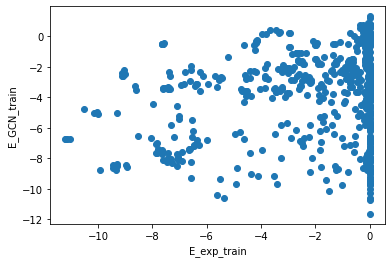

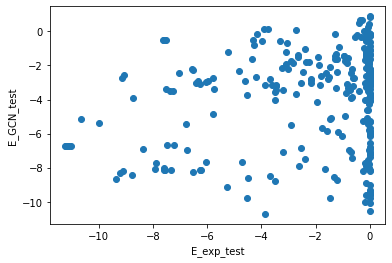

  7%|▋         | 7/100 [00:43<09:34,  6.17s/it]

INFO:__main__:7. time: 5.77 loss: 11.987 rmse: (3.342054553003858, 3.6788885070664743) r2: (-0.4987715797121306, -0.5981146067493825)


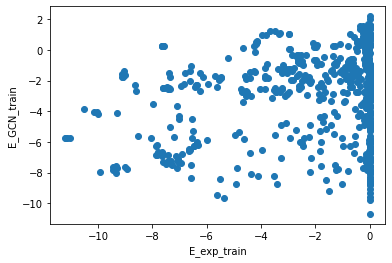

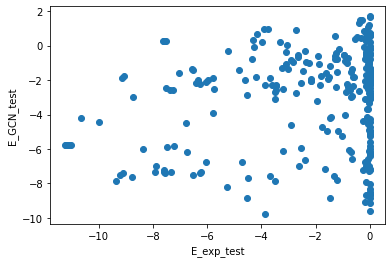

  8%|▊         | 8/100 [00:49<09:23,  6.13s/it]

INFO:__main__:8. time: 5.69 loss: 10.751 rmse: (3.2431553902739965, 3.551488362075357) r2: (-0.4113797926915077, -0.48934550916292907)


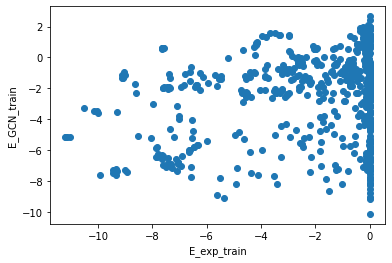

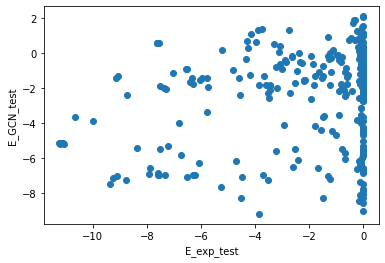

  9%|▉         | 9/100 [00:55<09:11,  6.06s/it]

INFO:__main__:9. time: 5.46 loss: 10.432 rmse: (3.200784616691908, 3.5036294408844078) r2: (-0.3747422564090743, -0.449475912420783)


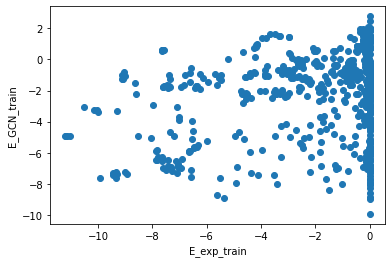

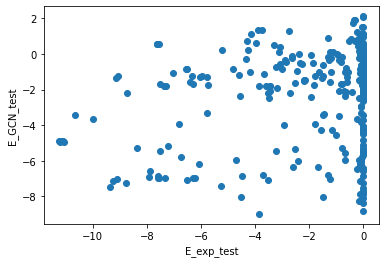

 10%|█         | 10/100 [01:01<08:55,  5.95s/it]

INFO:__main__:10. time: 5.68 loss: 10.145 rmse: (3.165977923259118, 3.4647111601323655) r2: (-0.34500575984511483, -0.4174532316983566)


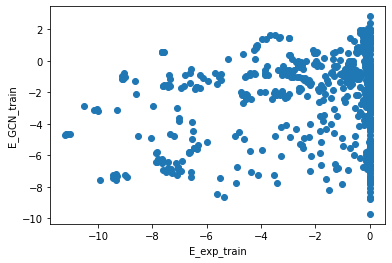

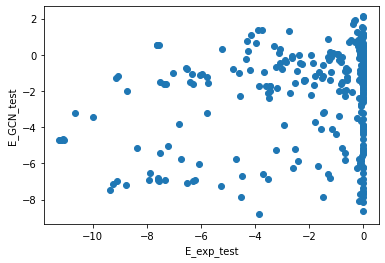

 11%|█         | 11/100 [01:07<08:48,  5.94s/it]

INFO:__main__:11. time: 5.84 loss: 9.957 rmse: (3.1337286957584722, 3.4335588255218985) r2: (-0.3177443682997134, -0.3920782664964102)


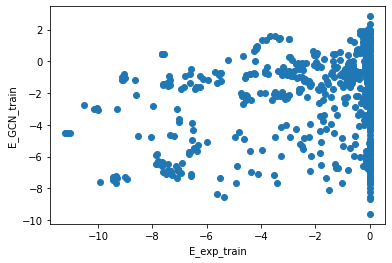

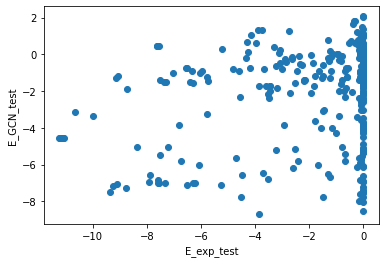

 12%|█▏        | 12/100 [01:13<08:47,  5.99s/it]

INFO:__main__:12. time: 5.6 loss: 9.683 rmse: (3.101984028736372, 3.4026155899402517) r2: (-0.29118209412436147, -0.3671005042809319)


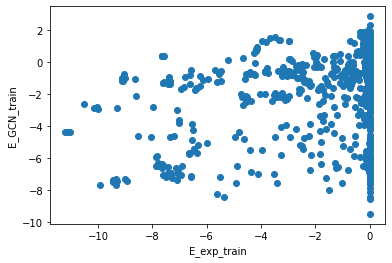

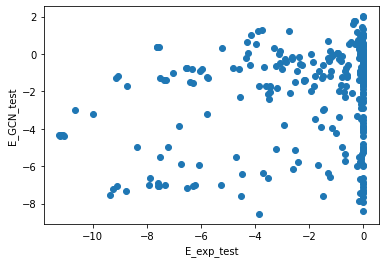

 13%|█▎        | 13/100 [01:19<08:37,  5.95s/it]

INFO:__main__:13. time: 5.54 loss: 9.515 rmse: (3.0739182323151706, 3.3775425656113884) r2: (-0.26792335514601295, -0.3470270915150442)


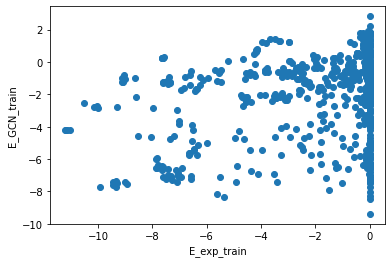

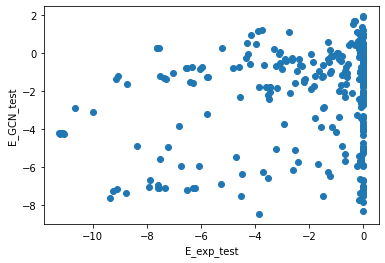

 14%|█▍        | 14/100 [01:24<08:27,  5.90s/it]

INFO:__main__:14. time: 5.57 loss: 9.39 rmse: (3.047074494521128, 3.35212013126373) r2: (-0.24587515049518838, -0.3268255225674588)


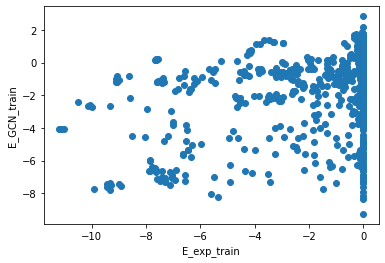

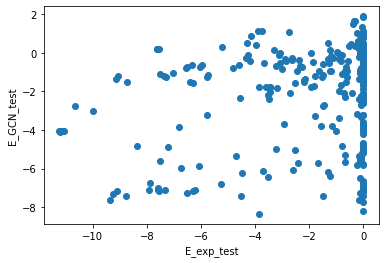

 15%|█▌        | 15/100 [01:30<08:19,  5.88s/it]

INFO:__main__:15. time: 5.71 loss: 9.19 rmse: (3.0220596876113417, 3.3294899245162584) r2: (-0.22550321585498656, -0.3089711613697719)


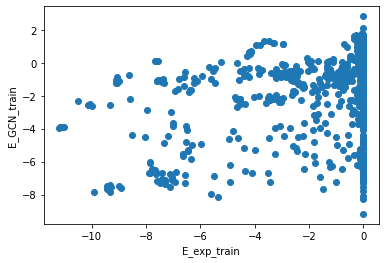

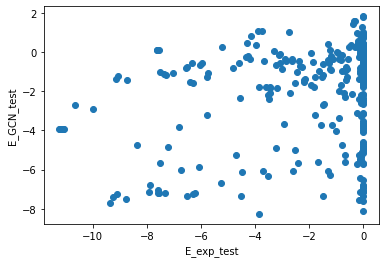

 16%|█▌        | 16/100 [01:36<08:15,  5.90s/it]

INFO:__main__:16. time: 5.27 loss: 9.063 rmse: (2.995844517502635, 3.305338874804735) r2: (-0.20433392400948192, -0.29005032188208113)


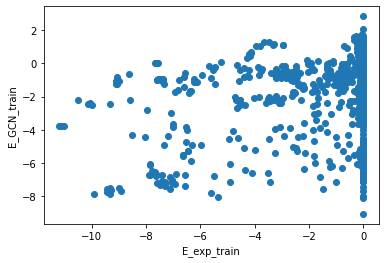

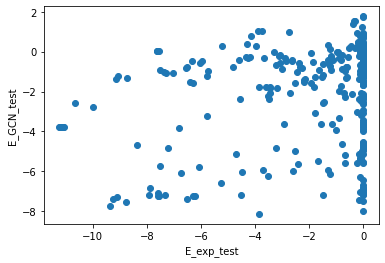

 17%|█▋        | 17/100 [01:42<07:59,  5.78s/it]

INFO:__main__:17. time: 5.57 loss: 8.932 rmse: (2.973711552245979, 3.2877064905056255) r2: (-0.1866046881416148, -0.2763234438360862)


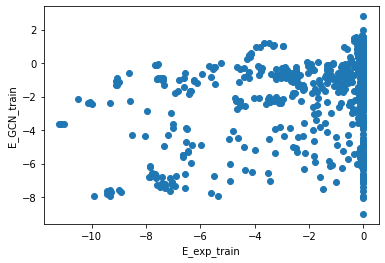

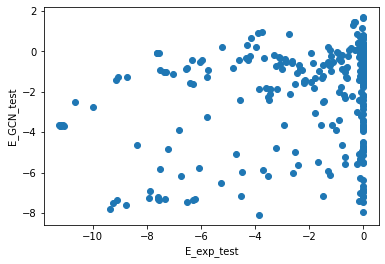

 18%|█▊        | 18/100 [01:48<07:54,  5.79s/it]

INFO:__main__:18. time: 5.55 loss: 8.758 rmse: (2.9496203782409016, 3.2657082370571167) r2: (-0.1674562915167892, -0.2593006624152532)


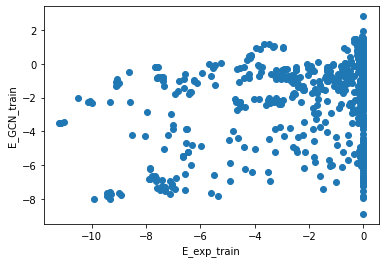

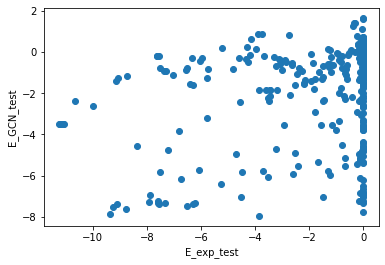

 19%|█▉        | 19/100 [01:53<07:48,  5.79s/it]

INFO:__main__:19. time: 5.65 loss: 8.616 rmse: (2.9275883864126415, 3.2474907234282617) r2: (-0.15008095361011042, -0.24529001782264293)


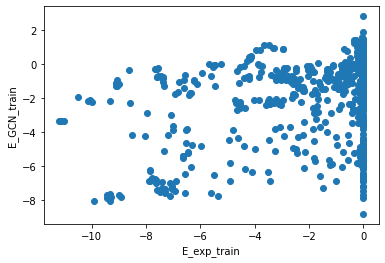

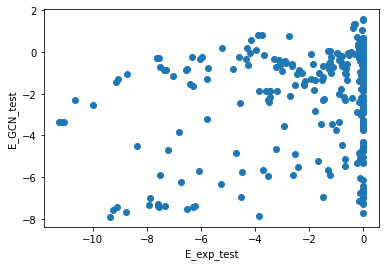

 20%|██        | 20/100 [01:59<07:47,  5.84s/it]

INFO:__main__:20. time: 5.99 loss: 8.504 rmse: (2.907867787830439, 3.232195780479294) r2: (-0.13463896297926192, -0.23358757509108785)


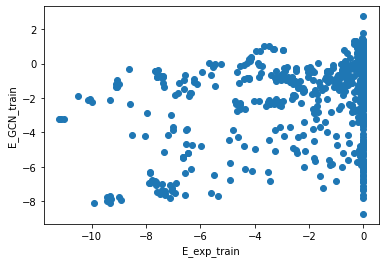

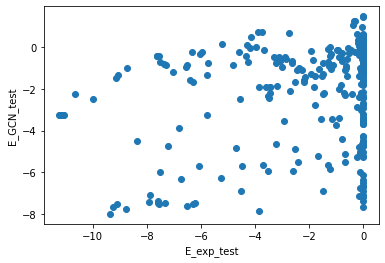

 21%|██        | 21/100 [02:05<07:50,  5.96s/it]

INFO:__main__:21. time: 5.56 loss: 8.41 rmse: (2.8884082081837255, 3.2160077047268683) r2: (-0.11950366794110834, -0.22126195917116753)


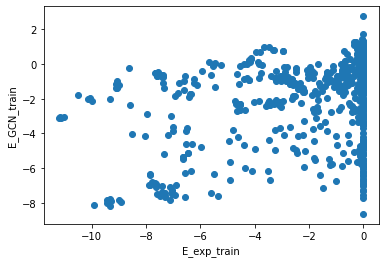

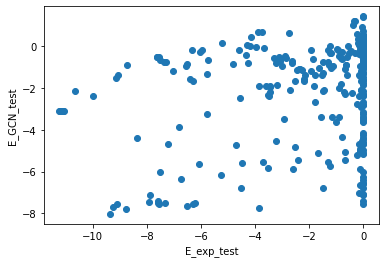

 22%|██▏       | 22/100 [02:11<07:41,  5.92s/it]

INFO:__main__:22. time: 6.36 loss: 8.279 rmse: (2.8703768385712363, 3.202542713131505) r2: (-0.10556991955196615, -0.21105684865876473)


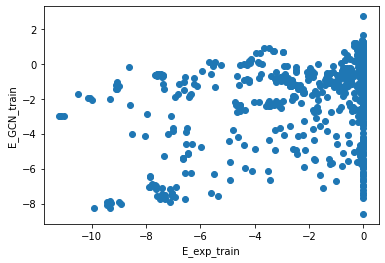

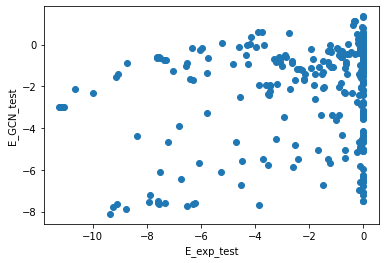

 23%|██▎       | 23/100 [02:18<07:52,  6.13s/it]

INFO:__main__:23. time: 6.17 loss: 8.192 rmse: (2.8533213721553037, 3.188351361490308) r2: (-0.09247060088380543, -0.20034757418949156)


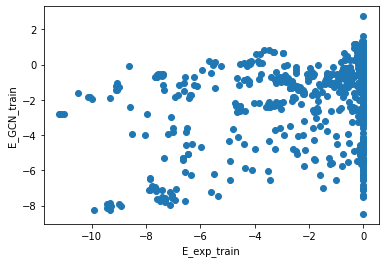

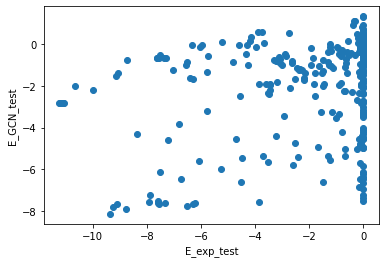

 24%|██▍       | 24/100 [02:24<07:53,  6.23s/it]

INFO:__main__:24. time: 6.0 loss: 8.086 rmse: (2.8372837400110225, 3.175558009509184) r2: (-0.08022423932299683, -0.1907340415885761)


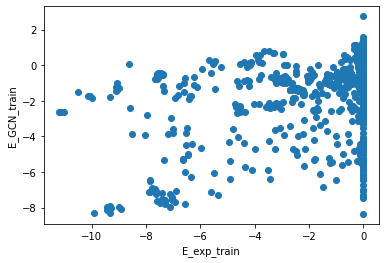

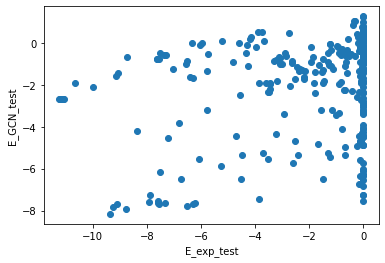

 25%|██▌       | 25/100 [02:31<07:47,  6.24s/it]

INFO:__main__:25. time: 5.66 loss: 8.006 rmse: (2.822643427834595, 3.165642661108197) r2: (-0.0691051412741015, -0.18330976497884555)


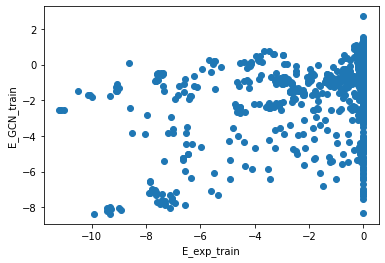

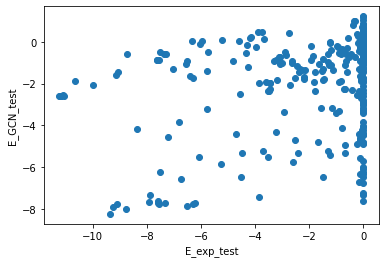

 26%|██▌       | 26/100 [02:37<07:37,  6.18s/it]

INFO:__main__:26. time: 5.51 loss: 7.915 rmse: (2.8082895316323526, 3.1561845189425286) r2: (-0.0582594175334048, -0.17624946546064102)


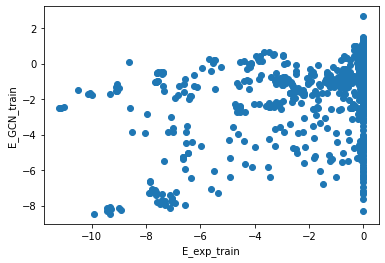

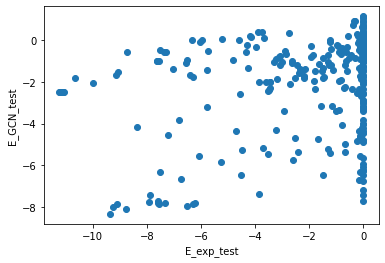

 27%|██▋       | 27/100 [02:42<07:21,  6.05s/it]

INFO:__main__:27. time: 5.44 loss: 7.824 rmse: (2.795342110890693, 3.146764906387227) r2: (-0.048523851204436586, -0.16923892450577283)


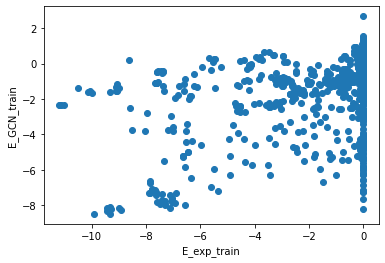

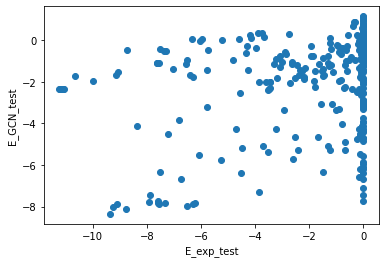

 28%|██▊       | 28/100 [02:48<07:08,  5.95s/it]

INFO:__main__:28. time: 5.66 loss: 7.77 rmse: (2.7821123451352054, 3.1373107777510154) r2: (-0.038622452080818714, -0.16222376447570186)


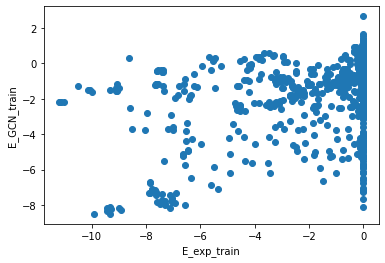

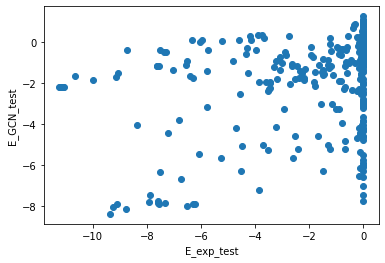

 29%|██▉       | 29/100 [02:54<07:01,  5.93s/it]

INFO:__main__:29. time: 5.7 loss: 7.706 rmse: (2.768325934762571, 3.1281812316884836) r2: (-0.02835442845332037, -0.1554694849006284)


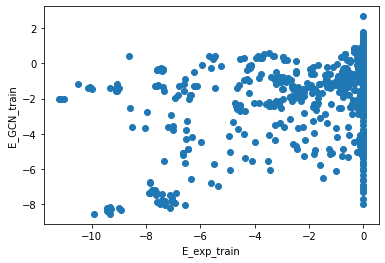

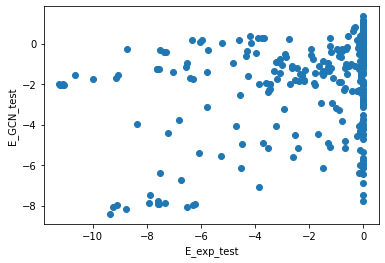

 30%|███       | 30/100 [03:00<06:55,  5.94s/it]

INFO:__main__:30. time: 5.76 loss: 7.683 rmse: (2.7580807791498825, 3.1217822960150414) r2: (-0.020756944655121456, -0.15074711615573233)


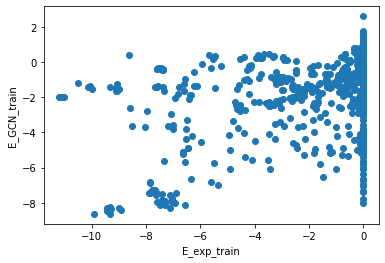

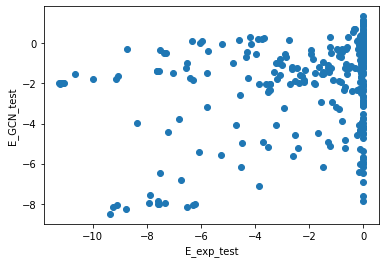

 31%|███       | 31/100 [03:06<06:52,  5.97s/it]

INFO:__main__:31. time: 5.89 loss: 7.569 rmse: (2.74725967089413, 3.1157553640993636) r2: (-0.012762941735261712, -0.14630812648281388)


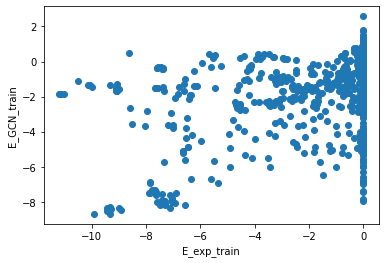

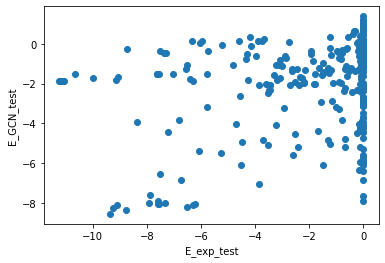

 32%|███▏      | 32/100 [03:12<06:49,  6.02s/it]

INFO:__main__:32. time: 5.71 loss: 7.515 rmse: (2.7383390363916496, 3.110194419332689) r2: (-0.0061965292618859635, -0.1422199572683167)


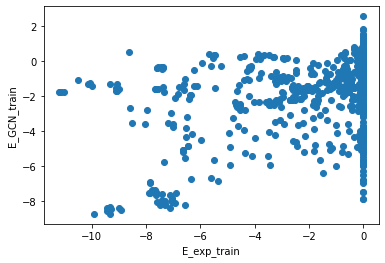

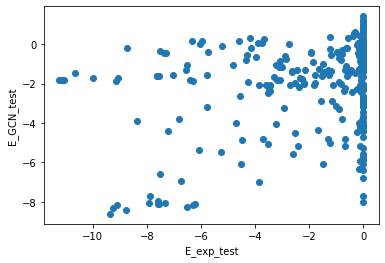

 33%|███▎      | 33/100 [03:18<06:42,  6.00s/it]

INFO:__main__:33. time: 6.04 loss: 7.49 rmse: (2.7297669773764546, 3.105333465705306) r2: (9.31783665811814e-05, -0.13865237361195848)


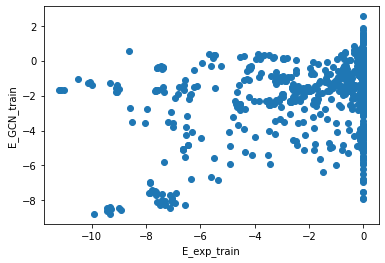

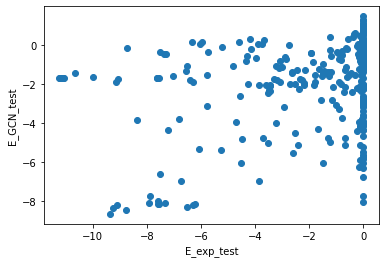

 34%|███▍      | 34/100 [03:24<06:42,  6.10s/it]

INFO:__main__:34. time: 5.92 loss: 7.428 rmse: (2.722856690246185, 3.101272560712788) r2: (0.005149212501780687, -0.13567624512905696)


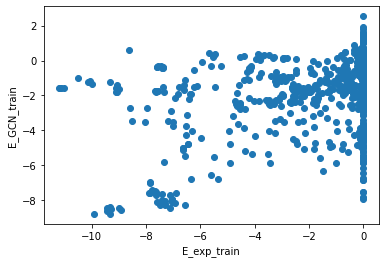

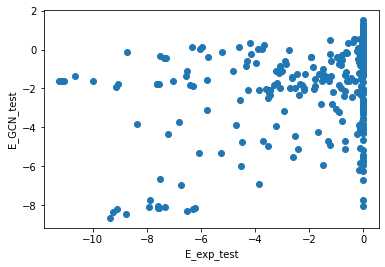

 35%|███▌      | 35/100 [03:31<06:37,  6.12s/it]

INFO:__main__:35. time: 6.03 loss: 7.462 rmse: (2.715622766236414, 3.097706179014663) r2: (0.010428311599518625, -0.13306575149900812)


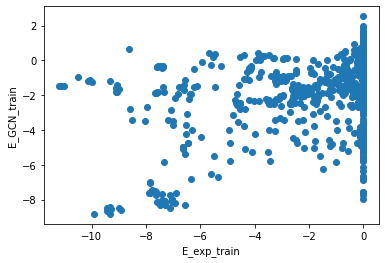

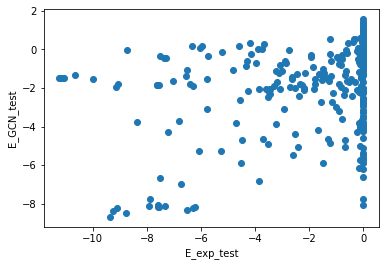

 36%|███▌      | 36/100 [03:37<06:34,  6.17s/it]

INFO:__main__:36. time: 5.84 loss: 7.369 rmse: (2.7101012669113005, 3.094419819283013) r2: (0.014448284300703773, -0.13066288549062244)


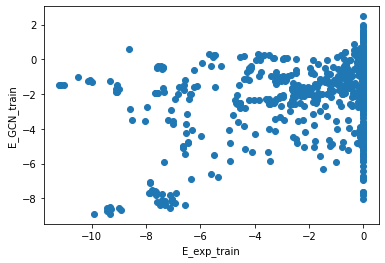

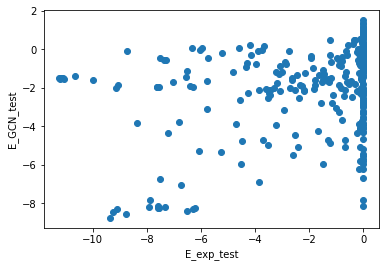

 37%|███▋      | 37/100 [03:43<06:27,  6.15s/it]

INFO:__main__:37. time: 5.82 loss: 7.339 rmse: (2.703976541260639, 3.09142738476814) r2: (0.01889786935309945, -0.1284771454303162)


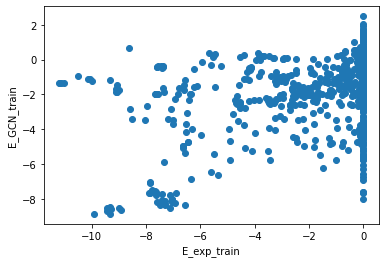

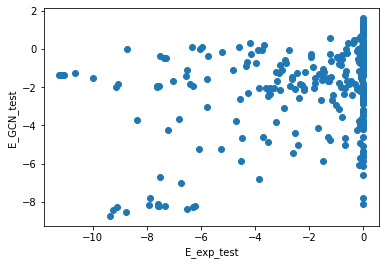

 38%|███▊      | 38/100 [03:49<06:19,  6.12s/it]

INFO:__main__:38. time: 5.88 loss: 7.298 rmse: (2.698294417038221, 3.088509405258493) r2: (0.02301690420786273, -0.12634782540022327)


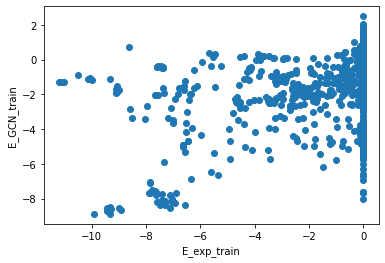

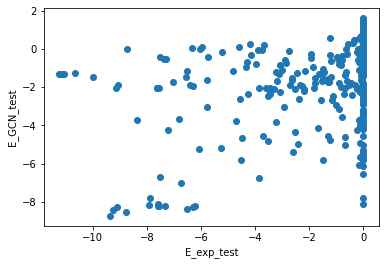

 39%|███▉      | 39/100 [03:55<06:13,  6.13s/it]

INFO:__main__:39. time: 6.14 loss: 7.289 rmse: (2.6939828760792945, 3.086947756289977) r2: (0.02613660622231584, -0.12520907851890706)


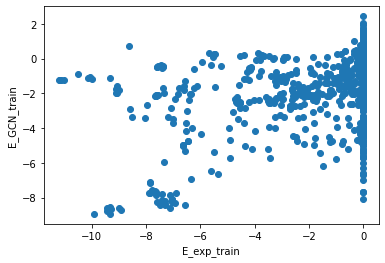

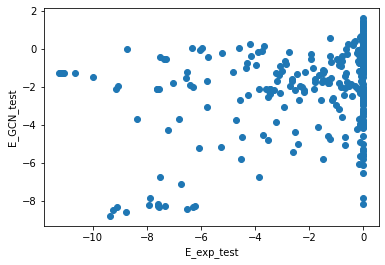

 40%|████      | 40/100 [04:02<06:12,  6.21s/it]

INFO:__main__:40. time: 5.83 loss: 7.242 rmse: (2.6891511509539394, 3.083671607199757) r2: (0.02962676988165258, -0.1228219979177625)


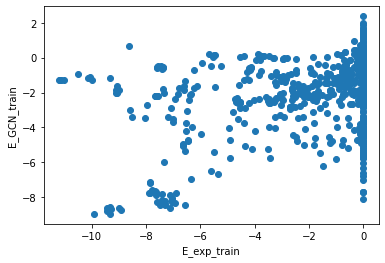

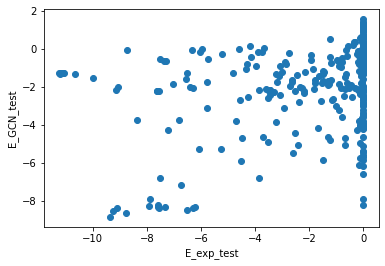

 41%|████      | 41/100 [04:08<06:04,  6.18s/it]

INFO:__main__:41. time: 5.89 loss: 7.213 rmse: (2.6836896421003087, 3.080492760193175) r2: (0.03356431001821847, -0.1205082368691941)


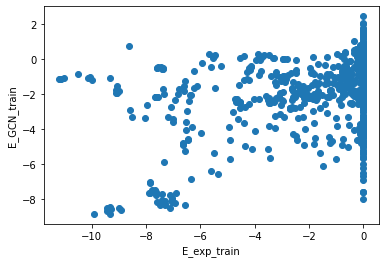

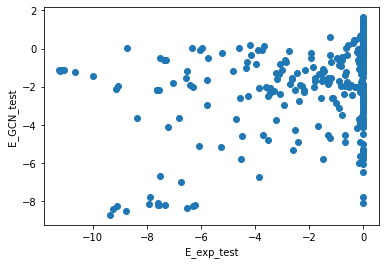

 42%|████▏     | 42/100 [04:14<05:57,  6.17s/it]

INFO:__main__:42. time: 5.68 loss: 7.268 rmse: (2.678256282108707, 3.0786837365261435) r2: (0.03747361263437632, -0.11919258324462612)


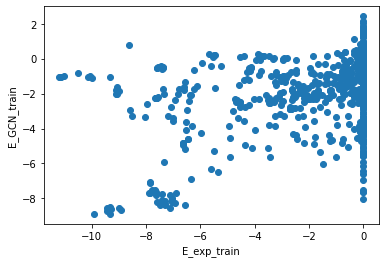

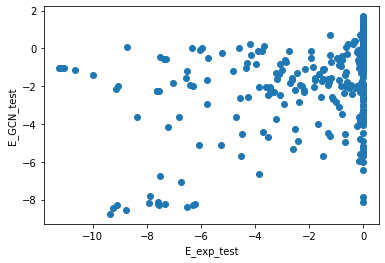

 43%|████▎     | 43/100 [04:20<05:47,  6.10s/it]

INFO:__main__:43. time: 5.79 loss: 7.207 rmse: (2.674138869283337, 3.076248913716399) r2: (0.040430814431493656, -0.11742302307162777)


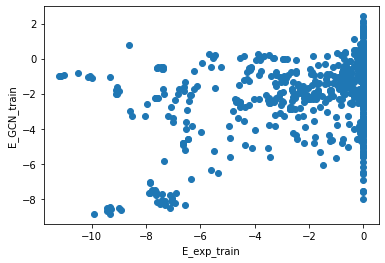

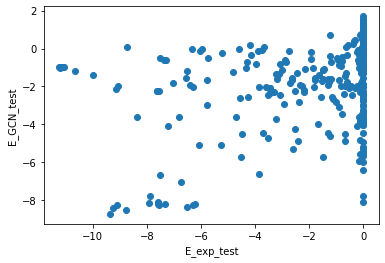

 44%|████▍     | 44/100 [04:26<05:40,  6.08s/it]

INFO:__main__:44. time: 5.56 loss: 7.14 rmse: (2.6701292122924833, 3.0733357806579007) r2: (0.04330625130265009, -0.11530768017092141)


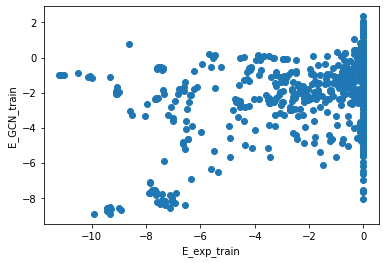

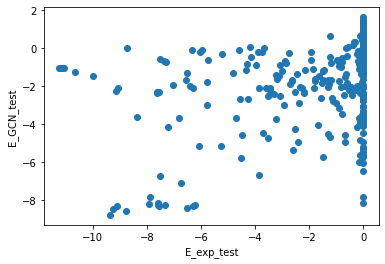

 45%|████▌     | 45/100 [04:32<05:29,  6.00s/it]

INFO:__main__:45. time: 5.56 loss: 7.112 rmse: (2.666160843077992, 3.0716133278725466) r2: (0.046147831250553106, -0.11405788084773105)


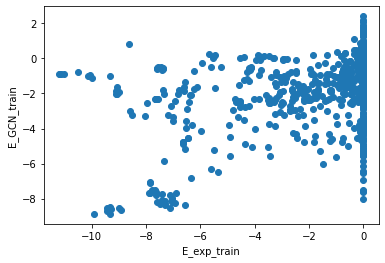

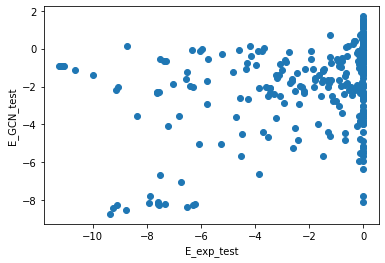

 46%|████▌     | 46/100 [04:37<05:20,  5.94s/it]

INFO:__main__:46. time: 5.87 loss: 7.107 rmse: (2.662232117892921, 3.0683074139132653) r2: (0.04895686059894422, -0.11166109638988853)


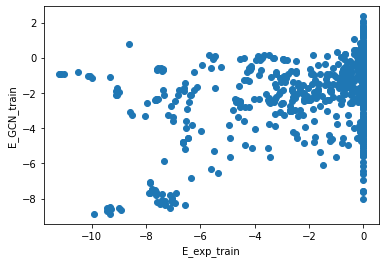

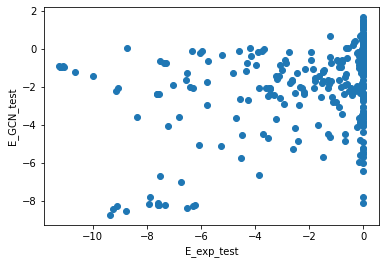

 47%|████▋     | 47/100 [04:44<05:19,  6.03s/it]

INFO:__main__:47. time: 5.74 loss: 7.066 rmse: (2.658228645139818, 3.0672657359086317) r2: (0.05181507301669985, -0.11090641559062964)


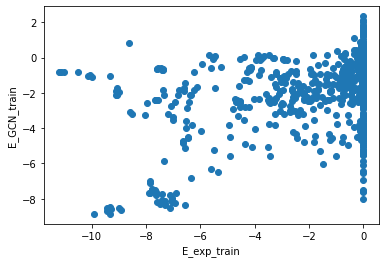

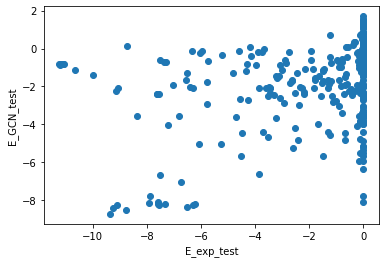

 48%|████▊     | 48/100 [04:50<05:12,  6.02s/it]

INFO:__main__:48. time: 6.15 loss: 7.071 rmse: (2.654569090422983, 3.0643606000931474) r2: (0.05442398788000291, -0.10880304019264808)


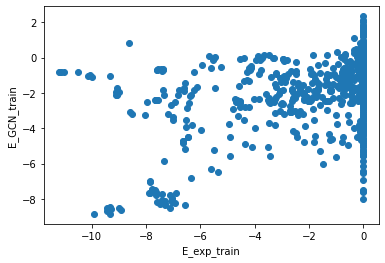

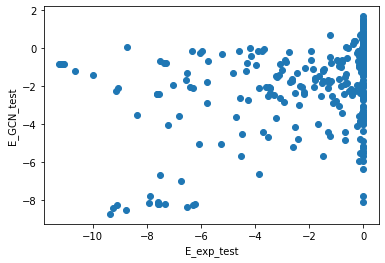

 49%|████▉     | 49/100 [04:56<05:13,  6.14s/it]

INFO:__main__:49. time: 6.18 loss: 7.053 rmse: (2.651114088376393, 3.0626241663422284) r2: (0.05688377771224962, -0.10754677974194649)


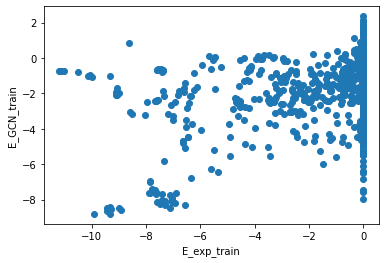

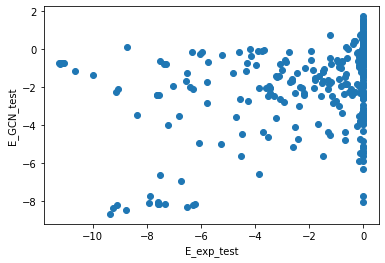

 50%|█████     | 50/100 [05:03<05:11,  6.24s/it]

INFO:__main__:50. time: 6.02 loss: 7.003 rmse: (2.6475875253738756, 3.060247503440412) r2: (0.05939121159747318, -0.10582848598275518)


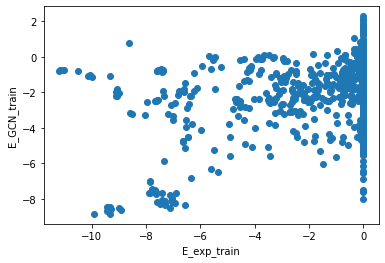

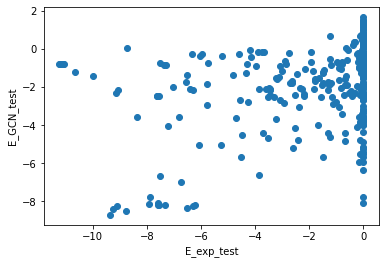

 51%|█████     | 51/100 [05:09<05:06,  6.25s/it]

INFO:__main__:51. time: 6.22 loss: 6.993 rmse: (2.6440624000262116, 3.0589947437990985) r2: (0.061894287674646886, -0.10492329531352085)


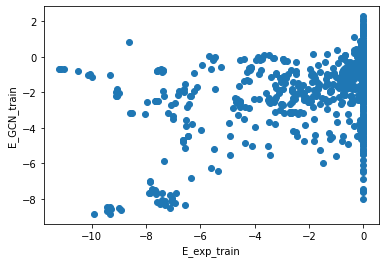

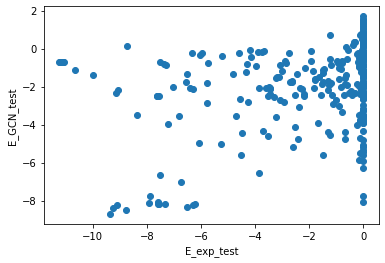

 52%|█████▏    | 52/100 [05:15<05:03,  6.33s/it]

INFO:__main__:52. time: 6.02 loss: 6.968 rmse: (2.640752924871083, 3.05585426671746) r2: (0.06424120245833309, -0.10265574968609847)


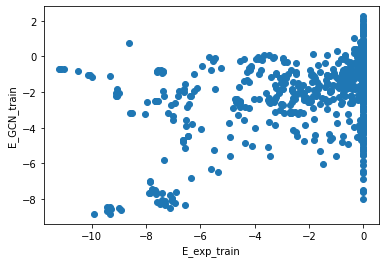

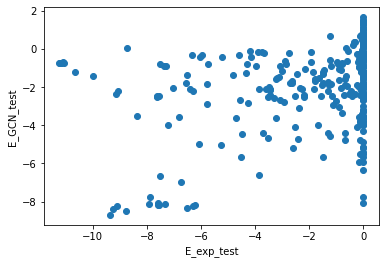

 53%|█████▎    | 53/100 [05:22<04:56,  6.31s/it]

INFO:__main__:53. time: 6.0 loss: 6.974 rmse: (2.6376321574103168, 3.055795964471407) r2: (0.06645160239643322, -0.1026136752362361)


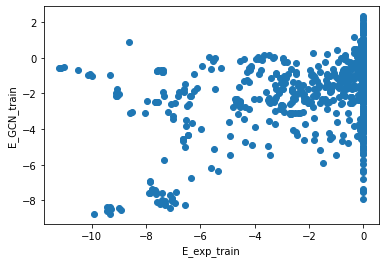

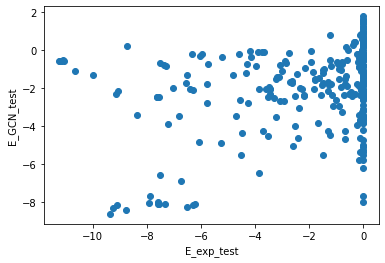

 54%|█████▍    | 54/100 [05:28<04:49,  6.29s/it]

INFO:__main__:54. time: 5.99 loss: 6.941 rmse: (2.633784733431103, 3.0518221921312323) r2: (0.06917308643227793, -0.09974785114981999)


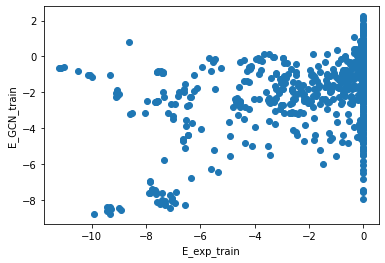

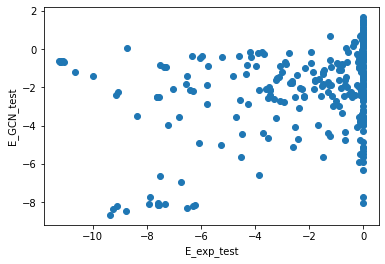

 55%|█████▌    | 55/100 [05:34<04:42,  6.28s/it]

INFO:__main__:55. time: 5.05 loss: 6.978 rmse: (2.6303793751202997, 3.0501984591989126) r2: (0.07157856014172537, -0.09857791289812812)


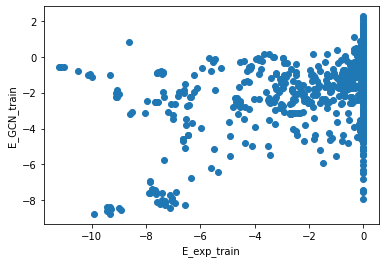

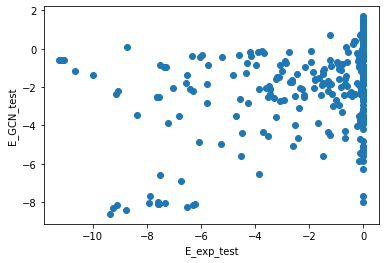

 56%|█████▌    | 56/100 [05:39<04:22,  5.98s/it]

INFO:__main__:56. time: 4.94 loss: 6.912 rmse: (2.6273797507813996, 3.047881254459561) r2: (0.07369485381948027, -0.09690938999001752)


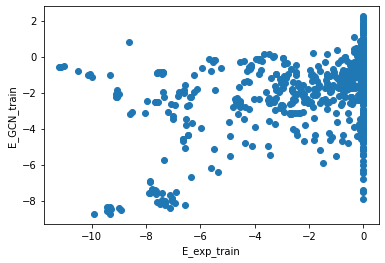

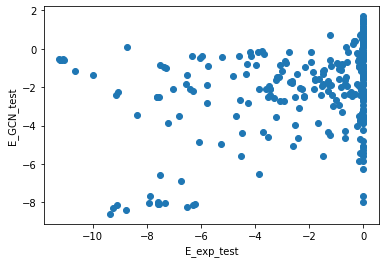

 57%|█████▋    | 57/100 [05:45<04:06,  5.73s/it]

INFO:__main__:57. time: 5.03 loss: 6.912 rmse: (2.6241807946255253, 3.0456200189308222) r2: (0.0759491192156343, -0.0952823906557505)


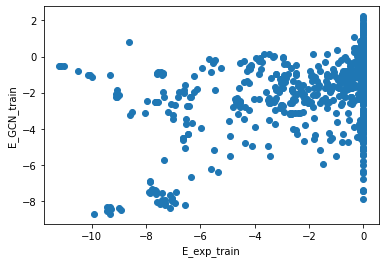

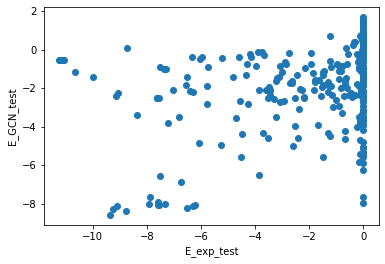

 58%|█████▊    | 58/100 [05:50<03:54,  5.58s/it]

INFO:__main__:58. time: 4.86 loss: 6.889 rmse: (2.621114347595187, 3.0446828959434358) r2: (0.07810742898768164, -0.09460846784978627)


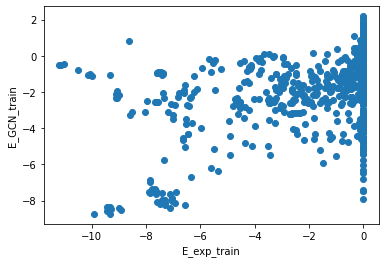

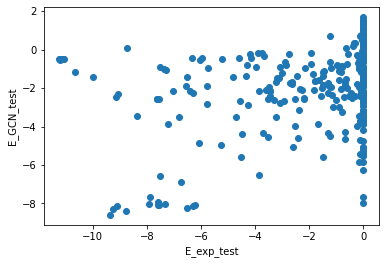

 59%|█████▉    | 59/100 [05:55<03:42,  5.43s/it]

INFO:__main__:59. time: 4.85 loss: 6.857 rmse: (2.6180049291797385, 3.0425005195920045) r2: (0.08029340721578626, -0.09303983717561115)


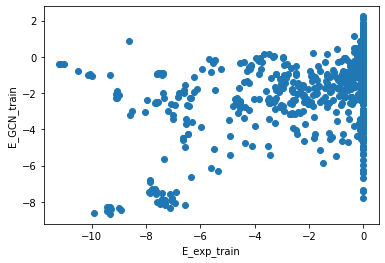

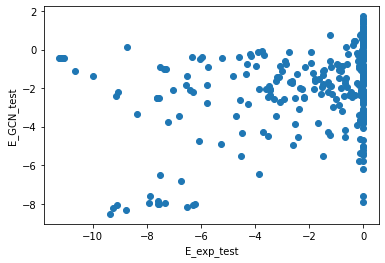

 60%|██████    | 60/100 [06:00<03:32,  5.32s/it]

INFO:__main__:60. time: 4.87 loss: 6.854 rmse: (2.6150122989043663, 3.0394727454277652) r2: (0.08239483083671173, -0.09086542108030704)


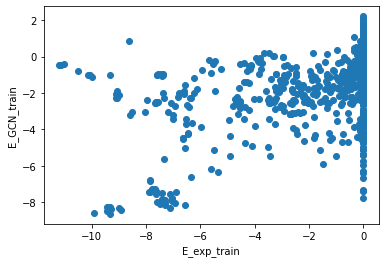

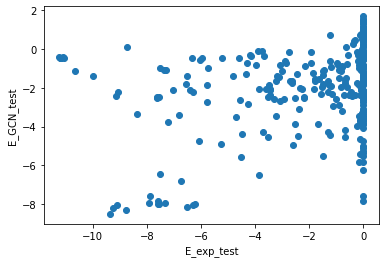

 61%|██████    | 61/100 [06:05<03:24,  5.25s/it]

INFO:__main__:61. time: 4.95 loss: 6.82 rmse: (2.611888590739253, 3.0392867227317315) r2: (0.08458573357379029, -0.0907318982400811)


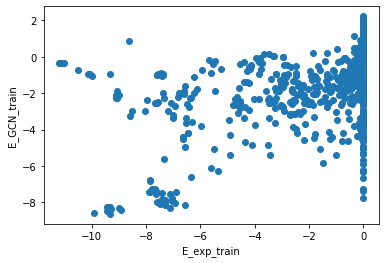

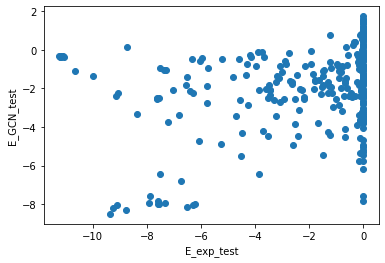

 62%|██████▏   | 62/100 [06:10<03:18,  5.22s/it]

INFO:__main__:62. time: 5.75 loss: 6.811 rmse: (2.6086524019148647, 3.0367069490432312) r2: (0.08685276606201986, -0.08888103815216253)


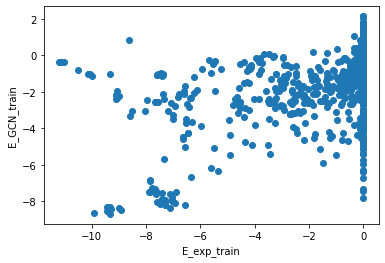

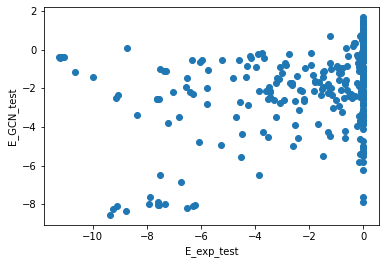

 63%|██████▎   | 63/100 [06:16<03:21,  5.46s/it]

INFO:__main__:63. time: 5.93 loss: 6.815 rmse: (2.6061231831093656, 3.034273725309249) r2: (0.08862259138864181, -0.08713676071586329)


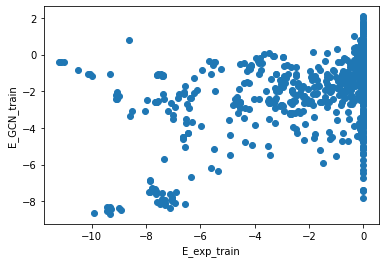

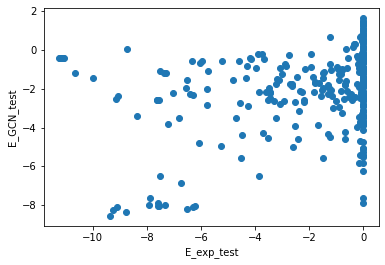

 64%|██████▍   | 64/100 [06:22<03:24,  5.67s/it]

INFO:__main__:64. time: 6.03 loss: 6.792 rmse: (2.6039025454049893, 3.033692336550877) r2: (0.0901750711857946, -0.08672019411962206)


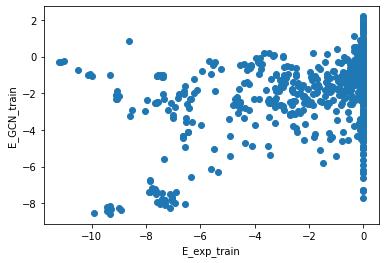

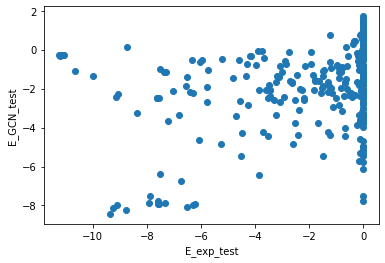

 65%|██████▌   | 65/100 [06:29<03:25,  5.86s/it]

INFO:__main__:65. time: 6.02 loss: 6.76 rmse: (2.599749681187649, 3.0302671210141074) r2: (0.09307484667965982, -0.08426763851334007)


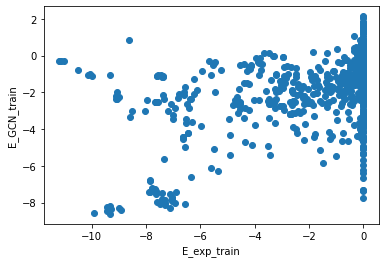

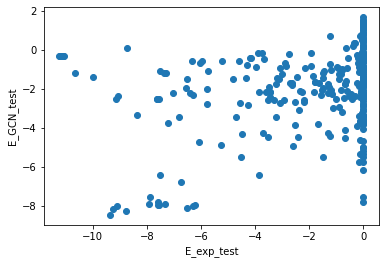

 66%|██████▌   | 66/100 [06:35<03:23,  5.98s/it]

INFO:__main__:66. time: 6.02 loss: 6.758 rmse: (2.5974845888051084, 3.029775404466116) r2: (0.09465451748892417, -0.08391578234876107)


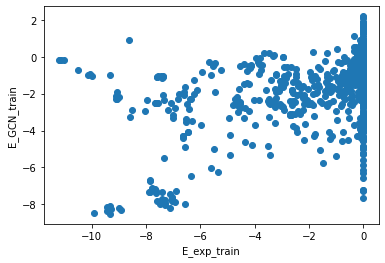

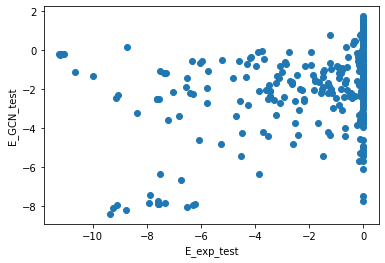

 67%|██████▋   | 67/100 [06:41<03:20,  6.06s/it]

INFO:__main__:67. time: 5.26 loss: 6.756 rmse: (2.593572871850102, 3.0267052380384514) r2: (0.09737929871623774, -0.08172016365207724)


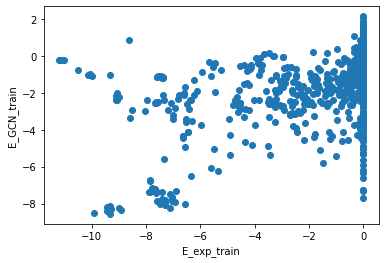

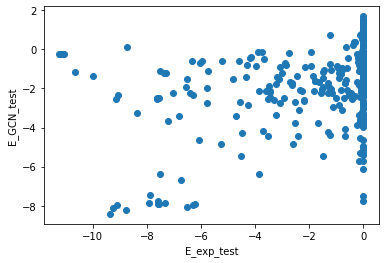

 68%|██████▊   | 68/100 [06:47<03:09,  5.93s/it]

INFO:__main__:68. time: 5.47 loss: 6.736 rmse: (2.590925243290073, 3.025421132609543) r2: (0.09922122463009075, -0.08080250040515269)


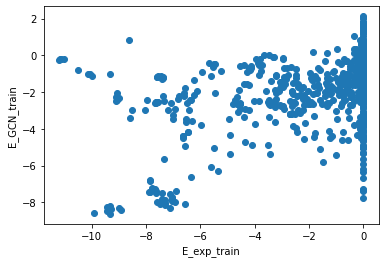

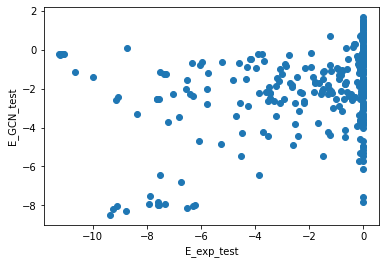

 69%|██████▉   | 69/100 [06:53<03:01,  5.87s/it]

INFO:__main__:69. time: 5.99 loss: 6.697 rmse: (2.5885578419085684, 3.023785439048439) r2: (0.10086660645486767, -0.07963414484989717)


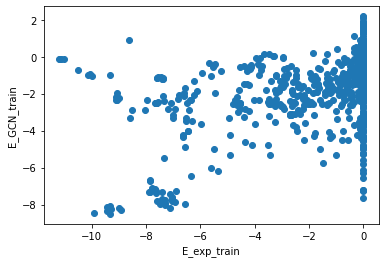

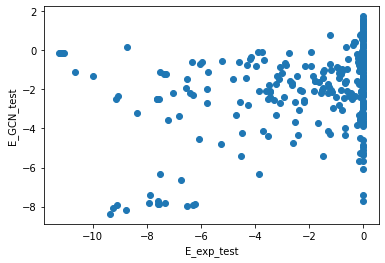

 70%|███████   | 70/100 [06:59<02:59,  5.98s/it]

INFO:__main__:70. time: 5.75 loss: 6.67 rmse: (2.584933501083335, 3.020989856137952) r2: (0.10338266729014867, -0.07763875753614435)


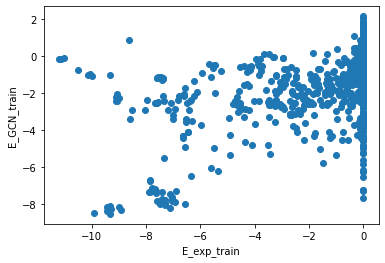

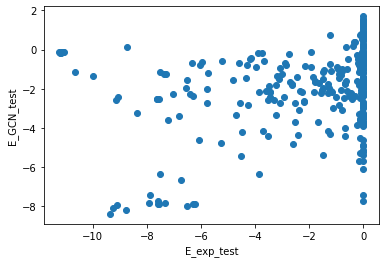

 71%|███████   | 71/100 [07:05<02:53,  5.98s/it]

INFO:__main__:71. time: 5.75 loss: 6.74 rmse: (2.5822709061023494, 3.0190740394722297) r2: (0.10522882641354658, -0.07627238177808993)


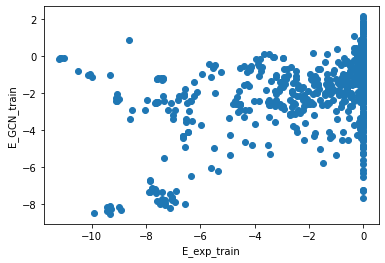

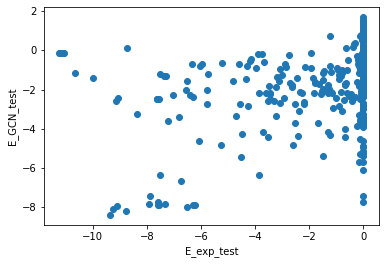

 72%|███████▏  | 72/100 [07:11<02:47,  5.98s/it]

INFO:__main__:72. time: 5.98 loss: 6.643 rmse: (2.579436908484056, 3.016657003514293) r2: (0.10719174043770163, -0.07454976902185018)


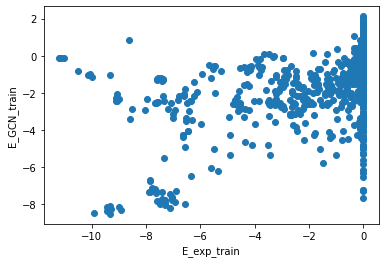

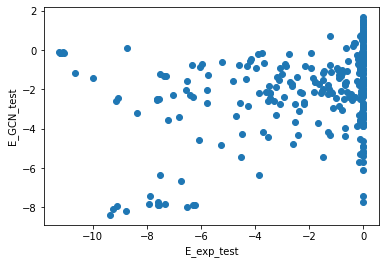

 73%|███████▎  | 73/100 [07:17<02:43,  6.06s/it]

INFO:__main__:73. time: 5.78 loss: 6.662 rmse: (2.57701055969138, 3.0144325430339167) r2: (0.10887059165264201, -0.07296562326032441)


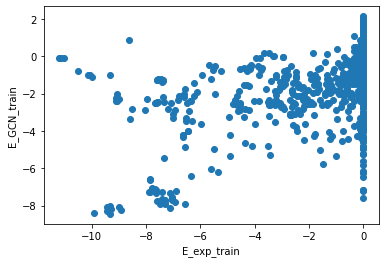

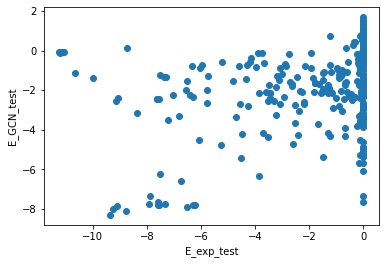

 74%|███████▍  | 74/100 [07:23<02:37,  6.05s/it]

INFO:__main__:74. time: 6.05 loss: 6.641 rmse: (2.5739567726980916, 3.0132153500357335) r2: (0.11098133736845728, -0.07209929598301801)


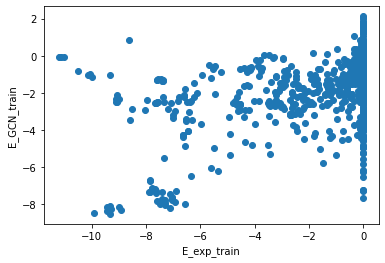

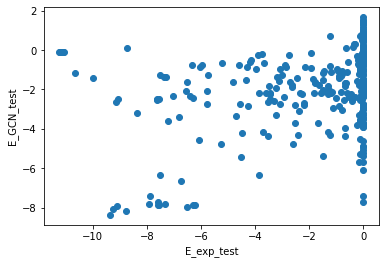

 75%|███████▌  | 75/100 [07:29<02:33,  6.13s/it]

INFO:__main__:75. time: 5.54 loss: 6.628 rmse: (2.571231096979981, 3.009893354948163) r2: (0.1128631821635141, -0.06973667337311062)


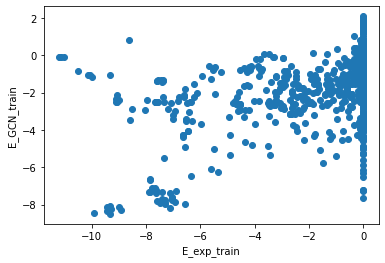

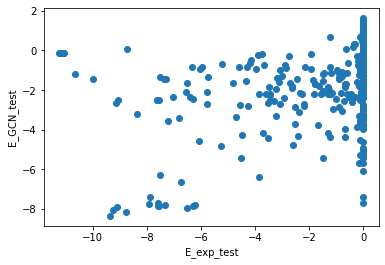

 76%|███████▌  | 76/100 [07:35<02:24,  6.01s/it]

INFO:__main__:76. time: 5.78 loss: 6.661 rmse: (2.568963106998685, 3.0103202270496925) r2: (0.11442751455926647, -0.07004012141533122)


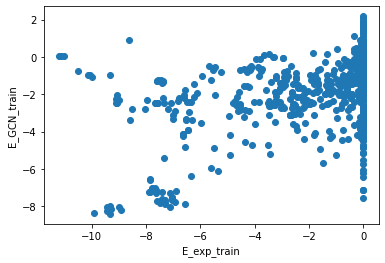

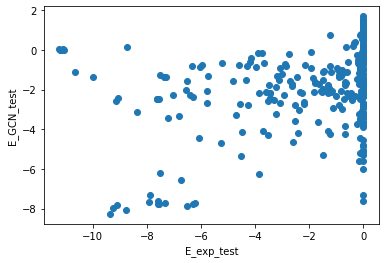

 77%|███████▋  | 77/100 [07:41<02:18,  6.02s/it]

INFO:__main__:77. time: 5.32 loss: 6.601 rmse: (2.565683278915968, 3.006252944209021) r2: (0.11668731453589931, -0.06715058450932943)


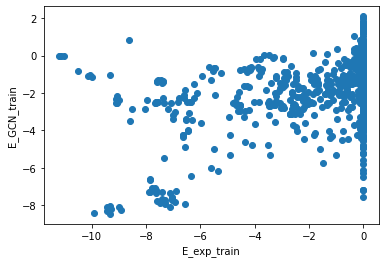

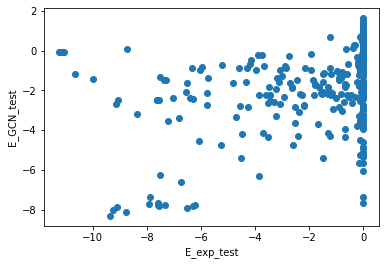

 78%|███████▊  | 78/100 [07:47<02:09,  5.87s/it]

INFO:__main__:78. time: 5.78 loss: 6.582 rmse: (2.5631014360379494, 3.0035229911722285) r2: (0.11846417227632022, -0.0652133235572474)


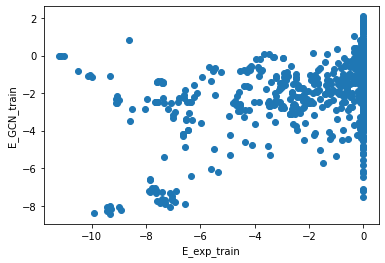

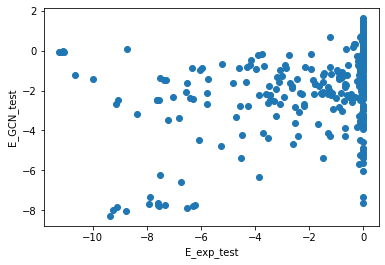

 79%|███████▉  | 79/100 [07:53<02:04,  5.92s/it]

INFO:__main__:79. time: 5.23 loss: 6.576 rmse: (2.5611015521026084, 3.0033644711113694) r2: (0.11983928878855232, -0.06510088677858095)


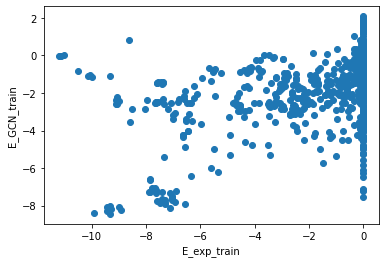

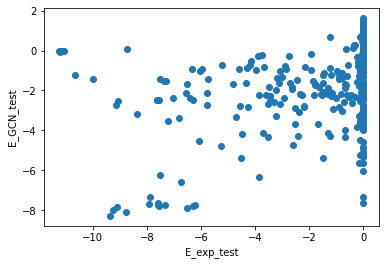

 80%|████████  | 80/100 [07:58<01:55,  5.78s/it]

INFO:__main__:80. time: 4.92 loss: 6.56 rmse: (2.5579438562845023, 2.9995705703337836) r2: (0.12200832925166183, -0.06241167948259041)


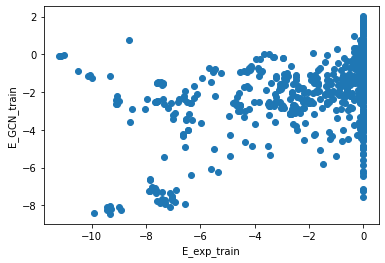

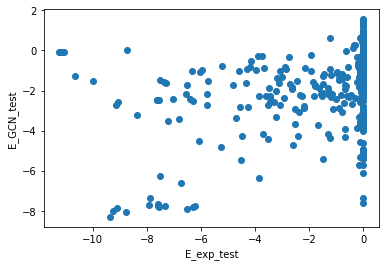

 81%|████████  | 81/100 [08:03<01:46,  5.59s/it]

INFO:__main__:81. time: 5.64 loss: 6.548 rmse: (2.5550758992493083, 2.997586431318897) r2: (0.12397602746595326, -0.06100662817350733)


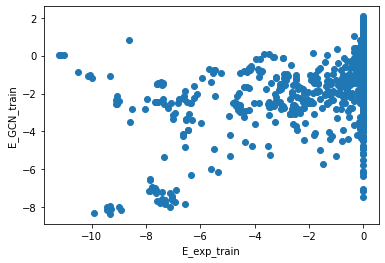

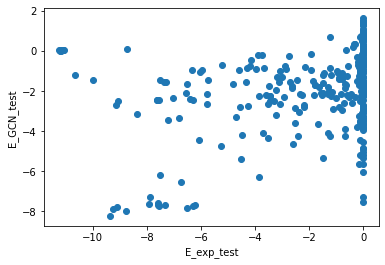

 82%|████████▏ | 82/100 [08:09<01:42,  5.68s/it]

In [ ]:
in_dim=24
hidden_dim=8
out_dim=2
num_layers=2
heads=8
activation=F.elu
feat_drop=.6
attn_drop=.6
negative_slope=.2
residual=False
with_edge_weights = False

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# gnn = Classifier(in_dim, hidden_dim, out_dim, with_edge_weights).to(device)

gnn = Regressor(in_dim = in_dim, 
                hidden_dim = hidden_dim, 
                with_edge_weights = with_edge_weights).to(device)

opt = torch.optim.Adam(gnn.parameters())
metrics = ddict(list)



for epoch in tqdm(range(100)):
    start = time.time()
        
    loss = train_model(gnn, opt, trainloader, device)
    
    loss1, rmse1, r21, y_true_train, y_pred_train = evaluate_model(gnn, opt, trainloader, device)
    loss2, rmse2, r22, y_true_test, y_pred_test = evaluate_model(gnn, opt, testloader, device)
    metrics['rmse'].append((rmse1, rmse2))
    metrics['loss'].append((loss1, loss2))
    metrics['r2'].append((r21, r22))
    logger.debug(metrics)

    logger.info(f"{epoch}. time: {round(time.time() - start, 2)} loss: {round(loss, 3)} rmse: {metrics['rmse'][-1]} r2: {metrics['r2'][-1]}")
        
    plt.scatter(y_true_train, y_pred_train)
    plt.xlabel('E_exp_train')
    plt.ylabel('E_GCN_train')
    plt.show()
    
    plt.scatter(y_true_test, y_pred_test)
    plt.xlabel('E_exp_test')
    plt.ylabel('E_GCN_test')
    plt.show()

In [ ]:
plot_interactive([metrics], legend=['Train', 'Test'], title='Loss', logx=False, logy=False, metric_name='loss', start_from=0)

In [ ]:
plot_interactive([metrics], legend=['Train', 'Test'], title='RMSE', logx=False, logy=False, metric_name='rmse', start_from=0)

In [ ]:
plot_interactive([metrics], legend=['Train', 'Test'], title='R2', logx=False, logy=False, metric_name='r2', start_from=0)

## Выводы

При делении на расстояние - хуже обучение

# Draft

In [ ]:
gnn = GATOptimized(in_dim,
                 hidden_dim,
                 out_dim,
                 num_layers=2,
                 heads=8,
                 activation=F.elu,
                 feat_drop=.6,
                 attn_drop=.6,
                 negative_slope=.2,
                 residual=False).to(device)

In [53]:
dgl.save_graphs(folder + 'graphs.bin', graphs)

In [ ]:
class GATOptimized(nn.Module):
    def __init__(self,
                 in_dim,
                 hidden_dim,
                 out_dim = 1,
                 num_layers=1,
                 heads=8,
                 activation=F.elu,
                 feat_drop=.6,
                 attn_drop=.6,
                 negative_slope=.2,
                 residual=False,
                 with_edge_weights = True):
        super(GATOptimized, self).__init__()
        self.num_layers = num_layers
        self.gat_layers = nn.ModuleList()
        self.activation = activation
        # input projection (no residual)
        self.gat_layers.append(GATConv(
            in_dim, hidden_dim, heads,
            feat_drop, attn_drop, negative_slope, False, self.activation))
        # hidden layers
        for l in range(1, num_layers):
            # due to multi-head, the in_dim = num_hidden * num_heads
            self.gat_layers.append(GATConv(
                hidden_dim * heads, hidden_dim, heads,
                feat_drop, attn_drop, negative_slope, residual, self.activation))
        # output projection
        self.gat_layers.append(GATConv(
            hidden_dim * heads, hidden_dim, 1,
            feat_drop, attn_drop, negative_slope, residual, None))
        self.classify = nn.Linear(hidden_dim, out_dim)
        self.with_edge_weights = with_edge_weights

    def forward(self, graph, inputs):
        h = inputs
        g = graph
        if self.with_edge_weights:
            e_weights = g.edata['edge_features'][:, 0].float()
        else:
            e_weights=None
        for l in range(self.num_layers):
            h = self.gat_layers[l](g, h, edge_weight=e_weights).flatten(1)
        # output projection
        logits = self.gat_layers[-1](g, h, edge_weight=e_weights).mean(1)
        with g.local_scope():
            g.ndata['h'] = logits
            # Calculate graph representation by average readout.
            hg = dgl.mean_nodes(g, 'h')
            return self.classify(hg)